In [ ]:
!cat /proc/meminfo | grep Mem


MemTotal:       13289424 kB
MemFree:         9872104 kB
MemAvailable:   12414128 kB


In [ ]:
import gc
gc.collect()


0

In [ ]:
import psutil
ram = psutil.virtual_memory()
print(f"Total RAM: {ram.total / 1e+9:.2f} GB")


Total RAM: 13.61 GB


In [ ]:
# prompt: connect to google drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 103.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 45.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

YOLOv8 Model Initialization and Drive Setup

In [ ]:
from ultralytics import YOLO
import os
import cv2
import pandas as pd
from tqdm import tqdm
from google.colab import drive

# ✅ Mount Google Drive
drive.mount('/content/drive')

# ✅ Load YOLO model
model = YOLO('yolov8n.pt')

# ✅ Setup CSV save path
csv_dir = '/content/drive/MyDrive/TrafficResults/CSV'
os.makedirs(csv_dir, exist_ok=True)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


100%|██████████| 6.25M/6.25M [00:00<00:00, 152MB/s]


Automated Video to CSV Conversion with YOLOv8 for Vehicle Count and Accident Labeling

In [ ]:
def process_videos_to_csv(
    dataset_root,
    save_csv_path,
    frame_step=3,
    max_frames_per_video=30,
    resize=(128, 128),
    label='val'
):
    data = []
    video_paths = []

    for root, dirs, files in os.walk(dataset_root):
        for file in files:
            if file.endswith('.mp4'):
                video_paths.append(os.path.join(root, file))

    print(f"🎥 Found {len(video_paths)} videos in {label}")

    for video_path in tqdm(video_paths, desc="Processing Videos"):
        cap = cv2.VideoCapture(video_path)
        count = 0
        saved = 0

        while cap.isOpened() and saved < max_frames_per_video:
            ret, frame = cap.read()
            if not ret:
                break

            if count % frame_step == 0:
                # ✅ Preprocess frame
                frame_resized = cv2.resize(frame, resize)
                frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

                # ✅ YOLO detection
                results = model(frame_rgb, verbose=False)
                names = results[0].names

                # ✅ Vehicle count
                vehicle_count = sum(
                    1 for r in results[0].boxes.cls
                    if names[int(r)] in ['car', 'bus', 'truck', 'motorcycle', 'bicycle']
                )

                # ✅ Accident detection
                accident = 'Yes' if vehicle_count == 0 else 'No'

                # ✅ Virtual frame name
                frame_name = f"{label}_{os.path.basename(video_path)}_frame{count:05d}.jpg"

                # ✅ Save data row
                data.append([frame_name, vehicle_count, accident])

                # ✅ Live Output
                print(f"Frame: {frame_name} | Vehicles: {vehicle_count} | Accident: {accident}")

                saved += 1

            count += 1

        cap.release()

    # ✅ Save CSV
    df = pd.DataFrame(data, columns=['Frame_Path', 'Vehicle_Count', 'Accident'])
    df.to_csv(save_csv_path, index=False)
    print(f"✅ CSV saved to: {save_csv_path}")


FOR TEST DATASET

In [ ]:
process_videos_to_csv(
    dataset_root= '/content/drive/MyDrive/TrafficData/test',  # 🔥 change to your val folder path
    save_csv_path=f'{csv_dir}/val_vehicle_data.csv',
    frame_step=3,
    max_frames_per_video=30,
    resize=(128, 128),
    label='val'
)


🎥 Found 726 videos in val


Processing Videos:   0%|          | 0/726 [00:00<?, ?it/s]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_347_433.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_347_433.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_347_433.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_347_433.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_347_433.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_347_433.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Ca

Processing Videos:   0%|          | 1/726 [00:13<2:40:16, 13.26s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_347_433.mp4_frame00084.jpg | Vehicles: 4 | Accident: No
Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Mystery crash right in front of traffic camera_2_

Processing Videos:   0%|          | 2/726 [00:19<1:51:40,  9.26s/it]

Frame: val_Mystery crash right in front of traffic camera_2_66.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic 

Processing Videos:   0%|          | 3/726 [00:29<1:55:25,  9.58s/it]

Frame: val_Hazelwood Traffic Cameras_9661_9765.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600

Processing Videos:   1%|          | 4/726 [00:40<1:59:25,  9.92s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_8113_8346.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:   1%|          | 5/726 [00:47<1:47:43,  8.96s/it]

Frame: val_PileUp Crash Caught on Camera_1916_1992.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12252_12346.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12252_12346.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12252_12346.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12252_12346.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12252_12346.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - 

Processing Videos:   1%|          | 6/726 [00:57<1:53:10,  9.43s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12252_12346.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6006_6130.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6006_6130.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6006_6130.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6006_6130.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6006_6130.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-sp

Processing Videos:   1%|          | 7/726 [01:07<1:55:28,  9.64s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6006_6130.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00024.jpg | Vehicles: 4 | Accident

Processing Videos:   1%|          | 8/726 [01:16<1:52:03,  9.36s/it]

Frame: val_Hazelwood Traffic Cameras_7393_7545.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Com

Processing Videos:   1%|          | 9/726 [01:27<1:56:12,  9.72s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8854_8958.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_14997_15105.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_14997_15105.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_14997_15105.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_14997_15105.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_14997_15105.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Ex

Processing Videos:   1%|▏         | 10/726 [01:37<1:57:05,  9.81s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_14997_15105.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1628_1719.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1628_1719.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1628_1719.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1628_1719.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1628_1719.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1628_1719.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car crashes caught on red

Processing Videos:   2%|▏         | 11/726 [01:46<1:54:43,  9.63s/it]

Frame: val_Car crashes caught on red light cameras from around New Jersey_1628_1719.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160

Processing Videos:   2%|▏         | 12/726 [01:56<1:57:11,  9.85s/it]

Frame: val_Viral video shows Tesla flying through Echo Park neighborhood_979_1160.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes 

Processing Videos:   2%|▏         | 13/726 [02:06<1:55:23,  9.71s/it]

Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_408_494.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Перекресток Россия и Индия_29_91.mp4_frame0

Processing Videos:   2%|▏         | 14/726 [02:12<1:43:37,  8.73s/it]

Frame: val_Перекресток Россия и Индия_29_91.mp4_frame00060.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Т

Processing Videos:   2%|▏         | 15/726 [02:23<1:50:03,  9.29s/it]

Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_688_834.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Came

Processing Videos:   2%|▏         | 16/726 [02:32<1:49:56,  9.29s/it]

Frame: val_Hazelwood Traffic Cameras_4630_4796.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:   2%|▏         | 17/726 [02:39<1:42:24,  8.67s/it]

Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2051_2111.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_2518_2610.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_2518_2610.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_2518_2610.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_2518_2610.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_2518_2610.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_2518_2610.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video docume

Processing Videos:   2%|▏         | 18/726 [02:49<1:46:31,  9.03s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_2518_2610.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00018.jpg | Vehicles: 3 | Accident:

Processing Videos:   3%|▎         | 19/726 [02:58<1:47:26,  9.12s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8872_8965.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersecti

Processing Videos:   3%|▎         | 20/726 [03:09<1:52:05,  9.53s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3354_3458.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Inters

Processing Videos:   3%|▎         | 21/726 [03:19<1:54:30,  9.75s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8426_8525.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4079_4246.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4079_4246.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4079_4246.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4079_4246.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4079_4246.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4079_4246.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on P

Processing Videos:   3%|▎         | 22/726 [03:28<1:50:49,  9.44s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4079_4246.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_10551_10765.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_10551_10765.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_10551_10765.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_10551_10765.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_10551_10765.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC 

Processing Videos:   3%|▎         | 23/726 [03:38<1:54:34,  9.78s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_10551_10765.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:   3%|▎         | 24/726 [03:48<1:54:35,  9.79s/it]

Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_903_1065.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11406_11519.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11406_11519.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11406_11519.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11406_11519.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11406_11519.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme ca

Processing Videos:   3%|▎         | 25/726 [03:57<1:52:11,  9.60s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11406_11519.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5140_5312.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5140_5312.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5140_5312.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5140_5312.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5140_5312.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5140_5312.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:   4%|▎         | 26/726 [04:07<1:53:46,  9.75s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5140_5312.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:   4%|▎         | 27/726 [04:12<1:36:13,  8.26s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5933_5979.mp4_frame00045.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:   4%|▍         | 28/726 [04:23<1:43:58,  8.94s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5215_5372.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6328_6390.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6328_6390.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6328_6390.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6328_6390.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6328_6390.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6328_6390.mp4_frame00015.jpg | Vehicles: 2 | A

Processing Videos:   4%|▍         | 29/726 [04:29<1:35:54,  8.26s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6328_6390.mp4_frame00060.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_410_456.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_410_456.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_410_456.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_410_456.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_410_456.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_410_456.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV 

Processing Videos:   4%|▍         | 30/726 [04:35<1:27:01,  7.50s/it]

Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_410_456.mp4_frame00045.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico ac

Processing Videos:   4%|▍         | 31/726 [04:44<1:31:57,  7.94s/it]

Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_726_863.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167

Processing Videos:   4%|▍         | 32/726 [04:54<1:38:51,  8.55s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_6053_6167.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_7819_7971.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_7819_7971.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_7819_7971.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_7819_7971.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_7819_7971.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Extrem

Processing Videos:   5%|▍         | 33/726 [05:04<1:45:15,  9.11s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_7819_7971.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2192_2268.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2192_2268.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2192_2268.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2192_2268.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2192_2268.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2192_2268.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights

Processing Videos:   5%|▍         | 34/726 [05:12<1:39:07,  8.59s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2192_2268.mp4_frame00075.jpg | Vehicles: 2 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1169_1208.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1169_1208.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1169_1208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1169_1208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1169_1208.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1169_1208.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Vira

Processing Videos:   5%|▍         | 35/726 [05:17<1:27:58,  7.64s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1169_1208.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00021.jpg | Vehicles: 0 | Accident: Y

Processing Videos:   5%|▍         | 36/726 [05:26<1:32:13,  8.02s/it]

Frame: val_дтп перекресток Богдановича- Пашкевич_2035_2145.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1060_1125.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1060_1125.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1060_1125.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1060_1125.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1060_1125.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1060_1125.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string 

Processing Videos:   5%|▌         | 37/726 [05:34<1:32:16,  8.04s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1060_1125.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_758_888.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_758_888.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_758_888.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_758_888.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_758_888.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme

Processing Videos:   5%|▌         | 38/726 [05:44<1:38:26,  8.58s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_758_888.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralida

Processing Videos:   5%|▌         | 39/726 [05:54<1:41:31,  8.87s/it]

Frame: val_Balance siniestralidad enero 2022_71_321-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00021.jpg | Vehicles:

Processing Videos:   6%|▌         | 40/726 [06:04<1:46:53,  9.35s/it]

Frame: val_Balance siniestralidad enero 2022_71_321-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5082_5337-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5082_5337-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5082_5337-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5082_5337-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5082_5337-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMP

Processing Videos:   6%|▌         | 41/726 [06:14<1:49:09,  9.56s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5082_5337-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14402_14500.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14402_14500.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14402_14500.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14402_14500.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14402_14500.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14402_14500.mp4_frame00015.jpg | Vehicles: 4

Processing Videos:   6%|▌         | 42/726 [06:23<1:47:52,  9.46s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14402_14500.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12277_12339.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12277_12339.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12277_12339.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12277_12339.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12277_12339.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12277_12339.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:   6%|▌         | 43/726 [06:31<1:41:56,  8.96s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12277_12339.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00018.jpg | Vehicles:

Processing Videos:   6%|▌         | 44/726 [06:40<1:41:26,  8.92s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15292_15395.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6491_7016.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6491_7016.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6491_7016.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6491_7016.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6491_7016.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 20

Processing Videos:   6%|▌         | 45/726 [06:51<1:46:38,  9.40s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6491_7016.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00018.jpg | Vehicles:

Processing Videos:   6%|▋         | 46/726 [07:01<1:49:42,  9.68s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15874_16145.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00024.jpg | Vehicles: 2 | Accident:

Processing Videos:   6%|▋         | 47/726 [07:09<1:44:09,  9.20s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_13619_13701.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8416_8519.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8416_8519.mp4_frame00003.jpg | Vehicles: 11 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8416_8519.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8416_8519.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8416_8519.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash 

Processing Videos:   7%|▋         | 48/726 [07:20<1:48:28,  9.60s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8416_8519.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13651_13737.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13651_13737.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13651_13737.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13651_13737.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13651_13737.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BE

Processing Videos:   7%|▋         | 49/726 [07:30<1:50:17,  9.77s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13651_13737.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6706_6823.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6706_6823.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6706_6823.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6706_6823.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car 

Processing Videos:   7%|▋         | 50/726 [07:38<1:46:50,  9.48s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6706_6823.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12656_12722.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12656_12722.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12656_12722.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12656_12722.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12656_12722.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-s

Processing Videos:   7%|▋         | 51/726 [07:47<1:42:24,  9.10s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12656_12722.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2771_2889.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2771_2889.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2771_2889.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2771_2889.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2771_2889.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident

Processing Videos:   7%|▋         | 52/726 [07:57<1:44:57,  9.34s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2771_2889.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3919_4013.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3919_4013.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3919_4013.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3919_4013.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3919_4013.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAIL

Processing Videos:   7%|▋         | 53/726 [08:06<1:44:13,  9.29s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3919_4013.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4204_4314.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4204_4314.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4204_4314.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4204_4314.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-

Processing Videos:   7%|▋         | 54/726 [08:16<1:47:43,  9.62s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4204_4314.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8570_8671.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8570_8671.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8570_8671.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8570_8671.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8570_8671.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FA

Processing Videos:   8%|▊         | 55/726 [08:26<1:49:01,  9.75s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8570_8671.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16992_17104.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16992_17104.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16992_17104.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16992_17104.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16992_17104.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16992_17104.mp4_frame0001

Processing Videos:   8%|▊         | 56/726 [08:36<1:47:22,  9.62s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16992_17104.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_14133_14250.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_14133_14250.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_14133_14250.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_14133_14250.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_14133_14250.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episo

Processing Videos:   8%|▊         | 57/726 [08:46<1:50:10,  9.88s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_14133_14250.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8976_9093.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8976_9093.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8976_9093.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8976_9093.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8976_9093.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_89

Processing Videos:   8%|▊         | 58/726 [08:56<1:51:11,  9.99s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8976_9093.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1056_1154.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1056_1154.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1056_1154.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1056_1154.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1056_11

Processing Videos:   8%|▊         | 59/726 [09:05<1:47:36,  9.68s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1056_1154.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_9684_10531.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_9684_10531.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_9684_10531.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_9684_10531.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Co

Processing Videos:   8%|▊         | 60/726 [09:16<1:50:14,  9.93s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_9684_10531.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:   8%|▊         | 61/726 [09:26<1:51:58, 10.10s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2700_2813.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00024.jpg | Vehicles: 

Processing Videos:   9%|▊         | 62/726 [09:35<1:47:30,  9.71s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_10463_10576.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13452_13553.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13452_13553.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13452_13553.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13452_13553.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13452_13553.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13452_13553.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-spl

Processing Videos:   9%|▊         | 63/726 [09:45<1:49:29,  9.91s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13452_13553.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00024.jpg | Vehicles: 0 | Acc

Processing Videos:   9%|▉         | 64/726 [09:56<1:51:06, 10.07s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_4131_4226.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00024

Processing Videos:   9%|▉         | 65/726 [10:03<1:40:01,  9.08s/it]

Frame: val_Car Crash Compilation On Road 2013_1868_1939.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame

Processing Videos:   9%|▉         | 66/726 [10:13<1:43:03,  9.37s/it]

Frame: val_Car Crashes Caught On Traffic Cam_1535_1648.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame000

Processing Videos:   9%|▉         | 67/726 [10:19<1:33:17,  8.49s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3951_4016.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp

Processing Videos:   9%|▉         | 68/726 [10:30<1:39:44,  9.09s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_16060_16251.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4

Processing Videos:  10%|▉         | 69/726 [10:41<1:46:08,  9.69s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4657_4739.mp4_frame00081.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_592_651.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_592_651.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_592_651.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_592_651.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_592_651.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_592_651.mp4_frame00015.jpg | Vehicle

Processing Videos:  10%|▉         | 70/726 [10:47<1:33:41,  8.57s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_592_651.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6260_6418.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6260_6418.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6260_6418.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6260_6418.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6260_6418.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6260_6418.m

Processing Videos:  10%|▉         | 71/726 [10:57<1:39:54,  9.15s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6260_6418.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13020_13121.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13020_13121.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13020_13121.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13020_13121.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13020_13121.mp4_frame00012.jpg | Vehicles: 0 | Acc

Processing Videos:  10%|▉         | 72/726 [11:07<1:41:40,  9.33s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13020_13121.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_890_1037.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_890_1037.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_890_1037.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_890_1037.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_890_1037.mp4_fr

Processing Videos:  10%|█         | 73/726 [11:16<1:40:53,  9.27s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_890_1037.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5855_5944.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5855_5944.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5855_5944.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5855_5944.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5855

Processing Videos:  10%|█         | 74/726 [11:26<1:43:41,  9.54s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5855_5944.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  10%|█         | 75/726 [11:33<1:35:21,  8.79s/it]

Frame: val_Car Crashes in Britain Compilation_255_326.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Гле

Processing Videos:  10%|█         | 76/726 [11:44<1:41:23,  9.36s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_775_873.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame0

Processing Videos:  11%|█         | 77/726 [11:54<1:44:38,  9.67s/it]

Frame: val_Traffic Cams Capture Dramatic Crash Involving Trooper On I-696_193_327.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp

Processing Videos:  11%|█         | 78/726 [12:03<1:41:45,  9.42s/it]

Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-8-13.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.m

Processing Videos:  11%|█         | 79/726 [12:13<1:44:16,  9.67s/it]

Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_fram

Processing Videos:  11%|█         | 80/726 [12:24<1:47:01,  9.94s/it]

Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_123_483-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_1216_1323.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_1216_1323.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_1216_1323.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_1216_1323.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_1216_1323.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_1216_1323.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  11%|█         | 81/726 [12:33<1:44:28,  9.72s/it]

Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_1216_1323.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation On R

Processing Videos:  11%|█▏        | 82/726 [12:43<1:45:02,  9.79s/it]

Frame: val_Car Crash Compilation On Road 2013_485_617.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2371_2499.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2371_2499.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2371_2499.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2371_2499.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2371_2499.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2371_2499.mp4_

Processing Videos:  11%|█▏        | 83/726 [12:54<1:47:37, 10.04s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2371_2499.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13616_13779.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13616_13779.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13616_13779.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13616_13779.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13616_13779.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13616_13779.mp4_frame00015.j

Processing Videos:  12%|█▏        | 84/726 [13:03<1:45:15,  9.84s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13616_13779.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15317_15493.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15317_15493.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15317_15493.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15317_15493.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15317_15493.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15317_15493.mp4_frame00015

Processing Videos:  12%|█▏        | 85/726 [13:13<1:45:31,  9.88s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15317_15493.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of 

Processing Videos:  12%|█▏        | 86/726 [13:24<1:47:24, 10.07s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9414_9560.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00018.jpg | Vehic

Processing Videos:  12%|█▏        | 87/726 [13:33<1:46:21,  9.99s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8607_8971.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1004_1139.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1004_1139.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1004_1139.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1004_1139.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1004_1139.mp4_frame0001

Processing Videos:  12%|█▏        | 88/726 [13:43<1:44:59,  9.87s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1004_1139.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8890_8986.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8890_8986.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8890_8986.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8890_8986.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8890_8986.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8890_8986.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the 

Processing Videos:  12%|█▏        | 89/726 [13:54<1:47:55, 10.17s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8890_8986.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10656_10777.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10656_10777.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10656_10777.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10656_10777.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10656_10777.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10656_10777.mp4_frame00015.jpg | Vehicles: 1 | Accident: N

Processing Videos:  12%|█▏        | 90/726 [14:04<1:47:47, 10.17s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10656_10777.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8151_8241.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8151_8241.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8151_8241.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8151_8241.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8151_824

Processing Videos:  13%|█▎        | 91/726 [14:13<1:44:28,  9.87s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8151_8241.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_3494_3673.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_3494_3673.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_3494_3673.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_3494_3673.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in 

Processing Videos:  13%|█▎        | 92/726 [14:24<1:46:25, 10.07s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_3494_3673.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14787_14871.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14787_14871.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14787_14871.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14787_14871.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14787_14871.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14787_14871.mp4_frame00015

Processing Videos:  13%|█▎        | 93/726 [14:33<1:44:50,  9.94s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14787_14871.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3561_3656.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3561_3656.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3561_3656.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3561_3656.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3561_3656.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3561_3656.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Cra

Processing Videos:  13%|█▎        | 94/726 [14:43<1:42:47,  9.76s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3561_3656.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2056_2189.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2056_2189.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2056_2189.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2056_2189.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2056_2189.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2056_2189.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 

Processing Videos:  13%|█▎        | 95/726 [14:53<1:45:03,  9.99s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2056_2189.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSAN

Processing Videos:  13%|█▎        | 96/726 [15:02<1:39:31,  9.48s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_1_75.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12784_12895.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12784_12895.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12784_12895.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12784_12895.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12784_12895.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BES

Processing Videos:  13%|█▎        | 97/726 [15:11<1:39:57,  9.54s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12784_12895.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4233_4404.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4233_4404.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4233_4404.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4233_4404.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4233_4404.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4233_4404.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  13%|█▎        | 98/726 [15:22<1:43:05,  9.85s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4233_4404.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00027.jpg | Vehicles: 2 | Acci

Processing Videos:  14%|█▎        | 99/726 [15:32<1:43:31,  9.91s/it]

Frame: val_Idiots In Cars 49_1363_1479.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12518_12664.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12518_12664.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12518_12664.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12518_12664.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12518_12664.mp4_frame00012.jpg | Veh

Processing Videos:  14%|█▍        | 100/726 [15:41<1:42:03,  9.78s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12518_12664.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14135_14251.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14135_14251.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14135_14251.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14135_14251.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14135_14251.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610

Processing Videos:  14%|█▍        | 101/726 [15:52<1:44:14, 10.01s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14135_14251.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5201_5349.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5201_5349.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5201_5349.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5201_5349.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5201_5349.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH CO

Processing Videos:  14%|█▍        | 102/726 [16:02<1:45:11, 10.12s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5201_5349.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8330_8430.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8330_8430.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8330_8430.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8330_8430.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8330_8430.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING F

Processing Videos:  14%|█▍        | 103/726 [16:11<1:41:18,  9.76s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8330_8430.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame0002

Processing Videos:  14%|█▍        | 104/726 [16:22<1:43:43, 10.01s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_3348_3466.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3206_3344.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3206_3344.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3206_3344.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3206_3344.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3206_3344.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3206_3344.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-spl

Processing Videos:  14%|█▍        | 105/726 [16:32<1:45:06, 10.16s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3206_3344.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame000

Processing Videos:  15%|█▍        | 106/726 [16:41<1:41:16,  9.80s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8577_8711.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6212_6336.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6212_6336.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6212_6336.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6212_6336.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6212_6336.

Processing Videos:  15%|█▍        | 107/726 [16:52<1:43:12, 10.00s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6212_6336.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12668_12779.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12668_12779.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12668_12779.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12668_12779.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash

Processing Videos:  15%|█▍        | 108/726 [17:02<1:44:00, 10.10s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12668_12779.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGv

Processing Videos:  15%|█▌        | 109/726 [17:09<1:33:27,  9.09s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_14741_14808.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3560_3687.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3560_3687.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3560_3687.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3560_3687.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3560_3687.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3560_3687.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best o

Processing Videos:  15%|█▌        | 110/726 [17:19<1:37:58,  9.54s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3560_3687.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14526_14632.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14526_14632.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14526_14632.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14526_14632.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14526_14632.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14526_14632.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russ

Processing Videos:  15%|█▌        | 111/726 [17:30<1:39:41,  9.73s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14526_14632.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1455_1601.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1455_1601.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1455_1601.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1455_1601.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1455_1601.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best

Processing Videos:  15%|█▌        | 112/726 [17:39<1:38:10,  9.59s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1455_1601.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11883_11975.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11883_11975.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11883_11975.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11883_11975.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11883_11975.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11883_11975.mp4_frame00015.jpg | 

Processing Videos:  16%|█▌        | 113/726 [17:49<1:40:53,  9.88s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11883_11975.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_5141_5259.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_5141_5259.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_5141_5259.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_5141_5259.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_5141_5259.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_5141_5259.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car 

Processing Videos:  16%|█▌        | 114/726 [18:00<1:42:06, 10.01s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_5141_5259.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7652_7781.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7652_7781.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7652_7781.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7652_7781.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7652_7781.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash 

Processing Videos:  16%|█▌        | 115/726 [18:09<1:38:35,  9.68s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7652_7781.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  16%|█▌        | 116/726 [18:19<1:40:13,  9.86s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_1480_1597.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00021.jpg | Vehi

Processing Videos:  16%|█▌        | 117/726 [18:29<1:42:15, 10.08s/it]

Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_2_117.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00021.jpg | Vehicles: 0 | 

Processing Videos:  16%|█▋        | 118/726 [18:38<1:38:29,  9.72s/it]

Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_368_583.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00018.jpg | Vehicles: 3 | Accident: N

Processing Videos:  16%|█▋        | 119/726 [18:49<1:41:19, 10.02s/it]

Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_325_421.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00021.jpg | Vehi

Processing Videos:  17%|█▋        | 120/726 [18:59<1:41:29, 10.05s/it]

Frame: val_Car hits red light camera pole in Palm Coast_374_482.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00024.jpg | Vehicles: 11 | Accident: No
Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00027.jpg | Vehi

Processing Videos:  17%|█▋        | 121/726 [19:08<1:36:23,  9.56s/it]

Frame: val_Russian Traffic Chaos_8729_8817.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток ТЦ

Processing Videos:  17%|█▋        | 122/726 [19:18<1:39:05,  9.84s/it]

Frame: val_ДТП перекресток ТЦ Юбилейный 16 12 2022_480_679.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2421_2537.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2421_2537.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2421_2537.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2421_2537.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2421_2537.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2421_2537.mp4_frame00015.jpg | Vehicles: 1 | Accident:

Processing Videos:  17%|█▋        | 123/726 [19:29<1:40:54, 10.04s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2421_2537.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3061_3170.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3061_3170.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3061_3170.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3061_3170.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3061_3170.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3061_3170.m

Processing Videos:  17%|█▋        | 124/726 [19:37<1:37:22,  9.71s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3061_3170.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6031_6105.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6031_6105.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6031_6105.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6031_6105.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6031_6105.mp4_frame00012.jpg | Ve

Processing Videos:  17%|█▋        | 125/726 [19:46<1:34:21,  9.42s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6031_6105.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00024.jpg 

Processing Videos:  17%|█▋        | 126/726 [19:56<1:35:57,  9.60s/it]

Frame: val_Bellevue Crash - May 24 2017_9_114.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_974_1052.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_974_1052.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_974_1052.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_974_1052.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_974_1052.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_974_1052.mp4_frame00015.jpg | Veh

Processing Videos:  17%|█▋        | 127/726 [20:05<1:31:55,  9.21s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_974_1052.mp4_frame00075.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A

Processing Videos:  18%|█▊        | 128/726 [20:15<1:34:19,  9.46s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_628_753.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_251_354.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopi

Processing Videos:  18%|█▊        | 129/726 [20:23<1:32:05,  9.25s/it]

Frame: val_Accidente Autopista Italia_251_354.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2164_2217.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2164_2217.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2164_2217.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2164_2217.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2164_2217.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2164_2217.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_

Processing Videos:  18%|█▊        | 130/726 [20:30<1:24:26,  8.50s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2164_2217.mp4_frame00051.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00018.jpg | Veh

Processing Videos:  18%|█▊        | 131/726 [20:40<1:26:56,  8.77s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_601_747.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-10-15.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-10-15.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-10-15.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-10-15.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hi

Processing Videos:  18%|█▊        | 132/726 [20:43<1:11:45,  7.25s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-10-15.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame

Processing Videos:  18%|█▊        | 133/726 [20:52<1:16:42,  7.76s/it]

Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera

Processing Videos:  18%|█▊        | 134/726 [20:57<1:06:33,  6.75s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1176_1301-splitted-15-20.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp

Processing Videos:  19%|█▊        | 135/726 [21:05<1:12:25,  7.35s/it]

Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-5-10.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00006.jpg | Vehicles: 14 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00012.jpg | Vehicles: 12 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00018.jpg | Vehicles: 13 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00021.jpg | Vehicles: 12 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_f

Processing Videos:  19%|█▊        | 136/726 [21:15<1:20:27,  8.18s/it]

Frame: val_Accidente con LLuvia_1115_1427-splitted-0-5.mp4_frame00087.jpg | Vehicles: 12 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00012.jpg | Vehicles: 13 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00021.jpg | Vehicles: 12 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_f

Processing Videos:  19%|█▉        | 137/726 [21:25<1:25:16,  8.69s/it]

Frame: val_Accidente con LLuvia_1115_1427-splitted-5-10.mp4_frame00087.jpg | Vehicles: 13 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП 

Processing Videos:  19%|█▉        | 138/726 [21:34<1:26:11,  8.79s/it]

Frame: val_ДТП перекрёсток Горького  Роз_2_363-splitted-9-14.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00012.jpg | Vehicles: 13 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00021.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13

Processing Videos:  19%|█▉        | 139/726 [21:45<1:30:08,  9.21s/it]

Frame: val_Accidente con LLuvia_1115_1427-splitted-8-13.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-10-15.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-10-15.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-10-15.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 В

Processing Videos:  19%|█▉        | 140/726 [21:55<1:32:57,  9.52s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-10-15.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборк

Processing Videos:  19%|█▉        | 141/726 [22:04<1:31:21,  9.37s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame0001

Processing Videos:  20%|█▉        | 142/726 [22:14<1:34:27,  9.70s/it]

Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00018.jp

Processing Videos:  20%|█▉        | 143/726 [22:25<1:36:39,  9.95s/it]

Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_fram

Processing Videos:  20%|█▉        | 144/726 [22:34<1:33:09,  9.60s/it]

Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-10-15.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp

Processing Videos:  20%|█▉        | 145/726 [22:44<1:35:44,  9.89s/it]

Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.m

Processing Videos:  20%|██        | 146/726 [22:55<1:37:06, 10.04s/it]

Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-20-25.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_fra

Processing Videos:  20%|██        | 147/726 [23:03<1:33:18,  9.67s/it]

Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.m

Processing Videos:  20%|██        | 148/726 [23:14<1:35:39,  9.93s/it]

Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_481_772-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4

Processing Videos:  21%|██        | 149/726 [23:24<1:37:20, 10.12s/it]

Frame: val_Car Accident -  Illegal U turn in intersection_300_1371-splitted-31-36.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-0-5.mp4_frame00012.jpg | Vehicles

Processing Videos:  21%|██        | 150/726 [23:33<1:33:19,  9.72s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14

Processing Videos:  21%|██        | 151/726 [23:44<1:35:46,  9.99s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-23-28.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-23-28.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-23-28.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-23-28.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Li

Processing Videos:  21%|██        | 152/726 [23:54<1:37:07, 10.15s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_14343_15175-splitted-23-28.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3659_3963-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3659_3963-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3659_3963-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3659_3963-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3659_3963-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  21%|██        | 153/726 [24:03<1:33:19,  9.77s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3659_3963-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-365-370.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-365-370.mp4_frame00024.jpg | Vehicles: 

Processing Videos:  21%|██        | 154/726 [24:14<1:35:33, 10.02s/it]

Frame: val_Московский трафик-splitted-365-370.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_Московский трафик-splitted-390-395.mp4

Processing Videos:  21%|██▏       | 155/726 [24:25<1:37:13, 10.22s/it]

Frame: val_Московский трафик-splitted-390-395.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Московский трафик-splitted-410-415.mp4

Processing Videos:  21%|██▏       | 156/726 [24:34<1:34:29,  9.95s/it]

Frame: val_Московский трафик-splitted-410-415.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-430-435.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-430-435.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-430-435.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-430-435.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-430-435.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-430-435.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-430-435.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-430-435.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-430-435.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-430-435.m

Processing Videos:  22%|██▏       | 157/726 [24:44<1:35:29, 10.07s/it]

Frame: val_Московский трафик-splitted-430-435.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-435-440.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-435-440.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-435-440.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-435-440.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-435-440.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-435-440.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-435-440.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-435-440.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-435-440.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-435-4

Processing Videos:  22%|██▏       | 158/726 [24:55<1:36:58, 10.24s/it]

Frame: val_Московский трафик-splitted-435-440.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-450-455.mp4

Processing Videos:  22%|██▏       | 159/726 [25:05<1:35:26, 10.10s/it]

Frame: val_Московский трафик-splitted-450-455.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Московский трафик-splitted-455-460.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Московский трафик-splitted-455-460.mp

Processing Videos:  22%|██▏       | 160/726 [25:14<1:34:03,  9.97s/it]

Frame: val_Московский трафик-splitted-455-460.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00024.jpg | Vehicles: 3 | 

Processing Videos:  22%|██▏       | 161/726 [25:25<1:35:25, 10.13s/it]

Frame: val_Трафик в пятницу в городе-splitted-390-395.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00024.jpg | Vehicle

Processing Videos:  22%|██▏       | 162/726 [25:35<1:34:32, 10.06s/it]

Frame: val_Трафик в пятницу в городе-splitted-395-400.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00024.jpg | Vehicl

Processing Videos:  22%|██▏       | 163/726 [25:44<1:32:43,  9.88s/it]

Frame: val_Трафик в пятницу в городе-splitted-410-415.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00024.jpg | Vehicle

Processing Videos:  23%|██▎       | 164/726 [25:55<1:34:30, 10.09s/it]

Frame: val_Трафик в пятницу в городе-splitted-415-420.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00024.jpg | Vehicl

Processing Videos:  23%|██▎       | 165/726 [26:05<1:34:38, 10.12s/it]

Frame: val_Трафик в пятницу в городе-splitted-430-435.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00024.jpg | Vehicl

Processing Videos:  23%|██▎       | 166/726 [26:14<1:31:55,  9.85s/it]

Frame: val_Трафик в пятницу в городе-splitted-435-440.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00024.jpg | Vehicle

Processing Videos:  23%|██▎       | 167/726 [26:25<1:33:54, 10.08s/it]

Frame: val_Трафик в пятницу в городе-splitted-450-455.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00024.jpg | Vehicl

Processing Videos:  23%|██▎       | 168/726 [26:35<1:35:12, 10.24s/it]

Frame: val_Трафик в пятницу в городе-splitted-455-460.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00024.jpg | Vehicl

Processing Videos:  23%|██▎       | 169/726 [26:44<1:31:12,  9.83s/it]

Frame: val_Трафик в пятницу в городе-splitted-470-475.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00024.jpg | Vehicle

Processing Videos:  23%|██▎       | 170/726 [26:55<1:32:52, 10.02s/it]

Frame: val_Трафик в пятницу в городе-splitted-475-480.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00024.jpg | Vehic

Processing Videos:  24%|██▎       | 171/726 [27:05<1:33:48, 10.14s/it]

Frame: val_Трафик в пятницу в городе-splitted-490-495.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00024.jpg | Vehicle

Processing Videos:  24%|██▎       | 172/726 [27:14<1:30:08,  9.76s/it]

Frame: val_Трафик в пятницу в городе-splitted-495-500.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00024.jpg | Vehic

Processing Videos:  24%|██▍       | 173/726 [27:25<1:32:19, 10.02s/it]

Frame: val_Трафик в пятницу в городе-splitted-510-515.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00024.jpg | Vehicl

Processing Videos:  24%|██▍       | 174/726 [27:35<1:33:34, 10.17s/it]

Frame: val_Трафик в пятницу в городе-splitted-515-520.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00024.jpg | 

Processing Videos:  24%|██▍       | 175/726 [27:44<1:29:43,  9.77s/it]

Frame: val_Трафик в пятницу в городе-splitted-530-535.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00024.jpg | Vehi

Processing Videos:  24%|██▍       | 176/726 [27:55<1:32:01, 10.04s/it]

Frame: val_Трафик в пятницу в городе-splitted-535-540.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00024.jpg | Veh

Processing Videos:  24%|██▍       | 177/726 [28:05<1:32:59, 10.16s/it]

Frame: val_Трафик в пятницу в городе-splitted-555-560.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00024.jpg | Ve

Processing Videos:  25%|██▍       | 178/726 [28:14<1:29:56,  9.85s/it]

Frame: val_Трафик в пятницу в городе-splitted-570-575.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00024.jpg | Vehicle

Processing Videos:  25%|██▍       | 179/726 [28:25<1:31:46, 10.07s/it]

Frame: val_Трафик в пятницу в городе-splitted-575-580.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00024.jpg | Vehicl

Processing Videos:  25%|██▍       | 180/726 [28:35<1:33:04, 10.23s/it]

Frame: val_Трафик в пятницу в городе-splitted-590-595.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00024.jpg | Vehicle

Processing Videos:  25%|██▍       | 181/726 [28:45<1:30:56, 10.01s/it]

Frame: val_Трафик в пятницу в городе-splitted-595-600.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00024.jpg | Vehicle

Processing Videos:  25%|██▌       | 182/726 [28:55<1:31:11, 10.06s/it]

Frame: val_Трафик в пятницу в городе-splitted-610-615.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00024.jpg | Vehicle

Processing Videos:  25%|██▌       | 183/726 [29:06<1:32:25, 10.21s/it]

Frame: val_Трафик в пятницу в городе-splitted-615-620.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00024.jpg | Vehicle

Processing Videos:  25%|██▌       | 184/726 [29:15<1:31:10, 10.09s/it]

Frame: val_Трафик в пятницу в городе-splitted-630-635.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00024.jpg | Vehi

Processing Videos:  25%|██▌       | 185/726 [29:27<1:34:22, 10.47s/it]

Frame: val_Трафик в пятницу в городе-splitted-635-640.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00024.jpg | Vehicle

Processing Videos:  26%|██▌       | 186/726 [29:38<1:35:04, 10.56s/it]

Frame: val_Трафик в пятницу в городе-splitted-750-755.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00024.jpg | 

Processing Videos:  26%|██▌       | 187/726 [29:48<1:34:58, 10.57s/it]

Frame: val_Трафик в пятницу в городе-splitted-755-760.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00024.jpg | Vehicl

Processing Videos:  26%|██▌       | 188/726 [29:57<1:30:53, 10.14s/it]

Frame: val_Трафик в пятницу в городе-splitted-770-775.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00024.jpg | Vehicl

Processing Videos:  26%|██▌       | 189/726 [30:08<1:31:49, 10.26s/it]

Frame: val_Трафик в пятницу в городе-splitted-775-780.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00024.jpg | Vehicle

Processing Videos:  26%|██▌       | 190/726 [30:18<1:32:34, 10.36s/it]

Frame: val_Трафик в пятницу в городе-splitted-790-795.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00024.jpg | Vehi

Processing Videos:  26%|██▋       | 191/726 [30:27<1:28:21,  9.91s/it]

Frame: val_Трафик в пятницу в городе-splitted-795-800.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00024.jpg | Ve

Processing Videos:  26%|██▋       | 192/726 [30:38<1:30:20, 10.15s/it]

Frame: val_Трафик в пятницу в городе-splitted-810-815.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00024.jpg | V

Processing Videos:  27%|██▋       | 193/726 [30:49<1:31:34, 10.31s/it]

Frame: val_Трафик в пятницу в городе-splitted-815-820.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00024.jpg | Vehicl

Processing Videos:  27%|██▋       | 194/726 [30:58<1:27:28,  9.87s/it]

Frame: val_Трафик в пятницу в городе-splitted-830-835.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00024.jpg | Vehicle

Processing Videos:  27%|██▋       | 195/726 [31:08<1:28:45, 10.03s/it]

Frame: val_Трафик в пятницу в городе-splitted-835-840.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00024.jpg | Vehicle

Processing Videos:  27%|██▋       | 197/726 [31:19<1:09:08,  7.84s/it]

Frame: val_Трафик в пятницу в городе-splitted-855-860.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00024.jpg | Vehicle

Processing Videos:  27%|██▋       | 198/726 [31:27<1:11:10,  8.09s/it]

Frame: val_Трафик в пятницу в городе-splitted-870-875.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00024.jpg | Vehicle

Processing Videos:  27%|██▋       | 199/726 [31:38<1:17:00,  8.77s/it]

Frame: val_Трафик в пятницу в городе-splitted-875-880.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00024.jpg | Vehicle

Processing Videos:  28%|██▊       | 200/726 [31:49<1:21:33,  9.30s/it]

Frame: val_Трафик в пятницу в городе-splitted-890-895.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00024.jpg | Veh

Processing Videos:  28%|██▊       | 201/726 [31:58<1:21:37,  9.33s/it]

Frame: val_Трафик в пятницу в городе-splitted-895-900.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00024.jpg | Vehicl

Processing Videos:  28%|██▊       | 202/726 [32:08<1:23:40,  9.58s/it]

Frame: val_Трафик в пятницу в городе-splitted-910-915.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00024.jpg | Vehicle

Processing Videos:  28%|██▊       | 203/726 [32:19<1:26:25,  9.91s/it]

Frame: val_Трафик в пятницу в городе-splitted-915-920.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00024.jpg | Vehicl

Processing Videos:  28%|██▊       | 204/726 [32:29<1:25:42,  9.85s/it]

Frame: val_Трафик в пятницу в городе-splitted-930-935.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00024.jpg | Vehicle

Processing Videos:  28%|██▊       | 205/726 [32:39<1:25:40,  9.87s/it]

Frame: val_Трафик в пятницу в городе-splitted-970-975.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00024.jpg | Vehicle

Processing Videos:  28%|██▊       | 206/726 [32:49<1:27:47, 10.13s/it]

Frame: val_Трафик в пятницу в городе-splitted-975-980.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00024.jpg | Vehicl

Processing Videos:  29%|██▊       | 207/726 [33:00<1:28:00, 10.18s/it]

Frame: val_Трафик в пятницу в городе-splitted-990-995.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00024.jp

Processing Videos:  29%|██▊       | 208/726 [33:09<1:25:35,  9.91s/it]

Frame: val_Трафик в пятницу в городе-splitted-995-1000.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame

Processing Videos:  29%|██▉       | 209/726 [33:20<1:27:32, 10.16s/it]

Frame: val_Трафик в пятницу в городе-splitted-1010-1015.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_fram

Processing Videos:  29%|██▉       | 210/726 [33:30<1:28:22, 10.28s/it]

Frame: val_Трафик в пятницу в городе-splitted-1015-1020.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_fram

Processing Videos:  29%|██▉       | 211/726 [33:40<1:25:20,  9.94s/it]

Frame: val_Трафик в пятницу в городе-splitted-1030-1035.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_fram

Processing Videos:  29%|██▉       | 212/726 [33:50<1:27:15, 10.19s/it]

Frame: val_Трафик в пятницу в городе-splitted-1035-1040.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_fram

Processing Videos:  29%|██▉       | 213/726 [34:01<1:28:28, 10.35s/it]

Frame: val_Трафик в пятницу в городе-splitted-1050-1055.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_fram

Processing Videos:  29%|██▉       | 214/726 [34:10<1:25:15,  9.99s/it]

Frame: val_Трафик в пятницу в городе-splitted-1055-1060.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_fram

Processing Videos:  30%|██▉       | 215/726 [34:21<1:27:00, 10.22s/it]

Frame: val_Трафик в пятницу в городе-splitted-1070-1075.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_fram

Processing Videos:  30%|██▉       | 216/726 [34:32<1:27:54, 10.34s/it]

Frame: val_Трафик в пятницу в городе-splitted-1075-1080.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_fram

Processing Videos:  30%|██▉       | 217/726 [34:42<1:28:27, 10.43s/it]

Frame: val_Трафик в пятницу в городе-splitted-1090-1095.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_fram

Processing Videos:  30%|███       | 218/726 [34:52<1:26:47, 10.25s/it]

Frame: val_Трафик в пятницу в городе-splitted-1095-1100.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_fram

Processing Videos:  30%|███       | 219/726 [35:03<1:27:54, 10.40s/it]

Frame: val_Трафик в пятницу в городе-splitted-1110-1115.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_fram

Processing Videos:  30%|███       | 220/726 [35:14<1:28:46, 10.53s/it]

Frame: val_Трафик в пятницу в городе-splitted-1115-1120.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_fram

Processing Videos:  30%|███       | 221/726 [35:23<1:25:19, 10.14s/it]

Frame: val_Трафик в пятницу в городе-splitted-1130-1135.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_fram

Processing Videos:  31%|███       | 222/726 [35:34<1:26:45, 10.33s/it]

Frame: val_Трафик в пятницу в городе-splitted-1135-1140.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_fram

Processing Videos:  31%|███       | 223/726 [35:44<1:27:25, 10.43s/it]

Frame: val_Трафик в пятницу в городе-splitted-1150-1155.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_fram

Processing Videos:  31%|███       | 224/726 [35:53<1:24:10, 10.06s/it]

Frame: val_Трафик в пятницу в городе-splitted-1155-1160.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_fram

Processing Videos:  31%|███       | 225/726 [36:04<1:25:25, 10.23s/it]

Frame: val_Трафик в пятницу в городе-splitted-1170-1175.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_fram

Processing Videos:  31%|███       | 226/726 [36:15<1:26:32, 10.39s/it]

Frame: val_Трафик в пятницу в городе-splitted-1175-1180.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_fram

Processing Videos:  31%|███▏      | 227/726 [36:25<1:25:06, 10.23s/it]

Frame: val_Трафик в пятницу в городе-splitted-1190-1195.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00012.jpg | Vehicles: 11 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00021.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_fr

Processing Videos:  31%|███▏      | 228/726 [36:35<1:24:40, 10.20s/it]

Frame: val_Трафик в пятницу в городе-splitted-1250-1255.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_fra

Processing Videos:  32%|███▏      | 229/726 [36:46<1:26:18, 10.42s/it]

Frame: val_Трафик в пятницу в городе-splitted-1255-1260.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_fra

Processing Videos:  32%|███▏      | 230/726 [36:56<1:26:16, 10.44s/it]

Frame: val_Трафик в пятницу в городе-splitted-1270-1275.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_fram

Processing Videos:  32%|███▏      | 231/726 [37:06<1:23:26, 10.11s/it]

Frame: val_Трафик в пятницу в городе-splitted-1275-1280.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_fram

Processing Videos:  32%|███▏      | 232/726 [37:16<1:24:26, 10.26s/it]

Frame: val_Трафик в пятницу в городе-splitted-1290-1295.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_fram

Processing Videos:  32%|███▏      | 233/726 [37:27<1:25:20, 10.39s/it]

Frame: val_Трафик в пятницу в городе-splitted-1295-1300.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_fram

Processing Videos:  32%|███▏      | 234/726 [37:36<1:21:26,  9.93s/it]

Frame: val_Трафик в пятницу в городе-splitted-1310-1315.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_fram

Processing Videos:  32%|███▏      | 235/726 [37:46<1:23:10, 10.16s/it]

Frame: val_Трафик в пятницу в городе-splitted-1315-1320.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_fram

Processing Videos:  33%|███▎      | 236/726 [37:57<1:24:43, 10.37s/it]

Frame: val_Трафик в пятницу в городе-splitted-1330-1335.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_fram

Processing Videos:  33%|███▎      | 237/726 [38:07<1:21:45, 10.03s/it]

Frame: val_Трафик в пятницу в городе-splitted-1335-1340.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_fr

Processing Videos:  33%|███▎      | 238/726 [38:17<1:23:30, 10.27s/it]

Frame: val_Трафик в пятницу в городе-splitted-1350-1355.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_fram

Processing Videos:  33%|███▎      | 239/726 [38:28<1:24:24, 10.40s/it]

Frame: val_Трафик в пятницу в городе-splitted-1370-1375.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_fram

Processing Videos:  33%|███▎      | 240/726 [38:38<1:22:06, 10.14s/it]

Frame: val_Трафик в пятницу в городе-splitted-1375-1380.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_fram

Processing Videos:  33%|███▎      | 241/726 [38:48<1:21:56, 10.14s/it]

Frame: val_Трафик в пятницу в городе-splitted-1390-1395.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_fram

Processing Videos:  33%|███▎      | 242/726 [38:58<1:23:09, 10.31s/it]

Frame: val_Трафик в пятницу в городе-splitted-1395-1400.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_fram

Processing Videos:  33%|███▎      | 243/726 [39:08<1:21:59, 10.19s/it]

Frame: val_Трафик в пятницу в городе-splitted-1410-1415.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00012.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_fr

Processing Videos:  34%|███▎      | 244/726 [39:18<1:20:48, 10.06s/it]

Frame: val_Трафик в пятницу в городе-splitted-1415-1420.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00006.jpg | Vehicles: 11 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_f

Processing Videos:  34%|███▎      | 245/726 [39:29<1:22:23, 10.28s/it]

Frame: val_Трафик в пятницу в городе-splitted-1430-1435.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_fram

Processing Videos:  34%|███▍      | 246/726 [39:40<1:23:04, 10.38s/it]

Frame: val_Трафик в пятницу в городе-splitted-1435-1440.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_fram

Processing Videos:  34%|███▍      | 247/726 [39:49<1:20:11, 10.04s/it]

Frame: val_Трафик в пятницу в городе-splitted-1475-1480.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_fram

Processing Videos:  34%|███▍      | 248/726 [39:59<1:21:31, 10.23s/it]

Frame: val_Трафик в пятницу в городе-splitted-1490-1495.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_fram

Processing Videos:  34%|███▍      | 249/726 [40:10<1:22:36, 10.39s/it]

Frame: val_Трафик в пятницу в городе-splitted-1510-1515.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_fram

Processing Videos:  34%|███▍      | 250/726 [40:19<1:19:25, 10.01s/it]

Frame: val_Трафик в пятницу в городе-splitted-1530-1535.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_fram

Processing Videos:  35%|███▍      | 251/726 [40:30<1:21:02, 10.24s/it]

Frame: val_Трафик в пятницу в городе-splitted-1550-1555.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00018.jpg | Vehicles: 11 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_fra

Processing Videos:  35%|███▍      | 252/726 [40:41<1:21:58, 10.38s/it]

Frame: val_Трафик в пятницу в городе-splitted-1570-1575.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_fram

Processing Videos:  35%|███▍      | 253/726 [40:50<1:19:11, 10.04s/it]

Frame: val_Трафик в пятницу в городе-splitted-1590-1595.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_fram

Processing Videos:  35%|███▍      | 254/726 [41:00<1:19:34, 10.12s/it]

Frame: val_Трафик в пятницу в городе-splitted-1610-1615.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_fram

Processing Videos:  35%|███▌      | 255/726 [41:11<1:20:49, 10.30s/it]

Frame: val_Трафик в пятницу в городе-splitted-1630-1635.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_fram

Processing Videos:  35%|███▌      | 256/726 [41:21<1:19:06, 10.10s/it]

Frame: val_Трафик в пятницу в городе-splitted-1650-1655.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_fram

Processing Videos:  35%|███▌      | 257/726 [41:31<1:18:59, 10.10s/it]

Frame: val_Трафик в пятницу в городе-splitted-1670-1675.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_fram

Processing Videos:  36%|███▌      | 258/726 [41:42<1:20:15, 10.29s/it]

Frame: val_Трафик в пятницу в городе-splitted-1690-1695.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_fram

Processing Videos:  36%|███▌      | 259/726 [41:52<1:19:29, 10.21s/it]

Frame: val_Трафик в пятницу в городе-splitted-1710-1715.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_fram

Processing Videos:  36%|███▌      | 260/726 [42:01<1:18:07, 10.06s/it]

Frame: val_Трафик в пятницу в городе-splitted-1730-1735.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_fram

Processing Videos:  36%|███▌      | 261/726 [42:12<1:19:30, 10.26s/it]

Frame: val_Трафик в пятницу в городе-splitted-1750-1755.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_fram

Processing Videos:  36%|███▌      | 262/726 [42:22<1:19:42, 10.31s/it]

Frame: val_Трафик в пятницу в городе-splitted-1770-1775.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_fra

Processing Videos:  36%|███▌      | 263/726 [42:32<1:17:38, 10.06s/it]

Frame: val_Трафик в пятницу в городе-splitted-1790-1795.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_fram

Processing Videos:  36%|███▋      | 264/726 [42:43<1:18:57, 10.25s/it]

Frame: val_Трафик в пятницу в городе-splitted-1810-1815.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_fram

Processing Videos:  37%|███▋      | 265/726 [42:53<1:19:51, 10.39s/it]

Frame: val_Трафик в пятницу в городе-splitted-1830-1835.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_fram

Processing Videos:  37%|███▋      | 266/726 [43:02<1:16:37, 10.00s/it]

Frame: val_Трафик в пятницу в городе-splitted-1850-1855.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_fram

Processing Videos:  37%|███▋      | 267/726 [43:13<1:18:09, 10.22s/it]

Frame: val_Трафик в пятницу в городе-splitted-1870-1875.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_fram

Processing Videos:  37%|███▋      | 268/726 [43:24<1:19:30, 10.42s/it]

Frame: val_Трафик в пятницу в городе-splitted-1890-1895.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_fra

Processing Videos:  37%|███▋      | 269/726 [43:33<1:16:12, 10.01s/it]

Frame: val_Трафик в пятницу в городе-splitted-1910-1915.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_fra

Processing Videos:  37%|███▋      | 270/726 [43:44<1:17:48, 10.24s/it]

Frame: val_Трафик в пятницу в городе-splitted-1930-1935.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1950-1955.m

Processing Videos:  37%|███▋      | 271/726 [43:55<1:18:49, 10.39s/it]

Frame: val_Трафик в пятницу в городе-splitted-1950-1955.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_f

Processing Videos:  37%|███▋      | 272/726 [44:04<1:15:35,  9.99s/it]

Frame: val_Трафик в пятницу в городе-splitted-1970-1975.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_fram

Processing Videos:  38%|███▊      | 273/726 [44:14<1:15:43, 10.03s/it]

Frame: val_Трафик в пятницу в городе-splitted-1990-1995.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_fram

Processing Videos:  38%|███▊      | 274/726 [44:25<1:17:29, 10.29s/it]

Frame: val_Трафик в пятницу в городе-splitted-2010-2015.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик ве

Processing Videos:  38%|███▊      | 275/726 [44:34<1:16:11, 10.14s/it]

Frame: val_трафик вечер Кокошкино-splitted-65-70.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_

Processing Videos:  38%|███▊      | 276/726 [44:45<1:16:56, 10.26s/it]

Frame: val_трафик вечер Кокошкино-splitted-110-115.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 277/726 [44:56<1:18:35, 10.50s/it]

Frame: val_трафик вечер Кокошкино-splitted-115-120.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  38%|███▊      | 278/726 [45:06<1:17:57, 10.44s/it]

Frame: val_трафик вечер Кокошкино-splitted-130-135.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  38%|███▊      | 279/726 [45:16<1:15:45, 10.17s/it]

Frame: val_трафик вечер Кокошкино-splitted-250-255.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  39%|███▊      | 280/726 [45:27<1:16:52, 10.34s/it]

Frame: val_трафик вечер Кокошкино-splitted-265-270.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  39%|███▊      | 281/726 [45:37<1:16:50, 10.36s/it]

Frame: val_трафик вечер Кокошкино-splitted-270-275.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  39%|███▉      | 282/726 [45:46<1:14:33, 10.07s/it]

Frame: val_трафик вечер Кокошкино-splitted-285-290.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  39%|███▉      | 283/726 [45:57<1:15:51, 10.27s/it]

Frame: val_трафик вечер Кокошкино-splitted-290-295.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_трафик машин-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-5-10.mp

Processing Videos:  39%|███▉      | 284/726 [46:08<1:15:55, 10.31s/it]

Frame: val_трафик машин-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-25-30.mp4_f

Processing Videos:  39%|███▉      | 285/726 [46:16<1:12:33,  9.87s/it]

Frame: val_трафик машин-splitted-25-30.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-45-50.mp4_

Processing Videos:  39%|███▉      | 286/726 [46:27<1:13:39, 10.04s/it]

Frame: val_трафик машин-splitted-45-50.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_трафик машин-splitted-65-70.mp4_

Processing Videos:  40%|███▉      | 287/726 [46:37<1:14:14, 10.15s/it]

Frame: val_трафик машин-splitted-65-70.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_трафик машин-splitted-85-90.mp4_

Processing Videos:  40%|███▉      | 288/726 [46:46<1:10:51,  9.71s/it]

Frame: val_трафик машин-splitted-85-90.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-s

Processing Videos:  40%|███▉      | 289/726 [46:55<1:09:33,  9.55s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-10-15.mp4_frame00072.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  40%|███▉      | 290/726 [47:03<1:05:33,  9.02s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-30-35.mp4_frame00072.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  40%|████      | 291/726 [47:12<1:05:04,  8.98s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-50-55.mp4_frame00072.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  40%|████      | 292/726 [47:21<1:04:42,  8.95s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-70-75.mp4_frame00072.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  40%|████      | 293/726 [47:29<1:02:30,  8.66s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-90-95.mp4_frame00072.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00021.jpg | Vehicles: 2 | Acciden

Processing Videos:  40%|████      | 294/726 [47:38<1:03:33,  8.83s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-110-115.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00021.jpg | Vehicles: 7 | Accid

Processing Videos:  41%|████      | 295/726 [47:45<1:00:36,  8.44s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-130-135.mp4_frame00072.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00021.jpg | Vehicles: 2 | Acci

Processing Videos:  41%|████      | 296/726 [47:55<1:02:18,  8.69s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-150-155.mp4_frame00072.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00021.jpg | Vehicles: 2 | Accid

Processing Videos:  41%|████      | 297/726 [48:02<1:00:01,  8.39s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-170-175.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00021.jpg | Vehicles: 3 | Accid

Processing Videos:  41%|████      | 298/726 [48:11<1:01:03,  8.56s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-190-195.mp4_frame00072.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00021.jpg | Vehicles: 3 | Accid

Processing Videos:  41%|████      | 299/726 [48:20<1:01:15,  8.61s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-210-215.mp4_frame00072.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00021.jpg | Vehicles: 1 | Accid

Processing Videos:  41%|████▏     | 300/726 [48:28<59:51,  8.43s/it]  

Frame: val_Трафик через центр 2-splitted-0-600-splitted-230-235.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00021.jpg | Vehicles: 4 | Acci

Processing Videos:  41%|████▏     | 301/726 [48:37<1:01:21,  8.66s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-250-255.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00021.jpg | Vehicles: 3 | Accid

Processing Videos:  42%|████▏     | 302/726 [48:45<58:51,  8.33s/it]  

Frame: val_Трафик через центр 2-splitted-0-600-splitted-270-275.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00021.jpg | Vehicles: 9 | Accid

Processing Videos:  42%|████▏     | 303/726 [48:54<1:00:43,  8.61s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-290-295.mp4_frame00072.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00021.jpg | Vehicles: 8 | Accid

Processing Videos:  42%|████▏     | 304/726 [49:02<58:50,  8.37s/it]  

Frame: val_Трафик через центр 2-splitted-0-600-splitted-310-315.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00021.jpg | Vehicles: 7 | Accid

Processing Videos:  42%|████▏     | 305/726 [49:11<59:41,  8.51s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-330-335.mp4_frame00072.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00018.jpg | Vehicles: 11 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00021.jpg | Vehicles: 9 | Acci

Processing Videos:  42%|████▏     | 306/726 [49:20<1:00:23,  8.63s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-350-355.mp4_frame00072.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00021.jpg | Vehicles: 5 | Accid

Processing Videos:  42%|████▏     | 307/726 [49:28<58:43,  8.41s/it]  

Frame: val_Трафик через центр 2-splitted-0-600-splitted-370-375.mp4_frame00072.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00003.jpg | Vehicles: 12 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00015.jpg | Vehicles: 10 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00018.jpg | Vehicles: 11 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00021.jpg | Vehicles: 11 | 

Processing Videos:  42%|████▏     | 308/726 [49:37<1:00:27,  8.68s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-390-395.mp4_frame00072.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00021.jpg | Vehicles: 3 | Accid

Processing Videos:  43%|████▎     | 309/726 [49:44<57:52,  8.33s/it]  

Frame: val_Трафик через центр 2-splitted-0-600-splitted-530-535.mp4_frame00072.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00021.jpg | Vehicles: 4 | Accid

Processing Videos:  43%|████▎     | 310/726 [49:54<59:30,  8.58s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-550-555.mp4_frame00072.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00021.jpg | Vehicles: 3 | Accid

Processing Videos:  43%|████▎     | 311/726 [50:02<58:15,  8.42s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-570-575.mp4_frame00072.jpg | Vehicles: 8 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00021.jpg | Vehicles: 4 | Accid

Processing Videos:  43%|████▎     | 312/726 [50:10<58:43,  8.51s/it]

Frame: val_Трафик через центр 2-splitted-0-600-splitted-590-595.mp4_frame00072.jpg | Vehicles: 8 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16304_16400.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16304_16400.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16304_16400.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16304_16400.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16304_16400.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16304_16400.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  43%|████▎     | 313/726 [50:21<1:03:24,  9.21s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16304_16400.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00018.jpg

Processing Videos:  43%|████▎     | 314/726 [50:28<58:06,  8.46s/it]  

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4215_4279.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Roa

Processing Videos:  43%|████▎     | 315/726 [50:37<59:25,  8.67s/it]

Frame: val_Car Crash Compilation On Road 2013_1513_1588.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_12151_12848.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_12151_12848.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_12151_12848.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_12151_12848.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_12151_12848.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_12151_12848.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una c

Processing Videos:  44%|████▎     | 316/726 [50:47<1:02:43,  9.18s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_12151_12848.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_11269_12269.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_11269_12269.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_11269_12269.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_11269_12269.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_11269_12269.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_11269_12269.mp4_frame00015.jpg | Vehicles: 0 | Accident:

Processing Videos:  44%|████▎     | 317/726 [50:57<1:04:05,  9.40s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_11269_12269.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00018.jpg | V

Processing Videos:  44%|████▍     | 318/726 [51:05<59:51,  8.80s/it]  

Frame: val_accidentes de transito mas fatales  captados por camaras_3976_4036.mp4_frame00057.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_298_387.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_298_387.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_298_387.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_298_387.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_298_387.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_298_387.mp4_frame00015.jpg | Ve

Processing Videos:  44%|████▍     | 319/726 [51:14<59:59,  8.84s/it]

Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_298_387.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2379_2464.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2379_2464.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2379_2464.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2379_2464.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2379_2464.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2379_2464.mp4_frame00015.jpg | Ve

Processing Videos:  44%|████▍     | 320/726 [51:24<1:03:03,  9.32s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2379_2464.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_3079_3706.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_3079_3706.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_3079_3706.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_3079_3706.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_307

Processing Videos:  44%|████▍     | 321/726 [51:35<1:05:24,  9.69s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_3079_3706.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13388_13471.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13388_13471.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13388_13471.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13388_13471.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13388_13471.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13388_13471.mp4_frame00015.jpg |

Processing Videos:  44%|████▍     | 322/726 [51:43<1:02:50,  9.33s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13388_13471.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5412_5510.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5412_5510.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5412_5510.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5412_5510.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5412_5510.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5412_5510.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Cras

Processing Videos:  44%|████▍     | 323/726 [51:54<1:05:37,  9.77s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5412_5510.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_15_237.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_15_237.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_15_237.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_15_237.mp4_frame00009.jpg | Vehicles: 11 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_15_237.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_15_237.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October

Processing Videos:  45%|████▍     | 324/726 [52:05<1:07:22, 10.06s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_15_237.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_

Processing Videos:  45%|████▍     | 325/726 [52:14<1:05:11,  9.75s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_13088_13190.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5556_6458.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5556_6458.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5556_6458.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5556_6458.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5556_6458.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5556_6458.mp4_frame00015.jpg | Ve

Processing Videos:  45%|████▍     | 326/726 [52:25<1:07:17, 10.09s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5556_6458.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3597_3725.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3597_3725.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3597_3725.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3597_3725.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3597_3725.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3597_3725.mp4_frame000

Processing Videos:  45%|████▌     | 327/726 [52:35<1:08:14, 10.26s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3597_3725.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00018.jpg 

Processing Videos:  45%|████▌     | 328/726 [52:43<1:03:16,  9.54s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_7586_7665.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00024.jpg | Vehicles: 0 | Accide

Processing Videos:  45%|████▌     | 329/726 [52:54<1:05:17,  9.87s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_3225_3338.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitt

Processing Videos:  45%|████▌     | 330/726 [53:04<1:06:27, 10.07s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_5740_6310.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9684_10244.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9684_10244.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9684_10244.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9684_10244.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9684_10244.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9684_10244.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA

Processing Videos:  46%|████▌     | 331/726 [53:13<1:04:05,  9.73s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9684_10244.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russia

Processing Videos:  46%|████▌     | 332/726 [53:24<1:06:02, 10.06s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1111_1216.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  46%|████▌     | 333/726 [53:35<1:06:49, 10.20s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10301_10997.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17259_17852.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17259_17852.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17259_17852.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17259_17852.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17259_17852.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - C

Processing Videos:  46%|████▌     | 334/726 [53:44<1:05:03,  9.96s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17259_17852.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8474_8611.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8474_8611.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8474_8611.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8474_8611.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8474_8611.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8474_8611.mp4_frame0001

Processing Videos:  46%|████▌     | 335/726 [53:55<1:06:04, 10.14s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8474_8611.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Rus

Processing Videos:  46%|████▋     | 336/726 [54:03<1:02:52,  9.67s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8130_8197.mp4_frame00066.jpg | Vehicles: 7 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00018.jpg | Vehicles: 0 | Acc

Processing Videos:  46%|████▋     | 337/726 [54:12<1:01:23,  9.47s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15263_15562.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_582_657.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_582_657.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_582_657.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_582_657.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_582_657.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic A

Processing Videos:  47%|████▋     | 338/726 [54:21<1:00:52,  9.41s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_582_657.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_159_259.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_159_259.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_159_259.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_159_259.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_159_259.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_159_259.mp4_frame00015.jpg | Vehicles: 5 |

Processing Videos:  47%|████▋     | 339/726 [54:32<1:03:02,  9.77s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_159_259.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_6242_6315.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_6242_6315.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_6242_6315.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_6242_6315.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_6242_6315.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_6242_6315.mp4_frame00015.jpg | Vehicles: 0 | Ac

Processing Videos:  47%|████▋     | 340/726 [54:40<59:03,  9.18s/it]  

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_6242_6315.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4703_4841.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4703_4841.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4703_4841.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4703_4841.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4703_4841.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4703_4841.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  47%|████▋     | 341/726 [54:51<1:01:54,  9.65s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4703_4841.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16801_17024.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16801_17024.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16801_17024.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16801_17024.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16801_17024.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRA

Processing Videos:  47%|████▋     | 342/726 [55:01<1:02:48,  9.81s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16801_17024.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9759_9831.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9759_9831.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9759_9831.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9759_9831.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9759_9831.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9759_9831.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash C

Processing Videos:  47%|████▋     | 343/726 [55:09<58:54,  9.23s/it]  

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9759_9831.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11408_11531.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11408_11531.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11408_11531.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11408_11531.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11408_11531.mp4_frame00012.jpg | Vehicles: 13 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11408_11531.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_choqu

Processing Videos:  47%|████▋     | 344/726 [55:19<1:01:49,  9.71s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11408_11531.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00018.jpg | Vehicles: 0 

Processing Videos:  48%|████▊     | 345/726 [55:29<1:01:29,  9.68s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15119_15288.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Ru

Processing Videos:  48%|████▊     | 346/726 [55:38<59:58,  9.47s/it]  

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14678_14754.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00018.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  48%|████▊     | 347/726 [55:49<1:02:24,  9.88s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2411_2713.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14413_14508.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14413_14508.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14413_14508.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14413_14508.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14413_14508.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14413_14508.mp4_frame00015.jpg | Vehicles: 0 |

Processing Videos:  48%|████▊     | 348/726 [55:58<1:01:41,  9.79s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14413_14508.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1856_1963.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1856_1963.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1856_1963.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1856_1963.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted

Processing Videos:  48%|████▊     | 349/726 [56:09<1:02:15,  9.91s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1856_1963.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_13125_14340.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_13125_14340.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_13125_14340.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_13125_14340.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_13125_14340.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_13125_14

Processing Videos:  48%|████▊     | 350/726 [56:19<1:03:41, 10.16s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_13125_14340.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_10287.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_10287.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_10287.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_10287.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_10287.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_10287.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_1

Processing Videos:  48%|████▊     | 351/726 [56:29<1:03:12, 10.11s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_9399_10287.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00024.jpg | Vehicles: 3 | Accident: 

Processing Videos:  48%|████▊     | 352/726 [56:39<1:02:43, 10.06s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_9604_10727.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Das

Processing Videos:  49%|████▊     | 353/726 [56:50<1:03:57, 10.29s/it]

Frame: val_Dashcam Captures Crash Involving Car and Semi-Truck  ViralHog_3_452.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15912_17113.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15912_17113.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15912_17113.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15912_17113.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15912_17113.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15912_17113.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash D

Processing Videos:  49%|████▉     | 354/726 [57:01<1:03:57, 10.32s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15912_17113.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1088_1152.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1088_1152.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1088_1152.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1088_1152.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1088_1152.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD D

Processing Videos:  49%|████▉     | 355/726 [57:08<57:37,  9.32s/it]  

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1088_1152.mp4_frame00063.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6609_6696.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6609_6696.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6609_6696.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6609_6696.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6609_6696.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6609_6696.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 17

Processing Videos:  49%|████▉     | 356/726 [57:18<59:45,  9.69s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6609_6696.mp4_frame00084.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  49%|████▉     | 357/726 [57:28<59:40,  9.70s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_3667_3820.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_1312_6115.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_1312_6115.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_1312_6115.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_1312_6115.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_1312_6115.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_1312_6115.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июл

Processing Videos:  49%|████▉     | 358/726 [57:38<1:00:52,  9.93s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_1312_6115.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8166_8260.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8166_8260.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8166_8260.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8166_8260.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8166_8260.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted

Processing Videos:  49%|████▉     | 359/726 [57:49<1:02:20, 10.19s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8166_8260.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1034_1163.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1034_1163.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1034_1163.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1034_1163.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1034_1163.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1034_1163.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 20

Processing Videos:  50%|████▉     | 360/726 [57:59<1:02:02, 10.17s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1034_1163.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1506_2294.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1506_2294.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1506_2294.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1506_2294.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1506_2294.mp4_fra

Processing Videos:  50%|████▉     | 361/726 [58:09<1:01:01, 10.03s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1506_2294.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_849_943.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_849_943.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_849_943.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_849_943.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_849_943.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_849_943.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  50%|████▉     | 362/726 [58:20<1:02:22, 10.28s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_849_943.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_10743_11360.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_10743_11360.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_10743_11360.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_10743_11360.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_10743_11360

Processing Videos:  50%|█████     | 363/726 [58:30<1:02:42, 10.36s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_10743_11360.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9724_9832.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9724_9832.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9724_9832.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9724_9832.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9724_9832.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9724_9832.mp4_frame00015.jpg 

Processing Videos:  50%|█████     | 364/726 [58:40<1:00:45, 10.07s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9724_9832.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8251_8328.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8251_8328.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8251_8328.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8251_8328.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8251_8328.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD D

Processing Videos:  50%|█████     | 365/726 [58:49<59:51,  9.95s/it]  

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8251_8328.mp4_frame00075.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_13491_13626.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_13491_13626.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_13491_13626.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_13491_13626.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_13491_13626.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_13491_13626.mp4_frame00015.jpg | Vehicl

Processing Videos:  50%|█████     | 366/726 [59:00<1:00:54, 10.15s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_13491_13626.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7558_7655.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7558_7655.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7558_7655.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7558_7655.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7558_7655.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7558_7655.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Epi

Processing Videos:  51%|█████     | 367/726 [59:09<59:18,  9.91s/it]  

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7558_7655.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame0001

Processing Videos:  51%|█████     | 368/726 [59:20<1:00:54, 10.21s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8511_8601.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11320.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11320.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11320.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11320.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11320.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash 

Processing Videos:  51%|█████     | 369/726 [59:31<1:01:49, 10.39s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11320.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9619_9696.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9619_9696.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9619_9696.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9619_9696.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9619_9696.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9619_9696.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  51%|█████     | 370/726 [59:39<57:20,  9.66s/it]  

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9619_9696.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00018.jpg | V

Processing Videos:  51%|█████     | 371/726 [59:48<55:27,  9.37s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_5897_5964.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00024.jpg | Vehicles: 0 | Accid

Processing Videos:  51%|█████     | 372/726 [59:58<56:12,  9.53s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_7157_8095.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6680_6865.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6680_6865.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6680_6865.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6680_6865.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6680_6865.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6680_6865.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best

Processing Videos:  51%|█████▏    | 373/726 [1:00:08<56:56,  9.68s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6680_6865.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3164_3377.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3164_3377.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3164_3377.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3164_3377.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3164_3377.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3164_3377.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Cra

Processing Videos:  52%|█████▏    | 374/726 [1:00:18<58:42, 10.01s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3164_3377.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14233_14448.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14233_14448.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14233_14448.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14233_14448.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14233_14448.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH CO

Processing Videos:  52%|█████▏    | 375/726 [1:00:29<59:23, 10.15s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14233_14448.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3925_3992.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3925_3992.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3925_3992.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3925_3992.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3925_3992.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHC

Processing Videos:  52%|█████▏    | 376/726 [1:00:36<54:15,  9.30s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3925_3992.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8224_8385.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8224_8385.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8224_8385.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8224_8385.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8224_8385.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8224_8385.mp4_frame000

Processing Videos:  52%|█████▏    | 377/726 [1:00:47<56:45,  9.76s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8224_8385.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5144_5265.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5144_5265.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5144_5265.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5144_5265.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5144_5265.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5144_5265.mp

Processing Videos:  52%|█████▏    | 378/726 [1:00:57<56:31,  9.75s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5144_5265.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_15278.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_15278.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_15278.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_15278.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_15278.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_15278.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_1527

Processing Videos:  52%|█████▏    | 379/726 [1:01:07<57:04,  9.87s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_14767_15278.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4457_4936.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4457_4936.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4457_4936.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4457_4936.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4457_4936.

Processing Videos:  52%|█████▏    | 380/726 [1:01:18<58:35, 10.16s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4457_4936.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8934_9097.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8934_9097.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8934_9097.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8934_9097.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Cras

Processing Videos:  52%|█████▏    | 381/726 [1:01:28<58:26, 10.16s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8934_9097.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_1265_13

Processing Videos:  53%|█████▎    | 382/726 [1:01:38<57:34, 10.04s/it]

Frame: val_Idiots In Cars 49_1265_1355.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted

Processing Videos:  53%|█████▎    | 383/726 [1:01:48<58:29, 10.23s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_15673_15776.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий 

Processing Videos:  53%|█████▎    | 384/726 [1:01:59<58:18, 10.23s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1525_2178.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5092_5225.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5092_5225.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5092_5225.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5092_5225.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5092_5225.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5092_5225.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Cras

Processing Videos:  53%|█████▎    | 385/726 [1:02:08<56:52, 10.01s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5092_5225.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2380_2516.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2380_2516.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2380_2516.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2380_2516.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2380_2516.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION 

Processing Videos:  53%|█████▎    | 386/726 [1:02:19<57:59, 10.23s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2380_2516.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6682_7382.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6682_7382.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6682_7382.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6682_7382.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6682_7382.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilati

Processing Videos:  53%|█████▎    | 387/726 [1:02:30<58:46, 10.40s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6682_7382.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00024.jpg | V

Processing Videos:  53%|█████▎    | 388/726 [1:02:39<56:36, 10.05s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_3087_3179.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13927_13998.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13927_13998.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13927_13998.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13927_13998.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13927_13998.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DA

Processing Videos:  54%|█████▎    | 389/726 [1:02:48<54:31,  9.71s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13927_13998.mp4_frame00069.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6152_6212.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6152_6212.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6152_6212.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6152_6212.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6152_6212.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6152_6212.mp4_frame00015.jpg | Vehicles: 7 | Ac

Processing Videos:  54%|█████▎    | 390/726 [1:02:54<48:25,  8.65s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6152_6212.mp4_frame00057.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9185_9263.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9185_9263.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9185_9263.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9185_9263.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9185_9263.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9185_9263.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Da

Processing Videos:  54%|█████▍    | 391/726 [1:03:03<49:38,  8.89s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9185_9263.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10476_10604.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10476_10604.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10476_10604.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10476_10604.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10476_10604.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10476_10604.mp4_frame00015.jpg | Vehicles: 0 | 

Processing Videos:  54%|█████▍    | 392/726 [1:03:14<52:30,  9.43s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10476_10604.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14545_14669.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14545_14669.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14545_14669.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14545_14669.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1

Processing Videos:  54%|█████▍    | 393/726 [1:03:23<52:08,  9.40s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14545_14669.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9813_9895.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9813_9895.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9813_9895.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9813_9895.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9813_9895.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9813_9895.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  54%|█████▍    | 394/726 [1:03:34<53:18,  9.63s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9813_9895.mp4_frame00081.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5250_5422.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5250_5422.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5250_5422.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5250_5422.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5250_5422.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitte

Processing Videos:  54%|█████▍    | 395/726 [1:03:44<55:04,  9.98s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5250_5422.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15497_15639.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15497_15639.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15497_15639.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15497_15639.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15497_15639.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15497_15639.mp4_frame00015.jpg | Vehicles: 0 | Accident:

Processing Videos:  55%|█████▍    | 396/726 [1:03:53<53:19,  9.70s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15497_15639.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13023_13208.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13023_13208.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13023_13208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13023_13208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13023_13208.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13023_13208.mp4_frame00015.jpg | Vehicles: 0 | Acci

Processing Videos:  55%|█████▍    | 397/726 [1:04:04<55:14, 10.08s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13023_13208.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_f

Processing Videos:  55%|█████▍    | 398/726 [1:04:15<56:05, 10.26s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_13561_14346.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_8019_8982.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_8019_8982.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_8019_8982.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_8019_8982.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_8019_8982.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_8019_8982.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation -

Processing Videos:  55%|█████▍    | 399/726 [1:04:24<54:33, 10.01s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_8019_8982.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3699_3914.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3699_3914.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3699_3914.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3699_3914.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3699_391

Processing Videos:  55%|█████▌    | 400/726 [1:04:35<55:29, 10.21s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3699_3914.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4498_4719.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4498_4719.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4498_4719.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4498_4719.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash 

Processing Videos:  55%|█████▌    | 401/726 [1:04:46<56:10, 10.37s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4498_4719.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0

Processing Videos:  55%|█████▌    | 402/726 [1:04:56<55:03, 10.19s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_10991_11087.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00018.jpg | Vehicles: 1

Processing Videos:  56%|█████▌    | 403/726 [1:05:06<54:50, 10.19s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14645_14771.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Fra

Processing Videos:  56%|█████▌    | 404/726 [1:05:13<50:30,  9.41s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_2211_2270.mp4_frame00057.jpg | Vehicles: 8 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7719_8053.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7719_8053.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7719_8053.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7719_8053.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7719_8053.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7719_8053.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-6

Processing Videos:  56%|█████▌    | 405/726 [1:05:23<49:54,  9.33s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7719_8053.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_134_233.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_134_233.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_134_233.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_134_233.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_134_233.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_134_233.mp4_frame00015.jpg | V

Processing Videos:  56%|█████▌    | 406/726 [1:05:33<52:06,  9.77s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_134_233.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of 

Processing Videos:  56%|█████▌    | 407/726 [1:05:44<53:42, 10.10s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7149_7318.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7560_7667.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7560_7667.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7560_7667.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7560_7667.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7560_7667.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7560_7667.mp4_frame00015.jpg | Veh

Processing Videos:  56%|█████▌    | 408/726 [1:05:53<51:54,  9.79s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7560_7667.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5490_5570.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5490_5570.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5490_5570.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5490_5570.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5490_5570.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRA

Processing Videos:  56%|█████▋    | 409/726 [1:06:03<51:56,  9.83s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5490_5570.mp4_frame00078.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6560_6611.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6560_6611.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6560_6611.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6560_6611.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6560_6611.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6560_6611.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Fr

Processing Videos:  56%|█████▋    | 410/726 [1:06:08<44:24,  8.43s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6560_6611.mp4_frame00048.jpg | Vehicles: 9 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_1721_2052.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_1721_2052.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_1721_2052.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_1721_2052.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_1721_2052.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_1721_2052.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos

Processing Videos:  57%|█████▋    | 411/726 [1:06:19<48:12,  9.18s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_1721_2052.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1228_1329.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1228_1329.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1228_1329.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1228_1329.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1228_1329.mp4_fram

Processing Videos:  57%|█████▋    | 412/726 [1:06:30<50:51,  9.72s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1228_1329.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1061_1176.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1061_1176.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1061_1176.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1061_1176.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1061_1176.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1061_1176.m

Processing Videos:  57%|█████▋    | 413/726 [1:06:40<50:56,  9.76s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1061_1176.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1622_1788.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1622_1788.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1622_1788.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1622_1788.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1622_1788.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTAN

Processing Videos:  57%|█████▋    | 414/726 [1:06:51<51:36,  9.93s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1622_1788.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_14281_15508.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_14281_15508.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_14281_15508.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_14281_15508.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision

Processing Videos:  57%|█████▋    | 415/726 [1:07:01<52:47, 10.18s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_14281_15508.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1753_1866.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1753_1866.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1753_1866.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1753_1866.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1753_1866.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1753_1866.mp4_frame00015.jpg | Vehicles

Processing Videos:  57%|█████▋    | 416/726 [1:07:11<52:30, 10.16s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1753_1866.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_459_566.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_459_566.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_459_566.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_459_566.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_459_566.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_459_566.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados

Processing Videos:  57%|█████▋    | 417/726 [1:07:21<52:01, 10.10s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_459_566.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00018.jpg | Vehicles: 0 | Accident:

Processing Videos:  58%|█████▊    | 418/726 [1:07:32<52:05, 10.15s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_1169_1251.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3658_3764.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3658_3764.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3658_3764.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3658_3764.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3658_3764.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3658_3764.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por 

Processing Videos:  58%|█████▊    | 419/726 [1:07:42<52:22, 10.24s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3658_3764.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00

Processing Videos:  58%|█████▊    | 420/726 [1:07:52<51:18, 10.06s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_13188_13327.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6651_7073.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6651_7073.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6651_7073.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6651_7073.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6651_7073.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6651_7073.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes

Processing Videos:  58%|█████▊    | 421/726 [1:08:02<51:44, 10.18s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6651_7073.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00024.jpg | Vehicles: 0 | Acc

Processing Videos:  58%|█████▊    | 422/726 [1:08:09<46:32,  9.18s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_5517_5583.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: 

Processing Videos:  58%|█████▊    | 423/726 [1:08:20<48:53,  9.68s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1325_1427.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4222_4383.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4222_4383.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4222_4383.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4222_4383.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4222_4383.

Processing Videos:  58%|█████▊    | 424/726 [1:08:31<50:30, 10.03s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4222_4383.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_15476_16276.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_15476_16276.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_15476_16276.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_15476_16276.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_15476_16276.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_15476_16276.mp4_frame00015.jpg | Veh

Processing Videos:  59%|█████▊    | 425/726 [1:08:40<49:51,  9.94s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_15476_16276.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7964_8223.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7964_8223.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7964_8223.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7964_8223.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7964_8223.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - 

Processing Videos:  59%|█████▊    | 426/726 [1:08:51<50:05, 10.02s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7964_8223.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_f

Processing Videos:  59%|█████▉    | 427/726 [1:09:02<51:11, 10.27s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_4069_4198.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00018.jpg | Vehicles: 2 | Accident: No

Processing Videos:  59%|█████▉    | 428/726 [1:09:11<49:16,  9.92s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3599_3681.mp4_frame00081.jpg | Vehicles: 4 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_4507_6014.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_4507_6014.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_4507_6014.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_4507_6014.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_4507_6014.mp4_frame0

Processing Videos:  59%|█████▉    | 429/726 [1:09:21<49:34, 10.01s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_4507_6014.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00018.jpg | Vehic

Processing Videos:  59%|█████▉    | 430/726 [1:09:32<50:48, 10.30s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_293_440.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2151_2231.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2151_2231.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2151_2231.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2151_2231.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2151_2231.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2151_2231.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash 

Processing Videos:  59%|█████▉    | 431/726 [1:09:41<48:35,  9.88s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2151_2231.mp4_frame00078.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15685_15821.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15685_15821.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15685_15821.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15685_15821.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15685_15821.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15685_15821.mp4_frame00015.jpg | Vehicles

Processing Videos:  60%|█████▉    | 432/726 [1:09:51<48:40,  9.93s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15685_15821.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12593_13600.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12593_13600.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12593_13600.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12593_13600.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12593_13600.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12593_13600.mp4_frame00015.jpg | Vehicles: 0 

Processing Videos:  60%|█████▉    | 433/726 [1:10:02<49:43, 10.18s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12593_13600.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_4728_5024.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_4728_5024.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_4728_5024.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_4728_5024.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_4728_5024.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION

Processing Videos:  60%|█████▉    | 434/726 [1:10:12<49:24, 10.15s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_4728_5024.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11528_11620.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11528_11620.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11528_11620.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11528_11620.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11528_11620.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11528_11620.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Ep

Processing Videos:  60%|█████▉    | 435/726 [1:10:21<48:45, 10.05s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11528_11620.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00018.jpg | 

Processing Videos:  60%|██████    | 436/726 [1:10:32<49:47, 10.30s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8458_8571.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_1976_2076.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_1976_2076.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_1976_2076.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_1976_2076.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_1976_2076.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_1976_2076.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  60%|██████    | 437/726 [1:10:44<52:16, 10.85s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_1976_2076.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254

Processing Videos:  60%|██████    | 438/726 [1:10:54<49:54, 10.40s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7199_8254.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7217_7297.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7217_7297.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7217_7297.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7217_7297.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7217_7297.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7217_7297.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Acciden

Processing Videos:  60%|██████    | 439/726 [1:11:04<49:02, 10.25s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7217_7297.mp4_frame00078.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9816_9921.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9816_9921.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9816_9921.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9816_9921.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9816_9921.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9816_9921.mp4_frame00015.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  61%|██████    | 440/726 [1:11:14<49:07, 10.31s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9816_9921.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00024.jpg | Vehicles

Processing Videos:  61%|██████    | 441/726 [1:11:24<47:55, 10.09s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_8279_8379.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7272_7352.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7272_7352.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7272_7352.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7272_7352.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7272_7352.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7272_7352.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-spl

Processing Videos:  61%|██████    | 442/726 [1:11:34<47:34, 10.05s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7272_7352.mp4_frame00078.jpg | Vehicles: 6 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_fra

Processing Videos:  61%|██████    | 443/726 [1:11:44<48:13, 10.22s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10746_11248.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6074_6115.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6074_6115.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6074_6115.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6074_6115.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6074_6115.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Tr

Processing Videos:  61%|██████    | 444/726 [1:11:49<40:07,  8.54s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6074_6115.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4984_5088.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4984_5088.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4984_5088.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4984_5088.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4984_5088.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4984_5088.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Epis

Processing Videos:  61%|██████▏   | 445/726 [1:12:00<43:10,  9.22s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4984_5088.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6675_6801.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6675_6801.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6675_6801.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6675_6801.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6675_680

Processing Videos:  61%|██████▏   | 446/726 [1:12:09<42:56,  9.20s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6675_6801.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11213_11394.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11213_11394.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11213_11394.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11213_11394.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11213_11394.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-1

Processing Videos:  62%|██████▏   | 447/726 [1:12:20<45:02,  9.69s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11213_11394.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1778_1875.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1778_1875.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1778_1875.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1778_1875.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1778_1875.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 1

Processing Videos:  62%|██████▏   | 448/726 [1:12:31<46:34, 10.05s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1778_1875.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1087_1307.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1087_1307.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1087_1307.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1087_1307.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part7

Processing Videos:  62%|██████▏   | 449/726 [1:12:40<45:14,  9.80s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_1087_1307.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7381_747

Processing Videos:  62%|██████▏   | 450/726 [1:12:51<46:34, 10.12s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_7381_7472.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00021.jpg | Vehicles: 0 | Accid

Processing Videos:  62%|██████▏   | 451/726 [1:13:02<47:34, 10.38s/it]

Frame: val_ДТП на перекрестке Мичурина и Пушкина 06122022_19_189.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00018.jpg | Vehicles: 1 | Accident: 

Processing Videos:  62%|██████▏   | 452/726 [1:13:11<46:27, 10.17s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_578_673.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00024.jpg | Vehicles: 0 | Accid

Processing Videos:  62%|██████▏   | 453/726 [1:13:22<46:46, 10.28s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_5073_6414.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_C

Processing Videos:  63%|██████▎   | 454/726 [1:13:33<47:24, 10.46s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_219_340.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4767_5300.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4767_5300.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4767_5300.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4767_5300.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4767_5300.mp4_frame00012.j

Processing Videos:  63%|██████▎   | 455/726 [1:13:43<46:55, 10.39s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_4767_5300.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9259_9589.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9259_9589.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9259_9589.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9259_9589.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9259_9589.mp4_frame00012.jpg | Vehicles: 3 | Accident: No

Processing Videos:  63%|██████▎   | 456/726 [1:13:53<46:03, 10.23s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9259_9589.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00018.jpg | Vehicles: 2 | Ac

Processing Videos:  63%|██████▎   | 457/726 [1:14:02<44:38,  9.96s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_1_78.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2723_2917.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2723_2917.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2723_2917.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2723_2917.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2723_2917.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part1

Processing Videos:  63%|██████▎   | 458/726 [1:14:12<44:26,  9.95s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2723_2917.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1060_1199.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1060_1199.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1060_1199.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1060_1199.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1060_1199.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1060_1199.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  63%|██████▎   | 459/726 [1:14:22<44:33, 10.01s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1060_1199.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16507_16612.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16507_16612.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16507_16612.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16507_16612.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16507_16612.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16507_16612.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ch

Processing Videos:  63%|██████▎   | 460/726 [1:14:33<45:41, 10.30s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16507_16612.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_

Processing Videos:  63%|██████▎   | 461/726 [1:14:44<45:41, 10.35s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2692_3079.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Жестки

Processing Videos:  64%|██████▎   | 462/726 [1:14:53<44:30, 10.12s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3677_3867.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 1101

Processing Videos:  64%|██████▍   | 463/726 [1:15:04<45:15, 10.33s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_16691_17121-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000212.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00036.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  64%|██████▍   | 464/726 [1:15:09<38:12,  8.75s/it]

Frame: val_000212.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000164.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000164.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000164.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000164.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  64%|██████▍   | 465/726 [1:15:16<35:28,  8.16s/it]

Frame: val_000164.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001332.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001332.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  64%|██████▍   | 466/726 [1:15:21<31:27,  7.26s/it]

Frame: val_001332.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000171.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000171.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000171.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000171.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000171.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000171.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000171.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  64%|██████▍   | 467/726 [1:15:27<29:20,  6.80s/it]

Frame: val_000171.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000159.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000159.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000159.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000159.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000159.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000159.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000159.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000159.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000159.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000159.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000159.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000159.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000159.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  64%|██████▍   | 468/726 [1:15:33<28:27,  6.62s/it]

Frame: val_000159.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001494.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001494.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▍   | 469/726 [1:15:38<26:30,  6.19s/it]

Frame: val_001494.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000211.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000211.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000211.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000211.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000211.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000211.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000211.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000211.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000211.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000211.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000211.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  65%|██████▍   | 470/726 [1:15:45<27:04,  6.35s/it]

Frame: val_000211.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000239.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000239.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  65%|██████▍   | 471/726 [1:15:50<25:33,  6.01s/it]

Frame: val_000239.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001333.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001333.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▌   | 472/726 [1:15:55<24:16,  5.73s/it]

Frame: val_001333.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000207.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000207.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000207.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000207.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000207.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000207.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000207.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000207.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000207.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000207.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  65%|██████▌   | 473/726 [1:16:02<25:33,  6.06s/it]

Frame: val_000207.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000167.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000167.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000167.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000167.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000167.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000167.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000167.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000167.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  65%|██████▌   | 474/726 [1:16:07<24:10,  5.76s/it]

Frame: val_000167.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000172.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000172.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000172.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000172.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000172.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000172.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000172.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000172.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000172.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000172.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000172.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000172.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000172.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  65%|██████▌   | 475/726 [1:16:13<24:28,  5.85s/it]

Frame: val_000172.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000199.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000199.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000199.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000199.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000199.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000199.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000199.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000199.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000199.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000199.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000199.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  66%|██████▌   | 476/726 [1:16:19<24:30,  5.88s/it]

Frame: val_000199.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  66%|██████▌   | 477/726 [1:16:24<23:31,  5.67s/it]

Frame: val_000204.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  66%|██████▌   | 478/726 [1:16:31<24:48,  6.00s/it]

Frame: val_000200.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001442.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001442.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001442.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001442.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001442.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  66%|██████▌   | 479/726 [1:16:36<23:40,  5.75s/it]

Frame: val_001442.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001446.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001446.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001446.mp4_frame00039.jpg | Vehicles: 2 | Accident: N

Processing Videos:  66%|██████▌   | 480/726 [1:16:42<23:27,  5.72s/it]

Frame: val_001446.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001491.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001491.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001491.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  66%|██████▋   | 481/726 [1:16:48<23:59,  5.88s/it]

Frame: val_001491.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000176.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000176.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  66%|██████▋   | 482/726 [1:16:53<23:04,  5.67s/it]

Frame: val_000176.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000163.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000163.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_000163.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000163.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_000163.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000163.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000163.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000163.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000163.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000163.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000163.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000163.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000163.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  67%|██████▋   | 483/726 [1:17:00<24:18,  6.00s/it]

Frame: val_000163.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_000215.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000215.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000215.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000215.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000215.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  67%|██████▋   | 484/726 [1:17:05<23:08,  5.74s/it]

Frame: val_000215.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000203.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000203.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000203.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000203.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  67%|██████▋   | 485/726 [1:17:10<22:24,  5.58s/it]

Frame: val_000203.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000175.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000175.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000175.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  67%|██████▋   | 486/726 [1:17:17<23:41,  5.92s/it]

Frame: val_000175.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000216.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000216.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  67%|██████▋   | 487/726 [1:17:22<22:43,  5.71s/it]

Frame: val_000216.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001392.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001392.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001392.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001392.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001392.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001392.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001392.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001392.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001392.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001392.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001392.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001392.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001392.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001392.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  67%|██████▋   | 488/726 [1:17:29<23:22,  5.89s/it]

Frame: val_001392.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001344.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001344.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001344.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001344.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001344.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001344.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001344.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001344.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001344.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001344.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001344.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001344.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001344.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001344.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  67%|██████▋   | 489/726 [1:17:34<22:55,  5.81s/it]

Frame: val_001344.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001378.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001378.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001378.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001378.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001378.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001378.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001378.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001378.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001378.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001378.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001378.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001378.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001378.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001378.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  67%|██████▋   | 490/726 [1:17:39<22:04,  5.61s/it]

Frame: val_001378.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001393.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001393.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001393.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001393.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001393.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001393.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  68%|██████▊   | 491/726 [1:17:46<23:19,  5.95s/it]

Frame: val_001393.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001357.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001357.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001357.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001357.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001357.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001357.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001357.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001357.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001357.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001357.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001357.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001357.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001357.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001357.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  68%|██████▊   | 492/726 [1:17:51<22:17,  5.72s/it]

Frame: val_001357.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001424.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001424.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001424.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001424.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001424.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001424.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  68%|██████▊   | 493/726 [1:17:57<22:19,  5.75s/it]

Frame: val_001424.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001381.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001381.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001381.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001381.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001381.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001381.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  68%|██████▊   | 494/726 [1:18:03<22:37,  5.85s/it]

Frame: val_001381.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000248.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000248.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000248.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000248.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  68%|██████▊   | 495/726 [1:18:08<21:40,  5.63s/it]

Frame: val_000248.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001354.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001354.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001354.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001354.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001354.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001354.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001354.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001354.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001354.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001354.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001354.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001354.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001354.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001354.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  68%|██████▊   | 496/726 [1:18:15<22:55,  5.98s/it]

Frame: val_001354.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001340.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001340.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001340.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001340.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001340.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001340.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001340.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  68%|██████▊   | 497/726 [1:18:20<21:55,  5.75s/it]

Frame: val_001340.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001341.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001341.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001341.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001341.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001341.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001341.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001341.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001341.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001341.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001341.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001341.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001341.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001341.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001341.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  69%|██████▊   | 498/726 [1:18:26<21:34,  5.68s/it]

Frame: val_001341.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001433.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001433.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001433.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  69%|██████▊   | 499/726 [1:18:32<22:21,  5.91s/it]

Frame: val_001433.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001396.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001396.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001396.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001396.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001396.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001396.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  69%|██████▉   | 500/726 [1:18:38<21:23,  5.68s/it]

Frame: val_001396.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001370.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001370.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001370.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001370.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001370.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  69%|██████▉   | 501/726 [1:18:44<22:16,  5.94s/it]

Frame: val_001370.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001417.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001417.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001417.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001417.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  69%|██████▉   | 502/726 [1:18:49<21:35,  5.79s/it]

Frame: val_001417.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001401.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001401.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001401.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001401.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001401.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001401.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001401.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  69%|██████▉   | 503/726 [1:18:55<20:45,  5.59s/it]

Frame: val_001401.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001373.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001373.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001373.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001373.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001373.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001373.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001373.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  69%|██████▉   | 504/726 [1:19:01<21:56,  5.93s/it]

Frame: val_001373.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000247.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  70%|██████▉   | 505/726 [1:19:06<20:57,  5.69s/it]

Frame: val_000247.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001429.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001429.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001429.mp4_frame00039.jpg | Vehicles: 2 | Accident: N

Processing Videos:  70%|██████▉   | 506/726 [1:19:12<21:08,  5.77s/it]

Frame: val_001429.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001428.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001428.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001428.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001428.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001428.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001428.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001428.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001428.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001428.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001428.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001428.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001428.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001428.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001428.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  70%|██████▉   | 507/726 [1:19:18<21:13,  5.82s/it]

Frame: val_001428.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001400.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001400.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001400.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001400.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001400.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001400.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  70%|██████▉   | 508/726 [1:19:23<20:23,  5.61s/it]

Frame: val_001400.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000252.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000252.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000252.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000252.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000252.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000252.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  70%|███████   | 509/726 [1:19:30<21:37,  5.98s/it]

Frame: val_000252.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001404.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001404.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001404.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001404.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001404.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001404.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001404.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001404.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001404.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001404.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001404.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001404.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001404.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001404.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Fram

Processing Videos:  70%|███████   | 510/726 [1:19:35<20:37,  5.73s/it]

Frame: val_001404.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001362.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001362.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001362.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001362.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001362.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001362.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001362.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001362.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001362.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001362.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001362.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001362.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001362.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001362.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  70%|███████   | 511/726 [1:19:41<20:24,  5.70s/it]

Frame: val_001362.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001405.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001405.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001405.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001405.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001405.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001405.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001405.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  71%|███████   | 512/726 [1:19:47<20:55,  5.87s/it]

Frame: val_001405.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000243.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000243.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000243.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000243.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000243.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000243.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000243.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000243.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000243.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000243.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000243.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000243.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  71%|███████   | 513/726 [1:19:53<20:04,  5.66s/it]

Frame: val_000243.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001412.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001412.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001412.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  71%|███████   | 514/726 [1:19:59<20:55,  5.92s/it]

Frame: val_001412.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000227.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000227.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000227.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000227.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000227.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  71%|███████   | 515/726 [1:20:04<20:14,  5.76s/it]

Frame: val_000227.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000192.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  71%|███████   | 516/726 [1:20:10<19:28,  5.56s/it]

Frame: val_000192.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000179.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000179.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000179.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000179.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000179.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000179.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_000179.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000179.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000179.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000179.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000179.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000179.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  71%|███████   | 517/726 [1:20:16<20:39,  5.93s/it]

Frame: val_000179.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000187.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000187.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000187.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000187.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000187.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000187.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000187.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000187.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000187.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000187.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  71%|███████▏  | 518/726 [1:20:21<19:43,  5.69s/it]

Frame: val_000187.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000191.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000191.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000191.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000191.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000191.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000191.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000191.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000191.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000191.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000191.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000191.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000191.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000191.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  71%|███████▏  | 519/726 [1:20:28<19:59,  5.80s/it]

Frame: val_000191.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000184.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000184.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000184.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000184.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  72%|███████▏  | 520/726 [1:20:33<19:59,  5.82s/it]

Frame: val_000184.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000235.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000235.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000235.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000235.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  72%|███████▏  | 521/726 [1:20:39<19:14,  5.63s/it]

Frame: val_000235.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000231.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000231.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  72%|███████▏  | 522/726 [1:20:45<20:20,  5.98s/it]

Frame: val_000231.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000219.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000219.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000219.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000219.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000219.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000219.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000219.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000219.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000219.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000219.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000219.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000219.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000219.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  72%|███████▏  | 523/726 [1:20:51<19:22,  5.73s/it]

Frame: val_000219.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000180.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000180.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000180.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000180.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000180.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000180.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000180.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000180.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  72%|███████▏  | 524/726 [1:20:56<19:09,  5.69s/it]

Frame: val_000180.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000208.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000208.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000208.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000208.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  72%|███████▏  | 525/726 [1:21:02<19:44,  5.89s/it]

Frame: val_000208.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000195.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000195.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000195.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000195.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000195.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000195.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000195.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000195.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000195.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000195.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  72%|███████▏  | 526/726 [1:21:08<18:49,  5.65s/it]

Frame: val_000195.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000220.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000220.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000220.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000220.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000220.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000220.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000220.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000220.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000220.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000220.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000220.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000220.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000220.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000220.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  73%|███████▎  | 527/726 [1:21:14<19:48,  5.97s/it]

Frame: val_000220.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000183.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000183.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000183.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  73%|███████▎  | 528/726 [1:21:20<19:01,  5.76s/it]

Frame: val_000183.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000236.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  73%|███████▎  | 529/726 [1:21:25<18:26,  5.62s/it]

Frame: val_000236.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000155.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000155.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000155.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000155.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000155.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000155.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000155.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000155.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000155.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000155.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000155.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000155.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000155.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000155.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  73%|███████▎  | 530/726 [1:21:32<19:26,  5.95s/it]

Frame: val_000155.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000168.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000168.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000168.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000168.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000168.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000168.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000168.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000168.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000168.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000168.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000168.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000168.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000168.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  73%|███████▎  | 531/726 [1:21:37<18:33,  5.71s/it]

Frame: val_000168.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8

Processing Videos:  73%|███████▎  | 532/726 [1:21:48<23:26,  7.25s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8308_8440.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  73%|███████▎  | 533/726 [1:21:58<26:15,  8.16s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_1001_1110.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Raw Video Dram

Processing Videos:  74%|███████▎  | 534/726 [1:22:07<27:19,  8.54s/it]

Frame: val_Raw Video Dramatic High Speed Car Crash_19_256.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00024.jpg | Vehi

Processing Videos:  74%|███████▎  | 535/726 [1:22:18<28:54,  9.08s/it]

Frame: val_Car Crashes Caught On Traffic Cam_769_925.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13615_13740.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13615_13740.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13615_13740.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13615_13740.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13615_13740.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash

Processing Videos:  74%|███████▍  | 536/726 [1:22:28<29:55,  9.45s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13615_13740.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1308_1462.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1308_1462.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1308_1462.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1308_1462.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1308_1462.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrib

Processing Videos:  74%|███████▍  | 537/726 [1:22:38<30:11,  9.58s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1308_1462.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8163_8320.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8163_8320.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8163_8320.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8163_8320.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8163_8320.mp4_frame00012.jpg | Vehicles: 1 | 

Processing Videos:  74%|███████▍  | 538/726 [1:22:49<31:07,  9.93s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8163_8320.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13996_14158.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13996_14158.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13996_14158.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13996_14158.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13996_14158.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  74%|███████▍  | 539/726 [1:22:59<31:45, 10.19s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13996_14158.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_8955_9146.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_8955_9146.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_8955_9146.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_8955_9146.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_8955_9146.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible 

Processing Videos:  74%|███████▍  | 540/726 [1:23:09<30:43,  9.91s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_8955_9146.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1478_1569.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1478_1569.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1478_1569.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1478_1569.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1478_1569.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1478_1569.

Processing Videos:  75%|███████▍  | 541/726 [1:23:19<31:26, 10.20s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1478_1569.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_5886_6027.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_5886_6027.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_5886_6027.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_5886_6027.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_5886_6027.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_5886_6027.mp4_frame00015.jpg | Vehicles: 2 | Ac

Processing Videos:  75%|███████▍  | 542/726 [1:23:30<31:57, 10.42s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_5886_6027.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_17543_17635.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_17543_17635.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_17543_17635.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_17543_17635.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_175

Processing Videos:  75%|███████▍  | 543/726 [1:23:40<30:38, 10.05s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_17543_17635.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_2020s Worst Red-Light Runners

Processing Videos:  75%|███████▍  | 544/726 [1:23:50<31:11, 10.29s/it]

Frame: val_2020s Worst Red-Light Runners_422_557.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00021.jpg | Vehicles: 0 | Accid

Processing Videos:  75%|███████▌  | 545/726 [1:24:01<31:08, 10.32s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_11994_12151.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  75%|███████▌  | 546/726 [1:24:10<29:38,  9.88s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_16854_16976.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_16854_16976.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_16854_16976.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_16854_16976.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_16854_16976.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilat

Processing Videos:  75%|███████▌  | 547/726 [1:24:21<30:25, 10.20s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_16854_16976.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7094_7282.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7094_7282.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7094_7282.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7094_7282.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7094_7282.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7094_7282.mp

Processing Videos:  75%|███████▌  | 548/726 [1:24:32<30:53, 10.42s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7094_7282.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12642_12802.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12642_12802.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12642_12802.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12642_12802.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-

Processing Videos:  76%|███████▌  | 549/726 [1:24:41<30:13, 10.25s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12642_12802.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14782_14901.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14782_14901.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14782_14901.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14782_14901.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14782_14901.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14782_14901.mp4_frame00015.jpg

Processing Videos:  76%|███████▌  | 550/726 [1:24:52<30:02, 10.24s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14782_14901.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5695_5795.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5695_5795.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5695_5795.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5695_5795.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5695_5795.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5695_5795.mp4_frame00015.jp

Processing Videos:  76%|███████▌  | 551/726 [1:25:02<30:24, 10.43s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5695_5795.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8232_8379.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8232_8379.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8232_8379.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8232_8379.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8232_8379.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8232_8379.mp4_fra

Processing Videos:  76%|███████▌  | 552/726 [1:25:12<29:49, 10.28s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8232_8379.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_7424_8032.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_7424_8032.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_7424_8032.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_7424_8032.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_7424_8032.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_7424_8032.mp4_frame00015.jpg | V

Processing Videos:  76%|███████▌  | 553/726 [1:25:22<29:19, 10.17s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_7424_8032.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1610_1769.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1610_1769.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1610_1769.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1610_1769.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1610_1769.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1610_1769.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Cra

Processing Videos:  76%|███████▋  | 554/726 [1:25:33<29:43, 10.37s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1610_1769.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00024.jpg | V

Processing Videos:  76%|███████▋  | 555/726 [1:25:44<29:41, 10.42s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_12856_12987.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2150_2281.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2150_2281.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2150_2281.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2150_2281.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2150_2281.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2150_2281.mp4_frame00015.jpg | Vehicles: 1 | Accident: 

Processing Videos:  77%|███████▋  | 556/726 [1:25:53<28:44, 10.14s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2150_2281.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00018.jpg | Vehicles: 

Processing Videos:  77%|███████▋  | 557/726 [1:26:04<29:06, 10.33s/it]

Frame: val_Police car accident  Rushes intersection  T bones a Van_150_264.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8039_8195.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8039_8195.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8039_8195.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8039_8195.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8039_8195.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DA

Processing Videos:  77%|███████▋  | 558/726 [1:26:15<29:19, 10.47s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_8039_8195.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_388

Processing Videos:  77%|███████▋  | 559/726 [1:26:24<28:03, 10.08s/it]

Frame: val_ДТП - Перекресток Республиканский - 061020_388_537.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  77%|███████▋  | 560/726 [1:26:34<28:14, 10.21s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14252_14502-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo

Processing Videos:  77%|███████▋  | 561/726 [1:26:45<28:18, 10.29s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481

Processing Videos:  77%|███████▋  | 562/726 [1:26:54<26:50,  9.82s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1236_1481-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  78%|███████▊  | 563/726 [1:27:05<27:30, 10.13s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4156_4287.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекре

Processing Videos:  78%|███████▊  | 564/726 [1:27:15<27:52, 10.32s/it]

Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_360_510.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  78%|███████▊  | 565/726 [1:27:25<26:52, 10.02s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13587_13744.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14107_14281.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14107_14281.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14107_14281.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14107_14281.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14107_14281.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámar

Processing Videos:  78%|███████▊  | 566/726 [1:27:35<27:07, 10.17s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14107_14281.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00018.jpg | Vehicles:

Processing Videos:  78%|███████▊  | 567/726 [1:27:46<27:33, 10.40s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1274_1371.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5231_5364.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5231_5364.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5231_5364.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5231_5364.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5231_5364.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5231_5364.mp4_frame00015.jpg | Vehicl

Processing Videos:  78%|███████▊  | 568/726 [1:27:56<26:47, 10.17s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5231_5364.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_7288_7493.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_7288_7493.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_7288_7493.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_7288_7493.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_7288_7493.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico C

Processing Videos:  78%|███████▊  | 569/726 [1:28:06<26:35, 10.17s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_7288_7493.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_fram

Processing Videos:  79%|███████▊  | 570/726 [1:28:17<26:57, 10.37s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_14339_14437.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00021.jpg | Vehicles: 2 | 

Processing Videos:  79%|███████▊  | 571/726 [1:28:27<26:29, 10.26s/it]

Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_328_528.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка А

Processing Videos:  79%|███████▉  | 572/726 [1:28:35<24:38,  9.60s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9365_9434.mp4_frame00066.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_10727_10806.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_10727_10806.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_10727_10806.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_10727_10806.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_10727_10806.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras d

Processing Videos:  79%|███████▉  | 573/726 [1:28:44<24:28,  9.60s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_10727_10806.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00027.jpg | Vehicles: 7 |

Processing Videos:  79%|███████▉  | 574/726 [1:28:53<23:48,  9.40s/it]

Frame: val_1_70mph Pile Up_3220_3448.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runn

Processing Videos:  79%|███████▉  | 575/726 [1:29:04<24:43,  9.82s/it]

Frame: val_2020s Worst Red-Light Runners_590_725.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  79%|███████▉  | 576/726 [1:29:15<25:20, 10.14s/it]

Frame: val_2020s Worst Red-Light Runners_1321_1446.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Aparatoso accidente de tránsito queda registrado por cámara de vigilancia_1_135.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Aparatoso accidente de tránsito queda registrado por cámara de vigilancia_1_135.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Aparatoso accidente de tránsito queda registrado por cámara de vigilancia_1_135.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Aparatoso accidente de tránsito queda registrado por cámara de vigilancia_1_135.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Aparatoso accidente de tránsito queda registrado por cámara de vigilancia_1_135.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Aparatoso accidente de tránsito queda registrado por cámara de vigilancia_1_135.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Aparatoso accidente de tránsito queda reg

Processing Videos:  79%|███████▉  | 577/726 [1:29:24<24:17,  9.78s/it]

Frame: val_Aparatoso accidente de tránsito queda registrado por cámara de vigilancia_1_135.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_

Processing Videos:  80%|███████▉  | 578/726 [1:29:31<22:14,  9.02s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10687_10741.mp4_frame00051.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6813_6876.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6813_6876.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6813_6876.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6813_6876.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6813_6876.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de a

Processing Videos:  80%|███████▉  | 579/726 [1:29:37<20:01,  8.17s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6813_6876.mp4_frame00060.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_6749_6874.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_6749_6874.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_6749_6874.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_6749_6874.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_6749_6874.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tra

Processing Videos:  80%|███████▉  | 580/726 [1:29:48<21:37,  8.89s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_6749_6874.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00024.jpg | Vehicles:

Processing Videos:  80%|████████  | 581/726 [1:29:58<22:10,  9.18s/it]

Frame: val_Hazelwood Traffic Cameras_4354_4575.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3303_3422.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3303_3422.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3303_3422.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3303_3422.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3303_3422.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accide

Processing Videos:  80%|████████  | 582/726 [1:30:07<22:13,  9.26s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3303_3422.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12955_13061.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12955_13061.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12955_13061.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12955_13061.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12955_13061.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Fram

Processing Videos:  80%|████████  | 583/726 [1:30:18<22:55,  9.62s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12955_13061.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_641_840.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_641_840.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_641_840.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_641_840.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_641_840.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captado

Processing Videos:  80%|████████  | 584/726 [1:30:28<22:58,  9.71s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_641_840.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accide

Processing Videos:  81%|████████  | 585/726 [1:30:37<22:17,  9.49s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_65_147.mp4_frame00081.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow i

Processing Videos:  81%|████████  | 586/726 [1:30:48<23:09,  9.93s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_1248_1399.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011

Processing Videos:  81%|████████  | 587/726 [1:30:57<22:49,  9.85s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_1847_1996.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2236_2370.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2236_2370.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2236_2370.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2236_2370.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2236_2370.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2236_2370.mp4_frame00015.jpg | Vehicles: 1 

Processing Videos:  81%|████████  | 588/726 [1:31:07<22:48,  9.92s/it]

Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2236_2370.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14993_15082.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14993_15082.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14993_15082.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14993_15082.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14993_15082.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráf

Processing Videos:  81%|████████  | 589/726 [1:31:18<23:07, 10.13s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14993_15082.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame0001

Processing Videos:  81%|████████▏ | 590/726 [1:31:28<23:07, 10.20s/it]

Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_1_131.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  81%|████████▏ | 591/726 [1:31:38<22:45, 10.11s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11180_11311.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_305_411.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_305_411.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_305_411.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_305_411.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_305_411.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  82%|████████▏ | 592/726 [1:31:49<22:54, 10.25s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_305_411.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15274_15375.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15274_15375.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15274_15375.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15274_15375.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15274_15375.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame:

Processing Videos:  82%|████████▏ | 593/726 [1:31:59<22:37, 10.20s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15274_15375.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00

Processing Videos:  82%|████████▏ | 594/726 [1:32:08<21:59, 10.00s/it]

Frame: val_2020s Worst Red-Light Runners_885_971.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12783_12870.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12783_12870.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12783_12870.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12783_12870.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12783_12870.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de au

Processing Videos:  82%|████████▏ | 595/726 [1:32:19<22:12, 10.17s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12783_12870.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00018.jpg | Vehicles:

Processing Videos:  82%|████████▏ | 597/726 [1:32:30<17:19,  8.06s/it]

Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_150_271.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Sa

Processing Videos:  82%|████████▏ | 598/726 [1:32:40<17:54,  8.39s/it]

Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_520_689.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00024.jpg | Ve

Processing Videos:  83%|████████▎ | 599/726 [1:32:50<19:10,  9.06s/it]

Frame: val_1_70mph Pile Up_2087_2519-splitted-10-15.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  83%|████████▎ | 600/726 [1:33:01<19:58,  9.51s/it]

Frame: val_1_70mph Pile Up_2087_2519-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  83%|████████▎ | 601/726 [1:33:10<19:40,  9.44s/it]

Frame: val_1_70mph Pile Up_2087_2519-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00018.jpg | 

Processing Videos:  83%|████████▎ | 602/726 [1:33:21<20:24,  9.88s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-spli

Processing Videos:  83%|████████▎ | 603/726 [1:33:32<20:36, 10.06s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_917_1159-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A

Processing Videos:  83%|████████▎ | 604/726 [1:33:41<19:59,  9.83s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-5-10.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-5-10.mp4_frame00012.jp

Processing Videos:  83%|████████▎ | 605/726 [1:33:52<20:26, 10.14s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10287_10578-splitted-5-10.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00018.jpg | Vehicles: 3 | Accident

Processing Videos:  83%|████████▎ | 606/726 [1:34:03<20:29, 10.25s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4834_4921.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1892_1980.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1892_1980.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1892_1980.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1892_1980.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1892_1980.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1892_1980.mp4_frame00015.jpg | Vehicles

Processing Videos:  84%|████████▎ | 607/726 [1:34:12<19:45,  9.97s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1892_1980.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3325_3410.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3325_3410.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3325_3410.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3325_3410.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3325_3410.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3325_3

Processing Videos:  84%|████████▎ | 608/726 [1:34:23<20:02, 10.19s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3325_3410.mp4_frame00084.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10749_10819.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10749_10819.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10749_10819.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10749_10819.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10749_10819.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Tra

Processing Videos:  84%|████████▍ | 609/726 [1:34:32<19:12,  9.85s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10749_10819.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3277_3411.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3277_3411.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3277_3411.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3277_3411.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3277_3411.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3277_3411.m

Processing Videos:  84%|████████▍ | 610/726 [1:34:41<18:48,  9.73s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3277_3411.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame000

Processing Videos:  84%|████████▍ | 611/726 [1:34:52<19:19, 10.08s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_7856_7964.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге 

Processing Videos:  84%|████████▍ | 612/726 [1:35:03<19:35, 10.31s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11775_11910.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15475_15799.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15475_15799.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15475_15799.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15475_15799.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15475_15799.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15475_15799.mp4_frame00

Processing Videos:  84%|████████▍ | 613/726 [1:35:12<18:49, 10.00s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15475_15799.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_6045_6177.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_6045_6177.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_6045_6177.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_6045_6177.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_6045_6177.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_6045_6177.mp4_frame00015.jpg | Vehicles: 2 | Accident:

Processing Videos:  85%|████████▍ | 614/726 [1:35:23<19:06, 10.23s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_6045_6177.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4149_4248.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4149_4248.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4149_4248.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4149_4248.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4149_4248.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4149_4248.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Dr

Processing Videos:  85%|████████▍ | 615/726 [1:35:34<19:17, 10.43s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4149_4248.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00024.jpg | Vehicles

Processing Videos:  85%|████████▍ | 616/726 [1:35:42<17:37,  9.62s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_14322_14395.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8480_8622.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8480_8622.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8480_8622.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8480_8622.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8480_8622.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8480_8622.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-sp

Processing Videos:  85%|████████▍ | 617/726 [1:35:53<18:13, 10.03s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8480_8622.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7350_7452.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7350_7452.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7350_7452.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7350_7452.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7350_7452.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7350_7452.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Epi

Processing Videos:  85%|████████▌ | 618/726 [1:36:04<18:34, 10.32s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7350_7452.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_12799_12867.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_12799_12867.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_12799_12867.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_12799_12867.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_12799_12867.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_12799_12867.

Processing Videos:  85%|████████▌ | 619/726 [1:36:11<16:42,  9.37s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_12799_12867.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14291_14451.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14291_14451.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14291_14451.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14291_14451.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14291_14451.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14291_14451.mp4_frame00015.jpg | Vehicles: 0 | Accident: 

Processing Videos:  85%|████████▌ | 620/726 [1:36:22<17:26,  9.87s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14291_14451.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8223_8365.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8223_8365.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8223_8365.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8223_8365.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8223_8365.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8223_8365.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 

Processing Videos:  86%|████████▌ | 621/726 [1:36:33<17:50, 10.20s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8223_8365.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1355_1484.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1355_1484.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1355_1484.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1355_1484.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1355_1484.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1355_1484.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam

Processing Videos:  86%|████████▌ | 622/726 [1:36:42<17:13,  9.94s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1355_1484.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00027.jpg | Vehicles:

Processing Videos:  86%|████████▌ | 623/726 [1:36:53<17:36, 10.25s/it]

Frame: val_Idiots In Cars 49_2954_3089.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_fram

Processing Videos:  86%|████████▌ | 624/726 [1:37:04<17:47, 10.46s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7638_7737.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5777_6203.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5777_6203.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5777_6203.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5777_6203.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5777_6203.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5777_6203.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Bes

Processing Videos:  86%|████████▌ | 625/726 [1:37:14<17:21, 10.31s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5777_6203.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00024.jpg | Vehicles: 4 | Accident: No


Processing Videos:  86%|████████▌ | 626/726 [1:37:24<17:14, 10.34s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_7195_7300.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1181_1307.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1181_1307.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1181_1307.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1181_1307.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1181_1307.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1181_1307.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Be

Processing Videos:  86%|████████▋ | 627/726 [1:37:35<17:23, 10.54s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1181_1307.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.

Processing Videos:  87%|████████▋ | 628/726 [1:37:44<16:19, 10.00s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7834_7910.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6933_7015.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6933_7015.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6933_7015.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6933_7015.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6933_7015.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6933_7015.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation -

Processing Videos:  87%|████████▋ | 630/726 [1:37:54<12:13,  7.64s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6933_7015.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7331_7460.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7331_7460.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7331_7460.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7331_7460.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7331_7460.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7331_7460.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - B

Processing Videos:  87%|████████▋ | 631/726 [1:38:05<13:25,  8.47s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7331_7460.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3437_3527.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3437_3527.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3437_3527.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3437_3527.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3437_3527.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3437_3527.mp4_frame00015.jpg | Vehicles: 1 |

Processing Videos:  87%|████████▋ | 633/726 [1:38:15<11:01,  7.11s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3437_3527.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_13701_13831.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_13701_13831.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_13701_13831.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_13701_13831.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_13701_13831.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_13701_13831.mp4_frame00015.jpg | Vehicles: 0

Processing Videos:  87%|████████▋ | 634/726 [1:38:25<11:55,  7.78s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_13701_13831.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3106_3207.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3106_3207.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3106_3207.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3106_3207.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3106_3207.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION

Processing Videos:  87%|████████▋ | 635/726 [1:38:36<12:59,  8.57s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3106_3207.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00024.jpg | 

Processing Videos:  88%|████████▊ | 637/726 [1:38:47<10:48,  7.28s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_1676_2162.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00018.jpg | Vehicles: 1 | Accident: No


Processing Videos:  88%|████████▊ | 638/726 [1:38:57<11:25,  7.79s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1692_1785.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_12639_12756.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_12639_12756.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_12639_12756.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_12639_12756.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_12639_12756.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_12639_12756.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Cras

Processing Videos:  88%|████████▊ | 639/726 [1:39:08<12:26,  8.58s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_12639_12756.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7660_8007.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7660_8007.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7660_8007.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7660_8007.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7660_8007.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7660_8007.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episod

Processing Videos:  88%|████████▊ | 640/726 [1:39:19<13:15,  9.25s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_7660_8007.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3970_4057.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3970_4057.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3970_4057.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3970_4057.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3970_4057.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3970_4057.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Driver

Processing Videos:  88%|████████▊ | 641/726 [1:39:28<13:01,  9.19s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3970_4057.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_10732_10839.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_10732_10839.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_10732_10839.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_10732_10839.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-7

Processing Videos:  88%|████████▊ | 642/726 [1:39:39<13:37,  9.73s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_10732_10839.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1687_1804.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1687_1804.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1687_1804.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1687_1804.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1687_1804.mp4_frame00012.jpg | Vehicles: 0 | Accident

Processing Videos:  89%|████████▊ | 643/726 [1:39:50<13:55, 10.06s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1687_1804.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame0002

Processing Videos:  89%|████████▊ | 644/726 [1:40:00<13:36,  9.96s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_3486_3846.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy o

Processing Videos:  89%|████████▉ | 645/726 [1:40:10<13:40, 10.13s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_1715_3163.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16114_16247.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16114_16247.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16114_16247.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16114_16247.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16114_16247.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16114_16247.mp4_frame00015.jpg | Vehicles: 3 

Processing Videos:  89%|████████▉ | 646/726 [1:40:21<13:50, 10.38s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16114_16247.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7689_7847.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7689_7847.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7689_7847.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7689_7847.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7689_7847.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7689_7847

Processing Videos:  89%|████████▉ | 647/726 [1:40:31<13:39, 10.37s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7689_7847.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_2151_2291.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_2151_2291.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_2151_2291.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_2151_2291.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_2151_2291.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_2151_2291.mp4_frame00015.jpg | Vehicles: 1 | Accident: N

Processing Videos:  89%|████████▉ | 648/726 [1:40:41<13:20, 10.26s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_2151_2291.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7591_7844.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7591_7844.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7591_7844.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7591_7844.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7591_7844.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7591_7844.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  89%|████████▉ | 649/726 [1:40:52<13:24, 10.44s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7591_7844.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00024.jpg | Vehicles: 5 |

Processing Videos:  90%|████████▉ | 650/726 [1:41:03<13:26, 10.61s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_8104_8204.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3

Processing Videos:  90%|████████▉ | 652/726 [1:41:13<09:42,  7.87s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_3186_3284.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9025_9230.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9025_9230.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9025_9230.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9025_9230.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9025_9230.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9025_9230.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation

Processing Videos:  90%|█████████ | 655/726 [1:41:24<06:51,  5.79s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9025_9230.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2085_2473.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2085_2473.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2085_2473.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2085_2473.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2085_2473.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2085_2473.mp4_frame00015.jp

Processing Videos:  90%|█████████ | 656/726 [1:41:35<07:54,  6.79s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2085_2473.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16396_16494.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16396_16494.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16396_16494.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16396_16494.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16396_16494.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16396_16494.mp4_frame00015.jpg | V

Processing Videos:  90%|█████████ | 657/726 [1:41:44<08:26,  7.33s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16396_16494.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5629_5810.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5629_5810.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5629_5810.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5629_5810.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5629_5810.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATI

Processing Videos:  91%|█████████ | 658/726 [1:41:55<09:16,  8.19s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5629_5810.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8753_8869.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8753_8869.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8753_8869.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8753_8869.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8753_8869.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy

Processing Videos:  91%|█████████ | 659/726 [1:42:06<09:54,  8.87s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8753_8869.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10193_10288.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10193_10288.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10193_10288.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10193_10288.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10193_10288.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10193_10288.mp4_frame00015.jpg | Vehicles: 2 | Accident: N

Processing Videos:  91%|█████████ | 660/726 [1:42:16<10:01,  9.12s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10193_10288.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13873_13952.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13873_13952.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13873_13952.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13873_13952.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13873_13952.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13873_13952.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 20

Processing Videos:  91%|█████████ | 661/726 [1:42:25<10:01,  9.26s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13873_13952.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  91%|█████████ | 662/726 [1:42:36<10:25,  9.77s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5265_5386.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00024.jpg | Vehicles: 0 | Accid

Processing Videos:  91%|█████████▏| 664/726 [1:42:46<07:53,  7.64s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_3717_3806.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_261_364.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_261_364.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_261_364.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_261_364.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_261_364.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_261_364.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the 

Processing Videos:  92%|█████████▏| 666/726 [1:42:57<06:40,  6.68s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_261_364.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5380_5459.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5380_5459.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5380_5459.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5380_5459.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1

Processing Videos:  92%|█████████▏| 667/726 [1:43:07<07:15,  7.39s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5380_5459.mp4_frame00078.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9517_9970.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9517_9970.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9517_9970.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9517_9970.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9517_9970.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9517_9970.mp4_frame000

Processing Videos:  92%|█████████▏| 669/726 [1:43:17<06:07,  6.45s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9517_9970.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9911_10006.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9911_10006.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9911_10006.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9911_10006.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9911_10006.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9911_10006.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_choque 

Processing Videos:  92%|█████████▏| 670/726 [1:43:27<06:48,  7.30s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_9911_10006.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14004_14119.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14004_14119.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14004_14119.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14004_14119.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14004_14119.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilatio

Processing Videos:  92%|█████████▏| 671/726 [1:43:38<07:28,  8.15s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14004_14119.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7030_7148.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7030_7148.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7030_7148.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7030_7148.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7030_7148.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7030_7148.mp4_frame00015.jpg | Vehicles: 0 | Ac

Processing Videos:  93%|█████████▎| 672/726 [1:43:48<07:50,  8.71s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7030_7148.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4492_4641.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4492_4641.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4492_4641.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4492_4641.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4492_4641.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4492_4641.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  93%|█████████▎| 673/726 [1:43:58<07:58,  9.02s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4492_4641.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10052_10463.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10052_10463.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10052_10463.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10052_10463.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10052_10463.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10052_10463.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2

Processing Videos:  93%|█████████▎| 674/726 [1:44:09<08:20,  9.62s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10052_10463.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6090_6264.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6090_6264.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6090_6264.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6090_6264.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6090_6264.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6090_6264.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  93%|█████████▎| 675/726 [1:44:20<08:29,  9.98s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6090_6264.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  93%|█████████▎| 676/726 [1:44:30<08:09,  9.80s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_11033_12643.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13156_13254.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13156_13254.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13156_13254.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13156_13254.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13156_13254.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVER

Processing Videos:  93%|█████████▎| 677/726 [1:44:41<08:17, 10.16s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13156_13254.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12641_12765.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12641_12765.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12641_12765.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12641_12765.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12641_12765.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12641_12765.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  93%|█████████▎| 678/726 [1:44:52<08:18, 10.38s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12641_12765.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_DVut

Processing Videos:  94%|█████████▎| 679/726 [1:45:01<07:54, 10.09s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_670_764.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3388_3491.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3388_3491.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3388_3491.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3388_3491.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3388_3491.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3388_3491.mp4_frame00015.jpg | Vehic

Processing Videos:  94%|█████████▎| 680/726 [1:45:12<07:54, 10.32s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3388_3491.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  94%|█████████▍| 681/726 [1:45:23<07:53, 10.53s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3858_3966.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7152_7334.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7152_7334.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7152_7334.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7152_7334.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7152_7334.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7152_7334.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una 

Processing Videos:  94%|█████████▍| 682/726 [1:45:33<07:36, 10.37s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7152_7334.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russia

Processing Videos:  94%|█████████▍| 684/726 [1:45:43<05:37,  8.04s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6181_6310.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12981_13107.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12981_13107.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12981_13107.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12981_13107.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12981_13107.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12981_13107.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Acci

Processing Videos:  94%|█████████▍| 685/726 [1:45:54<05:59,  8.77s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12981_13107.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12576_12625.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12576_12625.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12576_12625.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12576_12625.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12576_12625.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12576_12625.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  94%|█████████▍| 686/726 [1:46:00<05:14,  7.87s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12576_12625.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_fr

Processing Videos:  95%|█████████▍| 687/726 [1:46:11<05:40,  8.74s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_12109_12242.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  95%|█████████▍| 688/726 [1:46:22<05:59,  9.45s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10530_10638.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_571_653.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_571_653.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_571_653.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_571_653.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_571_653.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_571_653.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una cama

Processing Videos:  95%|█████████▍| 689/726 [1:46:31<05:43,  9.29s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_571_653.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8289_8395.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8289_8395.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8289_8395.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8289_8395.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8289_8395.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-

Processing Videos:  95%|█████████▌| 690/726 [1:46:42<05:57,  9.92s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8289_8395.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00024.jpg | Vehicles:

Processing Videos:  95%|█████████▌| 691/726 [1:46:54<06:05, 10.43s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_7784_7899.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00018.jpg | Veh

Processing Videos:  95%|█████████▌| 692/726 [1:47:04<05:50, 10.31s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3574_3923.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3334_3438.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3334_3438.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3334_3438.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3334_3438.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3334

Processing Videos:  95%|█████████▌| 693/726 [1:47:14<05:38, 10.25s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3334_3438.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14150_14240.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14150_14240.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14150_14240.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14150_14240.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14150_14240.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14150_14240.mp4_frame0001

Processing Videos:  96%|█████████▌| 694/726 [1:47:25<05:35, 10.48s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14150_14240.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2970_3167.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2970_3167.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2970_3167.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2970_3167.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2970_3167.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD 

Processing Videos:  96%|█████████▌| 695/726 [1:47:36<05:25, 10.52s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2970_3167.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_17120_17222.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_17120_17222.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_17120_17222.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_17120_17222.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash 

Processing Videos:  96%|█████████▌| 696/726 [1:47:46<05:10, 10.34s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_17120_17222.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7483_7577.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7483_7577.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7483_7577.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7483_7577.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7483_7577.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7483_7577.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Be

Processing Videos:  96%|█████████▌| 697/726 [1:47:57<05:06, 10.57s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7483_7577.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2917_3111.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2917_3111.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2917_3111.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2917_3111.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2917_3111.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2917_3111.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  96%|█████████▌| 698/726 [1:48:08<04:59, 10.70s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2917_3111.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.m

Processing Videos:  96%|█████████▋| 699/726 [1:48:17<04:37, 10.29s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_14145_14405.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_906_1259.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_906_1259.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_906_1259.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_906_1259.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_906_1259.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_906_1259.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accide

Processing Videos:  96%|█████████▋| 700/726 [1:48:28<04:33, 10.54s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_906_1259.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00018.jpg

Processing Videos:  97%|█████████▋| 702/726 [1:48:39<03:17,  8.23s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_4525_4670.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8000_8183.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8000_8183.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8000_8183.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8000_8183.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8000_8183.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8000_8183.mp4_frame00015.jpg | Vehicles: 3

Processing Videos:  97%|█████████▋| 703/726 [1:48:49<03:18,  8.63s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8000_8183.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12211_12317.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12211_12317.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12211_12317.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12211_12317.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-

Processing Videos:  97%|█████████▋| 704/726 [1:49:00<03:21,  9.15s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12211_12317.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1577_1756.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1577_1756.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1577_1756.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1577_1756.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1577_1756.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the sam

Processing Videos:  97%|█████████▋| 705/726 [1:49:11<03:22,  9.62s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1577_1756.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_231_292.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_231_292.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_231_292.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_231_292.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_231_292.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_231_292.mp4_frame00015.jp

Processing Videos:  97%|█████████▋| 706/726 [1:49:17<02:55,  8.75s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_231_292.mp4_frame00060.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_f

Processing Videos:  97%|█████████▋| 707/726 [1:49:28<02:57,  9.33s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_11365_11465.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00018.jpg | Vehicles: 3 | Ac

Processing Videos:  98%|█████████▊| 708/726 [1:49:39<02:58,  9.89s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8723_9966.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00018.jpg | Vehicles: 4 | Acci

Processing Videos:  98%|█████████▊| 709/726 [1:49:48<02:43,  9.62s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_7670_7760.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13965_14119.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13965_14119.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13965_14119.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13965_14119.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13965_14119.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de 

Processing Videos:  98%|█████████▊| 710/726 [1:49:59<02:38,  9.92s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13965_14119.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_2920_3054.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_2920_3054.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_2920_3054.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_2920_3054.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_2920_3054.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_2920_3054.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD

Processing Videos:  98%|█████████▊| 711/726 [1:50:10<02:33, 10.24s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_2920_3054.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_174_255.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_174_255.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_174_255.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_174_255.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_174_255.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de a

Processing Videos:  98%|█████████▊| 712/726 [1:50:18<02:14,  9.58s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_174_255.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192_3328.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192_3328.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192_3328.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192_3328.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192_3328.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192_3328.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192

Processing Videos:  98%|█████████▊| 713/726 [1:50:29<02:10, 10.04s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3192_3328.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17701_17822.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17701_17822.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17701_17822.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17701_17822.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17701_17822.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seg

Processing Videos:  98%|█████████▊| 714/726 [1:50:40<02:02, 10.23s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17701_17822.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3508_3673.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3508_3673.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3508_3673.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3508_3673.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3508_3673.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3508_3673.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 

Processing Videos:  98%|█████████▊| 715/726 [1:50:49<01:49,  9.98s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3508_3673.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame

Processing Videos:  99%|█████████▊| 716/726 [1:51:00<01:42, 10.24s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2021)_848_940.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car

Processing Videos:  99%|█████████▉| 717/726 [1:51:11<01:33, 10.43s/it]

Frame: val_Car Crashes in Britain Compilation_11646_11879.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10770_10879.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10770_10879.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10770_10879.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10770_10879.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10770_10879.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10770_10879.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks 

Processing Videos:  99%|█████████▉| 718/726 [1:51:21<01:21, 10.22s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10770_10879.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_207_251.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_207_251.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_207_251.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_207_251.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_207_251.mp4_frame00012.jpg | Vehicles: 0 |

Processing Videos:  99%|█████████▉| 719/726 [1:51:26<01:01,  8.84s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_207_251.mp4_frame00042.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1296_1441.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1296_1441.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1296_1441.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1296_1441.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1296_1441.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Fall

Processing Videos:  99%|█████████▉| 720/726 [1:51:36<00:54,  9.17s/it]

Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1296_1441.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9926_10070.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9926_10070.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9926_10070.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9926_10070.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9926_10070.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9926_10070.mp4_frame00015.jpg | Vehicles: 2 | 

Processing Videos:  99%|█████████▉| 721/726 [1:51:47<00:47,  9.52s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9926_10070.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Acc

Processing Videos:  99%|█████████▉| 722/726 [1:51:57<00:39,  9.82s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1583_1689.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_342_453.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_342_453.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_342_453.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_342_453.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_342_453.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut m

Processing Videos: 100%|█████████▉| 723/726 [1:52:07<00:29,  9.85s/it]

Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_342_453.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Camera

Processing Videos: 100%|█████████▉| 724/726 [1:52:17<00:19,  9.77s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_4882_4978.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00021.jpg | Vehicles: 0 | Accident

Processing Videos: 100%|█████████▉| 725/726 [1:52:28<00:10, 10.17s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_8300_8395.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1724_1820.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1724_1820.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1724_1820.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1724_1820.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1724_1820.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1724_1820.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilat

Processing Videos: 100%|██████████| 726/726 [1:52:39<00:00,  9.31s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1724_1820.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes


✅ CSV saved to: /content/drive/MyDrive/TrafficResults/CSV/val_vehicle_data.csv


FOR VALIDATION DATASET

In [ ]:
process_videos_to_csv(
    dataset_root= '/content/drive/MyDrive/TrafficData/val',  # 🔥 change to your val folder path
    save_csv_path=f'{csv_dir}/val_vehicle_data.csv',
    frame_step=3,
    max_frames_per_video=30,
    resize=(128, 128),
    label='val'
)


🎥 Found 1052 videos in val


Processing Videos:   0%|          | 0/1052 [00:00<?, ?it/s]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_930_1072.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_930_1072.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_930_1072.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_930_1072.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_930_1072.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_930_1072.mp4_frame00015.jpg | Vehicles: 3 |

Processing Videos:   0%|          | 1/1052 [00:09<2:50:01,  9.71s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_930_1072.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14887_15036.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14887_15036.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14887_15036.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14887_15036.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14887_15036.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14887_15036.mp4_frame00015.

Processing Videos:   0%|          | 2/1052 [00:19<2:46:36,  9.52s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14887_15036.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_fram

Processing Videos:   0%|          | 3/1052 [00:29<2:49:41,  9.71s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_11871_12033.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00018.jpg | Vehicles: 4 | Ac

Processing Videos:   0%|          | 4/1052 [00:38<2:47:13,  9.57s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_6038_6178.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00018.jpg | Vehicles: 2 | Accident: 

Processing Videos:   0%|          | 5/1052 [00:47<2:45:12,  9.47s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_347_438.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersect

Processing Videos:   1%|          | 6/1052 [00:58<2:50:22,  9.77s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9173_9292.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame0002

Processing Videos:   1%|          | 7/1052 [01:07<2:49:21,  9.72s/it]

Frame: val_car accident in Jandiala Guru Amritsar Highway_267_426.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1703_1831.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1703_1831.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1703_1831.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1703_1831.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1703_1831.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - cr

Processing Videos:   1%|          | 8/1052 [01:17<2:48:48,  9.70s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1703_1831.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Camara se de seguridad accidente  transito_271_4

Processing Videos:   1%|          | 9/1052 [01:27<2:50:36,  9.81s/it]

Frame: val_Camara se de seguridad accidente  transito_271_405.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_3605_3706.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_3605_3706.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_3605_3706.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_3605_3706.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_3605_3706.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_3605_3706.mp4_frame00015.jpg | Vehicles: 2 | Ac

Processing Videos:   1%|          | 10/1052 [01:36<2:47:20,  9.64s/it]

Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_3605_3706.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_

Processing Videos:   1%|          | 11/1052 [01:46<2:47:31,  9.66s/it]

Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 12022022 г_569_747.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1331_1483.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1331_1483.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1331_1483.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1331_1483.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1331_1483.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1331_1483.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Vir

Processing Videos:   1%|          | 12/1052 [01:56<2:51:32,  9.90s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_1331_1483.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1574_1718.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1574_1718.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1574_1718.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1574_1718.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1574_1718.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1574_1718.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Inter

Processing Videos:   1%|          | 13/1052 [02:06<2:51:28,  9.90s/it]

Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1574_1718.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресто

Processing Videos:   1%|▏         | 14/1052 [02:16<2:49:01,  9.77s/it]

Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_664_885.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16243_16361.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16243_16361.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16243_16361.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16243_16361.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16243_16361.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  

Processing Videos:   1%|▏         | 15/1052 [02:26<2:50:08,  9.84s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16243_16361.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Cr

Processing Videos:   2%|▏         | 16/1052 [02:35<2:48:52,  9.78s/it]

Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_262_381.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT

Processing Videos:   2%|▏         | 17/1052 [02:44<2:45:42,  9.61s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_34_163.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9939_10168.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9939_10168.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9939_10168.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9939_10168.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9939_10168.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  c

Processing Videos:   2%|▏         | 18/1052 [02:55<2:47:57,  9.75s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9939_10168.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_3073_3287.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_3073_3287.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_3073_3287.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_3073_3287.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_3073_3287.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_3073_3287.mp4_frame00015.jpg | Vehicles:

Processing Videos:   2%|▏         | 19/1052 [03:04<2:47:23,  9.72s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_3073_3287.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_10040_10142.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_10040_10142.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_10040_10142.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_10040_10142.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_10040_10142.mp4_frame00012.jpg | Vehicles: 2 | Accident: N

Processing Videos:   2%|▏         | 20/1052 [03:14<2:46:32,  9.68s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_10040_10142.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1185_1249.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1185_1249.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1185_1249.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1185_1249.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1185_1249.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersectio

Processing Videos:   2%|▏         | 21/1052 [03:22<2:38:25,  9.22s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1185_1249.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00018.jpg | 

Processing Videos:   2%|▏         | 22/1052 [03:31<2:35:23,  9.05s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_17486_17662.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП

Processing Videos:   2%|▏         | 23/1052 [03:40<2:39:21,  9.29s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_750_834.mp4_frame00081.jpg | Vehicles: 2 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_479_537.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_479_537.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_479_537.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_479_537.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_479_537.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_479_537.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in th

Processing Videos:   2%|▏         | 24/1052 [03:46<2:21:26,  8.26s/it]

Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_479_537.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00018.jpg | Vehicles: 1 | Accident: 

Processing Videos:   2%|▏         | 25/1052 [03:56<2:31:10,  8.83s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_2404_2516.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_758_852.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_758_852.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_758_852.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_758_852.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_758_852.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикаи

Processing Videos:   2%|▏         | 26/1052 [04:07<2:38:54,  9.29s/it]

Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_758_852.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5440_5606.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5440_5606.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5440_5606.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5440_5606.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5440_5606.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5440_560

Processing Videos:   3%|▎         | 27/1052 [04:16<2:38:15,  9.26s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5440_5606.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp

Processing Videos:   3%|▎         | 28/1052 [04:25<2:36:11,  9.15s/it]

Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2188_2269.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343

Processing Videos:   3%|▎         | 29/1052 [04:35<2:40:24,  9.41s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_219_343.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_13402_13544

Processing Videos:   3%|▎         | 30/1052 [04:43<2:35:03,  9.10s/it]

Frame: val_Russian Traffic Chaos_13402_13544.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_8140_8282.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_8140_8282.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_8140_8282.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_8140_8282.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_8140_8282.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_8140_8282.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car 

Processing Videos:   3%|▎         | 31/1052 [04:54<2:43:30,  9.61s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_8140_8282.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cameras 

Processing Videos:   3%|▎         | 32/1052 [05:04<2:45:09,  9.72s/it]

Frame: val_Traffic Cameras Record Car Accident_100_274.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_4991_5168.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_4991_5168.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_4991_5168.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_4991_5168.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_4991_5168.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a f

Processing Videos:   3%|▎         | 33/1052 [05:13<2:40:00,  9.42s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_4991_5168.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_638_814.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_638_814.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_638_814.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_638_814.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_638_814.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_638_814.mp4_frame00015.jpg | Vehicles: 0 

Processing Videos:   3%|▎         | 34/1052 [05:23<2:44:34,  9.70s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_638_814.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12294_12450.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12294_12450.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12294_12450.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12294_12450.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12294_12450.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAF

Processing Videos:   3%|▎         | 35/1052 [05:34<2:47:44,  9.90s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12294_12450.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00018.jpg | Vehicles

Processing Videos:   3%|▎         | 36/1052 [05:42<2:42:24,  9.59s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2147_2275.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México

Processing Videos:   4%|▎         | 37/1052 [05:52<2:44:31,  9.73s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_949_1084.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_2417_2545.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_2417_2545.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_2417_2545.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_2417_2545.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_2417_2545.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - In

Processing Videos:   4%|▎         | 38/1052 [06:03<2:47:38,  9.92s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_2417_2545.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_509_595.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_509_595.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_509_595.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_509_595.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_509_595.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_509_595.mp4_frame0

Processing Videos:   4%|▎         | 39/1052 [06:11<2:40:25,  9.50s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_509_595.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8809_8938.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8809_8938.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8809_8938.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8809_8938.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8809_8938.mp4_frame00012.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:   4%|▍         | 40/1052 [06:22<2:45:07,  9.79s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8809_8938.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame0002

Processing Videos:   4%|▍         | 41/1052 [06:31<2:39:50,  9.49s/it]

Frame: val_Bellevue Crash - May 24 2017_126_204.mp4_frame00075.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5072_5236.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5072_5236.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5072_5236.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5072_5236.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5072_5236.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_50

Processing Videos:   4%|▍         | 42/1052 [06:40<2:37:28,  9.35s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5072_5236.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3_89.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3_89.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3_89.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3_89.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3_89.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Ext

Processing Videos:   4%|▍         | 43/1052 [06:50<2:41:20,  9.59s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3_89.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident:

Processing Videos:   4%|▍         | 44/1052 [06:59<2:39:48,  9.51s/it]

Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 090

Processing Videos:   4%|▍         | 45/1052 [07:09<2:39:28,  9.50s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashe

Processing Videos:   4%|▍         | 46/1052 [07:19<2:43:01,  9.72s/it]

Frame: val_Car Crashes in Britain Compilation 2_2409_2666-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame0

Processing Videos:   4%|▍         | 47/1052 [07:28<2:39:47,  9.54s/it]

Frame: val_Red Light Camera Crash_1_298-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00024.jpg | Vehicles: 2 | A

Processing Videos:   5%|▍         | 48/1052 [07:37<2:39:20,  9.52s/it]

Frame: val_Red Light Camera Crash_1_298-splitted-0-5.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00012.jpg | Vehicles: 10 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_fram

Processing Videos:   5%|▍         | 49/1052 [07:48<2:42:14,  9.71s/it]

Frame: val_Russian Traffic Chaos_4634_4836-splitted-4-9.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_fram

Processing Videos:   5%|▍         | 50/1052 [07:56<2:37:23,  9.42s/it]

Frame: val_Russian Traffic Chaos_4634_4836-splitted-0-5.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 16

Processing Videos:   5%|▍         | 51/1052 [08:06<2:39:55,  9.59s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_14821_15068-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00021.jpg | Vehicles: 5 | Ac

Processing Videos:   5%|▍         | 52/1052 [08:16<2:42:11,  9.73s/it]

Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-5-10.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffi

Processing Videos:   5%|▌         | 53/1052 [08:25<2:35:54,  9.36s/it]

Frame: val_Hazelwood Traffic Cameras_5400_5676-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_

Processing Videos:   5%|▌         | 54/1052 [08:35<2:41:09,  9.69s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП з

Processing Videos:   5%|▌         | 55/1052 [08:46<2:45:32,  9.96s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_1421_1689-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6835_6948.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6835_6948.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6835_6948.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6835_6948.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6

Processing Videos:   5%|▌         | 56/1052 [08:55<2:41:00,  9.70s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_6835_6948.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4608_4755.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4608_4755.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4608_4755.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4608_4755.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4608_4755.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CR

Processing Videos:   5%|▌         | 57/1052 [09:05<2:43:26,  9.86s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4608_4755.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9801_9908.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9801_9908.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9801_9908.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9801_9908.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9801_9908.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - E

Processing Videos:   6%|▌         | 58/1052 [09:16<2:46:53, 10.07s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9801_9908.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12491_12610.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12491_12610.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12491_12610.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12491_12610.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12491_12610.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation -

Processing Videos:   6%|▌         | 59/1052 [09:25<2:44:05,  9.92s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12491_12610.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_8964.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_8964.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_8964.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_8964.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_8964.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_8964.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_896

Processing Videos:   6%|▌         | 60/1052 [09:35<2:43:47,  9.91s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8846_8964.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7715_7797.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7715_7797.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7715_7797.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7715_7797.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7715_7

Processing Videos:   6%|▌         | 61/1052 [09:45<2:43:53,  9.92s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7715_7797.mp4_frame00081.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2919_3023.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2919_3023.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2919_3023.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2919_3023.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2919_3023.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRAS

Processing Videos:   6%|▌         | 62/1052 [09:54<2:40:28,  9.73s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2919_3023.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1090_1150.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1090_1150.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1090_1150.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1090_1150.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1090_1150.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic

Processing Videos:   6%|▌         | 63/1052 [10:02<2:27:30,  8.95s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1090_1150.mp4_frame00057.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3723_3832.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3723_3832.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3723_3832.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3723_3832.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3723_3832.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3723_3832.mp4_frame00015.jpg | Vehicles: 4 | Accid

Processing Videos:   6%|▌         | 64/1052 [10:12<2:32:38,  9.27s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3723_3832.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5435_5547.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5435_5547.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5435_5547.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5435_5547.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5435_5547.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5435_5547.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:   6%|▌         | 65/1052 [10:21<2:32:48,  9.29s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5435_5547.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4647_4731.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4647_4731.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4647_4731.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4647_4731.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4647_4731.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4647_4731.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilati

Processing Videos:   6%|▋         | 66/1052 [10:31<2:35:46,  9.48s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4647_4731.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16654_16748.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16654_16748.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16654_16748.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16654_16748.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16654_16748.m

Processing Videos:   6%|▋         | 67/1052 [10:41<2:38:26,  9.65s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16654_16748.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_207_488.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_207_488.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_207_488.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_207_488.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_207_488.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:   6%|▋         | 68/1052 [10:50<2:36:39,  9.55s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_207_488.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3595_3675.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3595_3675.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3595_3675.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3595_3675.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3595_3675.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3595_3675.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Fra

Processing Videos:   7%|▋         | 69/1052 [11:00<2:36:09,  9.53s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3595_3675.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2327_2457.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2327_2457.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2327_2457.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2327_2457.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2327_2457.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2327_2457.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash

Processing Videos:   7%|▋         | 70/1052 [11:09<2:35:58,  9.53s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2327_2457.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8002_8120.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8002_8120.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8002_8120.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8002_8120.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitte

Processing Videos:   7%|▋         | 71/1052 [11:19<2:36:16,  9.56s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8002_8120.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_1047_

Processing Videos:   7%|▋         | 72/1052 [11:29<2:40:52,  9.85s/it]

Frame: val_UphowD1scAU-splitted-0-600_1047_1151.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8639_8768.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8639_8768.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8639_8768.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8639_8768.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8639_8768.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8639_8768.mp4_frame00015.jpg | Ve

Processing Videos:   7%|▋         | 73/1052 [11:39<2:40:47,  9.85s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8639_8768.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13797_13910.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13797_13910.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13797_13910.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13797_13910.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part7

Processing Videos:   7%|▋         | 74/1052 [11:49<2:37:52,  9.69s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13797_13910.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2072_2163.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2072_2163.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2072_2163.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2072_2163.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident -

Processing Videos:   7%|▋         | 75/1052 [11:59<2:40:30,  9.86s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2072_2163.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3865_3960.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3865_3960.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3865_3960.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3865_3960.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3865_3960.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3865_3960.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captad

Processing Videos:   7%|▋         | 76/1052 [12:08<2:37:32,  9.68s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_3865_3960.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00018.jpg | Vehicles: 0 | Acc

Processing Videos:   7%|▋         | 77/1052 [12:15<2:25:29,  8.95s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_1505_1574.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_828_1001.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_828_1001.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_828_1001.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_828_1001.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_828_1001.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_828_1001.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Car 

Processing Videos:   7%|▋         | 78/1052 [12:26<2:32:48,  9.41s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_828_1001.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp

Processing Videos:   8%|▊         | 79/1052 [12:31<2:12:37,  8.18s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8996_9050.mp4_frame00051.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9917_10020.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9917_10020.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9917_10020.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9917_10020.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9917_10020.

Processing Videos:   8%|▊         | 80/1052 [12:42<2:24:20,  8.91s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9917_10020.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_10933_11035.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_10933_11035.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_10933_11035.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_10933_11035.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_10933_11035.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_10933_11035.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilat

Processing Videos:   8%|▊         | 81/1052 [12:51<2:25:49,  9.01s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_10933_11035.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-

Processing Videos:   8%|▊         | 82/1052 [13:01<2:30:06,  9.29s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_75_210.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1637_1719.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1637_1719.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1637_1719.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1637_1719.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1637_1719.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1637_1719.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Dashcam

Processing Videos:   8%|▊         | 83/1052 [13:11<2:32:31,  9.44s/it]

Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1637_1719.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1851_1939.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1851_1939.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1851_1939.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1851_1939.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1851_1939.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1851_1939.mp4_frame00015.jpg | Vehicles: 2 | Acciden

Processing Videos:   8%|▊         | 84/1052 [13:20<2:31:08,  9.37s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1851_1939.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17028_17129.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17028_17129.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17028_17129.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17028_17129.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17028_17129.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR C

Processing Videos:   8%|▊         | 85/1052 [13:30<2:35:21,  9.64s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_17028_17129.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4922_4955.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4922_4955.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4922_4955.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4922_4955.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4922_4955.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4922_4955.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation 

Processing Videos:   8%|▊         | 86/1052 [13:33<2:04:22,  7.72s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4922_4955.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:   8%|▊         | 87/1052 [13:38<1:47:29,  6.68s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_4836_4864.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельны

Processing Videos:   8%|▊         | 88/1052 [13:47<1:59:09,  7.42s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9468_9640.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00024.jpg | Vehicles: 3 | Acciden

Processing Videos:   8%|▊         | 89/1052 [13:57<2:13:48,  8.34s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_12788_12924.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_1782_1898.mp4_fr

Processing Videos:   9%|▊         | 90/1052 [14:07<2:20:10,  8.74s/it]

Frame: val_1_70mph Pile Up_1782_1898.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:   9%|▊         | 91/1052 [14:15<2:15:28,  8.46s/it]

Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_261_335.mp4_frame00072.jpg | Vehicles: 2 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Собака

Processing Videos:   9%|▊         | 92/1052 [14:25<2:22:23,  8.90s/it]

Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_196_278.mp4_frame00081.jpg | Vehicles: 6 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5044_5209.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5044_5209.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5044_5209.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5044_5209.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5044_5209.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Fra

Processing Videos:   9%|▉         | 93/1052 [14:33<2:21:24,  8.85s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5044_5209.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_14043.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_14043.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_14043.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_14043.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_14043.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_14043.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_140

Processing Videos:   9%|▉         | 94/1052 [14:44<2:27:51,  9.26s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_13894_14043.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_496_600.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese t

Processing Videos:   9%|▉         | 95/1052 [14:54<2:31:47,  9.52s/it]

Frame: val_Chinese traffic cam videos_496_600.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00015.jpg | Vehicles: 10 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_CAUG

Processing Videos:   9%|▉         | 96/1052 [15:02<2:26:09,  9.17s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2054_2162.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00021.jpg | Vehicles: 5 

Processing Videos:   9%|▉         | 97/1052 [15:13<2:32:41,  9.59s/it]

Frame: val_Бийск ДТП на коммунальном мосту 03072022 г_574_742.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:   9%|▉         | 98/1052 [15:23<2:37:05,  9.88s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12921_13086.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00018.jpg | Vehicles: 9 | Accident: No

Processing Videos:   9%|▉         | 99/1052 [15:30<2:20:36,  8.85s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_166_235.mp4_frame00066.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in B

Processing Videos:  10%|▉         | 100/1052 [15:40<2:27:38,  9.31s/it]

Frame: val_Car Crashes in Britain Compilation 2_6130_6355.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00021.jpg | Vehicles: 0 | Accident:

Processing Videos:  10%|▉         | 101/1052 [15:50<2:31:51,  9.58s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_1801_1892.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00021.jpg | Vehicles: 0 | Acciden

Processing Videos:  10%|▉         | 102/1052 [15:59<2:29:01,  9.41s/it]

Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_457_602.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_7759_7931.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_7759_7931.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_7759_7931.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_7759_7931.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_7759_7931.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  10%|▉         | 103/1052 [16:09<2:31:42,  9.59s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_7759_7931.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_155_194.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_155_194.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_155_194.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_155_194.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_155_194.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakka

Processing Videos:  10%|▉         | 104/1052 [16:13<2:03:18,  7.80s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_155_194.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehic

Processing Videos:  10%|▉         | 105/1052 [16:24<2:16:37,  8.66s/it]

Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-5-10.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accident Reconstruction Passenger

Processing Videos:  10%|█         | 106/1052 [16:34<2:22:22,  9.03s/it]

Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00024.jpg | Vehicles: 2 |

Processing Videos:  10%|█         | 107/1052 [16:43<2:22:20,  9.04s/it]

Frame: val_Triple choque_185_432-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitte

Processing Videos:  10%|█         | 108/1052 [16:54<2:31:07,  9.61s/it]

Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain

Processing Videos:  10%|█         | 109/1052 [17:03<2:29:58,  9.54s/it]

Frame: val_Car Crashes in Britain Compilation 2_2713_3003-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-6-11.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-6-11.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-6-11.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-6-11.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Tra

Processing Videos:  10%|█         | 110/1052 [17:13<2:30:05,  9.56s/it]

Frame: val_Accident Reconstruction Passenger Vehicles Rear-End Collision at Traffic Light_362_682-splitted-6-11.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00024.jpg | Vehicles: 7 | Acciden

Processing Videos:  11%|█         | 111/1052 [17:23<2:32:26,  9.72s/it]

Frame: val_Triple choque_185_432-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-4-9.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-4-9.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-4-9.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-4-9.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-4-9.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-4-9.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-s

Processing Videos:  11%|█         | 112/1052 [17:32<2:31:00,  9.64s/it]

Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-4-9.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-sp

Processing Videos:  11%|█         | 113/1052 [17:41<2:29:31,  9.55s/it]

Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-s

Processing Videos:  11%|█         | 114/1052 [17:51<2:31:46,  9.71s/it]

Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_6

Processing Videos:  11%|█         | 115/1052 [18:00<2:27:20,  9.43s/it]

Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-0-5.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-0-5.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-0-5.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Dubai ro

Processing Videos:  11%|█         | 116/1052 [18:10<2:30:39,  9.66s/it]

Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_267_484-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-18-23.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-18-23.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-18-23.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-18-23.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-18-23.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitte

Processing Videos:  11%|█         | 117/1052 [18:21<2:33:30,  9.85s/it]

Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-18-23.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing 

Processing Videos:  11%|█         | 118/1052 [18:30<2:29:52,  9.63s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-5-10.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  11%|█▏        | 119/1052 [18:40<2:32:32,  9.81s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-15-20.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-15-20.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-15-20.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-15-20.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-15-20.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Una cámara de tráfico graba el atropello a un guardia ci

Processing Videos:  11%|█▏        | 120/1052 [18:50<2:34:10,  9.93s/it]

Frame: val_Una cámara de tráfico graba el atropello a un guardia civil en la A-4_67_630-splitted-15-20.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_7

Processing Videos:  12%|█▏        | 121/1052 [18:59<2:29:53,  9.66s/it]

Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted

Processing Videos:  12%|█▏        | 122/1052 [19:09<2:31:11,  9.75s/it]

Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-s

Processing Videos:  12%|█▏        | 123/1052 [19:20<2:34:21,  9.97s/it]

Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-6-11.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-6-11.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-6-11.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-6-11.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-6-11.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH 

Processing Videos:  12%|█▏        | 124/1052 [19:29<2:29:59,  9.70s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1_315-splitted-6-11.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-13-18.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-13-18.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-13-18.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-13-18.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-13-18.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-13-18.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records mu

Processing Videos:  12%|█▏        | 125/1052 [19:39<2:31:38,  9.82s/it]

Frame: val_Traffic camera records multi-car pile up in Iowa_778_1134-splitted-13-18.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478

Processing Videos:  12%|█▏        | 126/1052 [19:49<2:34:29, 10.01s/it]

Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5

Processing Videos:  12%|█▏        | 127/1052 [19:58<2:29:31,  9.70s/it]

Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_192_478-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-4-9.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-4-9.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-4-9.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-4-9.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-4-9.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-4-9.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресто

Processing Videos:  12%|█▏        | 128/1052 [20:09<2:31:44,  9.85s/it]

Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-4-9.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Кобрин Пе

Processing Videos:  12%|█▏        | 129/1052 [20:19<2:34:39, 10.05s/it]

Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_376_623-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7285_7403.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7285_7403.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7285_7403.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7285_7403.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7285_7403.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7285_7403.mp4_fram

Processing Videos:  12%|█▏        | 130/1052 [20:28<2:30:50,  9.82s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7285_7403.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10071_10184.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10071_10184.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10071_10184.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10071_10184.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part

Processing Videos:  12%|█▏        | 131/1052 [20:39<2:32:30,  9.94s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10071_10184.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13476_13924.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13476_13924.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13476_13924.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13476_13924.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13476_13924.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13476_13924.mp4_frame00015.j

Processing Videos:  13%|█▎        | 132/1052 [20:49<2:35:27, 10.14s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13476_13924.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14881_15212.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14881_15212.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14881_15212.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14881_15212.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14881_15212.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14881_15212.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD

Processing Videos:  13%|█▎        | 133/1052 [20:59<2:32:59,  9.99s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_14881_15212.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00024.jpg | Vehicles: 2

Processing Videos:  13%|█▎        | 134/1052 [21:09<2:32:07,  9.94s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_11811_11900.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-60

Processing Videos:  13%|█▎        | 135/1052 [21:19<2:34:44, 10.13s/it]

Frame: val_UphowD1scAU-splitted-0-600_8803_8892.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6314_6442.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6314_6442.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6314_6442.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6314_6442.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6314_6442.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6314_6442.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes 

Processing Videos:  13%|█▎        | 136/1052 [21:29<2:31:11,  9.90s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6314_6442.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4801_4873.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4801_4873.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4801_4873.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4801_4873.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4801_4873.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash C

Processing Videos:  13%|█▎        | 137/1052 [21:37<2:22:28,  9.34s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4801_4873.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_225_282.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_225_282.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_225_282.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_225_282.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_225_282.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_225_282.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Cr

Processing Videos:  13%|█▎        | 138/1052 [21:43<2:08:20,  8.43s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_225_282.mp4_frame00054.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12750_12845.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12750_12845.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12750_12845.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12750_12845.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12750_12845.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12750_12845.mp4_frame00015.jpg | Vehicles: 1 | Accident: No

Processing Videos:  13%|█▎        | 139/1052 [21:53<2:15:36,  8.91s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12750_12845.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_557_659.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_557_659.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_557_659.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_557_659.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_557_659.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_557_659.mp4_frame00015.jpg | Vehicles: 6 |

Processing Videos:  13%|█▎        | 140/1052 [22:04<2:23:06,  9.42s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_557_659.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00024.jpg | 

Processing Videos:  13%|█▎        | 141/1052 [22:13<2:25:11,  9.56s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_16573_16684.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14176_14287.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14176_14287.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14176_14287.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14176_14287.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14176_14287.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14176_14287.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегист

Processing Videos:  13%|█▎        | 142/1052 [22:23<2:25:28,  9.59s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14176_14287.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5540_5625.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5540_5625.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5540_5625.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5540_5625.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5540_5625.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5540_5625.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Cr

Processing Videos:  14%|█▎        | 143/1052 [22:33<2:28:32,  9.80s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5540_5625.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1433_1541.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1433_1541.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1433_1541.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1433_1541.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1433_1541.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1433_1541.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 14

Processing Videos:  14%|█▎        | 144/1052 [22:44<2:30:40,  9.96s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1433_1541.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14483_14554.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14483_14554.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14483_14554.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14483_14554.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14483_14554.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14483_14554.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Cras

Processing Videos:  14%|█▍        | 145/1052 [22:51<2:20:07,  9.27s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14483_14554.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11301_11489.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11301_11489.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11301_11489.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11301_11489.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11301_11489.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11301_11489.mp4_frame00015.jpg | Vehicles:

Processing Videos:  14%|█▍        | 146/1052 [23:02<2:25:59,  9.67s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11301_11489.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_5326_5446.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_5326_5446.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_5326_5446.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_5326_5446.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-

Processing Videos:  14%|█▍        | 147/1052 [23:12<2:26:04,  9.68s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_5326_5446.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17632_17756.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17632_17756.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17632_17756.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17632_17756.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17632_17756.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17632_17756.mp4_frame00015

Processing Videos:  14%|█▍        | 148/1052 [23:22<2:26:29,  9.72s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17632_17756.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16549_16673.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16549_16673.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16549_16673.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16549_16673.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16549_16673.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16549_16673.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  14%|█▍        | 149/1052 [23:32<2:30:37, 10.01s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16549_16673.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_fr

Processing Videos:  14%|█▍        | 150/1052 [23:42<2:28:00,  9.85s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_13525_14024.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5074_5193.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5074_5193.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5074_5193.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5074_5193.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5074_5193.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic 

Processing Videos:  14%|█▍        | 151/1052 [23:51<2:26:30,  9.76s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5074_5193.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16104_16217.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16104_16217.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16104_16217.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16104_16217.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16104_16217.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  14%|█▍        | 152/1052 [24:02<2:29:49,  9.99s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16104_16217.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5407_5500.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5407_5500.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5407_5500.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5407_5500.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5407_5500.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5407_5500.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_

Processing Videos:  15%|█▍        | 153/1052 [24:12<2:29:42,  9.99s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5407_5500.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00024.jpg | Vehicl

Processing Videos:  15%|█▍        | 154/1052 [24:21<2:26:52,  9.81s/it]

Frame: val_UphowD1scAU-splitted-0-600_12969_13779.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13058_13297.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13058_13297.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13058_13297.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13058_13297.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13058_13297.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13058_13297.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to

Processing Videos:  15%|█▍        | 155/1052 [24:32<2:30:12, 10.05s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_13058_13297.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1042_1164.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1042_1164.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1042_1164.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1042_1164.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1042_1164.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1042_1164.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  

Processing Videos:  15%|█▍        | 156/1052 [24:42<2:29:46, 10.03s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1042_1164.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  15%|█▍        | 157/1052 [24:51<2:25:44,  9.77s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17488_17617.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  15%|█▌        | 158/1052 [24:59<2:18:12,  9.28s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_8472_8538.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7366_7438.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7366_7438.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7366_7438.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7366_7438.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7366_7438.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7366_7438.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеореги

Processing Videos:  15%|█▌        | 159/1052 [25:06<2:08:05,  8.61s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7366_7438.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14206_14352.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14206_14352.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14206_14352.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14206_14352.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14206_14352.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & 

Processing Videos:  15%|█▌        | 160/1052 [25:17<2:16:58,  9.21s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14206_14352.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_

Processing Videos:  15%|█▌        | 161/1052 [25:27<2:23:18,  9.65s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_4206_4337.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2560_2633.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2560_2633.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2560_2633.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2560_2633.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2560_2633.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2560_2633.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of t

Processing Videos:  15%|█▌        | 162/1052 [25:35<2:13:34,  9.00s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2560_2633.mp4_frame00072.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2854_2966.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2854_2966.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2854_2966.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2854_2966.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2854_2966.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2854_2966.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  15%|█▌        | 163/1052 [25:45<2:20:28,  9.48s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2854_2966.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame

Processing Videos:  16%|█▌        | 164/1052 [25:56<2:24:21,  9.75s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12555_12673.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2001_2092.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2001_2092.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2001_2092.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2001_2092.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2001_2092

Processing Videos:  16%|█▌        | 165/1052 [26:05<2:21:00,  9.54s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2001_2092.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10203_10308.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10203_10308.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10203_10308.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10203_10308.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10203_10308.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10203_10308.mp4_frame00015.jpg | Vehicles: 2 | A

Processing Videos:  16%|█▌        | 166/1052 [26:16<2:25:37,  9.86s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10203_10308.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_226_335.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_226_335.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_226_335.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_226_335.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_226_335.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_226_335.mp4_frame00015.jpg | Vehicles: 6 | Acc

Processing Videos:  16%|█▌        | 167/1052 [26:26<2:28:35, 10.07s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_226_335.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_16804_17446.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_16804_17446.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_16804_17446.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_16804_17446.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_

Processing Videos:  16%|█▌        | 168/1052 [26:35<2:23:21,  9.73s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_16804_17446.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8397_8534.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8397_8534.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8397_8534.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8397_8534.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8397_8534.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5

Processing Videos:  16%|█▌        | 169/1052 [26:46<2:26:50,  9.98s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8397_8534.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_6812_7116.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_6812_7116.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_6812_7116.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_6812_7116.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_6812_7116.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_6812_7116.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents C

Processing Videos:  16%|█▌        | 170/1052 [26:56<2:29:20, 10.16s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_6812_7116.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame

Processing Videos:  16%|█▋        | 171/1052 [27:05<2:23:15,  9.76s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_10719_10811.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9448_9526.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9448_9526.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9448_9526.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9448_9526.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9448_9526.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted

Processing Videos:  16%|█▋        | 172/1052 [27:14<2:21:15,  9.63s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9448_9526.mp4_frame00075.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  16%|█▋        | 173/1052 [27:25<2:24:13,  9.84s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4242_4380.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15797_15944.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15797_15944.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15797_15944.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15797_15944.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15797_15944.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15797_15944.mp4_frame00015.jpg | Vehicles: 1 | Acci

Processing Videos:  17%|█▋        | 174/1052 [27:34<2:20:06,  9.57s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15797_15944.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5447_5536.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5447_5536.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5447_5536.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5447_5536.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5447_5536.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-

Processing Videos:  17%|█▋        | 175/1052 [27:44<2:24:24,  9.88s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_5447_5536.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4411_4555.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4411_4555.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4411_4555.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4411_4555.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4411_4555.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4411_4555.mp4_frame00015.jpg | Vehicles: 4 | 

Processing Videos:  17%|█▋        | 176/1052 [27:55<2:27:43, 10.12s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4411_4555.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2983_3489.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2983_3489.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2983_3489.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2983_3489.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2983_3489.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2983_3489.mp4_frame00015.jpg | 

Processing Videos:  17%|█▋        | 177/1052 [28:04<2:22:26,  9.77s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2983_3489.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000002.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000002.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000002.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000002.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000002.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000002.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000002.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000002.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000002.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000002.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000002.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000002.mp4_frame00036.jpg | Vehicles: 3 | Acciden

Processing Videos:  17%|█▋        | 178/1052 [28:11<2:09:13,  8.87s/it]

Frame: val_000002.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000006.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000006.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000006.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_000006.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000006.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000006.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000006.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000006.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000006.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000006.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000006.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000006.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000006.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000006.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  17%|█▋        | 179/1052 [28:16<1:52:33,  7.74s/it]

Frame: val_000006.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000010.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000010.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000010.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000010.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000010.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000010.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000010.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_000010.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000010.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000010.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000010.mp4_frame00030.jpg | Vehicles: 11 | Accident: No
Frame: val_000010.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000010.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000010.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: va

Processing Videos:  17%|█▋        | 180/1052 [28:22<1:44:28,  7.19s/it]

Frame: val_000010.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_000014.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  17%|█▋        | 181/1052 [28:27<1:38:42,  6.80s/it]

Frame: val_000014.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000018.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000018.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000018.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000018.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000018.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000018.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000018.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000018.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000018.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000018.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000018.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000018.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000018.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000018.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  17%|█▋        | 182/1052 [28:32<1:30:38,  6.25s/it]

Frame: val_000018.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000022.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  17%|█▋        | 183/1052 [28:39<1:32:27,  6.38s/it]

Frame: val_000022.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000026.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000026.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000026.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000026.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000026.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000026.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  17%|█▋        | 184/1052 [28:44<1:26:40,  5.99s/it]

Frame: val_000026.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000030.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000030.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000030.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000030.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000030.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000030.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000030.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000030.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000030.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000030.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000030.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000030.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000030.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  18%|█▊        | 185/1052 [28:50<1:23:56,  5.81s/it]

Frame: val_000030.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000038.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000038.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000038.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000038.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000038.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  18%|█▊        | 186/1052 [28:56<1:26:57,  6.03s/it]

Frame: val_000038.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000042.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000042.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000042.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000042.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000042.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  18%|█▊        | 187/1052 [29:01<1:22:29,  5.72s/it]

Frame: val_000042.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000046.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000046.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000046.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000046.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000046.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000046.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000046.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000046.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000046.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000046.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000046.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000046.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000046.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000046.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  18%|█▊        | 188/1052 [29:07<1:24:27,  5.86s/it]

Frame: val_000046.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000054.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000054.mp4_frame00039.jpg | Vehicles: 3 | Accident: N

Processing Videos:  18%|█▊        | 189/1052 [29:13<1:22:29,  5.73s/it]

Frame: val_000054.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000050.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000050.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000050.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000050.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000050.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_000050.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000050.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_000050.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000050.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000050.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000050.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000050.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_000050.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000050.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: va

Processing Videos:  18%|█▊        | 190/1052 [29:18<1:19:24,  5.53s/it]

Frame: val_000050.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_000058.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000058.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000058.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000058.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000058.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000058.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000058.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame:

Processing Videos:  18%|█▊        | 191/1052 [29:25<1:24:44,  5.90s/it]

Frame: val_000058.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000062.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000062.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000062.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000062.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000062.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000062.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000062.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000062.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000062.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000062.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000062.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000062.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000062.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000062.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  18%|█▊        | 192/1052 [29:30<1:21:01,  5.65s/it]

Frame: val_000062.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000066.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  18%|█▊        | 193/1052 [29:35<1:20:57,  5.65s/it]

Frame: val_000066.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000070.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000070.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000070.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000070.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000070.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000070.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000070.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  18%|█▊        | 194/1052 [29:41<1:22:42,  5.78s/it]

Frame: val_000070.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000074.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000074.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000074.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000074.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000074.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000074.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000074.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000074.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000074.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000074.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000074.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000074.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000074.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000074.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  19%|█▊        | 195/1052 [29:46<1:19:30,  5.57s/it]

Frame: val_000074.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000078.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000078.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000078.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000078.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000078.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000078.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000078.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000078.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000078.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000078.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000078.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000078.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000078.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000078.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  19%|█▊        | 196/1052 [29:53<1:24:45,  5.94s/it]

Frame: val_000078.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000082.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000082.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000082.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000082.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000082.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000082.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000082.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000082.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000082.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  19%|█▊        | 197/1052 [29:58<1:21:15,  5.70s/it]

Frame: val_000082.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000086.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000086.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000086.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000086.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000086.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000086.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000086.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000086.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000086.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000086.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000086.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000086.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000086.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000086.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  19%|█▉        | 198/1052 [30:04<1:19:38,  5.60s/it]

Frame: val_000086.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000090.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000090.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000090.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000090.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000090.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  19%|█▉        | 199/1052 [30:10<1:22:45,  5.82s/it]

Frame: val_000090.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000094.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000094.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000094.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000094.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000094.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000094.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000094.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000094.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000094.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000094.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000094.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  19%|█▉        | 200/1052 [30:15<1:19:16,  5.58s/it]

Frame: val_000094.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000098.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000098.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000098.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000098.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000098.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000098.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000098.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000098.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  19%|█▉        | 201/1052 [30:22<1:23:03,  5.86s/it]

Frame: val_000098.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000102.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000102.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000102.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000102.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000102.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000102.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000102.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  19%|█▉        | 202/1052 [30:27<1:20:50,  5.71s/it]

Frame: val_000102.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000106.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  19%|█▉        | 203/1052 [30:32<1:18:00,  5.51s/it]

Frame: val_000106.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000110.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000110.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000110.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000110.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000110.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000110.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000110.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000110.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000110.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000110.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000110.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000110.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000110.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000110.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  19%|█▉        | 204/1052 [30:39<1:23:18,  5.89s/it]

Frame: val_000110.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000114.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  19%|█▉        | 205/1052 [30:44<1:19:25,  5.63s/it]

Frame: val_000114.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000118.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  20%|█▉        | 206/1052 [30:50<1:19:49,  5.66s/it]

Frame: val_000118.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000122.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000122.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000122.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000122.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000122.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000122.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000122.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  20%|█▉        | 207/1052 [30:56<1:21:01,  5.75s/it]

Frame: val_000122.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000126.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000126.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000126.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000126.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000126.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000126.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000126.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000126.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000126.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  20%|█▉        | 208/1052 [31:01<1:17:51,  5.53s/it]

Frame: val_000126.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000130.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000130.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  20%|█▉        | 209/1052 [31:07<1:22:16,  5.86s/it]

Frame: val_000130.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000134.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000134.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000134.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000134.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000134.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000134.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000134.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000134.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  20%|█▉        | 210/1052 [31:12<1:18:33,  5.60s/it]

Frame: val_000134.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000138.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000138.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  20%|██        | 211/1052 [31:17<1:16:18,  5.44s/it]

Frame: val_000138.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000142.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000142.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000142.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000142.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000142.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000142.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000142.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_000142.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000142.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000142.mp4_frame00027.jpg | Vehicles: 11 | Accident: No
Frame: val_000142.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_000142.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_000142.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_000142.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: v

Processing Videos:  20%|██        | 212/1052 [31:24<1:21:26,  5.82s/it]

Frame: val_000142.mp4_frame00048.jpg | Vehicles: 8 | Accident: No
Frame: val_000146.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000146.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000146.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000146.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  20%|██        | 213/1052 [31:29<1:17:54,  5.57s/it]

Frame: val_000146.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000150.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000150.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000150.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  20%|██        | 214/1052 [31:35<1:19:31,  5.69s/it]

Frame: val_000150.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000154.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000154.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_000154.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000154.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000154.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000154.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000154.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000154.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000154.mp4_frame00027.jpg | Vehicles: 10 | Accident: No
Frame: val_000154.mp4_frame00030.jpg | Vehicles: 8 | Accident: No
Frame: val_000154.mp4_frame00033.jpg | Vehicles: 13 | Accident: No
Frame: val_000154.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_000154.mp4_frame00039.jpg | Vehicles: 12 | Accident: No
Frame: 

Processing Videos:  20%|██        | 215/1052 [31:41<1:19:45,  5.72s/it]

Frame: val_000154.mp4_frame00048.jpg | Vehicles: 10 | Accident: No
Frame: val_000162.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000162.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000162.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000162.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000162.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000162.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000162.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000162.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000162.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000162.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000162.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000162.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000162.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000162.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  21%|██        | 216/1052 [31:46<1:16:24,  5.48s/it]

Frame: val_000162.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000158.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000158.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000158.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000158.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000158.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000158.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000158.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000158.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000158.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000158.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000158.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000158.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000158.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000158.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  21%|██        | 217/1052 [31:52<1:21:39,  5.87s/it]

Frame: val_000158.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000166.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  21%|██        | 218/1052 [31:57<1:17:45,  5.59s/it]

Frame: val_000166.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000170.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  21%|██        | 219/1052 [32:03<1:17:05,  5.55s/it]

Frame: val_000170.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000174.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000174.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000174.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  21%|██        | 220/1052 [32:09<1:20:18,  5.79s/it]

Frame: val_000174.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  21%|██        | 221/1052 [32:14<1:17:05,  5.57s/it]

Frame: val_000178.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000182.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000182.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000182.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000182.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000182.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000182.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  21%|██        | 222/1052 [32:21<1:21:40,  5.90s/it]

Frame: val_000182.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  21%|██        | 223/1052 [32:26<1:18:40,  5.69s/it]

Frame: val_000186.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000190.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000190.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000190.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000190.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000190.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000190.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000190.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000190.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000190.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000190.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000190.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000190.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000190.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000190.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  21%|██▏       | 224/1052 [32:31<1:15:59,  5.51s/it]

Frame: val_000190.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000506.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000506.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000506.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000506.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000506.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000506.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000506.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000506.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  21%|██▏       | 225/1052 [32:38<1:21:02,  5.88s/it]

Frame: val_000506.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000507.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  21%|██▏       | 226/1052 [32:43<1:17:12,  5.61s/it]

Frame: val_000507.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000510.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000510.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_000510.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000510.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000510.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000510.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000510.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000510.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000510.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000510.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000510.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000510.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000510.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  22%|██▏       | 227/1052 [32:49<1:19:00,  5.75s/it]

Frame: val_000510.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000508.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000508.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000508.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000508.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000508.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000508.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000508.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000508.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000508.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000508.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000508.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000508.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000508.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  22%|██▏       | 228/1052 [32:55<1:19:42,  5.80s/it]

Frame: val_000508.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000511.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000511.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000511.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000511.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000511.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000511.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000511.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000511.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000511.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000511.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000511.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000511.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000511.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000511.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  22%|██▏       | 229/1052 [33:00<1:16:27,  5.57s/it]

Frame: val_000511.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000512.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000512.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_000512.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000512.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000512.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000512.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000512.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000512.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000512.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000512.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000512.mp4_frame00030.jpg | Vehicles: 9 | Accident: No
Frame: val_000512.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000512.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000512.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  22%|██▏       | 230/1052 [33:07<1:21:05,  5.92s/it]

Frame: val_000512.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000516.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000516.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000516.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000516.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000516.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000516.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000516.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000516.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000516.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000516.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000516.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000516.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000516.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000516.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  22%|██▏       | 231/1052 [33:12<1:17:16,  5.65s/it]

Frame: val_000516.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000514.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000514.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000514.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000514.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000514.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000514.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000514.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_000514.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000514.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000514.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000514.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000514.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000514.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000514.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  22%|██▏       | 232/1052 [33:17<1:16:39,  5.61s/it]

Frame: val_000514.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000515.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000515.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000515.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000515.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000515.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000515.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000515.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000515.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000515.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000515.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000515.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000515.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000515.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000515.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  22%|██▏       | 233/1052 [33:24<1:19:42,  5.84s/it]

Frame: val_000515.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002890.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002890.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002890.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002890.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002890.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002890.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002890.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002890.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002890.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002890.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002890.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002890.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002890.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002890.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  22%|██▏       | 234/1052 [33:29<1:16:15,  5.59s/it]

Frame: val_002890.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002894.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002894.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002894.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002894.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002894.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002894.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002894.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002894.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002894.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002894.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002894.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002894.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002894.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002894.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  22%|██▏       | 235/1052 [33:35<1:19:58,  5.87s/it]

Frame: val_002894.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002898.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002898.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002898.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002898.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002898.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002898.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002898.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002898.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002898.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002898.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002898.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002898.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002898.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002898.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  22%|██▏       | 236/1052 [33:40<1:17:27,  5.70s/it]

Frame: val_002898.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002902.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002902.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002902.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002902.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002902.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002902.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002902.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002902.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002902.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002902.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002902.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002902.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002902.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002902.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  23%|██▎       | 237/1052 [33:46<1:15:01,  5.52s/it]

Frame: val_002902.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002906.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_002906.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002906.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_002906.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002906.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_002906.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002906.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_002906.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002906.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_002906.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_002906.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002906.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_002906.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002906.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  23%|██▎       | 238/1052 [33:52<1:20:28,  5.93s/it]

Frame: val_002906.mp4_frame00048.jpg | Vehicles: 8 | Accident: No
Frame: val_002910.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002910.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002910.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002910.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002910.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_002910.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002910.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_002910.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002910.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002910.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_002910.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002910.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002910.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002910.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  23%|██▎       | 239/1052 [33:57<1:16:19,  5.63s/it]

Frame: val_002910.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002914.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002914.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002914.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002914.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002914.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002914.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002914.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002914.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002914.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002914.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002914.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002914.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002914.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002914.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  23%|██▎       | 240/1052 [34:04<1:18:18,  5.79s/it]

Frame: val_002914.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002918.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002918.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002918.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_002918.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_002918.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_002918.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_002918.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_002918.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002918.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_002918.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002918.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002918.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002918.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002918.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  23%|██▎       | 241/1052 [34:09<1:17:55,  5.77s/it]

Frame: val_002918.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002922.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002922.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002922.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_002922.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002922.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002922.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002922.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_002922.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002922.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002922.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002922.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002922.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002922.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_002922.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  23%|██▎       | 242/1052 [34:14<1:15:12,  5.57s/it]

Frame: val_002922.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002926.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002926.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002926.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002926.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002926.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002926.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002926.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002926.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002926.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002926.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002926.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002926.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002926.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002926.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  23%|██▎       | 243/1052 [34:21<1:20:28,  5.97s/it]

Frame: val_002926.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002930.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002930.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002930.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002930.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002930.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002930.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  23%|██▎       | 244/1052 [34:26<1:16:35,  5.69s/it]

Frame: val_002930.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002934.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  23%|██▎       | 245/1052 [34:32<1:16:10,  5.66s/it]

Frame: val_002934.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002938.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002938.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002938.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002938.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002938.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002938.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002938.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002938.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002938.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002938.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002938.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002938.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002938.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002938.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  23%|██▎       | 246/1052 [34:38<1:18:25,  5.84s/it]

Frame: val_002938.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002942.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002942.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002942.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002942.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002942.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002942.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002942.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002942.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002942.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002942.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002942.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002942.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002942.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002942.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  23%|██▎       | 247/1052 [34:43<1:15:08,  5.60s/it]

Frame: val_002942.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002946.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002946.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002946.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002946.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002946.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002946.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002946.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002946.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002946.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002946.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002946.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002946.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002946.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002946.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  24%|██▎       | 248/1052 [34:50<1:19:08,  5.91s/it]

Frame: val_002946.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002950.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002950.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002950.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  24%|██▎       | 249/1052 [34:55<1:16:00,  5.68s/it]

Frame: val_002950.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002954.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  24%|██▍       | 250/1052 [35:00<1:13:17,  5.48s/it]

Frame: val_002954.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002958.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002958.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002958.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002958.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002958.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002958.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002958.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002958.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002958.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002958.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002958.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002958.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002958.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002958.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  24%|██▍       | 251/1052 [35:07<1:18:08,  5.85s/it]

Frame: val_002958.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002962.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002962.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002962.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002962.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002962.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002962.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002962.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  24%|██▍       | 252/1052 [35:12<1:14:44,  5.61s/it]

Frame: val_002962.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002966.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002966.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002966.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002966.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002966.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002966.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002966.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002966.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002966.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002966.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002966.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_002966.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002966.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_002966.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: val

Processing Videos:  24%|██▍       | 253/1052 [35:18<1:16:49,  5.77s/it]

Frame: val_002966.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002970.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002970.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  24%|██▍       | 254/1052 [35:24<1:16:37,  5.76s/it]

Frame: val_002970.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002974.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002974.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002974.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002974.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002974.mp4_frame00039.jpg | Vehicles: 2 | Accident: No


Processing Videos:  24%|██▍       | 255/1052 [35:29<1:13:45,  5.55s/it]

Frame: val_002974.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002978.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002978.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002978.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002978.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002978.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002978.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002978.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002978.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002978.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002978.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002978.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002978.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002978.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002978.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  24%|██▍       | 256/1052 [35:35<1:18:22,  5.91s/it]

Frame: val_002978.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002982.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002982.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002982.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002982.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002982.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002982.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002982.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002982.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002982.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002982.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002982.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002982.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002982.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002982.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  24%|██▍       | 257/1052 [35:40<1:14:55,  5.65s/it]

Frame: val_002982.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002986.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002986.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002986.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002986.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002986.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002986.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002986.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  25%|██▍       | 258/1052 [35:46<1:14:08,  5.60s/it]

Frame: val_002986.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002990.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002990.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002990.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002990.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002990.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002990.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002990.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002990.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002990.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002990.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002990.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002990.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002990.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002990.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  25%|██▍       | 259/1052 [35:52<1:17:01,  5.83s/it]

Frame: val_002990.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002994.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002994.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002994.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002994.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002994.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002994.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002994.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002994.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002994.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002994.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002994.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002994.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002994.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_002994.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  25%|██▍       | 260/1052 [35:57<1:13:39,  5.58s/it]

Frame: val_002994.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002998.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002998.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002998.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002998.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002998.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002998.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002998.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002998.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_002998.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002998.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002998.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002998.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002998.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002998.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  25%|██▍       | 261/1052 [36:04<1:17:23,  5.87s/it]

Frame: val_002998.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_7

Processing Videos:  25%|██▍       | 262/1052 [36:10<1:19:25,  6.03s/it]

Frame: val_MnDOT camera captures moment vehicle slams into box truck_14_77.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00015.jpg | Vehicles: 10 | Accident: No
Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Собака устроила ДТП на п

Processing Videos:  25%|██▌       | 263/1052 [36:21<1:38:03,  7.46s/it]

Frame: val_Собака устроила ДТП на перекрестке Каменска-Уральского_1_190.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame0001

Processing Videos:  25%|██▌       | 264/1052 [36:31<1:46:10,  8.08s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_328_489.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_251_389.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_251_389.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_251_389.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_251_389.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_251_389.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина

Processing Videos:  25%|██▌       | 265/1052 [36:41<1:55:25,  8.80s/it]

Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_251_389.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Cámaras de la CSCG captan varios accidentes de tránsito en Guayaquil_566_713.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Cámaras de la CSCG captan varios accidentes de tránsito en Guayaquil_566_713.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Cámaras de la CSCG captan varios accidentes de tránsito en Guayaquil_566_713.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de la CSCG captan varios accidentes de tránsito en Guayaquil_566_713.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Cámaras de la CSCG captan varios accidentes de tránsito en Guayaquil_566_713.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de la CSCG captan varios accidentes de tránsito en Guayaquil_566_713.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_

Processing Videos:  25%|██▌       | 266/1052 [36:52<2:01:52,  9.30s/it]

Frame: val_Cámaras de la CSCG captan varios accidentes de tránsito en Guayaquil_566_713.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00021.jpg 

Processing Videos:  25%|██▌       | 267/1052 [37:01<2:01:23,  9.28s/it]

Frame: val_MOTORCYCLE RIDER GETS UPENDED ON TRAFFIC CAM_23_253.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1789_1865.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1789_1865.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1789_1865.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1789_1865.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1789_1865.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1789_1865.m

Processing Videos:  25%|██▌       | 268/1052 [37:10<1:59:40,  9.16s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1789_1865.mp4_frame00075.jpg | Vehicles: 5 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00018

Processing Videos:  26%|██▌       | 269/1052 [37:20<2:04:45,  9.56s/it]

Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_561_716.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_326_417.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_326_417.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_326_417.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_326_417.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_326_417.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_326_417.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_

Processing Videos:  26%|██▌       | 270/1052 [37:29<2:03:02,  9.44s/it]

Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_326_417.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4254_4451.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4254_4451.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4254_4451.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4254_4451.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4254_4451.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4254_4451.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught 

Processing Videos:  26%|██▌       | 271/1052 [37:39<2:05:17,  9.63s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_4254_4451.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3378_3438.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3378_3438.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3378_3438.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3378_3438.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3378_3438.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3378_3438.mp4_frame00015.jpg

Processing Videos:  26%|██▌       | 272/1052 [37:46<1:55:15,  8.87s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3378_3438.mp4_frame00057.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00024.jpg | Vehic

Processing Videos:  26%|██▌       | 273/1052 [37:56<1:57:31,  9.05s/it]

Frame: val_ДТП на перекрестке в Кондопоге_69_255.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00021.jpg | Veh

Processing Videos:  26%|██▌       | 274/1052 [38:07<2:03:31,  9.53s/it]

Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_522_643.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident capt

Processing Videos:  26%|██▌       | 275/1052 [38:16<2:03:35,  9.54s/it]

Frame: val_DUI accident captured by traffic camera_523_635.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00024.jpg | Vehicles: 3 | Accide

Processing Videos:  26%|██▌       | 276/1052 [38:25<2:01:24,  9.39s/it]

Frame: val_Traffic Cameras Record Car Accident_3_89.mp4_frame00084.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en la A6_1_44.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidente en la A6_1_44.mp4_frame00030.jpg | Vehicles: 8 |

Processing Videos:  26%|██▋       | 277/1052 [38:30<1:44:41,  8.11s/it]

Frame: val_Accidente en la A6_1_44.mp4_frame00042.jpg | Vehicles: 6 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_Triple choque_1_179.mp4_frame00033.jp

Processing Videos:  26%|██▋       | 278/1052 [38:40<1:49:59,  8.53s/it]

Frame: val_Triple choque_1_179.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17421_17468.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17421_17468.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17421_17468.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17421_17468.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17421_17468.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17421_17

Processing Videos:  27%|██▋       | 279/1052 [38:45<1:37:49,  7.59s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17421_17468.mp4_frame00045.jpg | Vehicles: 1 | Accident: No
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_58_209.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_58_209.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_58_209.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_58_209.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_58_209.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_58_209.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Nissan S15 written off - traffic camera photos  & drag

Processing Videos:  27%|██▋       | 280/1052 [38:55<1:46:16,  8.26s/it]

Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_58_209.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-5-10.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-5-10.mp4_frame00012.jpg | Vehicles

Processing Videos:  27%|██▋       | 281/1052 [39:06<1:54:59,  8.95s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-0-5.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_1736

Processing Videos:  27%|██▋       | 282/1052 [39:15<1:58:09,  9.21s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-5-10.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_

Processing Videos:  27%|██▋       | 283/1052 [39:25<2:00:11,  9.38s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-0-5.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-0-5.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_1798

Processing Videos:  27%|██▋       | 284/1052 [39:36<2:05:03,  9.77s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_17694_17983-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-9-14.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-9-14.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-9-14.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-9-14.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_1

Processing Videos:  27%|██▋       | 285/1052 [39:46<2:07:26,  9.97s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_16959_17363-splitted-9-14.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_130

Processing Videos:  27%|██▋       | 286/1052 [39:55<2:04:19,  9.74s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  27%|██▋       | 287/1052 [40:06<2:07:22,  9.99s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-10-15.mp4_frame0001

Processing Videos:  27%|██▋       | 288/1052 [40:17<2:09:42, 10.19s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_12558_13075-splitted-10-15.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00021.jpg | 

Processing Videos:  27%|██▋       | 289/1052 [40:25<2:04:02,  9.75s/it]

Frame: val_Russian Traffic Chaos_2138_2649-splitted-16-21.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-spl

Processing Videos:  28%|██▊       | 290/1052 [40:36<2:05:59,  9.92s/it]

Frame: val_Russian Traffic Chaos_2138_2649-splitted-15-20.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted

Processing Videos:  28%|██▊       | 291/1052 [40:46<2:06:55, 10.01s/it]

Frame: val_Russian Traffic Chaos_2138_2649-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_99

Processing Videos:  28%|██▊       | 292/1052 [40:55<2:03:46,  9.77s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9699_9983-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Rus

Processing Videos:  28%|██▊       | 293/1052 [41:05<2:05:34,  9.93s/it]

Frame: val_Russian Traffic Chaos_2138_2649-splitted-10-15.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофи

Processing Videos:  28%|██▊       | 294/1052 [41:16<2:07:50, 10.12s/it]

Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffi

Processing Videos:  28%|██▊       | 295/1052 [41:25<2:02:13,  9.69s/it]

Frame: val_Russian Traffic Chaos_2138_2649-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-15-20.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-15-20.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-15-20.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-15-20.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева -

Processing Videos:  28%|██▊       | 296/1052 [41:35<2:05:44,  9.98s/it]

Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-15-20.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-16-21.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-16-21.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-16-21.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-16-21.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-16-21.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-16-21.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  28%|██▊       | 297/1052 [41:46<2:07:55, 10.17s/it]

Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_326_832-splitted-16-21.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-0-5.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-0-5.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-0-5.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Глебовска

Processing Videos:  28%|██▊       | 298/1052 [41:55<2:02:58,  9.79s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-0-5.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-4-9.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-4-9.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-4-9.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-4-9.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-4-9.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Пер

Processing Videos:  28%|██▊       | 299/1052 [42:06<2:06:04, 10.05s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 08 2022_508_767-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-15-20.mp

Processing Videos:  29%|██▊       | 300/1052 [42:16<2:07:00, 10.13s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon

Processing Videos:  29%|██▊       | 301/1052 [42:25<2:01:27,  9.70s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_4462_5251-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame000

Processing Videos:  29%|██▊       | 302/1052 [42:35<2:04:55,  9.99s/it]

Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-5-10.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 

Processing Videos:  29%|██▉       | 303/1052 [42:46<2:07:36, 10.22s/it]

Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_483_764-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  29%|██▉       | 304/1052 [42:55<2:01:19,  9.73s/it]

Frame: val_Russian Traffic Chaos_12326_12901-splitted-18-23.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - 

Processing Videos:  29%|██▉       | 305/1052 [43:05<2:04:08,  9.97s/it]

Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Russ

Processing Videos:  29%|██▉       | 306/1052 [43:15<2:04:53, 10.04s/it]

Frame: val_Russian Traffic Chaos_12326_12901-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian T

Processing Videos:  29%|██▉       | 307/1052 [43:24<1:58:11,  9.52s/it]

Frame: val_Russian Traffic Chaos_12326_12901-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП -

Processing Videos:  29%|██▉       | 308/1052 [43:33<1:58:55,  9.59s/it]

Frame: val_ДТП - Перекресток Республиканский - 061020_129_382-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras ca

Processing Videos:  29%|██▉       | 309/1052 [43:42<1:55:50,  9.36s/it]

Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-35-40.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-35-40.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-35-40.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-35-40.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-35-40.mp4_frame00012.jpg | 

Processing Videos:  29%|██▉       | 310/1052 [43:51<1:52:52,  9.13s/it]

Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-35-40.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-10-15.mp4_frame00012.jp

Processing Videos:  30%|██▉       | 311/1052 [44:00<1:53:58,  9.23s/it]

Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-40-45.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-40-45.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-40-45.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-40-45.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-40-45.mp4_frame00012.jpg |

Processing Videos:  30%|██▉       | 312/1052 [44:08<1:49:00,  8.84s/it]

Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-40-45.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom len

Processing Videos:  30%|██▉       | 313/1052 [44:18<1:52:43,  9.15s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-70-75.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-70-75.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-70-75.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-70-75.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-70-75.mp4_frame00012.jpg | Vehicles: 0 | Acc

Processing Videos:  30%|██▉       | 314/1052 [44:28<1:53:41,  9.24s/it]

Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-70-75.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-81-86.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-81-86.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-81-86.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-81-86.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-81-86.mp4_frame00012.jp

Processing Videos:  30%|██▉       | 315/1052 [44:36<1:49:03,  8.88s/it]

Frame: val_Traffic cameras capture driver going wrong way during high speed chase in east Columbus_146_2703-splitted-81-86.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-10-15.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-10-15.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-10-15.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-10-15.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-10-15.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal botto

Processing Videos:  30%|███       | 316/1052 [44:45<1:52:28,  9.17s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-10-15.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-15-20.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-15-20.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-15-20.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-15-20.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-15-20.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA

Processing Videos:  30%|███       | 317/1052 [44:54<1:51:30,  9.10s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-15-20.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-20-25.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-20-25.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-20-25.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-20-25.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-20-25.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Aubu

Processing Videos:  30%|███       | 318/1052 [45:03<1:51:02,  9.08s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-20-25.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-25-30.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-25-30.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-25-30.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-25-30.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-25-30.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA

Processing Videos:  30%|███       | 319/1052 [45:13<1:53:14,  9.27s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-25-30.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-45-50.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-45-50.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-45-50.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-45-50.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-45-50.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn W

Processing Videos:  30%|███       | 320/1052 [45:21<1:49:37,  8.99s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-45-50.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-35-40.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-35-40.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-35-40.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-35-40.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-35-40.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn W

Processing Videos:  31%|███       | 321/1052 [45:31<1:52:15,  9.21s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-35-40.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-55-60.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-55-60.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-55-60.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-55-60.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-55-60.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Aubu

Processing Videos:  31%|███       | 322/1052 [45:41<1:54:17,  9.39s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-55-60.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-60-65.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-60-65.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-60-65.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-60-65.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-60-65.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn

Processing Videos:  31%|███       | 323/1052 [45:49<1:50:12,  9.07s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-60-65.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-65-70.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-65-70.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-65-70.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-65-70.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-65-70.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn

Processing Videos:  31%|███       | 324/1052 [45:59<1:52:38,  9.28s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-65-70.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-75-80.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-75-80.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-75-80.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-75-80.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-75-80.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Aubu

Processing Videos:  31%|███       | 325/1052 [46:09<1:54:14,  9.43s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-75-80.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-70-75.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-70-75.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-70-75.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-70-75.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-70-75.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA

Processing Videos:  31%|███       | 326/1052 [46:18<1:54:29,  9.46s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-70-75.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-85-90.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-85-90.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-85-90.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-85-90.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-85-90.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Aubur

Processing Videos:  31%|███       | 327/1052 [46:29<1:58:17,  9.79s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-85-90.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-80-85.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-80-85.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-80-85.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-80-85.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-80-85.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn

Processing Videos:  31%|███       | 328/1052 [46:39<1:59:54,  9.94s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-80-85.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-95-100.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-95-100.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-95-100.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-95-100.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-95-100.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Aub

Processing Videos:  31%|███▏      | 329/1052 [46:49<1:59:13,  9.89s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-95-100.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-90-95.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-90-95.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-90-95.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-90-95.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-90-95.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Au

Processing Videos:  31%|███▏      | 330/1052 [47:00<2:01:41, 10.11s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-90-95.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-100-105.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-100-105.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-100-105.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-100-105.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-100-105.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens

Processing Videos:  31%|███▏      | 331/1052 [47:10<2:03:04, 10.24s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-100-105.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-105-110.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-105-110.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-105-110.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-105-110.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-105-110.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom le

Processing Videos:  32%|███▏      | 332/1052 [47:19<1:57:18,  9.78s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-105-110.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-115-120.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-115-120.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-115-120.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-115-120.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-115-120.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom 

Processing Videos:  32%|███▏      | 333/1052 [47:29<1:58:49,  9.92s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-115-120.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-120-125.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-120-125.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-120-125.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-120-125.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-120-125.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom 

Processing Videos:  32%|███▏      | 334/1052 [47:39<1:59:17,  9.97s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-120-125.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-125-130.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-125-130.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-125-130.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-125-130.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-125-130.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom le

Processing Videos:  32%|███▏      | 335/1052 [47:48<1:55:02,  9.63s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-125-130.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-135-140.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-135-140.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-135-140.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-135-140.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-135-140.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom

Processing Videos:  32%|███▏      | 336/1052 [47:59<1:58:06,  9.90s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-135-140.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-140-145.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-140-145.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-140-145.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-140-145.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-140-145.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom 

Processing Videos:  32%|███▏      | 337/1052 [48:09<1:59:46, 10.05s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-140-145.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-145-150.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-145-150.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-145-150.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-145-150.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-145-150.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom 

Processing Videos:  32%|███▏      | 338/1052 [48:18<1:56:33,  9.80s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-145-150.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-155-160.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-155-160.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-155-160.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-155-160.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-155-160.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens

Processing Videos:  32%|███▏      | 339/1052 [48:29<1:58:48, 10.00s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-155-160.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-160-165.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-160-165.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-160-165.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-160-165.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-160-165.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom l

Processing Videos:  32%|███▏      | 340/1052 [48:39<1:58:59, 10.03s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-160-165.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-5-10.mp4_frame00015.jpg | Veh

Processing Videos:  32%|███▏      | 341/1052 [48:47<1:53:57,  9.62s/it]

Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-0-5.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 

Processing Videos:  33%|███▎      | 342/1052 [48:59<2:00:55, 10.22s/it]

Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-161-166.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-161-166.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-161-166.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-161-166.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-161-166.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_49

Processing Videos:  33%|███▎      | 343/1052 [49:09<1:59:37, 10.12s/it]

Frame: val_Right turn flashing yellow arrow with bi-modal bottom lens -- Auburn WA_3_4955-splitted-161-166.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-7-12.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-7-12.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-7-12.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-7-12.mp4_frame00015.jpg | Ve

Processing Videos:  33%|███▎      | 344/1052 [49:18<1:54:48,  9.73s/it]

Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-7-12.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accid

Processing Videos:  33%|███▎      | 345/1052 [49:28<1:56:38,  9.90s/it]

Frame: val_Accidente en el túnel de Lopez de HoyosMaria de Molina - Madrid_1_341-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-5-10.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Ни

Processing Videos:  33%|███▎      | 346/1052 [49:38<1:55:46,  9.84s/it]

Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 160719_136_424-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp

Processing Videos:  33%|███▎      | 347/1052 [49:47<1:52:25,  9.57s/it]

Frame: val_Locura al volante cambio de sentido_1_257-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  33%|███▎      | 348/1052 [49:57<1:55:28,  9.84s/it]

Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp

Processing Videos:  33%|███▎      | 349/1052 [50:06<1:52:19,  9.59s/it]

Frame: val_Locura al volante cambio de sentido_1_257-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  33%|███▎      | 350/1052 [50:16<1:53:59,  9.74s/it]

Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.m

Processing Videos:  33%|███▎      | 351/1052 [50:26<1:55:20,  9.87s/it]

Frame: val_Locura al volante cambio de sentido_1_257-splitted-6-11.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRAS

Processing Videos:  33%|███▎      | 352/1052 [50:36<1:53:15,  9.71s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00018.jpg | Vehicles: 

Processing Videos:  34%|███▎      | 353/1052 [50:46<1:55:02,  9.88s/it]

Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_469_989-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_4010_4859-spli

Processing Videos:  34%|███▎      | 354/1052 [50:56<1:56:51, 10.04s/it]

Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSAN

Processing Videos:  34%|███▎      | 355/1052 [51:06<1:54:37,  9.87s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_14_318-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_401

Processing Videos:  34%|███▍      | 356/1052 [51:16<1:54:20,  9.86s/it]

Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-29-34.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_4010_4859-s

Processing Videos:  34%|███▍      | 357/1052 [51:26<1:56:39, 10.07s/it]

Frame: val_Balance siniestralidad enero 2022_4010_4859-splitted-25-30.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворо

Processing Videos:  34%|███▍      | 358/1052 [51:36<1:56:28, 10.07s/it]

Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-9-14.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_3

Processing Videos:  34%|███▍      | 359/1052 [51:46<1:55:26,  9.99s/it]

Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворов

Processing Videos:  34%|███▍      | 360/1052 [51:57<1:58:00, 10.23s/it]

Frame: val_ДТП на перекрестке Шестакова и Суворова_6_341-splitted-5-10.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-150-155.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-150-155.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-150-155.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-150-155.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-150-155.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-150-155

Processing Videos:  34%|███▍      | 361/1052 [52:07<1:56:37, 10.13s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-150-155.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-170-175.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-170-175.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-170-175.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-170-175.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-170-175.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush 

Processing Videos:  34%|███▍      | 362/1052 [52:16<1:54:07,  9.92s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-170-175.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-190-195.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-190-195.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-190-195.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-190-195.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-190-195.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush 

Processing Videos:  35%|███▍      | 363/1052 [52:27<1:56:08, 10.11s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-190-195.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-210-215.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-210-215.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-210-215.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-210-215.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-210-215.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush 

Processing Videos:  35%|███▍      | 364/1052 [52:37<1:57:30, 10.25s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-210-215.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-230-235.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-230-235.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-230-235.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-230-235.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-230-235.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning 

Processing Videos:  35%|███▍      | 365/1052 [52:46<1:52:07,  9.79s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-230-235.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-250-255.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-250-255.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-250-255.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-250-255.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-250-255.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush 

Processing Videos:  35%|███▍      | 366/1052 [52:57<1:55:21, 10.09s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-250-255.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-270-275.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-270-275.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-270-275.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-270-275.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-270-275.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush 

Processing Videos:  35%|███▍      | 367/1052 [53:08<1:57:05, 10.26s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-270-275.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-290-295.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-290-295.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-290-295.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-290-295.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-290-295.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rus

Processing Videos:  35%|███▍      | 368/1052 [53:16<1:52:19,  9.85s/it]

Frame: val_New York City 4K🗽Driving To Manhattan Sunrise Morning Rush Hour-splitted-0-600-splitted-290-295.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00024.jpg | Vehicles:

Processing Videos:  35%|███▌      | 369/1052 [53:27<1:55:48, 10.17s/it]

Frame: val_М5 Трафик 13122012-splitted-185-190.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Севе

Processing Videos:  35%|███▌      | 370/1052 [53:38<1:58:11, 10.40s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-175-180.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00018.jpg | Vehicles: 3

Processing Videos:  35%|███▌      | 371/1052 [53:47<1:52:24,  9.90s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-180-185.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00018.jpg | Vehicles: 4

Processing Videos:  35%|███▌      | 372/1052 [53:58<1:54:47, 10.13s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-190-195.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00018.jpg | Vehicles: 5

Processing Videos:  35%|███▌      | 373/1052 [54:08<1:56:02, 10.25s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-195-200.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00018.jpg | Vehicles: 7

Processing Videos:  36%|███▌      | 374/1052 [54:17<1:52:01,  9.91s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-200-205.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00018.jpg | Vehicles: 7

Processing Videos:  36%|███▌      | 375/1052 [54:28<1:54:41, 10.16s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-210-215.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00009.jpg | Vehicles: 11 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00018.jpg | Vehicles: 

Processing Videos:  36%|███▌      | 376/1052 [54:39<1:55:33, 10.26s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-215-220.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00018.jpg | Vehicles: 5

Processing Videos:  36%|███▌      | 377/1052 [54:48<1:52:29, 10.00s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-220-225.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00018.jpg | Vehicles: 5

Processing Videos:  36%|███▌      | 378/1052 [54:58<1:53:43, 10.12s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-230-235.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00018.jpg | Vehicles: 7

Processing Videos:  36%|███▌      | 379/1052 [55:09<1:55:20, 10.28s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-235-240.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00018.jpg | Vehicles: 4

Processing Videos:  36%|███▌      | 380/1052 [55:19<1:52:25, 10.04s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-240-245.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00018.jpg | Vehicles: 6

Processing Videos:  36%|███▌      | 381/1052 [55:29<1:53:27, 10.14s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-250-255.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00018.jpg | Vehicles: 5

Processing Videos:  36%|███▋      | 382/1052 [55:40<1:55:26, 10.34s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-255-260.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00018.jpg | Vehicles: 3

Processing Videos:  36%|███▋      | 383/1052 [55:50<1:54:56, 10.31s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-280-285.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00018.jpg | Vehicles: 7

Processing Videos:  37%|███▋      | 384/1052 [56:00<1:53:17, 10.18s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-290-295.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00018.jpg | Vehicles: 

Processing Videos:  37%|███▋      | 385/1052 [56:10<1:54:13, 10.28s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-295-300.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00018.jpg | Vehicles: 5

Processing Videos:  37%|███▋      | 386/1052 [56:21<1:53:49, 10.25s/it]

Frame: val_Северный (Южный) Мост - Петровка Дневной Трафик-splitted-299-304.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-10-15.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-10-15.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-10-15.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-10-15.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-10-15.mp4_frame00015.jpg | Vehicl

Processing Videos:  37%|███▋      | 387/1052 [56:30<1:51:34, 10.07s/it]

Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-10-15.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-15-20.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-15-20.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-15-20.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-15-20.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-15-20.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-15-20.mp4_f

Processing Videos:  37%|███▋      | 388/1052 [56:41<1:52:27, 10.16s/it]

Frame: val_Смертельный перекрёсток 8 ДТП с пешеходами на одном и том же перекрестке-splitted-15-20.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-530-535.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-530-535.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-530-535.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-530-535.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-530-535.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-530-535.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame

Processing Videos:  37%|███▋      | 389/1052 [56:51<1:52:13, 10.16s/it]

Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-530-535.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-550-555.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-550-555.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-550-555.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-550-555.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-550-555.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-550-555.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Тр

Processing Videos:  37%|███▋      | 390/1052 [57:00<1:50:06,  9.98s/it]

Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-550-555.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-570-575.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-570-575.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-570-575.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-570-575.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-570-575.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-570-575.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Тр

Processing Videos:  37%|███▋      | 391/1052 [57:11<1:52:45, 10.24s/it]

Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-570-575.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-590-595.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-590-595.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-590-595.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-590-595.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-590-595.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-590-595.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Т

Processing Videos:  37%|███▋      | 392/1052 [57:22<1:54:03, 10.37s/it]

Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-590-595.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-595-600.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-595-600.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-595-600.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-595-600.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-595-600.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-595-600.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  37%|███▋      | 393/1052 [57:31<1:49:52, 10.00s/it]

Frame: val_Трафик в Назарете - Израиль Chekpoint Backstage-splitted-189-789-splitted-595-600.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбул

Processing Videos:  37%|███▋      | 394/1052 [57:42<1:52:06, 10.22s/it]

Frame: val_Трафик в стамбуле-splitted-10-15.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00027.jpg | Vehicles: 0 |

Processing Videos:  38%|███▊      | 395/1052 [57:52<1:53:52, 10.40s/it]

Frame: val_Трафик в стамбуле-splitted-15-20.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00027.jpg | Vehicles: 0 | A

Processing Videos:  38%|███▊      | 396/1052 [58:01<1:48:30,  9.92s/it]

Frame: val_Трафик в стамбуле-splitted-30-35.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00027.jpg | Vehicles: 3 |

Processing Videos:  38%|███▊      | 397/1052 [58:12<1:50:52, 10.16s/it]

Frame: val_Трафик в стамбуле-splitted-35-40.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00027.jpg | Vehicles: 0 | 

Processing Videos:  38%|███▊      | 398/1052 [58:23<1:53:22, 10.40s/it]

Frame: val_Трафик в стамбуле-splitted-50-55.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00027.jpg | Vehicles: 1 | A

Processing Videos:  38%|███▊      | 399/1052 [58:32<1:48:34,  9.98s/it]

Frame: val_Трафик в стамбуле-splitted-55-60.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00027.jpg | Vehicles: 2 | A

Processing Videos:  38%|███▊      | 400/1052 [58:43<1:51:41, 10.28s/it]

Frame: val_Трафик в стамбуле-splitted-70-75.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00027.jpg | Vehicles: 4 | 

Processing Videos:  38%|███▊      | 401/1052 [58:54<1:52:34, 10.37s/it]

Frame: val_Трафик в стамбуле-splitted-75-80.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00

Processing Videos:  38%|███▊      | 402/1052 [59:03<1:49:06, 10.07s/it]

Frame: val_Трафик в стамбуле-splitted-130-135.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00027

Processing Videos:  38%|███▊      | 403/1052 [59:13<1:48:38, 10.04s/it]

Frame: val_Трафик в стамбуле-splitted-135-140.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00027

Processing Videos:  38%|███▊      | 404/1052 [59:24<1:51:03, 10.28s/it]

Frame: val_Трафик в стамбуле-splitted-150-155.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00027

Processing Videos:  38%|███▊      | 405/1052 [59:33<1:48:09, 10.03s/it]

Frame: val_Трафик в стамбуле-splitted-155-160.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-210-215.mp4_fram

Processing Videos:  39%|███▊      | 406/1052 [59:43<1:48:30, 10.08s/it]

Frame: val_Трафик в стамбуле-splitted-210-215.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-215-220.mp4_

Processing Videos:  39%|███▊      | 407/1052 [59:54<1:50:05, 10.24s/it]

Frame: val_Трафик в стамбуле-splitted-215-220.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-230-235.mp4_fram

Processing Videos:  39%|███▉      | 408/1052 [1:00:04<1:48:37, 10.12s/it]

Frame: val_Трафик в стамбуле-splitted-230-235.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame000

Processing Videos:  39%|███▉      | 409/1052 [1:00:13<1:46:45,  9.96s/it]

Frame: val_Трафик в стамбуле-splitted-235-240.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame

Processing Videos:  39%|███▉      | 410/1052 [1:00:24<1:48:49, 10.17s/it]

Frame: val_Трафик в стамбуле-splitted-250-255.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-255-260.mp4_f

Processing Videos:  39%|███▉      | 411/1052 [1:00:34<1:46:50, 10.00s/it]

Frame: val_Трафик в стамбуле-splitted-255-260.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-270-275.mp4_fr

Processing Videos:  39%|███▉      | 412/1052 [1:00:43<1:45:23,  9.88s/it]

Frame: val_Трафик в стамбуле-splitted-270-275.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-275-280.mp4_f

Processing Videos:  39%|███▉      | 413/1052 [1:00:54<1:46:24,  9.99s/it]

Frame: val_Трафик в стамбуле-splitted-275-280.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-290-295.mp4_

Processing Videos:  39%|███▉      | 414/1052 [1:01:03<1:45:49,  9.95s/it]

Frame: val_Трафик в стамбуле-splitted-290-295.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-295-300.mp4_f

Processing Videos:  39%|███▉      | 415/1052 [1:01:13<1:44:24,  9.83s/it]

Frame: val_Трафик в стамбуле-splitted-295-300.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame

Processing Videos:  40%|███▉      | 416/1052 [1:01:23<1:45:26,  9.95s/it]

Frame: val_Трафик в стамбуле-splitted-310-315.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-330-335.mp4_f

Processing Videos:  40%|███▉      | 417/1052 [1:01:32<1:43:16,  9.76s/it]

Frame: val_Трафик в стамбуле-splitted-330-335.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-350-355.mp4_

Processing Videos:  40%|███▉      | 418/1052 [1:01:42<1:42:11,  9.67s/it]

Frame: val_Трафик в стамбуле-splitted-350-355.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00027

Processing Videos:  40%|███▉      | 419/1052 [1:01:52<1:43:34,  9.82s/it]

Frame: val_Трафик в стамбуле-splitted-370-375.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Трафик в стамбуле-splitted-390-395.mp4_f

Processing Videos:  40%|███▉      | 420/1052 [1:02:01<1:40:16,  9.52s/it]

Frame: val_Трафик в стамбуле-splitted-390-395.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_11638_11643.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  40%|████      | 421/1052 [1:02:02<1:12:52,  6.93s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_11638_11643.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_908_1025.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_908_1025.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_908_1025.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_908_1025.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_908_1025.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_908_1025.mp4_frame00015.jpg | Vehicles: 3 | Acci

Processing Videos:  40%|████      | 422/1052 [1:02:11<1:19:43,  7.59s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_908_1025.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7890_7967.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7890_7967.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7890_7967.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7890_7967.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-10

Processing Videos:  40%|████      | 423/1052 [1:02:20<1:24:23,  8.05s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7890_7967.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12053_12196.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12053_12196.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12053_12196.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12053_12196.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12053_12196.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12053_12196.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car

Processing Videos:  40%|████      | 424/1052 [1:02:29<1:25:48,  8.20s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12053_12196.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2489_2653.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2489_2653.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2489_2653.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2489_2653.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2489_2

Processing Videos:  40%|████      | 425/1052 [1:02:39<1:32:50,  8.88s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2489_2653.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00018.jpg | Vehicles: 

Processing Videos:  40%|████      | 426/1052 [1:02:49<1:36:48,  9.28s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5148_5252.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4863_4957.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4863_4957.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4863_4957.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4863_4957.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4863_4957.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4863_4957.mp4_frame00015.jpg | Vehicles:

Processing Videos:  41%|████      | 427/1052 [1:02:58<1:34:53,  9.11s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4863_4957.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00018.jpg | Veh

Processing Videos:  41%|████      | 428/1052 [1:03:06<1:30:46,  8.73s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_12642_12707.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15106_15468.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15106_15468.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15106_15468.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15106_15468.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15106_15468.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15106_15468.mp4_frame0

Processing Videos:  41%|████      | 429/1052 [1:03:15<1:32:07,  8.87s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15106_15468.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9514_9612.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9514_9612.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9514_9612.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9514_9612.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9514_9612.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9514_9612.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Acciden

Processing Videos:  41%|████      | 430/1052 [1:03:25<1:34:28,  9.11s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9514_9612.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14311_14418.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14311_14418.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14311_14418.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14311_14418.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14311_14418.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14311_14418.mp4_frame00015.jpg | Vehicles: 5 | Accide

Processing Videos:  41%|████      | 431/1052 [1:03:35<1:38:13,  9.49s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14311_14418.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1330_1349.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1330_1349.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1330_1349.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1330_1349.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1330_1349.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-spli

Processing Videos:  41%|████      | 432/1052 [1:03:37<1:15:12,  7.28s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1330_1349.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6516_6794.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6516_6794.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6516_6794.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6516_6794.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-3

Processing Videos:  41%|████      | 433/1052 [1:03:47<1:24:15,  8.17s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6516_6794.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1260_1344.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1260_1344.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1260_1344.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1260_1344.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1260_1344.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1260_1344.mp4_frame00015.jpg | Vehicles: 2

Processing Videos:  41%|████▏     | 434/1052 [1:03:55<1:23:29,  8.11s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1260_1344.mp4_frame00081.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_284_446.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_284_446.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_284_446.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_284_446.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_284_4

Processing Videos:  41%|████▏     | 435/1052 [1:04:05<1:29:23,  8.69s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_284_446.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3562_3719.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3562_3719.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3562_3719.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3562_3719.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3562_3719.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3562_3719.mp4_frame0001

Processing Videos:  41%|████▏     | 436/1052 [1:04:15<1:31:45,  8.94s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3562_3719.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12343_12456.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12343_12456.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12343_12456.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12343_12456.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12343_1

Processing Videos:  42%|████▏     | 437/1052 [1:04:24<1:32:43,  9.05s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12343_12456.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7052_7124.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7052_7124.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7052_7124.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7052_7124.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7052_7124.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7052_7124.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best

Processing Videos:  42%|████▏     | 438/1052 [1:04:33<1:31:05,  8.90s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7052_7124.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  42%|████▏     | 439/1052 [1:04:42<1:31:41,  8.97s/it]

Frame: val_UphowD1scAU-splitted-0-600_8920_9238.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_314_1007.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_314_1007.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_314_1007.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_314_1007.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_314_1007.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary)

Processing Videos:  42%|████▏     | 440/1052 [1:04:52<1:35:43,  9.39s/it]

Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_314_1007.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_1981_2079.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_1981_2079.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_1981_2079.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_1981_2079.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_1981_2079.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_1981_2079.mp4_frame00015.jpg | Vehicles: 0 | A

Processing Videos:  42%|████▏     | 441/1052 [1:05:02<1:37:43,  9.60s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_1981_2079.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00024.jpg | Vehicles

Processing Videos:  42%|████▏     | 442/1052 [1:05:11<1:34:22,  9.28s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_2825_3020.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6581_6971.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6581_6971.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6581_6971.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6581_6971.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6581_6971.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6581_6971.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  42%|████▏     | 443/1052 [1:05:21<1:37:34,  9.61s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_6581_6971.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00018.jpg | Vehicles: 2 | Accident

Processing Videos:  42%|████▏     | 444/1052 [1:05:31<1:38:57,  9.77s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6710_6870.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00018.jpg | Vehicles:

Processing Videos:  42%|████▏     | 445/1052 [1:05:40<1:35:18,  9.42s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_10338_10522.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_6677_7806.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_6677_7806.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_6677_7806.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_6677_7806.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_6677_7806.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam C

Processing Videos:  42%|████▏     | 446/1052 [1:05:50<1:38:07,  9.72s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_6677_7806.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6083_6260.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6083_6260.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6083_6260.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6083_6260.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71

Processing Videos:  42%|████▏     | 447/1052 [1:06:01<1:39:22,  9.86s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6083_6260.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4177_4578.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4177_4578.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4177_4578.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4177_4578.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4177_4578.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRA

Processing Videos:  43%|████▎     | 448/1052 [1:06:09<1:35:54,  9.53s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4177_4578.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_74_194.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_74_194.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_74_194.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_74_194.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_74_194.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_74_194.mp4_frame00015.jpg | Vehicles: 3

Processing Videos:  43%|████▎     | 449/1052 [1:06:20<1:38:22,  9.79s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_74_194.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8489_8588.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8489_8588.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8489_8588.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8489_8588.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8489_8588.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8489_8588.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  43%|████▎     | 450/1052 [1:06:30<1:40:20, 10.00s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8489_8588.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2333_2459.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2333_2459.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2333_2459.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2333_2459.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2333_2459.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2333_2459.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car

Processing Videos:  43%|████▎     | 451/1052 [1:06:39<1:36:44,  9.66s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2333_2459.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4455_4592.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4455_4592.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4455_4592.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4455_4592.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4455_4592.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4455_4592.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos

Processing Videos:  43%|████▎     | 452/1052 [1:06:49<1:38:10,  9.82s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4455_4592.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3131_3264.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3131_3264.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3131_3264.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3131_3264.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3131_3264.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3131_3264.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - 

Processing Videos:  43%|████▎     | 453/1052 [1:07:00<1:39:40,  9.98s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3131_3264.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00024.j

Processing Videos:  43%|████▎     | 454/1052 [1:07:08<1:35:33,  9.59s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_9230_10460.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4823_5164.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4823_5164.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4823_5164.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4823_5164.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4823_5164.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Comp

Processing Videos:  43%|████▎     | 455/1052 [1:07:19<1:37:34,  9.81s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4823_5164.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_7906_8124.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_7906_8124.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_7906_8124.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_7906_8124.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collisio

Processing Videos:  43%|████▎     | 456/1052 [1:07:29<1:38:47,  9.95s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_7906_8124.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4412_4557.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4412_4557.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4412_4557.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4412_4557.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4412_4557.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4412

Processing Videos:  43%|████▎     | 457/1052 [1:07:38<1:35:25,  9.62s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4412_4557.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4

Processing Videos:  44%|████▎     | 458/1052 [1:07:48<1:36:21,  9.73s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_11716_11816.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3222_3327.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3222_3327.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3222_3327.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3222_3327.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3222_3327.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3222_3327.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 

Processing Videos:  44%|████▎     | 459/1052 [1:07:58<1:37:51,  9.90s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3222_3327.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15668_15729.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15668_15729.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15668_15729.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15668_15729.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15668_15729.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15668_15729.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 1

Processing Videos:  44%|████▎     | 460/1052 [1:08:04<1:26:30,  8.77s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15668_15729.mp4_frame00060.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1611_1737.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1611_1737.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1611_1737.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1611_1737.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1611_1737.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1611_1737.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1

Processing Videos:  44%|████▍     | 461/1052 [1:08:15<1:30:39,  9.20s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1611_1737.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_800_943.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_800_943.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_800_943.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_800_943.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_800_943.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_800_943.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por 

Processing Videos:  44%|████▍     | 462/1052 [1:08:24<1:30:13,  9.18s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_800_943.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7549_7621.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7549_7621.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7549_7621.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7549_7621.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7549_7621.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7549_7621.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Bes

Processing Videos:  44%|████▍     | 463/1052 [1:08:32<1:27:17,  8.89s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7549_7621.mp4_frame00069.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4041_4573.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4041_4573.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4041_4573.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4041_4573.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4041_4573.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4041_4573.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilat

Processing Videos:  44%|████▍     | 464/1052 [1:08:42<1:30:30,  9.24s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4041_4573.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_fr

Processing Videos:  44%|████▍     | 465/1052 [1:08:49<1:23:21,  8.52s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7409_7476.mp4_frame00066.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13762_14170.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13762_14170.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13762_14170.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13762_14170.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13762_14170.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13762_14170.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  44%|████▍     | 466/1052 [1:09:00<1:30:26,  9.26s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_13762_14170.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14674_14776.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14674_14776.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14674_14776.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14674_14776.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14674_14776.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14674_14776.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  44%|████▍     | 467/1052 [1:09:09<1:29:00,  9.13s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14674_14776.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5189_5270.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5189_5270.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5189_5270.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5189_5270.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5189_5270.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - 

Processing Videos:  44%|████▍     | 468/1052 [1:09:18<1:28:54,  9.14s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5189_5270.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00018.jp

Processing Videos:  45%|████▍     | 469/1052 [1:09:28<1:32:08,  9.48s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11111_11328.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00018.jpg | Vehicle

Processing Videos:  45%|████▍     | 470/1052 [1:09:37<1:29:37,  9.24s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_8793_8884.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14811_14889.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14811_14889.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14811_14889.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14811_14889.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14811_14889.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14811_14889.mp4_f

Processing Videos:  45%|████▍     | 471/1052 [1:09:46<1:29:11,  9.21s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14811_14889.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_159_202.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_159_202.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_159_202.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_159_202.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_159_202.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_159_202.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de auto

Processing Videos:  45%|████▍     | 472/1052 [1:09:50<1:14:56,  7.75s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_159_202.mp4_frame00042.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2682_2869.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2682_2869.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2682_2869.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2682_2869.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2682_2869.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2682_2869.mp4_frame00015.jpg | Vehicles: 1 | Accident

Processing Videos:  45%|████▍     | 473/1052 [1:10:00<1:21:45,  8.47s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2682_2869.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_469_580.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_469_580.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_469_580.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_469_580.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-10

Processing Videos:  45%|████▌     | 474/1052 [1:10:10<1:24:32,  8.78s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_469_580.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9461_9536.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9461_9536.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9461_9536.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9461_9536.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9461_9536.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Epis

Processing Videos:  45%|████▌     | 475/1052 [1:10:18<1:21:26,  8.47s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9461_9536.mp4_frame00072.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14293_14332.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14293_14332.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14293_14332.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14293_14332.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14293_14332.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14293_14332.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Das

Processing Videos:  45%|████▌     | 476/1052 [1:10:21<1:07:47,  7.06s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14293_14332.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15927_15984.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15927_15984.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15927_15984.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15927_15984.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15927_15984.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15927_15984.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_159

Processing Videos:  45%|████▌     | 477/1052 [1:10:28<1:07:45,  7.07s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15927_15984.mp4_frame00054.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2984_3074.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2984_3074.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2984_3074.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2984_3074.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2984_3074.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2984_3074.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 graba

Processing Videos:  45%|████▌     | 478/1052 [1:10:37<1:13:12,  7.65s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2984_3074.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10404_10471.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10404_10471.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10404_10471.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10404_10471.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10404_10471.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10404_10471.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_choq

Processing Videos:  46%|████▌     | 479/1052 [1:10:45<1:13:49,  7.73s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10404_10471.mp4_frame00066.jpg | Vehicles: 9 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3315_3394.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3315_3394.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3315_3394.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3315_3394.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3315_3394.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3315_3394.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de auto

Processing Videos:  46%|████▌     | 480/1052 [1:10:54<1:16:43,  8.05s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3315_3394.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00027.jpg | Vehicles: 1 | Acc

Processing Videos:  46%|████▌     | 481/1052 [1:11:03<1:19:44,  8.38s/it]

Frame: val_Idiots In Cars 49_7746_8964.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9193_9298.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9193_9298.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9193_9298.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9193_9298.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9193_9298.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9193_9298.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Dri

Processing Videos:  46%|████▌     | 482/1052 [1:11:13<1:24:19,  8.88s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9193_9298.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2551_2919.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2551_2919.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2551_2919.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2551_2919.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2551_2919.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2551_2919.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash

Processing Videos:  46%|████▌     | 483/1052 [1:11:23<1:26:30,  9.12s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2551_2919.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00018.jpg |

Processing Videos:  46%|████▌     | 484/1052 [1:11:27<1:12:27,  7.65s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12574_12609.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11465_11526.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11465_11526.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11465_11526.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11465_11526.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11465_11526.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11465_11526.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  46%|████▌     | 485/1052 [1:11:34<1:08:28,  7.25s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11465_11526.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_8219_8393.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_8219_8393.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_8219_8393.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_8219_8393.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_8219_8393.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilació

Processing Videos:  46%|████▌     | 486/1052 [1:11:44<1:17:17,  8.19s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_8219_8393.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00024.jpg 

Processing Videos:  46%|████▋     | 487/1052 [1:11:53<1:19:43,  8.47s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_8905_8988.mp4_frame00081.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5147_5288.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5147_5288.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5147_5288.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5147_5288.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5147_5288.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5147_5288.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-sp

Processing Videos:  46%|████▋     | 488/1052 [1:12:02<1:21:53,  8.71s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5147_5288.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2499_2605.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2499_2605.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2499_2605.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2499_2605.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2499_2605.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2499_2605.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  C

Processing Videos:  46%|████▋     | 489/1052 [1:12:12<1:25:01,  9.06s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2499_2605.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1302_1443.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1302_1443.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1302_1443.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1302_1443.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1302_1443.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1302_1443.mp4_frame00015.jpg | Vehicles: 2 | Accident: 

Processing Videos:  47%|████▋     | 490/1052 [1:12:22<1:26:32,  9.24s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1302_1443.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5821_5921.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5821_5921.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5821_5921.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5821_5921.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5821_5921.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5821_5921.mp4_frame00015.jpg | Vehicles: 1 | Ac

Processing Videos:  47%|████▋     | 491/1052 [1:12:32<1:27:43,  9.38s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5821_5921.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2800_2985.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2800_2985.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2800_2985.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2800_2985.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2800_2985.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2800_2985.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - C

Processing Videos:  47%|████▋     | 492/1052 [1:12:42<1:30:21,  9.68s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2800_2985.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00024.jpg | Vehicles: 1 | Accident:

Processing Videos:  47%|████▋     | 493/1052 [1:12:51<1:29:48,  9.64s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_2785_2897.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1212_1271.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1212_1271.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1212_1271.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1212_1271.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1212_1271.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12

Processing Videos:  47%|████▋     | 494/1052 [1:12:58<1:21:20,  8.75s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1212_1271.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14380_14490.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14380_14490.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14380_14490.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14380_14490.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14380_14490.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14380_14490

Processing Videos:  47%|████▋     | 495/1052 [1:13:08<1:24:39,  9.12s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14380_14490.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4381_4502.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4381_4502.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4381_4502.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4381_4502.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4381_4502.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation

Processing Videos:  47%|████▋     | 496/1052 [1:13:17<1:23:53,  9.05s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4381_4502.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7740_7833.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7740_7833.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7740_7833.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7740_7833.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7740_7833.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7740_7833.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Epis

Processing Videos:  47%|████▋     | 497/1052 [1:13:27<1:26:55,  9.40s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_7740_7833.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_7551_7687.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_7551_7687.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_7551_7687.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_7551_7687.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_7551_7687.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_7551_7687.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Manny Flow DR  Choques de auto

Processing Videos:  47%|████▋     | 498/1052 [1:13:37<1:26:42,  9.39s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_7551_7687.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3137_3255.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3137_3255.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3137_3255.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3137_3255.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3137_3255.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION

Processing Videos:  47%|████▋     | 499/1052 [1:13:46<1:26:35,  9.40s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3137_3255.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_4264_4498.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_4264_4498.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_4264_4498.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_4264_4498.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_4264_4498.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_4264_4498.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  48%|████▊     | 500/1052 [1:13:56<1:28:36,  9.63s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_4264_4498.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00024.jpg | Veh

Processing Videos:  48%|████▊     | 501/1052 [1:14:06<1:27:36,  9.54s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_12995_13093.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00

Processing Videos:  48%|████▊     | 502/1052 [1:14:15<1:27:28,  9.54s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_62_178.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_13949_14121.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_13949_14121.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_13949_14121.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_13949_14121.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_13949_14121.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_13949_14121.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compil

Processing Videos:  48%|████▊     | 503/1052 [1:14:25<1:29:39,  9.80s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_13949_14121.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12099_12215.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12099_12215.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12099_12215.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12099_12215.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1209

Processing Videos:  48%|████▊     | 504/1052 [1:14:35<1:28:04,  9.64s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12099_12215.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16009_16172.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16009_16172.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16009_16172.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16009_16172.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16009_16172.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16009_161

Processing Videos:  48%|████▊     | 505/1052 [1:14:45<1:28:33,  9.71s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16009_16172.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_3943_4370.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_3943_4370.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_3943_4370.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_3943_4370.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_3943_4370.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_3943_4370.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  48%|████▊     | 506/1052 [1:14:55<1:29:27,  9.83s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_3943_4370.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14775_15314.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14775_15314.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14775_15314.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14775_15314.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14775_15314.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14775_15314.mp4_frame0001

Processing Videos:  48%|████▊     | 507/1052 [1:15:04<1:27:11,  9.60s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_14775_15314.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2_568.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2_568.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2_568.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2_568.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2_568.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2_568.mp4_frame00015.jpg | V

Processing Videos:  48%|████▊     | 508/1052 [1:15:14<1:27:58,  9.70s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2_568.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2075_2185.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2075_2185.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2075_2185.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2075_2185.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2075_2185.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2075_2185.mp4_frame00015.jpg | Vehicles: 0 |

Processing Videos:  48%|████▊     | 509/1052 [1:15:24<1:29:38,  9.91s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2075_2185.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7583_7673.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7583_7673.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7583_7673.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7583_7673.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7583_7673.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7583_7673.mp4_frame00015.jpg | Vehicles: 0 | Acc

Processing Videos:  48%|████▊     | 510/1052 [1:15:33<1:27:32,  9.69s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7583_7673.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2442_2487.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2442_2487.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2442_2487.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2442_2487.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2442_2487.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilacio

Processing Videos:  49%|████▊     | 511/1052 [1:15:39<1:16:29,  8.48s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2442_2487.mp4_frame00042.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2594_2836.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2594_2836.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2594_2836.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2594_2836.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2594_2836.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Ú

Processing Videos:  49%|████▊     | 512/1052 [1:15:48<1:17:31,  8.61s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2594_2836.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14134_14250.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14134_14250.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14134_14250.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14134_14250.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14134_14250.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14134_14250.mp4_frame00015.jpg | Vehicles: 0 | 

Processing Videos:  49%|████▉     | 513/1052 [1:15:58<1:21:26,  9.07s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14134_14250.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2424_2580.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2424_2580.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2424_2580.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2424_2580.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2424_2580.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2424_2580.mp4_frame000

Processing Videos:  49%|████▉     | 514/1052 [1:16:08<1:24:36,  9.44s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2424_2580.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7938_8454.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7938_8454.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7938_8454.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7938_8454.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7938_8454.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7938_8454.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  49%|████▉     | 515/1052 [1:16:17<1:23:26,  9.32s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7938_8454.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13923_14389.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13923_14389.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13923_14389.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13923_14389.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13923

Processing Videos:  49%|████▉     | 516/1052 [1:16:28<1:25:36,  9.58s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13923_14389.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1770_1879.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1770_1879.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1770_1879.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1770_1879.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1770_1879.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COM

Processing Videos:  49%|████▉     | 517/1052 [1:16:38<1:27:32,  9.82s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1770_1879.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2798_3413.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2798_3413.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2798_3413.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2798_3413.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2798_3413.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2798_3413.mp4_frame0

Processing Videos:  49%|████▉     | 518/1052 [1:16:47<1:25:34,  9.61s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2798_3413.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2608_3287.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2608_3287.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2608_3287.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2608_3287.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2608_3287.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2608_3287.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  49%|████▉     | 519/1052 [1:16:57<1:26:27,  9.73s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_2608_3287.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12480_12617.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12480_12617.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12480_12617.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12480_12617.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12480_12617.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12480_12617.mp4_frame00015.jpg | Vehicles: 0 | A

Processing Videos:  49%|████▉     | 520/1052 [1:17:07<1:27:48,  9.90s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12480_12617.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14102_14664.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14102_14664.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14102_14664.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14102_14664.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14102_14664.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14102_14664.mp4_frame00015.jpg | Vehicles: 0 |

Processing Videos:  50%|████▉     | 521/1052 [1:17:16<1:24:38,  9.56s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14102_14664.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11968_12025.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11968_12025.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11968_12025.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11968_12025.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11968_12025.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11968_12025.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 

Processing Videos:  50%|████▉     | 522/1052 [1:17:23<1:17:47,  8.81s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11968_12025.mp4_frame00054.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_457_593.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_457_593.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_457_593.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_457_593.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_457_593.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_457_593.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  50%|████▉     | 523/1052 [1:17:32<1:18:37,  8.92s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_457_593.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00024.jpg | Ve

Processing Videos:  50%|████▉     | 524/1052 [1:17:42<1:20:57,  9.20s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_7019_7178.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_754_899.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_754_899.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_754_899.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_754_899.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_754_899.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_754_899.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilati

Processing Videos:  50%|████▉     | 525/1052 [1:17:52<1:23:27,  9.50s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_754_899.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7412_8522.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7412_8522.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7412_8522.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7412_8522.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7412_8522.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7412_8522.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de 

Processing Videos:  50%|█████     | 526/1052 [1:18:02<1:22:24,  9.40s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_7412_8522.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_491_586.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_491_586.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_491_586.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_491_586.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_491_586.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_491_586.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos c

Processing Videos:  50%|█████     | 527/1052 [1:18:11<1:22:34,  9.44s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_491_586.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15067_15114.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15067_15114.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15067_15114.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15067_15114.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15067_15114.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15067_15114.mp4_frame00015.jpg | Vehicles: 1 

Processing Videos:  50%|█████     | 528/1052 [1:18:16<1:10:39,  8.09s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_15067_15114.mp4_frame00045.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13974_14132.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13974_14132.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13974_14132.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13974_14132.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13974_14132.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR

Processing Videos:  50%|█████     | 529/1052 [1:18:26<1:15:26,  8.65s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13974_14132.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00024

Processing Videos:  50%|█████     | 530/1052 [1:18:36<1:19:52,  9.18s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_108_208.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные ав

Processing Videos:  50%|█████     | 531/1052 [1:18:45<1:18:59,  9.10s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9326_9463.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12047_12482.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12047_12482.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12047_12482.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12047_12482.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12047_12482.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA 

Processing Videos:  51%|█████     | 532/1052 [1:18:55<1:21:28,  9.40s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12047_12482.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10415_10508.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10415_10508.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10415_10508.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10415_10508.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10415_10508.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10415_10508.mp4_frame00015.

Processing Videos:  51%|█████     | 533/1052 [1:19:06<1:23:44,  9.68s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10415_10508.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00018.

Processing Videos:  51%|█████     | 534/1052 [1:19:14<1:20:48,  9.36s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_5112_6360.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2177_2245.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2177_2245.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2177_2245.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2177_2245.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2177_2245.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2177_2245.mp4_frame00015.jpg | Vehicl

Processing Videos:  51%|█████     | 535/1052 [1:19:23<1:18:07,  9.07s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2177_2245.mp4_frame00066.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_6973_7148.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_6973_7148.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_6973_7148.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_6973_7148.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_6973_7148.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_6973_7148.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_

Processing Videos:  51%|█████     | 536/1052 [1:19:33<1:19:55,  9.29s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_6973_7148.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00024.jpg | Vehicles: 0 | A

Processing Videos:  51%|█████     | 537/1052 [1:19:42<1:20:21,  9.36s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_2933_3434.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12611_12743.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12611_12743.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12611_12743.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12611_12743.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12611_12743.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12611_12743.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST

Processing Videos:  51%|█████     | 538/1052 [1:19:52<1:22:34,  9.64s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12611_12743.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4

Processing Videos:  51%|█████     | 539/1052 [1:20:02<1:22:24,  9.64s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_12777_12878.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14202_15152.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14202_15152.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14202_15152.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14202_15152.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14202_15152.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIV

Processing Videos:  51%|█████▏    | 540/1052 [1:20:11<1:21:10,  9.51s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_14202_15152.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10913_11036.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10913_11036.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10913_11036.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10913_11036.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Coll

Processing Videos:  51%|█████▏    | 541/1052 [1:20:22<1:22:57,  9.74s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10913_11036.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1358_1552.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1358_1552.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1358_1552.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1358_1552.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1358_1552.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Ep

Processing Videos:  52%|█████▏    | 542/1052 [1:20:31<1:22:16,  9.68s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1358_1552.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00024.jpg | Vehicles

Processing Videos:  52%|█████▏    | 543/1052 [1:20:39<1:16:49,  9.06s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_4989_5056.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_7929_8183.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_7929_8183.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_7929_8183.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_7929_8183.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_7929_8183.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_7929_8183.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 

Processing Videos:  52%|█████▏    | 544/1052 [1:20:49<1:20:53,  9.55s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_7929_8183.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4741_4953.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4741_4953.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4741_4953.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4741_4953.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4741_4953.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4741_4953.mp4_frame00015.jpg | Vehicles: 3

Processing Videos:  52%|█████▏    | 545/1052 [1:20:58<1:18:05,  9.24s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4741_4953.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00024.

Processing Videos:  52%|█████▏    | 546/1052 [1:21:08<1:20:29,  9.54s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_11675_11809.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4033_4247.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4033_4247.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4033_4247.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4033_4247.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4033_4247.mp4_frame00012.jpg | Vehicles: 0 | Accide

Processing Videos:  52%|█████▏    | 547/1052 [1:21:18<1:21:57,  9.74s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4033_4247.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_6639_7050.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_6639_7050.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_6639_7050.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_6639_7050.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Colli

Processing Videos:  52%|█████▏    | 548/1052 [1:21:27<1:19:21,  9.45s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_6639_7050.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12693_12780.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12693_12780.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12693_12780.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12693_12780.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12693_12780.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  52%|█████▏    | 549/1052 [1:21:37<1:21:30,  9.72s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_12693_12780.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_12044_12465.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_12044_12465.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_12044_12465.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_12044_12465.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_12044_12465.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_12044_12465.mp4_frame00015.jpg | Vehicles: 1 |

Processing Videos:  52%|█████▏    | 550/1052 [1:21:48<1:22:39,  9.88s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_12044_12465.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6858_6995.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6858_6995.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6858_6995.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6858_6995.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6858_6995.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6858_6995.mp4_frame00015.jpg | Vehicles: 1 | Acci

Processing Videos:  52%|█████▏    | 551/1052 [1:21:56<1:19:24,  9.51s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6858_6995.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00027.jpg | Vehi

Processing Videos:  52%|█████▏    | 552/1052 [1:22:07<1:21:00,  9.72s/it]

Frame: val_Idiots In Cars 49_9118_9662.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compila

Processing Videos:  53%|█████▎    | 553/1052 [1:22:17<1:21:19,  9.78s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1681_1802.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_322_1055.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_322_1055.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_322_1055.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_322_1055.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_322_1055.mp4_frame00012.jpg | Ve

Processing Videos:  53%|█████▎    | 554/1052 [1:22:25<1:19:05,  9.53s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_322_1055.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2128_2669.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2128_2669.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2128_2669.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2128_2669.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2128_2669.mp4_frame00012.jpg | Vehicles: 0 | Accident:

Processing Videos:  53%|█████▎    | 555/1052 [1:22:36<1:21:23,  9.83s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2128_2669.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_4141_5329.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_4141_5329.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_4141_5329.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_4141_5329.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part

Processing Videos:  53%|█████▎    | 556/1052 [1:22:46<1:22:05,  9.93s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_4141_5329.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7585_7694.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7585_7694.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7585_7694.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7585_7694.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7585_7694.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7585_7694.mp4_frame00015.jpg | Vehicles:

Processing Videos:  53%|█████▎    | 557/1052 [1:22:55<1:19:00,  9.58s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7585_7694.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11755_11965.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11755_11965.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11755_11965.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11755_11965.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11755_11965.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accid

Processing Videos:  53%|█████▎    | 558/1052 [1:23:05<1:20:30,  9.78s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11755_11965.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4282_4343.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4282_4343.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4282_4343.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4282_4343.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4282_4343.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded

Processing Videos:  53%|█████▎    | 559/1052 [1:23:11<1:10:58,  8.64s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4282_4343.mp4_frame00060.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1679_1823.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1679_1823.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1679_1823.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1679_1823.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1679_1823.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FA

Processing Videos:  53%|█████▎    | 560/1052 [1:23:21<1:14:41,  9.11s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1679_1823.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:  53%|█████▎    | 561/1052 [1:23:30<1:14:27,  9.10s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_9315_9396.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00024.jpg | Vehicles: 3 | Accident: No

Processing Videos:  53%|█████▎    | 562/1052 [1:23:39<1:13:17,  8.97s/it]

Frame: val_UphowD1scAU-splitted-0-600_11801_11888.mp4_frame00084.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16836_17263.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16836_17263.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16836_17263.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16836_17263.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16836_17263.mp4_frame00012.jpg | Vehicles: 2 | Accid

Processing Videos:  54%|█████▎    | 563/1052 [1:23:49<1:15:46,  9.30s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16836_17263.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_10025_11852.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_10025_11852.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_10025_11852.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_10025_11852.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_10025_11852.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS

Processing Videos:  54%|█████▎    | 564/1052 [1:23:59<1:16:01,  9.35s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_10025_11852.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12203_12874.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12203_12874.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12203_12874.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12203_12874.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12203_12874.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12203_12874.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation

Processing Videos:  54%|█████▎    | 565/1052 [1:24:08<1:16:02,  9.37s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12203_12874.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8576_8674.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8576_8674.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8576_8674.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8576_8674.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8576_8674.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8576_8674.mp4_frame

Processing Videos:  54%|█████▍    | 566/1052 [1:24:18<1:18:05,  9.64s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_8576_8674.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_993_1110.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_993_1110.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_993_1110.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_993_1110.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_993_1110.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_993_1110.mp4_frame00015.jpg | Vehicles: 5 | Accident: 

Processing Videos:  54%|█████▍    | 567/1052 [1:24:28<1:17:05,  9.54s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_993_1110.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9377_9859.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9377_9859.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9377_9859.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9377_9859.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9377_9859.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9377_9859.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame:

Processing Videos:  54%|█████▍    | 568/1052 [1:24:37<1:17:08,  9.56s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9377_9859.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4386_4477.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4386_4477.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4386_4477.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4386_4477.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4386_4477.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4386_4477.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  54%|█████▍    | 569/1052 [1:24:47<1:18:21,  9.73s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_4386_4477.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1_132.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1_132.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1_132.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1_132.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1_132.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1_132.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados 

Processing Videos:  54%|█████▍    | 570/1052 [1:24:56<1:15:10,  9.36s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_1_132.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2353_2476.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2353_2476.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2353_2476.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2353_2476.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2353_2476.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2353_2476.mp4_frame00015

Processing Videos:  54%|█████▍    | 571/1052 [1:25:06<1:17:19,  9.65s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2353_2476.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9029_9155.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9029_9155.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9029_9155.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9029_9155.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9029_9155.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9029_9155.mp4_frame00015.jpg | Vehicles: 7 | Accid

Processing Videos:  54%|█████▍    | 572/1052 [1:25:16<1:18:12,  9.78s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_9029_9155.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10184_10451.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10184_10451.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10184_10451.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10184_10451.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-6

Processing Videos:  54%|█████▍    | 573/1052 [1:25:25<1:15:08,  9.41s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_10184_10451.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8947_9677.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8947_9677.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8947_9677.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8947_9677.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Col

Processing Videos:  55%|█████▍    | 574/1052 [1:25:35<1:16:49,  9.64s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8947_9677.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13760_13854.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13760_13854.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13760_13854.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13760_13854.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13760_13854.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13760_13854.mp4_frame00015.jpg | Vehicles:

Processing Videos:  55%|█████▍    | 575/1052 [1:25:45<1:18:06,  9.82s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_13760_13854.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compil

Processing Videos:  55%|█████▍    | 576/1052 [1:25:50<1:06:35,  8.39s/it]

Frame: val_Car Crash Compilation On Road 2013_2411_2464.mp4_frame00051.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8088_8143.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8088_8143.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8088_8143.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8088_8143.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8088_8143.mp4_frame00012.jpg | Vehicles: 1 | Acc

Processing Videos:  55%|█████▍    | 577/1052 [1:25:56<1:00:29,  7.64s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8088_8143.mp4_frame00054.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame

Processing Videos:  55%|█████▍    | 578/1052 [1:26:06<1:05:22,  8.28s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_977_2455.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9350_9512.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9350_9512.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9350_9512.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9350_9512.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9350_9512.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9350_9512.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 160820

Processing Videos:  55%|█████▌    | 579/1052 [1:26:16<1:09:31,  8.82s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9350_9512.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00018.jpg | Vehicles: 1 |

Processing Videos:  55%|█████▌    | 580/1052 [1:26:25<1:09:08,  8.79s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_152_281.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7162_7287.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7162_7287.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7162_7287.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7162_7287.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7162_7287.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ult

Processing Videos:  55%|█████▌    | 581/1052 [1:26:35<1:12:32,  9.24s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7162_7287.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_11892_12017.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_11892_12017.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_11892_12017.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_11892_12017.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_11892_12017.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_11892_12017.mp4_frame00015.jpg | Vehicles: 3

Processing Videos:  55%|█████▌    | 582/1052 [1:26:45<1:14:53,  9.56s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_11892_12017.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10971_11134.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10971_11134.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10971_11134.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10971_11134.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10971_11134.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR

Processing Videos:  55%|█████▌    | 583/1052 [1:26:54<1:13:13,  9.37s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10971_11134.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00024.

Processing Videos:  56%|█████▌    | 584/1052 [1:27:01<1:07:44,  8.69s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_9136_9195.mp4_frame00057.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SB

Processing Videos:  56%|█████▌    | 585/1052 [1:27:10<1:08:32,  8.81s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_16205_16561.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1sc

Processing Videos:  56%|█████▌    | 586/1052 [1:27:20<1:10:29,  9.08s/it]

Frame: val_UphowD1scAU-splitted-0-600_14348_14560.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на до

Processing Videos:  56%|█████▌    | 587/1052 [1:27:30<1:12:36,  9.37s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11645_11766.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10273_10382.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10273_10382.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10273_10382.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10273_10382.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10273_10382.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10273_10382.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compila

Processing Videos:  56%|█████▌    | 588/1052 [1:27:39<1:11:08,  9.20s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10273_10382.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  56%|█████▌    | 589/1052 [1:27:49<1:13:03,  9.47s/it]

Frame: val_Como no cambiar los carriles_4_1927.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4931_5084.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4931_5084.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4931_5084.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4931_5084.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4931_5084.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4931_5084.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents 

Processing Videos:  56%|█████▌    | 590/1052 [1:27:59<1:14:56,  9.73s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4931_5084.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00027.jpg | Ve

Processing Videos:  56%|█████▌    | 591/1052 [1:28:08<1:12:35,  9.45s/it]

Frame: val_Idiots In Cars 49_5124_6019.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4479_4583.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4479_4583.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4479_4583.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4479_4583.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4479_4583.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4479_4583.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the 

Processing Videos:  56%|█████▋    | 592/1052 [1:28:18<1:13:56,  9.64s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4479_4583.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12526_12812.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12526_12812.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12526_12812.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12526_12812.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12526_12812.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CA

Processing Videos:  56%|█████▋    | 593/1052 [1:28:29<1:15:03,  9.81s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12526_12812.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_430_551.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_430_551.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_430_551.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_430_551.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_430_551.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_430_551.mp4_frame00

Processing Videos:  56%|█████▋    | 594/1052 [1:28:37<1:12:29,  9.50s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_430_551.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11894_11998.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11894_11998.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11894_11998.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11894_11998.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11894_11998.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11894_11998.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam

Processing Videos:  57%|█████▋    | 595/1052 [1:28:48<1:13:58,  9.71s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11894_11998.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00024.jpg | Vehicles: 2 | Accident: 

Processing Videos:  57%|█████▋    | 596/1052 [1:28:58<1:14:47,  9.84s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_4871_4986.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11281_11382.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11281_11382.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11281_11382.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11281_11382.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11281_11382.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11281_11382.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-s

Processing Videos:  57%|█████▋    | 597/1052 [1:29:06<1:11:43,  9.46s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11281_11382.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5940_6015.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5940_6015.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5940_6015.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5940_6015.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5940_6015.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5940_6015.mp4_frame0

Processing Videos:  57%|█████▋    | 598/1052 [1:29:15<1:09:53,  9.24s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5940_6015.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  57%|█████▋    | 599/1052 [1:29:21<1:03:28,  8.41s/it]

Frame: val_Car Crash Compilation On Road 2013_1184_1252.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00018.jpg | Vehicles: 0 | Ac

Processing Videos:  57%|█████▋    | 600/1052 [1:29:32<1:07:27,  8.95s/it]

Frame: val_Автопобоище на перекрестке улиц Ленина и Челюскинцев Момент ДТП_1_445.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_13310_13673.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_13310_13673.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_13310_13673.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_13310_13673.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_13310_13673.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_13310_13673.mp4_f

Processing Videos:  57%|█████▋    | 601/1052 [1:29:42<1:10:28,  9.38s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_13310_13673.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_10562_11127.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_10562_11127.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_10562_11127.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_10562_11127.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_10562_11127.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_10562_11127.mp4_frame00015.jpg | Vehic

Processing Videos:  57%|█████▋    | 602/1052 [1:29:51<1:08:27,  9.13s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_10562_11127.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4

Processing Videos:  57%|█████▋    | 603/1052 [1:29:58<1:04:17,  8.59s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_12049_12107.mp4_frame00057.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  57%|█████▋    | 604/1052 [1:30:07<1:04:21,  8.62s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_10634_11850.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5705_5741.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5705_5741.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5705_5741.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5705_5741.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5705_5741.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-

Processing Videos:  58%|█████▊    | 605/1052 [1:30:12<56:06,  7.53s/it]  

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5705_5741.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  58%|█████▊    | 606/1052 [1:30:19<54:52,  7.38s/it]

Frame: val_Car Crash Compilation On Road 2013_938_1012.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1529_1604.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1529_1604.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1529_1604.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1529_1604.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1529_1604.mp4_frame00012.jpg | Vehicles: 1 | Accident:

Processing Videos:  58%|█████▊    | 607/1052 [1:30:27<57:49,  7.80s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1529_1604.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7300_7382.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7300_7382.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7300_7382.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7300_7382.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7300_7382.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7300_7382.mp4_frame00015.jpg | Vehicles: 2 | Accident: 

Processing Videos:  58%|█████▊    | 608/1052 [1:30:35<58:21,  7.89s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7300_7382.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5226_5371.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5226_5371.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5226_5371.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5226_5371.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5

Processing Videos:  58%|█████▊    | 609/1052 [1:30:46<1:03:14,  8.57s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5226_5371.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00024.jpg

Processing Videos:  58%|█████▊    | 610/1052 [1:30:56<1:06:51,  9.08s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_126_250.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_4000_4107.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_4000_4107.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_4000_4107.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_4000_4107.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_4000_4107.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_4000

Processing Videos:  58%|█████▊    | 611/1052 [1:31:04<1:05:28,  8.91s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_4000_4107.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_fr

Processing Videos:  58%|█████▊    | 612/1052 [1:31:13<1:03:38,  8.68s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_3400_3472.mp4_frame00069.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_902_1005.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_902_1005.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_902_1005.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_902_1005.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_902_1005.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASH

Processing Videos:  58%|█████▊    | 613/1052 [1:31:21<1:03:56,  8.74s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_902_1005.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1144_1378.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1144_1378.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1144_1378.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1144_1378.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1144_1378.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CA

Processing Videos:  58%|█████▊    | 614/1052 [1:31:31<1:06:07,  9.06s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_1144_1378.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6566.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6566.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6566.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6566.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6566.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation das

Processing Videos:  58%|█████▊    | 615/1052 [1:31:40<1:05:32,  9.00s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6566.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_3882_4002.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_3882_4002.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_3882_4002.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_3882_4002.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_3882_4002.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_3882_4002.mp4_frame00015.jpg | Vehicles: 5 |

Processing Videos:  59%|█████▊    | 616/1052 [1:31:49<1:04:33,  8.89s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_3882_4002.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7958_8119.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7958_8119.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7958_8119.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7958_8119.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7958_8119.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7958_8119.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  59%|█████▊    | 617/1052 [1:31:59<1:07:00,  9.24s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7958_8119.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13046_13115.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13046_13115.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13046_13115.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13046_13115.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13046_13115.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 

Processing Videos:  59%|█████▊    | 618/1052 [1:32:06<1:01:29,  8.50s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13046_13115.mp4_frame00066.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2648_2726.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2648_2726.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2648_2726.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2648_2726.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2648_2726.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2648_2726.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  59%|█████▉    | 619/1052 [1:32:14<1:02:14,  8.62s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_2648_2726.mp4_frame00075.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Bes

Processing Videos:  59%|█████▉    | 620/1052 [1:32:25<1:05:34,  9.11s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_14287_14397.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8541_8634.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8541_8634.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8541_8634.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8541_8634.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8541_8634.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8541_8634.

Processing Videos:  59%|█████▉    | 621/1052 [1:32:33<1:04:18,  8.95s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8541_8634.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11094_11189.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11094_11189.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11094_11189.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11094_11189.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11094_11189.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11094_11189.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week

Processing Videos:  59%|█████▉    | 622/1052 [1:32:44<1:07:04,  9.36s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11094_11189.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15094_15260.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15094_15260.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15094_15260.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15094_15260.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15094_15260.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15094_15260.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car C

Processing Videos:  59%|█████▉    | 623/1052 [1:32:53<1:07:47,  9.48s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_15094_15260.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_10654.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_10654.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_10654.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_10654.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_10654.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_10654.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_106

Processing Videos:  59%|█████▉    | 624/1052 [1:32:59<1:00:19,  8.46s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_10603_10654.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5981_6041.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5981_6041.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5981_6041.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5981_6041.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5981_6041.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5981_6041.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilati

Processing Videos:  59%|█████▉    | 625/1052 [1:33:06<55:18,  7.77s/it]  

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5981_6041.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_3591_3814.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_3591_3814.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_3591_3814.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_3591_3814.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_3591_3814.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_3591_3814.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  60%|█████▉    | 626/1052 [1:33:16<59:56,  8.44s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_3591_3814.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.

Processing Videos:  60%|█████▉    | 627/1052 [1:33:26<1:03:58,  9.03s/it]

Frame: val_vnBXvRYxgB0-splitted-133-733_12999_13190.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accide

Processing Videos:  60%|█████▉    | 628/1052 [1:33:34<1:02:13,  8.80s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_503_1109.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3108_3650.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3108_3650.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3108_3650.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3108_3650.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3108_3650.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017

Processing Videos:  60%|█████▉    | 629/1052 [1:33:45<1:05:13,  9.25s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3108_3650.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3244_3315.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3244_3315.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3244_3315.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3244_3315.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3244_3315.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING

Processing Videos:  60%|█████▉    | 630/1052 [1:33:53<1:02:32,  8.89s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3244_3315.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14606_16282.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14606_16282.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14606_16282.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14606_16282.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14606_16282.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14606_16282.mp4_frame00015.jpg | Vehicles: 0 |

Processing Videos:  60%|█████▉    | 631/1052 [1:34:02<1:02:38,  8.93s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14606_16282.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3893_3964.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3893_3964.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3893_3964.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3893_3964.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3893_3964.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3893_3964.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Cra

Processing Videos:  60%|██████    | 632/1052 [1:34:10<1:01:35,  8.80s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3893_3964.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13550_13644.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13550_13644.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13550_13644.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13550_13644.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13550_13644.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-

Processing Videos:  60%|██████    | 633/1052 [1:34:19<1:01:07,  8.75s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13550_13644.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4421_4643.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4421_4643.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4421_4643.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4421_4643.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4421_4643.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4421_4643.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Acciden

Processing Videos:  60%|██████    | 634/1052 [1:34:29<1:04:02,  9.19s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_4421_4643.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4761_5406.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4761_5406.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4761_5406.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4761_5406.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4761_5406.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4761_5406.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Dr

Processing Videos:  60%|██████    | 635/1052 [1:34:40<1:07:39,  9.73s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4761_5406.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16335_16986.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16335_16986.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16335_16986.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16335_16986.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16335_16986.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16335_16986.mp4_frame00015.jpg | Vehicles: 3 | Accid

Processing Videos:  60%|██████    | 636/1052 [1:34:51<1:10:10, 10.12s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_16335_16986.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2280_2364.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2280_2364.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2280_2364.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2280_2364.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2280_2364.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2280_2364.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash 

Processing Videos:  61%|██████    | 637/1052 [1:35:01<1:08:41,  9.93s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2280_2364.mp4_frame00081.jpg | Vehicles: 5 | Accident: No
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00027.jpg | Vehicles:

Processing Videos:  61%|██████    | 638/1052 [1:35:11<1:09:05, 10.01s/it]

Frame: val_Idiots In Cars 49_2563_2952.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2902_3006.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2902_3006.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2902_3006.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2902_3006.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2902_3006.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2902_3006.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_D

Processing Videos:  61%|██████    | 639/1052 [1:35:19<1:06:16,  9.63s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2902_3006.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14982_17270.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14982_17270.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14982_17270.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14982_17270.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14982_17270.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14982_17270.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  61%|██████    | 640/1052 [1:35:30<1:07:28,  9.83s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14982_17270.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  61%|██████    | 641/1052 [1:35:40<1:07:32,  9.86s/it]

Frame: val_PileUp Crash Caught on Camera_3_250.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_12326_12901-spl

Processing Videos:  61%|██████    | 642/1052 [1:35:48<1:04:37,  9.46s/it]

Frame: val_Russian Traffic Chaos_12326_12901-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2567_3317.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2567_3317.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2567_3317.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2567_3317.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2567_3317.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2567_3317.mp4_frame00015.jpg | Vehicles: 0 | A

Processing Videos:  61%|██████    | 643/1052 [1:35:59<1:06:35,  9.77s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_2567_3317.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001468.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001468.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001468.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001468.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001468.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001468.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001468.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001468.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001468.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001468.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001468.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001468.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001468.mp4_frame00036.jpg | Vehicles: 1 | Acci

Processing Videos:  61%|██████    | 644/1052 [1:36:04<56:45,  8.35s/it]  

Frame: val_001468.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001440.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001440.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001440.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001440.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001440.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001440.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001440.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001440.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001440.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001440.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001440.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001440.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001440.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001440.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  61%|██████▏   | 645/1052 [1:36:10<52:34,  7.75s/it]

Frame: val_001440.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000945.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000945.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000945.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000945.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000945.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000945.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000945.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000945.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000945.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000945.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000945.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000945.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000945.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000945.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  61%|██████▏   | 646/1052 [1:36:15<47:06,  6.96s/it]

Frame: val_000945.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000951.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000951.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000951.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000951.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000951.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000951.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000951.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000951.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000951.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000951.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000951.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000951.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000951.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000951.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  62%|██████▏   | 647/1052 [1:36:20<43:14,  6.41s/it]

Frame: val_000951.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001483.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001483.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001483.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001483.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001483.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001483.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001483.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  62%|██████▏   | 648/1052 [1:36:27<43:37,  6.48s/it]

Frame: val_001483.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001469.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001469.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001469.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  62%|██████▏   | 649/1052 [1:36:32<40:16,  6.00s/it]

Frame: val_001469.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001441.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001441.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001441.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001441.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001441.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001441.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001441.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  62%|██████▏   | 650/1052 [1:36:38<39:47,  5.94s/it]

Frame: val_001441.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001482.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001482.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001482.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001482.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001482.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001482.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001482.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001482.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001482.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001482.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001482.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001482.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001482.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001482.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  62%|██████▏   | 651/1052 [1:36:44<39:40,  5.94s/it]

Frame: val_001482.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001480.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001480.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001480.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  62%|██████▏   | 652/1052 [1:36:48<37:26,  5.62s/it]

Frame: val_001480.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001455.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001455.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001455.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001455.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001455.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001455.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001455.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001455.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001455.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001455.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001455.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001455.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001455.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001455.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  62%|██████▏   | 653/1052 [1:36:55<38:21,  5.77s/it]

Frame: val_001455.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001457.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001457.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001457.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001457.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001457.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001457.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001457.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001457.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001457.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001457.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001457.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001457.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001457.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001457.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  62%|██████▏   | 654/1052 [1:37:00<36:57,  5.57s/it]

Frame: val_001457.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000946.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000946.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000946.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000946.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000946.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  62%|██████▏   | 655/1052 [1:37:04<35:20,  5.34s/it]

Frame: val_000946.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001443.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001443.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001443.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001443.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  62%|██████▏   | 656/1052 [1:37:11<37:24,  5.67s/it]

Frame: val_001443.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001481.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  62%|██████▏   | 657/1052 [1:37:16<35:36,  5.41s/it]

Frame: val_001481.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001456.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001456.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001456.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001456.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  63%|██████▎   | 658/1052 [1:37:21<34:29,  5.25s/it]

Frame: val_001456.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000953.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000953.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000953.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000953.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000953.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000953.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000953.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  63%|██████▎   | 659/1052 [1:37:27<36:43,  5.61s/it]

Frame: val_000953.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001485.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  63%|██████▎   | 660/1052 [1:37:32<35:28,  5.43s/it]

Frame: val_001485.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000943.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000943.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000943.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000943.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000943.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000943.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000943.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000943.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000943.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000943.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000943.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000943.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000943.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000943.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  63%|██████▎   | 661/1052 [1:37:38<35:47,  5.49s/it]

Frame: val_000943.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001452.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001452.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001452.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  63%|██████▎   | 662/1052 [1:37:43<36:15,  5.58s/it]

Frame: val_001452.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000957.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000957.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000957.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000957.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000957.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000957.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000957.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000957.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000957.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000957.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000957.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000957.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000957.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000957.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  63%|██████▎   | 663/1052 [1:37:48<34:38,  5.34s/it]

Frame: val_000957.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001453.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001453.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001453.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001453.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001453.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001453.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001453.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001453.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001453.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001453.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001453.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001453.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001453.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001453.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  63%|██████▎   | 664/1052 [1:37:54<35:54,  5.55s/it]

Frame: val_001453.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000017.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000017.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000017.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000017.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000017.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000017.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000017.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000017.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000017.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000017.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000017.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000017.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000017.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000017.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  63%|██████▎   | 665/1052 [1:37:59<35:04,  5.44s/it]

Frame: val_000017.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001490.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  63%|██████▎   | 666/1052 [1:38:04<33:47,  5.25s/it]

Frame: val_001490.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001447.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001447.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001447.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001447.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001447.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  63%|██████▎   | 667/1052 [1:38:11<36:05,  5.62s/it]

Frame: val_001447.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000942.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000942.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000942.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000942.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000942.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000942.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000942.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000942.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000942.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000942.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000942.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000942.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000942.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000942.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  63%|██████▎   | 668/1052 [1:38:16<34:30,  5.39s/it]

Frame: val_000942.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_001484.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001484.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001484.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001484.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001484.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001484.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001484.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001484.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001484.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001484.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001484.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001484.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_001484.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001484.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  64%|██████▎   | 669/1052 [1:38:21<34:18,  5.37s/it]

Frame: val_001484.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001486.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001486.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001486.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001486.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001486.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001486.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001486.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001486.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001486.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001486.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001486.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001486.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001486.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001486.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  64%|██████▎   | 670/1052 [1:38:27<36:08,  5.68s/it]

Frame: val_001486.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001479.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001479.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  64%|██████▍   | 671/1052 [1:38:32<34:40,  5.46s/it]

Frame: val_001479.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001445.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001445.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001445.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001445.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001445.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001445.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001445.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001445.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001445.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001445.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_001445.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001445.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001445.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001445.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  64%|██████▍   | 672/1052 [1:38:38<35:20,  5.58s/it]

Frame: val_001445.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001451.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001451.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001451.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001451.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001451.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001451.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001451.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  64%|██████▍   | 673/1052 [1:38:44<35:14,  5.58s/it]

Frame: val_001451.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000029.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000029.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000029.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000029.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000029.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  64%|██████▍   | 674/1052 [1:38:49<33:45,  5.36s/it]

Frame: val_000029.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001444.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001444.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001444.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  64%|██████▍   | 675/1052 [1:38:55<35:18,  5.62s/it]

Frame: val_001444.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001478.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001478.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001478.mp4_frame00039.jpg | Vehicles: 2 | Accident: N

Processing Videos:  64%|██████▍   | 676/1052 [1:39:00<34:00,  5.43s/it]

Frame: val_001478.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001487.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001487.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  64%|██████▍   | 677/1052 [1:39:05<32:41,  5.23s/it]

Frame: val_001487.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000955.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000955.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000955.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000955.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000955.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000955.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000955.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000955.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000955.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000955.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000955.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000955.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000955.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000955.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  64%|██████▍   | 678/1052 [1:39:11<34:50,  5.59s/it]

Frame: val_000955.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000941.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000941.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000941.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000941.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000941.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000941.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  65%|██████▍   | 679/1052 [1:39:16<33:21,  5.37s/it]

Frame: val_000941.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000028.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000028.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000028.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000028.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000028.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000028.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000028.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  65%|██████▍   | 680/1052 [1:39:21<33:08,  5.35s/it]

Frame: val_000028.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000098.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000098.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
F

Processing Videos:  65%|██████▍   | 681/1052 [1:39:27<34:34,  5.59s/it]

Frame: val_000098.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001437.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001437.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001437.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001437.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001437.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001437.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001437.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001437.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001437.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001437.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001437.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001437.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001437.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001437.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  65%|██████▍   | 682/1052 [1:39:32<33:01,  5.36s/it]

Frame: val_001437.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001351.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001351.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001351.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001351.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001351.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001351.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001351.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001351.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001351.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001351.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001351.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001351.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001351.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001351.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  65%|██████▍   | 683/1052 [1:39:38<33:20,  5.42s/it]

Frame: val_001351.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000926.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000926.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000926.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000926.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000926.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000926.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000926.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000926.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000926.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000926.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000926.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000926.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000926.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000926.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  65%|██████▌   | 684/1052 [1:39:44<34:17,  5.59s/it]

Frame: val_000926.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001379.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001379.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001379.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001379.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001379.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001379.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001379.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001379.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001379.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001379.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001379.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001379.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001379.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001379.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  65%|██████▌   | 685/1052 [1:39:49<32:52,  5.37s/it]

Frame: val_001379.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000107.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000107.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000107.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  65%|██████▌   | 686/1052 [1:39:55<34:12,  5.61s/it]

Frame: val_000107.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001436.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  65%|██████▌   | 687/1052 [1:40:00<33:12,  5.46s/it]

Frame: val_001436.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000106.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000106.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  65%|██████▌   | 688/1052 [1:40:05<31:55,  5.26s/it]

Frame: val_000106.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000112.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  65%|██████▌   | 689/1052 [1:40:11<34:02,  5.63s/it]

Frame: val_000112.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001387.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001387.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001387.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001387.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001387.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001387.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001387.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001387.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001387.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001387.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001387.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001387.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001387.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001387.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  66%|██████▌   | 690/1052 [1:40:16<32:33,  5.40s/it]

Frame: val_001387.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000927.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000927.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000927.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000927.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000927.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000927.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000927.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000927.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000927.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000927.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000927.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000927.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000927.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000927.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  66%|██████▌   | 691/1052 [1:40:21<31:58,  5.32s/it]

Frame: val_000927.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000099.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000099.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000099.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000099.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000099.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000099.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000099.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000099.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000099.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000099.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000099.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000099.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000099.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000099.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  66%|██████▌   | 692/1052 [1:40:27<33:37,  5.61s/it]

Frame: val_000099.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000933.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000933.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000933.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000933.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000933.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000933.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000933.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000933.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000933.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000933.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000933.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000933.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000933.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000933.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  66%|██████▌   | 693/1052 [1:40:32<32:10,  5.38s/it]

Frame: val_000933.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001352.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001352.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001352.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001352.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001352.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001352.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001352.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  66%|██████▌   | 694/1052 [1:40:38<33:01,  5.54s/it]

Frame: val_001352.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000925.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000925.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000925.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000925.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000925.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000925.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000925.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000925.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000925.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000925.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000925.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000925.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000925.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000925.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  66%|██████▌   | 695/1052 [1:40:44<33:04,  5.56s/it]

Frame: val_000925.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000931.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000931.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000931.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  66%|██████▌   | 696/1052 [1:40:49<31:50,  5.37s/it]

Frame: val_000931.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000104.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000104.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000104.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000104.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000104.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000104.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000104.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000104.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000104.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000104.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000104.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000104.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000104.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000104.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  66%|██████▋   | 697/1052 [1:40:55<33:20,  5.63s/it]

Frame: val_000104.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000110.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000110.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000110.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000110.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000110.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000110.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000110.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000110.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000110.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000110.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000110.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000110.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000110.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000110.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  66%|██████▋   | 698/1052 [1:41:00<32:11,  5.46s/it]

Frame: val_000110.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000111.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000111.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  66%|██████▋   | 699/1052 [1:41:05<30:59,  5.27s/it]

Frame: val_000111.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000930.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000930.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000930.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000930.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000930.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000930.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000930.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000930.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000930.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000930.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000930.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000930.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000930.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000930.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  67%|██████▋   | 700/1052 [1:41:11<33:01,  5.63s/it]

Frame: val_000930.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001384.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001384.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001384.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001384.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001384.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001384.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001384.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001384.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001384.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001384.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001384.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001384.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001384.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001384.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  67%|██████▋   | 701/1052 [1:41:16<31:28,  5.38s/it]

Frame: val_001384.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000115.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000115.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000115.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000115.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000115.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000115.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000115.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000115.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000115.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000115.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000115.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000115.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000115.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000115.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  67%|██████▋   | 702/1052 [1:41:21<31:03,  5.32s/it]

Frame: val_000115.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000934.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000934.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000934.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000934.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000934.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000934.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000934.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000934.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000934.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000934.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000934.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000934.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000934.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000934.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  67%|██████▋   | 703/1052 [1:41:27<32:21,  5.56s/it]

Frame: val_000934.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001380.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001380.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001380.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001380.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001380.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001380.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001380.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001380.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001380.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001380.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001380.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001380.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001380.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001380.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  67%|██████▋   | 704/1052 [1:41:32<31:00,  5.35s/it]

Frame: val_001380.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000128.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000128.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  67%|██████▋   | 705/1052 [1:41:38<31:55,  5.52s/it]

Frame: val_000128.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000114.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000114.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000114.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000114.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000114.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000114.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000114.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000114.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000114.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000114.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  67%|██████▋   | 706/1052 [1:41:44<31:47,  5.51s/it]

Frame: val_000114.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000935.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000935.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  67%|██████▋   | 707/1052 [1:41:48<30:38,  5.33s/it]

Frame: val_000935.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000937.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000937.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000937.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000937.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000937.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000937.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000937.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000937.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_000937.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000937.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000937.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000937.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000937.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000937.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  67%|██████▋   | 708/1052 [1:41:55<32:14,  5.62s/it]

Frame: val_000937.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001356.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001356.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001356.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001356.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001356.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001356.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  67%|██████▋   | 709/1052 [1:42:00<30:54,  5.41s/it]

Frame: val_001356.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000116.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000116.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000116.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000116.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000116.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  67%|██████▋   | 710/1052 [1:42:05<29:58,  5.26s/it]

Frame: val_000116.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001383.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001383.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001383.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001383.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001383.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001383.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  68%|██████▊   | 711/1052 [1:42:11<32:05,  5.65s/it]

Frame: val_001383.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001368.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001368.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001368.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001368.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001368.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001368.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001368.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001368.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001368.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001368.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001368.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001368.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001368.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001368.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  68%|██████▊   | 712/1052 [1:42:16<30:42,  5.42s/it]

Frame: val_001368.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000102.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000102.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000102.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000102.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000102.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000102.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000102.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  68%|██████▊   | 713/1052 [1:42:21<30:11,  5.35s/it]

Frame: val_000102.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000103.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000103.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000103.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000103.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  68%|██████▊   | 714/1052 [1:42:27<31:28,  5.59s/it]

Frame: val_000103.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001355.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001355.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001355.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001355.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001355.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001355.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001355.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001355.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001355.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001355.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001355.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001355.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001355.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001355.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  68%|██████▊   | 715/1052 [1:42:32<30:02,  5.35s/it]

Frame: val_001355.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001364.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001364.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001364.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001364.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001364.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  68%|██████▊   | 716/1052 [1:42:38<30:49,  5.50s/it]

Frame: val_001364.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000126.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  68%|██████▊   | 717/1052 [1:42:44<30:41,  5.50s/it]

Frame: val_000126.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000091.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000091.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000091.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000091.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000091.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000091.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  68%|██████▊   | 718/1052 [1:42:48<29:32,  5.31s/it]

Frame: val_000091.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001371.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  68%|██████▊   | 719/1052 [1:42:55<31:35,  5.69s/it]

Frame: val_001371.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000090.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000090.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000090.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000090.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000090.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  68%|██████▊   | 720/1052 [1:43:00<29:55,  5.41s/it]

Frame: val_000090.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000127.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000127.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000127.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000127.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000127.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000127.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  69%|██████▊   | 721/1052 [1:43:05<28:49,  5.22s/it]

Frame: val_000127.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001359.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001359.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001359.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001359.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001359.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001359.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001359.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  69%|██████▊   | 722/1052 [1:43:11<30:44,  5.59s/it]

Frame: val_001359.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000938.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000938.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000938.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000938.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000938.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000938.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000938.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000938.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000938.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000938.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000938.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000938.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000938.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000938.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  69%|██████▊   | 723/1052 [1:43:16<29:19,  5.35s/it]

Frame: val_000938.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001367.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001367.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001367.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001367.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001367.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  69%|██████▉   | 724/1052 [1:43:21<29:21,  5.37s/it]

Frame: val_001367.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000092.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000092.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  69%|██████▉   | 725/1052 [1:43:27<30:05,  5.52s/it]

Frame: val_000092.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00039.jpg | Vehicles: 2 | Accident: No


Processing Videos:  69%|██████▉   | 726/1052 [1:43:32<28:49,  5.30s/it]

Frame: val_000119.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000124.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000124.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000124.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000124.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000124.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000124.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000124.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000124.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000124.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000124.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000124.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  69%|██████▉   | 727/1052 [1:43:38<29:49,  5.51s/it]

Frame: val_000124.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000118.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000118.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000118.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000118.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000118.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000118.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  69%|██████▉   | 728/1052 [1:43:43<29:35,  5.48s/it]

Frame: val_000118.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000939.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000939.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000939.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000939.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000939.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000939.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000939.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000939.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000939.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000939.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000939.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000939.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000939.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000939.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  69%|██████▉   | 729/1052 [1:43:48<28:31,  5.30s/it]

Frame: val_000939.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001372.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001372.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001372.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001372.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001372.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001372.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001372.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001372.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001372.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001372.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001372.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001372.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001372.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001372.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  69%|██████▉   | 730/1052 [1:43:55<30:27,  5.67s/it]

Frame: val_001372.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001376.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001376.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001376.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001376.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  69%|██████▉   | 731/1052 [1:43:59<28:56,  5.41s/it]

Frame: val_001376.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000108.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000108.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000108.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000108.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000108.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000108.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  70%|██████▉   | 732/1052 [1:44:05<28:21,  5.32s/it]

Frame: val_000108.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000120.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
F

Processing Videos:  70%|██████▉   | 733/1052 [1:44:11<29:57,  5.64s/it]

Frame: val_000120.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000096.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000096.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000096.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000096.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000096.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000096.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000096.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000096.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000096.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000096.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000096.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000096.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000096.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000096.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  70%|██████▉   | 734/1052 [1:44:16<28:39,  5.41s/it]

Frame: val_000096.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001439.mp4_frame00039.jpg | Vehicles: 1 | Accident:

Processing Videos:  70%|██████▉   | 735/1052 [1:44:22<29:01,  5.50s/it]

Frame: val_001439.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001363.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001363.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001363.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001363.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  70%|██████▉   | 736/1052 [1:44:27<29:19,  5.57s/it]

Frame: val_001363.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001388.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001388.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001388.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001388.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001388.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001388.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001388.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  70%|███████   | 737/1052 [1:44:32<28:17,  5.39s/it]

Frame: val_001388.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  70%|███████   | 738/1052 [1:44:39<29:36,  5.66s/it]

Frame: val_000123.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001375.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001375.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001375.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001375.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001375.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001375.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001375.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001375.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001375.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001375.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001375.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001375.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001375.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001375.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  70%|███████   | 739/1052 [1:44:44<29:01,  5.57s/it]

Frame: val_001375.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000094.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000094.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000094.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000094.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000094.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000094.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000094.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  70%|███████   | 740/1052 [1:44:49<27:38,  5.32s/it]

Frame: val_000094.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000122.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000122.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000122.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  70%|███████   | 741/1052 [1:44:55<29:16,  5.65s/it]

Frame: val_000122.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000095.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000095.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000095.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000095.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000095.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000095.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000095.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000095.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000095.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000095.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000095.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000095.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000095.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000095.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  71%|███████   | 742/1052 [1:45:00<27:51,  5.39s/it]

Frame: val_000095.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001360.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001360.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001360.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001360.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001360.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001360.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001360.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  71%|███████   | 743/1052 [1:45:05<27:13,  5.29s/it]

Frame: val_001360.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000019.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000019.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000019.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000019.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000019.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000019.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000019.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  71%|███████   | 744/1052 [1:45:11<28:34,  5.56s/it]

Frame: val_000019.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001449.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001449.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001449.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001449.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001449.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001449.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001449.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  71%|███████   | 745/1052 [1:45:16<27:28,  5.37s/it]

Frame: val_001449.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000031.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000031.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000031.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000031.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000031.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000031.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000031.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000031.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000031.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000031.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000031.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000031.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000031.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000031.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  71%|███████   | 746/1052 [1:45:22<28:17,  5.55s/it]

Frame: val_000031.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001475.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001475.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001475.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001475.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001475.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001475.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001475.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001475.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001475.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001475.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001475.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001475.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001475.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001475.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  71%|███████   | 747/1052 [1:45:27<28:09,  5.54s/it]

Frame: val_001475.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001461.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001461.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001461.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001461.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001461.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  71%|███████   | 748/1052 [1:45:32<27:13,  5.37s/it]

Frame: val_001461.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000958.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000958.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  71%|███████   | 749/1052 [1:45:39<28:37,  5.67s/it]

Frame: val_000958.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000025.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  71%|███████▏  | 750/1052 [1:45:44<27:38,  5.49s/it]

Frame: val_000025.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000030.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000030.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000030.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000030.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000030.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  71%|███████▏  | 751/1052 [1:45:49<26:45,  5.33s/it]

Frame: val_000030.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001448.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001448.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001448.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001448.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001448.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001448.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001448.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001448.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001448.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001448.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001448.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001448.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001448.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001448.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  71%|███████▏  | 752/1052 [1:45:55<28:12,  5.64s/it]

Frame: val_001448.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000018.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_000018.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_000018.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_000018.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000018.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_000018.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000018.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000018.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000018.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000018.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000018.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_000018.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_000018.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000018.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: v

Processing Videos:  72%|███████▏  | 753/1052 [1:46:00<26:50,  5.39s/it]

Frame: val_000018.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001460.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001460.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001460.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001460.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001460.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001460.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001460.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001460.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001460.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001460.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001460.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001460.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001460.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001460.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  72%|███████▏  | 754/1052 [1:46:05<26:14,  5.28s/it]

Frame: val_001460.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000959.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000959.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  72%|███████▏  | 755/1052 [1:46:11<27:33,  5.57s/it]

Frame: val_000959.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000024.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000024.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000024.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000024.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000024.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  72%|███████▏  | 756/1052 [1:46:16<26:26,  5.36s/it]

Frame: val_000024.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001474.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  72%|███████▏  | 757/1052 [1:46:22<27:10,  5.53s/it]

Frame: val_001474.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001476.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001476.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001476.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_001476.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_001476.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001476.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001476.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001476.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001476.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001476.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_001476.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001476.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_001476.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001476.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  72%|███████▏  | 758/1052 [1:46:28<26:58,  5.50s/it]

Frame: val_001476.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000032.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000032.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000032.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000032.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000032.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000032.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000032.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000032.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000032.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000032.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000032.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000032.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000032.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000032.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  72%|███████▏  | 759/1052 [1:46:32<25:56,  5.31s/it]

Frame: val_000032.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001462.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001462.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001462.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001462.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001462.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001462.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001462.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001462.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001462.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001462.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001462.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001462.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001462.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001462.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  72%|███████▏  | 760/1052 [1:46:39<27:53,  5.73s/it]

Frame: val_001462.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000026.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000026.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000026.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000026.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000026.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000026.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000026.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000026.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000026.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000026.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000026.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000026.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000026.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000026.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  72%|███████▏  | 761/1052 [1:46:44<26:46,  5.52s/it]

Frame: val_000026.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001489.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001489.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001489.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001489.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001489.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  72%|███████▏  | 762/1052 [1:46:49<25:47,  5.33s/it]

Frame: val_001489.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000027.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000027.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000027.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000027.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000027.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  73%|███████▎  | 763/1052 [1:46:56<27:23,  5.69s/it]

Frame: val_000027.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000033.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000033.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000033.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000033.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000033.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000033.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000033.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000033.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000033.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000033.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000033.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000033.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000033.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000033.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  73%|███████▎  | 764/1052 [1:47:00<26:06,  5.44s/it]

Frame: val_000033.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000962.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000962.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000962.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000962.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000962.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000962.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000962.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000962.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000962.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000962.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000962.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000962.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000962.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000962.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  73%|███████▎  | 765/1052 [1:47:06<25:56,  5.42s/it]

Frame: val_000962.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001488.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001488.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001488.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001488.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001488.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001488.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001488.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001488.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001488.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001488.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001488.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001488.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001488.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001488.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  73%|███████▎  | 766/1052 [1:47:12<26:46,  5.62s/it]

Frame: val_001488.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001463.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001463.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  73%|███████▎  | 767/1052 [1:47:17<25:37,  5.39s/it]

Frame: val_001463.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001477.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001477.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001477.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_001477.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_001477.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001477.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001477.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001477.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_001477.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_001477.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001477.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001477.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001477.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001477.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  73%|███████▎  | 768/1052 [1:47:23<26:48,  5.66s/it]

Frame: val_001477.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000023.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000023.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000023.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000023.mp4_frame00039.jpg | Vehicles: 2 | Accident: No

Processing Videos:  73%|███████▎  | 769/1052 [1:47:28<26:05,  5.53s/it]

Frame: val_000023.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001467.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001467.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001467.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001467.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  73%|███████▎  | 770/1052 [1:47:33<25:17,  5.38s/it]

Frame: val_001467.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001473.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001473.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001473.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001473.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  73%|███████▎  | 771/1052 [1:47:40<26:52,  5.74s/it]

Frame: val_001473.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001472.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  73%|███████▎  | 772/1052 [1:47:45<25:30,  5.47s/it]

Frame: val_001472.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000036.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000036.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000036.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000036.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000036.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000036.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000036.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  73%|███████▎  | 773/1052 [1:47:50<25:21,  5.45s/it]

Frame: val_000036.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000022.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000022.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000022.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000022.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000022.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000022.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000022.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000022.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000022.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000022.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000022.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000022.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  74%|███████▎  | 774/1052 [1:47:56<26:09,  5.65s/it]

Frame: val_000022.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000963.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000963.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000963.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000963.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000963.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000963.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000963.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000963.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000963.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000963.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000963.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000963.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000963.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000963.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  74%|███████▎  | 775/1052 [1:48:01<25:07,  5.44s/it]

Frame: val_000963.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000020.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000020.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000020.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000020.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000020.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000020.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000020.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000020.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000020.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000020.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000020.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000020.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000020.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000020.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  74%|███████▍  | 776/1052 [1:48:07<25:56,  5.64s/it]

Frame: val_000020.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000961.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000961.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000961.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000961.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000961.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000961.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  74%|███████▍  | 777/1052 [1:48:13<25:44,  5.62s/it]

Frame: val_000961.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001470.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001470.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001470.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  74%|███████▍  | 778/1052 [1:48:18<24:57,  5.47s/it]

Frame: val_001470.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000034.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000034.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000034.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000034.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  74%|███████▍  | 779/1052 [1:48:25<26:27,  5.82s/it]

Frame: val_000034.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001464.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  74%|███████▍  | 780/1052 [1:48:29<25:08,  5.55s/it]

Frame: val_001464.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000949.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000949.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000949.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000949.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000949.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000949.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000949.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000949.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000949.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000949.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000949.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000949.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000949.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000949.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  74%|███████▍  | 781/1052 [1:48:35<24:45,  5.48s/it]

Frame: val_000949.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001471.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001471.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001471.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001471.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001471.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001471.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001471.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001471.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001471.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001471.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001471.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001471.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001471.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001471.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  74%|███████▍  | 782/1052 [1:48:41<25:44,  5.72s/it]

Frame: val_001471.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000021.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000021.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000021.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000021.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000021.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000021.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000021.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000021.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000021.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000021.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000021.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000021.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000021.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000021.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  74%|███████▍  | 783/1052 [1:48:46<24:40,  5.50s/it]

Frame: val_000021.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001459.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001459.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001459.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001459.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001459.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001459.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001459.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001459.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001459.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001459.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001459.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001459.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001459.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001459.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  75%|███████▍  | 784/1052 [1:48:52<25:29,  5.71s/it]

Frame: val_001459.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001465.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001465.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001465.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001465.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001465.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001465.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001465.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  75%|███████▍  | 785/1052 [1:48:58<24:48,  5.57s/it]

Frame: val_001465.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000035.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000035.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  75%|███████▍  | 786/1052 [1:49:03<23:58,  5.41s/it]

Frame: val_000035.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4

Processing Videos:  75%|███████▍  | 787/1052 [1:49:13<30:31,  6.91s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1649_1810.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_

Processing Videos:  75%|███████▍  | 788/1052 [1:49:23<34:43,  7.89s/it]

Frame: val_Graphic Traffic camera captures motorcycle wreck_455_595.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_АВАРИЯ НА СКОРОСТИ! АВТО ВЛЕТЕЛО В ОГРАЖДЕНИЕ! ЖЕСТЬ! ДТП перекресток Плеханова Пушкина 13 11 2021_769_918.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_АВАРИЯ НА СКОРОСТИ! АВТО ВЛЕТЕЛО В ОГРАЖДЕНИЕ! ЖЕСТЬ! ДТП перекресток Плеханова Пушкина 13 11 2021_769_918.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_АВАРИЯ НА СКОРОСТИ! АВТО ВЛЕТЕЛО В ОГРАЖДЕНИЕ! ЖЕСТЬ! ДТП перекресток Плеханова Пушкина 13 11 2021_769_918.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_АВАРИЯ НА СКОРОСТИ! АВТО ВЛЕТЕЛО В ОГРАЖДЕНИЕ! ЖЕСТЬ! ДТП перекресток Плеханова Пушкина 13 11 2021_769_918.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_АВАРИЯ НА СКОРОСТИ! АВТО ВЛЕТЕЛО В ОГРАЖДЕНИЕ! ЖЕСТЬ! ДТП перекресток Плеханова Пушкина 13 11 2021_769_918.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_АВАРИЯ НА СКОРОСТИ! АВТО ВЛЕТЕЛО В ОГРА

Processing Videos:  75%|███████▌  | 789/1052 [1:49:32<35:43,  8.15s/it]

Frame: val_АВАРИЯ НА СКОРОСТИ! АВТО ВЛЕТЕЛО В ОГРАЖДЕНИЕ! ЖЕСТЬ! ДТП перекресток Плеханова Пушкина 13 11 2021_769_918.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562

Processing Videos:  75%|███████▌  | 790/1052 [1:49:42<38:42,  8.87s/it]

Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_361_562.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_88_198.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_88_198.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_88_198.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_88_198.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_88_198.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_88_198.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV Capture car CRASHES in the m

Processing Videos:  75%|███████▌  | 791/1052 [1:49:52<39:46,  9.14s/it]

Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_88_198.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00012.jpg | Vehicles: 11 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00024.jp

Processing Videos:  75%|███████▌  | 792/1052 [1:50:01<39:22,  9.09s/it]

Frame: val_2020s Worst Red-Light Runners_1450_1590.mp4_frame00087.jpg | Vehicles: 14 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_260_383.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_260_383.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_260_383.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_260_383.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_260_383.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_260_383.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV Capture car CRASHES in the middle of traffic ligh

Processing Videos:  75%|███████▌  | 793/1052 [1:50:11<40:24,  9.36s/it]

Frame: val_CCTV Capture car CRASHES in the middle of traffic lights USA New Jersey_260_383.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-4-9.mp4_frame00012.jpg | Vehic

Processing Videos:  75%|███████▌  | 794/1052 [1:50:21<40:21,  9.39s/it]

Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-

Processing Videos:  76%|███████▌  | 795/1052 [1:50:30<39:44,  9.28s/it]

Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_1700_1919-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16729_16913.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16729_16913.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16729_16913.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16729_16913.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16729_16913.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-

Processing Videos:  76%|███████▌  | 796/1052 [1:50:40<41:08,  9.64s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16729_16913.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00018.jpg

Processing Videos:  76%|███████▌  | 797/1052 [1:50:49<39:30,  9.30s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_5088_5174.mp4_frame00084.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3866_3993.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3866_3993.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3866_3993.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3866_3993.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3866_3993.mp4_frame

Processing Videos:  76%|███████▌  | 798/1052 [1:50:59<40:10,  9.49s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3866_3993.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13019_13146.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13019_13146.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13019_13146.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13019_13146.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 

Processing Videos:  76%|███████▌  | 799/1052 [1:51:09<40:52,  9.69s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13019_13146.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  76%|███████▌  | 800/1052 [1:51:17<38:18,  9.12s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3002_3081.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7326_7539.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7326_7539.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7326_7539.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7326_7539.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7326_7539.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7326_7539.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCa

Processing Videos:  76%|███████▌  | 801/1052 [1:51:31<45:16, 10.82s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7326_7539.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00018.jpg 

Processing Videos:  76%|███████▌  | 802/1052 [1:51:41<43:16, 10.39s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_8110_8233.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fail

Processing Videos:  76%|███████▋  | 803/1052 [1:51:50<42:04, 10.14s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7924_8069.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  76%|███████▋  | 804/1052 [1:52:01<42:17, 10.23s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_4749_4936.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1102_1228.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1102_1228.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1102_1228.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1102_1228.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1102_1228.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1102_1228.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Cras

Processing Videos:  77%|███████▋  | 805/1052 [1:52:10<41:06,  9.99s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1102_1228.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00

Processing Videos:  77%|███████▋  | 806/1052 [1:52:20<40:45,  9.94s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_5241_5431.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3222_3388.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3222_3388.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3222_3388.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3222_3388.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3222_3388.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3222_3388.mp4_fra

Processing Videos:  77%|███████▋  | 807/1052 [1:52:30<41:13, 10.10s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3222_3388.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4209_4314.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4209_4314.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4209_4314.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4209_4314.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4209_4314.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4209_4314.mp4_frame00015.

Processing Videos:  77%|███████▋  | 808/1052 [1:52:40<40:40, 10.00s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4209_4314.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2893_3036.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2893_3036.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2893_3036.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2893_3036.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2893_3036.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2893_3036.mp4_frame000

Processing Videos:  77%|███████▋  | 809/1052 [1:52:50<40:06,  9.90s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_2893_3036.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00018.jpg

Processing Videos:  77%|███████▋  | 810/1052 [1:53:00<40:26, 10.02s/it]

Frame: val_Fatal wrong-way crash caught on camera in Fort Lauderdale_858_1047.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1359_1472.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1359_1472.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1359_1472.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1359_1472.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1359_1472.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1359_1472.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_

Processing Videos:  77%|███████▋  | 811/1052 [1:53:09<39:22,  9.80s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1359_1472.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_15528_15745.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_15528_15745.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_15528_15745.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_15528_15745.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_15528_15745.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road 

Processing Videos:  77%|███████▋  | 812/1052 [1:53:19<39:26,  9.86s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_15528_15745.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_9406_9507.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_9406_9507.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_9406_9507.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_9406_9507.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_9406_9507.mp4_frame00012.jpg | Vehicles: 2 |

Processing Videos:  77%|███████▋  | 813/1052 [1:53:30<39:59, 10.04s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_9406_9507.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  77%|███████▋  | 814/1052 [1:53:39<38:11,  9.63s/it]

Frame: val_Car Crashes Caught On Traffic Cam_937_1074.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8045_8134.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8045_8134.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8045_8134.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8045_8134.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8045_8134.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a f

Processing Videos:  77%|███████▋  | 815/1052 [1:53:49<38:40,  9.79s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_8045_8134.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13334_13435.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13334_13435.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13334_13435.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13334_13435.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13334_13435.mp4_frame00012.jp

Processing Videos:  78%|███████▊  | 816/1052 [1:53:59<39:02,  9.93s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13334_13435.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Death crossroads and terrible accidents - recorded traffic camera_224_384.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Death crossroads and terrible accidents - recorded traffic camera_224_384.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Death crossroads and terrible accidents - recorded traffic camera_224_384.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Death crossroads and terrible accidents - recorded traffic camera_224_384.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Death crossroads and terrible accidents - recorded traffic camera_224_384.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Death crossroads and terrible accidents - recorded traffic camera_224_384.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Death crossro

Processing Videos:  78%|███████▊  | 817/1052 [1:54:08<37:24,  9.55s/it]

Frame: val_Death crossroads and terrible accidents - recorded traffic camera_224_384.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00018.jpg

Processing Videos:  78%|███████▊  | 818/1052 [1:54:18<38:17,  9.82s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3987_4095.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6810_6997.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6810_6997.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6810_6997.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6810_6997.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6810_6997.mp4_frame0

Processing Videos:  78%|███████▊  | 819/1052 [1:54:29<38:50, 10.00s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6810_6997.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4000_4095.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4000_4095.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4000_4095.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4000_4095.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-

Processing Videos:  78%|███████▊  | 820/1052 [1:54:37<37:10,  9.61s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4000_4095.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_fra

Processing Videos:  78%|███████▊  | 821/1052 [1:54:46<36:13,  9.41s/it]

Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_169_243.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersectio

Processing Videos:  78%|███████▊  | 822/1052 [1:54:56<36:17,  9.47s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7718_7845.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection 

Processing Videos:  78%|███████▊  | 823/1052 [1:55:05<35:37,  9.33s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9893_9976.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на пере

Processing Videos:  78%|███████▊  | 824/1052 [1:55:15<36:24,  9.58s/it]

Frame: val_ДТП на перекрестке Шестакова и Суворова_348_433.mp4_frame00084.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Ca

Processing Videos:  78%|███████▊  | 825/1052 [1:55:22<33:49,  8.94s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6770_6843.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection

Processing Videos:  79%|███████▊  | 826/1052 [1:55:33<35:19,  9.38s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6485_6582.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1753_1870.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1753_1870.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1753_1870.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1753_1870.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1753_1870.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques

Processing Videos:  79%|███████▊  | 827/1052 [1:55:43<35:35,  9.49s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1753_1870.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  79%|███████▊  | 828/1052 [1:55:49<32:32,  8.72s/it]

Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_70_135.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_4456.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_4456.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_4456.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_4456.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_4456.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_4456.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_44

Processing Videos:  79%|███████▉  | 829/1052 [1:55:59<33:39,  9.06s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4373_4456.mp4_frame00081.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2900_3077.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2900_3077.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2900_3077.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2900_3077.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2900_3077.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2900_3077.mp4_frame00015.jpg | 

Processing Videos:  79%|███████▉  | 830/1052 [1:56:08<33:09,  8.96s/it]

Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_2900_3077.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8157_8328.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8157_8328.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8157_8328.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8157_8328.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8157_8328.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cá

Processing Videos:  79%|███████▉  | 831/1052 [1:56:18<34:27,  9.35s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8157_8328.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_364_425.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_364_425.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_364_425.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_364_425.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_364_425.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_364_425.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном 

Processing Videos:  79%|███████▉  | 832/1052 [1:56:25<31:21,  8.55s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_364_425.mp4_frame00060.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents 

Processing Videos:  79%|███████▉  | 833/1052 [1:56:33<30:37,  8.39s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1295_1365.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00021.jpg | Vehicles: 0 | A

Processing Videos:  79%|███████▉  | 834/1052 [1:56:44<33:06,  9.11s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_3740_3850.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Нов

Processing Videos:  79%|███████▉  | 835/1052 [1:56:53<32:36,  9.02s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_12237_12331.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка

Processing Videos:  79%|███████▉  | 836/1052 [1:57:03<33:57,  9.43s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_617_716.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13080_13212.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13080_13212.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13080_13212.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13080_13212.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13080_13212.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Segurid

Processing Videos:  80%|███████▉  | 837/1052 [1:57:13<34:19,  9.58s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13080_13212.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2492_2562.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2492_2562.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2492_2562.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2492_2562.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2492_2562.mp4_frame00012.jpg | Vehicles: 0 

Processing Videos:  80%|███████▉  | 838/1052 [1:57:20<31:37,  8.87s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2492_2562.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Accid

Processing Videos:  80%|███████▉  | 839/1052 [1:57:25<27:06,  7.63s/it]

Frame: val_Crazy Accidents From Traffic Cameras_3_46.mp4_frame00042.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая По

Processing Videos:  80%|███████▉  | 840/1052 [1:57:35<29:30,  8.35s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11556_11727.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1346_1521.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1346_1521.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1346_1521.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1346_1521.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1346_1521.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1346_1521.mp4_frame00015.jpg | Vehi

Processing Videos:  80%|███████▉  | 841/1052 [1:57:45<31:30,  8.96s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1346_1521.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_f

Processing Videos:  80%|████████  | 842/1052 [1:57:54<30:43,  8.78s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_9661_9874.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14701_14813.mp4_frame00000.jpg | Vehicles: 12 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14701_14813.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14701_14813.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14701_14813.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14701_14813.mp4_frame00012.jpg | Vehicles: 11 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Segurid

Processing Videos:  80%|████████  | 843/1052 [1:58:04<32:04,  9.21s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14701_14813.mp4_frame00087.jpg | Vehicles: 11 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_510_660.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_510_660.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_510_660.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_510_660.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_510_660.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_510_660.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_CAUGHT ON VIDEO Dr

Processing Videos:  80%|████████  | 844/1052 [1:58:14<33:23,  9.63s/it]

Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_510_660.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_117_147.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_117_147.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_117_147.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_117_147.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_117_147.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_117_147.mp4_frame00015.jpg 

Processing Videos:  80%|████████  | 845/1052 [1:58:17<26:15,  7.61s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_117_147.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00024.jpg | Vehicles: 2 | Accident:

Processing Videos:  80%|████████  | 846/1052 [1:58:27<28:06,  8.19s/it]

Frame: val_Hazelwood Traffic Cameras_6581_6744.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_f

Processing Videos:  81%|████████  | 847/1052 [1:58:37<29:25,  8.61s/it]

Frame: val_ДТП перекресток Ленинградская - Можайского 210722_559_705.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_221_325.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_221_325.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_221_325.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_221_325.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_221_325.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_221_325.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_

Processing Videos:  81%|████████  | 848/1052 [1:58:47<30:53,  9.08s/it]

Frame: val_Istanbul traffic accidents at the national security camera systems_221_325.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes S

Processing Videos:  81%|████████  | 849/1052 [1:58:56<30:39,  9.06s/it]

Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_194_324.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00024.jpg | Vehicles: 3 | Acci

Processing Videos:  81%|████████  | 850/1052 [1:59:02<28:01,  8.33s/it]

Frame: val_2020s Worst Red-Light Runners_1645_1702.mp4_frame00054.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00027.jpg | Vehicles: 0 | Acc

Processing Videos:  81%|████████  | 851/1052 [1:59:11<28:43,  8.58s/it]

Frame: val_Russian Traffic Chaos_7341_7479.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00018.jpg | Vehicles: 0 | Accide

Processing Videos:  81%|████████  | 852/1052 [1:59:17<25:18,  7.59s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2021)_158_203.mp4_frame00042.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00024.jpg | Vehicles: 3 | 

Processing Videos:  81%|████████  | 853/1052 [1:59:26<27:06,  8.18s/it]

Frame: val_ДТП перекрёсток Горького  Роз_371_509.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00018.jpg | Vehicles: 0 | Acc

Processing Videos:  81%|████████  | 854/1052 [1:59:36<28:41,  8.70s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева - Ленинградская 10112021 г_516_680.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  81%|████████▏ | 855/1052 [1:59:47<30:21,  9.24s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_4196_4310.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00024.jpg | Vehi

Processing Videos:  81%|████████▏ | 856/1052 [1:59:56<30:19,  9.28s/it]

Frame: val_2020s Worst Red-Light Runners_1013_1130.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_1013_1184.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_1013_1184.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_1013_1184.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_1013_1184.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_1013_1184.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Caught on camera Multiple car crashes shut main highway

Processing Videos:  81%|████████▏ | 857/1052 [2:00:06<30:41,  9.44s/it]

Frame: val_Caught on camera Multiple car crashes shut main highway after heavy snow during rush hour in USA_1013_1184.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8015_8133.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8015_8133.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8015_8133.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8015_8133.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8015_8133.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes d

Processing Videos:  82%|████████▏ | 858/1052 [2:00:16<31:21,  9.70s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8015_8133.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Васильева - Трофимова 

Processing Videos:  82%|████████▏ | 859/1052 [2:00:26<30:53,  9.61s/it]

Frame: val_ДТП перекресток Васильева - Трофимова 290722_458_574.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6657.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6657.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6657.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6657.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6657.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6657.mp4_frame00015.jpg | Vehicles: 0 | Ac

Processing Videos:  82%|████████▏ | 860/1052 [2:00:36<31:32,  9.86s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6493_6657.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accid

Processing Videos:  82%|████████▏ | 861/1052 [2:00:46<31:52, 10.01s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_574_695.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221

Processing Videos:  82%|████████▏ | 862/1052 [2:00:54<29:29,  9.31s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3144_3221.mp4_frame00075.jpg | Vehicles: 7 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_583_636.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_583_636.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_583_636.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_583_636.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_583_636.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_583_636.mp4_frame00015.jpg | Vehicles: 1 

Processing Videos:  82%|████████▏ | 863/1052 [2:01:01<27:03,  8.59s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_583_636.mp4_frame00051.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00024.jpg | Vehicles: 4 | Accident: 

Processing Videos:  82%|████████▏ | 864/1052 [2:01:10<27:13,  8.69s/it]

Frame: val_Hazelwood Traffic Cameras_9399_9534.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14439_14578.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14439_14578.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14439_14578.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14439_14578.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14439_14578.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de a

Processing Videos:  82%|████████▏ | 865/1052 [2:01:20<28:17,  9.08s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_14439_14578.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00018.jpg | Vehicles: 1 | Accident: No

Processing Videos:  82%|████████▏ | 866/1052 [2:01:31<29:57,  9.66s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1744_1875.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11317_11445.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11317_11445.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11317_11445.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11317_11445.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11317_11445.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  c

Processing Videos:  82%|████████▏ | 867/1052 [2:01:43<32:26, 10.52s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11317_11445.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Camera Catches Mini Smart Car Slamming into Police Cruiser at intersection causing injuries_1_148.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Camera Catches Mini Smart Car Slamming into Police Cruiser at intersection causing injuries_1_148.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Camera Catches Mini Smart Car Slamming into Police Cruiser at intersection causing injuries_1_148.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Traffic Camera Catches Mini Smart Car Slamming into Police Cruiser at intersection causing injuries_1_148.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Traffic Camera Catches Mini Smart Car Slamming into Police Cruiser at intersection causing injuries_1_148.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Tr

Processing Videos:  83%|████████▎ | 868/1052 [2:01:53<31:18, 10.21s/it]

Frame: val_Traffic Camera Catches Mini Smart Car Slamming into Police Cruiser at intersection causing injuries_1_148.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Crash captured on traffic cam_89_194.mp4_frame00024.jpg 

Processing Videos:  83%|████████▎ | 869/1052 [2:02:03<31:21, 10.28s/it]

Frame: val_Crash captured on traffic cam_89_194.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9529_9737.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9529_9737.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9529_9737.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9529_9737.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9529_9737.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_95

Processing Videos:  83%|████████▎ | 870/1052 [2:02:13<30:10,  9.95s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9529_9737.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  83%|████████▎ | 871/1052 [2:02:22<29:40,  9.84s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1050_1216.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitte

Processing Videos:  83%|████████▎ | 872/1052 [2:02:32<29:49,  9.94s/it]

Frame: val_Locura al volante cambio de sentido_261_517-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp

Processing Videos:  83%|████████▎ | 873/1052 [2:02:41<28:22,  9.51s/it]

Frame: val_Locura al volante cambio de sentido_261_517-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-s

Processing Videos:  83%|████████▎ | 874/1052 [2:02:51<28:46,  9.70s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00018.jpg | Vehicles: 3 | Accid

Processing Videos:  83%|████████▎ | 875/1052 [2:03:01<28:59,  9.83s/it]

Frame: val_Locura al volante cambio de sentido_261_517-splitted-6-11.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3

Processing Videos:  83%|████████▎ | 876/1052 [2:03:10<27:41,  9.44s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-7-12.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-7-12.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserte

Processing Videos:  83%|████████▎ | 877/1052 [2:03:20<28:12,  9.67s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_3447_3781-splitted-7-12.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitt

Processing Videos:  83%|████████▎ | 878/1052 [2:03:30<28:09,  9.71s/it]

Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-0-5.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00021.jpg | Vehicles: 9 | Accident: No
Frame: val_Hazelwood Traffic

Processing Videos:  84%|████████▎ | 879/1052 [2:03:39<27:30,  9.54s/it]

Frame: val_Hazelwood Traffic Cameras_8447_8694-splitted-4-9.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compila

Processing Videos:  84%|████████▎ | 880/1052 [2:03:49<28:11,  9.83s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00021.jpg | V

Processing Videos:  84%|████████▎ | 881/1052 [2:03:58<27:15,  9.56s/it]

Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffi

Processing Videos:  84%|████████▍ | 882/1052 [2:04:08<27:10,  9.59s/it]

Frame: val_Hazelwood Traffic Cameras_4946_5206-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4

Processing Videos:  84%|████████▍ | 883/1052 [2:04:19<28:08,  9.99s/it]

Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  84%|████████▍ | 884/1052 [2:04:29<27:51,  9.95s/it]

Frame: val_1_70mph Pile Up_130_524-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-6-11.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-6-11.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-6-11.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-6-11.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad k

Processing Videos:  84%|████████▍ | 885/1052 [2:04:33<22:48,  8.19s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-6-11.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame0

Processing Videos:  84%|████████▍ | 886/1052 [2:04:42<23:46,  8.59s/it]

Frame: val_1_70mph Pile Up_130_524-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-5-10.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-5-10.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashc

Processing Videos:  84%|████████▍ | 887/1052 [2:04:54<26:02,  9.47s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-5-10.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pil

Processing Videos:  84%|████████▍ | 888/1052 [2:05:05<27:07,  9.92s/it]

Frame: val_Massive interstate pileup caught on traffic camera_1114_1331-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-0-5.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-0-5.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_The Real accident crash traffic hid

Processing Videos:  85%|████████▍ | 889/1052 [2:05:08<21:24,  7.88s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-0-5.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-8-13.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-8-13.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-8-13.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-8-13.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-8-13.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 П

Processing Videos:  85%|████████▍ | 890/1052 [2:05:19<24:16,  8.99s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4275_4585-splitted-8-13.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-5-10.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_T

Processing Videos:  85%|████████▍ | 891/1052 [2:05:23<19:23,  7.23s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1349_1411-splitted-5-10.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 sno

Processing Videos:  85%|████████▍ | 892/1052 [2:05:33<21:55,  8.22s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-

Processing Videos:  85%|████████▍ | 893/1052 [2:05:43<22:53,  8.64s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00021.jpg | Vehicles: 1 | Accident: No

Processing Videos:  85%|████████▍ | 894/1052 [2:05:54<24:42,  9.38s/it]

Frame: val_Accidente Autopista Italia_360_598-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente Autopi

Processing Videos:  85%|████████▌ | 895/1052 [2:06:05<25:39,  9.80s/it]

Frame: val_Accidente Autopista Italia_360_598-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph 

Processing Videos:  85%|████████▌ | 896/1052 [2:06:14<25:18,  9.73s/it]

Frame: val_1_70mph Pile Up_130_524-splitted-9-14.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00018.jpg | Vehic

Processing Videos:  85%|████████▌ | 897/1052 [2:06:25<26:15, 10.16s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_183_592-splitted-9-14.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшеств

Processing Videos:  85%|████████▌ | 898/1052 [2:06:37<27:09, 10.58s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-7-12.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-7-12.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-7-12.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-7-12.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-7-12.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Под

Processing Videos:  85%|████████▌ | 899/1052 [2:06:47<26:30, 10.39s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-7-12.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 П

Processing Videos:  86%|████████▌ | 900/1052 [2:06:58<26:46, 10.57s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1008_1296-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_798_881.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_798_881.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_798_881.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_798_881.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_798_881.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_798_881.mp4_frame00015.jpg | Vehicles: 2 | Acc

Processing Videos:  86%|████████▌ | 901/1052 [2:07:09<26:46, 10.64s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_798_881.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11539_11696.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11539_11696.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11539_11696.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11539_11696.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11539_11696.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11539_11696.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_c

Processing Videos:  86%|████████▌ | 902/1052 [2:07:20<26:44, 10.70s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_11539_11696.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00024.jpg | 

Processing Videos:  86%|████████▌ | 903/1052 [2:07:30<26:16, 10.58s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_15466_15586.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_fram

Processing Videos:  86%|████████▌ | 904/1052 [2:07:41<26:22, 10.69s/it]

Frame: val_Car Crash Compilation On Road 2013_2469_2839.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3676_3747.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3676_3747.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3676_3747.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3676_3747.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3676_3747.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Com

Processing Videos:  86%|████████▌ | 905/1052 [2:07:49<24:21,  9.94s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_3676_3747.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15153_15245.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15153_15245.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15153_15245.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15153_15245.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15153_15245.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_

Processing Videos:  86%|████████▌ | 906/1052 [2:08:00<24:45, 10.17s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15153_15245.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_4513.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_4513.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_4513.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_4513.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_4513.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_4513.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_

Processing Videos:  86%|████████▌ | 907/1052 [2:08:11<25:25, 10.52s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4223_4513.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_5932_6026.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_5932_6026.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_5932_6026.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_5932_6026.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_5932_6026.mp4_fra

Processing Videos:  86%|████████▋ | 908/1052 [2:08:22<25:32, 10.65s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_5932_6026.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3007_3112.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3007_3112.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3007_3112.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3007_3112.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3007_3112.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3007_3112.mp4_frame00015.jpg | Vehicles: 0 | Acci

Processing Videos:  86%|████████▋ | 909/1052 [2:08:32<25:01, 10.50s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3007_3112.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Best

Processing Videos:  87%|████████▋ | 910/1052 [2:08:44<25:29, 10.77s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_17254_17383.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9706_9784.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9706_9784.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9706_9784.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9706_9784.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9706_9784.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9706_9784.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2

Processing Videos:  87%|████████▋ | 911/1052 [2:08:53<24:35, 10.47s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_9706_9784.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9738_9835.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9738_9835.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9738_9835.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9738_9835.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600

Processing Videos:  87%|████████▋ | 912/1052 [2:09:03<24:05, 10.33s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9738_9835.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7703_7840.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7703_7840.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7703_7840.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7703_7840.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7703_7840.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_R

Processing Videos:  87%|████████▋ | 913/1052 [2:09:15<24:38, 10.63s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7703_7840.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13362_13460.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13362_13460.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13362_13460.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13362_13460.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13362_13460.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13362_13460.mp4_fram

Processing Videos:  87%|████████▋ | 914/1052 [2:09:26<24:58, 10.86s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13362_13460.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6886_7022.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6886_7022.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6886_7022.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6886_7022.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6886_7022.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6886_7022.mp4_frame00015.jpg | Vehicles: 0 | Acc

Processing Videos:  87%|████████▋ | 915/1052 [2:09:36<24:09, 10.58s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6886_7022.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00024.jpg | Vehicles: 0 

Processing Videos:  87%|████████▋ | 916/1052 [2:09:47<24:20, 10.74s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_7255_7379.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7610_7789.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7610_7789.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7610_7789.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7610_7789.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7610_7789.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 18

Processing Videos:  87%|████████▋ | 917/1052 [2:09:58<24:33, 10.91s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7610_7789.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5702_5804.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5702_5804.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5702_5804.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5702_5804.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5702_5804.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5702_5804.mp4_frame

Processing Videos:  87%|████████▋ | 918/1052 [2:10:09<24:12, 10.84s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5702_5804.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_12302_12392.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_12302_12392.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_12302_12392.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_12302_12392.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_12302_12392.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episo

Processing Videos:  87%|████████▋ | 919/1052 [2:10:19<23:44, 10.71s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_12302_12392.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00018.jpg | Vehi

Processing Videos:  87%|████████▋ | 920/1052 [2:10:31<24:01, 10.92s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_5858_5967.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17400_17544.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17400_17544.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17400_17544.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17400_17544.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17400_17544.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17400_17544.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 g

Processing Videos:  88%|████████▊ | 921/1052 [2:10:42<24:16, 11.12s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17400_17544.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12919_13500.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12919_13500.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12919_13500.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12919_13500.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12919_13500.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12919_13500.mp4_frame00015.jpg | Vehicles: 2 | Ac

Processing Videos:  88%|████████▊ | 922/1052 [2:10:53<23:25, 10.81s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12919_13500.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1916_2002.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1916_2002.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1916_2002.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1916_2002.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1916_2002.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-

Processing Videos:  88%|████████▊ | 923/1052 [2:11:03<23:10, 10.78s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1916_2002.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1747_2275.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1747_2275.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1747_2275.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1747_2275.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1747_2275.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1747_2275.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2

Processing Videos:  88%|████████▊ | 924/1052 [2:11:15<23:20, 10.94s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1747_2275.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3676_3798.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3676_3798.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3676_3798.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3676_3798.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3676_3798.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_36

Processing Videos:  88%|████████▊ | 925/1052 [2:11:25<23:00, 10.87s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3676_3798.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_1539_1596.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_1539_1596.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_1539_1596.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_1539_1596.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_1539_1596.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fai

Processing Videos:  88%|████████▊ | 926/1052 [2:11:32<20:20,  9.69s/it]

Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_1539_1596.mp4_frame00054.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_587_711.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_587_711.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_587_711.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_587_711.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_587_711.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_587_711.mp4_frame00015.jpg | Vehicles: 3 

Processing Videos:  88%|████████▊ | 927/1052 [2:11:44<21:15, 10.21s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_587_711.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4950_5067.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4950_5067.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4950_5067.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4950_5067.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4950_5067.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4950_5067.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de aut

Processing Videos:  88%|████████▊ | 928/1052 [2:11:54<20:54, 10.12s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_4950_5067.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14763_14844.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14763_14844.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14763_14844.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14763_14844.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14763_14844.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14763_14844.mp4_frame00015.jpg | Vehicles: 0 | Accident:

Processing Videos:  88%|████████▊ | 929/1052 [2:12:04<20:53, 10.19s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14763_14844.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_44_162.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_44_162.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_44_162.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  88%|████████▊ | 930/1052 [2:12:15<21:27, 10.56s/it]

Frame: val_Idiots In Cars 49_44_162.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_235_625.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_235_625.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_235_625.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_235_625.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_235_625.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_235_625.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents

Processing Videos:  88%|████████▊ | 931/1052 [2:12:26<21:14, 10.54s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_235_625.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4576_4868.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4576_4868.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4576_4868.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4576_4868.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4576_4868.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4576_4868.mp4_frame00015.jpg | Vehicles: 3 | Accide

Processing Videos:  89%|████████▊ | 932/1052 [2:12:37<21:17, 10.64s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4576_4868.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11062_11193.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11062_11193.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11062_11193.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11062_11193.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11062_11193.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11062_11193.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashC

Processing Videos:  89%|████████▊ | 933/1052 [2:12:48<21:31, 10.85s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_11062_11193.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00018.jpg 

Processing Videos:  89%|████████▉ | 934/1052 [2:12:59<21:36, 10.99s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_15597_15742.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_8690_9492.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_8690_9492.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_8690_9492.mp4_frame00006.jpg | Vehicles: 11 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_8690_9492.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_8690_9492.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_8690_9492.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Oct

Processing Videos:  89%|████████▉ | 935/1052 [2:13:09<20:37, 10.58s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_8690_9492.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_5734_5828.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_5734_5828.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_5734_5828.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_5734_5828.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_5734_5828.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_5734_5828.mp4_

Processing Videos:  89%|████████▉ | 936/1052 [2:13:21<21:01, 10.88s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_5734_5828.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4876_4968.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4876_4968.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4876_4968.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4876_4968.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4876_4968.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compi

Processing Videos:  89%|████████▉ | 937/1052 [2:13:32<21:07, 11.02s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4876_4968.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14679_14814.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14679_14814.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14679_14814.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14679_14814.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63

Processing Videos:  89%|████████▉ | 938/1052 [2:13:42<20:30, 10.79s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14679_14814.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7754_7884.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7754_7884.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7754_7884.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7754_7884.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7754_7884.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7754_7884.mp

Processing Videos:  89%|████████▉ | 939/1052 [2:13:53<20:31, 10.90s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7754_7884.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Cras

Processing Videos:  89%|████████▉ | 940/1052 [2:14:04<20:26, 10.95s/it]

Frame: val_Car Crash Compilation On Road 2013_1027_1131.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1517_1636.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1517_1636.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1517_1636.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1517_1636.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1517_1636.mp4_frame00012.jpg | Vehicles: 2 |

Processing Videos:  89%|████████▉ | 941/1052 [2:14:15<20:11, 10.92s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1517_1636.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8794_8899.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8794_8899.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8794_8899.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8794_8899.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8794_8899.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8794_8899.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8

Processing Videos:  90%|████████▉ | 942/1052 [2:14:26<19:45, 10.78s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_8794_8899.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  90%|████████▉ | 943/1052 [2:14:37<19:53, 10.95s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14507_14620.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094

Processing Videos:  90%|████████▉ | 944/1052 [2:14:48<20:00, 11.11s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1094_1195.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00

Processing Videos:  90%|████████▉ | 945/1052 [2:14:56<17:58, 10.07s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11191_11263.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7224_7346.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7224_7346.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7224_7346.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7224_7346.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7224_7346.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Cr

Processing Videos:  90%|████████▉ | 946/1052 [2:15:08<18:31, 10.48s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7224_7346.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4992_5126.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4992_5126.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4992_5126.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4992_5126.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collis

Processing Videos:  90%|█████████ | 947/1052 [2:15:19<18:54, 10.80s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_4992_5126.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272

Processing Videos:  90%|█████████ | 948/1052 [2:15:29<18:05, 10.44s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_8102_8272.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11293_11405.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11293_11405.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11293_11405.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11293_11405.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11293_11405.mp4_frame00012.jpg |

Processing Videos:  90%|█████████ | 949/1052 [2:15:40<18:24, 10.73s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11293_11405.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3775_4386.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3775_4386.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3775_4386.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3775_4386.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3775_4386.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3775_4386.mp4_frame00015.jpg | Vehicle

Processing Videos:  90%|█████████ | 950/1052 [2:15:52<18:35, 10.93s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3775_4386.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14440_14518.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14440_14518.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14440_14518.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14440_14518.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14440_14518.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14440_14518.mp4_frame00015.jpg | Vehicles: 2 | Acci

Processing Videos:  90%|█████████ | 951/1052 [2:16:00<17:12, 10.22s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_14440_14518.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6618_6723.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6618_6723.mp4_frame00003.jpg | Vehicles: 12 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6618_6723.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6618_6723.mp4_frame00009.jpg | Vehicles: 11 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6618_6723.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6618_6723.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Cra

Processing Videos:  90%|█████████ | 952/1052 [2:16:11<17:31, 10.52s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6618_6723.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Co

Processing Videos:  91%|█████████ | 953/1052 [2:16:22<17:37, 10.68s/it]

Frame: val_Car Crash Compilation On Road 2013_2085_2176.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_3415_3514.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_3415_3514.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_3415_3514.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_3415_3514.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_3415_3514.mp4_frame00012.jpg | 

Processing Videos:  91%|█████████ | 954/1052 [2:16:32<17:08, 10.49s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_3415_3514.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1607_1709.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1607_1709.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1607_1709.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1607_1709.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collisi

Processing Videos:  91%|█████████ | 955/1052 [2:16:43<17:04, 10.57s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1607_1709.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_397

Processing Videos:  91%|█████████ | 956/1052 [2:16:55<17:17, 10.81s/it]

Frame: val_Idiots In Cars 49_3976_4117.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_1551_1888.mp

Processing Videos:  91%|█████████ | 957/1052 [2:17:06<17:15, 10.90s/it]

Frame: val_Idiots In Cars 49_1551_1888.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_fram

Processing Videos:  91%|█████████ | 958/1052 [2:17:16<16:40, 10.64s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3610_3724.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13179_13281.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13179_13281.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13179_13281.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13179_13281.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13179_13281.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13179_13281.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 -

Processing Videos:  91%|█████████ | 959/1052 [2:17:27<16:52, 10.88s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13179_13281.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1020_1101.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1020_1101.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1020_1101.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1020_1101.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1020_1101.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash C

Processing Videos:  91%|█████████▏| 960/1052 [2:17:37<16:26, 10.73s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1020_1101.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4940_5037.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4940_5037.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4940_5037.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4940_5037.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4940_5037.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4940_5037.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Fra

Processing Videos:  91%|█████████▏| 961/1052 [2:17:47<15:51, 10.45s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4940_5037.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_447_979.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_447_979.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_447_979.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_447_979.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_44

Processing Videos:  91%|█████████▏| 962/1052 [2:17:59<16:05, 10.73s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_447_979.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9193_9304.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9193_9304.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9193_9304.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9193_9304.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9193_9304.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD F

Processing Videos:  92%|█████████▏| 963/1052 [2:18:10<16:14, 10.95s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_9193_9304.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_fr

Processing Videos:  92%|█████████▏| 964/1052 [2:18:21<15:56, 10.87s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_6017_6109.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4389_4492.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4389_4492.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4389_4492.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4389_4492.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4389_4492.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4389_4492.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Ию

Processing Videos:  92%|█████████▏| 965/1052 [2:18:32<15:43, 10.85s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4389_4492.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_6850_6943.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_6850_6943.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_6850_6943.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_6850_6943.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_6850_6943.m

Processing Videos:  92%|█████████▏| 966/1052 [2:18:43<15:49, 11.04s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_6850_6943.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp

Processing Videos:  92%|█████████▏| 967/1052 [2:18:50<13:55,  9.83s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_8990_9052.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00021.jpg | Vehicles: 3 | Acc

Processing Videos:  92%|█████████▏| 968/1052 [2:19:01<14:21, 10.26s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_820_918.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13653_13759.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13653_13759.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13653_13759.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13653_13759.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13653_13759.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy T

Processing Videos:  92%|█████████▏| 969/1052 [2:19:13<14:39, 10.60s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13653_13759.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5274_5383.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5274_5383.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5274_5383.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5274_5383.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5274_5383.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRI

Processing Videos:  92%|█████████▏| 970/1052 [2:19:24<14:42, 10.77s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5274_5383.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3687_3807.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3687_3807.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3687_3807.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3687_3807.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3687_3807.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3687_3807.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episod

Processing Videos:  92%|█████████▏| 971/1052 [2:19:34<14:27, 10.71s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3687_3807.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3276_3370.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3276_3370.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3276_3370.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3276_3370.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3276_3370.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3276_3370.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  92%|█████████▏| 972/1052 [2:19:46<14:42, 11.03s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3276_3370.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1663_1783.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1663_1783.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1663_1783.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1663_1783.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1663_1783.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1663_1783.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compila

Processing Videos:  92%|█████████▏| 973/1052 [2:19:58<14:41, 11.16s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1663_1783.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13845_13943.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13845_13943.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13845_13943.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13845_13943.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13845_13943.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13845_13943.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Cr

Processing Videos:  93%|█████████▎| 974/1052 [2:20:08<14:04, 10.83s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13845_13943.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_6638_6760.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_6638_6760.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_6638_6760.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_6638_6760.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_6638_6760.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_6638_6760.mp4_frame00015.jpg 

Processing Videos:  93%|█████████▎| 975/1052 [2:20:20<14:23, 11.21s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_6638_6760.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11301_11442.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11301_11442.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11301_11442.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11301_11442.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11301_11442.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DR

Processing Videos:  93%|█████████▎| 976/1052 [2:20:32<14:21, 11.34s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11301_11442.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00018.jpg 

Processing Videos:  93%|█████████▎| 977/1052 [2:20:43<14:05, 11.28s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6754_6857.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00018.jpg | Vehicles: 1 | Accident

Processing Videos:  93%|█████████▎| 978/1052 [2:20:53<13:35, 11.02s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1805_4111.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14341_14441.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14341_14441.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14341_14441.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14341_14441.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14341_14441.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14341_14441.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Driv

Processing Videos:  93%|█████████▎| 979/1052 [2:21:05<13:40, 11.24s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14341_14441.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_58_144.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_58_144.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_58_144.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_58_144.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_58_144.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_58_144.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистр

Processing Videos:  93%|█████████▎| 980/1052 [2:21:16<13:32, 11.28s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_58_144.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Dri

Processing Videos:  93%|█████████▎| 981/1052 [2:21:27<13:01, 11.00s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5256_5368.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16129_16234.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16129_16234.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16129_16234.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16129_16234.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16129_16234.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16129_16234.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Fra

Processing Videos:  93%|█████████▎| 982/1052 [2:21:38<12:51, 11.02s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16129_16234.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_16900_17078.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_16900_17078.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_16900_17078.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_16900_17078.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_16900_17078.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS

Processing Videos:  93%|█████████▎| 983/1052 [2:21:49<12:48, 11.14s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_16900_17078.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6136_6288.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6136_6288.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6136_6288.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6136_6288.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6136_6288.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6136_6288.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 17

Processing Videos:  94%|█████████▎| 984/1052 [2:22:00<12:39, 11.17s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6136_6288.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14446_14526.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14446_14526.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14446_14526.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14446_14526.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14446_14526.mp4_frame0

Processing Videos:  94%|█████████▎| 985/1052 [2:22:09<11:47, 10.55s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14446_14526.mp4_frame00078.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00018.jpg 

Processing Videos:  94%|█████████▎| 986/1052 [2:22:21<11:47, 10.72s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_705_790.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1073_1230.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1073_1230.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1073_1230.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1073_1230.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1073_1230.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1073_1230.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car

Processing Videos:  94%|█████████▍| 987/1052 [2:22:32<11:48, 10.91s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1073_1230.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4003_4087.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4003_4087.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4003_4087.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4003_4087.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4003_4087.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-sp

Processing Videos:  94%|█████████▍| 988/1052 [2:22:41<10:56, 10.25s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4003_4087.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14152_14271.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14152_14271.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14152_14271.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14152_14271.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14152_14271.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14152_14271.mp4_f

Processing Videos:  94%|█████████▍| 989/1052 [2:22:52<11:12, 10.67s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14152_14271.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2152_2246.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2152_2246.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2152_2246.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2152_2246.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2152_2246.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2152_2246

Processing Videos:  94%|█████████▍| 990/1052 [2:23:04<11:15, 10.90s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2152_2246.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1981_2087.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1981_2087.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1981_2087.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1981_2087.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1981_2087.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1981_2087.mp4_frame00015.jpg | Vehicles: 7 | Accident: N

Processing Videos:  94%|█████████▍| 991/1052 [2:23:13<10:42, 10.53s/it]

Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1981_2087.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2889_2986.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2889_2986.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2889_2986.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2889_2986.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2889_2986.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2889_2986.mp4_frame00015.jpg | Vehicles: 1 | Acciden

Processing Videos:  94%|█████████▍| 992/1052 [2:23:25<10:50, 10.84s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2889_2986.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4447_4550.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4447_4550.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4447_4550.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4447_4550.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4447_4550.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilat

Processing Videos:  94%|█████████▍| 993/1052 [2:23:36<10:49, 11.01s/it]

Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4447_4550.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3627_3782.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3627_3782.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3627_3782.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3627_3782.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3627_3782.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3627_3782.mp4_frame00015.jpg 

Processing Videos:  94%|█████████▍| 994/1052 [2:23:47<10:40, 11.04s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3627_3782.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11562_11687.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11562_11687.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11562_11687.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11562_11687.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11562_11687.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11562_11687.mp4_frame00015.jpg | Vehicle

Processing Videos:  95%|█████████▍| 995/1052 [2:23:58<10:21, 10.90s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11562_11687.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2916_3802.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2916_3802.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2916_3802.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2916_3802.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2916_3802.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2916_3802.mp4_frame00015.jpg | Vehi

Processing Videos:  95%|█████████▍| 996/1052 [2:24:10<10:24, 11.14s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2916_3802.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9309_9454.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9309_9454.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9309_9454.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9309_9454.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9309_9454.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9309_9454.mp4_frame00015.jpg | 

Processing Videos:  95%|█████████▍| 997/1052 [2:24:21<10:21, 11.29s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9309_9454.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Ca

Processing Videos:  95%|█████████▍| 998/1052 [2:24:31<09:49, 10.92s/it]

Frame: val_Car Crash Compilation On Road 2013_3232_4118.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2873_3178.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2873_3178.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2873_3178.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2873_3178.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2873_3178.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted

Processing Videos:  95%|█████████▍| 999/1052 [2:24:43<09:49, 11.13s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2873_3178.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_11

Processing Videos:  95%|█████████▌| 1000/1052 [2:24:55<09:48, 11.32s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_11857_12217.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_86

Processing Videos:  95%|█████████▌| 1001/1052 [2:25:06<09:37, 11.33s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8531_8659.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00018.jpg | Vehicles: 

Processing Videos:  95%|█████████▌| 1002/1052 [2:25:16<09:11, 11.04s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_7018_7126.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00024.jpg | Vehicles

Processing Videos:  95%|█████████▌| 1003/1052 [2:25:27<08:50, 10.84s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_15598_15676.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4581_4668.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4581_4668.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4581_4668.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4581_4668.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4581_4668.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4581_4668.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 H

Processing Videos:  95%|█████████▌| 1004/1052 [2:25:38<08:46, 10.97s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4581_4668.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2967_3089.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2967_3089.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2967_3089.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2967_3089.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2967_3089.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2967_3089.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 

Processing Videos:  96%|█████████▌| 1005/1052 [2:25:48<08:22, 10.69s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2967_3089.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5114_5235.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5114_5235.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5114_5235.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5114_5235.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5114_5235.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5114_5235.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  96%|█████████▌| 1006/1052 [2:26:00<08:25, 10.99s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5114_5235.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp

Processing Videos:  96%|█████████▌| 1007/1052 [2:26:11<08:23, 11.18s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16296_16496.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11517_12149.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11517_12149.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11517_12149.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11517_12149.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11517_12149.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11517_12149.mp4_frame00015.jpg | Vehicl

Processing Videos:  96%|█████████▌| 1008/1052 [2:26:23<08:10, 11.16s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11517_12149.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8719_8850.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8719_8850.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8719_8850.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8719_8850.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8719_8850.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8719_8850.mp4_frame00015.jpg

Processing Videos:  96%|█████████▌| 1009/1052 [2:26:33<07:55, 11.05s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8719_8850.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5449_5562.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5449_5562.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5449_5562.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5449_5562.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5449_5562.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5449_5562.mp4_frame00015.jpg | Vehi

Processing Videos:  96%|█████████▌| 1010/1052 [2:26:45<07:53, 11.28s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5449_5562.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15192_15298.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15192_15298.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15192_15298.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15192_15298.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15192_15298.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15192_15298.mp4_fram

Processing Videos:  96%|█████████▌| 1011/1052 [2:26:57<07:46, 11.39s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15192_15298.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00018.jpg | Vehi

Processing Videos:  96%|█████████▌| 1012/1052 [2:27:07<07:22, 11.06s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_5621_5738.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16310_16391.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16310_16391.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16310_16391.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16310_16391.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16310_16391.mp4_frame0001

Processing Videos:  96%|█████████▋| 1013/1052 [2:27:17<07:00, 10.78s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16310_16391.mp4_frame00078.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2478_2751.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2478_2751.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2478_2751.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2478_2751.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2478_2751.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episod

Processing Videos:  96%|█████████▋| 1014/1052 [2:27:29<06:58, 11.01s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2478_2751.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00018.

Processing Videos:  96%|█████████▋| 1015/1052 [2:27:40<06:46, 10.99s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_1481_1594.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  97%|█████████▋| 1016/1052 [2:27:50<06:31, 10.88s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_5845_5950.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15144_15246.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15144_15246.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15144_15246.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15144_15246.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15144_15246.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15144_15246.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE

Processing Videos:  97%|█████████▋| 1017/1052 [2:28:02<06:27, 11.07s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15144_15246.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3378_3476.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3378_3476.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3378_3476.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3378_3476.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3378_3476.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3378_3476.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Cra

Processing Videos:  97%|█████████▋| 1018/1052 [2:28:14<06:22, 11.24s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3378_3476.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00018.jpg | Vehicles:

Processing Videos:  97%|█████████▋| 1019/1052 [2:28:24<06:01, 10.94s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_2732_2860.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2164_2457.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2164_2457.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2164_2457.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2164_2457.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2164_2457.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2164_2457.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car C

Processing Videos:  97%|█████████▋| 1020/1052 [2:28:35<05:53, 11.05s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2164_2457.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_820_943.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_820_943.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_820_943.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_820_943.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_820_943.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTA

Processing Videos:  97%|█████████▋| 1021/1052 [2:28:47<05:52, 11.36s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_820_943.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3910_4009.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3910_4009.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3910_4009.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3910_4009.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3910_4009.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3910

Processing Videos:  97%|█████████▋| 1022/1052 [2:28:58<05:40, 11.35s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3910_4009.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11312_11401.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11312_11401.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11312_11401.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11312_11401.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11312_11401.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11312_11401.mp4_frame00015.jpg | Vehicles

Processing Videos:  97%|█████████▋| 1023/1052 [2:29:09<05:25, 11.22s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11312_11401.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_446_520.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_446_520.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_446_520.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_446_520.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_446_520.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_446_520.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and

Processing Videos:  97%|█████████▋| 1024/1052 [2:29:20<05:04, 10.89s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_446_520.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10937_11088.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10937_11088.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10937_11088.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10937_11088.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10937_11088.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10937_11088.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  97%|█████████▋| 1025/1052 [2:29:31<04:59, 11.09s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10937_11088.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1945_2027.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1945_2027.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1945_2027.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1945_2027.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1

Processing Videos:  98%|█████████▊| 1026/1052 [2:29:40<04:33, 10.53s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1945_2027.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2490_2620.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2490_2620.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2490_2620.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2490_2620.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2490_2620.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605

Processing Videos:  98%|█████████▊| 1027/1052 [2:29:52<04:30, 10.82s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2490_2620.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1468_1562.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1468_1562.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1468_1562.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1468_1562.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1468_1562.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1468_1562.mp4_frame00015.jpg | Vehicles: 1 | Accident

Processing Videos:  98%|█████████▊| 1028/1052 [2:30:03<04:24, 11.03s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1468_1562.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00024.jpg | V

Processing Videos:  98%|█████████▊| 1029/1052 [2:30:14<04:10, 10.90s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_15778_15876.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00018.jpg | Vehic

Processing Videos:  98%|█████████▊| 1030/1052 [2:30:25<03:59, 10.89s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1169_1260.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00018

Processing Videos:  98%|█████████▊| 1031/1052 [2:30:36<03:52, 11.08s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_15709_15851.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1129_1233.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1129_1233.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1129_1233.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1129_1233.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1129_1233.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1129_1233.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Car

Processing Videos:  98%|█████████▊| 1032/1052 [2:30:48<03:45, 11.28s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1129_1233.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00018.jpg | Vehicles: 2 | Accident:

Processing Videos:  98%|█████████▊| 1033/1052 [2:30:58<03:25, 10.82s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_6056_6145.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5460_5567.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5460_5567.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5460_5567.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5460_5567.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5460_5567.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016

Processing Videos:  98%|█████████▊| 1034/1052 [2:31:09<03:19, 11.06s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5460_5567.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11677_11792.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11677_11792.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11677_11792.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11677_11792.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11677_11792.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11677_11792.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilati

Processing Videos:  98%|█████████▊| 1035/1052 [2:31:21<03:11, 11.29s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11677_11792.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00018.jp

Processing Videos:  98%|█████████▊| 1036/1052 [2:31:32<02:58, 11.14s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1440_1567.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_723_812.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_723_812.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_723_812.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_723_812.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_723_812.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_723_812.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на в

Processing Videos:  99%|█████████▊| 1037/1052 [2:31:43<02:44, 10.98s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_723_812.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00024.jpg | Vehicles: 3 | Accident

Processing Videos:  99%|█████████▊| 1038/1052 [2:31:54<02:36, 11.17s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_4717_4817.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6070_6164.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6070_6164.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6070_6164.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6070_6164.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6070_6164.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6070_6164.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD

Processing Videos:  99%|█████████▉| 1039/1052 [2:32:06<02:27, 11.32s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6070_6164.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00024.jpg | Vehicles: 4 | Accident:

Processing Videos:  99%|█████████▉| 1040/1052 [2:32:16<02:11, 10.97s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_5323_5442.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3291_3720.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3291_3720.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3291_3720.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3291_3720.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3291_3720.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3291_3720.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes rea

Processing Videos:  99%|█████████▉| 1041/1052 [2:32:27<02:02, 11.11s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3291_3720.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11489_11575.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11489_11575.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11489_11575.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11489_11575.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted

Processing Videos:  99%|█████████▉| 1042/1052 [2:32:39<01:52, 11.21s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11489_11575.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_9227_9305.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_9227_9305.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_9227_9305.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_9227_9305.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_9227_9305.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  99%|█████████▉| 1043/1052 [2:32:48<01:34, 10.55s/it]

Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_9227_9305.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACC

Processing Videos:  99%|█████████▉| 1044/1052 [2:32:59<01:25, 10.66s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1498_1583.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6150_6249.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6150_6249.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6150_6249.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6150_6249.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6150_6249.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6150_6249.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор 

Processing Videos:  99%|█████████▉| 1045/1052 [2:33:10<01:16, 10.94s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6150_6249.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00024.jpg | Vehicles: 2 | Accident:

Processing Videos:  99%|█████████▉| 1046/1052 [2:33:22<01:05, 11.00s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_8661_8769.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2545_2664.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2545_2664.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2545_2664.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2545_2664.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2545_2664.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2545_2664.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of 

Processing Videos: 100%|█████████▉| 1047/1052 [2:33:32<00:53, 10.80s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2545_2664.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9004_9124.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9004_9124.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9004_9124.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9004_9124.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9004_9124.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9004_9124.mp4_frame00015.jpg | Vehicle

Processing Videos: 100%|█████████▉| 1048/1052 [2:33:43<00:43, 11.00s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9004_9124.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5024_5143.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5024_5143.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5024_5143.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5024_5143.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5024_5143.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5024_5143.mp4_frame00015.jpg | Vehicles: 2 | Accident

Processing Videos: 100%|█████████▉| 1049/1052 [2:33:55<00:33, 11.19s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_5024_5143.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00024.jpg | V

Processing Videos: 100%|█████████▉| 1050/1052 [2:34:05<00:21, 10.91s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_11585_11713.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_25

Processing Videos: 100%|█████████▉| 1051/1052 [2:34:16<00:10, 10.98s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2431_2560.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП

Processing Videos: 100%|██████████| 1052/1052 [2:34:28<00:00,  8.81s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7351_7472.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes


✅ CSV saved to: /content/drive/MyDrive/TrafficResults/CSV/val_vehicle_data.csv


FOR TRAIN DATASET

In [ ]:
process_videos_to_csv(
    dataset_root= '/content/drive/MyDrive/TrafficData/train',  # 🔥 change to your val folder path
    save_csv_path=f'{csv_dir}/train_vehicle_data.csv',
    frame_step=3,
    max_frames_per_video=30,
    resize=(128, 128),
    label='val'
)


🎥 Found 3912 videos in val


Processing Videos:   0%|          | 0/3912 [00:00<?, ?it/s]

Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed

Processing Videos:   0%|          | 1/3912 [00:06<7:07:06,  6.55s/it]

Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-0-5.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:   0%|          | 2/3912 [00:17<9:41:47,  8.93s/it]

Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Lefortovo Tunnel - crazy

Processing Videos:   0%|          | 3/3912 [00:26<10:09:05,  9.35s/it]

Frame: val_Lefortovo Tunnel - crazy car accidents_898_1100-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_2

Processing Videos:   0%|          | 4/3912 [00:33<9:02:25,  8.33s/it] 

Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_117_259-splitted-5-10.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dubai road ac

Processing Videos:   0%|          | 5/3912 [00:44<9:53:33,  9.12s/it]

Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dubai road accident CCTV Footage Reve

Processing Videos:   0%|          | 6/3912 [00:54<10:24:20,  9.59s/it]

Frame: val_Dubai road accident CCTV Footage Revealed By Dubai Police_7_213-splitted-4-9.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:   0%|          | 7/3912 [01:04<10:21:17,  9.55s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_2278_2451.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5420_5597.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5420_5597.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5420_5597.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5420_5597.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5420_5597.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5420_5597.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best o

Processing Videos:   0%|          | 8/3912 [01:14<10:38:44,  9.82s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5420_5597.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12141_12243.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12141_12243.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12141_12243.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12141_12243.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-

Processing Videos:   0%|          | 9/3912 [01:24<10:47:01,  9.95s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12141_12243.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_RECO

Processing Videos:   0%|          | 10/3912 [01:33<10:17:07,  9.49s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_694_781.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_fr

Processing Videos:   0%|          | 11/3912 [01:42<10:18:46,  9.52s/it]

Frame: val_PileUp Crash Caught on Camera-splitted-64-664_3841_4008.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00015.jpg | Vehicles: 11 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00018.jpg | Vehicles: 11 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00021.jpg | Vehicles: 10 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00024.jpg | Vehicles: 3 | Acci

Processing Videos:   0%|          | 12/3912 [01:53<10:43:52,  9.91s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_10369_10498.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_11086_11255.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_11086_11255.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_11086_11255.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_11086_11255.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_11086_11255.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_11086_11255.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Epis

Processing Videos:   0%|          | 13/3912 [02:03<10:33:03,  9.74s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_11086_11255.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2350_2553.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2350_2553.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2350_2553.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2350_2553.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2350_2553.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2350_2553.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 14

Processing Videos:   0%|          | 14/3912 [02:12<10:32:25,  9.73s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2350_2553.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9445_9586.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9445_9586.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9445_9586.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9445_9586.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9445_9586.mp

Processing Videos:   0%|          | 15/3912 [02:22<10:39:32,  9.85s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9445_9586.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3748_3886.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3748_3886.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3748_3886.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3748_3886.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3748_3886.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD F

Processing Videos:   0%|          | 16/3912 [02:33<10:44:50,  9.93s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3748_3886.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5908_6025.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5908_6025.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5908_6025.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5908_6025.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted

Processing Videos:   0%|          | 17/3912 [02:41<10:23:59,  9.61s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5908_6025.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE 

Processing Videos:   0%|          | 18/3912 [02:52<10:37:46,  9.83s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_11308_11405.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_929_1016.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_929_1016.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_929_1016.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_929_1016.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_929_1016.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_929_1016.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents strin

Processing Videos:   0%|          | 19/3912 [03:02<10:39:59,  9.86s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_929_1016.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION

Processing Videos:   1%|          | 20/3912 [03:11<10:25:19,  9.64s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13683_13829.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая П

Processing Videos:   1%|          | 21/3912 [03:21<10:33:28,  9.77s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9827_9922.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:   1%|          | 22/3912 [03:32<11:01:28, 10.20s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10929_11063.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Crash Footage Caught on MnDOT Traffic Cameras in Roseville Minnesota_291_439.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Crash Footage Caught on MnDOT Traffic Cameras in Roseville Minnesota_291_439.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Crash Footage Caught on MnDOT Traffic Cameras in Roseville Minnesota_291_439.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Crash Footage Caught on MnDOT Traffic Cameras in Roseville Minnesota_291_439.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Crash Footage Caught on MnDOT Traffic Cameras in Roseville Minnesota_291_439.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Crash Footage Caught on MnDOT Traffic Cameras in Roseville Minnesota_291_439.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy 

Processing Videos:   1%|          | 23/3912 [03:43<11:13:00, 10.38s/it]

Frame: val_Crazy Crash Footage Caught on MnDOT Traffic Cameras in Roseville Minnesota_291_439.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_4850_5079.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_4850_5079.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_4850_5079.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_4850_5079.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_4850_5079.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_4850_5079.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Mul

Processing Videos:   1%|          | 24/3912 [03:52<10:50:08, 10.03s/it]

Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_4850_5079.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00018.jpg | Vehicles: 0 | Accident:

Processing Videos:   1%|          | 25/3912 [04:02<10:37:59,  9.85s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2756_2835.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_overtake failed_13_149.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_overtake failed_13_149.mp4_frame00030.jpg | V

Processing Videos:   1%|          | 26/3912 [04:11<10:38:59,  9.87s/it]

Frame: val_overtake failed_13_149.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202

Processing Videos:   1%|          | 27/3912 [04:21<10:30:47,  9.74s/it]

Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_95_202.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1056_1261.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1056_1261.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1056_1261.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1056_1261.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1056_1261.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1056_1261.mp4_f

Processing Videos:   1%|          | 28/3912 [04:32<10:56:28, 10.14s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1056_1261.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7021_7202.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7021_7202.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7021_7202.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7021_7202.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7021_7202.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Capta

Processing Videos:   1%|          | 29/3912 [04:42<10:53:07, 10.09s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7021_7202.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_6

Processing Videos:   1%|          | 30/3912 [04:51<10:30:21,  9.74s/it]

Frame: val_Бийск ДТП у Ривьеры 10112022 г_506_687.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_452_547.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_452_547.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_452_547.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_452_547.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_452_547.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_

Processing Videos:   1%|          | 31/3912 [05:01<10:42:56,  9.94s/it]

Frame: val_Стали известны новые обстоятельства ДТП на перекрёстке Ленина-Антикайнена в Петрозаводске_452_547.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00018.jpg | Vehicles: 1 |

Processing Videos:   1%|          | 32/3912 [05:11<10:36:43,  9.85s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1991_2067.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_56_119.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_56_119.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_56_119.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_56_119.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_56_119.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_56_119.mp4_frame00015.jpg | Vehicles: 1 | Accident: N

Processing Videos:   1%|          | 33/3912 [05:17<9:30:23,  8.82s/it] 

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_56_119.mp4_frame00060.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1672_1771.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1672_1771.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1672_1771.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1672_1771.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1672_1771.mp4_frame00012.jpg | Ve

Processing Videos:   1%|          | 34/3912 [05:27<9:51:33,  9.15s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1672_1771.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Tra

Processing Videos:   1%|          | 35/3912 [05:36<9:50:51,  9.14s/it]

Frame: val_Crazy Chinese Drivers -  Traffic Accidents_3214_3316.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00021.jpg | Vehicles: 0 

Processing Videos:   1%|          | 36/3912 [05:45<9:42:11,  9.01s/it]

Frame: val_Crazy Chinese Drivers -  Traffic Accidents_4786_4873.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_507_641.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_507_641.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_507_641.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_507_641.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_507_641.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_507_641.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток у

Processing Videos:   1%|          | 37/3912 [05:56<10:12:13,  9.48s/it]

Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_507_641.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_1114_1228.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_1114_1228.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_1114_1228.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_1114_1228.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_1114_1228.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados 

Processing Videos:   1%|          | 38/3912 [06:05<10:04:03,  9.36s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_1114_1228.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00018.jpg

Processing Videos:   1%|          | 39/3912 [06:13<9:44:58,  9.06s/it] 

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_8151_8230.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2 

Processing Videos:   1%|          | 40/3912 [06:23<10:11:07,  9.47s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_706_857.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  

Processing Videos:   1%|          | 41/3912 [06:33<10:14:14,  9.52s/it]

Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_429_542.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Н

Processing Videos:   1%|          | 42/3912 [06:42<10:08:33,  9.44s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7009_7181.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_343_510.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_343_510.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_343_510.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_343_510.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_343_510.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_343_510.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перек

Processing Videos:   1%|          | 44/3912 [06:53<8:08:18,  7.57s/it] 

Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_343_510.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00018.j

Processing Videos:   1%|          | 45/3912 [07:03<8:50:59,  8.24s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_679_783.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_438_542.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_438_542.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_438_542.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_438_542.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_438_542.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes -

Processing Videos:   1%|          | 46/3912 [07:12<8:58:31,  8.36s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_438_542.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке_151_253.mp4_frame00027.jpg |

Processing Videos:   1%|          | 47/3912 [07:23<9:35:17,  8.93s/it]

Frame: val_ДТП на перекрестке_151_253.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_832_887.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_832_887.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_832_887.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_832_887.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_832_887.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_832_887.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seatt

Processing Videos:   1%|▏         | 50/3912 [07:29<5:36:24,  5.23s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_832_887.mp4_frame00054.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:   1%|▏         | 51/3912 [07:38<6:30:37,  6.07s/it]

Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_556_734.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая

Processing Videos:   1%|▏         | 52/3912 [07:48<7:20:05,  6.84s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_9159_9236.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3048_3132.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3048_3132.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3048_3132.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3048_3132.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3048_3132.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car cr

Processing Videos:   1%|▏         | 53/3912 [07:56<7:43:50,  7.21s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3048_3132.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Ломоносова - Пугач

Processing Videos:   1%|▏         | 54/3912 [08:06<8:26:40,  7.88s/it]

Frame: val_ДТП перекресток Ломоносова - Пугачева 010822_590_689.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_5428_5473.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_5428_5473.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_5428_5473.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_5428_5473.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_5428_5473.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash

Processing Videos:   1%|▏         | 56/3912 [08:11<6:01:41,  5.63s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_5428_5473.mp4_frame00042.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame

Processing Videos:   1%|▏         | 57/3912 [08:20<6:58:47,  6.52s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10421_10527.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11280_11490.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11280_11490.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11280_11490.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11280_11490.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11280_11490.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam 

Processing Videos:   1%|▏         | 58/3912 [08:31<8:06:51,  7.58s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11280_11490.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекрес

Processing Videos:   2%|▏         | 60/3912 [08:42<7:03:05,  6.59s/it]

Frame: val_ДТП перекресток Плеханова Румянцевская 22 09 2022_780_918.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Choques en vivo autopistas de  México

Processing Videos:   2%|▏         | 61/3912 [08:50<7:29:21,  7.00s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_2194_2297.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00021.jpg | Vehicles: 0 | Accident:

Processing Videos:   2%|▏         | 62/3912 [09:00<8:15:16,  7.72s/it]

Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1733_1859.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confus

Processing Videos:   2%|▏         | 63/3912 [09:10<8:59:35,  8.41s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5688_5819.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11776_11936.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11776_11936.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11776_11936.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11776_11936.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11776_11936.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_E

Processing Videos:   2%|▏         | 64/3912 [09:19<9:07:35,  8.54s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11776_11936.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:   2%|▏         | 65/3912 [09:29<9:37:44,  9.01s/it]

Frame: val_ДТП перекресток Можайского - Ленинградская 220722_577_664.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10248_10481.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10248_10481.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10248_10481.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10248_10481.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10248_10481.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  ch

Processing Videos:   2%|▏         | 66/3912 [09:39<9:54:38,  9.28s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10248_10481.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_2840_2910.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_2840_2910.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_2840_2910.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_2840_2910.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_2840_2910.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_2840_2910.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 

Processing Videos:   2%|▏         | 67/3912 [09:46<9:14:45,  8.66s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_2840_2910.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00018.jpg | Vehicles: 3 

Processing Videos:   2%|▏         | 68/3912 [09:57<9:43:50,  9.11s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_1154_1328.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersect

Processing Videos:   2%|▏         | 69/3912 [10:06<9:44:27,  9.13s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_8116_8198.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Ca

Processing Videos:   2%|▏         | 70/3912 [10:15<9:37:45,  9.02s/it]

Frame: val_Car accident caught on security camera_6881_6972.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersectio

Processing Videos:   2%|▏         | 71/3912 [10:25<10:11:01,  9.54s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11486_11627.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_892_1012.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_892_1012.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_892_1012.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_892_1012.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_892_1012.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_892_1012.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Li

Processing Videos:   2%|▏         | 73/3912 [10:35<7:52:20,  7.38s/it] 

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_892_1012.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_fram

Processing Videos:   2%|▏         | 74/3912 [10:43<8:01:43,  7.53s/it]

Frame: val_ДТП перекресток Крестовая Свободы 30 12 2022_998_1072.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:   2%|▏         | 75/3912 [10:54<8:56:40,  8.39s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_11879_12085.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_

Processing Videos:   2%|▏         | 76/3912 [11:04<9:23:23,  8.81s/it]

Frame: val_Cámaras de tráfico accidentes Semana Santa 2011_4_185.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00024

Processing Videos:   2%|▏         | 77/3912 [11:13<9:26:50,  8.87s/it]

Frame: val_1_Car crashes during chase on I-95_694_788.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car C

Processing Videos:   2%|▏         | 78/3912 [11:23<9:51:34,  9.26s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_9561_9662.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подбор

Processing Videos:   2%|▏         | 79/3912 [11:33<10:09:54,  9.55s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_651_861.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_900_1019.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_900_1019.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_900_1019.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_900_1019.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_900_1019.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  cho

Processing Videos:   2%|▏         | 80/3912 [11:42<9:48:23,  9.21s/it] 

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_900_1019.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00018.jpg

Processing Videos:   2%|▏         | 82/3912 [11:52<7:57:38,  7.48s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12462_12588.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00021.jpg | 

Processing Videos:   2%|▏         | 83/3912 [12:03<8:51:11,  8.32s/it]

Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_1390_1547.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградска

Processing Videos:   2%|▏         | 84/3912 [12:13<9:09:48,  8.62s/it]

Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_460_628.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1205_1387.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1205_1387.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1205_1387.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1205_1387.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1205_1387.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques d

Processing Videos:   2%|▏         | 85/3912 [12:22<9:21:01,  8.80s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1205_1387.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3201_3332.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3201_3332.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3201_3332.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3201_3332.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3201_3332.mp4_frame00012.jpg | Vehicles: 1 | Acc

Processing Videos:   2%|▏         | 86/3912 [12:34<10:07:58,  9.53s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_3201_3332.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame

Processing Videos:   2%|▏         | 87/3912 [12:45<10:35:38,  9.97s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12205_12316.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersecti

Processing Videos:   2%|▏         | 88/3912 [12:52<9:46:13,  9.20s/it] 

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2497_2559.mp4_frame00060.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Inters

Processing Videos:   2%|▏         | 89/3912 [13:02<10:00:46,  9.43s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_6220_6295.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Violent crash caught on camera in West Palm B

Processing Videos:   2%|▏         | 91/3912 [13:08<7:00:09,  6.60s/it] 

Frame: val_Violent crash caught on camera in West Palm Beach_774_828.mp4_frame00051.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_2565_2766.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_2565_2766.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_2565_2766.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_2565_2766.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_2565_2766.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_2565_2766.mp4_frame00015.jpg | Vehicles:

Processing Videos:   2%|▏         | 92/3912 [13:19<8:04:36,  7.61s/it]

Frame: val_Car Crash Compilation 93  Bad Driver Traffic Accident Caught On Camera Selection_2565_2766.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14597_14709.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14597_14709.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14597_14709.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14597_14709.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14597_14709.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Capta

Processing Videos:   2%|▏         | 93/3912 [13:30<8:53:17,  8.38s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14597_14709.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_6497_6604.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_6497_6604.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_6497_6604.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_6497_6604.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_6497_6604.mp4_frame00012.jpg | Vehicles: 0 

Processing Videos:   2%|▏         | 94/3912 [13:40<9:28:09,  8.93s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_6497_6604.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00018.

Processing Videos:   2%|▏         | 95/3912 [13:52<10:27:47,  9.87s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7051_7221.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00021.jpg | Vehicle

Processing Videos:   2%|▏         | 96/3912 [14:02<10:27:44,  9.87s/it]

Frame: val_Crazy Chinese Drivers -  Traffic Accidents_2915_3018.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 

Processing Videos:   2%|▏         | 97/3912 [14:13<10:37:46, 10.03s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_1024_1112.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия 

Processing Videos:   3%|▎         | 98/3912 [14:22<10:24:54,  9.83s/it]

Frame: val_Перекресток Россия и Индия_252_360.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00027.jpg | Vehicles: 0 | Accide

Processing Videos:   3%|▎         | 99/3912 [14:31<10:01:37,  9.47s/it]

Frame: val_Russian Traffic Chaos_7079_7166.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_374_593.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_374_593.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_374_593.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_374_593.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_374_593.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_374_593.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Viral video documents string of crashes at downtown 

Processing Videos:   3%|▎         | 100/3912 [14:41<10:25:10,  9.84s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_374_593.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00021.jpg | Veh

Processing Videos:   3%|▎         | 101/3912 [14:52<10:32:47,  9.96s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_324_476.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_6_104.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_6_104.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_6_104.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_6_104.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_6_104.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_6_104.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tr

Processing Videos:   3%|▎         | 102/3912 [15:00<10:03:35,  9.51s/it]

Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_6_104.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2176_2260.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2176_2260.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2176_2260.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2176_2260.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2176_2260.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:   3%|▎         | 103/3912 [15:10<10:19:05,  9.75s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2176_2260.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_160_306.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_160_306.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_160_306.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_160_306.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_160_306.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_160_306.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТ

Processing Videos:   3%|▎         | 105/3912 [15:21<8:11:34,  7.75s/it] 

Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_160_306.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00018.jpg | Vehicles: 

Processing Videos:   3%|▎         | 106/3912 [15:30<8:22:16,  7.92s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_763_882.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00018.jpg | Vehicles: 0 | Accid

Processing Videos:   3%|▎         | 107/3912 [15:40<9:10:17,  8.68s/it]

Frame: val_Бийск ДТП перекресток ул Васильева - Трофимова 18112021 г_839_934.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:   3%|▎         | 109/3912 [15:51<7:37:39,  7.22s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_3802_3902.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_NTTA Traffic Cam Video Released Of Deadly Wrong-Way Crash On PGBT In Richardson_1628_1711.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_NTTA Traffic Cam Video Released Of Deadly Wrong-Way Crash On PGBT In Richardson_1628_1711.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_NTTA Traffic Cam Video Released Of Deadly Wrong-Way Crash On PGBT In Richardson_1628_1711.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_NTTA Traffic Cam Video Released Of Deadly Wrong-Way Crash On PGBT In Richardson_1628_1711.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_NTTA Traffic Cam Video Released Of Deadly Wrong-Way Crash On PGBT In Richardson_1628_1711.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_NTTA Traffic Cam Video Released Of Deadly Wrong-Way Crash On PGBT In Richardson_1628_1711.mp4_frame00015.jpg | Vehic

Processing Videos:   3%|▎         | 110/3912 [15:59<7:53:13,  7.47s/it]

Frame: val_NTTA Traffic Cam Video Released Of Deadly Wrong-Way Crash On PGBT In Richardson_1628_1711.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTE

Processing Videos:   3%|▎         | 111/3912 [16:10<8:40:12,  8.21s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_13874_14062.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборк

Processing Videos:   3%|▎         | 112/3912 [16:20<9:13:45,  8.74s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_8602_8761.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood T

Processing Videos:   3%|▎         | 113/3912 [16:29<9:18:55,  8.83s/it]

Frame: val_Hazelwood Traffic Cameras_7124_7353.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horri

Processing Videos:   3%|▎         | 114/3912 [16:38<9:32:10,  9.04s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-8-13.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-8-13.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-8-13.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-8-13.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1308

Processing Videos:   3%|▎         | 115/3912 [16:49<9:55:43,  9.41s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-8-13.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_1

Processing Videos:   3%|▎         | 116/3912 [16:59<10:04:21,  9.55s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_13081_13446-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitte

Processing Videos:   3%|▎         | 117/3912 [17:08<9:57:58,  9.45s/it] 

Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00018.jpg | Vehicles: 2 | Acci

Processing Videos:   3%|▎         | 118/3912 [17:18<10:15:12,  9.73s/it]

Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-8-13.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | 

Processing Videos:   3%|▎         | 119/3912 [17:29<10:28:48,  9.95s/it]

Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_2445_2813-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidde

Processing Videos:   3%|▎         | 120/3912 [17:32<8:21:13,  7.93s/it] 

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-5-10.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:   3%|▎         | 121/3912 [17:35<6:52:49,  6.53s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1435_1512-splitted-0-5.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2751_3032-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2751_3032-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2751_3032-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2751_3032-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2751_3032-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 

Processing Videos:   3%|▎         | 122/3912 [17:46<8:03:30,  7.65s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2751_3032-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00018

Processing Videos:   3%|▎         | 123/3912 [17:56<8:49:37,  8.39s/it]

Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Snow

Processing Videos:   3%|▎         | 124/3912 [18:05<9:01:06,  8.57s/it]

Frame: val_Snow Causes Multi-Vehicle Pileup in Canada_609_850-splitted-4-9.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_MnDOT camera captures moment vehicle

Processing Videos:   3%|▎         | 125/3912 [18:15<9:40:30,  9.20s/it]

Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_MnDOT camera captures moment

Processing Videos:   3%|▎         | 126/3912 [18:26<10:01:48,  9.54s/it]

Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-8-13.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-8-13.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-8-13.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-8-13.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-8-13.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-8-13.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MnDOT camera captur

Processing Videos:   3%|▎         | 127/3912 [18:34<9:47:37,  9.32s/it] 

Frame: val_MnDOT camera captures moment vehicle slams into box truck_93_476-splitted-8-13.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-4-9.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-4-9.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-4-9.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-4-9.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazi

Processing Videos:   3%|▎         | 128/3912 [18:45<10:10:58,  9.69s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-4-9.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 |

Processing Videos:   3%|▎         | 129/3912 [18:56<10:27:36,  9.95s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9545_9812-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame0

Processing Videos:   3%|▎         | 130/3912 [19:05<10:22:09,  9.87s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:   3%|▎         | 131/3912 [19:15<10:13:04,  9.73s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_779_1029-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-5-10.mp4_frame00015.jpg | Ve

Processing Videos:   3%|▎         | 132/3912 [19:25<10:23:41,  9.90s/it]

Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-s

Processing Videos:   3%|▎         | 133/3912 [19:35<10:22:12,  9.88s/it]

Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_949_1362-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-7-12.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-7-12.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-7-12.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-7-12.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Под

Processing Videos:   3%|▎         | 134/3912 [19:44<10:04:41,  9.60s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-7-12.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий 

Processing Videos:   3%|▎         | 135/3912 [19:54<10:18:37,  9.83s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП 

Processing Videos:   3%|▎         | 136/3912 [20:04<10:29:01, 10.00s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_6294_6641-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1778_2193-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1778_2193-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1778_2193-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1778_2193-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1778_2193-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1778_2193-splitted-5-10.m

Processing Videos:   4%|▎         | 137/3912 [20:13<10:06:40,  9.64s/it]

Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1778_2193-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6865_7010.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6865_7010.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6865_7010.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6865_7010.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6865_7010.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6865_7010.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam R

Processing Videos:   4%|▎         | 138/3912 [20:24<10:18:27,  9.83s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6865_7010.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5196_5274.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5196_5274.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5196_5274.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5196_5274.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5196_5274.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash C

Processing Videos:   4%|▎         | 139/3912 [20:33<10:02:31,  9.58s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5196_5274.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4346_4436.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4346_4436.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4346_4436.mp4_frame00006.jpg | Vehicles: 12 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4346_4436.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4346_4436.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CA

Processing Videos:   4%|▎         | 140/3912 [20:41<9:48:28,  9.36s/it] 

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4346_4436.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5714_5845.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5714_5845.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5714_5845.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5714_5845.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5714_5845.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5714_5845.mp4_frame00015.jpg | 

Processing Videos:   4%|▎         | 141/3912 [20:52<10:15:12,  9.79s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5714_5845.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1410_1518.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1410_1518.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1410_1518.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1410_1518.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1410_1518.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1410_1518.mp4_f

Processing Videos:   4%|▎         | 142/3912 [21:03<10:27:59,  9.99s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1410_1518.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00024.jpg | Vehic

Processing Videos:   4%|▎         | 143/3912 [21:09<9:28:01,  9.04s/it] 

Frame: val_vnBXvRYxgB0-splitted-0-600_5097_5162.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15117_15212.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15117_15212.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15117_15212.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15117_15212.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15117_15212.mp4_frame00012.jpg | Vehicles: 5 | Accide

Processing Videos:   4%|▎         | 144/3912 [21:20<9:54:14,  9.46s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15117_15212.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2614_2726.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2614_2726.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2614_2726.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2614_2726.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2614_2726.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2614_2726.mp4_frame00015.jpg | Vehicles: 2 | Ac

Processing Videos:   4%|▎         | 145/3912 [21:30<10:03:46,  9.62s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2614_2726.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10651_10976.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10651_10976.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10651_10976.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10651_10976.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10651_10976.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10651_10976.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 -

Processing Videos:   4%|▎         | 146/3912 [21:39<9:58:24,  9.53s/it] 

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_10651_10976.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_15249_15327.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_15249_15327.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_15249_15327.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_15249_15327.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_15249_15327.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_15249_15327.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:   4%|▍         | 147/3912 [21:49<9:54:58,  9.48s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_15249_15327.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12878_13018.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12878_13018.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12878_13018.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12878_13018.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12878_13018.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12878_13018.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 

Processing Videos:   4%|▍         | 148/3912 [21:59<10:20:59,  9.90s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_12878_13018.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14848_14918.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14848_14918.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14848_14918.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14848_14918.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14848_14918.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14848_14918.mp4_frame00015.jpg | Vehicles: 1 | Acc

Processing Videos:   4%|▍         | 149/3912 [22:07<9:30:30,  9.10s/it] 

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14848_14918.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5663_5792.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5663_5792.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5663_5792.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5663_5792.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5663_5792.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5663_5792.mp4_frame00015.jpg | Vehicles: 0 | Accident: 

Processing Videos:   4%|▍         | 150/3912 [22:17<9:48:19,  9.38s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5663_5792.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00018.jpg | Vehicles: 0 | Acc

Processing Videos:   4%|▍         | 151/3912 [22:27<9:56:11,  9.51s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3852_3974.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_6387_6506.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_6387_6506.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_6387_6506.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_6387_6506.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_6387_6506.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy T

Processing Videos:   4%|▍         | 153/3912 [22:36<7:30:36,  7.19s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_6387_6506.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3418_3544.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3418_3544.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3418_3544.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3418_3544.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3418_3544.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3418_3544.mp4_frame00015.jpg |

Processing Videos:   4%|▍         | 154/3912 [22:46<8:28:24,  8.12s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3418_3544.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5305_5782.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5305_5782.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5305_5782.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5305_5782.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5305_5782.mp4

Processing Videos:   4%|▍         | 155/3912 [22:57<9:05:34,  8.71s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5305_5782.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2243_2322.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2243_2322.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2243_2322.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2243_2322.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2243_2322.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2243_2322.mp4_frame

Processing Videos:   4%|▍         | 156/3912 [23:05<8:54:28,  8.54s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2243_2322.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  

Processing Videos:   4%|▍         | 157/3912 [23:15<9:28:54,  9.09s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3522_3613.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1592_1699.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1592_1699.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1592_1699.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1592_1699.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1592_1699.mp4_frame00012.jpg | V

Processing Videos:   4%|▍         | 158/3912 [23:26<9:59:48,  9.59s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1592_1699.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13080_13191.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13080_13191.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13080_13191.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13080_13191.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13080_13191.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13

Processing Videos:   4%|▍         | 159/3912 [23:36<9:58:28,  9.57s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13080_13191.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00018.jpg | Vehicles: 1 | Acciden

Processing Videos:   4%|▍         | 160/3912 [23:45<9:56:17,  9.54s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6114_6226.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8551_8666.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8551_8666.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8551_8666.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8551_8666.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8551_8666.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8551_8666.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car C

Processing Videos:   4%|▍         | 161/3912 [23:58<10:50:57, 10.41s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8551_8666.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7860_7946.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7860_7946.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7860_7946.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7860_7946.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7860_7946.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7860_7946.mp4_frame00015.jpg | Vehicles: 0 | A

Processing Videos:   4%|▍         | 162/3912 [24:08<10:53:33, 10.46s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7860_7946.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8119_8258.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8119_8258.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8119_8258.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8119_8258.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8119_8258.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8119_8258.mp4_frame00015.jpg | Vehicles: 0 | Accident

Processing Videos:   4%|▍         | 163/3912 [24:17<10:19:09,  9.91s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8119_8258.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13524_13656.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13524_13656.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13524_13656.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13524_13656.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13524_13656.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13524_13656.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:   4%|▍         | 164/3912 [24:27<10:24:53, 10.00s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13524_13656.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00024.jpg | Vehicles: 0 | Acciden

Processing Videos:   4%|▍         | 165/3912 [24:35<9:53:04,  9.50s/it] 

Frame: val_y4Evv5By6sg-splitted-3-603_4609_4676.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_14399_14504.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_14399_14504.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_14399_14504.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_14399_14504.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_14399_14504.mp4_frame00012.jpg | Vehicles: 0

Processing Videos:   4%|▍         | 166/3912 [24:44<9:42:11,  9.33s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_14399_14504.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16670_16780.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16670_16780.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16670_16780.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16670_16780.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Acc

Processing Videos:   4%|▍         | 167/3912 [24:55<10:01:36,  9.64s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16670_16780.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3489_3577.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3489_3577.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3489_3577.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3489_3577.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 

Processing Videos:   4%|▍         | 168/3912 [25:05<10:11:43,  9.80s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_3489_3577.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1840_1943.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1840_1943.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1840_1943.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1840_1943.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1840_1943.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1840_1943.mp4_fram

Processing Videos:   4%|▍         | 169/3912 [25:14<9:54:59,  9.54s/it] 

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1840_1943.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_379_492.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_379_492.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_379_492.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_379_492.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_379_492.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA -

Processing Videos:   4%|▍         | 170/3912 [25:24<10:08:59,  9.76s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_379_492.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_fram

Processing Videos:   4%|▍         | 171/3912 [25:34<10:12:46,  9.83s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_2412_2539.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15479_15589.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15479_15589.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15479_15589.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15479_15589.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15479_15589.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15479_15589.mp4_frame00015.jpg | Vehicles: 2 | Accident: N

Processing Videos:   4%|▍         | 172/3912 [25:43<9:58:22,  9.60s/it] 

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15479_15589.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_479_1149.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_479_1149.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_479_1149.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_479_1149.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_479_1149.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_479_1149.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:   4%|▍         | 173/3912 [25:53<10:09:21,  9.78s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_479_1149.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2835_3353.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2835_3353.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2835_3353.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2835_3353.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-

Processing Videos:   4%|▍         | 174/3912 [26:04<10:25:51, 10.05s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2835_3353.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8218_8301.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8218_8301.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8218_8301.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8218_8301.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8218_8301.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8218_8301.mp4_frame00015.jpg | V

Processing Videos:   4%|▍         | 175/3912 [26:14<10:18:34,  9.93s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8218_8301.mp4_frame00081.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11005_11132.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11005_11132.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11005_11132.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11005_11132.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted

Processing Videos:   4%|▍         | 176/3912 [26:23<10:01:25,  9.66s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11005_11132.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6071_6173.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6071_6173.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6071_6173.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6071_6173.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6071_6173.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_RO

Processing Videos:   5%|▍         | 177/3912 [26:33<10:16:00,  9.90s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6071_6173.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_f

Processing Videos:   5%|▍         | 178/3912 [26:44<10:24:36, 10.04s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_10553_10916.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8587_8688.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8587_8688.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8587_8688.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8587_8688.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8587_8688.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:   5%|▍         | 179/3912 [26:53<10:06:09,  9.74s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_8587_8688.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_197_292.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_197_292.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_197_292.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_197_292.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_197_292.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_197_292.mp4

Processing Videos:   5%|▍         | 180/3912 [27:03<10:27:34, 10.09s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_197_292.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4

Processing Videos:   5%|▍         | 181/3912 [27:13<10:07:14,  9.77s/it]

Frame: val_vnBXvRYxgB0-splitted-133-733_11788_11862.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_

Processing Videos:   5%|▍         | 182/3912 [27:22<10:02:32,  9.69s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_12622_12754.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_1_125.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_1_125.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_1_125.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_1_125.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_1_125.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_1_125.mp4_frame00015.jpg | Vehicles: 1 | A

Processing Videos:   5%|▍         | 183/3912 [27:32<10:11:50,  9.84s/it]

Frame: val_Idiots in Cars  Car Crash  Idiots In Cars Compilation   Car Fail 207 shorts short_1_125.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2038_2139.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2038_2139.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2038_2139.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2038_2139.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2038_2139.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILA

Processing Videos:   5%|▍         | 184/3912 [27:43<10:22:38, 10.02s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2038_2139.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14151_14243.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14151_14243.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14151_14243.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14151_14243.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14151_14243.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14151_14243.mp4_fra

Processing Videos:   5%|▍         | 185/3912 [27:52<10:12:42,  9.86s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14151_14243.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_11366_11504.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_11366_11504.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_11366_11504.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_11366_11504.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_

Processing Videos:   5%|▍         | 186/3912 [28:02<10:06:06,  9.76s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_11366_11504.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4902_5014.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4902_5014.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4902_5014.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4902_5014.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4902_5014.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4902_501

Processing Videos:   5%|▍         | 187/3912 [28:12<10:18:02,  9.96s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_4902_5014.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636_11736.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636_11736.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636_11736.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636_11736.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636_11736.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636_11736.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636

Processing Videos:   5%|▍         | 188/3912 [28:22<10:18:54,  9.97s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_11636_11736.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6652_6764.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6652_6764.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6652_6764.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6652_6764.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6652_6764.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Cra

Processing Videos:   5%|▍         | 189/3912 [28:31<10:02:14,  9.71s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6652_6764.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_952_1060.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_952_1060.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_952_1060.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_952_1060.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_952_1060.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_952_1060.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia 

Processing Videos:   5%|▍         | 190/3912 [28:42<10:23:30, 10.05s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_952_1060.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPAC

Processing Videos:   5%|▍         | 191/3912 [28:53<10:38:46, 10.30s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3172_3265.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00018.jpg | Vehicles: 

Processing Videos:   5%|▍         | 192/3912 [29:03<10:25:33, 10.09s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_11751_11906.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00024.jpg | Vehicles: 1 | 

Processing Videos:   5%|▍         | 193/3912 [29:12<10:22:30, 10.04s/it]

Frame: val_UphowD1scAU-splitted-0-600_11917_12020.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертел

Processing Videos:   5%|▍         | 194/3912 [29:23<10:27:57, 10.13s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5607_5733.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4580_4701.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4580_4701.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4580_4701.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4580_4701.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4580_4701.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4580_4701.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:   5%|▍         | 195/3912 [29:33<10:20:57, 10.02s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4580_4701.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00024.jpg | Vehicles: 

Processing Videos:   5%|▌         | 197/3912 [29:40<7:23:31,  7.16s/it] 

Frame: val_UphowD1scAU-splitted-0-600_4093_4165.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00018.jpg | Vehicl

Processing Videos:   5%|▌         | 198/3912 [29:49<7:45:51,  7.53s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4704_4774.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00018.jpg | Vehicles: 1 | Accident: No

Processing Videos:   5%|▌         | 199/3912 [29:57<8:03:40,  7.82s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_11001_11082.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00018.jpg | Vehic

Processing Videos:   5%|▌         | 200/3912 [30:07<8:39:04,  8.39s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_16023_16140.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10830_10914.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10830_10914.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10830_10914.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10830_10914.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10830_10914.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILA

Processing Videos:   5%|▌         | 201/3912 [30:18<9:16:42,  9.00s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10830_10914.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2815_2939.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2815_2939.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2815_2939.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2815_2939.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2815_2939.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2815_2939.mp4_frame00015.jpg 

Processing Videos:   5%|▌         | 202/3912 [30:27<9:15:19,  8.98s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2815_2939.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11332_11427.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11332_11427.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11332_11427.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11332_11427.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11332_11427.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic A

Processing Videos:   5%|▌         | 203/3912 [30:37<9:35:43,  9.31s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11332_11427.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00018.jpg | Vehicles: 0 | Accident

Processing Videos:   5%|▌         | 204/3912 [30:47<9:56:05,  9.65s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_869_970.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00018.jpg | Vehicles: 

Processing Videos:   5%|▌         | 205/3912 [30:56<9:43:06,  9.44s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_16681_16798.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13412_13494.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13412_13494.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13412_13494.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13412_13494.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13412_13494.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-

Processing Videos:   5%|▌         | 206/3912 [31:06<9:36:47,  9.34s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13412_13494.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1389_1513.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1389_1513.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1389_1513.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1389_1513.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1389_1513.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Epis

Processing Videos:   5%|▌         | 207/3912 [31:16<9:54:24,  9.63s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1389_1513.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bal

Processing Videos:   5%|▌         | 208/3912 [31:25<9:50:30,  9.57s/it]

Frame: val_Balance siniestralidad enero 2022_1709_1810.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00018.jpg |

Processing Videos:   5%|▌         | 209/3912 [31:35<9:45:46,  9.49s/it]

Frame: val_Bellevue Red light crash 112th Ave NE 8th St 100615_30_263-splitted-5-10.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10313_10371.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10313_10371.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10313_10371.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10313_10371.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10313_10371.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10313_10371.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Cr

Processing Videos:   5%|▌         | 210/3912 [31:43<9:17:53,  9.04s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10313_10371.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1935_2101.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1935_2101.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1935_2101.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1935_2101.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1935_2101.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1935_2101.mp4_frame0001

Processing Videos:   5%|▌         | 211/3912 [31:51<9:13:21,  8.97s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1935_2101.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3766_3866.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3766_3866.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3766_3866.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3766_3866.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3766_3866.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3766_3866.mp4_frame000

Processing Videos:   5%|▌         | 212/3912 [32:02<9:43:15,  9.46s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_3766_3866.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3133_3255.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3133_3255.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3133_3255.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3133_3255.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3133_3255.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3133_3255.mp4_frame00015.jpg | Vehicles: 2 | Accident: No


Processing Videos:   5%|▌         | 213/3912 [32:13<10:03:17,  9.79s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3133_3255.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00018.jpg

Processing Videos:   5%|▌         | 214/3912 [32:22<9:55:33,  9.66s/it] 

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_8297_8441.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13972_14080.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13972_14080.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13972_14080.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13972_14080.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13972_14080.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13972_14080.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:   5%|▌         | 215/3912 [32:32<9:55:15,  9.66s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13972_14080.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2187_2348.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2187_2348.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2187_2348.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2187_2348.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2187_2348.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2187_2348.mp4_frame00015.jpg | Vehicles: 1 | Accid

Processing Videos:   6%|▌         | 216/3912 [32:42<10:07:36,  9.86s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_2187_2348.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2273_2515-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2273_2515-splitted-4-9.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2273_2515-splitted-4-9.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2273_2515-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2273_2515-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2273_2515-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_CAU

Processing Videos:   6%|▌         | 217/3912 [32:51<10:00:27,  9.75s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_2273_2515-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00018.jpg | Vehicles: 

Processing Videos:   6%|▌         | 218/3912 [33:00<9:42:36,  9.46s/it] 

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_477_582.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00021.jpg 

Processing Videos:   6%|▌         | 219/3912 [33:10<9:49:58,  9.59s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_14353_14524.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_166_314.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_166_314.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_166_314.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_166_314.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_166_314.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASH

Processing Videos:   6%|▌         | 220/3912 [33:20<9:57:25,  9.71s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_166_314.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1506_1557.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1506_1557.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1506_1557.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1506_1557.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1506_1557.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_150

Processing Videos:   6%|▌         | 221/3912 [33:26<8:39:14,  8.44s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1506_1557.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00024.jpg | Vehicle

Processing Videos:   6%|▌         | 222/3912 [33:36<9:13:55,  9.01s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_4362_4476.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_fra

Processing Videos:   6%|▌         | 223/3912 [33:44<9:06:30,  8.89s/it]

Frame: val_Car Crash Compilation On Road 2013_2975_3122.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1828_1938.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1828_1938.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1828_1938.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1828_1938.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1828_1938.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DAS

Processing Videos:   6%|▌         | 224/3912 [33:55<9:37:21,  9.39s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1828_1938.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.

Processing Videos:   6%|▌         | 225/3912 [34:08<10:41:10, 10.43s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_10733_10854.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00018.jpg | Vehi

Processing Videos:   6%|▌         | 226/3912 [34:19<10:46:17, 10.52s/it]

Frame: val_Car crashes caught on red light cameras from around New Jersey_1278_1406.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00

Processing Videos:   6%|▌         | 227/3912 [34:27<10:09:49,  9.93s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2021_2091.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_2833_2981.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_2833_2981.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_2833_2981.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_2833_2981.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_2833_2981.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_2833_2981.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caug

Processing Videos:   6%|▌         | 228/3912 [34:38<10:33:27, 10.32s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_2833_2981.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573

Processing Videos:   6%|▌         | 229/3912 [34:46<9:36:23,  9.39s/it] 

Frame: val_Car crashes caught on red light cameras from around New Jersey_506_573.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7315_7424.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7315_7424.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7315_7424.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7315_7424.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7315_7424.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes

Processing Videos:   6%|▌         | 230/3912 [34:56<9:48:15,  9.59s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7315_7424.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp

Processing Videos:   6%|▌         | 231/3912 [35:06<10:01:38,  9.81s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_1376_1473.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:   6%|▌         | 232/3912 [35:16<10:01:18,  9.80s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_355_454.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2131_2219.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2131_2219.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2131_2219.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2131_2219.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2131_2219.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2131_2219.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:   6%|▌         | 233/3912 [35:25<9:52:38,  9.67s/it] 

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2131_2219.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1013_1095.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1013_1095.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1013_1095.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1013_1095.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1013_1095.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1013_1095.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same inter

Processing Videos:   6%|▌         | 234/3912 [35:35<9:54:55,  9.71s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_1013_1095.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1115_1221.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1115_1221.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1115_1221.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1115_1221.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1115_1221.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidente

Processing Videos:   6%|▌         | 235/3912 [35:45<10:05:52,  9.89s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1115_1221.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1766_1865.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1766_1865.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1766_1865.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1766_1865.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1766_1865.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1766_1865.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accide

Processing Videos:   6%|▌         | 236/3912 [35:54<9:50:25,  9.64s/it] 

Frame: val_A Years Worth of car accidents at the same intersection (2020)_1766_1865.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame000

Processing Videos:   6%|▌         | 237/3912 [36:05<10:10:45,  9.97s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4253_4365.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1499_1604.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1499_1604.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1499_1604.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1499_1604.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1499_1604.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1499_1604.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:   6%|▌         | 238/3912 [36:16<10:25:06, 10.21s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1499_1604.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11528_11796.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11528_11796.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11528_11796.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11528_11796.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11528_11796.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Com

Processing Videos:   6%|▌         | 239/3912 [36:26<10:17:08, 10.08s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11528_11796.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.m

Processing Videos:   6%|▌         | 240/3912 [36:35<10:13:16, 10.02s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_11435_11595.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1160_1265.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1160_1265.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1160_1265.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1160_1265.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1160_1265.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INST

Processing Videos:   6%|▌         | 241/3912 [36:46<10:26:27, 10.24s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1160_1265.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00018.jpg | Vehicles: 5 | Accident: 

Processing Videos:   6%|▌         | 242/3912 [36:56<10:25:34, 10.23s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_448_713.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00018.

Processing Videos:   6%|▌         | 243/3912 [37:05<10:04:30,  9.89s/it]

Frame: val_Car crashes caught on red light cameras from around New Jersey_647_741.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_fr

Processing Videos:   6%|▌         | 244/3912 [37:16<10:13:35, 10.04s/it]

Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00021.jpg | Vehicles:

Processing Videos:   6%|▋         | 245/3912 [37:26<10:20:51, 10.16s/it]

Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-20-25.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00021.jpg | Vehicles: 

Processing Videos:   6%|▋         | 246/3912 [37:35<9:58:28,  9.79s/it] 

Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-26-31.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00021.jpg | Vehicles: 

Processing Videos:   6%|▋         | 247/3912 [37:46<10:09:46,  9.98s/it]

Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-25-30.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00018.jpg | Vehicles: 1 | Accide

Processing Videos:   6%|▋         | 248/3912 [37:56<10:16:00, 10.09s/it]

Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00018.jpg | Vehicles:

Processing Videos:   6%|▋         | 249/3912 [38:05<9:56:46,  9.78s/it] 

Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-15-20.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accid

Processing Videos:   6%|▋         | 250/3912 [38:15<10:02:39,  9.87s/it]

Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | 

Processing Videos:   6%|▋         | 251/3912 [38:26<10:21:57, 10.19s/it]

Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00018.jpg | Vehicles: 1

Processing Videos:   6%|▋         | 252/3912 [38:36<10:17:08, 10.12s/it]

Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-25-30.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00018.jpg | Vehicles: 1

Processing Videos:   6%|▋         | 253/3912 [38:45<9:56:53,  9.79s/it] 

Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-20-25.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00018.jpg | Vehicles: 2

Processing Videos:   6%|▋         | 254/3912 [38:56<10:10:33, 10.01s/it]

Frame: val_ДТП - Перекресток Республиканский - 230721_151_1174-splitted-30-35.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709

Processing Videos:   7%|▋         | 255/3912 [39:06<10:16:33, 10.12s/it]

Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского 

Processing Videos:   7%|▋         | 256/3912 [39:15<9:56:59,  9.80s/it] 

Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-6-11.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-6-11.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-6-11.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-6-11.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-6-11.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-6-11.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Пер

Processing Videos:   7%|▋         | 257/3912 [39:26<10:12:57, 10.06s/it]

Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-6-11.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-5-10.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-5-10.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-5-10.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-5-10.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Кобрин Пе

Processing Videos:   7%|▋         | 258/3912 [39:36<10:18:19, 10.15s/it]

Frame: val_Кобрин Перекресток ул Дзержинского и улПушкина 03032020 ДТП_51_364-splitted-5-10.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad 

Processing Videos:   7%|▋         | 259/3912 [39:45<9:56:36,  9.80s/it] 

Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246

Processing Videos:   7%|▋         | 260/3912 [39:55<10:00:29,  9.87s/it]

Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-14-19.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_524

Processing Videos:   7%|▋         | 261/3912 [40:06<10:11:44, 10.05s/it]

Frame: val_Balance siniestralidad enero 2022_5246_5709-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accident

Processing Videos:   7%|▋         | 262/3912 [40:15<10:09:44, 10.02s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-10-15.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash

Processing Videos:   7%|▋         | 263/3912 [40:25<10:01:26,  9.89s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-10-15.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-15-20.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-15-20.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-15-20.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-15-20.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashe

Processing Videos:   7%|▋         | 264/3912 [40:36<10:13:01, 10.08s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-15-20.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Fram

Processing Videos:   7%|▋         | 265/3912 [40:46<10:16:49, 10.15s/it]

Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-50-55.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич

Processing Videos:   7%|▋         | 266/3912 [40:55<9:53:09,  9.76s/it] 

Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-60-65.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538

Processing Videos:   7%|▋         | 267/3912 [41:05<9:57:35,  9.84s/it]

Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-5-10.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул

Processing Videos:   7%|▋         | 268/3912 [41:15<10:09:17, 10.03s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:   7%|▋         | 269/3912 [41:24<9:49:34,  9.71s/it] 

Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic camera catches 15-

Processing Videos:   7%|▋         | 270/3912 [41:34<9:56:22,  9.82s/it]

Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic camera catches 15-car pileup_234_538

Processing Videos:   7%|▋         | 271/3912 [41:44<10:01:06,  9.91s/it]

Frame: val_Traffic camera catches 15-car pileup_234_538-splitted-6-11.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_7262_7503-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_7262_7503-splitted-4-9.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_7262_7503-splitted-4-9.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_7262_7503-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_7262_7503-splitted-4-9.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:   7%|▋         | 272/3912 [41:53<9:44:56,  9.64s/it] 

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_7262_7503-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_

Processing Videos:   7%|▋         | 273/3912 [42:04<9:55:38,  9.82s/it]

Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-7-12.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-7-12.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-7-12.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-7-12.mp4_frame00015.jpg | Vehicles: 0 | Accident: 

Processing Videos:   7%|▋         | 274/3912 [42:14<10:06:25, 10.00s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева-Ленинградская 25112022 г_327_670-splitted-7-12.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-0-5.mp4_frame00015.jpg | Ve

Processing Videos:   7%|▋         | 275/3912 [42:23<9:50:30,  9.74s/it] 

Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-7-12.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-7-12.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-7-12.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-7-12.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-7-12.mp4_frame00

Processing Videos:   7%|▋         | 276/3912 [42:33<9:52:16,  9.77s/it]

Frame: val_ДТП Перекресток улиц Дружбы Народов и Кати Перекрещенко АДМ 22012019_2_335-splitted-7-12.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-

Processing Videos:   7%|▋         | 277/3912 [42:43<9:57:46,  9.87s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-0-5

Processing Videos:   7%|▋         | 278/3912 [42:52<9:44:39,  9.65s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-8-13.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-8-13.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-8-13.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-8-13.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-8-13.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted

Processing Videos:   7%|▋         | 279/3912 [43:02<9:37:27,  9.54s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5729_6098-splitted-8-13.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП

Processing Videos:   7%|▋         | 280/3912 [43:12<9:51:11,  9.77s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-0-5.mp4_

Processing Videos:   7%|▋         | 281/3912 [43:21<9:42:08,  9.62s/it]

Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00018.

Processing Videos:   7%|▋         | 282/3912 [43:30<9:30:53,  9.44s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00018.jpg | Vehicle

Processing Videos:   7%|▋         | 283/3912 [43:40<9:41:57,  9.62s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-16-21.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4

Processing Videos:   7%|▋         | 284/3912 [43:49<9:31:04,  9.44s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-10-15.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.m

Processing Videos:   7%|▋         | 285/3912 [43:59<9:29:21,  9.42s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-5-10.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00018.jpg | Vehicles:

Processing Videos:   7%|▋         | 286/3912 [44:09<9:42:36,  9.64s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00018.jpg | Vehicles:

Processing Videos:   7%|▋         | 287/3912 [44:18<9:36:40,  9.54s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 16

Processing Videos:   7%|▋         | 288/3912 [44:28<9:37:15,  9.56s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_417_681-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame0

Processing Videos:   7%|▋         | 289/3912 [44:38<9:54:56,  9.85s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00018.jpg | Veh

Processing Videos:   7%|▋         | 290/3912 [44:48<9:48:38,  9.75s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_9883_10487-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-40.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-40.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-40.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-40.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-40.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-40.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-

Processing Videos:   7%|▋         | 291/3912 [44:57<9:41:33,  9.64s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-35-40.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.

Processing Videos:   7%|▋         | 292/3912 [45:08<9:55:18,  9.87s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-20-25.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.

Processing Videos:   7%|▋         | 293/3912 [45:18<10:04:41, 10.03s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-30-35.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-40-45.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-40-45.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-40-45.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-40-45.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-40-45.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-40-45.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-

Processing Videos:   8%|▊         | 294/3912 [45:27<9:41:35,  9.64s/it] 

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-40-45.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15-20.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15-20.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15

Processing Videos:   8%|▊         | 295/3912 [45:37<9:53:03,  9.84s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-15-20.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовск

Processing Videos:   8%|▊         | 296/3912 [45:48<10:11:29, 10.15s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-59-64.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-59-64.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-59-64.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-59-64.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-59-64.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-59-64.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-s

Processing Videos:   8%|▊         | 297/3912 [45:57<9:48:25,  9.77s/it] 

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-59-64.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.

Processing Videos:   8%|▊         | 298/3912 [46:07<9:58:50,  9.94s/it]

Frame: val_Flashing Yellow Arrow Signals - IDOT District 4_614_2524-splitted-55-60.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-16-21.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-16-21.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-16-21.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-16-21.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-16-21.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-16-21.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Гл

Processing Videos:   8%|▊         | 299/3912 [46:18<10:14:46, 10.21s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-16-21.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-15-20.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-15-20.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-15-20.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-15-20.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-15-20.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-15-20.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перек

Processing Videos:   8%|▊         | 300/3912 [46:28<10:07:20, 10.09s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-15-20.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ва

Processing Videos:   8%|▊         | 301/3912 [46:37<10:00:37,  9.98s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-0-5.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омскии

Processing Videos:   8%|▊         | 302/3912 [46:48<10:17:32, 10.26s/it]

Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-0-5.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-0-5.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAME

Processing Videos:   8%|▊         | 303/3912 [46:58<10:06:25, 10.08s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-9-14.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-9-14.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-9-14.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-9-14.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-9-14.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-9-14.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Вас

Processing Videos:   8%|▊         | 304/3912 [47:07<9:50:49,  9.83s/it] 

Frame: val_Бийск ДТП Перекресток ул Васильева-Омский 18102022 г_328_743-splitted-9-14.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT

Processing Videos:   8%|▊         | 305/3912 [47:17<9:56:48,  9.93s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1108_1363-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-

Processing Videos:   8%|▊         | 306/3912 [47:28<10:07:41, 10.11s/it]

Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Camara se d

Processing Videos:   8%|▊         | 307/3912 [47:37<9:42:30,  9.69s/it] 

Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame

Processing Videos:   8%|▊         | 308/3912 [47:48<10:08:57, 10.14s/it]

Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Camara se 

Processing Videos:   8%|▊         | 309/3912 [47:58<10:10:38, 10.17s/it]

Frame: val_Camara se de seguridad accidente  transito_2_263-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Interse

Processing Videos:   8%|▊         | 310/3912 [48:09<10:22:26, 10.37s/it]

Frame: val_Car Crash at Intersection_1_989-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted

Processing Videos:   8%|▊         | 311/3912 [48:19<10:15:05, 10.25s/it]

Frame: val_Car Crash at Intersection_1_989-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00018.jpg | Veh

Processing Videos:   8%|▊         | 312/3912 [48:30<10:30:30, 10.51s/it]

Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_538_895-splitted-7-12.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection

Processing Videos:   8%|▊         | 313/3912 [48:41<10:30:35, 10.51s/it]

Frame: val_Car Crash at Intersection_1_989-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-spl

Processing Videos:   8%|▊         | 314/3912 [48:50<10:13:58, 10.24s/it]

Frame: val_Car Crash at Intersection_1_989-splitted-20-25.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_98

Processing Videos:   8%|▊         | 315/3912 [49:01<10:19:27, 10.33s/it]

Frame: val_Car Crash at Intersection_1_989-splitted-28-33.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-spl

Processing Videos:   8%|▊         | 316/3912 [49:11<10:24:26, 10.42s/it]

Frame: val_Car Crash at Intersection_1_989-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1_989

Processing Videos:   8%|▊         | 317/3912 [49:22<10:20:43, 10.36s/it]

Frame: val_Car Crash at Intersection_1_989-splitted-25-30.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00021.jpg | V

Processing Videos:   8%|▊         | 318/3912 [49:31<10:07:59, 10.15s/it]

Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - O

Processing Videos:   8%|▊         | 319/3912 [49:43<10:33:56, 10.59s/it]

Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_58

Processing Videos:   8%|▊         | 320/3912 [49:53<10:26:36, 10.47s/it]

Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-

Processing Videos:   8%|▊         | 321/3912 [50:02<10:04:40, 10.10s/it]

Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10

Processing Videos:   8%|▊         | 322/3912 [50:13<10:10:32, 10.20s/it]

Frame: val_Accident In Russia - Traffic Camera_1_588-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-50-55.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-50-55.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-50-55.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-50-55.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-50-55.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-50-55.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedest

Processing Videos:   8%|▊         | 323/3912 [50:24<10:25:25, 10.46s/it]

Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-50-55.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-55-60.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-55-60.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-55-60.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-55-60.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-55-60.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-55-60.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Shared Thru

Processing Videos:   8%|▊         | 324/3912 [50:35<10:35:27, 10.63s/it]

Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-55-60.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-60-65.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-60-65.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-60-65.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-60-65.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-60-65.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-60-65.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Shared ThruRight

Processing Videos:   8%|▊         | 325/3912 [50:44<10:11:32, 10.23s/it]

Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-60-65.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-70-75.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-70-75.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-70-75.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-70-75.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-70-75.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-70-75.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared Thr

Processing Videos:   8%|▊         | 326/3912 [50:55<10:19:41, 10.37s/it]

Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-70-75.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и 

Processing Videos:   8%|▊         | 327/3912 [51:06<10:33:00, 10.59s/it]

Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-10-15.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0

Processing Videos:   8%|▊         | 328/3912 [51:16<10:19:41, 10.37s/it]

Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-72-77.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-72-77.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-72-77.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-72-77.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-72-77.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-72-77.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Shared ThruRigh

Processing Videos:   8%|▊         | 329/3912 [51:26<10:11:14, 10.24s/it]

Frame: val_Shared ThruRight ProtPerm Pedestrian Phasing - Orono ME_114_2408-splitted-72-77.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул 

Processing Videos:   8%|▊         | 330/3912 [51:37<10:29:35, 10.55s/it]

Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-20-25.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-20-25.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-20-25.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-20-25.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-20-25.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-20-25.mp4_frame00015.jpg | Vehicles: 0 | Accident: 

Processing Videos:   8%|▊         | 331/3912 [51:47<10:23:22, 10.44s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-20-25.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: 

Processing Videos:   8%|▊         | 332/3912 [51:56<10:02:40, 10.10s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-25-30.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-25-30.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-25-30.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-25-30.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-25-30.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-25-30.mp4_frame00015.jpg | Vehicles: 0 | Ac

Processing Videos:   9%|▊         | 333/3912 [52:07<10:11:04, 10.24s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-25-30.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-10-15.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-10-15.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-10-15.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-10-15.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-10-15.mp4_frame00015.jpg | Vehicles: 5 | Accid

Processing Videos:   9%|▊         | 334/3912 [52:17<10:14:39, 10.31s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-10-15.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-0-5.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-0-5.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-0-5.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:   9%|▊         | 335/3912 [52:26<9:50:55,  9.91s/it] 

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-0-5.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-15-20.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-15-20.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-15-20.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-15-20.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-15-20.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-15-20.mp4_frame00015.jpg | Vehicles: 5 | Acciden

Processing Videos:   9%|▊         | 336/3912 [52:36<9:50:43,  9.91s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-35-40.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-35-40.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-35-40.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-35-40.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-35-40.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-35-40.mp4_frame00015.jpg | Vehicles: 7 | Acci

Processing Videos:   9%|▊         | 337/3912 [52:47<10:03:22, 10.13s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-35-40.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-30-35.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-30-35.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-30-35.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-30-35.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-30-35.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-30-35.mp4_frame00015.jpg | Vehicles: 6 | Accid

Processing Videos:   9%|▊         | 338/3912 [52:57<10:02:40, 10.12s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-30-35.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-40-45.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-40-45.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-40-45.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-40-45.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-40-45.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-40-45.mp4_frame00015.jpg | Vehicles: 8 | Accid

Processing Videos:   9%|▊         | 339/3912 [53:07<9:57:58, 10.04s/it] 

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-40-45.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-11-16.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-11-16.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-11-16.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-11-16.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-11-16.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-11-16.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Кобрин Перекресток ул Дру

Processing Videos:   9%|▊         | 340/3912 [53:18<10:14:46, 10.33s/it]

Frame: val_Кобрин Перекресток ул Дружбы и ул Парковая 0703202 ДТП_74_548-splitted-11-16.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-55-60.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-55-60.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-55-60.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-55-60.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-55-60.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-55-60.mp4_frame00015.jpg | Vehicles: 8 | Accident: No


Processing Videos:   9%|▊         | 341/3912 [53:28<10:19:10, 10.40s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-55-60.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-60-65.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-60-65.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-60-65.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-60-65.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-60-65.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-60-65.mp4_frame00015.jpg | Vehicles: 9 | Acci

Processing Videos:   9%|▊         | 342/3912 [53:39<10:15:12, 10.34s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-60-65.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-80-85.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-80-85.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-80-85.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-80-85.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-80-85.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-80-85.mp4_frame00015.jpg | Vehicles: 10 | Acci

Processing Videos:   9%|▉         | 343/3912 [53:49<10:22:00, 10.46s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-80-85.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-45-50.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-45-50.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-45-50.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-45-50.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-45-50.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-45-50.mp4_frame00015.jpg | Vehicles: 6 | Accid

Processing Videos:   9%|▉         | 344/3912 [54:00<10:31:16, 10.62s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-45-50.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-50-55.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-50-55.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-50-55.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-50-55.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-50-55.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-50-55.mp4_frame00015.jpg | Vehicles: 8 | Accid

Processing Videos:   9%|▉         | 345/3912 [54:11<10:28:17, 10.57s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-50-55.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-75-80.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-75-80.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-75-80.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-75-80.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-75-80.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-75-80.mp4_frame00015.jpg | Vehicles: 7 | Accid

Processing Videos:   9%|▉         | 346/3912 [54:20<10:09:25, 10.25s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-75-80.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-70-75.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-70-75.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-70-75.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-70-75.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-70-75.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-70-75.mp4_frame00015.jpg | Vehicles: 6 | Accid

Processing Videos:   9%|▉         | 347/3912 [54:31<10:12:57, 10.32s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-70-75.mp4_frame00087.jpg | Vehicles: 11 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-65-70.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-65-70.mp4_frame00003.jpg | Vehicles: 11 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-65-70.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-65-70.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-65-70.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-65-70.mp4_frame00015.jpg | Vehicles: 9 | A

Processing Videos:   9%|▉         | 348/3912 [54:41<10:15:38, 10.36s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-65-70.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-0-5.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-0-5.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-0-5.mp4_frame00006.jpg | Vehicles: 11 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-0-5.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-0-5.mp4_frame00012.jpg | Vehicles: 11 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-0-5.mp4_frame00015.jpg | Vehicles:

Processing Videos:   9%|▉         | 349/3912 [54:51<9:55:36, 10.03s/it] 

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-0-5.mp4_frame00087.jpg | Vehicles: 12 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00021.jpg | Vehicles:

Processing Videos:   9%|▉         | 350/3912 [55:01<9:58:46, 10.09s/it]

Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffi

Processing Videos:   9%|▉         | 351/3912 [55:11<10:00:52, 10.12s/it]

Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-85-90.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-85-90.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-85-90.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-85-90.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-85-90.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-85-90.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Driving through i

Processing Videos:   9%|▉         | 352/3912 [55:20<9:43:25,  9.83s/it] 

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-85-90.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-4-9.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-4-9.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-4-9.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-4-9.mp4_frame00009.jpg | Vehicles: 13 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-4-9.mp4_frame00012.jpg | Vehicles: 13 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-4-9.mp4_frame00015.jpg | Vehicles

Processing Videos:   9%|▉         | 353/3912 [55:30<9:39:21,  9.77s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5_251-splitted-4-9.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-88-93.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-88-93.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-88-93.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-88-93.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-88-93.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-88-93.mp4_frame00015.jpg | Vehicles: 6 | Acci

Processing Videos:   9%|▉         | 354/3912 [55:40<9:49:27,  9.94s/it]

Frame: val_Driving through intersections with flashing left-turn arrows_244_3019-splitted-88-93.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происше

Processing Videos:   9%|▉         | 355/3912 [55:50<9:53:56, 10.02s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП

Processing Videos:   9%|▉         | 356/3912 [56:00<9:45:08,  9.87s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_318_545-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00021

Processing Videos:   9%|▉         | 357/3912 [56:10<9:53:21, 10.01s/it]

Frame: val_Hazelwood Traffic Cameras_5724_6051-splitted-6-11.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:   9%|▉         | 358/3912 [56:21<10:06:47, 10.24s/it]

Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00018.jpg |

Processing Videos:   9%|▉         | 359/3912 [56:30<9:51:10,  9.98s/it] 

Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame0001

Processing Videos:   9%|▉         | 360/3912 [56:42<10:15:03, 10.39s/it]

Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00018.jpg | Vehicles: 0 | Acc

Processing Videos:   9%|▉         | 361/3912 [56:52<10:15:41, 10.40s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-6-11.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:   9%|▉         | 362/3912 [57:03<10:21:38, 10.51s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Acci

Processing Videos:   9%|▉         | 363/3912 [57:13<10:19:27, 10.47s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-12-17.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-12-17.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-12-17.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-12-17.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-12-17.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-12-17.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1

Processing Videos:   9%|▉         | 364/3912 [57:25<10:35:20, 10.74s/it]

Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_533_1013-splitted-12-17.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Ac

Processing Videos:   9%|▉         | 365/3912 [57:36<10:48:52, 10.98s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_4558_4876-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Acc

Processing Videos:   9%|▉         | 366/3912 [57:47<10:55:21, 11.09s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_5169_5414-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Traffic-splitted-85-90.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Traffic-splitted-85-90.mp4_frame00027.jpg | Vehic

Processing Videos:   9%|▉         | 367/3912 [57:57<10:32:20, 10.70s/it]

Frame: val_Car Traffic-splitted-85-90.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-540-545.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-540-545.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-540-545.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-540-545.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-540-545.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-540-545.mp

Processing Videos:   9%|▉         | 368/3912 [58:09<10:45:23, 10.93s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-540-545.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-600-605.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-600-605.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-600-605.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-600-605.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-600-605.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:   9%|▉         | 369/3912 [58:20<10:50:50, 11.02s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-600-605.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-610-615.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-610-615.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-610-615.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-610-615.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-610-615.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:   9%|▉         | 370/3912 [58:30<10:32:29, 10.71s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-610-615.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-620-625.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-620-625.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-620-625.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-620-625.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-620-625.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:   9%|▉         | 371/3912 [58:41<10:35:09, 10.76s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-620-625.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-625-630.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-625-630.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-625-630.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-625-630.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-625-630.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 372/3912 [58:53<10:51:23, 11.04s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-625-630.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-630-635.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-630-635.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-630-635.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-630-635.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-630-635.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 373/3912 [59:04<10:59:12, 11.18s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-630-635.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-640-645.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-640-645.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-640-645.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-640-645.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-640-645.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 374/3912 [59:15<11:00:01, 11.19s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-640-645.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-645-650.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-645-650.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-645-650.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-645-650.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-645-650.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 375/3912 [59:25<10:34:34, 10.76s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-645-650.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-650-655.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-650-655.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-650-655.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-650-655.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-650-655.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 376/3912 [59:37<10:51:09, 11.05s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-650-655.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-655-660.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-655-660.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-655-660.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-655-660.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-655-660.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 377/3912 [59:49<11:05:10, 11.29s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-655-660.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-665-670.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-665-670.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-665-670.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-665-670.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-665-670.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manha

Processing Videos:  10%|▉         | 378/3912 [1:00:00<11:10:22, 11.38s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-665-670.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-670-675.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-670-675.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-670-675.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-670-675.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-670-675.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 379/3912 [1:00:11<10:57:46, 11.17s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-670-675.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-675-680.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-675-680.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-675-680.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-675-680.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-675-680.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 380/3912 [1:00:21<10:43:43, 10.94s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-675-680.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-680-685.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-680-685.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-680-685.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-680-685.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-680-685.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manha

Processing Videos:  10%|▉         | 381/3912 [1:00:32<10:40:43, 10.89s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-680-685.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-685-690.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-685-690.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-685-690.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-685-690.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-685-690.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 382/3912 [1:00:43<10:33:29, 10.77s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-685-690.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-690-695.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-690-695.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-690-695.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-690-695.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-690-695.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 383/3912 [1:00:52<10:06:12, 10.31s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-690-695.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-695-700.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-695-700.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-695-700.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-695-700.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-695-700.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 384/3912 [1:01:02<10:13:19, 10.43s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-695-700.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-700-705.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-700-705.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-700-705.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-700-705.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-700-705.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 385/3912 [1:01:13<10:22:09, 10.58s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-700-705.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-705-710.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-705-710.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-705-710.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-705-710.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-705-710.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 386/3912 [1:01:23<9:55:27, 10.13s/it] 

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-705-710.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-710-715.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-710-715.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-710-715.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-710-715.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-710-715.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Part 1-2 Driving Lower Manhat

Processing Videos:  10%|▉         | 387/3912 [1:01:33<9:59:05, 10.20s/it]

Frame: val_Part 1-2 Driving Lower Manhattan FDR Drive Brooklyn Bridge BQE Verrazano Bridge 7am-splitted-710-715.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-0-5.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-0-5.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-0-5.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-0-5.mp4_frame00015.jpg | Veh

Processing Videos:  10%|▉         | 388/3912 [1:01:44<10:12:55, 10.44s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-0-5.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-5-10.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-5-10.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-5-10.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-5-10.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-5-10.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-5-10.mp4_frame00015.jpg | Vehicles: 9 

Processing Videos:  10%|▉         | 389/3912 [1:01:54<10:11:38, 10.42s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-5-10.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-10-15.mp4_frame00000.jpg | Vehicles: 12 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-10-15.mp4_frame00003.jpg | Vehicles: 12 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-10-15.mp4_frame00006.jpg | Vehicles: 12 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-10-15.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-10-15.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-10-15.mp4_frame00015.jpg | Veh

Processing Videos:  10%|▉         | 390/3912 [1:02:04<9:54:30, 10.13s/it] 

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-10-15.mp4_frame00087.jpg | Vehicles: 11 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-485-490.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-485-490.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-485-490.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-485-490.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-485-490.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-485-490.mp4_frame0001

Processing Videos:  10%|▉         | 391/3912 [1:02:15<10:08:29, 10.37s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-485-490.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-490-495.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-490-495.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-490-495.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-490-495.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-490-495.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-490-495.mp4_frame000

Processing Videos:  10%|█         | 392/3912 [1:02:26<10:25:02, 10.65s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-490-495.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-495-500.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-495-500.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-495-500.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-495-500.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-495-500.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-495-500.mp4_frame000

Processing Videos:  10%|█         | 393/3912 [1:02:36<10:11:10, 10.42s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-495-500.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-500-505.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-500-505.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-500-505.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-500-505.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-500-505.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-500-505.mp4_frame000

Processing Videos:  10%|█         | 394/3912 [1:02:46<10:05:58, 10.34s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-500-505.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-505-510.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-505-510.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-505-510.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-505-510.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-505-510.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-505-510.mp4_frame000

Processing Videos:  10%|█         | 395/3912 [1:02:57<10:13:50, 10.47s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-505-510.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-508-513.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-508-513.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-508-513.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-508-513.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-508-513.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-508-513.mp4_frame000

Processing Videos:  10%|█         | 396/3912 [1:03:07<10:18:16, 10.55s/it]

Frame: val_trimmed_Road traffic video for object recognition - Made with Clipchamp-splitted-508-513.mp4_frame00087.jpg | Vehicles: 13 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00024.jpg | Vehicles: 3 | 

Processing Videos:  10%|█         | 397/3912 [1:03:17<9:54:37, 10.15s/it] 

Frame: val_Безумный трафик Парижа-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_Безумный трафик Па

Processing Videos:  10%|█         | 398/3912 [1:03:28<10:11:33, 10.44s/it]

Frame: val_Безумный трафик Парижа-splitted-5-10.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный 

Processing Videos:  10%|█         | 399/3912 [1:03:39<10:27:11, 10.71s/it]

Frame: val_Безумный трафик Парижа-splitted-10-15.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 400/3912 [1:03:49<10:16:08, 10.53s/it]

Frame: val_Безумный трафик Парижа-splitted-15-20.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 401/3912 [1:03:59<10:08:40, 10.40s/it]

Frame: val_Безумный трафик Парижа-splitted-20-25.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумныи

Processing Videos:  10%|█         | 402/3912 [1:04:10<10:17:50, 10.56s/it]

Frame: val_Безумный трафик Парижа-splitted-25-30.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 403/3912 [1:04:21<10:27:21, 10.73s/it]

Frame: val_Безумный трафик Парижа-splitted-30-35.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 404/3912 [1:04:31<10:11:41, 10.46s/it]

Frame: val_Безумный трафик Парижа-splitted-35-40.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 405/3912 [1:04:42<10:14:52, 10.52s/it]

Frame: val_Безумный трафик Парижа-splitted-40-45.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумныи

Processing Videos:  10%|█         | 406/3912 [1:04:53<10:24:54, 10.69s/it]

Frame: val_Безумный трафик Парижа-splitted-45-50.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 407/3912 [1:05:04<10:26:12, 10.72s/it]

Frame: val_Безумный трафик Парижа-splitted-50-55.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 408/3912 [1:05:13<10:04:09, 10.35s/it]

Frame: val_Безумный трафик Парижа-splitted-55-60.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 409/3912 [1:05:25<10:25:56, 10.72s/it]

Frame: val_Безумный трафик Парижа-splitted-60-65.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный

Processing Videos:  10%|█         | 410/3912 [1:05:36<10:27:31, 10.75s/it]

Frame: val_Безумный трафик Парижа-splitted-65-70.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный

Processing Videos:  11%|█         | 411/3912 [1:05:46<10:22:00, 10.66s/it]

Frame: val_Безумный трафик Парижа-splitted-70-75.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный

Processing Videos:  11%|█         | 412/3912 [1:05:56<10:05:56, 10.39s/it]

Frame: val_Безумный трафик Парижа-splitted-75-80.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный

Processing Videos:  11%|█         | 413/3912 [1:06:08<10:29:28, 10.79s/it]

Frame: val_Безумный трафик Парижа-splitted-80-85.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный

Processing Videos:  11%|█         | 414/3912 [1:06:19<10:41:37, 11.01s/it]

Frame: val_Безумный трафик Парижа-splitted-85-90.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный

Processing Videos:  11%|█         | 415/3912 [1:06:30<10:34:02, 10.88s/it]

Frame: val_Безумный трафик Парижа-splitted-90-95.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  11%|█         | 416/3912 [1:06:40<10:16:46, 10.59s/it]

Frame: val_Безумный трафик Парижа-splitted-95-100.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00024.jpg | Vehicles: 4 | Accident: No


Processing Videos:  11%|█         | 417/3912 [1:06:51<10:25:35, 10.74s/it]

Frame: val_Безумный трафик Парижа-splitted-100-105.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00024.jpg | Vehicles: 5 | Accident: No


Processing Videos:  11%|█         | 418/3912 [1:07:02<10:33:17, 10.87s/it]

Frame: val_Безумный трафик Парижа-splitted-105-110.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:  11%|█         | 419/3912 [1:07:12<10:25:59, 10.75s/it]

Frame: val_Безумный трафик Парижа-splitted-115-120.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00024.jpg | Vehicles: 7 | Accident: No


Processing Videos:  11%|█         | 420/3912 [1:07:22<10:12:15, 10.52s/it]

Frame: val_Безумный трафик Парижа-splitted-120-125.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00015.jpg | Vehicles: 10 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00024.jpg | Vehicles: 5 | Accident: No

Processing Videos:  11%|█         | 421/3912 [1:07:33<10:16:49, 10.60s/it]

Frame: val_Безумный трафик Парижа-splitted-125-130.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00024.jpg | Vehicles: 1 | Accident: No


Processing Videos:  11%|█         | 422/3912 [1:07:44<10:21:07, 10.68s/it]

Frame: val_Безумный трафик Парижа-splitted-130-135.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00024.jpg | Vehicles: 4 | Accident: No

Processing Videos:  11%|█         | 423/3912 [1:07:53<9:58:43, 10.30s/it] 

Frame: val_Безумный трафик Парижа-splitted-135-140.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00024.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  11%|█         | 424/3912 [1:08:04<10:02:53, 10.37s/it]

Frame: val_Безумный трафик Парижа-splitted-140-145.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00024.jpg | Vehicles: 5 | Accident: No


Processing Videos:  11%|█         | 425/3912 [1:08:15<10:07:33, 10.45s/it]

Frame: val_Безумный трафик Парижа-splitted-145-150.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00024.jpg | Vehicles: 4 | Accident: No


Processing Videos:  11%|█         | 426/3912 [1:08:25<10:04:23, 10.40s/it]

Frame: val_Безумный трафик Парижа-splitted-150-155.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:  11%|█         | 427/3912 [1:08:35<9:52:09, 10.20s/it] 

Frame: val_Безумный трафик Парижа-splitted-155-160.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00024.jpg | Vehicles: 0 | Accident:

Processing Videos:  11%|█         | 428/3912 [1:08:46<10:08:27, 10.48s/it]

Frame: val_Безумный трафик Парижа-splitted-160-165.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00024.jpg | Vehicles: 5 | Accident: No

Processing Videos:  11%|█         | 429/3912 [1:08:57<10:22:10, 10.72s/it]

Frame: val_Безумный трафик Парижа-splitted-165-170.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00024.jpg | Vehicles: 6 | Accident: No


Processing Videos:  11%|█         | 430/3912 [1:09:07<10:04:58, 10.42s/it]

Frame: val_Безумный трафик Парижа-splitted-170-175.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00024.jpg | Vehicles: 7 | Accident: No


Processing Videos:  11%|█         | 431/3912 [1:09:17<10:04:04, 10.41s/it]

Frame: val_Безумный трафик Парижа-splitted-175-180.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00024.jpg | Vehicles: 7 | Accident: No


Processing Videos:  11%|█         | 432/3912 [1:09:28<10:11:50, 10.55s/it]

Frame: val_Безумный трафик Парижа-splitted-180-185.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00024.jpg | Vehicles: 4 | Accident: No


Processing Videos:  11%|█         | 433/3912 [1:09:39<10:20:59, 10.71s/it]

Frame: val_Безумный трафик Парижа-splitted-185-190.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:  11%|█         | 434/3912 [1:09:48<9:56:50, 10.30s/it] 

Frame: val_Безумный трафик Парижа-splitted-190-195.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:  11%|█         | 435/3912 [1:09:59<10:09:04, 10.51s/it]

Frame: val_Безумный трафик Парижа-splitted-195-200.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00024.jpg | Vehicles: 4 | Accident: No


Processing Videos:  11%|█         | 436/3912 [1:10:11<10:23:58, 10.77s/it]

Frame: val_Безумный трафик Парижа-splitted-200-205.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00024.jpg | Vehicles: 1 | Accident: 

Processing Videos:  11%|█         | 437/3912 [1:10:22<10:24:29, 10.78s/it]

Frame: val_Безумный трафик Парижа-splitted-205-210.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00024.jpg | Vehicles: 2 | Accident: No


Processing Videos:  11%|█         | 438/3912 [1:10:31<10:03:51, 10.43s/it]

Frame: val_Безумный трафик Парижа-splitted-210-215.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00024.jpg | Vehicles: 2 | Accident: No


Processing Videos:  11%|█         | 439/3912 [1:10:42<10:11:14, 10.56s/it]

Frame: val_Безумный трафик Парижа-splitted-215-220.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00024.jpg | Vehicles: 2 | Accident: No

Processing Videos:  11%|█         | 440/3912 [1:10:53<10:13:16, 10.60s/it]

Frame: val_Безумный трафик Парижа-splitted-220-225.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00024.jpg | Vehicles: 2 | Accident: No


Processing Videos:  11%|█▏        | 441/3912 [1:11:02<9:51:49, 10.23s/it] 

Frame: val_Безумный трафик Парижа-splitted-225-230.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00024.jpg | Vehicles: 2 | Accident: No


Processing Videos:  11%|█▏        | 442/3912 [1:11:13<9:54:48, 10.28s/it]

Frame: val_Безумный трафик Парижа-splitted-230-235.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00024.jpg | Vehicles: 5 | Accident: No


Processing Videos:  11%|█▏        | 443/3912 [1:11:24<10:09:44, 10.55s/it]

Frame: val_Безумный трафик Парижа-splitted-235-240.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00024.jpg | Vehicles: 1 | Accident: No


Processing Videos:  11%|█▏        | 444/3912 [1:11:35<10:22:46, 10.77s/it]

Frame: val_Безумный трафик Парижа-splitted-240-245.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00024.jpg | Vehicles: 1 | Accident: No

Processing Videos:  11%|█▏        | 445/3912 [1:11:45<10:09:10, 10.54s/it]

Frame: val_Безумный трафик Парижа-splitted-245-250.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00024.jpg | Vehicles: 1 | Accident: No

Processing Videos:  11%|█▏        | 446/3912 [1:11:55<10:08:20, 10.53s/it]

Frame: val_Безумный трафик Парижа-splitted-250-255.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00024.jpg | Vehicles: 4 | Accident: No


Processing Videos:  11%|█▏        | 447/3912 [1:12:07<10:19:51, 10.73s/it]

Frame: val_Безумный трафик Парижа-splitted-255-260.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:  11%|█▏        | 448/3912 [1:12:18<10:31:41, 10.94s/it]

Frame: val_Безумный трафик Парижа-splitted-260-265.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00024.jpg | Vehicles: 2 | Accident: No


Processing Videos:  11%|█▏        | 449/3912 [1:12:29<10:26:23, 10.85s/it]

Frame: val_Безумный трафик Парижа-splitted-265-270.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00024.jpg | Vehicles: 0 | Accident:

Processing Videos:  12%|█▏        | 450/3912 [1:12:39<10:15:47, 10.67s/it]

Frame: val_Безумный трафик Парижа-splitted-275-280.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00024.jpg | Vehicles: 1 | Accident: 

Processing Videos:  12%|█▏        | 451/3912 [1:12:50<10:23:43, 10.81s/it]

Frame: val_Безумный трафик Парижа-splitted-280-285.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00024.jpg | Vehicles: 1 | Accident: N

Processing Videos:  12%|█▏        | 452/3912 [1:13:01<10:28:28, 10.90s/it]

Frame: val_Безумный трафик Парижа-splitted-285-290.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00024.jpg | Vehicles: 2 | Accident: No


Processing Videos:  12%|█▏        | 453/3912 [1:13:11<10:04:00, 10.48s/it]

Frame: val_Безумный трафик Парижа-splitted-290-295.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:  12%|█▏        | 454/3912 [1:13:22<10:09:49, 10.58s/it]

Frame: val_Безумный трафик Парижа-splitted-295-300.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00024.jpg | Vehicles: 3 | Accident: No

Processing Videos:  12%|█▏        | 455/3912 [1:13:33<10:16:55, 10.71s/it]

Frame: val_Безумный трафик Парижа-splitted-300-305.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00024.jpg | Vehicles: 2 | Accident: No

Processing Videos:  12%|█▏        | 456/3912 [1:13:43<10:05:05, 10.51s/it]

Frame: val_Безумный трафик Парижа-splitted-305-310.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00024.jpg | Vehicles: 1 | Accident: No


Processing Videos:  12%|█▏        | 457/3912 [1:13:53<9:59:03, 10.40s/it] 

Frame: val_Безумный трафик Парижа-splitted-310-315.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  12%|█▏        | 458/3912 [1:14:04<10:08:18, 10.57s/it]

Frame: val_Безумный трафик Парижа-splitted-315-320.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00024.jpg | Vehicles: 2 | Accident: No


Processing Videos:  12%|█▏        | 459/3912 [1:14:15<10:15:59, 10.70s/it]

Frame: val_Безумный трафик Парижа-splitted-320-325.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_fra

Processing Videos:  12%|█▏        | 460/3912 [1:14:24<9:50:57, 10.27s/it] 

Frame: val_Зимний трафик в СВАО-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-5-1

Processing Videos:  12%|█▏        | 461/3912 [1:14:35<10:02:03, 10.47s/it]

Frame: val_Зимний трафик в СВАО-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-s

Processing Videos:  12%|█▏        | 462/3912 [1:14:46<10:10:16, 10.61s/it]

Frame: val_Зимний трафик в СВАО-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-spli

Processing Videos:  12%|█▏        | 463/3912 [1:14:56<9:57:47, 10.40s/it] 

Frame: val_Зимний трафик в СВАО-splitted-15-20.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний

Processing Videos:  12%|█▏        | 464/3912 [1:15:06<9:53:04, 10.32s/it]

Frame: val_Зимний трафик в СВАО-splitted-100-105.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний

Processing Videos:  12%|█▏        | 465/3912 [1:15:17<10:05:48, 10.55s/it]

Frame: val_Зимний трафик в СВАО-splitted-105-110.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний 

Processing Videos:  12%|█▏        | 466/3912 [1:15:28<10:10:28, 10.63s/it]

Frame: val_Зимний трафик в СВАО-splitted-110-115.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимнии

Processing Videos:  12%|█▏        | 467/3912 [1:15:37<9:51:27, 10.30s/it] 

Frame: val_Зимний трафик в СВАО-splitted-115-120.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний 

Processing Videos:  12%|█▏        | 468/3912 [1:15:48<10:02:05, 10.49s/it]

Frame: val_Зимний трафик в СВАО-splitted-120-125.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_З

Processing Videos:  12%|█▏        | 469/3912 [1:15:59<10:09:40, 10.62s/it]

Frame: val_Зимний трафик в СВАО-splitted-125-130.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний

Processing Videos:  12%|█▏        | 470/3912 [1:16:09<10:00:04, 10.46s/it]

Frame: val_Зимний трафик в СВАО-splitted-130-135.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний т

Processing Videos:  12%|█▏        | 471/3912 [1:16:19<9:45:07, 10.20s/it] 

Frame: val_Зимний трафик в СВАО-splitted-135-140.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_З

Processing Videos:  12%|█▏        | 472/3912 [1:16:30<9:53:41, 10.36s/it]

Frame: val_Зимний трафик в СВАО-splitted-140-145.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний

Processing Videos:  12%|█▏        | 473/3912 [1:16:40<9:59:13, 10.45s/it]

Frame: val_Зимний трафик в СВАО-splitted-145-150.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний т

Processing Videos:  12%|█▏        | 474/3912 [1:16:50<9:40:28, 10.13s/it]

Frame: val_Зимний трафик в СВАО-splitted-150-155.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_З

Processing Videos:  12%|█▏        | 475/3912 [1:17:00<9:50:06, 10.30s/it]

Frame: val_Зимний трафик в СВАО-splitted-155-160.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Зи

Processing Videos:  12%|█▏        | 476/3912 [1:17:11<9:58:30, 10.45s/it]

Frame: val_Зимний трафик в СВАО-splitted-160-165.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  12%|█▏        | 477/3912 [1:17:21<9:46:14, 10.24s/it]

Frame: val_Зимний трафик в СВАО-splitted-165-170.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  12%|█▏        | 478/3912 [1:17:31<9:45:20, 10.23s/it]

Frame: val_Зимний трафик в СВАО-splitted-170-175.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимнии

Processing Videos:  12%|█▏        | 479/3912 [1:17:42<9:57:23, 10.44s/it]

Frame: val_Зимний трафик в СВАО-splitted-175-180.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимнии

Processing Videos:  12%|█▏        | 480/3912 [1:17:53<10:02:04, 10.53s/it]

Frame: val_Зимний трафик в СВАО-splitted-345-350.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_З

Processing Videos:  12%|█▏        | 481/3912 [1:18:02<9:38:02, 10.11s/it] 

Frame: val_Зимний трафик в СВАО-splitted-350-355.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  12%|█▏        | 482/3912 [1:18:13<9:54:35, 10.40s/it]

Frame: val_Зимний трафик в СВАО-splitted-355-360.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимнии

Processing Videos:  12%|█▏        | 483/3912 [1:18:24<10:05:54, 10.60s/it]

Frame: val_Зимний трафик в СВАО-splitted-360-365.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зи

Processing Videos:  12%|█▏        | 484/3912 [1:18:34<9:51:37, 10.36s/it] 

Frame: val_Зимний трафик в СВАО-splitted-365-370.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний 

Processing Videos:  12%|█▏        | 485/3912 [1:18:44<9:42:26, 10.20s/it]

Frame: val_Зимний трафик в СВАО-splitted-370-375.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний т

Processing Videos:  12%|█▏        | 486/3912 [1:18:54<9:52:45, 10.38s/it]

Frame: val_Зимний трафик в СВАО-splitted-375-380.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний

Processing Videos:  12%|█▏        | 487/3912 [1:19:05<9:48:50, 10.32s/it]

Frame: val_Зимний трафик в СВАО-splitted-380-385.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний т

Processing Videos:  12%|█▏        | 488/3912 [1:19:14<9:31:44, 10.02s/it]

Frame: val_Зимний трафик в СВАО-splitted-385-390.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний т

Processing Videos:  12%|█▎        | 489/3912 [1:19:25<9:44:40, 10.25s/it]

Frame: val_Зимний трафик в СВАО-splitted-390-395.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний 

Processing Videos:  13%|█▎        | 490/3912 [1:19:36<9:53:34, 10.41s/it]

Frame: val_Зимний трафик в СВАО-splitted-395-400.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  13%|█▎        | 491/3912 [1:19:45<9:37:44, 10.13s/it]

Frame: val_Зимний трафик в СВАО-splitted-525-530.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний т

Processing Videos:  13%|█▎        | 492/3912 [1:19:56<9:48:51, 10.33s/it]

Frame: val_Зимний трафик в СВАО-splitted-530-535.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимн

Processing Videos:  13%|█▎        | 493/3912 [1:20:07<10:01:44, 10.56s/it]

Frame: val_Зимний трафик в СВАО-splitted-540-545.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_

Processing Videos:  13%|█▎        | 494/3912 [1:20:18<10:15:06, 10.80s/it]

Frame: val_Зимний трафик в СВАО-splitted-555-560.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  13%|█▎        | 495/3912 [1:20:28<9:50:30, 10.37s/it] 

Frame: val_Зимний трафик в СВАО-splitted-580-585.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_721_2092.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_721_2092.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_721_2092.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_721_2092.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_721_2092.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_721_2092.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022

Processing Videos:  13%|█▎        | 496/3912 [1:20:39<10:03:44, 10.60s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_721_2092.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9282_9472.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9282_9472.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9282_9472.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9282_9472.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9282_9472.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9282_9472.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash

Processing Videos:  13%|█▎        | 497/3912 [1:20:50<10:16:11, 10.83s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_9282_9472.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1051_1833.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1051_1833.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1051_1833.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1051_1833.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1051_1833.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1051_1833.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  13%|█▎        | 498/3912 [1:21:01<10:08:07, 10.69s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_1051_1833.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14854_16642.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14854_16642.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14854_16642.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14854_16642.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-spli

Processing Videos:  13%|█▎        | 499/3912 [1:21:10<9:50:49, 10.39s/it] 

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14854_16642.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11749_12042.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11749_12042.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11749_12042.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11749_12042.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic 

Processing Videos:  13%|█▎        | 500/3912 [1:21:21<10:02:14, 10.59s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11749_12042.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1971_2082.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1971_2082.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1971_2082.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1971_2082.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1971_2082.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1971_2082.mp4_frame00015.jpg | Vehicl

Processing Videos:  13%|█▎        | 501/3912 [1:21:32<10:09:21, 10.72s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1971_2082.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8_191.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8_191.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8_191.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8_191.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8_191.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8_191.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks

Processing Videos:  13%|█▎        | 502/3912 [1:21:42<9:50:08, 10.38s/it] 

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8_191.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  13%|█▎        | 503/3912 [1:21:52<9:52:45, 10.43s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2303_2513.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жестк

Processing Videos:  13%|█▎        | 504/3912 [1:22:03<9:58:03, 10.53s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5503_5602.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14049_14143.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14049_14143.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14049_14143.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14049_14143.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14049_14143.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14049_14143.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilati

Processing Videos:  13%|█▎        | 505/3912 [1:22:14<10:03:46, 10.63s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14049_14143.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5_110.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5_110.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5_110.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5_110.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5_110.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5_110.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 20

Processing Videos:  13%|█▎        | 506/3912 [1:22:23<9:39:58, 10.22s/it] 

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_5_110.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14959_16261.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14959_16261.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14959_16261.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14959_16261.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14959_16261.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14959_16261.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  13%|█▎        | 507/3912 [1:22:34<9:55:00, 10.48s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14959_16261.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_2139_2481.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_2139_2481.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_2139_2481.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_2139_2481.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_213

Processing Videos:  13%|█▎        | 508/3912 [1:22:46<10:07:56, 10.72s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_2139_2481.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame

Processing Videos:  13%|█▎        | 509/3912 [1:22:56<10:00:54, 10.59s/it]

Frame: val_UphowD1scAU-splitted-0-600_928_1046.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4029_4193.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4029_4193.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4029_4193.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4029_4193.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4029_4193.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 1

Processing Videos:  13%|█▎        | 510/3912 [1:23:06<9:46:14, 10.34s/it] 

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4029_4193.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2254_2296.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2254_2296.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2254_2296.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2254_2296.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2254_2296.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2254_2296.mp4_frame00015.jp

Processing Videos:  13%|█▎        | 511/3912 [1:23:12<8:36:01,  9.10s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2254_2296.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_fram

Processing Videos:  13%|█▎        | 512/3912 [1:23:20<8:12:10,  8.69s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_14663_14734.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7622_8377.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7622_8377.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7622_8377.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7622_8377.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7622_8377.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7622_8377.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь

Processing Videos:  13%|█▎        | 514/3912 [1:23:31<6:52:31,  7.28s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_7622_8377.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00024.jpg | Vehicles: 4 | Accident:

Processing Videos:  13%|█▎        | 515/3912 [1:23:42<7:50:47,  8.32s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_1776_2526.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11494_11576.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11494_11576.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11494_11576.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11494_11576.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11494_11576.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11494_11576.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation 

Processing Videos:  13%|█▎        | 516/3912 [1:23:51<7:58:08,  8.45s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11494_11576.mp4_frame00081.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13036_13408.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13036_13408.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13036_13408.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13036_13408.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32

Processing Videos:  13%|█▎        | 517/3912 [1:24:02<8:32:12,  9.05s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_13036_13408.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame

Processing Videos:  13%|█▎        | 518/3912 [1:24:13<9:01:14,  9.57s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_922_1039.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6324_6490.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6324_6490.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6324_6490.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6324_6490.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6324_6490.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilat

Processing Videos:  13%|█▎        | 519/3912 [1:24:23<9:12:41,  9.77s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_6324_6490.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00018.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  13%|█▎        | 520/3912 [1:24:32<8:53:50,  9.44s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8439_8520.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00024.jpg | Vehicles: 0 | Accident

Processing Videos:  13%|█▎        | 521/3912 [1:24:43<9:23:28,  9.97s/it]

Frame: val_UphowD1scAU-splitted-0-600_15759_16038.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2728_2837.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2728_2837.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2728_2837.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2728_2837.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2728_2837.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2728_2837.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  13%|█▎        | 522/3912 [1:24:54<9:36:59, 10.21s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2728_2837.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2141_2266.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2141_2266.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2141_2266.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2141_2266.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2141_2266.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilac

Processing Videos:  13%|█▎        | 523/3912 [1:25:03<9:27:30, 10.05s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_2141_2266.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_17286_17483.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_17286_17483.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_17286_17483.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_17286_17483.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collis

Processing Videos:  13%|█▎        | 524/3912 [1:25:14<9:40:47, 10.29s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_17286_17483.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00018.j

Processing Videos:  13%|█▎        | 526/3912 [1:25:25<7:34:29,  8.05s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15724_15849.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_981_1228.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_981_1228.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_981_1228.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_981_1228.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_981_1228.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_981_1228.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видео

Processing Videos:  13%|█▎        | 527/3912 [1:25:36<8:08:23,  8.66s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_981_1228.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14018_14201.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14018_14201.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14018_14201.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14018_14201.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14018_14201.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVE

Processing Videos:  13%|█▎        | 528/3912 [1:25:45<8:20:54,  8.88s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_14018_14201.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3680_3778.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3680_3778.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3680_3778.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3680_3778.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3680_3778.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3680_3778.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  14%|█▎        | 529/3912 [1:25:56<8:50:15,  9.40s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3680_3778.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00024.jpg | Vehicle

Processing Videos:  14%|█▎        | 530/3912 [1:26:07<9:09:53,  9.76s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_11786_11876.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2039_2958.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2039_2958.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2039_2958.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2039_2958.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2039_2958.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAM

Processing Videos:  14%|█▎        | 531/3912 [1:26:16<9:05:25,  9.68s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_2039_2958.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_840_955.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_840_955.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_840_955.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_840_955.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_840_955.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CA

Processing Videos:  14%|█▎        | 532/3912 [1:26:26<9:16:04,  9.87s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_840_955.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3550_3605.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3550_3605.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3550_3605.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3550_3605.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3550_3605.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3550_3605.mp4_frame00015.jpg 

Processing Videos:  14%|█▎        | 533/3912 [1:26:33<8:27:20,  9.01s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_3550_3605.mp4_frame00054.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14852_15222.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14852_15222.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14852_15222.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14852_15222.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14852_15222.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR C

Processing Videos:  14%|█▎        | 534/3912 [1:26:43<8:37:00,  9.18s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_14852_15222.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_573_791.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_573_791.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_573_791.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_573_791.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-split

Processing Videos:  14%|█▎        | 535/3912 [1:26:54<9:10:42,  9.78s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_573_791.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1763_2420.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1763_2420.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1763_2420.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1763_2420.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JK

Processing Videos:  14%|█▎        | 536/3912 [1:27:05<9:34:08, 10.20s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1763_2420.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_UphowD1scAU-splitted-0-6

Processing Videos:  14%|█▎        | 537/3912 [1:27:15<9:28:31, 10.11s/it]

Frame: val_UphowD1scAU-splitted-0-600_11321_11479.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2S

Processing Videos:  14%|█▍        | 538/3912 [1:27:25<9:28:42, 10.11s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_14650_15075.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6318_6372.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6318_6372.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6318_6372.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6318_6372.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6318_6372.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6318_6372.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-spl

Processing Videos:  14%|█▍        | 539/3912 [1:27:33<8:40:06,  9.25s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6318_6372.mp4_frame00051.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_11580_11639.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_11580_11639.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_11580_11639.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_11580_11639.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_11580_11639.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_11580_11639.mp4_frame00015.jpg | Vehicles: 0 

Processing Videos:  14%|█▍        | 540/3912 [1:27:39<7:51:58,  8.40s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_11580_11639.mp4_frame00057.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_4755_4929.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_4755_4929.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_4755_4929.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_4755_4929.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-

Processing Videos:  14%|█▍        | 541/3912 [1:27:50<8:35:18,  9.17s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_4755_4929.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14677_15290.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14677_15290.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14677_15290.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14677_15290.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14677_15290.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14677_15290.mp4_frame00015.jpg | Vehi

Processing Videos:  14%|█▍        | 542/3912 [1:28:04<10:02:29, 10.73s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_14677_15290.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7256_7363.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7256_7363.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7256_7363.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7256_7363.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7256_7363.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7256_7363.mp4_frame00015.jpg | Vehicles: 0 | Accid

Processing Videos:  14%|█▍        | 543/3912 [1:28:14<9:38:55, 10.31s/it] 

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7256_7363.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1013_1175.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1013_1175.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1013_1175.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1013_1175.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1013_1175.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1013_1175.

Processing Videos:  14%|█▍        | 544/3912 [1:28:25<9:56:24, 10.62s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1013_1175.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_3918_4157.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_3918_4157.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_3918_4157.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_3918_4157.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_3918_

Processing Videos:  14%|█▍        | 545/3912 [1:28:36<9:56:02, 10.62s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_3918_4157.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11071_11277.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11071_11277.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11071_11277.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11071_11277.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident 

Processing Videos:  14%|█▍        | 546/3912 [1:28:45<9:41:35, 10.37s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_11071_11277.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13594_13675.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13594_13675.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13594_13675.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13594_13675.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13594_13675.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13594_13675.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compi

Processing Videos:  14%|█▍        | 547/3912 [1:28:55<9:21:51, 10.02s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13594_13675.mp4_frame00078.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3076_3262.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3076_3262.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3076_3262.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3076_3262.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3076_3262.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3076_3262.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  14%|█▍        | 548/3912 [1:29:06<9:36:45, 10.29s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3076_3262.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  14%|█▍        | 549/3912 [1:29:16<9:39:01, 10.33s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_459_592.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidente

Processing Videos:  14%|█▍        | 550/3912 [1:29:25<9:23:18, 10.05s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_7085_7380.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00024.jpg | Vehicles: 4 | Accid

Processing Videos:  14%|█▍        | 551/3912 [1:29:37<9:45:42, 10.46s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_8345_8438.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_15600_16174.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_15600_16174.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_15600_16174.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_15600_16174.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_15600_16174.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_15600_16174.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compil

Processing Videos:  14%|█▍        | 552/3912 [1:29:48<10:04:19, 10.79s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_15600_16174.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_157_222.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_157_222.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_157_222.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_157_222.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_157_222.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_157_222.mp4_frame00015.jpg | Vehicles: 8

Processing Videos:  14%|█▍        | 553/3912 [1:29:55<8:59:41,  9.64s/it] 

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_157_222.mp4_frame00063.jpg | Vehicles: 10 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00024.jpg |

Processing Videos:  14%|█▍        | 554/3912 [1:30:07<9:29:13, 10.17s/it]

Frame: val_UphowD1scAU-splitted-0-600_12189_12423.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9068_9144.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9068_9144.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9068_9144.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9068_9144.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9068_9144.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9068_9144.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор з

Processing Videos:  14%|█▍        | 555/3912 [1:30:17<9:25:52, 10.11s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_9068_9144.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2453_2550.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2453_2550.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2453_2550.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2453_2550.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2453_2550.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2453_2550.mp4_frame00015.jpg | Vehicles: 1 | Accident: No


Processing Videos:  14%|█▍        | 556/3912 [1:30:27<9:21:01, 10.03s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_2453_2550.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00018.jpg | Vehicles: 0 | Accident: 

Processing Videos:  14%|█▍        | 557/3912 [1:30:37<9:29:38, 10.19s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8897_9011.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6391_7146.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6391_7146.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6391_7146.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6391_7146.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6391_7146.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6391_7146.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_choque de autos 7 grabados por un

Processing Videos:  14%|█▍        | 558/3912 [1:30:48<9:47:02, 10.50s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6391_7146.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13855_13957.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13855_13957.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13855_13957.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13855_13957.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13855_13957.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-

Processing Videos:  14%|█▍        | 559/3912 [1:30:59<9:46:15, 10.49s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13855_13957.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2155_2261.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2155_2261.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2155_2261.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2155_2261.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2155_2261.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2155_2261.mp4_frame00015.jpg | Vehicles: 0 | 

Processing Videos:  14%|█▍        | 561/3912 [1:31:08<7:18:43,  7.86s/it]

Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2155_2261.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4603_4698.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4603_4698.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4603_4698.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4603_4698.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4603_4698.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4603_4698.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episod

Processing Videos:  14%|█▍        | 562/3912 [1:31:20<8:07:27,  8.73s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4603_4698.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_3135_3416.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_3135_3416.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_3135_3416.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_3135_3416.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_3135_3416.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Ca

Processing Videos:  14%|█▍        | 563/3912 [1:31:31<8:38:54,  9.30s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_3135_3416.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4062_4139.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4062_4139.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4062_4139.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4062_4139.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4062_4139.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4062_4139.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCa

Processing Videos:  14%|█▍        | 564/3912 [1:31:39<8:21:17,  8.98s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_4062_4139.mp4_frame00075.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_12532.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_12532.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_12532.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_12532.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_12532.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_12532.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_

Processing Videos:  14%|█▍        | 565/3912 [1:31:48<8:20:18,  8.97s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12462_12532.mp4_frame00069.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4227_4688.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4227_4688.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4227_4688.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4227_4688.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4227_4688.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4227_4688.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Acci

Processing Videos:  14%|█▍        | 566/3912 [1:31:59<8:59:14,  9.67s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4227_4688.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8882_8993.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8882_8993.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8882_8993.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8882_8993.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8882_8993.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8882_8993.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Da

Processing Videos:  14%|█▍        | 567/3912 [1:32:09<8:55:35,  9.61s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8882_8993.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_748_873.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_748_873.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_748_873.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_748_873.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_748_873.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_748_873.mp4_frame00015.jpg | Vehicles: 0 | 

Processing Videos:  15%|█▍        | 568/3912 [1:32:19<9:12:06,  9.91s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_748_873.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_9833_11306.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_9833_11306.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_9833_11306.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_9833_11306.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_9833_11306.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_9833_11306.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  15%|█▍        | 569/3912 [1:32:30<9:30:23, 10.24s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_9833_11306.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3015_3827.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3015_3827.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3015_3827.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3015_3827.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3015_38

Processing Videos:  15%|█▍        | 570/3912 [1:32:41<9:39:37, 10.41s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_3015_3827.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-25

Processing Videos:  15%|█▍        | 571/3912 [1:32:50<9:20:51, 10.07s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_8054_8151.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7581_7625.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7581_7625.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7581_7625.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7581_7625.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7581_7625.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam

Processing Videos:  15%|█▍        | 572/3912 [1:32:57<8:17:13,  8.93s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_7581_7625.mp4_frame00042.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3047_3192.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3047_3192.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3047_3192.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3047_3192.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3047_3192.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Tr

Processing Videos:  15%|█▍        | 573/3912 [1:33:06<8:33:48,  9.23s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3047_3192.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9478_9585.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9478_9585.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9478_9585.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9478_9585.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9478_9585.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9478_9585.mp4_frame00015.jpg | Vehicles: 2 | Accident: 

Processing Videos:  15%|█▍        | 574/3912 [1:33:17<8:55:30,  9.63s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9478_9585.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_13060_15263.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_13060_15263.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_13060_15263.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_13060_15263.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-spl

Processing Videos:  15%|█▍        | 575/3912 [1:33:28<9:24:28, 10.15s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_13060_15263.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_395

Processing Videos:  15%|█▍        | 576/3912 [1:33:39<9:34:22, 10.33s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_3954_4130.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10836_11078.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10836_11078.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10836_11078.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10836_11078.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10836_11078.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10836_11078.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 

Processing Videos:  15%|█▍        | 577/3912 [1:33:49<9:19:41, 10.07s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10836_11078.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7841_7921.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7841_7921.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7841_7921.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7841_7921.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7841_7921.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7841_7921.mp4_frame00015.jpg | Vehicles: 1 | Accid

Processing Videos:  15%|█▍        | 578/3912 [1:33:59<9:27:29, 10.21s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7841_7921.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11366_11420.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11366_11420.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11366_11420.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11366_11420.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11366_11420.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11366_11420.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD

Processing Videos:  15%|█▍        | 579/3912 [1:34:05<8:18:34,  8.98s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_11366_11420.mp4_frame00051.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12506_12748.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12506_12748.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12506_12748.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12506_12748.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12506_12748.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12506_12748.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  15%|█▍        | 580/3912 [1:34:16<8:49:29,  9.53s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_12506_12748.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00018.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  15%|█▍        | 581/3912 [1:34:27<9:12:37,  9.95s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3220_3351.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_DV

Processing Videos:  15%|█▍        | 582/3912 [1:34:38<9:27:17, 10.22s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_8528_8658.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_10236_10963.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_10236_10963.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_10236_10963.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_10236_10963.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_10236_10963.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_10236_10963.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеореги

Processing Videos:  15%|█▍        | 583/3912 [1:34:48<9:21:13, 10.12s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_10236_10963.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13323_13391.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13323_13391.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13323_13391.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13323_13391.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13323_13391.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episo

Processing Videos:  15%|█▍        | 584/3912 [1:34:57<9:00:37,  9.75s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_13323_13391.mp4_frame00066.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_5893_6076.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_5893_6076.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_5893_6076.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_5893_6076.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_5893_6076.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_5893_6076.mp4_frame00015.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  15%|█▍        | 585/3912 [1:35:08<9:33:45, 10.35s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_5893_6076.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  15%|█▍        | 586/3912 [1:35:19<9:31:33, 10.31s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7556_8209.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12714_15736.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12714_15736.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12714_15736.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12714_15736.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-70

Processing Videos:  15%|█▌        | 587/3912 [1:35:30<9:44:22, 10.55s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_12714_15736.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9692_9757.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9692_9757.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9692_9757.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9692_9757.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9692_9757.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the We

Processing Videos:  15%|█▌        | 588/3912 [1:35:38<9:11:48,  9.96s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9692_9757.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00024.

Processing Videos:  15%|█▌        | 589/3912 [1:35:49<9:29:21, 10.28s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_15957_16059.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  15%|█▌        | 590/3912 [1:35:57<8:44:10,  9.47s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_12368_12435.mp4_frame00066.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5927_6361.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5927_6361.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5927_6361.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5927_6361.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5927_6361.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Cra

Processing Videos:  15%|█▌        | 591/3912 [1:36:08<9:18:24, 10.09s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_5927_6361.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_62_169.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_62_169.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_62_169.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_62_169.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-

Processing Videos:  15%|█▌        | 592/3912 [1:36:19<9:31:26, 10.33s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_62_169.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4747_4874.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4747_4874.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4747_4874.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4747_4874.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4747_4874.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  15%|█▌        | 593/3912 [1:36:29<9:17:12, 10.07s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_4747_4874.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00

Processing Videos:  15%|█▌        | 594/3912 [1:36:40<9:33:06, 10.36s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_904_1029.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1926_2154.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1926_2154.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1926_2154.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1926_2154.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1926_2154.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1926_2154.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_19

Processing Videos:  15%|█▌        | 595/3912 [1:36:51<9:42:31, 10.54s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1926_2154.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8472_8580.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8472_8580.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8472_8580.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8472_8580.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8472_8580.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8472_8580.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  15%|█▌        | 596/3912 [1:37:00<9:27:56, 10.28s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_8472_8580.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_fra

Processing Videos:  15%|█▌        | 597/3912 [1:37:11<9:30:37, 10.33s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_3813_3969.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_8858_10679.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_8858_10679.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_8858_10679.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_8858_10679.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_88

Processing Videos:  15%|█▌        | 598/3912 [1:37:23<9:52:20, 10.72s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_8858_10679.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_3530_5592.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_3530_5592.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_3530_5592.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_3530_5592.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_3530_5592.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_3530_5592.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-63

Processing Videos:  15%|█▌        | 599/3912 [1:37:34<10:08:01, 11.01s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_3530_5592.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8092_8248.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8092_8248.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8092_8248.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8092_8248.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8092_8248.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8092_8248.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_

Processing Videos:  15%|█▌        | 600/3912 [1:37:44<9:54:39, 10.77s/it] 

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8092_8248.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8847_8940.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8847_8940.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8847_8940.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8847_8940.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8847_8940.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8847_8940.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilat

Processing Videos:  15%|█▌        | 601/3912 [1:37:55<9:43:56, 10.58s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8847_8940.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2800_2929.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2800_2929.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2800_2929.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2800_2929.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2800_2929.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2800_2929.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques 

Processing Videos:  15%|█▌        | 602/3912 [1:38:05<9:42:17, 10.56s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2800_2929.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_113_241.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_113_241.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_113_241.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_113_241.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_113_241.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_113_241.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  15%|█▌        | 603/3912 [1:38:16<9:50:54, 10.71s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_113_241.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_

Processing Videos:  15%|█▌        | 605/3912 [1:38:25<7:11:05,  7.82s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_15935_16020.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00024.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  15%|█▌        | 606/3912 [1:38:36<7:52:25,  8.57s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_9479_9601.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00018.

Processing Videos:  16%|█▌        | 607/3912 [1:38:47<8:33:26,  9.32s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8455_10049.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00024.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  16%|█▌        | 608/3912 [1:38:58<8:58:32,  9.78s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_9283_9411.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6904_6995.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6904_6995.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6904_6995.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6904_6995.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6904_6995.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6904_6995.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - 

Processing Videos:  16%|█▌        | 609/3912 [1:39:08<9:01:40,  9.84s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_6904_6995.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3490_3612.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3490_3612.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3490_3612.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3490_3612.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3490_3612.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best D

Processing Videos:  16%|█▌        | 610/3912 [1:39:20<9:22:52, 10.23s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_3490_3612.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10475_10596.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10475_10596.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10475_10596.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10475_10596.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10475_10596.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10475_10596.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash

Processing Videos:  16%|█▌        | 612/3912 [1:39:31<7:28:10,  8.15s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10475_10596.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_4920_5571.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_4920_5571.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_4920_5571.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_4920_5571.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_4920_5571.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_4920_5571.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  16%|█▌        | 613/3912 [1:39:41<7:53:50,  8.62s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_4920_5571.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223_301.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223_301.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223_301.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223_301.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223_301.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223_301.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223

Processing Videos:  16%|█▌        | 614/3912 [1:39:50<8:01:57,  8.77s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_223_301.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7249_7330.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7249_7330.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7249_7330.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7249_7330.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7249_7330.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7249_7330.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best o

Processing Videos:  16%|█▌        | 616/3912 [1:40:00<6:35:35,  7.20s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_7249_7330.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10142_10643.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10142_10643.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10142_10643.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10142_10643.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-sp

Processing Videos:  16%|█▌        | 617/3912 [1:40:10<7:09:14,  7.82s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10142_10643.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1592_1686.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1592_1686.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1592_1686.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1592_1686.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1592_1686.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1592_1686.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - 

Processing Videos:  16%|█▌        | 618/3912 [1:40:21<7:54:06,  8.64s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1592_1686.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_D

Processing Videos:  16%|█▌        | 619/3912 [1:40:32<8:30:25,  9.30s/it]

Frame: val_DASH CAM 61  shorts_3_137.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE 

Processing Videos:  16%|█▌        | 620/3912 [1:40:43<8:55:58,  9.77s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_13419_14428.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8373_10277.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8373_10277.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8373_10277.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8373_10277.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8373_10277.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8373_10277.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  16%|█▌        | 621/3912 [1:40:54<9:04:12,  9.92s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_8373_10277.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3799_3885.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3799_3885.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3799_3885.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3799_3885.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3799_3885.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3799_3885.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Dash Cam Accidents Compilati

Processing Videos:  16%|█▌        | 622/3912 [1:41:04<9:14:21, 10.11s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3799_3885.mp4_frame00084.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8158_8222.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8158_8222.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8158_8222.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8158_8222.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8158_8222.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8158_8222.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 H

Processing Videos:  16%|█▌        | 623/3912 [1:41:16<9:44:05, 10.66s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_8158_8222.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  16%|█▌        | 624/3912 [1:41:26<9:31:31, 10.43s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_6660_6814.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4940_5077.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4940_5077.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4940_5077.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4940_5077.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4940_5077.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4940_5077.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation -

Processing Videos:  16%|█▌        | 625/3912 [1:41:36<9:24:45, 10.31s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_4940_5077.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9360_9518.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9360_9518.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9360_9518.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9360_9518.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9360_9518.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident

Processing Videos:  16%|█▌        | 626/3912 [1:41:48<9:51:09, 10.79s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9360_9518.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16371_16543.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16371_16543.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16371_16543.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16371_16543.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16371_16543.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16371_16543.mp4_frame00015.

Processing Videos:  16%|█▌        | 627/3912 [1:41:59<9:58:14, 10.93s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16371_16543.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5248_5432.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5248_5432.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5248_5432.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5248_5432.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5248_5432.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & IN

Processing Videos:  16%|█▌        | 628/3912 [1:42:09<9:43:15, 10.66s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5248_5432.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4

Processing Videos:  16%|█▌        | 629/3912 [1:42:20<9:38:05, 10.57s/it]

Frame: val_UphowD1scAU-splitted-0-600_10794_10965.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_13606_13739.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_13606_13739.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_13606_13739.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_13606_13739.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_13606_13739.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-

Processing Videos:  16%|█▌        | 630/3912 [1:42:31<9:47:52, 10.75s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_13606_13739.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4963_5092.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4963_5092.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4963_5092.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4963_5092.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4963_5092.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4963_5092.mp4_frame00015.j

Processing Videos:  16%|█▌        | 631/3912 [1:42:42<9:49:55, 10.79s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_4963_5092.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3534_5415.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3534_5415.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3534_5415.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3534_5415.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3534_5415.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3534_5415

Processing Videos:  16%|█▌        | 632/3912 [1:42:52<9:38:29, 10.58s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3534_5415.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_635_1008.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_635_1008.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_635_1008.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_635_1008.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_635_1008.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - 

Processing Videos:  16%|█▌        | 633/3912 [1:43:03<9:40:43, 10.63s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_635_1008.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00027.jpg | V

Processing Videos:  16%|█▌        | 634/3912 [1:43:14<9:55:07, 10.89s/it]

Frame: val_Idiots In Cars 49_3474_3954.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_724_816.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_724_816.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_724_816.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_724_816.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_724_816.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_

Processing Videos:  16%|█▌        | 635/3912 [1:43:25<9:54:04, 10.88s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_724_816.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15166_15264.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15166_15264.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15166_15264.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15166_15264.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15166_15264.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15166_15264.mp4_frame00015.jpg | 

Processing Videos:  16%|█▋        | 636/3912 [1:43:34<9:31:30, 10.47s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15166_15264.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00027.jpg | Vehic

Processing Videos:  16%|█▋        | 637/3912 [1:43:47<9:58:26, 10.96s/it]

Frame: val_Idiots In Cars 49_4316_4784.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_2676_7682.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_2676_7682.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_2676_7682.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_2676_7682.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_2676_7682.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_2676_7682.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Compilation of Ridiculous Drivers a

Processing Videos:  16%|█▋        | 638/3912 [1:43:59<10:30:01, 11.55s/it]

Frame: val_Compilation of Ridiculous Drivers and Slip & Slide Winter Weather - Part 1_2676_7682.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5820_5944.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5820_5944.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5820_5944.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5820_5944.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5820_5944.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Be

Processing Videos:  16%|█▋        | 639/3912 [1:44:11<10:30:22, 11.56s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_5820_5944.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1447

Processing Videos:  16%|█▋        | 640/3912 [1:44:21<10:04:46, 11.09s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_14477_14574.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1727_1888.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1727_1888.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1727_1888.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1727_1888.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1727_1888.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1727_1888.mp4_frame00015.jpg | Vehicles: 0 | Accident:

Processing Videos:  16%|█▋        | 641/3912 [1:44:31<9:49:05, 10.81s/it] 

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1727_1888.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1646_1702.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1646_1702.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1646_1702.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1646_1702.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1646_1702.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR C

Processing Videos:  16%|█▋        | 642/3912 [1:44:39<8:58:00,  9.87s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1646_1702.mp4_frame00054.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3056_3168.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3056_3168.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3056_3168.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3056_3168.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3056_3168.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3056_3168.mp4_frame00015.jpg | Veh

Processing Videos:  16%|█▋        | 643/3912 [1:44:49<9:04:54, 10.00s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3056_3168.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00024.jpg | V

Processing Videos:  16%|█▋        | 644/3912 [1:44:57<8:24:31,  9.26s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_11529_11584.mp4_frame00054.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3273_3357.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3273_3357.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3273_3357.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3273_3357.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3273_3357.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4

Processing Videos:  16%|█▋        | 645/3912 [1:45:07<8:47:27,  9.69s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3273_3357.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_17153_17914.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_17153_17914.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_17153_17914.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_17153_17914.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash 

Processing Videos:  17%|█▋        | 646/3912 [1:45:18<9:00:54,  9.94s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_17153_17914.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_703_812.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_703_812.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_703_812.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_703_812.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_703_812.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153

Processing Videos:  17%|█▋        | 647/3912 [1:45:28<9:10:21, 10.11s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_703_812.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame0

Processing Videos:  17%|█▋        | 648/3912 [1:45:39<9:23:54, 10.37s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_15372_15464.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00018.jpg | Vehi

Processing Videos:  17%|█▋        | 649/3912 [1:45:51<9:42:37, 10.71s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4786_4920.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame

Processing Videos:  17%|█▋        | 650/3912 [1:46:01<9:26:40, 10.42s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8182_8326.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00018.jpg | Vehicles: 1

Processing Videos:  17%|█▋        | 651/3912 [1:46:11<9:24:06, 10.38s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_3628_3859.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15625_15795.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15625_15795.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15625_15795.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15625_15795.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15625_15795.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15625_15795.mp4_frame00015.jpg | Vehicle

Processing Videos:  17%|█▋        | 652/3912 [1:46:22<9:33:07, 10.55s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_15625_15795.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_635_695.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_635_695.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_635_695.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_635_695.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_635_695.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_635_695.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Dri

Processing Videos:  17%|█▋        | 653/3912 [1:46:28<8:27:23,  9.34s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_635_695.mp4_frame00057.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_fr

Processing Videos:  17%|█▋        | 654/3912 [1:46:40<8:58:37,  9.92s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_13982_14138.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_727_793.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_727_793.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_727_793.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_727_793.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_727_793.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_727_793.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1

Processing Videos:  17%|█▋        | 655/3912 [1:46:48<8:25:33,  9.31s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_727_793.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_106_213.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_106_213.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_106_213.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_106_213.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_106_213.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-6

Processing Videos:  17%|█▋        | 656/3912 [1:46:57<8:34:31,  9.48s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_106_213.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5346_5585.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5346_5585.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5346_5585.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5346_5585.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5346_5585.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMP

Processing Videos:  17%|█▋        | 657/3912 [1:47:09<9:12:11, 10.18s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_5346_5585.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_9500_10012.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_9500_10012.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_9500_10012.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_9500_10012.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_9500_10012.mp4_frame00012.jpg | Vehicles: 10 | Accident: No
Frame: val_DRIVI

Processing Videos:  17%|█▋        | 658/3912 [1:47:21<9:35:07, 10.60s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_9500_10012.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7527_7957.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7527_7957.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7527_7957.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7527_7957.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-split

Processing Videos:  17%|█▋        | 660/3912 [1:47:31<7:21:15,  8.14s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7527_7957.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11872_14745.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11872_14745.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11872_14745.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11872_14745.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11872_14745.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_118

Processing Videos:  17%|█▋        | 661/3912 [1:47:42<7:53:34,  8.74s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11872_14745.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_2406_2480.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_2406_2480.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_2406_2480.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_2406_2480.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_2406_2480.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_2406_2480.mp4_frame00015.jpg | Vehicles: 0 

Processing Videos:  17%|█▋        | 662/3912 [1:47:52<8:07:05,  8.99s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_2406_2480.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00018.jpg | 

Processing Videos:  17%|█▋        | 664/3912 [1:48:03<6:47:52,  7.53s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_2646_3194.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2166_2265.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2166_2265.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2166_2265.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2166_2265.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2166_2265.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2166_2265.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos cap

Processing Videos:  17%|█▋        | 665/3912 [1:48:12<7:08:55,  7.93s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_2166_2265.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3175_3261.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3175_3261.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3175_3261.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3175_3261.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3175_3261.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3175_3261.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 14

Processing Videos:  17%|█▋        | 667/3912 [1:48:23<6:11:30,  6.87s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3175_3261.mp4_frame00084.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14406_14480.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14406_14480.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14406_14480.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14406_14480.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14406_14480.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14406_14480.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash

Processing Videos:  17%|█▋        | 668/3912 [1:48:33<6:55:40,  7.69s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_14406_14480.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00024.jpg | Ve

Processing Videos:  17%|█▋        | 669/3912 [1:48:43<7:27:56,  8.29s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_1285_1374.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  17%|█▋        | 670/3912 [1:48:53<7:46:31,  8.63s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_15062_15167.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1115_1599.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1115_1599.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1115_1599.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1115_1599.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1115_1599.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1115_1599.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers an

Processing Videos:  17%|█▋        | 671/3912 [1:49:04<8:25:38,  9.36s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_1115_1599.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11379_11525.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11379_11525.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11379_11525.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11379_11525.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11379_11525.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation 

Processing Videos:  17%|█▋        | 672/3912 [1:49:15<8:52:10,  9.86s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_11379_11525.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5792_7609.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5792_7609.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5792_7609.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5792_7609.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5792_7609.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING F

Processing Videos:  17%|█▋        | 673/3912 [1:49:26<9:02:48, 10.06s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_5792_7609.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6633_7393.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6633_7393.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6633_7393.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6633_7393.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collis

Processing Videos:  17%|█▋        | 674/3912 [1:49:36<9:08:03, 10.16s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_6633_7393.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_5138_9223.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_5138_9223.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_5138_9223.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_5138_9223.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_5138_9223.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  17%|█▋        | 675/3912 [1:49:48<9:37:04, 10.70s/it]

Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_5138_9223.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00024.jpg | 

Processing Videos:  17%|█▋        | 676/3912 [1:50:00<9:48:10, 10.91s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_1526_1675.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1400_1470.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1400_1470.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1400_1470.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1400_1470.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1400_1470.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1400_1470.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash 

Processing Videos:  17%|█▋        | 677/3912 [1:50:08<9:01:17, 10.04s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_1400_1470.mp4_frame00069.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_356_445.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_356_445.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_356_445.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_356_445.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_356_445.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_356_445.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers a

Processing Videos:  17%|█▋        | 678/3912 [1:50:19<9:16:54, 10.33s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_356_445.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16318_16594.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16318_16594.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16318_16594.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16318_16594.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16318_16594.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH CO

Processing Videos:  17%|█▋        | 679/3912 [1:50:30<9:31:36, 10.61s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16318_16594.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13057_13182.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13057_13182.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13057_13182.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13057_13182.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Cras

Processing Videos:  17%|█▋        | 680/3912 [1:50:41<9:29:20, 10.57s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13057_13182.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2876_2962.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2876_2962.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2876_2962.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2876_2962.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2876_2962.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2876_2962.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam A

Processing Videos:  17%|█▋        | 681/3912 [1:50:50<9:18:47, 10.38s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_2876_2962.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232_13279.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232_13279.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232_13279.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232_13279.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232_13279.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232_13279.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232

Processing Videos:  17%|█▋        | 682/3912 [1:50:57<8:18:02,  9.25s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13232_13279.mp4_frame00045.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  17%|█▋        | 683/3912 [1:51:07<8:29:07,  9.46s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9808_10048.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10700_11156.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10700_11156.mp4_frame00003.jpg | Vehicles: 14 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10700_11156.mp4_frame00006.jpg | Vehicles: 14 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10700_11156.mp4_frame00009.jpg | Vehicles: 13 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10700_11156.mp4_frame00012.jpg | Vehicles: 16 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10700_11156.mp4_frame00015.jpg | Vehicles: 14 | Accident: No
Frame: val_choque de aut

Processing Videos:  17%|█▋        | 684/3912 [1:51:18<8:55:23,  9.95s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10700_11156.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00024.jpg | Vehi

Processing Videos:  18%|█▊        | 685/3912 [1:51:29<9:12:47, 10.28s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_12128_12232.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  18%|█▊        | 686/3912 [1:51:40<9:28:32, 10.57s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_12301_12437.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4302_4740.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4302_4740.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4302_4740.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4302_4740.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4302_4740.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4302_4740.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accid

Processing Videos:  18%|█▊        | 687/3912 [1:51:50<9:15:31, 10.34s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_4302_4740.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12402_12509.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12402_12509.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12402_12509.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12402_12509.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12402_12509.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Com

Processing Videos:  18%|█▊        | 688/3912 [1:52:01<9:30:19, 10.61s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12402_12509.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_15765_16551.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_15765_16551.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_15765_16551.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_15765_16551.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_15765_16551.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_15765_16551.mp4_frame00015.jpg | V

Processing Videos:  18%|█▊        | 689/3912 [1:52:13<9:40:20, 10.80s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_15765_16551.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9214_9640.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9214_9640.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9214_9640.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9214_9640.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9214_9640.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9214_9640.mp4_frame00015.jpg | Vehicles: 0 | Acci

Processing Videos:  18%|█▊        | 692/3912 [1:52:23<5:59:48,  6.70s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9214_9640.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15466_15659.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15466_15659.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15466_15659.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15466_15659.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15466_15659.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded C

Processing Videos:  18%|█▊        | 693/3912 [1:52:33<6:36:52,  7.40s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15466_15659.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-sp

Processing Videos:  18%|█▊        | 694/3912 [1:52:45<7:28:26,  8.36s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_14453_15940.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  18%|█▊        | 695/3912 [1:52:56<8:02:56,  9.01s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_5140_5239.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3662_3710.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3662_3710.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3662_3710.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3662_3710.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3662_3710.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3662_3710.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of 

Processing Videos:  18%|█▊        | 696/3912 [1:53:01<7:14:43,  8.11s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3662_3710.mp4_frame00045.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1527_1641.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1527_1641.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1527_1641.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1527_1641.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1527_1641.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1527_1641.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Co

Processing Videos:  18%|█▊        | 697/3912 [1:53:13<8:02:02,  9.00s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_1527_1641.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1348_1430.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1348_1430.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1348_1430.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1348_1430.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1348_1430.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1348_1430.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode

Processing Videos:  18%|█▊        | 698/3912 [1:53:23<8:18:33,  9.31s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_1348_1430.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая под

Processing Videos:  18%|█▊        | 699/3912 [1:53:33<8:24:22,  9.42s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_509_655.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00027.jpg | Vehicles: 1 | 

Processing Videos:  18%|█▊        | 700/3912 [1:53:44<8:51:01,  9.92s/it]

Frame: val_Idiots In Cars 49_10133_10255.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_acci

Processing Videos:  18%|█▊        | 701/3912 [1:53:52<8:21:55,  9.38s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_11798_11865.mp4_frame00066.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5876_5972.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5876_5972.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5876_5972.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5876_5972.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5876_5972.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes

Processing Videos:  18%|█▊        | 702/3912 [1:54:03<8:44:32,  9.80s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5876_5972.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12943_13073.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12943_13073.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12943_13073.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12943_13073.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12943_13073.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12943_13073.mp4_fra

Processing Videos:  18%|█▊        | 703/3912 [1:54:13<9:00:30, 10.11s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12943_13073.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2782_2857.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2782_2857.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2782_2857.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2782_2857.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2782_2857.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2782_2857.mp4_frame00015.jpg | Vehicles: 0 | Accident: 

Processing Videos:  18%|█▊        | 704/3912 [1:54:23<8:49:47,  9.91s/it]

Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2782_2857.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16229_16392.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16229_16392.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16229_16392.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16229_16392.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16229_16392.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16229_16392.mp4_frame00015.jpg | Vehicles:

Processing Videos:  18%|█▊        | 705/3912 [1:54:33<8:56:19, 10.03s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16229_16392.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13725_13838.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13725_13838.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13725_13838.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13725_13838.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13725_13838.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13725_13838.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  18%|█▊        | 706/3912 [1:54:43<9:00:33, 10.12s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_13725_13838.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14349_14442.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14349_14442.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14349_14442.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14349_14442.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14349_144

Processing Videos:  18%|█▊        | 707/3912 [1:54:54<9:12:58, 10.35s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14349_14442.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2141_2223.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2141_2223.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2141_2223.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2141_2223.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2141_2223.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_

Processing Videos:  18%|█▊        | 708/3912 [1:55:05<9:12:49, 10.35s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2141_2223.mp4_frame00081.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00021.jpg | Vehicles: 9 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00024.jpg | Vehicles: 5 | Ac

Processing Videos:  18%|█▊        | 709/3912 [1:55:14<9:00:18, 10.12s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_4558_4714.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3681_3891.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3681_3891.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3681_3891.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3681_3891.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3681_3891.mp4_frame00012.jpg | Vehicle

Processing Videos:  18%|█▊        | 710/3912 [1:55:26<9:18:36, 10.47s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_3681_3891.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2054_2136.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2054_2136.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2054_2136.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2054_2136.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2054_2136.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - E

Processing Videos:  18%|█▊        | 711/3912 [1:55:36<9:15:42, 10.42s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_2054_2136.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_8360_9628.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_8360_9628.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_8360_9628.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_8360_9628.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_8360_9628.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_8360_9628.mp4_frame00015.jpg | Vehicle

Processing Videos:  18%|█▊        | 712/3912 [1:55:46<9:14:23, 10.39s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_8360_9628.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13083_13175.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13083_13175.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13083_13175.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13083_13175.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13083_13175.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13083_13175.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November

Processing Videos:  18%|█▊        | 713/3912 [1:55:56<9:10:04, 10.32s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13083_13175.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5543_6118.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5543_6118.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5543_6118.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5543_6118.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5543_6118.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5543_6118.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 

Processing Videos:  18%|█▊        | 714/3912 [1:56:08<9:24:38, 10.59s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_5543_6118.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12369_12518.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12369_12518.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12369_12518.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12369_12518.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12369_12518.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12369_12518.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  18%|█▊        | 715/3912 [1:56:19<9:33:57, 10.77s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_12369_12518.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4692_4914.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4692_4914.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4692_4914.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4692_4914.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4692_4914.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4692_4914.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП По

Processing Videos:  18%|█▊        | 716/3912 [1:56:29<9:17:27, 10.47s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_4692_4914.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4635_4688.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4635_4688.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4635_4688.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4635_4688.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-120

Processing Videos:  18%|█▊        | 717/3912 [1:56:36<8:22:49,  9.44s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4635_4688.mp4_frame00051.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_fram

Processing Videos:  18%|█▊        | 718/3912 [1:56:47<8:56:05, 10.07s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_849_1248.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_17173_17293.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_17173_17293.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_17173_17293.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_17173_17293.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_17173_17293.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF D

Processing Videos:  18%|█▊        | 719/3912 [1:56:57<8:46:27,  9.89s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_17173_17293.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2141_2226.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2141_2226.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2141_2226.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2141_2226.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2141_2226.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2141_2226.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash

Processing Videos:  18%|█▊        | 720/3912 [1:57:07<8:57:03, 10.09s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2141_2226.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_fra

Processing Videos:  18%|█▊        | 721/3912 [1:57:17<8:58:41, 10.13s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_3270_3349.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  18%|█▊        | 722/3912 [1:57:27<8:51:04,  9.99s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_518_1175.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10166_10344.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10166_10344.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10166_10344.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10166_10344.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10166_10344.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10166_10344.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Co

Processing Videos:  19%|█▊        | 724/3912 [1:57:38<6:55:21,  7.82s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10166_10344.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00024.jpg | Vehicles:

Processing Videos:  19%|█▊        | 725/3912 [1:57:49<7:40:52,  8.68s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_8558_9101.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By

Processing Videos:  19%|█▊        | 726/3912 [1:58:00<8:13:18,  9.29s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_13294_13429.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00018.jpg | Vehicles: 1 | Accide

Processing Videos:  19%|█▊        | 728/3912 [1:58:10<6:34:19,  7.43s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5622_6827.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_1_317.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_1_317.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_1_317.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_1_317.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_1_317.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_1_317.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор

Processing Videos:  19%|█▊        | 729/3912 [1:58:21<7:19:32,  8.29s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_1_317.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9178_9699.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9178_9699.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9178_9699.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9178_9699.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200

Processing Videos:  19%|█▊        | 730/3912 [1:58:32<7:55:52,  8.97s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_9178_9699.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-68

Processing Videos:  19%|█▊        | 731/3912 [1:58:42<8:08:12,  9.21s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_2067_2226.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10539_10632.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10539_10632.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10539_10632.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10539_10632.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10539_10632.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF D

Processing Videos:  19%|█▊        | 732/3912 [1:58:52<8:20:01,  9.43s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10539_10632.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3846_3920.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3846_3920.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3846_3920.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3846_3920.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3846_3920.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3846_3920.mp4_frame00015.jpg | Vehicles: 2 | Ac

Processing Videos:  19%|█▊        | 733/3912 [1:59:01<8:20:41,  9.45s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3846_3920.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_13381_13855.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_13381_13855.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_13381_13855.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_13381_13855.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_13381_13855.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_13381_13855.mp4_frame00015.jpg 

Processing Videos:  19%|█▉        | 734/3912 [1:59:12<8:40:06,  9.82s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_13381_13855.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_6195_7463.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_6195_7463.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_6195_7463.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_6195_7463.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_6195_7463.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_6195_7463.mp4_frame00015.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  19%|█▉        | 735/3912 [1:59:22<8:43:40,  9.89s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_6195_7463.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10960_11056.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10960_11056.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10960_11056.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10960_11056.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10960_11056.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10960_11056.mp4_frame00015.jpg | Vehicle

Processing Videos:  19%|█▉        | 736/3912 [1:59:33<9:03:40, 10.27s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10960_11056.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4263_4422.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4263_4422.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4263_4422.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4263_4422.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4263_4422.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compi

Processing Videos:  19%|█▉        | 737/3912 [1:59:44<9:17:03, 10.53s/it]

Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_4263_4422.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14656_14748.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14656_14748.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14656_14748.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14656_14748.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14656_14748.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14656_14748.mp4_frame00015.jp

Processing Videos:  19%|█▉        | 738/3912 [1:59:55<9:09:41, 10.39s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_14656_14748.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4772_5455.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4772_5455.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4772_5455.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4772_5455.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4772_5455.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident

Processing Videos:  19%|█▉        | 739/3912 [2:00:05<9:09:15, 10.39s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_4772_5455.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15332_15469.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15332_15469.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15332_15469.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15332_15469.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15332_15469.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15332_15469.mp4_frame0001

Processing Videos:  19%|█▉        | 740/3912 [2:00:16<9:18:35, 10.57s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15332_15469.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13549_13639.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13549_13639.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13549_13639.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13549_13639.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13549_13639.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13549_13639.mp4_frame00015.jpg | 

Processing Videos:  19%|█▉        | 741/3912 [2:00:27<9:31:06, 10.81s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13549_13639.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1635_1743.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1635_1743.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1635_1743.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1635_1743.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1635_1743.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1635_1743.mp4

Processing Videos:  19%|█▉        | 742/3912 [2:00:37<9:15:36, 10.52s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1635_1743.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5671_6110.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5671_6110.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5671_6110.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5671_6110.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitt

Processing Videos:  19%|█▉        | 743/3912 [2:00:48<9:18:45, 10.58s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5671_6110.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1795_1873.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1795_1873.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1795_1873.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1795_1873.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Colli

Processing Videos:  19%|█▉        | 744/3912 [2:00:58<9:08:49, 10.39s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1795_1873.mp4_frame00075.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7123_7749.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7123_7749.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7123_7749.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7123_7749.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7123_7749.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7123_7749.mp4_frame0

Processing Videos:  19%|█▉        | 746/3912 [2:01:08<7:04:41,  8.05s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_7123_7749.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00024.jpg | Vehicles: 0 

Processing Videos:  19%|█▉        | 747/3912 [2:01:18<7:27:07,  8.48s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_8607_8804.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnK

Processing Videos:  19%|█▉        | 749/3912 [2:01:29<6:22:57,  7.26s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_13484_13615.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2S

Processing Videos:  19%|█▉        | 750/3912 [2:01:40<7:07:52,  8.12s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_8591_8989.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_8338_8616.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_8338_8616.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_8338_8616.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_8338_8616.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_8338_8616.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_8338_8616.mp4_f

Processing Videos:  19%|█▉        | 751/3912 [2:01:50<7:29:24,  8.53s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_8338_8616.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4180_4250.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4180_4250.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4180_4250.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4180_4250.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4180_4250.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4180_4250.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156

Processing Videos:  19%|█▉        | 752/3912 [2:01:59<7:34:20,  8.63s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4180_4250.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12843_12916.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12843_12916.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12843_12916.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12843_12916.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12843_12916.mp4_f

Processing Videos:  19%|█▉        | 753/3912 [2:02:09<7:48:06,  8.89s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12843_12916.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3

Processing Videos:  19%|█▉        | 754/3912 [2:02:17<7:43:06,  8.80s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_13978_14056.mp4_frame00075.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1791_1854.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1791_1854.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1791_1854.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1791_1854.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1791_1854.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1791_1854.mp4_frame00015

Processing Videos:  19%|█▉        | 755/3912 [2:02:26<7:36:54,  8.68s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1791_1854.mp4_frame00060.jpg | Vehicles: 6 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00018.jpg | Vehicles: 2 | Acc

Processing Videos:  19%|█▉        | 756/3912 [2:02:35<7:54:48,  9.03s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8517_8603.mp4_frame00084.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7542_7688.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7542_7688.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7542_7688.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7542_7688.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7542_7688.m

Processing Videos:  19%|█▉        | 757/3912 [2:02:46<8:13:20,  9.38s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7542_7688.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1789_1960.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1789_1960.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1789_1960.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1789_1960.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1789_1960.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1789_1960.mp4_frame0

Processing Videos:  19%|█▉        | 758/3912 [2:02:57<8:45:18,  9.99s/it]

Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_1789_1960.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7984_8181.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7984_8181.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7984_8181.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7984_8181.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7984_8181.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7984_8181.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame:

Processing Videos:  19%|█▉        | 759/3912 [2:03:08<9:03:27, 10.34s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7984_8181.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_f

Processing Videos:  19%|█▉        | 760/3912 [2:03:20<9:27:25, 10.80s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1660_2903.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3327_3364.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3327_3364.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3327_3364.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3327_3364.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3327_3364.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3327_3364.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bes

Processing Videos:  19%|█▉        | 761/3912 [2:03:25<7:50:53,  8.97s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_3327_3364.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.m

Processing Videos:  19%|█▉        | 762/3912 [2:03:36<8:29:08,  9.70s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_5281_5396.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10614_10722.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10614_10722.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10614_10722.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10614_10722.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10614_10722.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILA

Processing Videos:  20%|█▉        | 763/3912 [2:03:46<8:25:29,  9.63s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10614_10722.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11531_12408.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11531_12408.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11531_12408.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11531_12408.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11531_12408.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11531_12408.mp4

Processing Videos:  20%|█▉        | 764/3912 [2:03:57<8:50:35, 10.11s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11531_12408.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_

Processing Videos:  20%|█▉        | 765/3912 [2:04:08<9:05:07, 10.39s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_15731_15824.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00

Processing Videos:  20%|█▉        | 766/3912 [2:04:18<9:06:12, 10.42s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13405_13509.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00024.jpg | Vehicles

Processing Videos:  20%|█▉        | 767/3912 [2:04:28<8:56:35, 10.24s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_13779_13894.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame

Processing Videos:  20%|█▉        | 768/3912 [2:04:39<9:06:58, 10.44s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_574_669.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8671_8819.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8671_8819.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8671_8819.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8671_8819.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8671_8819.mp4_frame00012.jpg | Vehi

Processing Videos:  20%|█▉        | 769/3912 [2:04:50<9:18:08, 10.65s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_8671_8819.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRASH - HD_2_195.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRASH - HD_2_195.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRASH - HD_2_195.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRASH - HD_2_195.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRASH - HD_2_195.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRASH - HD_2_195.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRAS

Processing Videos:  20%|█▉        | 770/3912 [2:05:00<9:01:05, 10.33s/it]

Frame: val_ACCIDENTE A-42 MADRID - TOLEDO 02 MAY 2014 A42 - CRASH - HD_2_195.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4265_4407.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4265_4407.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4265_4407.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4265_4407.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4265_4407.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4265_4407.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Car C

Processing Videos:  20%|█▉        | 771/3912 [2:05:11<9:06:46, 10.44s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_4265_4407.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5081_5142.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5081_5142.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5081_5142.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5081_5142.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5081_5142.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5081_5142.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compil

Processing Videos:  20%|█▉        | 772/3912 [2:05:19<8:32:45,  9.80s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5081_5142.mp4_frame00060.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_386_588.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_Idi

Processing Videos:  20%|█▉        | 773/3912 [2:05:29<8:42:31,  9.99s/it]

Frame: val_Idiots In Cars 49_386_588.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10525_12179.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10525_12179.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10525_12179.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10525_12179.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10525_12179.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10525_12179.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-spl

Processing Videos:  20%|█▉        | 774/3912 [2:05:40<8:55:08, 10.23s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10525_12179.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7259_7539.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7259_7539.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7259_7539.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7259_7539.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7259_7539.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - C

Processing Videos:  20%|█▉        | 775/3912 [2:05:51<9:12:00, 10.56s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7259_7539.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14675_14900.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14675_14900.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14675_14900.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14675_14900.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14675_14900.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14675_14900.mp4_frame00015.jpg | 

Processing Videos:  20%|█▉        | 776/3912 [2:06:03<9:23:23, 10.78s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_14675_14900.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2768_2869.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2768_2869.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2768_2869.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2768_2869.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2768_2869.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INST

Processing Videos:  20%|█▉        | 777/3912 [2:06:12<9:04:31, 10.42s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_2768_2869.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_9150_9635.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_9150_9635.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_9150_9635.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_9150_9635.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American 

Processing Videos:  20%|█▉        | 778/3912 [2:06:23<9:12:16, 10.57s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_9150_9635.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16352_16487.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16352_16487.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16352_16487.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16352_16487.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16352_16487.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16352_16487.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH

Processing Videos:  20%|█▉        | 779/3912 [2:06:34<9:17:40, 10.68s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16352_16487.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1_180.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1_180.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1_180.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1_180.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1_180.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1_180.mp4

Processing Videos:  20%|█▉        | 780/3912 [2:06:45<9:17:37, 10.68s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1_180.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14092_14538.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14092_14538.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14092_14538.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14092_14538.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14092_14538.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitte

Processing Videos:  20%|█▉        | 781/3912 [2:06:55<9:03:13, 10.41s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_14092_14538.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4043_4224.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4043_4224.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4043_4224.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4043_4224.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4043_4224.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4043_4224.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Novembe

Processing Videos:  20%|█▉        | 782/3912 [2:07:06<9:17:02, 10.68s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4043_4224.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8548_8773.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8548_8773.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8548_8773.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8548_8773.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8548_8773.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS &

Processing Videos:  20%|██        | 783/3912 [2:07:17<9:25:56, 10.85s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8548_8773.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Fram

Processing Videos:  20%|██        | 784/3912 [2:07:26<8:58:05, 10.32s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7838_7917.mp4_frame00078.jpg | Vehicles: 9 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1155_1427.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1155_1427.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1155_1427.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1155_1427.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1155_1427.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Acc

Processing Videos:  20%|██        | 785/3912 [2:07:37<9:03:23, 10.43s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1155_1427.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9531_9733.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9531_9733.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9531_9733.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9531_9733.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9531_9733.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCA

Processing Videos:  20%|██        | 787/3912 [2:07:49<7:12:08,  8.30s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_9531_9733.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12959_13060.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12959_13060.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12959_13060.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12959_13060.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12959_13060.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12959_13060.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - E

Processing Videos:  20%|██        | 788/3912 [2:08:00<7:47:44,  8.98s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_12959_13060.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00018

Processing Videos:  20%|██        | 790/3912 [2:08:08<5:59:02,  6.90s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2395_2465.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3498_3588.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3498_3588.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3498_3588.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3498_3588.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3498_3588.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3498_3588.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - 

Processing Videos:  20%|██        | 791/3912 [2:08:19<6:53:14,  7.94s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3498_3588.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00024.jpg | Vehicles: 1 | Accident: 

Processing Videos:  20%|██        | 792/3912 [2:08:30<7:34:31,  8.74s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_4520_4606.mp4_frame00084.jpg | Vehicles: 9 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_8652.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_8652.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_8652.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_8652.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_8652.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_8652.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_

Processing Videos:  20%|██        | 793/3912 [2:08:41<7:58:53,  9.21s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8199_8652.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00024.jpg | Vehicles: 3 | Accident: No


Processing Videos:  20%|██        | 794/3912 [2:08:51<8:13:10,  9.49s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_6912_7192.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_438_517.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_438_517.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_438_517.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_438_517.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_438_517.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_438_517.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation

Processing Videos:  20%|██        | 795/3912 [2:09:01<8:25:51,  9.74s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_438_517.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3883_3986.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3883_3986.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3883_3986.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3883_3986.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3883_3986.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3883_3986.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR 

Processing Videos:  20%|██        | 796/3912 [2:09:12<8:37:35,  9.97s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_3883_3986.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00027.jpg | Vehicles: 0 | Ac

Processing Videos:  20%|██        | 797/3912 [2:09:22<8:35:42,  9.93s/it]

Frame: val_Idiots In Cars 49_6215_7514.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Ca

Processing Videos:  20%|██        | 798/3912 [2:09:33<8:58:19, 10.37s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_9262_10180.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7300_7442.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7300_7442.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7300_7442.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7300_7442.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7300_7442.

Processing Videos:  20%|██        | 799/3912 [2:09:44<9:09:53, 10.60s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7300_7442.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-s

Processing Videos:  20%|██        | 800/3912 [2:09:54<8:52:52, 10.27s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_12769_12852.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRY

Processing Videos:  20%|██        | 801/3912 [2:10:04<8:50:24, 10.23s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_11786_11909.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choque en cadena_1_889.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Choque en cadena_1_889.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Choque en cadena_1_889.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Choque en cadena_1_889.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Choque en cadena_1_889.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choque en cadena_1_889.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Choque en cadena_1_889.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choque en cadena_1_889.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choque en cadena_1_889.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Choque en cadena_1_889.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_Choque en cadena_1_889.mp4_frame00030.jpg | Vehicles: 1 | Accident:

Processing Videos:  21%|██        | 802/3912 [2:10:15<8:59:15, 10.40s/it]

Frame: val_Choque en cadena_1_889.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 040120

Processing Videos:  21%|██        | 803/3912 [2:10:26<9:07:59, 10.58s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_4688_5806.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5934_6129.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5934_6129.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5934_6129.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5934_6129.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5934_6129.mp4_frame00012.jpg |

Processing Videos:  21%|██        | 804/3912 [2:10:35<8:53:37, 10.30s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_5934_6129.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10089_10378.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10089_10378.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10089_10378.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10089_10378.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10089_10378.mp4_frame00012.jpg | Vehicles: 0 | A

Processing Videos:  21%|██        | 805/3912 [2:10:47<9:06:43, 10.56s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10089_10378.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1509_1588.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1509_1588.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1509_1588.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1509_1588.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-spl

Processing Videos:  21%|██        | 806/3912 [2:10:57<9:02:20, 10.48s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_1509_1588.mp4_frame00078.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16978_17109.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16978_17109.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16978_17109.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16978_17109.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident -

Processing Videos:  21%|██        | 807/3912 [2:11:07<8:55:42, 10.35s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_16978_17109.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_11792_11912.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_11792_11912.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_11792_11912.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_11792_11912.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_11792_11912.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_11

Processing Videos:  21%|██        | 808/3912 [2:11:17<8:52:15, 10.29s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_11792_11912.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00018.j

Processing Videos:  21%|██        | 809/3912 [2:11:29<9:14:01, 10.71s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_4588_5158.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3925_4029.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3925_4029.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3925_4029.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3925_4029.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3925_4029.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy

Processing Videos:  21%|██        | 810/3912 [2:11:40<9:22:41, 10.88s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3925_4029.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5598_5766.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5598_5766.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5598_5766.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5598_5766.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5598_5766.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5598_5766.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Dash Cam

Processing Videos:  21%|██        | 811/3912 [2:11:50<9:01:58, 10.49s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_5598_5766.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4753_4876.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4753_4876.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4753_4876.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4753_4876.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4753_4876.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4753_4876.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Com

Processing Videos:  21%|██        | 812/3912 [2:12:01<9:09:49, 10.64s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_4753_4876.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8924_8993.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8924_8993.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8924_8993.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8924_8993.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8924_8993.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8924_8993.mp4_frame00015.jpg | Vehicles: 5

Processing Videos:  21%|██        | 813/3912 [2:12:10<8:46:38, 10.20s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8924_8993.mp4_frame00066.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3066_3449.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3066_3449.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3066_3449.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3066_3449.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3066_3449.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3066_3449.mp4

Processing Videos:  21%|██        | 814/3912 [2:12:21<8:56:43, 10.39s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3066_3449.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8668_8746.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8668_8746.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8668_8746.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8668_8746.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8668_8746.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8668_8746.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_B

Processing Videos:  21%|██        | 815/3912 [2:12:29<8:31:31,  9.91s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_8668_8746.mp4_frame00075.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6402_6650.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6402_6650.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6402_6650.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6402_6650.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6402_6650.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Das

Processing Videos:  21%|██        | 816/3912 [2:12:41<8:56:41, 10.40s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_6402_6650.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4683_4784.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4683_4784.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4683_4784.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4683_4784.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4683_4784.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4683_4784.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode

Processing Videos:  21%|██        | 818/3912 [2:12:52<6:57:14,  8.09s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_4683_4784.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2713_3168.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2713_3168.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2713_3168.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2713_3168.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2713_31

Processing Videos:  21%|██        | 819/3912 [2:13:01<7:16:16,  8.46s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2713_3168.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14910.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14910.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14910.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14910.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14910.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14910.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14

Processing Videos:  21%|██        | 820/3912 [2:13:12<7:47:52,  9.08s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14790_14910.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жестки

Processing Videos:  21%|██        | 821/3912 [2:13:24<8:25:45,  9.82s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4650_5262.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00018.jpg | Vehicles: 1 |

Processing Videos:  21%|██        | 822/3912 [2:13:34<8:30:28,  9.91s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_10646_11086.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_9524_11198.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_9524_11198.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_9524_11198.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_9524_11198.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_9524_11198.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_9524_11198.mp4_frame00015.jpg | Vehicles: 2 | Ac

Processing Videos:  21%|██        | 823/3912 [2:13:45<8:38:26, 10.07s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_9524_11198.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10710_10760.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10710_10760.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10710_10760.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10710_10760.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10710_10760.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10710_10760.mp4_frame00015.jpg | Vehicles:

Processing Videos:  21%|██        | 824/3912 [2:13:52<7:55:49,  9.25s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_10710_10760.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_3239_3295.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_3239_3295.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_3239_3295.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_3239_3295.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_3239_3295.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_3239_3295.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car

Processing Videos:  21%|██        | 825/3912 [2:13:58<7:12:12,  8.40s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_3239_3295.mp4_frame00054.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00009.jpg | Vehicles: 11 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00018.jpg | Vehic

Processing Videos:  21%|██        | 826/3912 [2:14:09<7:50:48,  9.15s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_6760_6857.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6736_7641.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6736_7641.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6736_7641.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6736_7641.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6736_7641.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6736_7641.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП Подборка на видеор

Processing Videos:  21%|██        | 827/3912 [2:14:20<8:19:31,  9.72s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_6736_7641.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  21%|██        | 828/3912 [2:14:30<8:18:56,  9.71s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_4029_4154.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15308_16892.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15308_16892.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15308_16892.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15308_16892.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15308_16892.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS &

Processing Videos:  21%|██        | 829/3912 [2:14:42<8:50:46, 10.33s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_15308_16892.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2500_2639.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2500_2639.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2500_2639.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2500_2639.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2500_2639.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2500_2639.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  21%|██        | 830/3912 [2:14:53<9:01:15, 10.54s/it]

Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_2500_2639.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_fram

Processing Videos:  21%|██        | 831/3912 [2:15:03<9:01:37, 10.55s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_910_1301.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00024.j

Processing Videos:  21%|██▏       | 832/3912 [2:15:13<8:55:18, 10.43s/it]

Frame: val_Через перекресток на желтый дтп_119_511.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00

Processing Videos:  21%|██▏       | 833/3912 [2:15:24<8:58:36, 10.50s/it]

Frame: val_На встречу судьбе момент смертельного ДТП в Оренбургской области_247_590.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12366_13422.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12366_13422.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12366_13422.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12366_13422.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12366_13422.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12366_13422.mp4_frame00015.jpg | Vehicles: 0 | Acciden

Processing Videos:  21%|██▏       | 834/3912 [2:15:36<9:18:45, 10.89s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12366_13422.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6652_7010.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6652_7010.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6652_7010.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6652_7010.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6652_7010.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-

Processing Videos:  21%|██▏       | 835/3912 [2:15:46<9:00:52, 10.55s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6652_7010.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8909_11474.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8909_11474.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8909_11474.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8909_11474.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8909_11474.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8909_11474.mp4_frame00015.jpg | Vehicles: 2 | Accident: No


Processing Videos:  21%|██▏       | 836/3912 [2:15:57<9:05:35, 10.64s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8909_11474.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11963_12045.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11963_12045.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11963_12045.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11963_12045.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_119

Processing Videos:  21%|██▏       | 837/3912 [2:16:07<9:01:29, 10.57s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11963_12045.mp4_frame00081.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3443_3566.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3443_3566.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3443_3566.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3443_3566.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3443_3566.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3443_3566.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Acc

Processing Videos:  21%|██▏       | 838/3912 [2:16:18<9:05:13, 10.64s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_3443_3566.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_10147_10297.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_10147_10297.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_10147_10297.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_10147_10297.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_10147_10297.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_UK Bad Drivers & Driving Fails Compilation

Processing Videos:  21%|██▏       | 839/3912 [2:16:28<8:52:17, 10.39s/it]

Frame: val_UK Bad Drivers & Driving Fails Compilation  UK Car Crashes Dashcam Caught (w Commentary) 49_10147_10297.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4

Processing Videos:  21%|██▏       | 840/3912 [2:16:39<9:08:11, 10.71s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_1994_3118.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_23

Processing Videos:  21%|██▏       | 841/3912 [2:16:50<9:14:36, 10.84s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_2338_2426.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3528_3560.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3528_3560.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3528_3560.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3528_3560.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3528_3560.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3528_3560.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes

Processing Videos:  22%|██▏       | 842/3912 [2:16:54<7:26:16,  8.72s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_3528_3560.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_8230_11061.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_8230_11061.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_8230_11061.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_8230_11061.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_8230_11061.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_8230_11061.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - C

Processing Videos:  22%|██▏       | 843/3912 [2:17:06<8:11:30,  9.61s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_8230_11061.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12072_12169.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12072_12169.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12072_12169.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12072_12169.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12072_12169.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12072_12169.mp4_frame00015.jpg | Vehicles: 1 | Acci

Processing Videos:  22%|██▏       | 844/3912 [2:17:16<8:20:27,  9.79s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_12072_12169.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4960_5085.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4960_5085.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4960_5085.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4960_5085.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4960_5085.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4960_5085.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Epis

Processing Videos:  22%|██▏       | 845/3912 [2:17:26<8:26:42,  9.91s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4960_5085.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10040_10540.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10040_10540.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10040_10540.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10040_10540.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10040_10540.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INST

Processing Videos:  22%|██▏       | 846/3912 [2:17:37<8:45:29, 10.28s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10040_10540.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5534_5694.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5534_5694.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5534_5694.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5534_5694.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5534_5694.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_9 U

Processing Videos:  22%|██▏       | 847/3912 [2:17:48<8:57:07, 10.51s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_5534_5694.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00024.jpg 

Processing Videos:  22%|██▏       | 848/3912 [2:17:58<8:41:22, 10.21s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_7714_7806.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3986_4085.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3986_4085.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3986_4085.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3986_4085.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3986_4085.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3986_4085.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents

Processing Videos:  22%|██▏       | 849/3912 [2:18:09<8:53:43, 10.45s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_3986_4085.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_10178_10358.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_10178_10358.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_10178_10358.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_10178_10358.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_10178_10358.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_10178_10358.mp4_frame00015.jpg | V

Processing Videos:  22%|██▏       | 850/3912 [2:18:20<9:08:56, 10.76s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_10178_10358.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1311_1404.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1311_1404.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1311_1404.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1311_1404.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1311_1404.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1311_1404.mp4

Processing Videos:  22%|██▏       | 851/3912 [2:18:31<9:09:39, 10.77s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1311_1404.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2730_3102.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2730_3102.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2730_3102.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2730_3102.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2730_3102.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPIL

Processing Videos:  22%|██▏       | 852/3912 [2:18:40<8:49:43, 10.39s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_2730_3102.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12638_12809.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12638_12809.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12638_12809.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12638_12809.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12638_12809.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  22%|██▏       | 853/3912 [2:18:52<9:08:29, 10.76s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12638_12809.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11265_11298.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11265_11298.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11265_11298.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11265_11298.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11265_11298.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11265_11298.mp4_

Processing Videos:  22%|██▏       | 854/3912 [2:18:56<7:28:20,  8.80s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11265_11298.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13667_13759.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13667_13759.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13667_13759.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13667_13759.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13667_13759.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13667_13759.mp4_frame

Processing Videos:  22%|██▏       | 855/3912 [2:19:07<7:59:45,  9.42s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13667_13759.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4975_5130.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4975_5130.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4975_5130.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4975_5130.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4975_5130.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4975_5130.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best C

Processing Videos:  22%|██▏       | 856/3912 [2:19:18<8:24:53,  9.91s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4975_5130.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1388_1454.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1388_1454.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1388_1454.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1388_1454.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1388_1454.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DR

Processing Videos:  22%|██▏       | 857/3912 [2:19:26<7:47:39,  9.18s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_1388_1454.mp4_frame00063.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2450_2610.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2450_2610.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2450_2610.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2450_2610.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2450_2610.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2450_2610.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash C

Processing Videos:  22%|██▏       | 858/3912 [2:19:37<8:17:39,  9.78s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_2450_2610.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_848_990.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_848_990.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_848_990.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_848_990.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_848_990.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_848_990.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорег

Processing Videos:  22%|██▏       | 859/3912 [2:19:48<8:45:31, 10.33s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_848_990.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11930_12792.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11930_12792.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11930_12792.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11930_12792.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11930_12792.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11930_12792.mp4_frame00015.jpg | Vehicles: 1 | Accident:

Processing Videos:  22%|██▏       | 860/3912 [2:20:00<9:03:53, 10.69s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11930_12792.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_8369_9361.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_8369_9361.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_8369_9361.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_8369_9361.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_8369_9361.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_8369_9361.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  22%|██▏       | 861/3912 [2:20:10<8:57:14, 10.57s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_8369_9361.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00024.jpg | Ve

Processing Videos:  22%|██▏       | 862/3912 [2:20:21<8:58:04, 10.59s/it]

Frame: val_vnBXvRYxgB0-splitted-133-733_8476_8584.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10234_10355.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10234_10355.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10234_10355.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10234_10355.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10234_10355.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF 

Processing Videos:  22%|██▏       | 863/3912 [2:20:32<9:08:21, 10.79s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10234_10355.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_11252_12793.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_11252_12793.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_11252_12793.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_11252_12793.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_11252_12793.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 

Processing Videos:  22%|██▏       | 864/3912 [2:20:44<9:24:28, 11.11s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_11252_12793.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10103_10186.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10103_10186.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10103_10186.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10103_10186.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10103_10186.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10103_10186.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
F

Processing Videos:  22%|██▏       | 865/3912 [2:20:53<8:52:26, 10.48s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10103_10186.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1659_1846.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1659_1846.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1659_1846.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1659_1846.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1659_1846.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1659_1846.mp4_frame00015.jpg | Vehicles: 6 | Accident

Processing Videos:  22%|██▏       | 866/3912 [2:21:05<9:10:57, 10.85s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_1659_1846.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16542_16646.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16542_16646.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16542_16646.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16542_16646.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16

Processing Videos:  22%|██▏       | 867/3912 [2:21:16<9:14:19, 10.92s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_16542_16646.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8849_9905.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8849_9905.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8849_9905.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8849_9905.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8849_9905.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8849_9905.

Processing Videos:  22%|██▏       | 868/3912 [2:21:26<9:06:45, 10.78s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8849_9905.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2800_2890.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2800_2890.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2800_2890.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2800_2890.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2800_2890.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2800_2890.mp4_frame00015.jpg | Vehicles: 2 | Acci

Processing Videos:  22%|██▏       | 869/3912 [2:21:36<8:57:18, 10.59s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2800_2890.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_11965_12507.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_11965_12507.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_11965_12507.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_11965_12507.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crash

Processing Videos:  22%|██▏       | 870/3912 [2:21:48<9:08:03, 10.81s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_11965_12507.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1632_1757.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1632_1757.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1632_1757.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1632_1757.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1632_1757.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_16

Processing Videos:  22%|██▏       | 871/3912 [2:21:59<9:21:01, 11.07s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1632_1757.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_7158_8683.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_7158_8683.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_7158_8683.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_7158_8683.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_7158_8683.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_7158_8683.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car 

Processing Videos:  22%|██▏       | 872/3912 [2:22:10<9:19:23, 11.04s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_7158_8683.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1198_1507.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1198_1507.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1198_1507.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1198_1507.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1198_150

Processing Videos:  22%|██▏       | 873/3912 [2:22:21<9:09:03, 10.84s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1198_1507.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00018.jpg | Vehicles: 7

Processing Videos:  22%|██▏       | 874/3912 [2:22:32<9:15:01, 10.96s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6377_6516.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_232_331.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_232_331.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_232_331.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_232_331.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_232_331.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_232_331.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD

Processing Videos:  22%|██▏       | 875/3912 [2:22:43<9:18:08, 11.03s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_232_331.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11474_11548.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11474_11548.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11474_11548.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11474_11548.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11474_11548.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTA

Processing Videos:  22%|██▏       | 876/3912 [2:22:51<8:34:50, 10.17s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_11474_11548.mp4_frame00072.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame

Processing Videos:  22%|██▏       | 877/3912 [2:23:03<8:59:17, 10.66s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_872_1471.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13311_13432.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13311_13432.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13311_13432.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13311_13432.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13311_13432.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13311_13432.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  22%|██▏       | 878/3912 [2:23:15<9:08:35, 10.85s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13311_13432.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00024.jpg | Vehicles: 

Processing Videos:  22%|██▏       | 879/3912 [2:23:24<8:54:42, 10.58s/it]

Frame: val_UphowD1scAU-splitted-0-600_8524_8796.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12125_12208.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12125_12208.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12125_12208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12125_12208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12125_12208.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST

Processing Videos:  22%|██▏       | 880/3912 [2:23:34<8:44:11, 10.37s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12125_12208.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_77

Processing Videos:  23%|██▎       | 881/3912 [2:23:45<8:54:57, 10.59s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_7761_7851.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1825_1902.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1825_1902.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1825_1902.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1825_1902.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1825_1902.mp4_frame00012.jpg | Vehicles: 0 | A

Processing Videos:  23%|██▎       | 882/3912 [2:23:54<8:29:26, 10.09s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_1825_1902.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2153_2254.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2153_2254.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2153_2254.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2153_2254.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2153_2254.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2153_2254.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Bes

Processing Videos:  23%|██▎       | 883/3912 [2:24:05<8:36:04, 10.22s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_2153_2254.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12215_12474.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12215_12474.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12215_12474.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12215_12474.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12215_12474.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12215_12474.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТ

Processing Videos:  23%|██▎       | 884/3912 [2:24:16<8:53:04, 10.56s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12215_12474.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12428_12569.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12428_12569.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12428_12569.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12428_12569.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-s

Processing Videos:  23%|██▎       | 885/3912 [2:24:28<9:05:37, 10.82s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12428_12569.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6820_6926.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6820_6926.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6820_6926.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6820_6926.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6820_6926.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6820_6926.mp4_frame00015.jpg | Ve

Processing Videos:  23%|██▎       | 886/3912 [2:24:37<8:48:50, 10.49s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_6820_6926.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9178_9312.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9178_9312.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9178_9312.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9178_9312.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9178_9312.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9178_9312.mp4_f

Processing Videos:  23%|██▎       | 887/3912 [2:24:48<8:57:14, 10.66s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9178_9312.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_5283_7344.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_5283_7344.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_5283_7344.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_5283_7344.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_5283_7344.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_5283_7344.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 

Processing Videos:  23%|██▎       | 888/3912 [2:25:00<9:13:39, 10.99s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_5283_7344.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3574_3793.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3574_3793.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3574_3793.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3574_3793.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3574_3793.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy T

Processing Videos:  23%|██▎       | 889/3912 [2:25:11<9:15:37, 11.03s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_3574_3793.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_550_680.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_550_680.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_550_680.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_550_680.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_550_680.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_550_680.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2

Processing Videos:  23%|██▎       | 890/3912 [2:25:21<8:54:56, 10.62s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_550_680.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6043_6497.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6043_6497.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6043_6497.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6043_6497.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6

Processing Videos:  23%|██▎       | 891/3912 [2:25:32<9:06:44, 10.86s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_6043_6497.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7660_7711.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7660_7711.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7660_7711.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7660_7711.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7660_7711.mp4_frame00012.jpg | Vehicles: 0 | Acci

Processing Videos:  23%|██▎       | 893/3912 [2:25:39<6:09:50,  7.35s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7660_7711.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8034_8107.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8034_8107.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8034_8107.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8034_8107.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8034_8107.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8034_8107.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_8034_

Processing Videos:  23%|██▎       | 894/3912 [2:25:47<6:22:46,  7.61s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_8034_8107.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4800_5006.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4800_5006.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4800_5006.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4800_5006.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4800_5006.mp

Processing Videos:  23%|██▎       | 896/3912 [2:25:58<5:40:07,  6.77s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4800_5006.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_

Processing Videos:  23%|██▎       | 897/3912 [2:26:10<6:30:38,  7.77s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1716_1819.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11646_11896.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11646_11896.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11646_11896.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11646_11896.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11646_11896.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11646_11896.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_

Processing Videos:  23%|██▎       | 898/3912 [2:26:19<6:55:57,  8.28s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11646_11896.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15987_16097.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15987_16097.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15987_16097.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15987_16097.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15987_16097.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CR

Processing Videos:  23%|██▎       | 899/3912 [2:26:31<7:38:44,  9.14s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_15987_16097.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2427_2526.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2427_2526.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2427_2526.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2427_2526.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2427_2526.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2427_2526.

Processing Videos:  23%|██▎       | 900/3912 [2:26:43<8:11:06,  9.78s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2427_2526.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6395_6995.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6395_6995.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6395_6995.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6395_6995.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6395_6995.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMP

Processing Videos:  23%|██▎       | 901/3912 [2:26:53<8:24:42, 10.06s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_6395_6995.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00024.jpg |

Processing Videos:  23%|██▎       | 902/3912 [2:27:03<8:25:30, 10.08s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_4702_4833.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_133_585.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_133_585.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_133_585.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_133_585.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_133_585.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_133_585.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 По

Processing Videos:  23%|██▎       | 903/3912 [2:27:15<8:47:30, 10.52s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_133_585.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1351_1491.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1351_1491.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1351_1491.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1351_1491.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1351_1491.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1351_1491.mp4_frame00015.jpg | Vehicles: 0

Processing Videos:  23%|██▎       | 905/3912 [2:27:27<6:58:40,  8.35s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1351_1491.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12851_13238.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12851_13238.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12851_13238.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12851_13238.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12851_13238.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12851_13238.mp4_frame00015.

Processing Videos:  23%|██▎       | 906/3912 [2:27:37<7:24:18,  8.87s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12851_13238.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00018.j

Processing Videos:  23%|██▎       | 907/3912 [2:27:47<7:36:11,  9.11s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_6446_6578.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9755_9909.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9755_9909.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9755_9909.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9755_9909.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9755_9909.mp4_frame0

Processing Videos:  23%|██▎       | 908/3912 [2:27:58<8:08:04,  9.75s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_9755_9909.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  23%|██▎       | 909/3912 [2:28:10<8:30:39, 10.20s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_12292_12751.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7215_7364.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7215_7364.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7215_7364.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7215_7364.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7215_7364.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7215_7364.mp4_frame00015.jpg 

Processing Videos:  23%|██▎       | 910/3912 [2:28:19<8:23:37, 10.07s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7215_7364.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_1679_2149.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_1679_2149.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_1679_2149.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_1679_2149.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_1679_2149.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_1679

Processing Videos:  23%|██▎       | 911/3912 [2:28:30<8:38:11, 10.36s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_1679_2149.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13304.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13304.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13304.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13304.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13304.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13304.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13

Processing Videos:  23%|██▎       | 912/3912 [2:28:42<8:49:40, 10.59s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_13161_13304.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Ж

Processing Videos:  23%|██▎       | 913/3912 [2:28:53<8:56:37, 10.74s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_2761_3011.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11407_11512.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11407_11512.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11407_11512.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11407_11512.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11407_11512.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11407_11512.mp4_frame00015.jpg | Vehicles: 0

Processing Videos:  23%|██▎       | 914/3912 [2:29:02<8:41:15, 10.43s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_11407_11512.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2583_2740.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2583_2740.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2583_2740.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2583_2740.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2583_2740.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident 

Processing Videos:  23%|██▎       | 915/3912 [2:29:14<8:56:53, 10.75s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2583_2740.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_550_1086.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_550_1086.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_550_1086.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_550_1086.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_550_1086.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Ac

Processing Videos:  23%|██▎       | 916/3912 [2:29:26<9:11:53, 11.05s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_550_1086.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7597_7697.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7597_7697.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7597_7697.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7597_7697.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7597_7697.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD

Processing Videos:  23%|██▎       | 917/3912 [2:29:36<9:03:57, 10.90s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_7597_7697.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12906_12991.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12906_12991.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12906_12991.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12906_12991.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part7

Processing Videos:  23%|██▎       | 918/3912 [2:29:46<8:47:02, 10.56s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12906_12991.mp4_frame00084.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3

Processing Videos:  23%|██▎       | 919/3912 [2:29:57<8:56:40, 10.76s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_13664_13773.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1923_2125.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1923_2125.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1923_2125.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1923_2125.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1923_2125.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1923_2125.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - B

Processing Videos:  24%|██▎       | 920/3912 [2:30:08<9:03:22, 10.90s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_1923_2125.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5315_5439.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5315_5439.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5315_5439.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5315_5439.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5315_5439.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5315_5439.mp4_frame00015.jpg | Vehicl

Processing Videos:  24%|██▎       | 921/3912 [2:30:18<8:44:07, 10.51s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_5315_5439.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8483_9267.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8483_9267.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8483_9267.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8483_9267.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8483_9267.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8483_9267.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Д

Processing Videos:  24%|██▎       | 922/3912 [2:30:29<8:54:58, 10.74s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_8483_9267.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00018.jpg | Vehicles: 0 | Accide

Processing Videos:  24%|██▎       | 923/3912 [2:30:41<9:06:27, 10.97s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_2430_3578.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_14076_14148.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_14076_14148.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_14076_14148.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_14076_14148.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_14076_14148.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_14076_14148.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 

Processing Videos:  24%|██▎       | 924/3912 [2:30:50<8:32:35, 10.29s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_14076_14148.mp4_frame00069.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  24%|██▎       | 926/3912 [2:31:00<6:34:07,  7.92s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1219_1340.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00018.jpg | Vehicles: 0 | Acc

Processing Videos:  24%|██▎       | 927/3912 [2:31:11<7:13:35,  8.72s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_9276_10048.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00018.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  24%|██▎       | 928/3912 [2:31:23<7:50:42,  9.46s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_15707_15895.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_4451_7209.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_4451_7209.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_4451_7209.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_4451_7209.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_4451_7209.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_4451_7209.mp4_frame00015.jpg | Ve

Processing Videos:  24%|██▎       | 929/3912 [2:31:34<8:14:29,  9.95s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_4451_7209.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDEN

Processing Videos:  24%|██▍       | 930/3912 [2:31:43<8:01:56,  9.70s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3838_3912.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_13899_14122.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_13899_14122.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_13899_14122.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_13899_14122.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_13899_14122.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_13899_14122.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Ca

Processing Videos:  24%|██▍       | 931/3912 [2:31:55<8:31:51, 10.30s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_13899_14122.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_545_1539.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_545_1539.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_545_1539.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_545_1539.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_545_1539.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_545_1539.mp4_frame00015.jpg | Vehicles: 0 | Accid

Processing Videos:  24%|██▍       | 932/3912 [2:32:06<8:50:41, 10.69s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_545_1539.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00024.jpg | Vehicles: 0 |

Processing Videos:  24%|██▍       | 933/3912 [2:32:12<7:41:45,  9.30s/it]

Frame: val_UphowD1scAU-splitted-0-600_3966_4016.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12996_13095.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12996_13095.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12996_13095.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12996_13095.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12996_13095.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF 

Processing Videos:  24%|██▍       | 934/3912 [2:32:24<8:11:01,  9.89s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12996_13095.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3443_3602.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3443_3602.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3443_3602.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3443_3602.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3443_3602.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3443_3602.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam

Processing Videos:  24%|██▍       | 935/3912 [2:32:34<8:14:36,  9.97s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_3443_3602.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  24%|██▍       | 936/3912 [2:32:44<8:18:21, 10.05s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_5926_6109.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_2478_2980.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_2478_2980.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_2478_2980.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_2478_2980.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_2478_2980.mp4_frame00012.jpg | Ve

Processing Videos:  24%|██▍       | 937/3912 [2:32:55<8:36:54, 10.42s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_2478_2980.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3992_4359.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3992_4359.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3992_4359.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3992_4359.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3992_4359.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3992_4359.mp4_frame00015.jpg | V

Processing Videos:  24%|██▍       | 938/3912 [2:33:07<8:55:05, 10.80s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3992_4359.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13839_13922.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13839_13922.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13839_13922.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13839_13922.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13839_13922.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13839_13922.mp4_frame00015.jpg | Vehicles: 0 | 

Processing Videos:  24%|██▍       | 939/3912 [2:33:16<8:32:54, 10.35s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_13839_13922.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00018.jpg | 

Processing Videos:  24%|██▍       | 940/3912 [2:33:24<7:48:40,  9.46s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_519_573.mp4_frame00051.jpg | Vehicles: 11 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1509_1574.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1509_1574.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1509_1574.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1509_1574.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1509_1574.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1509_1574.mp4_frame00015.jpg | Vehicles: 5 | Accident: 

Processing Videos:  24%|██▍       | 941/3912 [2:33:31<7:17:52,  8.84s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1509_1574.mp4_frame00063.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_5666_5827.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_5666_5827.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_5666_5827.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_5666_5827.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_5666_5827.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_5666_5827.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
F

Processing Videos:  24%|██▍       | 942/3912 [2:33:42<7:49:33,  9.49s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_5666_5827.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11384_11663.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11384_11663.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11384_11663.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11384_11663.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-6

Processing Videos:  24%|██▍       | 943/3912 [2:33:54<8:24:52, 10.20s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11384_11663.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_4474_6074.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_4474_6074.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_4474_6074.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_4474_6074.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_4474_6074.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_4474_6074.mp4_frame00015.jpg | Vehicles: 0

Processing Videos:  24%|██▍       | 944/3912 [2:34:11<10:00:33, 12.14s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_4474_6074.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16708_16871.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16708_16871.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16708_16871.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16708_16871.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16708_16871.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16708_16871.mp4_frame00015.jpg | Vehicles: 2 

Processing Videos:  24%|██▍       | 946/3912 [2:34:20<7:15:36,  8.81s/it] 

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_16708_16871.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00018.jpg | V

Processing Videos:  24%|██▍       | 947/3912 [2:34:32<7:45:05,  9.41s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_6298_8790.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15741_16303.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15741_16303.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15741_16303.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15741_16303.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15741_16303.mp4_fram

Processing Videos:  24%|██▍       | 948/3912 [2:34:43<8:14:47, 10.02s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15741_16303.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3801_3865.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3801_3865.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3801_3865.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3801_3865.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3801_3865.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3801_3865.mp4_frame00015.jpg | Vehicles

Processing Videos:  24%|██▍       | 950/3912 [2:34:51<6:04:11,  7.38s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_3801_3865.mp4_frame00063.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3172_3336.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3172_3336.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3172_3336.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3172_3336.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3172_3336.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3172_3336.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подбор

Processing Videos:  24%|██▍       | 951/3912 [2:35:02<6:42:41,  8.16s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_3172_3336.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp

Processing Videos:  24%|██▍       | 952/3912 [2:35:13<7:23:26,  8.99s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_1887_2017.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00024.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  24%|██▍       | 954/3912 [2:35:18<5:09:02,  6.27s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_8064_8104.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted

Processing Videos:  24%|██▍       | 955/3912 [2:35:30<6:11:17,  7.53s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_6508_6635.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_11915_12243.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_11915_12243.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_11915_12243.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_11915_12243.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_11915_12243.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - 

Processing Videos:  24%|██▍       | 956/3912 [2:35:41<6:55:54,  8.44s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_11915_12243.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_153_1292.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_153_1292.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_153_1292.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_153_1292.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_153_1292.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_153_1292.mp4_frame00015.jpg | Vehicles: 1 

Processing Videos:  24%|██▍       | 957/3912 [2:35:52<7:25:12,  9.04s/it]

Frame: val_Car Crash Dashcam Compilation 2019 Russia  USA  Europe-splitted-857-1457_153_1292.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_fra

Processing Videos:  24%|██▍       | 958/3912 [2:36:02<7:43:38,  9.42s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_6922_7014.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15701_16126.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15701_16126.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15701_16126.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15701_16126.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15701_16126.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15701_16126.mp4_frame00015.jpg | Vehicles: 2 | Accident

Processing Videos:  25%|██▍       | 959/3912 [2:36:14<8:10:07,  9.96s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_15701_16126.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2018_2106.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2018_2106.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2018_2106.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2018_2106.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2018_2106.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2018_2106.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car

Processing Videos:  25%|██▍       | 960/3912 [2:36:25<8:31:53, 10.40s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_2018_2106.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10892_11066.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10892_11066.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10892_11066.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10892_11066.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10892_11066.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10892_11066.mp4_frame00015.jpg | Vehicles: 1 | Acci

Processing Videos:  25%|██▍       | 961/3912 [2:36:36<8:31:37, 10.40s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_10892_11066.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12115_12267.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12115_12267.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12115_12267.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12115_12267.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32

Processing Videos:  25%|██▍       | 962/3912 [2:36:46<8:35:22, 10.48s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_12115_12267.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10634_10749.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10634_10749.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10634_10749.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10634_10749.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10634_10749.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-60

Processing Videos:  25%|██▍       | 963/3912 [2:36:58<8:47:14, 10.73s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10634_10749.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1821_1887.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1821_1887.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1821_1887.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1821_1887.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1821_1887.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1821_1887.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilat

Processing Videos:  25%|██▍       | 964/3912 [2:37:05<8:04:09,  9.85s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1821_1887.mp4_frame00063.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12894_13227.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12894_13227.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12894_13227.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12894_13227.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12894_13227.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12894_13227.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  25%|██▍       | 965/3912 [2:37:16<8:21:50, 10.22s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_12894_13227.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13245_13347.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13245_13347.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13245_13347.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13245_13347.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13245_13347.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13245_13347.mp4_frame00015.jpg | Vehi

Processing Videos:  25%|██▍       | 966/3912 [2:37:28<8:38:55, 10.57s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_13245_13347.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11341_11431.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11341_11431.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11341_11431.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11341_11431.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11341_11431.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11341_11431.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Nov

Processing Videos:  25%|██▍       | 967/3912 [2:37:39<8:53:53, 10.88s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11341_11431.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2657_2978.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2657_2978.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2657_2978.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2657_2978.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2657_2978.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2657_2978.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  25%|██▍       | 968/3912 [2:37:50<8:50:34, 10.81s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_2657_2978.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  25%|██▍       | 969/3912 [2:38:01<8:47:26, 10.75s/it]

Frame: val_Accidente tráfico falta de precaución_3_383.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1911_1972.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1911_1972.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1911_1972.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1911_1972.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1911_1972.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1911_1972.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
F

Processing Videos:  25%|██▍       | 970/3912 [2:38:09<8:17:28, 10.15s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1911_1972.mp4_frame00060.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Das

Processing Videos:  25%|██▍       | 971/3912 [2:38:21<8:39:19, 10.60s/it]

Frame: val_Dashcam video shows moment leading up to Hwy 50 crash_1_264.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14304_14404.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14304_14404.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14304_14404.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14304_14404.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14304_14404.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14304_14404.mp4_frame00015.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  25%|██▍       | 972/3912 [2:38:31<8:33:09, 10.47s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14304_14404.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00018.jpg | Vehicles: 1 | Accident: No


Processing Videos:  25%|██▍       | 973/3912 [2:38:43<8:46:49, 10.76s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_6315_6406.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00024.jpg | Vehic

Processing Videos:  25%|██▍       | 974/3912 [2:38:54<8:58:19, 10.99s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_10972_11075.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_17167_17284.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_17167_17284.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_17167_17284.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_17167_17284.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_17167_17284.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_17167_17284.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compi

Processing Videos:  25%|██▍       | 975/3912 [2:39:05<8:52:51, 10.89s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_17167_17284.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10022_10188.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10022_10188.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10022_10188.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10022_10188.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10022_10188.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10022_10188.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accide

Processing Videos:  25%|██▍       | 976/3912 [2:39:15<8:49:20, 10.82s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10022_10188.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14061_14135.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14061_14135.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14061_14135.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14061_14135.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14061_14135.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14061_14135.mp4_frame00015.jpg | Vehicles: 0

Processing Videos:  25%|██▍       | 977/3912 [2:39:25<8:36:02, 10.55s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14061_14135.mp4_frame00072.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3632_3744.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3632_3744.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3632_3744.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3632_3744.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3632_3744.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INST

Processing Videos:  25%|██▌       | 978/3912 [2:39:37<8:45:36, 10.75s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3632_3744.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_fr

Processing Videos:  25%|██▌       | 979/3912 [2:39:47<8:36:38, 10.57s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_3383_3715.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3244_3322.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3244_3322.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3244_3322.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3244_3322.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3244_3322.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3244_3322.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  25%|██▌       | 980/3912 [2:39:57<8:31:10, 10.46s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_3244_3322.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_134_209.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_134_209.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_134_209.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_134_209.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_134_209.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_134_209.mp4_frame00015.jpg | Vehicles: 3 | Accident: N

Processing Videos:  25%|██▌       | 981/3912 [2:40:07<8:21:18, 10.26s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_134_209.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7501_7802.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7501_7802.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7501_7802.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7501_7802.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7501_7802.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best

Processing Videos:  25%|██▌       | 982/3912 [2:40:17<8:21:55, 10.28s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7501_7802.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2095_2339.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2095_2339.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2095_2339.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2095_2339.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2095_2339.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traff

Processing Videos:  25%|██▌       | 983/3912 [2:40:28<8:34:22, 10.54s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_2095_2339.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_933_2151.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_933_2151.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_933_2151.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_933_2151.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Cr

Processing Videos:  25%|██▌       | 984/3912 [2:40:41<9:03:53, 11.15s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_933_2151.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15339_15388.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15339_15388.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15339_15388.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15339_15388.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam 

Processing Videos:  25%|██▌       | 985/3912 [2:40:47<7:44:32,  9.52s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15339_15388.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11882_11976.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11882_11976.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11882_11976.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11882_11976.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11882_11976.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11882_11976.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Da

Processing Videos:  25%|██▌       | 986/3912 [2:40:58<8:12:16, 10.09s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11882_11976.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_6163_6937.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_6163_6937.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_6163_6937.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_6163_6937.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_6163_6937.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_6163_6937.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  25%|██▌       | 988/3912 [2:41:09<6:33:12,  8.07s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_6163_6937.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718

Processing Videos:  25%|██▌       | 989/3912 [2:41:20<7:02:47,  8.68s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_10638_10718.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8

Processing Videos:  25%|██▌       | 990/3912 [2:41:30<7:25:36,  9.15s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_4169_4429.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14549_14634.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14549_14634.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14549_14634.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14549_14634.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14549_14634.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14549_14634.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Co

Processing Videos:  25%|██▌       | 991/3912 [2:41:42<7:54:35,  9.75s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14549_14634.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5708_5804.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5708_5804.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5708_5804.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5708_5804.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5708_5804.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5708_5804.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car C

Processing Videos:  25%|██▌       | 992/3912 [2:41:53<8:17:13, 10.22s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_5708_5804.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00024.jpg | Vehi

Processing Videos:  25%|██▌       | 993/3912 [2:42:04<8:22:22, 10.33s/it]

Frame: val_UphowD1scAU-splitted-0-600_17205_17532.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10893_11019.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10893_11019.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10893_11019.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10893_11019.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10893_11019.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST O

Processing Videos:  25%|██▌       | 994/3912 [2:42:14<8:23:25, 10.35s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10893_11019.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_f

Processing Videos:  25%|██▌       | 995/3912 [2:42:25<8:36:29, 10.62s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_6765_6881.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame0001

Processing Videos:  25%|██▌       | 996/3912 [2:42:37<8:46:48, 10.84s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_13741_13866.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6775_6864.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6775_6864.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6775_6864.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6775_6864.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6775_6864.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6775_6864.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drive

Processing Videos:  25%|██▌       | 997/3912 [2:42:47<8:30:42, 10.51s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_6775_6864.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00024.jpg | Vehicles: 3 | Accident:

Processing Videos:  26%|██▌       | 998/3912 [2:42:57<8:36:12, 10.63s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_1261_1348.mp4_frame00084.jpg | Vehicles: 4 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_167_285.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_167_285.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_167_285.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_167_285.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_167_285.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  26%|██▌       | 1000/3912 [2:43:09<6:47:04,  8.39s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_167_285.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13451_13564.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13451_13564.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13451_13564.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13451_13564.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13451_13564.mp4_frame00012.jpg | Vehicles: 0 |

Processing Videos:  26%|██▌       | 1001/3912 [2:43:20<7:16:08,  8.99s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_13451_13564.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_599_748.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_599_748.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_599_748.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_599_748.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_599_748.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_599_748.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents

Processing Videos:  26%|██▌       | 1002/3912 [2:43:30<7:28:57,  9.26s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_599_748.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6247_6304.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6247_6304.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6247_6304.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6247_6304.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6247_6304.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6247_6304.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Manny Flow DR  Choques de a

Processing Videos:  26%|██▌       | 1003/3912 [2:43:38<7:10:31,  8.88s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6247_6304.mp4_frame00054.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7829_7999.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7829_7999.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7829_7999.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7829_7999.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7829_7999.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRI

Processing Videos:  26%|██▌       | 1004/3912 [2:43:48<7:31:30,  9.32s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_7829_7999.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14045_14150.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14045_14150.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14045_14150.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14045_14150.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14045_14150.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14045_14

Processing Videos:  26%|██▌       | 1005/3912 [2:43:59<7:50:13,  9.71s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14045_14150.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2526_2655.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2526_2655.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2526_2655.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2526_2655.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2526_2655.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2526_2655.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russi

Processing Videos:  26%|██▌       | 1006/3912 [2:44:10<8:16:27, 10.25s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_2526_2655.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6355_6471.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6355_6471.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6355_6471.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6355_6471.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6355_6471.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6355_6471.mp4_frame00015.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  26%|██▌       | 1007/3912 [2:44:22<8:31:08, 10.56s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6355_6471.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13356_13460.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13356_13460.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13356_13460.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13356_13460.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13356_13460.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compil

Processing Videos:  26%|██▌       | 1009/3912 [2:44:32<6:26:56,  8.00s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13356_13460.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5338_6048.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5338_6048.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5338_6048.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5338_6048.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5338_6048.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5338_6048.mp4_frame00015

Processing Videos:  26%|██▌       | 1010/3912 [2:44:43<7:05:24,  8.80s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5338_6048.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12517_12645.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12517_12645.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12517_12645.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12517_12645.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12517_12645.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12517_12645.mp4_frame0001

Processing Videos:  26%|██▌       | 1011/3912 [2:44:54<7:37:43,  9.47s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12517_12645.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_849_981.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_849_981.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_849_981.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_849_981.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_849_981.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_849_981.mp4_fra

Processing Videos:  26%|██▌       | 1012/3912 [2:45:05<7:59:56,  9.93s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_849_981.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12821_13188.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12821_13188.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12821_13188.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12821_13188.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12821_13188.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12821_13188.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam

Processing Videos:  26%|██▌       | 1013/3912 [2:45:15<7:57:57,  9.89s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_12821_13188.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1774_1927.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1774_1927.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1774_1927.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1774_1927.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1774_1927.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1774_1927.mp4_frame00015.jpg | Vehicles: 1

Processing Videos:  26%|██▌       | 1014/3912 [2:45:27<8:18:38, 10.32s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1774_1927.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7926_8285.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7926_8285.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7926_8285.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7926_8285.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7926_8285.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7926_8285.

Processing Videos:  26%|██▌       | 1015/3912 [2:45:38<8:38:48, 10.75s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_7926_8285.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15351_15838.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15351_15838.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15351_15838.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15351_15838.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15351_15838.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15351_15838.mp4_fram

Processing Videos:  26%|██▌       | 1016/3912 [2:45:50<8:51:30, 11.01s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_15351_15838.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00018.jpg | Vehicles: 0 | Accide

Processing Videos:  26%|██▌       | 1017/3912 [2:46:00<8:36:14, 10.70s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_7185_7347.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_

Processing Videos:  26%|██▌       | 1018/3912 [2:46:11<8:47:23, 10.93s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_3350_3481.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2S

Processing Videos:  26%|██▌       | 1019/3912 [2:46:23<8:59:36, 11.19s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_1661_1749.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8160_8415.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8160_8415.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8160_8415.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8160_8415.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8160_8415.mp4_frame00012.jpg | Vehicles: 10 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Ca

Processing Videos:  26%|██▌       | 1020/3912 [2:46:35<9:02:33, 11.26s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_8160_8415.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Cr

Processing Videos:  26%|██▌       | 1021/3912 [2:46:43<8:15:51, 10.29s/it]

Frame: val_Car Crash Compilation On Road 2013_660_734.mp4_frame00072.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3600_3916.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3600_3916.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3600_3916.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3600_3916.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3600_3916.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF 

Processing Videos:  26%|██▌       | 1022/3912 [2:46:54<8:36:30, 10.72s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3600_3916.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1252_1431.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1252_1431.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1252_1431.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1252_1431.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1252_1431.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Craz

Processing Videos:  26%|██▌       | 1024/3912 [2:47:06<6:43:31,  8.38s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1252_1431.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00018.jpg | V

Processing Videos:  26%|██▌       | 1025/3912 [2:47:16<7:00:43,  8.74s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_14332_14502.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1544_1655.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1544_1655.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1544_1655.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1544_1655.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1544_1655.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1544_1655.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week

Processing Videos:  26%|██▌       | 1026/3912 [2:47:27<7:32:03,  9.40s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_1544_1655.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4884_5181.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4884_5181.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4884_5181.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4884_5181.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4884_5181.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILAT

Processing Videos:  26%|██▋       | 1027/3912 [2:47:38<7:59:58,  9.98s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_4884_5181.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00024.jp

Processing Videos:  26%|██▋       | 1028/3912 [2:47:46<7:33:04,  9.43s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_7470_7538.mp4_frame00066.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14992_15137.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14992_15137.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14992_15137.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14992_15137.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14992_15137.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14992_15137.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS D

Processing Videos:  26%|██▋       | 1029/3912 [2:47:57<7:53:39,  9.86s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14992_15137.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame0

Processing Videos:  26%|██▋       | 1030/3912 [2:48:09<8:17:55, 10.37s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_10203_10350.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3493_4139.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3493_4139.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3493_4139.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3493_4139.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3493_4139.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3493_4139.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving 

Processing Videos:  26%|██▋       | 1031/3912 [2:48:20<8:27:35, 10.57s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_3493_4139.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  26%|██▋       | 1032/3912 [2:48:30<8:16:21, 10.34s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_760_862.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00024.jpg | Vehicles: 0 | Ac

Processing Videos:  26%|██▋       | 1033/3912 [2:48:41<8:32:03, 10.67s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_12409_12787.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Ca

Processing Videos:  26%|██▋       | 1034/3912 [2:48:52<8:40:55, 10.86s/it]

Frame: val_Idiots In Cars 49_4146_4232.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_U

Processing Videos:  26%|██▋       | 1035/3912 [2:49:04<8:47:00, 10.99s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_14823_15592.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00018.jpg | Vehicles: 4 | Accident: 

Processing Videos:  26%|██▋       | 1036/3912 [2:49:11<7:48:29,  9.77s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_9117_9175.mp4_frame00057.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13297_13983.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13297_13983.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13297_13983.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13297_13983.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13297_13983.mp4_f

Processing Videos:  27%|██▋       | 1037/3912 [2:49:22<8:14:07, 10.31s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13297_13983.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_12111_12206.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_12111_12206.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_12111_12206.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_12111_12206.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_12111_12206.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_12111_12206.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  cap

Processing Videos:  27%|██▋       | 1038/3912 [2:49:33<8:20:57, 10.46s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_12111_12206.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12945_13124.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12945_13124.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12945_13124.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12945_13124.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12945_13124.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12945_13124.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  27%|██▋       | 1039/3912 [2:49:44<8:30:53, 10.67s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12945_13124.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17050_17394.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17050_17394.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17050_17394.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17050_17394.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17050_17394.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17050_17394.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  27%|██▋       | 1040/3912 [2:49:55<8:37:40, 10.82s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_17050_17394.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_673_871.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_673_871.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_673_871.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_673_871.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_673_871.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_673_871.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП Подборка на виде

Processing Videos:  27%|██▋       | 1041/3912 [2:50:07<8:48:41, 11.05s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_673_871.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6165_6335.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6165_6335.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6165_6335.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6165_6335.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6165_6

Processing Videos:  27%|██▋       | 1042/3912 [2:50:18<8:48:10, 11.04s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_6165_6335.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14997_15186.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14997_15186.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14997_15186.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14997_15186.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14997_15186.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-

Processing Videos:  27%|██▋       | 1043/3912 [2:50:28<8:33:00, 10.73s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14997_15186.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00018.jpg | Vehicles: 0

Processing Videos:  27%|██▋       | 1044/3912 [2:50:39<8:40:45, 10.89s/it]

Frame: val_Новая подборка Аварий и ДТП за 04012023 Видео № 1645_3730_3843.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_484_582.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_484_582.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_484_582.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_484_582.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_484_582.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_484_582.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes C

Processing Videos:  27%|██▋       | 1045/3912 [2:50:51<8:49:51, 11.09s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_484_582.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_000220.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000220.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000220.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000220.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000220.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000220.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000220.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000220.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000220.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000220.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000220.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000220.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000220.mp4_frame00036.jpg | Vehicles: 4 | Accident: No

Processing Videos:  27%|██▋       | 1046/3912 [2:50:57<7:35:03,  9.53s/it]

Frame: val_000220.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000231.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000231.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  27%|██▋       | 1047/3912 [2:51:04<7:05:00,  8.90s/it]

Frame: val_000231.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000232.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000232.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000232.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000232.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000232.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000232.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  27%|██▋       | 1048/3912 [2:51:10<6:20:35,  7.97s/it]

Frame: val_000232.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000223.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000223.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000223.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000223.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000223.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000223.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
F

Processing Videos:  27%|██▋       | 1049/3912 [2:51:17<6:05:38,  7.66s/it]

Frame: val_000223.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000281.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000281.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000281.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000281.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000281.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000281.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000281.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000281.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000281.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000281.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000281.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  27%|██▋       | 1050/3912 [2:51:24<5:51:21,  7.37s/it]

Frame: val_000281.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000224.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000224.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000224.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000224.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000224.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000224.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000224.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000224.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000224.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000224.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000224.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000224.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000224.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000224.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  27%|██▋       | 1051/3912 [2:51:31<5:50:05,  7.34s/it]

Frame: val_000224.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000233.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000233.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000233.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000233.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000233.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000233.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000233.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000233.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000233.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000233.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  27%|██▋       | 1052/3912 [2:51:38<5:42:26,  7.18s/it]

Frame: val_000233.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000258.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000258.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000258.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000258.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000258.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000258.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000258.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000258.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000258.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  27%|██▋       | 1053/3912 [2:51:45<5:42:45,  7.19s/it]

Frame: val_000258.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000245.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000245.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000245.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000245.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  27%|██▋       | 1054/3912 [2:51:52<5:36:20,  7.06s/it]

Frame: val_000245.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000282.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000282.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000282.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000282.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000282.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  27%|██▋       | 1055/3912 [2:51:58<5:19:44,  6.71s/it]

Frame: val_000282.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000225.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000225.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000225.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000225.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000225.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  27%|██▋       | 1056/3912 [2:52:05<5:29:21,  6.92s/it]

Frame: val_000225.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000264.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000264.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000264.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000264.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000264.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000264.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000264.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000264.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000264.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000264.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000264.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000264.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000264.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000264.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  27%|██▋       | 1057/3912 [2:52:11<5:18:33,  6.69s/it]

Frame: val_000264.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000144.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000144.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000144.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000144.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000144.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000144.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000144.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000144.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000144.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000144.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000144.mp4_frame00030.jpg | Vehicles: 8 | Accident: No
Frame: val_000144.mp4_frame00033.jpg | Vehicles: 9 | Accident: No
Frame: val_000144.mp4_frame00036.jpg | Vehicles: 8 | Accident: No
Frame: val_000144.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  27%|██▋       | 1058/3912 [2:52:19<5:33:52,  7.02s/it]

Frame: val_000144.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_000274.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000274.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000274.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000274.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000274.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000274.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000274.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000274.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000274.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000274.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000274.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000274.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000274.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000274.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  27%|██▋       | 1059/3912 [2:52:25<5:23:03,  6.79s/it]

Frame: val_000274.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000259.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000259.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000259.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000259.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000259.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000259.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000259.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000259.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000259.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000259.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000259.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000259.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_000259.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000259.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: 

Processing Videos:  27%|██▋       | 1060/3912 [2:52:33<5:40:27,  7.16s/it]

Frame: val_000259.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000265.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000265.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000265.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_000265.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000265.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000265.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000265.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000265.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000265.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000265.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000265.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000265.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000265.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000265.mp4_frame00039.jpg | Vehicles: 9 | Accident: No
Frame: val

Processing Videos:  27%|██▋       | 1061/3912 [2:52:40<5:31:46,  6.98s/it]

Frame: val_000265.mp4_frame00048.jpg | Vehicles: 8 | Accident: No
Frame: val_000275.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000275.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000275.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000275.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000275.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000275.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000275.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000275.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000275.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  27%|██▋       | 1062/3912 [2:52:47<5:34:24,  7.04s/it]

Frame: val_000275.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000272.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000272.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  27%|██▋       | 1063/3912 [2:52:53<5:20:21,  6.75s/it]

Frame: val_000272.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000289.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000289.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000289.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000289.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000289.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000289.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000289.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000289.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000289.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000289.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000289.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  27%|██▋       | 1064/3912 [2:53:00<5:19:29,  6.73s/it]

Frame: val_000289.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000285.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000285.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000285.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  27%|██▋       | 1065/3912 [2:53:07<5:21:12,  6.77s/it]

Frame: val_000285.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000283.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000283.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000283.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000283.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000283.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000283.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000283.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000283.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000283.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  27%|██▋       | 1066/3912 [2:53:13<5:21:18,  6.77s/it]

Frame: val_000283.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000277.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000277.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000277.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000277.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  27%|██▋       | 1067/3912 [2:53:20<5:22:51,  6.81s/it]

Frame: val_000277.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002272.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002272.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002272.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002272.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002272.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002272.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002272.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002272.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002272.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002272.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002272.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002272.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002272.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002272.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  27%|██▋       | 1068/3912 [2:53:27<5:24:56,  6.86s/it]

Frame: val_002272.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000278.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000278.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000278.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000278.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000278.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  27%|██▋       | 1069/3912 [2:53:34<5:28:00,  6.92s/it]

Frame: val_000278.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002265.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002265.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002265.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  27%|██▋       | 1070/3912 [2:53:40<5:14:01,  6.63s/it]

Frame: val_002265.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002276.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002276.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  27%|██▋       | 1071/3912 [2:53:48<5:24:40,  6.86s/it]

Frame: val_002276.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002373.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  27%|██▋       | 1072/3912 [2:53:54<5:11:08,  6.57s/it]

Frame: val_002373.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000260.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000260.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000260.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000260.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000260.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000260.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000260.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000260.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000260.mp4_frame00036.jpg | Vehicles: 8 | Accident: No
Frame: val_000260.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: va

Processing Videos:  27%|██▋       | 1073/3912 [2:54:02<5:32:11,  7.02s/it]

Frame: val_000260.mp4_frame00048.jpg | Vehicles: 9 | Accident: No
Frame: val_000227.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000227.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000227.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000227.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000227.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000227.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000227.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000227.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  27%|██▋       | 1074/3912 [2:54:08<5:24:17,  6.86s/it]

Frame: val_000227.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002273.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002273.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  27%|██▋       | 1075/3912 [2:54:16<5:36:11,  7.11s/it]

Frame: val_002273.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000271.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000271.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  28%|██▊       | 1076/3912 [2:54:22<5:18:35,  6.74s/it]

Frame: val_000271.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002256.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  28%|██▊       | 1077/3912 [2:54:28<5:11:22,  6.59s/it]

Frame: val_002256.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002607.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002607.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002607.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002607.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002607.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002607.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002607.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002607.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002607.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002607.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002607.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002607.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002607.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002607.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  28%|██▊       | 1078/3912 [2:54:34<5:10:56,  6.58s/it]

Frame: val_002607.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000234.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000234.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000234.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000234.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000234.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000234.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000234.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000234.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  28%|██▊       | 1079/3912 [2:54:41<5:05:29,  6.47s/it]

Frame: val_000234.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002275.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002275.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  28%|██▊       | 1080/3912 [2:54:48<5:14:32,  6.66s/it]

Frame: val_002275.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002291.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002291.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002291.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002291.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002291.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002291.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002291.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002291.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002291.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002291.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002291.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002291.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002291.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002291.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  28%|██▊       | 1081/3912 [2:54:54<5:12:11,  6.62s/it]

Frame: val_002291.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002266.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002266.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002266.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002266.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002266.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002266.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002266.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002266.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002266.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002266.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002266.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002266.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002266.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002266.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  28%|██▊       | 1082/3912 [2:55:02<5:20:53,  6.80s/it]

Frame: val_002266.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002282.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002282.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002282.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002282.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002282.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002282.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002282.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002282.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002282.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002282.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002282.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002282.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002282.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002282.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  28%|██▊       | 1083/3912 [2:55:08<5:12:58,  6.64s/it]

Frame: val_002282.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000243.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000243.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000243.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000243.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000243.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  28%|██▊       | 1084/3912 [2:55:16<5:32:23,  7.05s/it]

Frame: val_000243.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002258.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002258.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002258.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002258.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002258.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002258.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002258.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002258.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002258.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002258.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002258.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002258.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002258.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002258.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  28%|██▊       | 1085/3912 [2:55:22<5:20:50,  6.81s/it]

Frame: val_002258.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000270.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000270.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000270.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000270.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  28%|██▊       | 1086/3912 [2:55:30<5:30:36,  7.02s/it]

Frame: val_000270.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002290.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002290.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002290.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002290.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002290.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002290.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002290.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002290.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002290.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002290.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002290.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002290.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002290.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002290.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  28%|██▊       | 1087/3912 [2:55:36<5:17:11,  6.74s/it]

Frame: val_002290.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000252.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000252.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  28%|██▊       | 1088/3912 [2:55:42<5:13:17,  6.66s/it]

Frame: val_000252.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000261.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000261.mp4_frame00003.jpg | Vehicles: 12 | Accident: No
Frame: val_000261.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000261.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000261.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000261.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000261.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000261.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000261.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000261.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000261.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  28%|██▊       | 1089/3912 [2:55:49<5:10:16,  6.59s/it]

Frame: val_000261.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000226.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000226.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000226.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000226.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000226.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000226.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000226.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  28%|██▊       | 1090/3912 [2:55:55<5:05:47,  6.50s/it]

Frame: val_000226.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002260.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  28%|██▊       | 1091/3912 [2:56:02<5:11:30,  6.63s/it]

Frame: val_002260.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002283.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002283.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  28%|██▊       | 1092/3912 [2:56:08<5:04:05,  6.47s/it]

Frame: val_002283.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-285-290.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-285-290.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-285-290.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-285-290.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-285-290.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-285-290.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic

Processing Videos:  28%|██▊       | 1093/3912 [2:56:20<6:20:13,  8.09s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-285-290.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002292.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002292.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002292.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002292.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002292.mp4_frame00036.jpg | Vehicles: 0 | 

Processing Videos:  28%|██▊       | 1094/3912 [2:56:26<5:51:03,  7.47s/it]

Frame: val_002292.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000273.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  28%|██▊       | 1095/3912 [2:56:32<5:40:12,  7.25s/it]

Frame: val_000273.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002261.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002261.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002261.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002261.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  28%|██▊       | 1096/3912 [2:56:38<5:19:23,  6.81s/it]

Frame: val_002261.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002279.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002279.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002279.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  28%|██▊       | 1097/3912 [2:56:46<5:32:11,  7.08s/it]

Frame: val_002279.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002253.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002253.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002253.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002253.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002253.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002253.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002253.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002253.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002253.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002253.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002253.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002253.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002253.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002253.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  28%|██▊       | 1098/3912 [2:56:52<5:21:21,  6.85s/it]

Frame: val_002253.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002262.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002262.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002262.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002262.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002262.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002262.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  28%|██▊       | 1099/3912 [2:56:59<5:21:28,  6.86s/it]

Frame: val_002262.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000276.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000276.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000276.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000276.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000276.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  28%|██▊       | 1100/3912 [2:57:05<5:11:40,  6.65s/it]

Frame: val_000276.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002267.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002267.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002267.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002267.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002267.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002267.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002267.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002267.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002267.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002267.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002267.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002267.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002267.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002267.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  28%|██▊       | 1101/3912 [2:57:12<5:16:07,  6.75s/it]

Frame: val_002267.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000257.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000257.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000257.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000257.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000257.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000257.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  28%|██▊       | 1102/3912 [2:57:19<5:12:20,  6.67s/it]

Frame: val_000257.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002287.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002287.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002287.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002287.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002287.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002287.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002287.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002287.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002287.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002287.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_002287.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002287.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002287.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002287.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  28%|██▊       | 1103/3912 [2:57:26<5:14:45,  6.72s/it]

Frame: val_002287.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002268.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002268.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002268.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  28%|██▊       | 1104/3912 [2:57:32<5:12:12,  6.67s/it]

Frame: val_002268.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000266.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_000266.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_000266.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000266.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000266.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_000266.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000266.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000266.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000266.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000266.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000266.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000266.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000266.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000266.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  28%|██▊       | 1105/3912 [2:57:38<5:05:06,  6.52s/it]

Frame: val_000266.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002263.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002263.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002263.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002263.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002263.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002263.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002263.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002263.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002263.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002263.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002263.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002263.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002263.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002263.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  28%|██▊       | 1106/3912 [2:57:46<5:14:40,  6.73s/it]

Frame: val_002263.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000280.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000280.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000280.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000280.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000280.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000280.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000280.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  28%|██▊       | 1107/3912 [2:57:51<5:02:15,  6.47s/it]

Frame: val_000280.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002264.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002264.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002264.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002264.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002264.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002264.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002264.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002264.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002264.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002264.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002264.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002264.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002264.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002264.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  28%|██▊       | 1108/3912 [2:57:59<5:14:13,  6.72s/it]

Frame: val_002264.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000249.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000249.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000249.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000249.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000249.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000249.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000249.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000249.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000249.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000249.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  28%|██▊       | 1109/3912 [2:58:05<5:08:36,  6.61s/it]

Frame: val_000249.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000268.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000268.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000268.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000268.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  28%|██▊       | 1110/3912 [2:58:12<5:16:42,  6.78s/it]

Frame: val_000268.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002269.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002269.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_002269.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002269.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002269.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002269.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002269.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002269.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002269.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002269.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002269.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002269.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_002269.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002269.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  28%|██▊       | 1111/3912 [2:58:18<5:04:44,  6.53s/it]

Frame: val_002269.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000250.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  28%|██▊       | 1112/3912 [2:58:24<5:00:13,  6.43s/it]

Frame: val_000250.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000269.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000269.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000269.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000269.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000269.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  28%|██▊       | 1113/3912 [2:58:31<5:06:53,  6.58s/it]

Frame: val_000269.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000241.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000241.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000241.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000241.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000241.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000241.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000241.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000241.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000241.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000241.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  28%|██▊       | 1114/3912 [2:58:37<4:56:56,  6.37s/it]

Frame: val_000241.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000135.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000135.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000135.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000135.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000135.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000135.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000135.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000135.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000135.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000135.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000135.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000135.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000135.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000135.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  29%|██▊       | 1115/3912 [2:58:45<5:13:09,  6.72s/it]

Frame: val_000135.mp4_frame00048.jpg | Vehicles: 9 | Accident: No
Frame: val_000238.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000238.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000238.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000238.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000238.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000238.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000238.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000238.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000238.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000238.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000238.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000238.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000238.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000238.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  29%|██▊       | 1116/3912 [2:58:51<5:05:33,  6.56s/it]

Frame: val_000238.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  capta

Processing Videos:  29%|██▊       | 1117/3912 [2:59:02<6:08:53,  7.92s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_5910_6023.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9824_9901.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9824_9901.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9824_9901.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9824_9901.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9824_9901.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choq

Processing Videos:  29%|██▊       | 1118/3912 [2:59:11<6:24:49,  8.26s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9824_9901.mp4_frame00075.jpg | Vehicles: 4 | Accident: No
Frame: val_000140.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000140.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000140.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000140.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000140.mp4_frame00036.jpg | Vehicle

Processing Videos:  29%|██▊       | 1119/3912 [2:59:17<5:58:17,  7.70s/it]

Frame: val_000140.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000141.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000141.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000141.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000141.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000141.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000141.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000141.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000141.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000141.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000141.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  29%|██▊       | 1120/3912 [2:59:24<5:42:15,  7.36s/it]

Frame: val_000141.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000239.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000239.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000239.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000239.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000239.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000239.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000239.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000239.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000239.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000239.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000239.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000239.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000239.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000239.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  29%|██▊       | 1121/3912 [2:59:31<5:37:04,  7.25s/it]

Frame: val_000239.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000143.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000143.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000143.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000143.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000143.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000143.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000143.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000143.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000143.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000143.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000143.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000143.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000143.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000143.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  29%|██▊       | 1122/3912 [2:59:37<5:16:42,  6.81s/it]

Frame: val_000143.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002250.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_002250.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002250.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_002250.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002250.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_002250.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002250.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_002250.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002250.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002250.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002250.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_002250.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002250.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002250.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  29%|██▊       | 1123/3912 [2:59:45<5:30:37,  7.11s/it]

Frame: val_002250.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000210.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  29%|██▊       | 1124/3912 [2:59:50<5:10:09,  6.67s/it]

Frame: val_000210.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000235.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000235.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000235.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000235.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000235.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000235.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000235.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000235.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000235.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000235.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000235.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000235.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000235.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  29%|██▉       | 1125/3912 [2:59:58<5:19:54,  6.89s/it]

Frame: val_000235.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000240.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000240.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000240.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000240.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000240.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000240.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000240.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000240.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000240.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000240.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000240.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000240.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000240.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000240.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  29%|██▉       | 1126/3912 [3:00:04<5:13:40,  6.76s/it]

Frame: val_000240.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000236.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000236.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000236.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000236.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000236.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000236.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000236.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000236.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000236.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:  29%|██▉       | 1127/3912 [3:00:12<5:26:19,  7.03s/it]

Frame: val_000236.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  29%|██▉       | 1128/3912 [3:00:18<5:18:23,  6.86s/it]

Frame: val_000242.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002600.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002600.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002600.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002600.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002600.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002600.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002600.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002600.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002600.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002600.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_002600.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002600.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002600.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002600.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  29%|██▉       | 1129/3912 [3:00:26<5:26:43,  7.04s/it]

Frame: val_002600.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5532_5656.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5532_5656.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5532_5656.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5532_5656.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5532_5656.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5532_5656.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-7

Processing Videos:  29%|██▉       | 1130/3912 [3:00:36<6:06:57,  7.91s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_5532_5656.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002612.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002612.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002612.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002612.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002612.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002612.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002612.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002612.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002612.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002612.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002612.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002612.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002612.mp4_frame00036.jpg | Vehicles: 1 | Accident:

Processing Videos:  29%|██▉       | 1131/3912 [3:00:43<6:01:18,  7.80s/it]

Frame: val_002612.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002245.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002245.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002245.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002245.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002245.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002245.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002245.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002245.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002245.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002245.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002245.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002245.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002245.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002245.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  29%|██▉       | 1132/3912 [3:00:49<5:38:45,  7.31s/it]

Frame: val_002245.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15295_15389.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15295_15389.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15295_15389.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15295_15389.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15295_15389.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 

Processing Videos:  29%|██▉       | 1133/3912 [3:01:01<6:39:47,  8.63s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15295_15389.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002347.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002347.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002347.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002347.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002347.mp4_fr

Processing Videos:  29%|██▉       | 1134/3912 [3:01:07<6:00:05,  7.78s/it]

Frame: val_002347.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15799_15965.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15799_15965.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15799_15965.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15799_15965.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15799_15965.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min R

Processing Videos:  29%|██▉       | 1135/3912 [3:01:18<6:45:15,  8.76s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15799_15965.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002337.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002337.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002337.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002337.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002337.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002337.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002337.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002337.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002337.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002337.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002337.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002337.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002337.mp4_fr

Processing Videos:  29%|██▉       | 1136/3912 [3:01:24<6:12:52,  8.06s/it]

Frame: val_002337.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4282_4442.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4282_4442.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4282_4442.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4282_4442.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4282_4442.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4282_4442.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТ

Processing Videos:  29%|██▉       | 1137/3912 [3:01:35<6:49:31,  8.85s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4282_4442.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_002619.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002619.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002619.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002619.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002619.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002619.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002619.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002619.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002619.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002619.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002619.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002619.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002619.mp4_frame00036.jpg | Vehicles: 1 |

Processing Videos:  29%|██▉       | 1138/3912 [3:01:43<6:32:48,  8.50s/it]

Frame: val_002619.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00021.jpg | Veh

Processing Videos:  29%|██▉       | 1139/3912 [3:01:50<6:13:55,  8.09s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_3757_3820.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6763_6866.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6763_6866.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6763_6866.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6763_6866.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6763_6866.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6763_6866.mp4_frame00015.jpg | Vehicles: 0

Processing Videos:  29%|██▉       | 1140/3912 [3:02:01<6:57:24,  9.03s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6763_6866.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_639_787.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_639_787.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_639_787.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_639_787.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_639_787.

Processing Videos:  29%|██▉       | 1141/3912 [3:02:13<7:31:44,  9.78s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_639_787.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002246.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002246.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002246.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002246.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002246.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002246.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_002246.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002246.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002246.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002246.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002246.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002246.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002246.mp4_frame0

Processing Videos:  29%|██▉       | 1142/3912 [3:02:19<6:41:37,  8.70s/it]

Frame: val_002246.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00021.jpg | V

Processing Videos:  29%|██▉       | 1143/3912 [3:02:30<7:20:05,  9.54s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_4479_4569.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-563-568.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-563-568.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-563-568.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-563-568.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-563-568.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-563-568.mp4_frame00015.jpg | V

Processing Videos:  29%|██▉       | 1144/3912 [3:02:42<7:46:16, 10.11s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-563-568.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_fr

Processing Videos:  29%|██▉       | 1145/3912 [3:02:52<7:43:49, 10.06s/it]

Frame: val_Car hits red light camera pole in Palm Coast_25_128.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002338.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002338.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002338.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002338.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002338.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002338.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002338.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002338.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002338.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002338.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002338.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002338.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002338.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002338.mp4_fra

Processing Videos:  29%|██▉       | 1146/3912 [3:02:58<6:58:56,  9.09s/it]

Frame: val_002338.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-0-5.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-0-5.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac cra

Processing Videos:  29%|██▉       | 1147/3912 [3:03:10<7:29:06,  9.75s/it]

Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16067_16872.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16067_16872.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16067_16872.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16067_16872.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitte

Processing Videos:  29%|██▉       | 1148/3912 [3:03:20<7:31:49,  9.81s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16067_16872.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_002247.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002247.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002247.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002247.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002247.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002247.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002247.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002247.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002247.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002247.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002247.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002247.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002247.mp4_

Processing Videos:  29%|██▉       | 1149/3912 [3:03:27<6:55:06,  9.01s/it]

Frame: val_002247.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00021.jpg | Vehicles:

Processing Videos:  29%|██▉       | 1150/3912 [3:03:38<7:19:39,  9.55s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5477_5588.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7184_7604.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7184_7604.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7184_7604.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7184_7604.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7184_7604.mp4_frame00012.jpg | Veh

Processing Videos:  29%|██▉       | 1151/3912 [3:03:48<7:31:04,  9.80s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7184_7604.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00018.jpg | Vehicle

Processing Videos:  29%|██▉       | 1152/3912 [3:04:00<7:53:50, 10.30s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_5789_5882.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_002339.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002339.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002339.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002339.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002339.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002339.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002339.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002339.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002339.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002339.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002339.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002339.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002339.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002339.mp4_f

Processing Videos:  29%|██▉       | 1153/3912 [3:04:06<6:59:03,  9.11s/it]

Frame: val_002339.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4202_4259.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4202_4259.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4202_4259.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4202_4259.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4202_4259.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4202_425

Processing Videos:  29%|██▉       | 1154/3912 [3:04:13<6:34:47,  8.59s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4202_4259.mp4_frame00054.jpg | Vehicles: 1 | Accident: No
Frame: val_002248.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002248.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002248.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002248.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002248.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002248.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002248.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002248.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002248.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002248.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002248.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002248.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002248.mp4_frame00036.jpg | Vehic

Processing Videos:  30%|██▉       | 1155/3912 [3:04:20<6:04:35,  7.93s/it]

Frame: val_002248.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8383_8443.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8383_8443.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8383_8443.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8383_8443.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8383_8443.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retard

Processing Videos:  30%|██▉       | 1156/3912 [3:04:28<6:03:43,  7.92s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_8383_8443.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00018.jpg | Vehicles: 1 

Processing Videos:  30%|██▉       | 1157/3912 [3:04:39<6:49:22,  8.92s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6058_6177.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00018.jpg | Vehicles: 0 | Accide

Processing Videos:  30%|██▉       | 1158/3912 [3:04:45<6:06:37,  7.99s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_4681_4733.mp4_frame00051.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00000.jpg | Vehicles: 13 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00003.jpg | Vehicles: 13 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00006.jpg | Vehicles: 17 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00009.jpg | Vehicles: 16 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00012.jpg | Vehicles: 14 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00015.jpg | Vehicles: 11 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00018.jpg | Vehicles: 13 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00021.jpg | Vehicles: 13 | Accident: No
Frame: val_1_Car crashes during chase on I-95_115

Processing Videos:  30%|██▉       | 1159/3912 [3:04:56<6:53:23,  9.01s/it]

Frame: val_1_Car crashes during chase on I-95_115_257.mp4_frame00087.jpg | Vehicles: 14 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-10-15.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-10-15.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-10-15.mp4_frame00015.jpg | Vehi

Processing Videos:  30%|██▉       | 1160/3912 [3:05:06<7:09:08,  9.36s/it]

Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-10-15.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Car 

Processing Videos:  30%|██▉       | 1161/3912 [3:05:17<7:23:02,  9.66s/it]

Frame: val_Car Crash Compilation On Road 2013_1994_2083.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10422_10584.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10422_10584.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10422_10584.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10422_10584.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10422_10584.mp4_frame00012

Processing Videos:  30%|██▉       | 1162/3912 [3:05:28<7:50:11, 10.26s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_10422_10584.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_002254.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002254.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_002254.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_002254.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002254.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002254.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002254.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002254.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002254.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002254.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002254.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_002254.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002254.mp4_

Processing Videos:  30%|██▉       | 1163/3912 [3:05:34<6:53:51,  9.03s/it]

Frame: val_002254.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002362.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002362.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002362.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002362.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002362.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002362.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002362.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002362.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002362.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002362.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002362.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002362.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002362.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002362.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  30%|██▉       | 1164/3912 [3:05:41<6:26:30,  8.44s/it]

Frame: val_002362.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002336.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002336.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002336.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_002336.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_002336.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002336.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002336.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_002336.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002336.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002336.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002336.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002336.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002336.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_002336.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  30%|██▉       | 1165/3912 [3:05:48<5:54:38,  7.75s/it]

Frame: val_002336.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002340.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_002340.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_002340.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_002340.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_002340.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002340.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002340.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002340.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002340.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002340.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002340.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002340.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002340.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_002340.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  30%|██▉       | 1166/3912 [3:05:55<5:48:50,  7.62s/it]

Frame: val_002340.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11849_12634.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11849_12634.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11849_12634.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11849_12634.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11849_12634.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11849_12634.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11

Processing Videos:  30%|██▉       | 1167/3912 [3:06:06<6:36:21,  8.66s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_11849_12634.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted

Processing Videos:  30%|██▉       | 1168/3912 [3:06:16<6:50:29,  8.98s/it]

Frame: val_Car Crash Real Footage Caught On Camera  Traffic Accident Caught on tape_2_443-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_17069_17335.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_17069_17335.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_17069_17335.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_17069_17335.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_17069_17335.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCA

Processing Videos:  30%|██▉       | 1169/3912 [3:06:28<7:30:53,  9.86s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_17069_17335.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12254_12584.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12254_12584.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12254_12584.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12254_12584.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-spl

Processing Videos:  30%|██▉       | 1170/3912 [3:06:39<7:49:32, 10.27s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12254_12584.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9851_12390.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9851_12390.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9851_12390.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9851_12390.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9851_12390.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-

Processing Videos:  30%|██▉       | 1171/3912 [3:06:50<7:55:43, 10.41s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9851_12390.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8898_9012.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8898_9012.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8898_9012.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8898_9012.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8898_9012.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-sp

Processing Videos:  30%|██▉       | 1172/3912 [3:07:00<7:57:54, 10.47s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_8898_9012.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_002346.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002346.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002346.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002346.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002346.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002346.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002346.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002346.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002346.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002346.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002346.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002346.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002346.mp4_frame00036.jpg | Vehicles: 1 |

Processing Videos:  30%|██▉       | 1173/3912 [3:07:07<7:12:27,  9.47s/it]

Frame: val_002346.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13209_13709.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13209_13709.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13209_13709.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13209_13709.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13209_13709.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 

Processing Videos:  30%|███       | 1174/3912 [3:07:19<7:37:14, 10.02s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_13209_13709.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_002358.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002358.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002358.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002358.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002358.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002358.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002358.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002358.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002358.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002358.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002358.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002358.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002358.mp4

Processing Videos:  30%|███       | 1175/3912 [3:07:25<6:54:01,  9.08s/it]

Frame: val_002358.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_2199_3018.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_2199_3018.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_2199_3018.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_2199_3018.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_2199_3018.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_2199_3018.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  30%|███       | 1176/3912 [3:07:38<7:35:08,  9.98s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_2199_3018.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3572_3666.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3572_3666.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3572_3666.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3572_3666.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3572_3666.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Epis

Processing Videos:  30%|███       | 1177/3912 [3:07:48<7:37:42, 10.04s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3572_3666.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_002359.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002359.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_002359.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002359.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002359.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002359.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_002359.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002359.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002359.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002359.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002359.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002359.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_002359.mp4_frame00036.jpg | Vehicles: 7 | A

Processing Videos:  30%|███       | 1178/3912 [3:07:55<6:53:42,  9.08s/it]

Frame: val_002359.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_14766.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_14766.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_14766.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_14766.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_14766.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_14766.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_

Processing Videos:  30%|███       | 1179/3912 [3:08:06<7:18:45,  9.63s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_14610_14766.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8570_8714.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8570_8714.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8570_8714.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8570_8714.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8570_8714.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8570_8714.mp4_frame00015.jpg | Vehic

Processing Videos:  30%|███       | 1180/3912 [3:08:15<7:22:32,  9.72s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_8570_8714.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9510_11359.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9510_11359.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9510_11359.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9510_11359.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_95

Processing Videos:  30%|███       | 1181/3912 [3:08:27<7:50:36, 10.34s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9510_11359.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_16470_16826.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_16470_16826.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_16470_16826.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_16470_16826.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accid

Processing Videos:  30%|███       | 1182/3912 [3:08:39<8:04:27, 10.65s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_16470_16826.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_7202_9416.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_7202_9416.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_7202_9416.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_7202_9416.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash 

Processing Videos:  30%|███       | 1183/3912 [3:08:50<8:09:51, 10.77s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_7202_9416.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13378_13963.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13378_13963.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13378_13963.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13378_13963.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Acci

Processing Videos:  30%|███       | 1184/3912 [3:09:00<8:00:30, 10.57s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_13378_13963.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002345.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002345.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002345.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002345.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_0

Processing Videos:  30%|███       | 1185/3912 [3:09:07<7:21:17,  9.71s/it]

Frame: val_002345.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002360.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002360.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002360.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002360.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002360.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002360.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002360.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_002360.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002360.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002360.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002360.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002360.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002360.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002360.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  30%|███       | 1186/3912 [3:09:13<6:27:39,  8.53s/it]

Frame: val_002360.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00021

Processing Videos:  30%|███       | 1187/3912 [3:09:25<7:10:15,  9.47s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_10074_10351.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4385_4617.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4385_4617.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4385_4617.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4385_4617.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4385_4617.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4385_4617.mp4

Processing Videos:  30%|███       | 1188/3912 [3:09:37<7:40:33, 10.14s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4385_4617.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_002241.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002241.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002241.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002241.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002241.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002241.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002241.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002241.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002241.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002241.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002241.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002241.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002241.mp4_frame00036.jpg | Vehicles: 2 | A

Processing Videos:  30%|███       | 1189/3912 [3:09:42<6:38:38,  8.78s/it]

Frame: val_002241.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11404_12208.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11404_12208.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11404_12208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11404_12208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11404_12208.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  30%|███       | 1190/3912 [3:09:54<7:15:44,  9.60s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_11404_12208.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002594.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002594.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002594.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002594.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002594.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002594.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002594.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002594.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002594.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002594.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002594.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002594.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002594.mp

Processing Videos:  30%|███       | 1191/3912 [3:10:00<6:24:06,  8.47s/it]

Frame: val_002594.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002361.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_002361.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002361.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_002361.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_002361.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002361.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002361.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002361.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002361.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002361.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002361.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002361.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002361.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_002361.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  30%|███       | 1192/3912 [3:10:07<6:12:33,  8.22s/it]

Frame: val_002361.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12643_12828.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12643_12828.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12643_12828.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12643_12828.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12643_12828.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  30%|███       | 1193/3912 [3:10:17<6:33:15,  8.68s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_12643_12828.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1923_2056.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1923_2056.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1923_2056.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1923_2056.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident -

Processing Videos:  31%|███       | 1194/3912 [3:10:28<7:03:53,  9.36s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1923_2056.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_002610.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002610.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002610.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002610.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002610.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002610.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002610.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002610.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002610.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002610.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002610.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002610.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002610.m

Processing Videos:  31%|███       | 1195/3912 [3:10:35<6:34:16,  8.71s/it]

Frame: val_002610.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16604_16726.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16604_16726.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16604_16726.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16604_16726.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16604_16726.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16604_16726.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails C

Processing Videos:  31%|███       | 1196/3912 [3:10:45<6:52:32,  9.11s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16604_16726.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13659_13749.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13659_13749.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13659_13749.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13659_13749.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13659_13749.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS C

Processing Videos:  31%|███       | 1197/3912 [3:10:56<7:21:08,  9.75s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13659_13749.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1725_1866.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1725_1866.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1725_1866.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1725_1866.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1725_1866.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_9 U

Processing Videos:  31%|███       | 1198/3912 [3:11:08<7:42:27, 10.22s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_1725_1866.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_15836_16007.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_15836_16007.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_15836_16007.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_15836_16007.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash 

Processing Videos:  31%|███       | 1199/3912 [3:11:18<7:42:15, 10.22s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_15836_16007.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4817_5047.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4817_5047.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4817_5047.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4817_5047.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4817_5047.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compil

Processing Videos:  31%|███       | 1200/3912 [3:11:29<7:48:57, 10.38s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4817_5047.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365_12489.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365_12489.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365_12489.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365_12489.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365_12489.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365_12489.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365

Processing Videos:  31%|███       | 1201/3912 [3:11:40<8:03:43, 10.71s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12365_12489.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002614.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_002614.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_002614.mp4_frame00006.jpg | Vehicles: 11 | Accident: No
Frame: val_002614.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_002614.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_002614.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_002614.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_002614.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002614.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_002614.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002614.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_002614.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002614.mp4_frame00036.jpg | Vehicles: 8 | Accident: No
Frame: val_

Processing Videos:  31%|███       | 1202/3912 [3:11:46<6:57:45,  9.25s/it]

Frame: val_002614.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_11608.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_11608.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_11608.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_11608.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_11608.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_11608.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_1

Processing Videos:  31%|███       | 1203/3912 [3:11:58<7:32:32, 10.02s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_10390_11608.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_f

Processing Videos:  31%|███       | 1204/3912 [3:12:04<6:38:56,  8.84s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16240_16285.mp4_frame00042.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best o

Processing Videos:  31%|███       | 1205/3912 [3:12:15<7:03:08,  9.38s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_16231_17240.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6230_6342.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6230_6342.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6230_6342.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6230_6342.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6230_6342.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6230_6342.mp4_frame00015.jpg | Vehicl

Processing Videos:  31%|███       | 1206/3912 [3:12:26<7:34:03, 10.07s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6230_6342.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1826_3124.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1826_3124.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1826_3124.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1826_3124.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1826_3124.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1826_3124.mp4_frame00015.jpg | Vehicles: 0 | Accide

Processing Videos:  31%|███       | 1207/3912 [3:12:38<7:54:49, 10.53s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1826_3124.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_f

Processing Videos:  31%|███       | 1208/3912 [3:12:49<7:59:11, 10.63s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_16544_16645.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_fra

Processing Videos:  31%|███       | 1209/3912 [3:12:57<7:29:07,  9.97s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_1_70.mp4_frame00066.jpg | Vehicles: 10 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-560-565.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-560-565.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-560-565.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-560-565.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-560-565.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-560-565.mp4_frame00015.jpg | Vehicl

Processing Videos:  31%|███       | 1210/3912 [3:13:09<7:52:36, 10.49s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-560-565.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5992_7700.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5992_7700.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5992_7700.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5992_7700.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5992_7700.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5992_7700.mp4_frame00015.jpg | Vehicles: 0 |

Processing Videos:  31%|███       | 1211/3912 [3:13:20<8:03:29, 10.74s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_5992_7700.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00018.jpg | V

Processing Videos:  31%|███       | 1212/3912 [3:13:30<7:55:14, 10.56s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_7899_8051.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2732_2909.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2732_2909.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2732_2909.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2732_2909.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2732_2909.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2732_2909.mp4_frame00015.jpg | Vehicles: 0 | Acciden

Processing Videos:  31%|███       | 1213/3912 [3:13:42<8:06:57, 10.83s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2732_2909.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2330_2418.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2330_2418.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2330_2418.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2330_2418.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-

Processing Videos:  31%|███       | 1214/3912 [3:13:53<8:18:34, 11.09s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_2330_2418.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5927_6003.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5927_6003.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5927_6003.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5927_6003.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5927_6003.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-

Processing Videos:  31%|███       | 1215/3912 [3:14:02<7:47:27, 10.40s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5927_6003.mp4_frame00075.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7438_7557.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7438_7557.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7438_7557.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7438_7557.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7438_7557.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7438_7557.mp4_frame00015.jpg | Ve

Processing Videos:  31%|███       | 1216/3912 [3:14:13<7:58:48, 10.66s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7438_7557.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_769_1098.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_769_1098.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_769_1098.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_769_1098.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_769_1098.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_769_1098.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  31%|███       | 1217/3912 [3:14:25<8:14:02, 11.00s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_769_1098.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame:

Processing Videos:  31%|███       | 1218/3912 [3:14:37<8:18:13, 11.10s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_12732_12855.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car acc

Processing Videos:  31%|███       | 1219/3912 [3:14:46<7:55:30, 10.59s/it]

Frame: val_Car accident caught on security camera_5722_6340-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7995_8060.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7995_8060.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7995_8060.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7995_8060.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7995_8060.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7995_8060.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  31%|███       | 1220/3912 [3:14:55<7:35:13, 10.15s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_7995_8060.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_994_1068.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_994_1068.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_994_1068.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_994_1068.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_994_1068.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_994_1068.mp4_frame00015.jpg | Vehicles: 7 | Accident: N

Processing Videos:  31%|███       | 1221/3912 [3:15:04<7:16:31,  9.73s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_994_1068.mp4_frame00072.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_286_470.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_286_470.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_286_470.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_286_470.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_286_470.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_286_470.mp4_frame00015.jpg | Vehicles

Processing Videos:  31%|███       | 1222/3912 [3:15:15<7:31:08, 10.06s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_286_470.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-0-5.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Inc

Processing Videos:  31%|███▏      | 1223/3912 [3:15:27<7:56:06, 10.62s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-17-22.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-17-22.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-17-22.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-17-22.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-17-22.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashe

Processing Videos:  31%|███▏      | 1224/3912 [3:15:38<8:05:01, 10.83s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_2957_3613-splitted-17-22.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00021.jpg | Vehicles: 6 | A

Processing Videos:  31%|███▏      | 1225/3912 [3:15:48<7:54:52, 10.60s/it]

Frame: val_Car Crashes in Britain Compilation 2_2225_2393.mp4_frame00087.jpg | Vehicles: 10 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12157_12268.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12157_12268.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12157_12268.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12157_12268.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12157_12268.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12157_12268.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrec

Processing Videos:  31%|███▏      | 1226/3912 [3:15:59<7:57:02, 10.66s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12157_12268.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1354_1461.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1354_1461.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1354_1461.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1354_1461.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1354_1461.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1354_1461.mp4_frame00015.jpg | Vehicles: 4 | Accident:

Processing Videos:  31%|███▏      | 1227/3912 [3:16:10<8:09:35, 10.94s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_1354_1461.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00024.jpg | Vehicles: 0 |

Processing Videos:  31%|███▏      | 1228/3912 [3:16:22<8:18:38, 11.15s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_8367_9940.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Fram

Processing Videos:  31%|███▏      | 1229/3912 [3:16:33<8:10:44, 10.97s/it]

Frame: val_Безумный трафик Парижа-splitted-110-115.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45

Processing Videos:  31%|███▏      | 1230/3912 [3:16:44<8:10:26, 10.97s/it]

Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-45-50.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv

Processing Videos:  31%|███▏      | 1231/3912 [3:16:56<8:25:30, 11.31s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_5191_7242.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.

Processing Videos:  31%|███▏      | 1232/3912 [3:17:07<8:24:11, 11.29s/it]

Frame: val_дтп перекресток Богдановича- Пашкевич_1_2029-splitted-63-68.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00021.jpg | Vehicles: 1

Processing Videos:  32%|███▏      | 1233/3912 [3:17:17<8:07:16, 10.91s/it]

Frame: val_ДТП перекресток Васильева - Трофимова 290722_326_451.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Волочаевская П

Processing Videos:  32%|███▏      | 1234/3912 [3:17:28<8:12:12, 11.03s/it]

Frame: val_ДТП перекресток Волочаевская Полиграфская 16 12 2022_482_657.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский т

Processing Videos:  32%|███▏      | 1235/3912 [3:17:40<8:18:51, 11.18s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-10-15.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-10-15.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-10-15.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекре

Processing Videos:  32%|███▏      | 1236/3912 [3:17:51<8:14:50, 11.10s/it]

Frame: val_ДТП перекресток Глебовская Переборский тракт 07 07 2022_528_1147-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14218_14457.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14218_14457.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14218_14457.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14218_14457.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitt

Processing Videos:  32%|███▏      | 1237/3912 [3:18:01<8:04:33, 10.87s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_14218_14457.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1_274.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1_274.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1_274.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1_274.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Col

Processing Videos:  32%|███▏      | 1238/3912 [3:18:13<8:14:10, 11.09s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1_274.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16961_17057.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16961_17057.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16961_17057.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16961_17057.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16961_17057.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitte

Processing Videos:  32%|███▏      | 1239/3912 [3:18:24<8:20:56, 11.24s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_16961_17057.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2089_2164.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2089_2164.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2089_2164.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2089_2164.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2089_2164.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2089_2164.mp4_frame00015.jpg | Veh

Processing Videos:  32%|███▏      | 1240/3912 [3:18:33<7:42:21, 10.38s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_2089_2164.mp4_frame00072.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_392_456.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_392_456.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_392_456.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_392_456.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_392_456.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_392_456.mp4_frame00015.jpg | Vehicles: 0 

Processing Videos:  32%|███▏      | 1241/3912 [3:18:42<7:23:24,  9.96s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_392_456.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16854_16999.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16854_16999.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16854_16999.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16854_16999.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16854_16999.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16854_16999.mp4_frame00015.jpg | Vehicl

Processing Videos:  32%|███▏      | 1242/3912 [3:18:53<7:44:52, 10.45s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_16854_16999.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2407_2520.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2407_2520.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2407_2520.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2407_2520.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2407_2520.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2407_2520.mp4_frame00015.jpg | Vehicles: 0 |

Processing Videos:  32%|███▏      | 1243/3912 [3:19:03<7:42:45, 10.40s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2407_2520.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_000113.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000113.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000113.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000113.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000113.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000113.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000113.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000113.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000113.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000113.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000113.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000113.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000113.mp4_frame00036.jpg | Vehicles: 1 | Accident: N

Processing Videos:  32%|███▏      | 1244/3912 [3:19:11<7:01:38,  9.48s/it]

Frame: val_000113.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000116.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000116.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000116.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000116.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000116.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000116.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000116.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000116.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000116.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000116.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000116.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000116.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000116.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000116.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  32%|███▏      | 1245/3912 [3:19:17<6:20:12,  8.55s/it]

Frame: val_000116.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000115.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000115.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000115.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000115.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000115.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000115.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000115.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000115.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000115.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000115.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000115.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000115.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000115.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_000115.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: val

Processing Videos:  32%|███▏      | 1246/3912 [3:19:25<6:11:25,  8.36s/it]

Frame: val_000115.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000121.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000121.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000121.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_000121.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000121.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000121.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000121.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_000121.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_000121.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000121.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_000121.mp4_frame00030.jpg | Vehicles: 8 | Accident: No
Frame: val_000121.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_000121.mp4_frame00036.jpg | Vehicles: 10 | Accident: No
Frame: val_000121.mp4_frame00039.jpg | Vehicles: 10 | Accident: No
Frame: v

Processing Videos:  32%|███▏      | 1247/3912 [3:19:31<5:44:14,  7.75s/it]

Frame: val_000121.mp4_frame00048.jpg | Vehicles: 14 | Accident: No
Frame: val_000120.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000120.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000120.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  32%|███▏      | 1248/3912 [3:19:38<5:34:47,  7.54s/it]

Frame: val_000120.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000119.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000119.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000119.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000119.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000119.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  32%|███▏      | 1249/3912 [3:19:44<5:13:36,  7.07s/it]

Frame: val_000119.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000123.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000123.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000123.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000123.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000123.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000123.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000123.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000123.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000123.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000123.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000123.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000123.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000123.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000123.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  32%|███▏      | 1250/3912 [3:19:51<5:07:45,  6.94s/it]

Frame: val_000123.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000124.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000124.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000124.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000124.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000124.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000124.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000124.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000124.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Fra

Processing Videos:  32%|███▏      | 1251/3912 [3:19:58<5:04:28,  6.87s/it]

Frame: val_000124.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000129.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000129.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000129.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000129.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000129.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000129.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000129.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000129.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000129.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000129.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000129.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  32%|███▏      | 1252/3912 [3:20:04<4:58:54,  6.74s/it]

Frame: val_000129.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000127.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000127.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  32%|███▏      | 1253/3912 [3:20:11<4:58:58,  6.75s/it]

Frame: val_000127.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000125.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000125.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000125.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000125.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000125.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  32%|███▏      | 1254/3912 [3:20:17<4:51:08,  6.57s/it]

Frame: val_000125.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000132.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000132.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000132.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000132.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000132.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000132.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000132.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000132.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_000132.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  32%|███▏      | 1255/3912 [3:20:24<5:00:25,  6.78s/it]

Frame: val_000132.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000131.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000131.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000131.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000131.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000131.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000131.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000131.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000131.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000131.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000131.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000131.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000131.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000131.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000131.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  32%|███▏      | 1256/3912 [3:20:31<4:53:11,  6.62s/it]

Frame: val_000131.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000133.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000133.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000133.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000133.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000133.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000133.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000133.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000133.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000133.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000133.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000133.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  32%|███▏      | 1257/3912 [3:20:38<5:06:21,  6.92s/it]

Frame: val_000133.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000139.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000139.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000139.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  32%|███▏      | 1258/3912 [3:20:44<4:56:16,  6.70s/it]

Frame: val_000139.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000137.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000137.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  32%|███▏      | 1259/3912 [3:20:51<4:54:13,  6.65s/it]

Frame: val_000137.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  32%|███▏      | 1260/3912 [3:20:57<4:50:30,  6.57s/it]

Frame: val_000136.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000147.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000147.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000147.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000147.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000147.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000147.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  32%|███▏      | 1261/3912 [3:21:03<4:44:15,  6.43s/it]

Frame: val_000147.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  32%|███▏      | 1262/3912 [3:21:11<4:55:09,  6.68s/it]

Frame: val_000148.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000149.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000149.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  32%|███▏      | 1263/3912 [3:21:17<4:48:18,  6.53s/it]

Frame: val_000149.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000151.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000151.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000151.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000151.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000151.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000151.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_000151.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_000151.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000151.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000151.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000151.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000151.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000151.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000151.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  32%|███▏      | 1264/3912 [3:21:25<5:03:13,  6.87s/it]

Frame: val_000151.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000152.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000152.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000152.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_000152.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000152.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_000152.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000152.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000152.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000152.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000152.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000152.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000152.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000152.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000152.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  32%|███▏      | 1265/3912 [3:21:31<4:53:51,  6.66s/it]

Frame: val_000152.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000153.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000153.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000153.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000153.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000153.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000153.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000153.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000153.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000153.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000153.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000153.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000153.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_000153.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000153.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  32%|███▏      | 1266/3912 [3:21:39<5:08:59,  7.01s/it]

Frame: val_000153.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000155.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_000155.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000155.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000155.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000155.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000155.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000155.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000155.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_000155.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000155.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000155.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000155.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000155.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000155.mp4_frame00039.jpg | Vehicles: 14 | Accident: No
Frame: v

Processing Videos:  32%|███▏      | 1267/3912 [3:21:45<5:00:35,  6.82s/it]

Frame: val_000155.mp4_frame00048.jpg | Vehicles: 9 | Accident: No
Frame: val_000156.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_000156.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_000156.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_000156.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_000156.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000156.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_000156.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000156.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000156.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000156.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_000156.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000156.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_000156.mp4_frame00036.jpg | Vehicles: 10 | Accident: No
Frame: val_000156.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame:

Processing Videos:  32%|███▏      | 1268/3912 [3:21:53<5:14:51,  7.14s/it]

Frame: val_000156.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000157.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000157.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000157.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000157.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000157.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000157.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000157.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000157.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  32%|███▏      | 1269/3912 [3:21:59<5:02:38,  6.87s/it]

Frame: val_000157.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000159.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000159.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000159.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000159.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000159.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000159.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000159.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000159.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fra

Processing Videos:  32%|███▏      | 1270/3912 [3:22:06<4:58:19,  6.77s/it]

Frame: val_000159.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000161.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000161.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000161.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000161.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000161.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000161.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000161.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000161.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000161.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  32%|███▏      | 1271/3912 [3:22:12<4:55:14,  6.71s/it]

Frame: val_000161.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000165.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000165.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000165.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000165.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000165.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000165.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  33%|███▎      | 1272/3912 [3:22:20<5:08:23,  7.01s/it]

Frame: val_000165.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000164.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000164.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000164.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000164.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000164.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000164.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000164.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000164.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000164.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  33%|███▎      | 1273/3912 [3:22:26<5:02:30,  6.88s/it]

Frame: val_000164.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000163.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000163.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000163.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000163.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000163.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000163.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000163.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000163.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  33%|███▎      | 1274/3912 [3:22:33<5:03:06,  6.89s/it]

Frame: val_000163.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000168.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000168.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000168.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000168.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000168.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000168.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000168.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  33%|███▎      | 1275/3912 [3:22:40<5:04:24,  6.93s/it]

Frame: val_000168.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000167.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000167.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000167.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000167.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  33%|███▎      | 1276/3912 [3:22:47<4:57:26,  6.77s/it]

Frame: val_000167.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000171.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000171.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000171.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000171.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000171.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000171.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000171.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000171.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000171.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000171.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000171.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000171.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000171.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  33%|███▎      | 1277/3912 [3:22:54<5:00:57,  6.85s/it]

Frame: val_000171.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000169.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000169.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000169.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000169.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000169.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  33%|███▎      | 1278/3912 [3:23:00<4:57:17,  6.77s/it]

Frame: val_000169.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000172.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000172.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000172.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000172.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000172.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000172.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000172.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  33%|███▎      | 1279/3912 [3:23:08<5:01:35,  6.87s/it]

Frame: val_000172.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000176.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000176.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000176.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000176.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000176.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000176.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000176.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000176.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  33%|███▎      | 1280/3912 [3:23:14<4:54:15,  6.71s/it]

Frame: val_000176.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000175.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000175.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000175.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000175.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000175.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000175.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000175.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000175.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000175.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000175.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000175.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000175.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000175.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  33%|███▎      | 1281/3912 [3:23:21<5:04:14,  6.94s/it]

Frame: val_000175.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000173.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000173.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000173.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000173.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  33%|███▎      | 1282/3912 [3:23:28<4:59:22,  6.83s/it]

Frame: val_000173.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000180.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000180.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000180.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  33%|███▎      | 1283/3912 [3:23:36<5:11:55,  7.12s/it]

Frame: val_000180.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000179.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000179.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000179.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000179.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  33%|███▎      | 1284/3912 [3:23:42<5:01:01,  6.87s/it]

Frame: val_000179.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000177.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000177.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000177.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  33%|███▎      | 1285/3912 [3:23:50<5:12:18,  7.13s/it]

Frame: val_000177.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000183.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000183.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  33%|███▎      | 1286/3912 [3:23:56<5:05:17,  6.98s/it]

Frame: val_000183.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000181.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000181.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000181.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000181.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  33%|███▎      | 1287/3912 [3:24:04<5:10:05,  7.09s/it]

Frame: val_000181.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000184.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000184.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000184.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000184.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000184.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000184.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  33%|███▎      | 1288/3912 [3:24:10<5:02:14,  6.91s/it]

Frame: val_000184.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000185.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000185.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000185.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000185.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000185.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000185.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000185.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000185.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  33%|███▎      | 1289/3912 [3:24:17<4:56:38,  6.79s/it]

Frame: val_000185.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000187.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000187.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000187.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000187.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000187.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000187.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000187.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000187.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000187.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000187.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  33%|███▎      | 1290/3912 [3:24:24<4:57:52,  6.82s/it]

Frame: val_000187.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000188.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000188.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000188.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000188.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000188.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000188.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000188.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000188.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000188.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000188.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000188.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000188.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000188.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000188.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  33%|███▎      | 1291/3912 [3:24:30<4:52:13,  6.69s/it]

Frame: val_000188.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000189.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000189.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000189.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000189.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000189.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000189.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000189.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  33%|███▎      | 1292/3912 [3:24:37<4:57:51,  6.82s/it]

Frame: val_000189.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000194.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000194.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  33%|███▎      | 1293/3912 [3:24:43<4:46:24,  6.56s/it]

Frame: val_000194.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000192.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000192.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000192.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000192.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000192.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  33%|███▎      | 1294/3912 [3:24:51<5:00:03,  6.88s/it]

Frame: val_000192.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000195.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000195.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000195.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000195.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000195.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  33%|███▎      | 1295/3912 [3:24:57<4:55:14,  6.77s/it]

Frame: val_000195.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000193.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000193.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  33%|███▎      | 1296/3912 [3:25:05<5:08:03,  7.07s/it]

Frame: val_000193.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000191.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000191.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000191.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000191.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000191.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  33%|███▎      | 1297/3912 [3:25:11<5:00:00,  6.88s/it]

Frame: val_000191.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000198.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000198.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000198.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000198.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000198.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000198.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000198.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  33%|███▎      | 1298/3912 [3:25:19<5:05:36,  7.01s/it]

Frame: val_000198.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000196.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000196.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000196.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000196.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000196.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000196.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000196.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000196.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000196.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000196.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000196.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000196.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000196.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000196.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  33%|███▎      | 1299/3912 [3:25:25<4:56:15,  6.80s/it]

Frame: val_000196.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000197.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000197.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000197.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000197.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000197.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000197.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000197.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000197.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000197.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  33%|███▎      | 1300/3912 [3:25:32<5:04:13,  6.99s/it]

Frame: val_000197.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000201.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000201.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000201.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000201.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000201.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000201.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000201.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000201.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000201.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000201.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000201.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000201.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000201.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000201.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  33%|███▎      | 1301/3912 [3:25:39<4:54:38,  6.77s/it]

Frame: val_000201.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000199.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000199.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000199.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000199.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000199.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000199.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000199.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000199.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000199.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000199.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  33%|███▎      | 1302/3912 [3:25:45<4:52:08,  6.72s/it]

Frame: val_000199.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000200.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000200.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000200.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000200.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  33%|███▎      | 1303/3912 [3:25:52<4:53:35,  6.75s/it]

Frame: val_000200.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000202.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000202.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000202.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000202.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000202.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000202.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000202.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000202.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000202.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000202.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000202.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000202.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000202.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000202.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame:

Processing Videos:  33%|███▎      | 1304/3912 [3:25:58<4:47:52,  6.62s/it]

Frame: val_000202.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000203.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000203.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000203.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000203.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000203.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000203.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  33%|███▎      | 1305/3912 [3:26:06<4:58:57,  6.88s/it]

Frame: val_000203.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000204.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000204.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000204.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000204.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000204.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000204.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000204.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000204.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  33%|███▎      | 1306/3912 [3:26:13<4:55:39,  6.81s/it]

Frame: val_000204.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000206.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000206.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000206.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000206.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000206.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000206.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000206.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000206.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000206.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000206.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  33%|███▎      | 1307/3912 [3:26:21<5:15:03,  7.26s/it]

Frame: val_000206.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000205.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000205.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000205.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000205.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000205.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000205.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000205.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000205.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000205.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000205.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000205.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000205.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000205.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000205.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  33%|███▎      | 1308/3912 [3:26:28<5:12:34,  7.20s/it]

Frame: val_000205.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000207.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000207.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000207.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000207.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000207.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000207.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000207.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000207.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000207.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000207.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000207.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  33%|███▎      | 1309/3912 [3:26:36<5:22:45,  7.44s/it]

Frame: val_000207.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000208.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000208.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000208.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000208.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000208.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  33%|███▎      | 1310/3912 [3:26:43<5:11:26,  7.18s/it]

Frame: val_000208.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000209.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000209.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000209.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000209.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  34%|███▎      | 1311/3912 [3:26:50<5:16:53,  7.31s/it]

Frame: val_000209.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000211.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  34%|███▎      | 1312/3912 [3:26:57<5:06:04,  7.06s/it]

Frame: val_000211.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000212.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000212.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000212.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  34%|███▎      | 1313/3912 [3:27:04<5:09:02,  7.13s/it]

Frame: val_000212.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000215.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000215.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000215.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000215.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000215.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000215.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000215.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  34%|███▎      | 1314/3912 [3:27:11<5:05:33,  7.06s/it]

Frame: val_000215.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000214.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000214.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000214.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000214.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000214.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000214.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000214.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  34%|███▎      | 1315/3912 [3:27:19<5:16:41,  7.32s/it]

Frame: val_000214.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000216.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000216.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000216.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000216.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000216.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000216.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000216.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000216.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000216.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000216.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000216.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000216.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000216.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000216.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  34%|███▎      | 1316/3912 [3:27:25<5:02:14,  6.99s/it]

Frame: val_000216.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000213.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000213.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000213.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000213.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000213.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000213.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000213.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000213.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000213.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000213.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000213.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000213.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000213.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000213.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  34%|███▎      | 1317/3912 [3:27:32<5:03:50,  7.03s/it]

Frame: val_000213.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000218.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  34%|███▎      | 1318/3912 [3:27:39<4:56:32,  6.86s/it]

Frame: val_000218.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  34%|███▎      | 1319/3912 [3:27:45<4:53:36,  6.79s/it]

Frame: val_000217.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000219.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  34%|███▎      | 1320/3912 [3:27:53<5:07:19,  7.11s/it]

Frame: val_000219.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  34%|███▍      | 1321/3912 [3:28:04<6:01:38,  8.37s/it]

Frame: val_000222.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000221.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000221.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000221.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000221.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  34%|███▍      | 1322/3912 [3:28:11<5:38:48,  7.85s/it]

Frame: val_000221.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  34%|███▍      | 1323/3912 [3:28:18<5:27:37,  7.59s/it]

Frame: val_000229.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000228.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000228.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000228.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000228.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000228.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000228.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000228.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  34%|███▍      | 1324/3912 [3:28:25<5:15:15,  7.31s/it]

Frame: val_000228.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000230.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000230.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000230.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  34%|███▍      | 1325/3912 [3:28:32<5:10:10,  7.19s/it]

Frame: val_000230.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000237.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  34%|███▍      | 1326/3912 [3:28:38<5:02:25,  7.02s/it]

Frame: val_000237.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000244.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000244.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000244.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000244.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000244.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  34%|███▍      | 1327/3912 [3:28:44<4:50:26,  6.74s/it]

Frame: val_000244.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000247.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000247.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000247.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  34%|███▍      | 1328/3912 [3:28:52<4:56:37,  6.89s/it]

Frame: val_000247.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000248.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000248.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000248.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000248.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  34%|███▍      | 1329/3912 [3:28:57<4:42:29,  6.56s/it]

Frame: val_000248.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000246.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  34%|███▍      | 1330/3912 [3:29:04<4:48:39,  6.71s/it]

Frame: val_000246.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000251.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  34%|███▍      | 1331/3912 [3:29:10<4:38:40,  6.48s/it]

Frame: val_000251.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000284.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000284.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000284.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000284.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000284.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000284.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000284.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000284.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  34%|███▍      | 1336/3912 [3:29:17<2:10:26,  3.04s/it]

Frame: val_000284.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000286.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000286.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000286.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000286.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000286.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000286.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000286.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  34%|███▍      | 1337/3912 [3:29:24<2:34:47,  3.61s/it]

Frame: val_000286.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000287.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000287.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000287.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000287.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000287.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000287.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  34%|███▍      | 1338/3912 [3:29:31<3:00:56,  4.22s/it]

Frame: val_000287.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000291.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000291.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000291.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000291.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000291.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000291.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000291.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000291.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  34%|███▍      | 1339/3912 [3:29:38<3:23:19,  4.74s/it]

Frame: val_000291.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000290.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000290.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000290.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000290.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  34%|███▍      | 1340/3912 [3:29:44<3:42:37,  5.19s/it]

Frame: val_000290.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000288.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000288.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000288.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000288.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000288.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000288.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000288.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000288.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000288.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000288.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000288.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000288.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000288.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  34%|███▍      | 1341/3912 [3:29:51<4:03:32,  5.68s/it]

Frame: val_000288.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000293.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000293.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000293.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000293.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  34%|███▍      | 1342/3912 [3:29:58<4:14:14,  5.94s/it]

Frame: val_000293.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000292.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000292.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000292.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000292.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000292.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000292.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000292.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000292.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000292.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000292.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000292.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  34%|███▍      | 1343/3912 [3:30:06<4:37:16,  6.48s/it]

Frame: val_000292.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000294.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000294.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000294.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000294.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000294.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000294.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000294.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000294.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000294.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000294.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000294.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000294.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  34%|███▍      | 1344/3912 [3:30:12<4:30:32,  6.32s/it]

Frame: val_000294.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000296.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000296.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000296.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000296.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000296.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000296.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000296.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000296.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000296.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000296.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000296.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000296.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000296.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000296.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: v

Processing Videos:  34%|███▍      | 1345/3912 [3:30:20<4:51:38,  6.82s/it]

Frame: val_000296.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000302.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000302.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000302.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000302.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  34%|███▍      | 1346/3912 [3:30:26<4:39:14,  6.53s/it]

Frame: val_000302.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000301.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000301.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000301.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  34%|███▍      | 1347/3912 [3:30:32<4:40:31,  6.56s/it]

Frame: val_000301.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000303.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  34%|███▍      | 1348/3912 [3:30:39<4:37:55,  6.50s/it]

Frame: val_000303.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000305.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000305.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000305.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000305.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  34%|███▍      | 1349/3912 [3:30:46<4:43:42,  6.64s/it]

Frame: val_000305.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000304.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000304.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000304.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  35%|███▍      | 1350/3912 [3:30:52<4:45:43,  6.69s/it]

Frame: val_000304.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  35%|███▍      | 1351/3912 [3:30:59<4:43:55,  6.65s/it]

Frame: val_000306.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000309.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000309.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000309.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000309.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000309.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000309.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000309.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000309.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000309.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000309.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000309.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000309.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000309.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000309.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  35%|███▍      | 1352/3912 [3:31:06<4:47:15,  6.73s/it]

Frame: val_000309.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000308.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000308.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000308.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000308.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000308.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000308.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000308.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000308.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000308.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000308.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000308.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000308.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000308.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000308.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  35%|███▍      | 1353/3912 [3:31:12<4:43:43,  6.65s/it]

Frame: val_000308.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000307.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000307.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000307.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000307.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000307.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000307.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000307.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000307.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000307.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000307.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000307.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000307.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000307.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000307.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  35%|███▍      | 1354/3912 [3:31:20<4:50:48,  6.82s/it]

Frame: val_000307.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000772.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000772.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000772.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000772.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000772.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000772.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000772.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000772.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000772.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000772.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000772.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000772.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000772.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000772.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  35%|███▍      | 1355/3912 [3:31:26<4:49:22,  6.79s/it]

Frame: val_000772.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000771.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000771.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000771.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000771.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000771.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000771.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000771.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000771.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000771.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000771.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000771.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000771.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000771.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000771.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  35%|███▍      | 1356/3912 [3:31:34<4:57:36,  6.99s/it]

Frame: val_000771.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000776.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000776.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  35%|███▍      | 1357/3912 [3:31:40<4:51:01,  6.83s/it]

Frame: val_000776.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000775.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  35%|███▍      | 1358/3912 [3:31:48<5:02:09,  7.10s/it]

Frame: val_000775.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000783.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000783.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000783.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000783.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_000783.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000783.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000783.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000783.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000783.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000783.mp4_frame00027.jpg | Vehicles: 11 | Accident: No
Frame: val_000783.mp4_frame00030.jpg | Vehicles: 8 | Accident: No
Frame: val_000783.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_000783.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000783.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: 

Processing Videos:  35%|███▍      | 1359/3912 [3:31:54<4:51:35,  6.85s/it]

Frame: val_000783.mp4_frame00048.jpg | Vehicles: 8 | Accident: No
Frame: val_000784.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  35%|███▍      | 1360/3912 [3:32:02<4:56:18,  6.97s/it]

Frame: val_000784.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000788.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000788.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000788.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000788.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000788.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000788.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000788.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000788.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000788.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  35%|███▍      | 1361/3912 [3:32:08<4:44:39,  6.70s/it]

Frame: val_000788.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000787.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000787.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000787.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000787.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000787.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000787.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000787.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000787.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000787.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000787.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000787.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000787.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000787.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000787.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  35%|███▍      | 1362/3912 [3:32:14<4:43:56,  6.68s/it]

Frame: val_000787.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000792.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000792.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000792.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000792.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000792.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000792.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000792.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000792.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000792.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000792.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000792.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000792.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000792.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000792.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  35%|███▍      | 1363/3912 [3:32:21<4:43:40,  6.68s/it]

Frame: val_000792.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000796.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000796.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000796.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000796.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000796.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000796.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  35%|███▍      | 1364/3912 [3:32:27<4:36:11,  6.50s/it]

Frame: val_000796.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000795.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000795.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000795.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000795.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000795.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000795.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  35%|███▍      | 1365/3912 [3:32:34<4:48:48,  6.80s/it]

Frame: val_000795.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  35%|███▍      | 1366/3912 [3:32:41<4:46:01,  6.74s/it]

Frame: val_000800.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000799.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000799.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000799.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000799.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000799.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000799.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000799.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000799.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000799.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  35%|███▍      | 1367/3912 [3:32:49<4:57:17,  7.01s/it]

Frame: val_000799.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000803.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000803.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000803.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  35%|███▍      | 1368/3912 [3:32:55<4:43:21,  6.68s/it]

Frame: val_000803.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000807.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000807.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000807.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000807.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  35%|███▍      | 1369/3912 [3:33:03<5:00:16,  7.08s/it]

Frame: val_000807.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000808.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000808.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000808.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000808.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000808.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  35%|███▌      | 1370/3912 [3:33:09<4:45:04,  6.73s/it]

Frame: val_000808.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000812.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000812.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000812.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000812.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000812.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000812.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000812.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000812.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000812.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000812.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000812.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  35%|███▌      | 1371/3912 [3:33:15<4:45:22,  6.74s/it]

Frame: val_000812.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000811.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000811.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000811.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000811.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000811.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000811.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000811.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000811.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000811.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000811.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  35%|███▌      | 1372/3912 [3:33:22<4:45:25,  6.74s/it]

Frame: val_000811.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000815.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  35%|███▌      | 1373/3912 [3:33:28<4:41:09,  6.64s/it]

Frame: val_000815.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000816.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000816.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000816.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000816.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000816.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000816.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  35%|███▌      | 1374/3912 [3:33:36<4:46:03,  6.76s/it]

Frame: val_000816.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000820.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000820.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000820.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000820.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000820.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000820.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000820.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000820.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000820.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000820.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000820.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000820.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000820.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000820.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  35%|███▌      | 1375/3912 [3:33:42<4:40:26,  6.63s/it]

Frame: val_000820.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000819.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000819.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000819.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000819.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000819.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000819.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000819.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000819.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000819.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000819.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000819.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  35%|███▌      | 1376/3912 [3:33:49<4:52:27,  6.92s/it]

Frame: val_000819.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_001518.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001518.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001518.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001518.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001518.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001518.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001518.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001518.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001518.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001518.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001518.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001518.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001518.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001518.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  35%|███▌      | 1377/3912 [3:33:56<4:44:22,  6.73s/it]

Frame: val_001518.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001520.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001520.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001520.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001520.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001520.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001520.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001520.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001520.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001520.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_001520.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001520.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001520.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001520.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001520.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  35%|███▌      | 1378/3912 [3:34:04<5:02:26,  7.16s/it]

Frame: val_001520.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001519.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001519.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001519.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001519.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001519.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001519.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001519.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001519.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001519.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001519.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001519.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001519.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001519.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001519.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  35%|███▌      | 1379/3912 [3:34:11<4:56:03,  7.01s/it]

Frame: val_001519.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001522.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001522.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001522.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001522.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001522.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001522.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001522.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001522.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001522.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001522.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001522.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001522.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001522.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001522.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  35%|███▌      | 1380/3912 [3:34:18<5:04:59,  7.23s/it]

Frame: val_001522.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001524.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001524.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001524.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001524.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001524.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001524.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001524.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001524.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001524.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001524.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001524.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001524.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001524.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001524.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  35%|███▌      | 1381/3912 [3:34:25<4:53:36,  6.96s/it]

Frame: val_001524.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001523.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001523.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001523.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001523.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001523.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001523.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  35%|███▌      | 1382/3912 [3:34:32<4:53:46,  6.97s/it]

Frame: val_001523.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001527.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001527.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001527.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001527.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001527.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001527.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001527.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_001527.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_001527.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001527.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_001527.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_001527.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_001527.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001527.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: val

Processing Videos:  35%|███▌      | 1383/3912 [3:34:38<4:48:00,  6.83s/it]

Frame: val_001527.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001528.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001528.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001528.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_001528.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001528.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001528.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001528.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Fr

Processing Videos:  35%|███▌      | 1384/3912 [3:34:45<4:49:15,  6.87s/it]

Frame: val_001528.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001530.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001530.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001530.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001530.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001530.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001530.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001530.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001530.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_001530.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001530.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001530.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001530.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001530.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001530.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  35%|███▌      | 1385/3912 [3:34:52<4:47:08,  6.82s/it]

Frame: val_001530.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001540.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001540.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001540.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001540.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001540.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001540.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001540.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001540.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001540.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001540.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001540.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001540.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001540.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001540.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  35%|███▌      | 1386/3912 [3:34:59<4:50:09,  6.89s/it]

Frame: val_001540.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001542.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001542.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001542.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001542.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001542.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001542.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001542.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001542.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001542.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001542.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001542.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001542.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001542.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001542.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  35%|███▌      | 1387/3912 [3:35:06<4:47:33,  6.83s/it]

Frame: val_001542.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001539.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001539.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001539.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001539.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001539.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001539.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001539.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001539.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001539.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001539.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_001539.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001539.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_001539.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_001539.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: v

Processing Videos:  35%|███▌      | 1388/3912 [3:35:12<4:45:21,  6.78s/it]

Frame: val_001539.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001538.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001538.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001538.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_001538.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001538.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001538.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_001538.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_001538.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001538.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001538.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001538.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001538.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_001538.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001538.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  36%|███▌      | 1389/3912 [3:35:19<4:47:56,  6.85s/it]

Frame: val_001538.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001543.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001543.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001543.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001543.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001543.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001543.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  36%|███▌      | 1390/3912 [3:35:26<4:51:00,  6.92s/it]

Frame: val_001543.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001544.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001544.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001544.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001544.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001544.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001544.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001544.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001544.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001544.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001544.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001544.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001544.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001544.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001544.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  36%|███▌      | 1391/3912 [3:35:33<4:54:06,  7.00s/it]

Frame: val_001544.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001550.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001550.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001550.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001550.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001550.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001550.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001550.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001550.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001550.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001550.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001550.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001550.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_001550.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001550.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1392/3912 [3:35:40<4:47:29,  6.85s/it]

Frame: val_001550.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001552.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001552.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001552.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001552.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001552.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001552.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001552.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  36%|███▌      | 1393/3912 [3:35:47<4:50:22,  6.92s/it]

Frame: val_001552.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001551.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001551.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001551.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001551.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001551.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001551.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001551.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001551.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001551.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001551.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001551.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001551.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001551.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001551.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1394/3912 [3:35:53<4:41:32,  6.71s/it]

Frame: val_001551.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001554.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001554.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001554.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001554.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001554.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001554.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001554.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001554.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001554.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001554.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001554.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001554.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001554.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001554.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1395/3912 [3:36:01<4:57:46,  7.10s/it]

Frame: val_001554.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001556.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001556.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001556.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001556.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_001556.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001556.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001556.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001556.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001556.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001556.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001556.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001556.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001556.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001556.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1396/3912 [3:36:08<4:51:02,  6.94s/it]

Frame: val_001556.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001555.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001555.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001555.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001555.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001555.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001555.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001555.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001555.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001555.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001555.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001555.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001555.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001555.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001555.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1397/3912 [3:36:16<5:00:59,  7.18s/it]

Frame: val_001555.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001559.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001559.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001559.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001559.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001559.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001559.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001559.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001559.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001559.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001559.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001559.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001559.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001559.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001559.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  36%|███▌      | 1398/3912 [3:36:22<4:45:56,  6.82s/it]

Frame: val_001559.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001558.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001558.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001558.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001558.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001558.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001558.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001558.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001558.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001558.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001558.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001558.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001558.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001558.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001558.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  36%|███▌      | 1399/3912 [3:36:28<4:45:16,  6.81s/it]

Frame: val_001558.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001560.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001560.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001560.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001560.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001560.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001560.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001560.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001560.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001560.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001560.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001560.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001560.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001560.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001560.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame:

Processing Videos:  36%|███▌      | 1400/3912 [3:36:35<4:44:02,  6.78s/it]

Frame: val_001560.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002233.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002233.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  36%|███▌      | 1401/3912 [3:36:42<4:40:03,  6.69s/it]

Frame: val_002233.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002232.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002232.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  36%|███▌      | 1402/3912 [3:36:49<4:44:23,  6.80s/it]

Frame: val_002232.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002234.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  36%|███▌      | 1403/3912 [3:36:55<4:34:07,  6.56s/it]

Frame: val_002234.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002235.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  36%|███▌      | 1404/3912 [3:37:02<4:45:44,  6.84s/it]

Frame: val_002235.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002249.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002249.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_002249.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_002249.mp4_frame00009.jpg | Vehicles: 12 | Accident: No
Frame: val_002249.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_002249.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_002249.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_002249.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_002249.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002249.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_002249.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_002249.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002249.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002249.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: v

Processing Videos:  36%|███▌      | 1405/3912 [3:37:09<4:44:31,  6.81s/it]

Frame: val_002249.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002252.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002252.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002252.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002252.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002252.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002252.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002252.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  36%|███▌      | 1406/3912 [3:37:17<5:01:01,  7.21s/it]

Frame: val_002252.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002251.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002251.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002251.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  36%|███▌      | 1407/3912 [3:37:24<4:52:19,  7.00s/it]

Frame: val_002251.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002257.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002257.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002257.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002257.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002257.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002257.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002257.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002257.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002257.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002257.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002257.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002257.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002257.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002257.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1408/3912 [3:37:31<5:02:04,  7.24s/it]

Frame: val_002257.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002255.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002255.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002255.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002255.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002255.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002255.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002255.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002255.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002255.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002255.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002255.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002255.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002255.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002255.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  36%|███▌      | 1409/3912 [3:37:37<4:48:14,  6.91s/it]

Frame: val_002255.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002259.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002259.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002259.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002259.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002259.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002259.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  36%|███▌      | 1410/3912 [3:37:44<4:48:46,  6.93s/it]

Frame: val_002259.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002271.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_002271.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002271.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_002271.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002271.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_002271.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002271.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002271.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002271.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002271.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_002271.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002271.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002271.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002271.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1411/3912 [3:37:51<4:43:07,  6.79s/it]

Frame: val_002271.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002270.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002270.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002270.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002270.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002270.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002270.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002270.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002270.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002270.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002270.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002270.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002270.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002270.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002270.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1412/3912 [3:37:58<4:42:52,  6.79s/it]

Frame: val_002270.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002274.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002274.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002274.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002274.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002274.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  36%|███▌      | 1413/3912 [3:38:06<4:58:00,  7.16s/it]

Frame: val_002274.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002277.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002277.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002277.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002277.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002277.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002277.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002277.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002277.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002277.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002277.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002277.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002277.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002277.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002277.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  36%|███▌      | 1414/3912 [3:38:17<5:55:36,  8.54s/it]

Frame: val_002277.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002278.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002278.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002278.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002278.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002278.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002278.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002278.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002278.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002278.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002278.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002278.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002278.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002278.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002278.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1415/3912 [3:38:24<5:26:02,  7.83s/it]

Frame: val_002278.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002280.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002280.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002280.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002280.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  36%|███▌      | 1416/3912 [3:38:30<5:09:51,  7.45s/it]

Frame: val_002280.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002281.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_002281.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002281.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002281.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002281.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002281.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002281.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002281.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002281.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002281.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002281.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002281.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002281.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002281.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  36%|███▌      | 1417/3912 [3:38:37<4:59:15,  7.20s/it]

Frame: val_002281.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002285.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002285.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002285.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002285.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002285.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002285.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002285.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002285.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002285.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002285.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002285.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002285.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002285.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002285.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  36%|███▌      | 1418/3912 [3:38:43<4:45:32,  6.87s/it]

Frame: val_002285.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002284.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002284.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002284.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002284.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002284.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002284.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002284.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002284.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002284.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002284.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002284.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002284.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002284.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002284.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  36%|███▋      | 1419/3912 [3:38:50<4:50:56,  7.00s/it]

Frame: val_002284.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002286.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002286.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002286.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  36%|███▋      | 1420/3912 [3:38:56<4:41:44,  6.78s/it]

Frame: val_002286.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002288.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002288.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002288.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002288.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002288.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002288.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002288.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002288.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002288.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002288.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002288.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002288.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002288.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002288.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  36%|███▋      | 1421/3912 [3:39:04<4:53:20,  7.07s/it]

Frame: val_002288.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002289.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002289.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002289.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002289.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002289.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  36%|███▋      | 1422/3912 [3:39:11<4:49:14,  6.97s/it]

Frame: val_002289.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002293.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002293.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_002293.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002293.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002293.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002293.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_002293.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002293.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002293.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002293.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002293.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_002293.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002293.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002293.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  36%|███▋      | 1423/3912 [3:39:19<5:02:56,  7.30s/it]

Frame: val_002293.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002294.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002294.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002294.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002294.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002294.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002294.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002294.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002294.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002294.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002294.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002294.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002294.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002294.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002294.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  36%|███▋      | 1424/3912 [3:39:26<4:55:00,  7.11s/it]

Frame: val_002294.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002295.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002295.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002295.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002295.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002295.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002295.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002295.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002295.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002295.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002295.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002295.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002295.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002295.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002295.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  36%|███▋      | 1425/3912 [3:39:34<5:03:49,  7.33s/it]

Frame: val_002295.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002296.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002296.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002296.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002296.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002296.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002296.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002296.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002296.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002296.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002296.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002296.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002296.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002296.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002296.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  36%|███▋      | 1426/3912 [3:39:40<4:47:40,  6.94s/it]

Frame: val_002296.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002298.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002298.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002298.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002298.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002298.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002298.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002298.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  36%|███▋      | 1427/3912 [3:39:47<4:53:56,  7.10s/it]

Frame: val_002298.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002297.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002297.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002297.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002297.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002297.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  37%|███▋      | 1428/3912 [3:39:54<4:47:06,  6.94s/it]

Frame: val_002297.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002300.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002300.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002300.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002300.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002300.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002300.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002300.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002300.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002300.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002300.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002300.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002300.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002300.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002300.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  37%|███▋      | 1429/3912 [3:40:00<4:41:46,  6.81s/it]

Frame: val_002300.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002299.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002299.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002299.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  37%|███▋      | 1430/3912 [3:40:07<4:41:18,  6.80s/it]

Frame: val_002299.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002301.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002301.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002301.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002301.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002301.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002301.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002301.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002301.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002301.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002301.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002301.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002301.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002301.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002301.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  37%|███▋      | 1431/3912 [3:40:14<4:42:57,  6.84s/it]

Frame: val_002301.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002302.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002302.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002302.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002302.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002302.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002302.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002302.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002302.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002302.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002302.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002302.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002302.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002302.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002302.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  37%|███▋      | 1432/3912 [3:40:21<4:47:06,  6.95s/it]

Frame: val_002302.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002303.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002303.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002303.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002303.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002303.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002303.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002303.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002303.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002303.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002303.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002303.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002303.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002303.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002303.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  37%|███▋      | 1433/3912 [3:40:28<4:41:16,  6.81s/it]

Frame: val_002303.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002305.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002305.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002305.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002305.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002305.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002305.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002305.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002305.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002305.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002305.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002305.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002305.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002305.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002305.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  37%|███▋      | 1434/3912 [3:40:35<4:46:15,  6.93s/it]

Frame: val_002305.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002306.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002306.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002306.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002306.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002306.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002306.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002306.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002306.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002306.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002306.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002306.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002306.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002306.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002306.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  37%|███▋      | 1435/3912 [3:40:41<4:38:46,  6.75s/it]

Frame: val_002306.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002304.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002304.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002304.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002304.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002304.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002304.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002304.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002304.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002304.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002304.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002304.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002304.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002304.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002304.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  37%|███▋      | 1436/3912 [3:40:49<4:54:25,  7.13s/it]

Frame: val_002304.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002308.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002308.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002308.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002308.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002308.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002308.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_002308.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002308.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002308.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002308.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002308.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002308.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002308.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002308.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  37%|███▋      | 1437/3912 [3:40:55<4:40:06,  6.79s/it]

Frame: val_002308.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002309.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002309.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002309.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002309.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002309.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002309.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002309.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  37%|███▋      | 1438/3912 [3:41:02<4:45:01,  6.91s/it]

Frame: val_002309.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002310.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002310.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002310.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002310.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002310.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002310.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002310.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002310.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002310.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002310.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002310.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002310.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002310.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002310.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  37%|███▋      | 1439/3912 [3:41:08<4:34:44,  6.67s/it]

Frame: val_002310.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002307.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002307.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002307.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_002307.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002307.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002307.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002307.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002307.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002307.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002307.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002307.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002307.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002307.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_002307.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  37%|███▋      | 1440/3912 [3:41:16<4:41:03,  6.82s/it]

Frame: val_002307.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_002311.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002311.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002311.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002311.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002311.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002311.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002311.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002311.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002311.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002311.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002311.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002311.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002311.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002311.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  37%|███▋      | 1441/3912 [3:41:22<4:37:24,  6.74s/it]

Frame: val_002311.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002313.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002313.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  37%|███▋      | 1442/3912 [3:41:29<4:35:25,  6.69s/it]

Frame: val_002313.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002312.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002312.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002312.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002312.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002312.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  37%|███▋      | 1443/3912 [3:41:36<4:37:41,  6.75s/it]

Frame: val_002312.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002316.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002316.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002316.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002316.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  37%|███▋      | 1444/3912 [3:41:42<4:29:21,  6.55s/it]

Frame: val_002316.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002314.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002314.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002314.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002314.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002314.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  37%|███▋      | 1445/3912 [3:41:49<4:37:08,  6.74s/it]

Frame: val_002314.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002315.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002315.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  37%|███▋      | 1446/3912 [3:41:55<4:25:15,  6.45s/it]

Frame: val_002315.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002319.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002319.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002319.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002319.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002319.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  37%|███▋      | 1447/3912 [3:42:02<4:39:34,  6.81s/it]

Frame: val_002319.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002317.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002317.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002317.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002317.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002317.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002317.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  37%|███▋      | 1448/3912 [3:42:08<4:28:05,  6.53s/it]

Frame: val_002317.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002320.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002320.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002320.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002320.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002320.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002320.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  37%|███▋      | 1449/3912 [3:42:16<4:45:36,  6.96s/it]

Frame: val_002320.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002318.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002318.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002318.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002318.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002318.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002318.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002318.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002318.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002318.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002318.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002318.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002318.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002318.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002318.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  37%|███▋      | 1450/3912 [3:42:22<4:32:35,  6.64s/it]

Frame: val_002318.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002323.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002323.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002323.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002323.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002323.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002323.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  37%|███▋      | 1451/3912 [3:42:29<4:37:34,  6.77s/it]

Frame: val_002323.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002321.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002321.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002321.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002321.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002321.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002321.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002321.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002321.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002321.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002321.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002321.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002321.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002321.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002321.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  37%|███▋      | 1452/3912 [3:42:36<4:36:10,  6.74s/it]

Frame: val_002321.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002322.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002322.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002322.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002322.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002322.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002322.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002322.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002322.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002322.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002322.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002322.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002322.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002322.mp4_frame00036.jpg | Vehicles: 8 | Accident: No
Frame: val_002322.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  37%|███▋      | 1453/3912 [3:42:43<4:38:10,  6.79s/it]

Frame: val_002322.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002327.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002327.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002327.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002327.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002327.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002327.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002327.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002327.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002327.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002327.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002327.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002327.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002327.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002327.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  37%|███▋      | 1454/3912 [3:42:50<4:40:05,  6.84s/it]

Frame: val_002327.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002324.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002324.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002324.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002324.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002324.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002324.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002324.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002324.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002324.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002324.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002324.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002324.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002324.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002324.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  37%|███▋      | 1455/3912 [3:42:56<4:37:43,  6.78s/it]

Frame: val_002324.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002325.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002325.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002325.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_002325.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002325.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002325.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002325.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002325.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002325.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002325.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002325.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002325.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002325.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002325.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  37%|███▋      | 1456/3912 [3:43:03<4:41:37,  6.88s/it]

Frame: val_002325.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002326.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002326.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002326.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002326.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002326.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002326.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_002326.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002326.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002326.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_002326.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002326.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002326.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002326.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002326.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  37%|███▋      | 1457/3912 [3:43:10<4:35:36,  6.74s/it]

Frame: val_002326.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002330.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002330.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002330.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002330.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002330.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002330.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002330.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002330.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002330.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002330.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002330.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002330.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002330.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002330.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  37%|███▋      | 1458/3912 [3:43:17<4:41:02,  6.87s/it]

Frame: val_002330.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002329.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_002329.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002329.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002329.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002329.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002329.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002329.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002329.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002329.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002329.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002329.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002329.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002329.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002329.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  37%|███▋      | 1459/3912 [3:43:23<4:34:09,  6.71s/it]

Frame: val_002329.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002331.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002331.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002331.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002331.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002331.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002331.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_002331.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002331.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002331.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_002331.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002331.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002331.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002331.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002331.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  37%|███▋      | 1460/3912 [3:43:31<4:47:09,  7.03s/it]

Frame: val_002331.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002328.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002328.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002328.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002328.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002328.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002328.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002328.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002328.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_002328.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002328.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002328.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002328.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002328.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002328.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  37%|███▋      | 1461/3912 [3:43:37<4:40:01,  6.85s/it]

Frame: val_002328.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002332.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002332.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002332.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002332.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002332.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002332.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002332.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002332.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002332.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002332.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002332.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002332.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002332.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002332.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  37%|███▋      | 1462/3912 [3:43:46<4:55:22,  7.23s/it]

Frame: val_002332.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002334.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002334.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002334.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002334.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002334.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002334.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002334.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002334.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002334.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002334.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002334.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002334.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002334.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002334.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  37%|███▋      | 1463/3912 [3:43:52<4:44:03,  6.96s/it]

Frame: val_002334.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002333.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002333.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002333.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002333.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002333.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002333.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002333.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002333.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002333.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002333.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002333.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002333.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002333.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002333.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  37%|███▋      | 1464/3912 [3:43:59<4:48:06,  7.06s/it]

Frame: val_002333.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002335.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002335.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002335.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_002335.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002335.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002335.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002335.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002335.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002335.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002335.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002335.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002335.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002335.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002335.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  37%|███▋      | 1465/3912 [3:44:06<4:43:18,  6.95s/it]

Frame: val_002335.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002344.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002344.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002344.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002344.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002344.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  37%|███▋      | 1466/3912 [3:44:13<4:49:12,  7.09s/it]

Frame: val_002344.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002343.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002343.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002343.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002343.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002343.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002343.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002343.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002343.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002343.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002343.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002343.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002343.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002343.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002343.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  38%|███▊      | 1467/3912 [3:44:20<4:41:24,  6.91s/it]

Frame: val_002343.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002341.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002341.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002341.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002341.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002341.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002341.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002341.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002341.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002341.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002341.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002341.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002341.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002341.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002341.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  38%|███▊      | 1468/3912 [3:44:27<4:44:53,  6.99s/it]

Frame: val_002341.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002342.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002342.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002342.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002342.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002342.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002342.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002342.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  38%|███▊      | 1469/3912 [3:44:34<4:39:52,  6.87s/it]

Frame: val_002342.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002350.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002350.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002350.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002350.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  38%|███▊      | 1470/3912 [3:44:40<4:32:02,  6.68s/it]

Frame: val_002350.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002351.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002351.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002351.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002351.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002351.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002351.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002351.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002351.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002351.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002351.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002351.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002351.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002351.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002351.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame

Processing Videos:  38%|███▊      | 1471/3912 [3:44:47<4:39:18,  6.87s/it]

Frame: val_002351.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002349.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_002349.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_002349.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_002349.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002349.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002349.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002349.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_002349.mp4_frame00021.jpg | Vehicles: 9 | Accident: No
Frame: val_002349.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_002349.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002349.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_002349.mp4_frame00033.jpg | Vehicles: 9 | Accident: No
Frame: val_002349.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_002349.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1472/3912 [3:44:54<4:37:19,  6.82s/it]

Frame: val_002349.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002348.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002348.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_002348.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002348.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002348.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002348.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002348.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002348.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002348.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002348.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002348.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_002348.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002348.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002348.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1473/3912 [3:45:01<4:43:53,  6.98s/it]

Frame: val_002348.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002354.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002354.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002354.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002354.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002354.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1474/3912 [3:45:08<4:37:30,  6.83s/it]

Frame: val_002354.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002352.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002352.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002352.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002352.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  38%|███▊      | 1475/3912 [3:45:15<4:49:42,  7.13s/it]

Frame: val_002352.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002355.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002355.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002355.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002355.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002355.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002355.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002355.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1476/3912 [3:45:22<4:36:38,  6.81s/it]

Frame: val_002355.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002353.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002353.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002353.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002353.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1477/3912 [3:45:30<4:50:31,  7.16s/it]

Frame: val_002353.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002356.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002356.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002356.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  38%|███▊      | 1478/3912 [3:45:36<4:40:25,  6.91s/it]

Frame: val_002356.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002357.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002357.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002357.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002357.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  38%|███▊      | 1479/3912 [3:45:44<4:53:30,  7.24s/it]

Frame: val_002357.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002364.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002364.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002364.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002364.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002364.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002364.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002364.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002364.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002364.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002364.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002364.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002364.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002364.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002364.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1481/3912 [3:45:50<3:39:43,  5.42s/it]

Frame: val_002364.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002365.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002365.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002365.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002365.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002365.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002365.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  38%|███▊      | 1482/3912 [3:45:58<3:57:38,  5.87s/it]

Frame: val_002365.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002367.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002367.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002367.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002367.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002367.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002367.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002367.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002367.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002367.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002367.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002367.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002367.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002367.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002367.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  38%|███▊      | 1483/3912 [3:46:04<4:01:27,  5.96s/it]

Frame: val_002367.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002368.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_002368.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_002368.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_002368.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_002368.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002368.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_002368.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002368.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002368.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002368.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002368.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002368.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002368.mp4_frame00036.jpg | Vehicles: 11 | Accident: No
Frame: val_002368.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: v

Processing Videos:  38%|███▊      | 1484/3912 [3:46:11<4:13:02,  6.25s/it]

Frame: val_002368.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_002366.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002366.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002366.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002366.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002366.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002366.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  38%|███▊      | 1485/3912 [3:46:18<4:17:44,  6.37s/it]

Frame: val_002366.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002372.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  38%|███▊      | 1486/3912 [3:46:24<4:21:12,  6.46s/it]

Frame: val_002372.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002369.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_002369.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_002369.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_002369.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_002369.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_002369.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_002369.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002369.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002369.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002369.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002369.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002369.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002369.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002369.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1487/3912 [3:46:31<4:28:40,  6.65s/it]

Frame: val_002369.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002370.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002370.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002370.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002370.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002370.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  38%|███▊      | 1488/3912 [3:46:37<4:21:35,  6.48s/it]

Frame: val_002370.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002371.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002371.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  38%|███▊      | 1489/3912 [3:46:45<4:35:56,  6.83s/it]

Frame: val_002371.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002375.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002375.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002375.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002375.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002375.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002375.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002375.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002375.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002375.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002375.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002375.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002375.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002375.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002375.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  38%|███▊      | 1490/3912 [3:46:52<4:33:50,  6.78s/it]

Frame: val_002375.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002374.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002374.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002374.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002374.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002374.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002374.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002374.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002374.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002374.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002374.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002374.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002374.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002374.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002374.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  38%|███▊      | 1491/3912 [3:46:59<4:40:22,  6.95s/it]

Frame: val_002374.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002376.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002376.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  38%|███▊      | 1492/3912 [3:47:05<4:31:11,  6.72s/it]

Frame: val_002376.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002377.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002377.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002377.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002377.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002377.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002377.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002377.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002377.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002377.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002377.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002377.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002377.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002377.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002377.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1493/3912 [3:47:13<4:45:51,  7.09s/it]

Frame: val_002377.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002378.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002378.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002378.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002378.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002378.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002378.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002378.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  38%|███▊      | 1494/3912 [3:47:20<4:41:58,  7.00s/it]

Frame: val_002378.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002381.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002381.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002381.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_002381.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002381.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_002381.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002381.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002381.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_002381.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_002381.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_002381.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_002381.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002381.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002381.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1495/3912 [3:47:28<4:47:42,  7.14s/it]

Frame: val_002381.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_002379.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002379.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002379.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002379.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002379.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002379.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002379.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002379.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002379.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002379.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002379.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002379.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002379.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002379.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  38%|███▊      | 1496/3912 [3:47:34<4:40:08,  6.96s/it]

Frame: val_002379.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002380.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_002380.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_002380.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_002380.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002380.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_002380.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_002380.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002380.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002380.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_002380.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_002380.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_002380.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002380.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002380.mp4_frame00039.jpg | Vehicles: 10 | Accident: No
Frame: v

Processing Videos:  38%|███▊      | 1497/3912 [3:47:43<5:03:04,  7.53s/it]

Frame: val_002380.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002383.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002383.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002383.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002383.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002383.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002383.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002383.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002383.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002383.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002383.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_002383.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002383.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002383.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002383.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  38%|███▊      | 1498/3912 [3:47:49<4:44:42,  7.08s/it]

Frame: val_002383.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002384.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002384.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002384.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002384.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_002384.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002384.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002384.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_002384.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002384.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002384.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002384.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002384.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002384.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002384.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1499/3912 [3:47:56<4:49:18,  7.19s/it]

Frame: val_002384.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002382.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_002382.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_002382.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_002382.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002382.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_002382.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002382.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_002382.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002382.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_002382.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002382.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002382.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_002382.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002382.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  38%|███▊      | 1500/3912 [3:48:03<4:38:40,  6.93s/it]

Frame: val_002382.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002387.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002387.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  38%|███▊      | 1501/3912 [3:48:09<4:33:49,  6.81s/it]

Frame: val_002387.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002388.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002388.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002388.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002388.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002388.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002388.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002388.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002388.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002388.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002388.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002388.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002388.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002388.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002388.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  38%|███▊      | 1502/3912 [3:48:17<4:38:30,  6.93s/it]

Frame: val_002388.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002385.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002385.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002385.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002385.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002385.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002385.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002385.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002385.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002385.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002385.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002385.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002385.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002385.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002385.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  38%|███▊      | 1503/3912 [3:48:29<5:40:21,  8.48s/it]

Frame: val_002385.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002386.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002386.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  38%|███▊      | 1504/3912 [3:48:35<5:13:50,  7.82s/it]

Frame: val_002386.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002390.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002390.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  38%|███▊      | 1505/3912 [3:48:41<4:58:47,  7.45s/it]

Frame: val_002390.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002391.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002391.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002391.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002391.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002391.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  38%|███▊      | 1506/3912 [3:48:49<4:53:59,  7.33s/it]

Frame: val_002391.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002389.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002389.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002389.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002389.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002389.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002389.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002389.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002389.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002389.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002389.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002389.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002389.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002389.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002389.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  39%|███▊      | 1507/3912 [3:48:55<4:43:44,  7.08s/it]

Frame: val_002389.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002393.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002393.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002393.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002393.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002393.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002393.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002393.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002393.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002393.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002393.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002393.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002393.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002393.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002393.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  39%|███▊      | 1508/3912 [3:49:02<4:43:13,  7.07s/it]

Frame: val_002393.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002395.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002395.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002395.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002395.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002395.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002395.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  39%|███▊      | 1509/3912 [3:49:08<4:35:21,  6.88s/it]

Frame: val_002395.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002392.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002392.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002392.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002392.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002392.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002392.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002392.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002392.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002392.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002392.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002392.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002392.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002392.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002392.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  39%|███▊      | 1510/3912 [3:49:16<4:46:57,  7.17s/it]

Frame: val_002392.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002394.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002394.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002394.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002394.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002394.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002394.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002394.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  39%|███▊      | 1511/3912 [3:49:22<4:32:03,  6.80s/it]

Frame: val_002394.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002396.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002396.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002396.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002396.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002396.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002396.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002396.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002396.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002396.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002396.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002396.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002396.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002396.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002396.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  39%|███▊      | 1512/3912 [3:49:30<4:44:23,  7.11s/it]

Frame: val_002396.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002398.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002398.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002398.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  39%|███▊      | 1513/3912 [3:49:36<4:33:51,  6.85s/it]

Frame: val_002398.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002397.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002397.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002397.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002397.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002397.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002397.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002397.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002397.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002397.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002397.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002397.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002397.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002397.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002397.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  39%|███▊      | 1514/3912 [3:49:44<4:41:27,  7.04s/it]

Frame: val_002397.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002399.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002399.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002399.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002399.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002399.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  39%|███▊      | 1515/3912 [3:49:50<4:34:34,  6.87s/it]

Frame: val_002399.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002401.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002401.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002401.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002401.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002401.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002401.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002401.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002401.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002401.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002401.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002401.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002401.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002401.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002401.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  39%|███▉      | 1516/3912 [3:49:57<4:33:02,  6.84s/it]

Frame: val_002401.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002400.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002400.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002400.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002400.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002400.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002400.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002400.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  39%|███▉      | 1517/3912 [3:50:04<4:32:15,  6.82s/it]

Frame: val_002400.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002402.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002402.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002402.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  39%|███▉      | 1518/3912 [3:50:11<4:34:34,  6.88s/it]

Frame: val_002402.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002405.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002405.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002405.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002405.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002405.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002405.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002405.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002405.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002405.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002405.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002405.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002405.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002405.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002405.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  39%|███▉      | 1519/3912 [3:50:18<4:33:27,  6.86s/it]

Frame: val_002405.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002403.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002403.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002403.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002403.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002403.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002403.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002403.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002403.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002403.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002403.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002403.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002403.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002403.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002403.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  39%|███▉      | 1520/3912 [3:50:24<4:29:10,  6.75s/it]

Frame: val_002403.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002404.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002404.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  39%|███▉      | 1521/3912 [3:50:32<4:36:34,  6.94s/it]

Frame: val_002404.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002407.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002407.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002407.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002407.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002407.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002407.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002407.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002407.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002407.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002407.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002407.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002407.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002407.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002407.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame:

Processing Videos:  39%|███▉      | 1522/3912 [3:50:38<4:26:30,  6.69s/it]

Frame: val_002407.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002409.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002409.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002409.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002409.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002409.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002409.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002409.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002409.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002409.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002409.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002409.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002409.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002409.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002409.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  39%|███▉      | 1523/3912 [3:50:45<4:39:03,  7.01s/it]

Frame: val_002409.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002408.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002408.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002408.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002408.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002408.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002408.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002408.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002408.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002408.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002408.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002408.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002408.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002408.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002408.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  39%|███▉      | 1524/3912 [3:50:52<4:27:49,  6.73s/it]

Frame: val_002408.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002406.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002406.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002406.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002406.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002406.mp4_frame00039.jpg | Vehicles: 2 | Accident: No


Processing Videos:  39%|███▉      | 1525/3912 [3:50:59<4:33:17,  6.87s/it]

Frame: val_002406.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002410.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002410.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002410.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002410.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  39%|███▉      | 1526/3912 [3:51:05<4:26:59,  6.71s/it]

Frame: val_002410.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002411.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002411.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002411.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002411.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002411.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002411.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002411.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  39%|███▉      | 1527/3912 [3:51:12<4:32:18,  6.85s/it]

Frame: val_002411.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002412.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002412.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002412.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002412.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002412.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002412.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002412.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002412.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002412.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002412.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002412.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002412.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002412.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002412.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  39%|███▉      | 1528/3912 [3:51:19<4:29:49,  6.79s/it]

Frame: val_002412.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002413.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002413.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002413.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002413.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002413.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002413.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002413.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002413.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002413.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002413.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002413.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002413.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002413.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002413.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  39%|███▉      | 1529/3912 [3:51:26<4:33:53,  6.90s/it]

Frame: val_002413.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002567.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002567.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002567.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002567.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002567.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002567.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002567.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002567.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002567.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002567.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002567.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002567.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002567.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002567.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  39%|███▉      | 1530/3912 [3:51:33<4:30:35,  6.82s/it]

Frame: val_002567.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002566.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002566.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002566.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002566.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002566.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002566.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002566.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002566.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002566.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002566.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002566.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002566.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002566.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002566.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  39%|███▉      | 1531/3912 [3:51:40<4:31:05,  6.83s/it]

Frame: val_002566.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002568.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002568.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002568.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002568.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002568.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002568.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  39%|███▉      | 1532/3912 [3:51:46<4:30:54,  6.83s/it]

Frame: val_002568.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002569.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002569.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002569.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002569.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002569.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002569.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  39%|███▉      | 1533/3912 [3:51:53<4:25:26,  6.69s/it]

Frame: val_002569.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002570.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002570.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002570.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  39%|███▉      | 1534/3912 [3:52:00<4:29:15,  6.79s/it]

Frame: val_002570.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002571.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002571.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002571.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002571.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002571.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  39%|███▉      | 1535/3912 [3:52:06<4:18:17,  6.52s/it]

Frame: val_002571.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002574.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002574.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002574.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002574.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002574.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002574.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002574.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002574.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002574.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002574.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002574.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002574.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002574.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002574.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  39%|███▉      | 1536/3912 [3:52:13<4:28:09,  6.77s/it]

Frame: val_002574.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002572.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_002572.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002572.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_002572.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002572.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002572.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002572.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002572.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002572.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002572.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_002572.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002572.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_002572.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002572.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  39%|███▉      | 1537/3912 [3:52:20<4:25:16,  6.70s/it]

Frame: val_002572.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002573.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002573.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002573.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002573.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002573.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_002573.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  39%|███▉      | 1538/3912 [3:52:27<4:33:31,  6.91s/it]

Frame: val_002573.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_002578.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002578.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002578.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002578.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002578.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002578.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002578.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002578.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002578.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002578.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002578.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002578.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002578.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002578.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  39%|███▉      | 1539/3912 [3:52:33<4:27:34,  6.77s/it]

Frame: val_002578.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002576.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002576.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_002576.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002576.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002576.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002576.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002576.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002576.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002576.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002576.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002576.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002576.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002576.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002576.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  39%|███▉      | 1540/3912 [3:52:40<4:31:55,  6.88s/it]

Frame: val_002576.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002577.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_002577.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002577.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002577.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002577.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002577.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002577.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  39%|███▉      | 1541/3912 [3:52:47<4:25:44,  6.72s/it]

Frame: val_002577.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002575.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002575.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002575.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002575.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002575.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002575.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002575.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002575.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002575.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002575.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002575.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002575.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002575.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002575.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  39%|███▉      | 1542/3912 [3:52:54<4:28:59,  6.81s/it]

Frame: val_002575.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002581.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002581.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002581.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002581.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002581.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002581.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002581.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  39%|███▉      | 1543/3912 [3:53:01<4:29:00,  6.81s/it]

Frame: val_002581.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002582.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002582.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002582.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002582.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002582.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002582.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002582.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002582.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002582.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002582.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002582.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002582.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002582.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002582.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  39%|███▉      | 1544/3912 [3:53:08<4:34:43,  6.96s/it]

Frame: val_002582.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002580.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002580.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002580.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002580.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002580.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002580.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002580.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002580.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_002580.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002580.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_002580.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_002580.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_002580.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_002580.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  39%|███▉      | 1545/3912 [3:53:15<4:32:08,  6.90s/it]

Frame: val_002580.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002579.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002579.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002579.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002579.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002579.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002579.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002579.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  40%|███▉      | 1546/3912 [3:53:21<4:24:27,  6.71s/it]

Frame: val_002579.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002584.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002584.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002584.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002584.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002584.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002584.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002584.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002584.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002584.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002584.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002584.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002584.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002584.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002584.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  40%|███▉      | 1547/3912 [3:53:29<4:36:30,  7.01s/it]

Frame: val_002584.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002583.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002583.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002583.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002583.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  40%|███▉      | 1548/3912 [3:53:35<4:29:58,  6.85s/it]

Frame: val_002583.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002585.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002585.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002585.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002585.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002585.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002585.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002585.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002585.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002585.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002585.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002585.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002585.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_002585.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002585.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  40%|███▉      | 1549/3912 [3:53:43<4:40:36,  7.13s/it]

Frame: val_002585.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002587.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002587.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002587.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002587.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  40%|███▉      | 1550/3912 [3:53:50<4:34:46,  6.98s/it]

Frame: val_002587.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002586.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002586.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_002586.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002586.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_002586.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002586.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002586.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002586.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_002586.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_002586.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_002586.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002586.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002586.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_002586.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: val

Processing Videos:  40%|███▉      | 1551/3912 [3:53:58<4:46:02,  7.27s/it]

Frame: val_002586.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_002588.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002588.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002588.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002588.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002588.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_002588.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002588.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_002588.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_002588.mp4_frame00024.jpg | Vehicles: 12 | Accident: No
Frame: val_002588.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_002588.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002588.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_002588.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002588.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: v

Processing Videos:  40%|███▉      | 1552/3912 [3:54:04<4:37:02,  7.04s/it]

Frame: val_002588.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002589.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002589.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002589.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002589.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_002589.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002589.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002589.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_002589.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002589.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002589.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002589.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_002589.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_002589.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_002589.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: val

Processing Videos:  40%|███▉      | 1553/3912 [3:54:11<4:36:04,  7.02s/it]

Frame: val_002589.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_002592.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_002592.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002592.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_002592.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_002592.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_002592.mp4_frame00015.jpg | Vehicles: 11 | Accident: No
Frame: val_002592.mp4_frame00018.jpg | Vehicles: 16 | Accident: No
Frame: val_002592.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_002592.mp4_frame00024.jpg | Vehicles: 10 | Accident: No
Frame: val_002592.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_002592.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_002592.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002592.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_002592.mp4_frame00039.jpg | Vehicles: 9 | Accident: No
Frame: 

Processing Videos:  40%|███▉      | 1554/3912 [3:54:17<4:27:06,  6.80s/it]

Frame: val_002592.mp4_frame00048.jpg | Vehicles: 9 | Accident: No
Frame: val_002591.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002591.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002591.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002591.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_002591.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002591.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_002591.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_002591.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002591.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002591.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002591.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002591.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_002591.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002591.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  40%|███▉      | 1555/3912 [3:54:24<4:24:04,  6.72s/it]

Frame: val_002591.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_002590.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_002590.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002590.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002590.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002590.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_002590.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002590.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_002590.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002590.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002590.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002590.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_002590.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002590.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002590.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  40%|███▉      | 1556/3912 [3:54:31<4:24:16,  6.73s/it]

Frame: val_002590.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002593.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002593.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002593.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002593.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002593.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002593.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002593.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002593.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002593.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002593.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002593.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002593.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002593.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002593.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  40%|███▉      | 1557/3912 [3:54:37<4:21:18,  6.66s/it]

Frame: val_002593.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002599.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002599.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002599.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002599.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002599.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002599.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002599.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002599.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002599.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002599.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002599.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002599.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002599.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002599.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  40%|███▉      | 1558/3912 [3:54:45<4:34:35,  7.00s/it]

Frame: val_002599.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_002602.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002602.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002602.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002602.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  40%|███▉      | 1559/3912 [3:54:51<4:22:21,  6.69s/it]

Frame: val_002602.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002601.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002601.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  40%|███▉      | 1560/3912 [3:54:59<4:33:37,  6.98s/it]

Frame: val_002601.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002603.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002603.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  40%|███▉      | 1561/3912 [3:55:05<4:25:54,  6.79s/it]

Frame: val_002603.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002604.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002604.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002604.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002604.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  40%|███▉      | 1562/3912 [3:55:13<4:37:51,  7.09s/it]

Frame: val_002604.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002605.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002605.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002605.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002605.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002605.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002605.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002605.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002605.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002605.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002605.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002605.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002605.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002605.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002605.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Fra

Processing Videos:  40%|███▉      | 1563/3912 [3:55:19<4:23:39,  6.73s/it]

Frame: val_002605.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_002606.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002606.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002606.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002606.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002606.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002606.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002606.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002606.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002606.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_002606.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002606.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002606.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002606.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002606.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  40%|███▉      | 1564/3912 [3:55:26<4:35:48,  7.05s/it]

Frame: val_002606.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002608.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_002608.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002608.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_002608.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_002608.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_002608.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002608.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002608.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_002608.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_002608.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_002608.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002608.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002608.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_002608.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  40%|████      | 1565/3912 [3:55:33<4:28:40,  6.87s/it]

Frame: val_002608.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002609.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002609.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_002609.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002609.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002609.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002609.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002609.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002609.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002609.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002609.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002609.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002609.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002609.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_002609.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  40%|████      | 1566/3912 [3:55:40<4:30:43,  6.92s/it]

Frame: val_002609.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002611.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002611.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  40%|████      | 1567/3912 [3:55:46<4:26:35,  6.82s/it]

Frame: val_002611.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002613.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002613.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002613.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_002613.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002613.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002613.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_002613.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002613.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002613.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_002613.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_002613.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002613.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002613.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002613.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  40%|████      | 1568/3912 [3:55:53<4:19:38,  6.65s/it]

Frame: val_002613.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_002616.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_002616.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_002616.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_002616.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_002616.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_002616.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_002616.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_002616.mp4_frame00021.jpg | Vehicles: 10 | Accident: No
Frame: val_002616.mp4_frame00024.jpg | Vehicles: 9 | Accident: No
Frame: val_002616.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_002616.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002616.mp4_frame00033.jpg | Vehicles: 10 | Accident: No
Frame: val_002616.mp4_frame00036.jpg | Vehicles: 10 | Accident: No
Frame: val_002616.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: 

Processing Videos:  40%|████      | 1569/3912 [3:56:00<4:23:41,  6.75s/it]

Frame: val_002616.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_002615.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_002615.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_002615.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_002615.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_002615.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_002615.mp4_frame00015.jpg | Vehicles: 11 | Accident: No
Frame: val_002615.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_002615.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_002615.mp4_frame00024.jpg | Vehicles: 9 | Accident: No
Frame: val_002615.mp4_frame00027.jpg | Vehicles: 11 | Accident: No
Frame: val_002615.mp4_frame00030.jpg | Vehicles: 11 | Accident: No
Frame: val_002615.mp4_frame00033.jpg | Vehicles: 10 | Accident: No
Frame: val_002615.mp4_frame00036.jpg | Vehicles: 9 | Accident: No
Frame: val_002615.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame:

Processing Videos:  40%|████      | 1570/3912 [3:56:06<4:19:45,  6.65s/it]

Frame: val_002615.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_002617.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_002617.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_002617.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_002617.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_002617.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_002617.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002617.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_002617.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002617.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002617.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_002617.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_002617.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_002617.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_002617.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  40%|████      | 1571/3912 [3:56:13<4:28:09,  6.87s/it]

Frame: val_002617.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_002618.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002618.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  40%|████      | 1572/3912 [3:56:20<4:22:26,  6.73s/it]

Frame: val_002618.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002620.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_002620.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_002620.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_002620.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_002620.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_002620.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_002620.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_002620.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_002620.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_002620.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_002620.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_002620.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_002620.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_002620.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: va

Processing Videos:  40%|████      | 1573/3912 [3:56:28<4:37:24,  7.12s/it]

Frame: val_002620.mp4_frame00048.jpg | Vehicles: 9 | Accident: No
Frame: val_002621.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_002621.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_002621.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_002621.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_002621.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_002621.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_002621.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_002621.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_002621.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_002621.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_002621.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_002621.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002621.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_002621.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  40%|████      | 1574/3912 [3:56:34<4:29:24,  6.91s/it]

Frame: val_002621.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russ

Processing Videos:  40%|████      | 1576/3912 [3:56:46<4:05:33,  6.31s/it]

Frame: val_Russian Traffic Chaos_1021_1206.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_595_641.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_595_641.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_595_641.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_595_641.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_595_641.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_595_641.mp4_frame00015.jpg | Vehicles: 2

Processing Videos:  40%|████      | 1577/3912 [3:56:51<3:59:19,  6.15s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_595_641.mp4_frame00045.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_9_184.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_9_184.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_9_184.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_9_184.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_9_184.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_

Processing Videos:  40%|████      | 1578/3912 [3:57:03<4:57:20,  7.64s/it]

Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_9_184.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП пере

Processing Videos:  40%|████      | 1579/3912 [3:57:15<5:41:30,  8.78s/it]

Frame: val_ДТП перекресток Ленинградская - Можайского 210722_339_552.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00024.jpg | Vehicles: 1 | Acci

Processing Videos:  40%|████      | 1580/3912 [3:57:26<6:06:01,  9.42s/it]

Frame: val_Бийск ДТП у Ривьеры 10112022 г_328_499.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9359_9528.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9359_9528.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9359_9528.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9359_9528.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9359_9528.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9359_9528.mp4_fram

Processing Videos:  40%|████      | 1581/3912 [3:57:36<6:17:47,  9.72s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9359_9528.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6215_6328.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6215_6328.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6215_6328.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6215_6328.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6215_6328.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Capt

Processing Videos:  40%|████      | 1582/3912 [3:57:48<6:33:39, 10.14s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6215_6328.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2325_2441.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2325_2441.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2325_2441.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2325_2441.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2325_2441.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2325_2441.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at th

Processing Videos:  40%|████      | 1583/3912 [3:57:59<6:45:29, 10.45s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_2325_2441.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DUI accident capt

Processing Videos:  40%|████      | 1584/3912 [3:58:08<6:33:37, 10.14s/it]

Frame: val_DUI accident captured by traffic camera_4_179.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка А

Processing Videos:  41%|████      | 1585/3912 [3:58:20<6:55:01, 10.70s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_6319_6552.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_fr

Processing Videos:  41%|████      | 1586/3912 [3:58:31<7:01:05, 10.86s/it]

Frame: val_Red Light Camera crash on 01-14-2011_3_134.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  41%|████      | 1587/3912 [3:58:37<5:56:04,  9.19s/it]

Frame: val_Manitowoc Traffic Cam Car Crash on Roundabout_2_47.mp4_frame00042.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5342_5514.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5342_5514.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5342_5514.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5342_5514.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5342_5514.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5342_5514.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cam

Processing Videos:  41%|████      | 1588/3912 [3:58:48<6:21:54,  9.86s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_5342_5514.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1971_2073.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1971_2073.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1971_2073.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1971_2073.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1971_2073.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1971_2073.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (20

Processing Videos:  41%|████      | 1589/3912 [3:58:59<6:34:17, 10.18s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_1971_2073.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  

Processing Videos:  41%|████      | 1590/3912 [3:59:05<5:45:40,  8.93s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_891_941.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_1_78.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidente con LLuvia_1

Processing Videos:  41%|████      | 1591/3912 [3:59:15<5:51:52,  9.10s/it]

Frame: val_Accidente con LLuvia_1_78.mp4_frame00075.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00021.jpg | Vehi

Processing Videos:  41%|████      | 1592/3912 [3:59:23<5:45:13,  8.93s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2_74.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011

Processing Videos:  41%|████      | 1593/3912 [3:59:34<6:11:58,  9.62s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_2035_2264.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Авар

Processing Videos:  41%|████      | 1594/3912 [3:59:46<6:35:01, 10.23s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_441_610.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11233.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11233.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11233.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11233.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11233.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Cra

Processing Videos:  41%|████      | 1595/3912 [3:59:56<6:36:54, 10.28s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_11018_11233.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4470_4635.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4470_4635.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4470_4635.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4470_4635.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4470_4635.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captado

Processing Videos:  41%|████      | 1596/3912 [4:00:07<6:44:43, 10.49s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4470_4635.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_3555_3758.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_3555_3758.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_3555_3758.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_3555_3758.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_3555_3758.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_3555_3758.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Exampl

Processing Videos:  41%|████      | 1597/3912 [4:00:19<6:52:58, 10.70s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_3555_3758.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5150_5220.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5150_5220.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5150_5220.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5150_5220.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5150_5220.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5150_5220.mp4_frame000

Processing Videos:  41%|████      | 1598/3912 [4:00:27<6:23:46,  9.95s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5150_5220.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00018.jpg | Vehicles: 0 

Processing Videos:  41%|████      | 1599/3912 [4:00:37<6:28:13, 10.07s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_5184_5264.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_713_764.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_713_764.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_713_764.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_713_764.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_713_764.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_713_764.mp4_frame00015.jpg | Vehicles: 0 | Acc

Processing Videos:  41%|████      | 1600/3912 [4:00:44<5:46:49,  9.00s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_713_764.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Уч

Processing Videos:  41%|████      | 1601/3912 [4:00:54<6:06:31,  9.52s/it]

Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_1_144.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2

Processing Videos:  41%|████      | 1602/3912 [4:01:04<6:04:57,  9.48s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_3252_3324.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_62_144.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП на перекрестке_

Processing Videos:  41%|████      | 1603/3912 [4:01:14<6:16:16,  9.78s/it]

Frame: val_ДТП на перекрестке_62_144.mp4_frame00081.jpg | Vehicles: 6 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_2_83.mp4_frame00027.jpg | Ve

Processing Videos:  41%|████      | 1604/3912 [4:01:24<6:15:40,  9.77s/it]

Frame: val_Crash captured on traffic cam_2_83.mp4_frame00078.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_240_305.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_240_305.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_240_305.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_240_305.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_240_305.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_240_305.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подб

Processing Videos:  41%|████      | 1605/3912 [4:01:34<6:13:21,  9.71s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_240_305.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3797_3925.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3797_3925.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3797_3925.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3797_3925.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3797_3925.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Ca

Processing Videos:  41%|████      | 1606/3912 [4:01:43<6:12:42,  9.70s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3797_3925.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Brita

Processing Videos:  41%|████      | 1607/3912 [4:01:55<6:32:08, 10.21s/it]

Frame: val_Car Crashes in Britain Compilation_3_200.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents 

Processing Videos:  41%|████      | 1608/3912 [4:02:06<6:44:17, 10.53s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_181_406.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9572_9770.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9572_9770.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9572_9770.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9572_9770.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9572_9770.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de

Processing Videos:  41%|████      | 1609/3912 [4:02:17<6:46:42, 10.60s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9572_9770.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00018.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  41%|████      | 1610/3912 [4:02:26<6:33:22, 10.25s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1144_1229.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_1_163.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_1_163.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_1_163.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_1_163.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_1_163.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_1_163.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий све

Processing Videos:  41%|████      | 1611/3912 [4:02:38<6:57:00, 10.87s/it]

Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_1_163.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Enhanced CCTV Footage - 60 Car 

Processing Videos:  41%|████      | 1612/3912 [4:02:50<7:05:15, 11.09s/it]

Frame: val_Enhanced CCTV Footage - 60 Car Pile up on HWY 4145_2_165.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_85_132.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_85_132.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_85_132.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_85_132.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_85_132.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Viral video documents string of crashes at downtown Seattle intersection_85_132.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Viral video documents string of crashes

Processing Videos:  41%|████      | 1613/3912 [4:02:56<6:03:53,  9.50s/it]

Frame: val_Viral video documents string of crashes at downtown Seattle intersection_85_132.mp4_frame00045.jpg | Vehicles: 4 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Salida de la vía y posterior vuel

Processing Videos:  41%|████▏     | 1614/3912 [4:03:07<6:23:21, 10.01s/it]

Frame: val_Salida de la vía y posterior vuelco_2_200.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1819_2039.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1819_2039.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1819_2039.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1819_2039.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1819_2039.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1819_2039.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_181

Processing Videos:  41%|████▏     | 1615/3912 [4:03:18<6:33:36, 10.28s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1819_2039.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_327_501.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_327_501.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_327_501.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_327_501.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_327_501.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_327_501.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Б

Processing Videos:  41%|████▏     | 1616/3912 [4:03:28<6:33:46, 10.29s/it]

Frame: val_Бийск ДТП перекресток ул В-Интернационалистов - Ленинградская 20112021 г_327_501.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1664_1695.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1664_1695.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1664_1695.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1664_1695.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1664_1695.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1664_1695.mp4_frame0

Processing Videos:  41%|████▏     | 1617/3912 [4:03:33<5:35:43,  8.78s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1664_1695.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00018.jpg | Vehicles: 6 | Acc

Processing Videos:  41%|████▏     | 1618/3912 [4:03:44<5:52:45,  9.23s/it]

Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 26072022 №2_1_181.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП п

Processing Videos:  41%|████▏     | 1619/3912 [4:03:55<6:20:59,  9.97s/it]

Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_534_750.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_12_134.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_12_134.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_12_134.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_12_134.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_12_134.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_12_134.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на жел

Processing Videos:  41%|████▏     | 1620/3912 [4:04:07<6:38:03, 10.42s/it]

Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_12_134.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1313_1347.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1313_1347.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1313_1347.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1313_1347.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1313_1347.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1313_1347.mp

Processing Videos:  41%|████▏     | 1621/3912 [4:04:11<5:26:29,  8.55s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1313_1347.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7789_7973.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7789_7973.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7789_7973.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7789_7973.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7789_7973.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7789_7973.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light

Processing Videos:  41%|████▏     | 1622/3912 [4:04:23<6:02:35,  9.50s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7789_7973.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2073_2112.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2073_2112.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2073_2112.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2073_2112.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2073_2112.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Segur

Processing Videos:  41%|████▏     | 1623/3912 [4:04:27<5:06:00,  8.02s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2073_2112.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 

Processing Videos:  42%|████▏     | 1624/3912 [4:04:39<5:50:20,  9.19s/it]

Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_539_675.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp

Processing Videos:  42%|████▏     | 1625/3912 [4:04:51<6:15:02,  9.84s/it]

Frame: val_ДТП 9 января 2023 г на перекрестке улиц Композиторов и Хошимина СПб_2_153.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_2311_2488.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_2311_2488.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_2311_2488.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_2311_2488.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_2311_2488.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter w

Processing Videos:  42%|████▏     | 1626/3912 [4:05:00<6:12:54,  9.79s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_2311_2488.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  42%|████▏     | 1627/3912 [4:05:10<6:07:08,  9.64s/it]

Frame: val_ДТП перекресток Яворницкого Воскресенской 2 августа_2_63.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1307_1409.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1307_1409.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1307_1409.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1307_1409.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1307_1409.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1307_1409.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  42%|████▏     | 1628/3912 [4:05:21<6:29:50, 10.24s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1307_1409.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3171_3254.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3171_3254.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3171_3254.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3171_3254.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3171_3254.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cá

Processing Videos:  42%|████▏     | 1629/3912 [4:05:30<6:17:21,  9.92s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3171_3254.mp4_frame00081.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00024.jpg | Vehicles: 2 

Processing Videos:  42%|████▏     | 1630/3912 [4:05:42<6:32:43, 10.33s/it]

Frame: val_Hazelwood Traffic Cameras_8857_9070.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9904_10030.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9904_10030.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9904_10030.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9904_10030.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9904_10030.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9904_10030.mp4_fram

Processing Videos:  42%|████▏     | 1631/3912 [4:05:53<6:47:58, 10.73s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_9904_10030.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_487_552.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_487_552.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_487_552.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_487_552.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_487_552.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_487_552.mp4_frame00015.jpg | Vehicles: 

Processing Videos:  42%|████▏     | 1632/3912 [4:06:01<6:08:31,  9.70s/it]

Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_487_552.mp4_frame00063.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_214_359.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_214_359.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_214_359.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_214_359.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_214_359.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_214_359.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрес

Processing Videos:  42%|████▏     | 1633/3912 [4:06:12<6:32:08, 10.32s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_214_359.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4809_4852.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4809_4852.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4809_4852.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4809_4852.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4809_4852.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad 

Processing Videos:  42%|████▏     | 1634/3912 [4:06:17<5:31:46,  8.74s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4809_4852.mp4_frame00042.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4146_4234.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4146_4234.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4146_4234.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4146_4234.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4146_4234.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Capt

Processing Videos:  42%|████▏     | 1635/3912 [4:06:29<6:00:57,  9.51s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4146_4234.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_869_1009.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_869_1009.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_869_1009.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_869_1009.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_869_1009.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_869_1009.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the

Processing Videos:  42%|████▏     | 1637/3912 [4:06:41<4:57:58,  7.86s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_869_1009.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1_120.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1_120.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1_120.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1_120.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1_120.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-

Processing Videos:  42%|████▏     | 1638/3912 [4:06:51<5:23:03,  8.52s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1_120.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  42%|████▏     | 1639/3912 [4:07:02<5:45:03,  9.11s/it]

Frame: val_ДТП Перекресток ул Ленинградская - Разина 28082022 г_340_450.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.m

Processing Videos:  42%|████▏     | 1640/3912 [4:07:14<6:10:15,  9.78s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_1204_1358.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  42%|████▏     | 1641/3912 [4:07:23<6:03:41,  9.61s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_3523_3595.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина 

Processing Videos:  42%|████▏     | 1642/3912 [4:07:33<6:13:40,  9.88s/it]

Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_2_158.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4_185.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  42%|████▏     | 1643/3912 [4:07:44<6:28:02, 10.26s/it]

Frame: val_Russian Traffic Chaos_4_185.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2721_2792.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2721_2792.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2721_2792.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2721_2792.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2721_2792.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2721_2792.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13

Processing Videos:  42%|████▏     | 1644/3912 [4:07:54<6:14:21,  9.90s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2721_2792.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Graphic Traffic camera ca

Processing Videos:  42%|████▏     | 1645/3912 [4:08:01<5:42:16,  9.06s/it]

Frame: val_Graphic Traffic camera captures motorcycle wreck_389_448.mp4_frame00057.jpg | Vehicles: 2 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught

Processing Videos:  42%|████▏     | 1646/3912 [4:08:12<6:06:26,  9.70s/it]

Frame: val_Car accident caught on security camera_5722_6340-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val

Processing Videos:  42%|████▏     | 1647/3912 [4:08:22<6:08:21,  9.76s/it]

Frame: val_Car accident caught on security camera_5722_6340-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  42%|████▏     | 1648/3912 [4:08:32<6:19:36, 10.06s/it]

Frame: val_Car accident caught on security camera_5722_6340-splitted-16-21.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TR

Processing Videos:  42%|████▏     | 1649/3912 [4:08:44<6:37:20, 10.53s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00018.jpg

Processing Videos:  42%|████▏     | 1650/3912 [4:08:55<6:38:43, 10.58s/it]

Frame: val_Car accident caught on security camera_5722_6340-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Стра

Processing Videos:  42%|████▏     | 1651/3912 [4:09:05<6:37:12, 10.54s/it]

Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR

Processing Videos:  42%|████▏     | 1652/3912 [4:09:17<6:51:35, 10.93s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7954_8231-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00018.jp

Processing Videos:  42%|████▏     | 1653/3912 [4:09:29<6:58:42, 11.12s/it]

Frame: val_Странное ДТП Перекресток Варшавка - 28 июля_63_320-splitted-4-9.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-10-15.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAM

Processing Videos:  42%|████▏     | 1654/3912 [4:09:39<6:48:21, 10.85s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-10-15.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-5-10.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-5-10.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - In

Processing Videos:  42%|████▏     | 1655/3912 [4:09:50<6:51:04, 10.93s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-5-10.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilatio

Processing Videos:  42%|████▏     | 1656/3912 [4:10:02<6:59:59, 11.17s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_6036_6317-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No

Processing Videos:  42%|████▏     | 1657/3912 [4:10:12<6:53:53, 11.01s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_CAU

Processing Videos:  42%|████▏     | 1658/3912 [4:10:22<6:38:34, 10.61s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00021.jpg | Ve

Processing Videos:  42%|████▏     | 1659/3912 [4:10:33<6:46:07, 10.82s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-50-55.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traff

Processing Videos:  42%|████▏     | 1660/3912 [4:10:44<6:47:26, 10.86s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_

Processing Videos:  42%|████▏     | 1661/3912 [4:10:54<6:35:10, 10.53s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-40-45.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  42%|████▏     | 1662/3912 [4:11:05<6:41:00, 10.69s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-35-40.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  43%|████▎     | 1663/3912 [4:11:16<6:45:03, 10.81s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-25-30.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  43%|████▎     | 1664/3912 [4:11:26<6:33:21, 10.50s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-15-20.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  43%|████▎     | 1665/3912 [4:11:37<6:36:20, 10.58s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-30-35.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  43%|████▎     | 1666/3912 [4:11:48<6:41:19, 10.72s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-10-15.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  43%|████▎     | 1667/3912 [4:11:58<6:34:41, 10.55s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-45-50.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-12-17.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-12-17.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-12-17.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-12-17.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-12-17.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-12-17.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON CAMERA Drivers r

Processing Videos:  43%|████▎     | 1668/3912 [4:12:08<6:34:03, 10.54s/it]

Frame: val_CAUGHT ON CAMERA Drivers run red lights in Citrus Heights_1395_1896-splitted-12-17.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00021.jpg | Vehicles: 7 

Processing Videos:  43%|████▎     | 1669/3912 [4:12:20<6:40:38, 10.72s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-5-10.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  43%|████▎     | 1670/3912 [4:12:30<6:39:07, 10.68s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-20-25.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  43%|████▎     | 1671/3912 [4:12:40<6:30:26, 10.45s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-60-65.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  43%|████▎     | 1672/3912 [4:12:51<6:37:42, 10.65s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-80-85.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  43%|████▎     | 1673/3912 [4:13:02<6:40:35, 10.73s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-82-87.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  43%|████▎     | 1674/3912 [4:13:12<6:28:20, 10.41s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-75-80.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  43%|████▎     | 1675/3912 [4:13:23<6:37:13, 10.65s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-55-60.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  43%|████▎     | 1676/3912 [4:13:34<6:43:36, 10.83s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-70-75.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  43%|████▎     | 1677/3912 [4:13:44<6:28:17, 10.42s/it]

Frame: val_Hazelwood Traffic Cameras_1004_3608-splitted-65-70.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-280-285.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-280-285.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-280-285.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-280-285.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-280-285.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-280-285.mp4_frame00015.jpg | Vehicles: 3

Processing Videos:  43%|████▎     | 1678/3912 [4:13:55<6:39:00, 10.72s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-280-285.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-295-300.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-295-300.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-295-300.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-295-300.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-295-300.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted

Processing Videos:  43%|████▎     | 1680/3912 [4:14:07<5:15:08,  8.47s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-295-300.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-300-305.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-300-305.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-300-305.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-300-305.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-300-305.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitte

Processing Videos:  43%|████▎     | 1681/3912 [4:14:18<5:38:00,  9.09s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-300-305.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-305-310.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-305-310.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-305-310.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-305-310.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-305-310.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted

Processing Videos:  43%|████▎     | 1682/3912 [4:14:28<5:50:46,  9.44s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-305-310.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-310-315.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-310-315.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-310-315.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-310-315.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-310-315.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitte

Processing Videos:  43%|████▎     | 1683/3912 [4:14:40<6:14:51, 10.09s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-310-315.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-545-550.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-545-550.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-545-550.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-545-550.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-545-550.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted

Processing Videos:  43%|████▎     | 1685/3912 [4:14:52<5:05:50,  8.24s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-545-550.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-550-555.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-550-555.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-550-555.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-550-555.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-550-555.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted

Processing Videos:  43%|████▎     | 1686/3912 [4:15:02<5:26:35,  8.80s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-550-555.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-555-560.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-555-560.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-555-560.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-555-560.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-555-560.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted

Processing Videos:  43%|████▎     | 1687/3912 [4:15:13<5:47:47,  9.38s/it]

Frame: val_1_Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_1_17019-splitted-555-560.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswal

Processing Videos:  43%|████▎     | 1688/3912 [4:15:25<6:09:30,  9.97s/it]

Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame0002

Processing Videos:  43%|████▎     | 1689/3912 [4:15:37<6:29:00, 10.50s/it]

Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_f

Processing Videos:  43%|████▎     | 1690/3912 [4:15:47<6:22:45, 10.34s/it]

Frame: val_Electric scooter CRASH at crosswalk_2_312-splitted-6-11.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-55-60.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-55-60.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-55-60.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-55-60.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-55-60.mp4_frame00012.jpg | Vehicles: 0 | Accident:

Processing Videos:  43%|████▎     | 1691/3912 [4:15:58<6:32:39, 10.61s/it]

Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-55-60.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-0-5.mp4_f

Processing Videos:  43%|████▎     | 1692/3912 [4:16:09<6:40:08, 10.81s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-35-40.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-35-40.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-35-40.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-35-40.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-s

Processing Videos:  43%|████▎     | 1693/3912 [4:16:19<6:29:17, 10.53s/it]

Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-35-40.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-45-50.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-45-50.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-45-50.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-45-50.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_169

Processing Videos:  43%|████▎     | 1694/3912 [4:16:30<6:30:35, 10.57s/it]

Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-45-50.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-40-45.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-40-45.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-40-45.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-40-45.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_16

Processing Videos:  43%|████▎     | 1695/3912 [4:16:41<6:37:16, 10.75s/it]

Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-40-45.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-4-9.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-4-9.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-4-9.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-4-9.mp4_fr

Processing Videos:  43%|████▎     | 1696/3912 [4:16:51<6:28:20, 10.51s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8448_8687-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-50-55.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-50-55.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-50-55.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-50-55.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-spl

Processing Videos:  43%|████▎     | 1697/3912 [4:17:02<6:28:43, 10.53s/it]

Frame: val_ORIGINAL Truck blind spot accident caught on police camera Motorway M621 (M62 Crash Leeds UK)_198_1690-splitted-50-55.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекр

Processing Videos:  43%|████▎     | 1698/3912 [4:17:13<6:40:59, 10.87s/it]

Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бий

Processing Videos:  43%|████▎     | 1699/3912 [4:17:25<6:49:25, 11.10s/it]

Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-4-9.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-4-9.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 22

Processing Videos:  43%|████▎     | 1700/3912 [4:17:35<6:40:45, 10.87s/it]

Frame: val_ДТП - Перекресток Аношкина  ТШевченка (Низ) - 220719_162_421-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перек

Processing Videos:  43%|████▎     | 1701/3912 [4:17:47<6:48:19, 11.08s/it]

Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП п

Processing Videos:  44%|████▎     | 1702/3912 [4:17:59<6:55:17, 11.27s/it]

Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП пе

Processing Videos:  44%|████▎     | 1703/3912 [4:18:10<6:57:50, 11.35s/it]

Frame: val_Рыбинск ДТП перекресток Волочаевская Юбилейная 01 10 2018_107_353-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-6-11.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-6-11.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-6-11.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-6-11.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-6-11.mp4_

Processing Videos:  44%|████▎     | 1704/3912 [4:18:20<6:39:37, 10.86s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-6-11.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd i

Processing Videos:  44%|████▎     | 1705/3912 [4:18:31<6:43:19, 10.96s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Ge

Processing Videos:  44%|████▎     | 1706/3912 [4:18:42<6:45:41, 11.03s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_1319_1647-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-8-13.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-8-13.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-8-13.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-8-13.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-8-13.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-8-13.mp4_frame00015.jpg | 

Processing Videos:  44%|████▎     | 1707/3912 [4:18:52<6:36:26, 10.79s/it]

Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_326_629-splitted-8-13.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-5-10.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-5-10.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-5-10.mp4_frame00015.jpg

Processing Videos:  44%|████▎     | 1708/3912 [4:19:04<6:42:35, 10.96s/it]

Frame: val_2-Austin traffic cam Northbound MoPac crash backs up traffic  KVUE_4_14701-splitted-5-10.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_f

Processing Videos:  44%|████▎     | 1709/3912 [4:19:16<6:50:44, 11.19s/it]

Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00021.jpg | Vehicles: 0

Processing Videos:  44%|████▎     | 1710/3912 [4:19:27<6:49:27, 11.16s/it]

Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-10-15.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00021.jpg | Vehicles: 1 | Acci

Processing Videos:  44%|████▎     | 1711/3912 [4:19:37<6:42:15, 10.97s/it]

Frame: val_Misprogrammed NTOR blankout sign_1_914-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_000607.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000607.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000607.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000607.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000607.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000607.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000607.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000607.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000607.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000607.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000607.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000607.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000607.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000607.mp4_f

Processing Videos:  44%|████▍     | 1712/3912 [4:19:45<6:04:00,  9.93s/it]

Frame: val_000607.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000983.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000983.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000983.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  44%|████▍     | 1713/3912 [4:19:51<5:21:01,  8.76s/it]

Frame: val_000983.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001294.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001294.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001294.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001294.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001294.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001294.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001294.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001294.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001294.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001294.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001294.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001294.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001294.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001294.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  44%|████▍     | 1714/3912 [4:19:58<5:00:09,  8.19s/it]

Frame: val_001294.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000613.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000613.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000613.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000613.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000613.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000613.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000613.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000613.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000613.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000613.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000613.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000613.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000613.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000613.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  44%|████▍     | 1715/3912 [4:20:04<4:36:44,  7.56s/it]

Frame: val_000613.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000820.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000820.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000820.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000820.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000820.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000820.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000820.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000820.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000820.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000820.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000820.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000820.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_000820.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000820.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  44%|████▍     | 1716/3912 [4:20:10<4:27:33,  7.31s/it]

Frame: val_000820.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001243.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001243.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  44%|████▍     | 1717/3912 [4:20:17<4:20:04,  7.11s/it]

Frame: val_001243.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000808.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000808.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000808.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000808.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000808.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000808.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000808.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000808.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000808.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000808.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000808.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000808.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000808.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000808.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: va

Processing Videos:  44%|████▍     | 1718/3912 [4:20:23<4:06:51,  6.75s/it]

Frame: val_000808.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001257.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001257.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001257.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001257.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001257.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  44%|████▍     | 1719/3912 [4:20:31<4:17:42,  7.05s/it]

Frame: val_001257.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000149.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000149.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000149.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  44%|████▍     | 1720/3912 [4:20:37<4:05:31,  6.72s/it]

Frame: val_000149.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000388.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  44%|████▍     | 1721/3912 [4:20:44<4:12:24,  6.91s/it]

Frame: val_000388.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000363.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000363.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000363.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000363.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000363.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000363.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000363.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000363.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000363.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000363.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000363.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000363.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000363.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000363.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  44%|████▍     | 1722/3912 [4:20:50<4:01:08,  6.61s/it]

Frame: val_000363.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000405.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000405.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000405.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000405.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  44%|████▍     | 1723/3912 [4:20:57<4:05:29,  6.73s/it]

Frame: val_000405.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000377.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000377.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000377.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000377.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000377.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000377.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000377.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  44%|████▍     | 1724/3912 [4:21:03<4:02:59,  6.66s/it]

Frame: val_000377.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000438.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  44%|████▍     | 1725/3912 [4:21:09<3:56:19,  6.48s/it]

Frame: val_000438.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001040.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  44%|████▍     | 1726/3912 [4:21:17<4:04:36,  6.71s/it]

Frame: val_001040.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000439.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000439.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000439.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  44%|████▍     | 1727/3912 [4:21:23<3:55:42,  6.47s/it]

Frame: val_000439.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001069.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001069.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001069.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  44%|████▍     | 1728/3912 [4:21:30<4:06:19,  6.77s/it]

Frame: val_001069.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000410.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000410.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000410.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000410.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000410.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000410.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000410.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000410.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000410.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000410.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000410.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000410.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000410.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000410.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  44%|████▍     | 1729/3912 [4:21:36<4:00:11,  6.60s/it]

Frame: val_000410.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001096.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001096.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001096.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001096.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001096.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001096.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001096.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001096.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001096.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001096.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001096.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001096.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001096.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001096.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  44%|████▍     | 1730/3912 [4:21:44<4:09:26,  6.86s/it]

Frame: val_001096.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001054.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001054.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001054.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001054.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001054.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001054.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001054.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001054.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001054.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001054.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001054.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001054.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001054.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001054.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  44%|████▍     | 1731/3912 [4:21:50<4:04:10,  6.72s/it]

Frame: val_001054.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001041.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001041.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001041.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001041.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001041.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001041.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001041.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001041.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_001041.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001041.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001041.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001041.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001041.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001041.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  44%|████▍     | 1732/3912 [4:21:57<4:08:34,  6.84s/it]

Frame: val_001041.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000411.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000411.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000411.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000411.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  44%|████▍     | 1733/3912 [4:22:04<4:03:42,  6.71s/it]

Frame: val_000411.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001082.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001082.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001082.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001082.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001082.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001082.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001082.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001082.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001082.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001082.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001082.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001082.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001082.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001082.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  44%|████▍     | 1734/3912 [4:22:10<3:54:38,  6.46s/it]

Frame: val_001082.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001055.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001055.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  44%|████▍     | 1735/3912 [4:22:17<4:00:50,  6.64s/it]

Frame: val_001055.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001322.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001322.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001322.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001322.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001322.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001322.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001322.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001322.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001322.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001322.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001322.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001322.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001322.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001322.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  44%|████▍     | 1736/3912 [4:22:23<3:55:18,  6.49s/it]

Frame: val_001322.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000362.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000362.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000362.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000362.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000362.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000362.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000362.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000362.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000362.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000362.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000362.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000362.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000362.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000362.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  44%|████▍     | 1737/3912 [4:22:30<4:08:31,  6.86s/it]

Frame: val_000362.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000404.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000404.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000404.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000404.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000404.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000404.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000404.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000404.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000404.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000404.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000404.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000404.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000404.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000404.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  44%|████▍     | 1738/3912 [4:22:37<3:59:39,  6.61s/it]

Frame: val_000404.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001083.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001083.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001083.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001083.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001083.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001083.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001083.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001083.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001083.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001083.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001083.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001083.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001083.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001083.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  44%|████▍     | 1739/3912 [4:22:43<4:03:04,  6.71s/it]

Frame: val_001083.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001281.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001281.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001281.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001281.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001281.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001281.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001281.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001281.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001281.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001281.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001281.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001281.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001281.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001281.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  44%|████▍     | 1740/3912 [4:22:50<3:58:28,  6.59s/it]

Frame: val_001281.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000389.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000389.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000389.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000389.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000389.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  45%|████▍     | 1741/3912 [4:22:56<3:52:35,  6.43s/it]

Frame: val_000389.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000148.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000148.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000148.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000148.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000148.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  45%|████▍     | 1742/3912 [4:23:03<3:59:26,  6.62s/it]

Frame: val_000148.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000612.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000612.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000612.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000612.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000612.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000612.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  45%|████▍     | 1743/3912 [4:23:09<3:52:51,  6.44s/it]

Frame: val_000612.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001256.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_001256.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_001256.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_001256.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_001256.mp4_frame00012.jpg | Vehicles: 11 | Accident: No
Frame: val_001256.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_001256.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_001256.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001256.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001256.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001256.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001256.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001256.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_001256.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  45%|████▍     | 1744/3912 [4:23:17<4:05:32,  6.80s/it]

Frame: val_001256.mp4_frame00048.jpg | Vehicles: 9 | Accident: No
Frame: val_001295.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001295.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001295.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001295.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001295.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001295.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001295.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001295.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001295.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001295.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001295.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_001295.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_001295.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_001295.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  45%|████▍     | 1745/3912 [4:23:23<4:00:41,  6.66s/it]

Frame: val_001295.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001242.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001242.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001242.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_001242.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001242.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001242.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001242.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001242.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001242.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001242.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001242.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001242.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001242.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001242.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  45%|████▍     | 1746/3912 [4:23:30<4:03:29,  6.75s/it]

Frame: val_001242.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000821.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000821.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000821.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000821.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000821.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000821.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000821.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000821.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000821.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000821.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000821.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000821.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000821.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000821.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  45%|████▍     | 1747/3912 [4:23:36<3:57:22,  6.58s/it]

Frame: val_000821.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000174.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000174.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000174.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000174.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000174.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000174.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000174.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000174.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  45%|████▍     | 1748/3912 [4:23:42<3:53:50,  6.48s/it]

Frame: val_000174.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000606.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000606.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000606.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000606.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000606.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000606.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000606.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000606.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000606.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000606.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000606.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000606.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000606.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000606.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  45%|████▍     | 1749/3912 [4:23:49<3:57:51,  6.60s/it]

Frame: val_000606.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_000809.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000809.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  45%|████▍     | 1750/3912 [4:23:56<3:57:38,  6.59s/it]

Frame: val_000809.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000376.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000376.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000376.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000376.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000376.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  45%|████▍     | 1751/3912 [4:24:03<4:06:35,  6.85s/it]

Frame: val_000376.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001097.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001097.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001097.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001097.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001097.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001097.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001097.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001097.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001097.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001097.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001097.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001097.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001097.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001097.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  45%|████▍     | 1752/3912 [4:24:09<3:55:31,  6.54s/it]

Frame: val_001097.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000835.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000835.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000835.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000835.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000835.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000835.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000835.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000835.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000835.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000835.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000835.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000835.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000835.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000835.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  45%|████▍     | 1753/3912 [4:24:17<4:10:19,  6.96s/it]

Frame: val_000835.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001450.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001450.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001450.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001450.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001450.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001450.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  45%|████▍     | 1755/3912 [4:24:23<3:04:10,  5.12s/it]

Frame: val_001450.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000014.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000014.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000014.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000014.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000014.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000014.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000014.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  45%|████▍     | 1756/3912 [4:24:30<3:20:18,  5.57s/it]

Frame: val_000014.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000982.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000982.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000982.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000982.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000982.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000982.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000982.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000982.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000982.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000982.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000982.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000982.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000982.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000982.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  45%|████▍     | 1757/3912 [4:24:36<3:29:14,  5.83s/it]

Frame: val_000982.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000996.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_000996.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_000996.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000996.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000996.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000996.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000996.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000996.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000996.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000996.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_000996.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_000996.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_000996.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000996.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  45%|████▍     | 1758/3912 [4:24:43<3:37:51,  6.07s/it]

Frame: val_000996.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_001120.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001120.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001120.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001120.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001120.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001120.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001120.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001120.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001120.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001120.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001120.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001120.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001120.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001120.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  45%|████▍     | 1759/3912 [4:24:50<3:43:04,  6.22s/it]

Frame: val_001120.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001108.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001108.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001108.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001108.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001108.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001108.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001108.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001108.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001108.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001108.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001108.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001108.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001108.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001108.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  45%|████▍     | 1760/3912 [4:24:56<3:42:59,  6.22s/it]

Frame: val_001108.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001493.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001493.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001493.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001493.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  45%|████▌     | 1761/3912 [4:25:03<3:52:43,  6.49s/it]

Frame: val_001493.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000969.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000969.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000969.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000969.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000969.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000969.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000969.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000969.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000969.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000969.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000969.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000969.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000969.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000969.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  45%|████▌     | 1762/3912 [4:25:09<3:46:21,  6.32s/it]

Frame: val_000969.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000558.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000558.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  45%|████▌     | 1763/3912 [4:25:16<3:58:57,  6.67s/it]

Frame: val_000558.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000799.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000799.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000799.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000799.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000799.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000799.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000799.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000799.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000799.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000799.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  45%|████▌     | 1765/3912 [4:25:23<3:02:28,  5.10s/it]

Frame: val_000799.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001134.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001134.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001134.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001134.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001134.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001134.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001134.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001134.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001134.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001134.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001134.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001134.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001134.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_001134.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  45%|████▌     | 1766/3912 [4:25:30<3:18:37,  5.55s/it]

Frame: val_001134.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000202.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000202.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000202.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000202.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000202.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000202.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000202.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000202.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000202.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000202.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000202.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000202.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000202.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000202.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  45%|████▌     | 1767/3912 [4:25:37<3:30:02,  5.88s/it]

Frame: val_000202.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000564.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000564.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000564.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000564.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000564.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000564.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000564.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  45%|████▌     | 1768/3912 [4:25:43<3:39:00,  6.13s/it]

Frame: val_000564.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000259.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000259.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000259.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000259.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000259.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000259.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000259.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000259.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000259.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000259.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000259.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000259.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000259.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000259.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  45%|████▌     | 1769/3912 [4:25:50<3:47:33,  6.37s/it]

Frame: val_000259.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001153.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001153.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001153.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001153.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001153.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001153.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001153.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001153.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001153.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001153.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001153.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001153.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001153.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001153.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  45%|████▌     | 1770/3912 [4:25:56<3:43:30,  6.26s/it]

Frame: val_001153.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001190.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001190.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001190.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001190.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  45%|████▌     | 1771/3912 [4:26:04<3:52:46,  6.52s/it]

Frame: val_001190.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001147.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001147.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001147.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001147.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  45%|████▌     | 1772/3912 [4:26:10<3:50:02,  6.45s/it]

Frame: val_001147.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000715.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000715.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000715.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000715.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000715.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000715.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000715.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000715.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000715.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000715.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000715.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000715.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000715.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000715.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  45%|████▌     | 1773/3912 [4:26:17<4:00:45,  6.75s/it]

Frame: val_000715.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000517.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000517.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000517.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000517.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000517.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000517.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  45%|████▌     | 1774/3912 [4:26:24<3:54:10,  6.57s/it]

Frame: val_000517.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000265.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000265.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000265.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000265.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000265.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000265.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000265.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000265.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000265.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000265.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000265.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000265.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000265.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000265.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  45%|████▌     | 1775/3912 [4:26:31<3:59:10,  6.72s/it]

Frame: val_000265.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000503.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000503.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000503.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000503.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000503.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  45%|████▌     | 1776/3912 [4:26:37<3:56:03,  6.63s/it]

Frame: val_000503.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000932.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000932.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000932.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000932.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000932.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000932.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000932.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000932.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000932.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000932.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000932.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000932.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000932.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000932.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  45%|████▌     | 1777/3912 [4:26:44<4:00:03,  6.75s/it]

Frame: val_000932.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001423.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001423.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001423.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001423.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001423.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  45%|████▌     | 1778/3912 [4:26:51<3:58:15,  6.70s/it]

Frame: val_001423.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001184.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001184.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001184.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001184.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001184.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001184.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001184.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001184.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001184.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_001184.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001184.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001184.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001184.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001184.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  45%|████▌     | 1779/3912 [4:26:57<3:56:07,  6.64s/it]

Frame: val_001184.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000570.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000570.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000570.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000570.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000570.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000570.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000570.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000570.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000570.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000570.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000570.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000570.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000570.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000570.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame:

Processing Videos:  46%|████▌     | 1780/3912 [4:27:04<4:00:47,  6.78s/it]

Frame: val_000570.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000271.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000271.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  46%|████▌     | 1781/3912 [4:27:10<3:50:51,  6.50s/it]

Frame: val_000271.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000852.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000852.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000852.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000852.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000852.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000852.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000852.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000852.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000852.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000852.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000852.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000852.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000852.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000852.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  46%|████▌     | 1782/3912 [4:27:18<4:02:24,  6.83s/it]

Frame: val_000852.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000701.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  46%|████▌     | 1783/3912 [4:27:24<3:52:57,  6.57s/it]

Frame: val_000701.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000463.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000463.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000463.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000463.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000463.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000463.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  46%|████▌     | 1785/3912 [4:27:31<3:02:43,  5.15s/it]

Frame: val_000463.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000310.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000310.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  46%|████▌     | 1786/3912 [4:27:37<3:12:42,  5.44s/it]

Frame: val_000310.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000305.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000305.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000305.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000305.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000305.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000305.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000305.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000305.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000305.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  46%|████▌     | 1787/3912 [4:27:43<3:19:40,  5.64s/it]

Frame: val_000305.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001219.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001219.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001219.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001219.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001219.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001219.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001219.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001219.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001219.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001219.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001219.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001219.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_001219.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_001219.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  46%|████▌     | 1788/3912 [4:27:50<3:33:13,  6.02s/it]

Frame: val_001219.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000649.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000649.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  46%|████▌     | 1789/3912 [4:27:56<3:31:46,  5.99s/it]

Frame: val_000649.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000661.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000661.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000661.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000661.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000661.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000661.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000661.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000661.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000661.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000661.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000661.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000661.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000661.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000661.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  46%|████▌     | 1790/3912 [4:28:04<3:48:20,  6.46s/it]

Frame: val_000661.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001027.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001027.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001027.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001027.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001027.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001027.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  46%|████▌     | 1791/3912 [4:28:10<3:42:15,  6.29s/it]

Frame: val_001027.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000675.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000675.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000675.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000675.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000675.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000675.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000675.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000675.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000675.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000675.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000675.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000675.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000675.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000675.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  46%|████▌     | 1792/3912 [4:28:17<3:50:19,  6.52s/it]

Frame: val_000675.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000477.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000477.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000477.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000477.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000477.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000477.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000477.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000477.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000477.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000477.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000477.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000477.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000477.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000477.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  46%|████▌     | 1793/3912 [4:28:23<3:46:46,  6.42s/it]

Frame: val_000477.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000846.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000846.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000846.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000846.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000846.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000846.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000846.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000846.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000846.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000846.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000846.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000846.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000846.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000846.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  46%|████▌     | 1794/3912 [4:28:29<3:45:31,  6.39s/it]

Frame: val_000846.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001033.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001033.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001033.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001033.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001033.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001033.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001033.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001033.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001033.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001033.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001033.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001033.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001033.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001033.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  46%|████▌     | 1795/3912 [4:28:36<3:52:38,  6.59s/it]

Frame: val_001033.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000339.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000339.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000339.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000339.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000339.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000339.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000339.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000339.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000339.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000339.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000339.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000339.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000339.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000339.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  46%|████▌     | 1796/3912 [4:28:42<3:47:18,  6.45s/it]

Frame: val_000339.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001231.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001231.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001231.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001231.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001231.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001231.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001231.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001231.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001231.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001231.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001231.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001231.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001231.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001231.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  46%|████▌     | 1797/3912 [4:28:50<3:57:58,  6.75s/it]

Frame: val_001231.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000885.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000885.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000885.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000885.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000885.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000885.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000885.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  46%|████▌     | 1798/3912 [4:28:56<3:53:36,  6.63s/it]

Frame: val_000885.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000891.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000891.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000891.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000891.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000891.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  46%|████▌     | 1799/3912 [4:29:04<4:02:27,  6.88s/it]

Frame: val_000891.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000476.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000476.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000476.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  46%|████▌     | 1800/3912 [4:29:10<3:53:38,  6.64s/it]

Frame: val_000476.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000462.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000462.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000462.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000462.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000462.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000462.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000462.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000462.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000462.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000462.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000462.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000462.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000462.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000462.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  46%|████▌     | 1801/3912 [4:29:16<3:52:06,  6.60s/it]

Frame: val_000462.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000311.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000311.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000311.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000311.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000311.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000311.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000311.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000311.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000311.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000311.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000311.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000311.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000311.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000311.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  46%|████▌     | 1802/3912 [4:29:23<3:54:48,  6.68s/it]

Frame: val_000311.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001225.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001225.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  46%|████▌     | 1803/3912 [4:29:30<3:56:16,  6.72s/it]

Frame: val_001225.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001026.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  46%|████▌     | 1804/3912 [4:29:37<3:58:45,  6.80s/it]

Frame: val_001026.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001224.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001224.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001224.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001224.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001224.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001224.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  46%|████▌     | 1805/3912 [4:29:43<3:49:17,  6.53s/it]

Frame: val_001224.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001230.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001230.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001230.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001230.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  46%|████▌     | 1806/3912 [4:29:50<4:00:33,  6.85s/it]

Frame: val_001230.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000700.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000700.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000700.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000700.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000700.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000700.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000700.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000700.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000700.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000700.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000700.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000700.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000700.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000700.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  46%|████▌     | 1807/3912 [4:29:56<3:51:55,  6.61s/it]

Frame: val_000700.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000660.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000660.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000660.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000660.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000660.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000660.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000660.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000660.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000660.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000660.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000660.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000660.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000660.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000660.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  46%|████▌     | 1808/3912 [4:30:03<3:55:34,  6.72s/it]

Frame: val_000660.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000714.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000714.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000714.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000714.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  46%|████▌     | 1809/3912 [4:30:10<3:50:53,  6.59s/it]

Frame: val_000714.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000884.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000884.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000884.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000884.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000884.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000884.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000884.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  46%|████▋     | 1810/3912 [4:30:17<3:54:54,  6.71s/it]

Frame: val_000884.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001218.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001218.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001218.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001218.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001218.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001218.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001218.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001218.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001218.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001218.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001218.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001218.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001218.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001218.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  46%|████▋     | 1811/3912 [4:30:23<3:56:09,  6.74s/it]

Frame: val_001218.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000847.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000847.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000847.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000847.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000847.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000847.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000847.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000847.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000847.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000847.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000847.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000847.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000847.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000847.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  46%|████▋     | 1812/3912 [4:30:29<3:47:23,  6.50s/it]

Frame: val_000847.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000648.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000648.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  46%|████▋     | 1813/3912 [4:30:37<3:53:49,  6.68s/it]

Frame: val_000648.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001032.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001032.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001032.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001032.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001032.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001032.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001032.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001032.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001032.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001032.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001032.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001032.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001032.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001032.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  46%|████▋     | 1814/3912 [4:30:43<3:48:00,  6.52s/it]

Frame: val_001032.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001422.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001422.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001422.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001422.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001422.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001422.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  46%|████▋     | 1816/3912 [4:30:50<3:05:21,  5.31s/it]

Frame: val_001422.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000853.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000853.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000853.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000853.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000853.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000853.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000853.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  46%|████▋     | 1817/3912 [4:30:56<3:11:08,  5.47s/it]

Frame: val_000853.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000674.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000674.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000674.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000674.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000674.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000674.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000674.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000674.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000674.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000674.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000674.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000674.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000674.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000674.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  46%|████▋     | 1818/3912 [4:31:03<3:22:23,  5.80s/it]

Frame: val_000674.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000890.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000890.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000890.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000890.mp4_frame00039.jpg | Vehicles: 4 | Accident: No

Processing Videos:  46%|████▋     | 1819/3912 [4:31:10<3:29:56,  6.02s/it]

Frame: val_000890.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000270.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000270.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  47%|████▋     | 1820/3912 [4:31:16<3:33:33,  6.12s/it]

Frame: val_000270.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000264.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000264.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000264.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000264.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000264.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000264.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000264.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000264.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000264.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000264.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000264.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000264.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000264.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_000264.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: val

Processing Videos:  47%|████▋     | 1821/3912 [4:31:23<3:40:46,  6.33s/it]

Frame: val_000264.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000528.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000528.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  47%|████▋     | 1822/3912 [4:31:29<3:41:19,  6.35s/it]

Frame: val_000528.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000516.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000516.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000516.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000516.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000516.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000516.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000516.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000516.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000516.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000516.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000516.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000516.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000516.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000516.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  47%|████▋     | 1823/3912 [4:31:37<3:51:32,  6.65s/it]

Frame: val_000516.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001187.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001187.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  47%|████▋     | 1824/3912 [4:31:43<3:47:52,  6.55s/it]

Frame: val_001187.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001191.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001191.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001191.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001191.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001191.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001191.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_001191.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001191.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_001191.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001191.mp4_frame00027.jpg | Vehicles: 9 | Accident: No
Frame: val_001191.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001191.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_001191.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_001191.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  47%|████▋     | 1825/3912 [4:31:50<3:55:10,  6.76s/it]

Frame: val_001191.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001150.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001150.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  47%|████▋     | 1826/3912 [4:31:56<3:47:52,  6.55s/it]

Frame: val_001150.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001193.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001193.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001193.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001193.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001193.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  47%|████▋     | 1828/3912 [4:32:03<2:56:13,  5.07s/it]

Frame: val_001193.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000502.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000502.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  47%|████▋     | 1829/3912 [4:32:10<3:09:29,  5.46s/it]

Frame: val_000502.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001185.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001185.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001185.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001185.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001185.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001185.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001185.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001185.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001185.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001185.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001185.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001185.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001185.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001185.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  47%|████▋     | 1830/3912 [4:32:16<3:14:36,  5.61s/it]

Frame: val_001185.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001350.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001350.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001350.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  47%|████▋     | 1831/3912 [4:32:23<3:29:44,  6.05s/it]

Frame: val_001350.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000258.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000258.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000258.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000258.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000258.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000258.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000258.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000258.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000258.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000258.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  47%|████▋     | 1832/3912 [4:32:29<3:28:54,  6.03s/it]

Frame: val_000258.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001178.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001178.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_001178.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001178.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_001178.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001178.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001178.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001178.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001178.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001178.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001178.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001178.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001178.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001178.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  47%|████▋     | 1833/3912 [4:32:36<3:43:27,  6.45s/it]

Frame: val_001178.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001144.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001144.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001144.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  47%|████▋     | 1834/3912 [4:32:42<3:38:40,  6.31s/it]

Frame: val_001144.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001152.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001152.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001152.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001152.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001152.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  47%|████▋     | 1835/3912 [4:32:49<3:46:04,  6.53s/it]

Frame: val_001152.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001146.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001146.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001146.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001146.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001146.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001146.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001146.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001146.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001146.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001146.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001146.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001146.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001146.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_001146.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame

Processing Videos:  47%|████▋     | 1836/3912 [4:32:56<3:43:43,  6.47s/it]

Frame: val_001146.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000892.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000892.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000892.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000892.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000892.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000892.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000892.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000892.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000892.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000892.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000892.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_000892.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000892.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000892.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  47%|████▋     | 1837/3912 [4:33:02<3:43:44,  6.47s/it]

Frame: val_000892.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000514.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000514.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000514.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000514.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  47%|████▋     | 1838/3912 [4:33:09<3:51:03,  6.68s/it]

Frame: val_000514.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000919.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000919.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000919.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000919.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000919.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000919.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000919.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000919.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000919.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000919.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000919.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000919.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000919.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000919.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  47%|████▋     | 1840/3912 [4:33:15<2:52:12,  4.99s/it]

Frame: val_000919.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000702.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000702.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000702.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000702.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000702.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000702.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000702.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000702.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000702.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000702.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000702.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000702.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000702.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000702.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  47%|████▋     | 1841/3912 [4:33:23<3:14:46,  5.64s/it]

Frame: val_000702.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001434.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001434.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001434.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001434.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001434.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001434.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001434.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001434.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001434.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001434.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001434.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001434.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001434.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001434.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  47%|████▋     | 1842/3912 [4:33:29<3:19:04,  5.77s/it]

Frame: val_001434.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000689.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000689.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000689.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  47%|████▋     | 1843/3912 [4:33:37<3:34:17,  6.21s/it]

Frame: val_000689.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001391.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001391.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001391.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001391.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001391.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001391.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001391.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001391.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001391.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001391.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001391.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001391.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001391.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001391.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  47%|████▋     | 1844/3912 [4:33:43<3:36:59,  6.30s/it]

Frame: val_001391.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001385.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  47%|████▋     | 1845/3912 [4:33:50<3:42:43,  6.47s/it]

Frame: val_001385.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000845.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  47%|████▋     | 1846/3912 [4:33:57<3:43:23,  6.49s/it]

Frame: val_000845.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000879.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000879.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000879.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000879.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000879.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000879.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000879.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000879.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000879.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000879.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000879.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000879.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000879.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000879.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  47%|████▋     | 1847/3912 [4:34:03<3:42:14,  6.46s/it]

Frame: val_000879.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001232.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001232.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001232.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001232.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001232.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001232.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001232.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001232.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001232.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001232.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001232.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001232.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001232.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001232.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  47%|████▋     | 1848/3912 [4:34:10<3:47:50,  6.62s/it]

Frame: val_001232.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001346.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001346.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001346.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001346.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001346.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001346.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001346.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  47%|████▋     | 1849/3912 [4:34:16<3:40:41,  6.42s/it]

Frame: val_001346.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000266.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000266.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000266.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000266.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000266.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000266.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000266.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000266.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000266.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000266.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000266.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000266.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000266.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000266.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  47%|████▋     | 1850/3912 [4:34:24<3:53:27,  6.79s/it]

Frame: val_000266.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000500.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000500.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000500.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000500.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000500.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000500.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000500.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000500.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000500.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000500.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000500.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000500.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000500.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000500.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  47%|████▋     | 1851/3912 [4:34:29<3:44:33,  6.54s/it]

Frame: val_000500.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000851.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000851.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000851.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000851.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000851.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000851.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000851.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000851.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000851.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000851.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000851.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000851.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000851.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000851.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  47%|████▋     | 1852/3912 [4:34:38<4:04:29,  7.12s/it]

Frame: val_000851.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000716.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000716.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000716.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000716.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000716.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000716.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000716.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000716.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000716.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000716.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000716.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000716.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000716.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000716.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  47%|████▋     | 1853/3912 [4:34:44<3:52:35,  6.78s/it]

Frame: val_000716.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000461.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000461.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000461.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000461.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000461.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000461.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000461.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000461.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000461.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000461.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000461.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000461.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000461.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000461.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  47%|████▋     | 1854/3912 [4:34:51<3:58:18,  6.95s/it]

Frame: val_000461.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001019.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001019.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001019.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001019.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001019.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001019.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001019.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001019.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001019.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001019.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001019.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001019.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001019.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001019.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:  47%|████▋     | 1855/3912 [4:34:58<3:52:11,  6.77s/it]

Frame: val_001019.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001031.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001031.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  47%|████▋     | 1856/3912 [4:35:04<3:49:46,  6.71s/it]

Frame: val_001031.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000677.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000677.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000677.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000677.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000677.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000677.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  47%|████▋     | 1857/3912 [4:35:11<3:53:02,  6.80s/it]

Frame: val_000677.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000139.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000139.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000139.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000139.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  47%|████▋     | 1858/3912 [4:35:17<3:45:04,  6.57s/it]

Frame: val_000139.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001227.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001227.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  48%|████▊     | 1859/3912 [4:35:25<3:55:50,  6.89s/it]

Frame: val_001227.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000448.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000448.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000448.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  48%|████▊     | 1860/3912 [4:35:31<3:51:17,  6.76s/it]

Frame: val_000448.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000662.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000662.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000662.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000662.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000662.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000662.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000662.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000662.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000662.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000662.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000662.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000662.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000662.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000662.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  48%|████▊     | 1861/3912 [4:35:39<3:56:36,  6.92s/it]

Frame: val_000662.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000886.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000886.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000886.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  48%|████▊     | 1862/3912 [4:35:45<3:50:17,  6.74s/it]

Frame: val_000886.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000893.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000893.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000893.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000893.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000893.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000893.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000893.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  48%|████▊     | 1863/3912 [4:35:52<3:57:12,  6.95s/it]

Frame: val_000893.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000313.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  48%|████▊     | 1864/3912 [4:35:59<3:50:58,  6.77s/it]

Frame: val_000313.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000449.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000449.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000449.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000449.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000449.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  48%|████▊     | 1865/3912 [4:36:05<3:44:22,  6.58s/it]

Frame: val_000449.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001233.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001233.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001233.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001233.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001233.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001233.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001233.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001233.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001233.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001233.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001233.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001233.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001233.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001233.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  48%|████▊     | 1866/3912 [4:36:12<3:50:18,  6.75s/it]

Frame: val_001233.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000307.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000307.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000307.mp4_frame00039.jpg | Vehicles: 2 | Accident: N

Processing Videos:  48%|████▊     | 1867/3912 [4:36:19<3:47:25,  6.67s/it]

Frame: val_000307.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000887.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000887.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000887.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000887.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000887.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000887.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000887.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000887.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000887.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000887.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000887.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000887.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000887.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000887.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  48%|████▊     | 1868/3912 [4:36:26<3:57:02,  6.96s/it]

Frame: val_000887.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000844.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000844.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000844.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000844.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000844.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000844.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000844.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000844.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000844.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000844.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000844.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000844.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000844.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000844.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  48%|████▊     | 1869/3912 [4:36:33<3:50:35,  6.77s/it]

Frame: val_000844.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000663.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000663.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000663.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000663.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000663.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000663.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  48%|████▊     | 1870/3912 [4:36:40<3:58:01,  6.99s/it]

Frame: val_000663.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001025.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001025.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001025.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001025.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001025.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001025.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001025.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001025.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001025.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001025.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001025.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001025.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001025.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001025.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame:

Processing Videos:  48%|████▊     | 1871/3912 [4:36:46<3:46:50,  6.67s/it]

Frame: val_001025.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001024.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001024.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001024.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001024.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001024.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001024.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001024.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001024.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001024.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001024.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001024.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001024.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001024.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001024.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  48%|████▊     | 1872/3912 [4:36:53<3:52:11,  6.83s/it]

Frame: val_001024.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000878.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000878.mp4_frame00003.jpg | Vehicles: 11 | Accident: No
Frame: val_000878.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000878.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000878.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000878.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000878.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000878.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000878.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000878.mp4_frame00027.jpg | Vehicles: 10 | Accident: No
Frame: val_000878.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000878.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000878.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000878.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  48%|████▊     | 1873/3912 [4:37:00<3:53:09,  6.86s/it]

Frame: val_000878.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001030.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001030.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001030.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001030.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  48%|████▊     | 1874/3912 [4:37:11<4:33:03,  8.04s/it]

Frame: val_001030.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000312.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000312.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000312.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000312.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000312.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000312.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  48%|████▊     | 1875/3912 [4:37:17<4:18:25,  7.61s/it]

Frame: val_000312.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001226.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001226.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001226.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001226.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001226.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001226.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001226.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  48%|████▊     | 1876/3912 [4:37:24<4:02:11,  7.14s/it]

Frame: val_001226.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000138.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000138.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000138.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  48%|████▊     | 1877/3912 [4:37:31<4:03:51,  7.19s/it]

Frame: val_000138.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000306.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000306.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000306.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000306.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000306.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000306.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000306.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000306.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000306.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000306.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000306.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000306.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  48%|████▊     | 1878/3912 [4:37:37<3:51:44,  6.84s/it]

Frame: val_000306.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001018.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001018.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001018.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  48%|████▊     | 1879/3912 [4:37:44<3:57:14,  7.00s/it]

Frame: val_001018.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000460.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  48%|████▊     | 1880/3912 [4:37:51<3:50:57,  6.82s/it]

Frame: val_000460.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000676.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000676.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000676.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000676.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000676.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000676.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  48%|████▊     | 1881/3912 [4:37:57<3:50:32,  6.81s/it]

Frame: val_000676.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000267.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000267.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000267.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000267.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000267.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000267.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000267.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000267.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000267.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000267.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000267.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000267.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000267.mp4_frame00036.jpg | Vehicles: 9 | Accident: No
Frame: val_000267.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: v

Processing Videos:  48%|████▊     | 1883/3912 [4:38:04<2:59:04,  5.30s/it]

Frame: val_000267.mp4_frame00048.jpg | Vehicles: 7 | Accident: No
Frame: val_000501.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000501.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000501.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000501.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000501.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000501.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000501.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000501.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000501.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000501.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000501.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000501.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000501.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000501.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  48%|████▊     | 1884/3912 [4:38:11<3:11:33,  5.67s/it]

Frame: val_000501.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000688.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000688.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  48%|████▊     | 1885/3912 [4:38:18<3:17:56,  5.86s/it]

Frame: val_000688.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000924.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000924.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000924.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000924.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000924.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000924.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000924.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000924.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000924.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000924.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000924.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000924.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000924.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000924.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  48%|████▊     | 1886/3912 [4:38:24<3:18:12,  5.87s/it]

Frame: val_000924.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000850.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000850.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000850.mp4_frame00006.jpg | Vehicles: 11 | Accident: No
Frame: val_000850.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_000850.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000850.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000850.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000850.mp4_frame00021.jpg | Vehicles: 9 | Accident: No
Frame: val_000850.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000850.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000850.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_000850.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_000850.mp4_frame00036.jpg | Vehicles: 9 | Accident: No
Frame: val_000850.mp4_frame00039.jpg | Vehicles: 9 | Accident: No
Frame: v

Processing Videos:  48%|████▊     | 1887/3912 [4:38:31<3:29:14,  6.20s/it]

Frame: val_000850.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000263.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000263.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  48%|████▊     | 1888/3912 [4:38:37<3:27:11,  6.14s/it]

Frame: val_000263.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001390.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001390.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001390.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001390.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001390.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001390.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001390.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001390.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001390.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001390.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001390.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001390.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001390.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001390.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  48%|████▊     | 1889/3912 [4:38:44<3:42:35,  6.60s/it]

Frame: val_001390.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001151.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001151.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001151.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001151.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001151.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001151.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001151.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001151.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001151.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001151.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001151.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001151.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001151.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001151.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  48%|████▊     | 1890/3912 [4:38:51<3:38:30,  6.48s/it]

Frame: val_001151.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000918.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000918.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000918.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000918.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000918.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000918.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000918.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000918.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000918.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000918.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000918.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000918.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000918.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000918.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  48%|████▊     | 1891/3912 [4:38:58<3:43:43,  6.64s/it]

Frame: val_000918.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000529.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000529.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000529.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000529.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000529.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000529.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000529.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000529.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000529.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000529.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000529.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000529.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000529.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000529.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  48%|████▊     | 1892/3912 [4:39:04<3:37:18,  6.45s/it]

Frame: val_000529.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000273.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000273.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000273.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000273.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000273.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000273.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000273.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000273.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000273.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  48%|████▊     | 1893/3912 [4:39:10<3:35:10,  6.39s/it]

Frame: val_000273.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000505.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000505.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000505.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000505.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000505.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  48%|████▊     | 1894/3912 [4:39:17<3:38:25,  6.49s/it]

Frame: val_000505.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000277.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000277.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000277.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000277.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000277.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000277.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000277.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000277.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000277.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000277.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000277.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000277.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  48%|████▊     | 1895/3912 [4:39:23<3:34:42,  6.39s/it]

Frame: val_000277.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000511.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000511.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000511.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000511.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  48%|████▊     | 1896/3912 [4:39:30<3:41:03,  6.58s/it]

Frame: val_000511.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001145.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001145.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001145.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001145.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001145.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001145.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  48%|████▊     | 1897/3912 [4:39:36<3:33:51,  6.37s/it]

Frame: val_001145.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001186.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001186.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001186.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  49%|████▊     | 1898/3912 [4:39:43<3:43:30,  6.66s/it]

Frame: val_001186.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000717.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000717.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000717.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000717.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  49%|████▊     | 1899/3912 [4:39:49<3:37:04,  6.47s/it]

Frame: val_000717.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000515.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000515.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000515.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000515.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000515.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000515.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000515.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000515.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000515.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000515.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000515.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000515.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000515.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000515.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  49%|████▊     | 1900/3912 [4:39:56<3:41:30,  6.61s/it]

Frame: val_000515.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001192.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001192.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001192.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001192.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001192.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001192.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001192.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001192.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001192.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001192.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001192.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001192.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001192.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001192.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  49%|████▊     | 1901/3912 [4:40:02<3:36:01,  6.45s/it]

Frame: val_001192.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001169.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001169.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001169.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001169.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001169.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001169.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001169.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001169.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001169.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001169.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001169.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001169.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001169.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001169.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  49%|████▊     | 1902/3912 [4:40:09<3:40:07,  6.57s/it]

Frame: val_001169.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001179.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001179.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001179.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001179.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001179.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001179.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001179.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001179.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001179.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001179.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001179.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001179.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001179.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001179.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  49%|████▊     | 1903/3912 [4:40:15<3:40:13,  6.58s/it]

Frame: val_001179.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001353.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001353.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001353.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001353.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001353.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  49%|████▊     | 1904/3912 [4:40:22<3:40:37,  6.59s/it]

Frame: val_001353.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000703.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000703.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000703.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000703.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000703.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000703.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000703.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000703.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000703.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000703.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000703.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000703.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000703.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000703.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  49%|████▊     | 1905/3912 [4:40:29<3:42:38,  6.66s/it]

Frame: val_000703.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000288.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000288.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000288.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000288.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  49%|████▊     | 1906/3912 [4:40:35<3:33:12,  6.38s/it]

Frame: val_000288.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001182.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001182.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001182.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  49%|████▊     | 1907/3912 [4:40:42<3:47:19,  6.80s/it]

Frame: val_001182.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001347.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001347.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001347.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001347.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001347.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001347.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001347.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001347.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001347.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001347.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001347.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001347.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001347.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001347.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  49%|████▉     | 1908/3912 [4:40:49<3:41:56,  6.65s/it]

Frame: val_001347.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000539.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000539.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000539.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000539.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000539.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000539.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000539.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000539.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000539.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000539.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000539.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000539.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000539.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000539.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  49%|████▉     | 1909/3912 [4:40:56<3:51:30,  6.93s/it]

Frame: val_000539.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001196.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001196.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001196.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001196.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001196.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001196.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001196.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001196.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001196.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001196.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001196.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001196.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001196.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001196.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  49%|████▉     | 1910/3912 [4:41:03<3:45:05,  6.75s/it]

Frame: val_001196.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000868.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000868.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000868.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000868.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000868.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  49%|████▉     | 1911/3912 [4:41:10<3:50:54,  6.92s/it]

Frame: val_000868.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001394.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001394.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001394.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001394.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001394.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001394.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001394.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001394.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001394.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001394.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001394.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001394.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001394.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001394.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  49%|████▉     | 1912/3912 [4:41:16<3:44:40,  6.74s/it]

Frame: val_001394.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001431.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001431.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  49%|████▉     | 1913/3912 [4:41:23<3:42:12,  6.67s/it]

Frame: val_001431.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000854.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000854.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000854.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000854.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000854.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000854.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000854.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000854.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000854.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000854.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000854.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000854.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000854.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000854.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  49%|████▉     | 1914/3912 [4:41:29<3:42:29,  6.68s/it]

Frame: val_000854.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001155.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001155.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001155.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001155.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001155.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001155.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001155.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  49%|████▉     | 1915/3912 [4:41:35<3:35:29,  6.47s/it]

Frame: val_001155.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000129.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000129.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000129.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000129.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000129.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  49%|████▉     | 1916/3912 [4:41:43<3:42:35,  6.69s/it]

Frame: val_000129.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001419.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001419.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001419.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001419.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001419.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001419.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001419.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  49%|████▉     | 1917/3912 [4:41:49<3:40:41,  6.64s/it]

Frame: val_001419.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000908.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000908.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000908.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000908.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000908.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000908.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000908.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000908.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000908.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000908.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000908.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000908.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000908.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000908.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  49%|████▉     | 1918/3912 [4:41:56<3:48:08,  6.86s/it]

Frame: val_000908.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001343.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001343.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001343.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001343.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001343.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001343.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001343.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001343.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001343.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001343.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001343.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001343.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001343.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001343.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  49%|████▉     | 1919/3912 [4:42:03<3:41:42,  6.67s/it]

Frame: val_001343.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001237.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001237.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001237.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001237.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001237.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001237.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001237.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  49%|████▉     | 1920/3912 [4:42:10<3:45:15,  6.78s/it]

Frame: val_001237.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000897.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000897.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000897.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000897.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000897.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000897.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000897.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000897.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000897.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000897.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000897.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000897.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000897.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000897.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  49%|████▉     | 1921/3912 [4:42:16<3:39:30,  6.61s/it]

Frame: val_000897.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000673.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000673.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000673.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000673.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000673.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000673.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000673.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000673.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000673.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000673.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000673.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000673.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000673.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000673.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  49%|████▉     | 1922/3912 [4:42:23<3:39:48,  6.63s/it]

Frame: val_000673.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000667.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000667.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000667.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000667.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000667.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000667.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000667.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  49%|████▉     | 1923/3912 [4:42:29<3:36:45,  6.54s/it]

Frame: val_000667.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000707.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000707.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000707.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000707.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000707.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  49%|████▉     | 1924/3912 [4:42:35<3:32:55,  6.43s/it]

Frame: val_000707.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000920.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000920.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000920.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000920.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000920.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000920.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000920.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000920.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000920.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000920.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000920.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000920.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000920.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000920.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  49%|████▉     | 1925/3912 [4:42:42<3:40:05,  6.65s/it]

Frame: val_000920.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000840.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000840.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000840.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000840.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000840.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000840.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000840.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  49%|████▉     | 1926/3912 [4:42:48<3:35:12,  6.50s/it]

Frame: val_000840.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000698.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  49%|████▉     | 1927/3912 [4:42:56<3:46:05,  6.83s/it]

Frame: val_000698.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001141.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001141.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001141.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001141.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001141.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001141.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001141.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001141.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001141.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001141.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001141.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001141.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001141.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001141.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  49%|████▉     | 1928/3912 [4:43:02<3:39:57,  6.65s/it]

Frame: val_001141.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000713.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000713.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000713.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000713.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000713.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000713.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000713.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000713.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000713.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000713.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000713.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000713.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000713.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000713.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  49%|████▉     | 1929/3912 [4:43:09<3:44:20,  6.79s/it]

Frame: val_000713.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000471.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000471.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000471.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000471.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  49%|████▉     | 1930/3912 [4:43:15<3:36:38,  6.56s/it]

Frame: val_000471.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000883.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000883.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000883.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000883.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000883.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000883.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000883.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000883.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000883.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000883.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000883.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000883.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000883.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000883.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  49%|████▉     | 1931/3912 [4:43:22<3:41:06,  6.70s/it]

Frame: val_000883.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000470.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000470.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000470.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000470.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  49%|████▉     | 1932/3912 [4:43:29<3:39:09,  6.64s/it]

Frame: val_000470.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001008.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001008.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001008.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001008.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001008.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001008.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001008.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001008.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001008.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001008.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001008.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001008.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001008.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001008.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  49%|████▉     | 1933/3912 [4:43:35<3:34:15,  6.50s/it]

Frame: val_001008.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001236.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001236.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001236.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001236.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001236.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001236.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001236.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001236.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001236.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001236.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001236.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001236.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001236.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001236.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  49%|████▉     | 1934/3912 [4:43:42<3:37:38,  6.60s/it]

Frame: val_001236.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001222.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001222.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001222.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001222.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001222.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  49%|████▉     | 1935/3912 [4:43:48<3:29:45,  6.37s/it]

Frame: val_001222.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000699.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000699.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000699.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000699.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000699.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000699.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000699.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000699.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000699.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000699.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000699.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000699.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000699.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000699.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  49%|████▉     | 1936/3912 [4:43:56<3:43:34,  6.79s/it]

Frame: val_000699.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000841.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000841.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000841.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000841.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000841.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000841.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000841.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000841.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000841.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000841.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000841.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000841.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000841.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000841.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  50%|████▉     | 1937/3912 [4:44:01<3:34:05,  6.50s/it]

Frame: val_000841.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000896.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000896.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000896.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000896.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000896.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000896.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000896.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000896.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000896.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000896.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000896.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000896.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000896.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000896.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  50%|████▉     | 1938/3912 [4:44:09<3:42:26,  6.76s/it]

Frame: val_000896.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000855.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000855.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000855.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000855.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000855.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000855.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000855.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000855.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000855.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000855.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000855.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000855.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000855.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000855.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  50%|████▉     | 1939/3912 [4:44:15<3:37:39,  6.62s/it]

Frame: val_000855.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001020.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001020.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001020.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001020.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001020.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001020.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001020.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001020.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001020.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001020.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001020.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001020.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001020.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001020.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:  50%|████▉     | 1940/3912 [4:44:22<3:38:12,  6.64s/it]

Frame: val_001020.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000317.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000317.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000317.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000317.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000317.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000317.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000317.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000317.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000317.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000317.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000317.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000317.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000317.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000317.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  50%|████▉     | 1941/3912 [4:44:28<3:35:32,  6.56s/it]

Frame: val_000317.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000459.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000459.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000459.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000459.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000459.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  50%|████▉     | 1942/3912 [4:44:35<3:36:02,  6.58s/it]

Frame: val_000459.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000869.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000869.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000869.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000869.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000869.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000869.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000869.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000869.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000869.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000869.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000869.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000869.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000869.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000869.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  50%|████▉     | 1943/3912 [4:44:42<3:38:58,  6.67s/it]

Frame: val_000869.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000316.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000316.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000316.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000316.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000316.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000316.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000316.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000316.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000316.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000316.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000316.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000316.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000316.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000316.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  50%|████▉     | 1944/3912 [4:44:48<3:36:09,  6.59s/it]

Frame: val_000316.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001009.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001009.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001009.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001009.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001009.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001009.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001009.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001009.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001009.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001009.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001009.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001009.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001009.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001009.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  50%|████▉     | 1945/3912 [4:44:56<3:46:42,  6.92s/it]

Frame: val_001009.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000465.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000465.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000465.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000465.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000465.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000465.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000465.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000465.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000465.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000465.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000465.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000465.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000465.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000465.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  50%|████▉     | 1946/3912 [4:45:01<3:35:28,  6.58s/it]

Frame: val_000465.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000464.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000464.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000464.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000464.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000464.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000464.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000464.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000464.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000464.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000464.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000464.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000464.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000464.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000464.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  50%|████▉     | 1947/3912 [4:45:09<3:43:00,  6.81s/it]

Frame: val_000464.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001021.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001021.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001021.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001021.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  50%|████▉     | 1948/3912 [4:45:15<3:36:38,  6.62s/it]

Frame: val_001021.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001034.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001034.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001034.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001034.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001034.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001034.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001034.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001034.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001034.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001034.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001034.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001034.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001034.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001034.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  50%|████▉     | 1949/3912 [4:45:22<3:36:41,  6.62s/it]

Frame: val_001034.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000672.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000672.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000672.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000672.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000672.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000672.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000672.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000672.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000672.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000672.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000672.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000672.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000672.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000672.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  50%|████▉     | 1950/3912 [4:45:28<3:33:52,  6.54s/it]

Frame: val_000672.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001035.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001035.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001035.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001035.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001035.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  50%|████▉     | 1951/3912 [4:45:35<3:38:41,  6.69s/it]

Frame: val_001035.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000882.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000882.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000882.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000882.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  50%|████▉     | 1952/3912 [4:45:42<3:43:58,  6.86s/it]

Frame: val_000882.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000666.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000666.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000666.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000666.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000666.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000666.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000666.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000666.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000666.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000666.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000666.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000666.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000666.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000666.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  50%|████▉     | 1953/3912 [4:45:49<3:39:12,  6.71s/it]

Frame: val_000666.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001223.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001223.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_001223.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_001223.mp4_frame00009.jpg | Vehicles: 11 | Accident: No
Frame: val_001223.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001223.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_001223.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001223.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001223.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001223.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001223.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001223.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001223.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001223.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  50%|████▉     | 1954/3912 [4:45:55<3:37:51,  6.68s/it]

Frame: val_001223.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000458.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000458.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000458.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000458.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000458.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000458.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000458.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000458.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000458.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000458.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000458.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000458.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000458.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000458.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  50%|████▉     | 1955/3912 [4:46:01<3:30:49,  6.46s/it]

Frame: val_000458.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000510.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000510.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000510.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000510.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000510.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000510.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000510.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  50%|█████     | 1956/3912 [4:46:08<3:38:05,  6.69s/it]

Frame: val_000510.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001142.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001142.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001142.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  50%|█████     | 1957/3912 [4:46:14<3:31:03,  6.48s/it]

Frame: val_001142.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001181.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001181.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001181.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001181.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001181.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001181.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001181.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001181.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001181.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001181.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001181.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001181.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001181.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001181.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  50%|█████     | 1958/3912 [4:46:21<3:35:21,  6.61s/it]

Frame: val_001181.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001195.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001195.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001195.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001195.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001195.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001195.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001195.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001195.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001195.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001195.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001195.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001195.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001195.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001195.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  50%|█████     | 1959/3912 [4:46:27<3:27:49,  6.39s/it]

Frame: val_001195.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001140.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001140.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001140.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001140.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001140.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001140.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001140.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001140.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001140.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001140.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001140.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001140.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001140.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001140.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  50%|█████     | 1960/3912 [4:46:33<3:26:07,  6.34s/it]

Frame: val_001140.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000921.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000921.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000921.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000921.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000921.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000921.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  50%|█████     | 1961/3912 [4:46:40<3:31:01,  6.49s/it]

Frame: val_000921.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001168.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001168.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_001168.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001168.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001168.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001168.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001168.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001168.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001168.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001168.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001168.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001168.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001168.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001168.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  50%|█████     | 1962/3912 [4:46:46<3:24:45,  6.30s/it]

Frame: val_001168.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000504.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  50%|█████     | 1963/3912 [4:46:53<3:32:26,  6.54s/it]

Frame: val_000504.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001156.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001156.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001156.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001156.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001156.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001156.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001156.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001156.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001156.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001156.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001156.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001156.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001156.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001156.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  50%|█████     | 1964/3912 [4:46:59<3:26:47,  6.37s/it]

Frame: val_001156.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000089.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000089.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000089.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000089.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000089.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  50%|█████     | 1965/3912 [4:47:06<3:35:42,  6.65s/it]

Frame: val_000089.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000276.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000276.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000276.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000276.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000276.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000276.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000276.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame:

Processing Videos:  50%|█████     | 1966/3912 [4:47:13<3:37:16,  6.70s/it]

Frame: val_000276.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000274.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000274.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000274.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000274.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000274.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000274.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000274.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000274.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000274.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000274.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000274.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000274.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000274.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000274.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  50%|█████     | 1967/3912 [4:47:20<3:40:43,  6.81s/it]

Frame: val_000274.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001395.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001395.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001395.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001395.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  50%|█████     | 1968/3912 [4:47:26<3:33:10,  6.58s/it]

Frame: val_001395.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001154.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001154.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001154.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  50%|█████     | 1969/3912 [4:47:33<3:34:04,  6.61s/it]

Frame: val_001154.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000909.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000909.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000909.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000909.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000909.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  50%|█████     | 1970/3912 [4:47:40<3:34:54,  6.64s/it]

Frame: val_000909.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000712.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000712.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000712.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  50%|█████     | 1971/3912 [4:47:46<3:27:34,  6.42s/it]

Frame: val_000712.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001430.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001430.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001430.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001430.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001430.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001430.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001430.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001430.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001430.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001430.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001430.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001430.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001430.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001430.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  50%|█████     | 1972/3912 [4:47:53<3:32:51,  6.58s/it]

Frame: val_001430.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000506.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000506.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000506.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000506.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000506.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000506.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  50%|█████     | 1973/3912 [4:47:59<3:26:37,  6.39s/it]

Frame: val_000506.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000538.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000538.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000538.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000538.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000538.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  50%|█████     | 1974/3912 [4:48:06<3:34:56,  6.65s/it]

Frame: val_000538.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000262.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000262.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000262.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000262.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000262.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000262.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000262.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000262.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000262.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000262.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000262.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000262.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000262.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000262.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  50%|█████     | 1975/3912 [4:48:12<3:27:33,  6.43s/it]

Frame: val_000262.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001418.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001418.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001418.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001418.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001418.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  51%|█████     | 1976/3912 [4:48:19<3:30:25,  6.52s/it]

Frame: val_001418.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000289.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  51%|█████     | 1977/3912 [4:48:25<3:26:54,  6.42s/it]

Frame: val_000289.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001183.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  51%|█████     | 1978/3912 [4:48:31<3:22:40,  6.29s/it]

Frame: val_001183.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000260.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000260.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000260.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000260.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000260.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000260.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000260.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000260.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000260.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000260.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000260.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  51%|█████     | 1979/3912 [4:48:38<3:29:16,  6.50s/it]

Frame: val_000260.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000512.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000512.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  51%|█████     | 1980/3912 [4:48:44<3:23:21,  6.32s/it]

Frame: val_000512.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001342.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001342.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001342.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001342.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001342.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001342.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001342.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001342.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001342.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001342.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001342.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001342.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001342.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001342.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  51%|█████     | 1981/3912 [4:48:51<3:33:33,  6.64s/it]

Frame: val_001342.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001197.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001197.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001197.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001197.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001197.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001197.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  51%|█████     | 1982/3912 [4:48:57<3:25:54,  6.40s/it]

Frame: val_001197.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000706.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000706.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000706.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000706.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000706.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000706.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  51%|█████     | 1983/3912 [4:49:04<3:31:49,  6.59s/it]

Frame: val_000706.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000704.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000704.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000704.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  51%|█████     | 1985/3912 [4:49:10<2:40:20,  4.99s/it]

Frame: val_000704.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000314.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000314.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  51%|█████     | 1986/3912 [4:49:16<2:50:37,  5.32s/it]

Frame: val_000314.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000670.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000670.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000670.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000670.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000670.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000670.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000670.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000670.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000670.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000670.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000670.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000670.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000670.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000670.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  51%|█████     | 1987/3912 [4:49:23<3:02:46,  5.70s/it]

Frame: val_000670.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000467.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000467.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000467.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000467.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000467.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000467.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  51%|█████     | 1988/3912 [4:49:30<3:09:47,  5.92s/it]

Frame: val_000467.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001023.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001023.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001023.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001023.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001023.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001023.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001023.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_001023.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001023.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001023.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001023.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001023.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001023.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001023.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  51%|█████     | 1989/3912 [4:49:37<3:21:41,  6.29s/it]

Frame: val_001023.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000843.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000843.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000843.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000843.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000843.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000843.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000843.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000843.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000843.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000843.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000843.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000843.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000843.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000843.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  51%|█████     | 1990/3912 [4:49:43<3:19:22,  6.22s/it]

Frame: val_000843.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001037.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001037.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001037.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001037.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001037.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001037.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001037.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001037.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001037.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001037.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001037.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001037.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001037.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001037.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  51%|█████     | 1991/3912 [4:49:50<3:29:28,  6.54s/it]

Frame: val_001037.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000658.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000658.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  51%|█████     | 1992/3912 [4:49:56<3:22:50,  6.34s/it]

Frame: val_000658.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000664.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000664.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000664.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000664.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000664.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000664.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000664.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000664.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000664.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000664.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000664.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000664.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000664.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000664.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  51%|█████     | 1993/3912 [4:50:03<3:29:34,  6.55s/it]

Frame: val_000664.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001036.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001036.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001036.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001036.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001036.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001036.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001036.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001036.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001036.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001036.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001036.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001036.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001036.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001036.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  51%|█████     | 1994/3912 [4:50:10<3:28:30,  6.52s/it]

Frame: val_001036.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001022.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001022.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001022.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001022.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001022.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001022.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  51%|█████     | 1995/3912 [4:50:16<3:25:36,  6.44s/it]

Frame: val_001022.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000466.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000466.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000466.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000466.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000466.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000466.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000466.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000466.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000466.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000466.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000466.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000466.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000466.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000466.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  51%|█████     | 1996/3912 [4:50:23<3:28:34,  6.53s/it]

Frame: val_000466.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000499.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000499.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000499.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000499.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000499.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000499.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000499.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000499.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_000499.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_000499.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000499.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000499.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000499.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000499.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  51%|█████     | 1997/3912 [4:50:28<3:21:51,  6.32s/it]

Frame: val_000499.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000710.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000710.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000710.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000710.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  51%|█████     | 1998/3912 [4:50:36<3:31:12,  6.62s/it]

Frame: val_000710.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001234.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001234.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001234.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001234.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001234.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001234.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001234.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001234.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001234.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001234.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001234.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001234.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001234.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001234.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  51%|█████     | 1999/3912 [4:50:42<3:23:46,  6.39s/it]

Frame: val_001234.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000894.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000894.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000894.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000894.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000894.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000894.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000894.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000894.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000894.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000894.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000894.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000894.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000894.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000894.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  51%|█████     | 2000/3912 [4:50:49<3:34:33,  6.73s/it]

Frame: val_000894.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000738.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000738.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000738.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000738.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000738.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000738.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_000738.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000738.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000738.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000738.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000738.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000738.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000738.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000738.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  51%|█████     | 2001/3912 [4:50:55<3:29:02,  6.56s/it]

Frame: val_000738.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001220.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001220.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001220.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001220.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001220.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001220.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001220.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001220.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001220.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001220.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001220.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001220.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001220.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001220.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  51%|█████     | 2003/3912 [4:51:02<2:41:00,  5.06s/it]

Frame: val_001220.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000857.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000857.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000857.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000857.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000857.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000857.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000857.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000857.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000857.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000857.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000857.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000857.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000857.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000857.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  51%|█████     | 2004/3912 [4:51:08<2:51:30,  5.39s/it]

Frame: val_000857.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001426.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001426.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001426.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001426.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001426.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001426.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001426.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001426.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001426.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001426.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001426.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001426.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001426.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001426.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  51%|█████▏    | 2005/3912 [4:51:15<2:58:54,  5.63s/it]

Frame: val_001426.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000880.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000880.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  51%|█████▏    | 2006/3912 [4:51:22<3:10:55,  6.01s/it]

Frame: val_000880.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001208.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001208.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001208.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001208.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001208.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001208.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  51%|█████▏    | 2007/3912 [4:51:28<3:09:34,  5.97s/it]

Frame: val_001208.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000472.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000472.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000472.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  51%|█████▏    | 2008/3912 [4:51:36<3:27:25,  6.54s/it]

Frame: val_000472.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000473.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000473.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  51%|█████▏    | 2009/3912 [4:51:42<3:25:58,  6.49s/it]

Frame: val_000473.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000315.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000315.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000315.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000315.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000315.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000315.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000315.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000315.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000315.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000315.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000315.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000315.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000315.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000315.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  51%|█████▏    | 2010/3912 [4:51:49<3:30:44,  6.65s/it]

Frame: val_000315.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000923.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000923.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000923.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000923.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000923.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  51%|█████▏    | 2011/3912 [4:51:55<3:29:15,  6.60s/it]

Frame: val_000923.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000513.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000513.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000513.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000513.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000513.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000513.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000513.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000513.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000513.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000513.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000513.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000513.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000513.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000513.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  51%|█████▏    | 2012/3912 [4:52:02<3:28:16,  6.58s/it]

Frame: val_000513.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001209.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001209.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001209.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001209.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001209.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001209.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001209.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001209.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001209.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001209.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001209.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001209.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001209.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001209.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  51%|█████▏    | 2013/3912 [4:52:08<3:26:52,  6.54s/it]

Frame: val_001209.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000117.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000117.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000117.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000117.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000117.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000117.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000117.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000117.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000117.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000117.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000117.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000117.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000117.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000117.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  51%|█████▏    | 2014/3912 [4:52:14<3:20:25,  6.34s/it]

Frame: val_000117.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000739.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000739.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000739.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000739.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000739.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000739.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000739.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000739.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000739.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000739.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000739.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000739.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000739.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000739.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  52%|█████▏    | 2015/3912 [4:52:21<3:27:50,  6.57s/it]

Frame: val_000739.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000856.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000856.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000856.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000856.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000856.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000856.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000856.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  52%|█████▏    | 2016/3912 [4:52:27<3:23:27,  6.44s/it]

Frame: val_000856.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000922.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000922.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000922.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000922.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000922.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000922.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000922.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000922.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000922.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000922.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000922.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000922.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000922.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000922.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  52%|█████▏    | 2017/3912 [4:52:35<3:33:18,  6.75s/it]

Frame: val_000922.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001157.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001157.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001157.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001157.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001157.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001157.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001157.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001157.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001157.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001157.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001157.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001157.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001157.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001157.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  52%|█████▏    | 2018/3912 [4:52:41<3:27:41,  6.58s/it]

Frame: val_001157.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000507.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000507.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000507.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  52%|█████▏    | 2019/3912 [4:52:48<3:31:01,  6.69s/it]

Frame: val_000507.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001369.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001369.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001369.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001369.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001369.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001369.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001369.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001369.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001369.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001369.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001369.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001369.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001369.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001369.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  52%|█████▏    | 2020/3912 [4:52:54<3:24:01,  6.47s/it]

Frame: val_001369.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000293.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000293.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000293.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000293.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000293.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  52%|█████▏    | 2021/3912 [4:53:01<3:27:23,  6.58s/it]

Frame: val_000293.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000665.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000665.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000665.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000665.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000665.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000665.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000665.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000665.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000665.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000665.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000665.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000665.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000665.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000665.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  52%|█████▏    | 2022/3912 [4:53:07<3:26:26,  6.55s/it]

Frame: val_000665.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001180.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001180.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001180.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001180.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  52%|█████▏    | 2023/3912 [4:53:13<3:21:07,  6.39s/it]

Frame: val_001180.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001235.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  52%|█████▏    | 2024/3912 [4:53:21<3:28:21,  6.62s/it]

Frame: val_001235.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001382.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001382.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001382.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001382.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001382.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001382.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  52%|█████▏    | 2025/3912 [4:53:27<3:24:51,  6.51s/it]

Frame: val_001382.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000659.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000659.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000659.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000659.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000659.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000659.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000659.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  52%|█████▏    | 2026/3912 [4:53:34<3:33:08,  6.78s/it]

Frame: val_000659.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000842.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000842.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000842.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000842.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  52%|█████▏    | 2027/3912 [4:53:40<3:24:28,  6.51s/it]

Frame: val_000842.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000671.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000671.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000671.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000671.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000671.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000671.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000671.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  52%|█████▏    | 2028/3912 [4:53:47<3:32:26,  6.77s/it]

Frame: val_000671.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000275.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000275.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000275.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000275.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000275.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000275.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000275.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000275.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000275.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000275.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000275.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  52%|█████▏    | 2029/3912 [4:53:53<3:24:40,  6.52s/it]

Frame: val_000275.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000895.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000895.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000895.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000895.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000895.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000895.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000895.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000895.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000895.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000895.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000895.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000895.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000895.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000895.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  52%|█████▏    | 2030/3912 [4:54:00<3:24:21,  6.51s/it]

Frame: val_000895.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001221.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001221.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001221.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001221.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001221.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001221.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001221.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001221.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001221.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001221.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001221.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001221.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001221.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001221.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  52%|█████▏    | 2031/3912 [4:54:07<3:25:38,  6.56s/it]

Frame: val_001221.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000711.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000711.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000711.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000711.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000711.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000711.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000711.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000711.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000711.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000711.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000711.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000711.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000711.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000711.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  52%|█████▏    | 2032/3912 [4:54:13<3:26:05,  6.58s/it]

Frame: val_000711.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000287.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000287.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  52%|█████▏    | 2033/3912 [4:54:20<3:29:13,  6.68s/it]

Frame: val_000287.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000088.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000088.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000088.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  52%|█████▏    | 2034/3912 [4:54:26<3:25:00,  6.55s/it]

Frame: val_000088.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000881.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000881.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000881.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000881.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000881.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000881.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000881.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000881.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000881.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000881.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000881.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000881.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000881.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000881.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  52%|█████▏    | 2035/3912 [4:54:34<3:34:22,  6.85s/it]

Frame: val_000881.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001427.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001427.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001427.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_001427.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001427.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001427.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001427.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001427.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001427.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001427.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001427.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001427.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001427.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001427.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  52%|█████▏    | 2036/3912 [4:54:40<3:24:30,  6.54s/it]

Frame: val_001427.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000261.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000261.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000261.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000261.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000261.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000261.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000261.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000261.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000261.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000261.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  52%|█████▏    | 2037/3912 [4:54:47<3:27:39,  6.64s/it]

Frame: val_000261.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001143.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001143.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001143.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001143.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001143.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001143.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001143.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  52%|█████▏    | 2038/3912 [4:54:53<3:23:57,  6.53s/it]

Frame: val_001143.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001194.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001194.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001194.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001194.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001194.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001194.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001194.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  52%|█████▏    | 2039/3912 [4:54:59<3:24:00,  6.54s/it]

Frame: val_001194.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000936.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000936.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000936.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000936.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000936.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000936.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000936.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000936.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000936.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000936.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000936.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000936.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000936.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000936.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  52%|█████▏    | 2040/3912 [4:55:06<3:28:36,  6.69s/it]

Frame: val_000936.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000498.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000498.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000498.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000498.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000498.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000498.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000498.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000498.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000498.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000498.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000498.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000498.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000498.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000498.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  52%|█████▏    | 2041/3912 [4:55:13<3:31:08,  6.77s/it]

Frame: val_000498.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000705.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000705.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000705.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  52%|█████▏    | 2042/3912 [4:55:20<3:31:38,  6.79s/it]

Frame: val_000705.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000249.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000249.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000249.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000249.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000249.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000249.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000249.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000249.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  52%|█████▏    | 2043/3912 [4:55:26<3:24:38,  6.57s/it]

Frame: val_000249.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000720.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000720.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000720.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000720.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000720.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  52%|█████▏    | 2044/3912 [4:55:34<3:32:25,  6.82s/it]

Frame: val_000720.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000495.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000495.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000495.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000495.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000495.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  52%|█████▏    | 2045/3912 [4:55:40<3:24:12,  6.56s/it]

Frame: val_000495.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000708.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000708.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000708.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000708.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000708.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000708.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000708.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  52%|█████▏    | 2046/3912 [4:55:47<3:34:03,  6.88s/it]

Frame: val_000708.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001172.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001172.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001172.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001172.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001172.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001172.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001172.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001172.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001172.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001172.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001172.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001172.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001172.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001172.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  52%|█████▏    | 2047/3912 [4:55:53<3:26:13,  6.63s/it]

Frame: val_001172.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000873.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000873.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000873.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000873.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000873.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000873.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000873.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000873.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000873.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000873.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000873.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000873.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000873.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000873.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  52%|█████▏    | 2048/3912 [4:56:01<3:31:19,  6.80s/it]

Frame: val_000873.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001204.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001204.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001204.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001204.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001204.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001204.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  52%|█████▏    | 2049/3912 [4:56:07<3:25:31,  6.62s/it]

Frame: val_001204.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001199.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001199.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001199.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001199.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001199.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001199.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001199.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001199.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001199.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001199.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001199.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001199.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001199.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001199.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  52%|█████▏    | 2050/3912 [4:56:13<3:20:31,  6.46s/it]

Frame: val_001199.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000318.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000318.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000318.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000318.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000318.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000318.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000318.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000318.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000318.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000318.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000318.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000318.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000318.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000318.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  52%|█████▏    | 2051/3912 [4:56:20<3:25:11,  6.62s/it]

Frame: val_000318.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001166.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001166.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001166.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001166.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001166.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001166.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001166.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001166.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001166.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001166.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001166.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001166.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001166.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001166.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: 

Processing Videos:  52%|█████▏    | 2052/3912 [4:56:26<3:20:08,  6.46s/it]

Frame: val_001166.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000907.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000907.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000907.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000907.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000907.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  52%|█████▏    | 2053/3912 [4:56:33<3:28:45,  6.74s/it]

Frame: val_000907.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000697.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000697.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000697.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000697.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000697.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000697.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000697.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000697.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000697.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000697.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000697.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000697.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000697.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000697.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  53%|█████▎    | 2054/3912 [4:56:40<3:24:30,  6.60s/it]

Frame: val_000697.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001006.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001006.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  53%|█████▎    | 2055/3912 [4:56:47<3:34:12,  6.92s/it]

Frame: val_001006.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000913.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_000913.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000913.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000913.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000913.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000913.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000913.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000913.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000913.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000913.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000913.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000913.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000913.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000913.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  53%|█████▎    | 2056/3912 [4:56:54<3:28:57,  6.75s/it]

Frame: val_000913.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000132.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000132.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000132.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000132.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000132.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000132.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000132.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000132.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000132.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000132.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  53%|█████▎    | 2057/3912 [4:57:00<3:29:44,  6.78s/it]

Frame: val_000132.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000640.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000640.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000640.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000640.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000640.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000640.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  53%|█████▎    | 2058/3912 [4:57:07<3:25:51,  6.66s/it]

Frame: val_000640.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000898.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000898.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000898.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  53%|█████▎    | 2059/3912 [4:57:14<3:26:04,  6.67s/it]

Frame: val_000898.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001210.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001210.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001210.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001210.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001210.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001210.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001210.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001210.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001210.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_001210.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001210.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001210.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001210.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001210.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  53%|█████▎    | 2060/3912 [4:57:20<3:26:12,  6.68s/it]

Frame: val_001210.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000250.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000250.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000250.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000250.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000250.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000250.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000250.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000250.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  53%|█████▎    | 2061/3912 [4:57:27<3:22:49,  6.57s/it]

Frame: val_000250.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000278.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000278.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000278.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000278.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000278.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000278.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Fram

Processing Videos:  53%|█████▎    | 2062/3912 [4:57:34<3:29:09,  6.78s/it]

Frame: val_000278.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000522.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000522.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000522.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000522.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000522.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000522.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000522.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000522.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000522.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000522.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000522.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000522.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000522.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000522.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  53%|█████▎    | 2063/3912 [4:57:40<3:20:44,  6.51s/it]

Frame: val_000522.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000536.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000536.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000536.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000536.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  53%|█████▎    | 2064/3912 [4:57:47<3:29:09,  6.79s/it]

Frame: val_000536.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000481.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000481.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000481.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000481.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000481.mp4_frame00039.jpg | Vehicles: 2 | Accident: No


Processing Videos:  53%|█████▎    | 2065/3912 [4:57:53<3:20:35,  6.52s/it]

Frame: val_000481.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001238.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001238.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001238.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001238.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001238.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001238.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001238.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  53%|█████▎    | 2066/3912 [4:58:00<3:23:03,  6.60s/it]

Frame: val_001238.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001402.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001402.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001402.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001402.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001402.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001402.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001402.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001402.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001402.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001402.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001402.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001402.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001402.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001402.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  53%|█████▎    | 2067/3912 [4:58:06<3:22:04,  6.57s/it]

Frame: val_001402.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000085.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000085.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000085.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000085.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000085.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000085.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  53%|█████▎    | 2068/3912 [4:58:13<3:22:50,  6.60s/it]

Frame: val_000085.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000654.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000654.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000654.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000654.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000654.mp4_frame00039.jpg | Vehicles: 2 | Accident: No


Processing Videos:  53%|█████▎    | 2069/3912 [4:58:20<3:23:01,  6.61s/it]

Frame: val_000654.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000668.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000668.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000668.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000668.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000668.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000668.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000668.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000668.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000668.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000668.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000668.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000668.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000668.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000668.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  53%|█████▎    | 2070/3912 [4:58:26<3:17:33,  6.44s/it]

Frame: val_000668.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000867.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000867.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000867.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000867.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000867.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000867.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000867.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000867.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000867.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000867.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000867.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000867.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000867.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000867.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  53%|█████▎    | 2071/3912 [4:58:33<3:24:09,  6.65s/it]

Frame: val_000867.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001358.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001358.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001358.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001358.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  53%|█████▎    | 2072/3912 [4:58:39<3:16:44,  6.42s/it]

Frame: val_001358.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001012.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001012.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001012.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001012.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001012.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001012.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001012.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001012.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001012.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001012.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001012.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001012.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001012.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001012.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  53%|█████▎    | 2073/3912 [4:58:46<3:28:12,  6.79s/it]

Frame: val_001012.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000052.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000052.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000052.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000052.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000052.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000052.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000052.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000052.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000052.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000052.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000052.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000052.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000052.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000052.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  53%|█████▎    | 2074/3912 [4:58:53<3:23:39,  6.65s/it]

Frame: val_000052.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000683.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000683.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000683.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000683.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000683.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000683.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000683.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000683.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000683.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000683.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000683.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000683.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000683.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000683.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  53%|█████▎    | 2075/3912 [4:59:00<3:24:58,  6.70s/it]

Frame: val_000683.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001013.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001013.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001013.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001013.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001013.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001013.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001013.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001013.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001013.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001013.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001013.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001013.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001013.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001013.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  53%|█████▎    | 2076/3912 [4:59:06<3:22:15,  6.61s/it]

Frame: val_001013.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000669.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000669.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000669.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000669.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000669.mp4_frame00039.jpg | Vehicles: 2 | Accident: No


Processing Videos:  53%|█████▎    | 2077/3912 [4:59:12<3:17:12,  6.45s/it]

Frame: val_000669.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000456.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000456.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000456.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  53%|█████▎    | 2078/3912 [4:59:19<3:21:13,  6.58s/it]

Frame: val_000456.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000133.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000133.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000133.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000133.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  53%|█████▎    | 2079/3912 [4:59:25<3:20:39,  6.57s/it]

Frame: val_000133.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000872.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000872.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000872.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000872.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000872.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  53%|█████▎    | 2080/3912 [4:59:33<3:26:46,  6.77s/it]

Frame: val_000872.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000709.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000709.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000709.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000709.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000709.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000709.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000709.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000709.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000709.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000709.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000709.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000709.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000709.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000709.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  53%|█████▎    | 2081/3912 [4:59:39<3:20:16,  6.56s/it]

Frame: val_000709.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000442.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000442.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000442.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000442.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000442.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000442.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000442.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000442.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000442.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000442.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000442.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000442.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000442.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000442.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  53%|█████▎    | 2082/3912 [4:59:46<3:30:48,  6.91s/it]

Frame: val_000442.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000480.mp4_frame00039.jpg | Vehicles: 1 | Accident:

Processing Videos:  53%|█████▎    | 2083/3912 [4:59:53<3:24:40,  6.71s/it]

Frame: val_000480.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000319.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000319.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000319.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000319.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000319.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000319.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  53%|█████▎    | 2084/3912 [5:00:00<3:26:05,  6.76s/it]

Frame: val_000319.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000682.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000682.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000682.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000682.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000682.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000682.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000682.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000682.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000682.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000682.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000682.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000682.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000682.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000682.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  53%|█████▎    | 2085/3912 [5:00:06<3:21:14,  6.61s/it]

Frame: val_000682.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000641.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000641.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  53%|█████▎    | 2086/3912 [5:00:13<3:21:42,  6.63s/it]

Frame: val_000641.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001205.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001205.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001205.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001205.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001205.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001205.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001205.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001205.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001205.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001205.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001205.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001205.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001205.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001205.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  53%|█████▎    | 2087/3912 [5:00:19<3:22:11,  6.65s/it]

Frame: val_001205.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000457.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000457.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000457.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000457.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000457.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000457.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000457.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000457.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000457.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000457.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000457.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000457.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000457.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000457.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  53%|█████▎    | 2088/3912 [5:00:26<3:19:31,  6.56s/it]

Frame: val_000457.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000735.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000735.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000735.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000735.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000735.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000735.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000735.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000735.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000735.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000735.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000735.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000735.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000735.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000735.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  53%|█████▎    | 2089/3912 [5:00:33<3:24:10,  6.72s/it]

Frame: val_000735.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000721.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000721.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000721.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000721.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000721.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000721.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  53%|█████▎    | 2090/3912 [5:00:39<3:17:47,  6.51s/it]

Frame: val_000721.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001239.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001239.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001239.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001239.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001239.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001239.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001239.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001239.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001239.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001239.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001239.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001239.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_001239.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001239.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  53%|█████▎    | 2091/3912 [5:00:46<3:24:34,  6.74s/it]

Frame: val_001239.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000523.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000523.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000523.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000523.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000523.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000523.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000523.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000523.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000523.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000523.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000523.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000523.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000523.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000523.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame:

Processing Videos:  54%|█████▎    | 2093/3912 [5:00:52<2:30:40,  4.97s/it]

Frame: val_000523.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001211.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001211.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001211.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001211.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  54%|█████▎    | 2094/3912 [5:00:58<2:43:06,  5.38s/it]

Frame: val_001211.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000443.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000443.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000443.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000443.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000443.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  54%|█████▎    | 2096/3912 [5:01:05<2:16:17,  4.50s/it]

Frame: val_000443.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000866.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000866.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000866.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000866.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000866.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000866.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000866.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  54%|█████▎    | 2097/3912 [5:01:11<2:26:28,  4.84s/it]

Frame: val_000866.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000053.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000053.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000053.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000053.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000053.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000053.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000053.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000053.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000053.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000053.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000053.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000053.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000053.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000053.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  54%|█████▎    | 2098/3912 [5:01:18<2:42:53,  5.39s/it]

Frame: val_000053.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001403.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  54%|█████▎    | 2099/3912 [5:01:24<2:48:28,  5.58s/it]

Frame: val_001403.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000899.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000899.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  54%|█████▎    | 2101/3912 [5:01:32<2:24:42,  4.79s/it]

Frame: val_000899.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000912.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000912.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000912.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000912.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000912.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000912.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000912.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000912.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000912.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000912.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000912.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000912.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000912.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000912.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  54%|█████▍    | 2103/3912 [5:01:37<2:03:32,  4.10s/it]

Frame: val_000912.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000696.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000696.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  54%|█████▍    | 2104/3912 [5:01:44<2:21:52,  4.71s/it]

Frame: val_000696.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001007.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001007.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001007.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001007.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001007.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001007.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001007.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  54%|█████▍    | 2105/3912 [5:01:51<2:32:26,  5.06s/it]

Frame: val_001007.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000906.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000906.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000906.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000906.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000906.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000906.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000906.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  54%|█████▍    | 2106/3912 [5:01:57<2:42:39,  5.40s/it]

Frame: val_000906.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000655.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000655.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000655.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000655.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000655.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000655.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000655.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000655.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000655.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000655.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000655.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000655.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000655.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000655.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  54%|█████▍    | 2107/3912 [5:02:04<2:52:58,  5.75s/it]

Frame: val_000655.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000084.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000084.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000084.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000084.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000084.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000084.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000084.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000084.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000084.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000084.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000084.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000084.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000084.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000084.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  54%|█████▍    | 2108/3912 [5:02:10<2:55:18,  5.83s/it]

Frame: val_000084.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000494.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000494.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000494.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000494.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000494.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  54%|█████▍    | 2109/3912 [5:02:17<3:07:53,  6.25s/it]

Frame: val_000494.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000253.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000253.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000253.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000253.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000253.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  54%|█████▍    | 2110/3912 [5:02:23<3:03:52,  6.12s/it]

Frame: val_000253.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001167.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001167.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001167.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  54%|█████▍    | 2111/3912 [5:02:30<3:10:14,  6.34s/it]

Frame: val_001167.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001173.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001173.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001173.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001173.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001173.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001173.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001173.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001173.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001173.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001173.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001173.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001173.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_001173.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001173.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  54%|█████▍    | 2112/3912 [5:02:36<3:08:39,  6.29s/it]

Frame: val_001173.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000245.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000245.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000245.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  54%|█████▍    | 2113/3912 [5:02:43<3:12:03,  6.41s/it]

Frame: val_000245.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000723.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000723.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000723.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000723.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000723.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000723.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000723.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000723.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000723.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000723.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000723.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000723.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000723.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000723.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  54%|█████▍    | 2114/3912 [5:02:49<3:13:34,  6.46s/it]

Frame: val_000723.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001415.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001415.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001415.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001415.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001415.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001415.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  54%|█████▍    | 2115/3912 [5:02:56<3:11:25,  6.39s/it]

Frame: val_001415.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000521.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000521.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000521.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000521.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000521.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  54%|█████▍    | 2116/3912 [5:03:03<3:17:22,  6.59s/it]

Frame: val_000521.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001171.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001171.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001171.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001171.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001171.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  54%|█████▍    | 2117/3912 [5:03:09<3:16:27,  6.57s/it]

Frame: val_001171.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000537.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000537.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000537.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  54%|█████▍    | 2118/3912 [5:03:17<3:24:56,  6.85s/it]

Frame: val_000537.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000279.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000279.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000279.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000279.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000279.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  54%|█████▍    | 2119/3912 [5:03:23<3:19:37,  6.68s/it]

Frame: val_000279.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000910.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000910.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000910.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000910.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000910.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000910.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000910.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000910.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000910.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000910.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000910.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000910.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000910.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000910.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:  54%|█████▍    | 2120/3912 [5:03:30<3:26:12,  6.90s/it]

Frame: val_000910.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000509.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000509.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  54%|█████▍    | 2121/3912 [5:03:36<3:18:00,  6.63s/it]

Frame: val_000509.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001398.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001398.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001398.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001398.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  54%|█████▍    | 2122/3912 [5:03:43<3:16:34,  6.59s/it]

Frame: val_001398.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001165.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001165.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001165.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001165.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001165.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  54%|█████▍    | 2123/3912 [5:03:49<3:16:30,  6.59s/it]

Frame: val_001165.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000904.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000904.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000904.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  54%|█████▍    | 2124/3912 [5:03:55<3:10:46,  6.40s/it]

Frame: val_000904.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000286.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000286.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000286.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000286.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  54%|█████▍    | 2125/3912 [5:04:02<3:15:54,  6.58s/it]

Frame: val_000286.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001198.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001198.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001198.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  54%|█████▍    | 2126/3912 [5:04:08<3:09:10,  6.36s/it]

Frame: val_001198.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000086.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  54%|█████▍    | 2127/3912 [5:04:15<3:15:13,  6.56s/it]

Frame: val_000086.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000290.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000290.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000290.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000290.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000290.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  54%|█████▍    | 2128/3912 [5:04:21<3:08:28,  6.34s/it]

Frame: val_000290.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000284.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000284.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  54%|█████▍    | 2129/3912 [5:04:27<3:05:28,  6.24s/it]

Frame: val_000284.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001159.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001159.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001159.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001159.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001159.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001159.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001159.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  54%|█████▍    | 2130/3912 [5:04:34<3:10:55,  6.43s/it]

Frame: val_001159.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000051.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000051.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000051.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000051.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000051.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000051.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000051.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  54%|█████▍    | 2131/3912 [5:04:40<3:11:13,  6.44s/it]

Frame: val_000051.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000535.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000535.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000535.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000535.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000535.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  54%|█████▍    | 2132/3912 [5:04:48<3:18:58,  6.71s/it]

Frame: val_000535.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000292.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000292.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000292.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  55%|█████▍    | 2133/3912 [5:04:54<3:11:51,  6.47s/it]

Frame: val_000292.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000642.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000642.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000642.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000642.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000642.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000642.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  55%|█████▍    | 2134/3912 [5:05:01<3:18:32,  6.70s/it]

Frame: val_000642.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000864.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000864.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000864.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000864.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000864.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000864.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000864.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000864.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000864.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000864.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000864.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000864.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000864.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000864.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  55%|█████▍    | 2135/3912 [5:05:07<3:12:49,  6.51s/it]

Frame: val_000864.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001038.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001038.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001038.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  55%|█████▍    | 2136/3912 [5:05:14<3:21:45,  6.82s/it]

Frame: val_001038.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001010.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  55%|█████▍    | 2137/3912 [5:05:21<3:16:49,  6.65s/it]

Frame: val_001010.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000737.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000737.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000737.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000737.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000737.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000737.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  55%|█████▍    | 2138/3912 [5:05:27<3:13:32,  6.55s/it]

Frame: val_000737.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001206.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001206.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001206.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001206.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001206.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001206.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001206.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  55%|█████▍    | 2139/3912 [5:05:34<3:16:54,  6.66s/it]

Frame: val_001206.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001004.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001004.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001004.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001004.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001004.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001004.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001004.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001004.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001004.mp4_frame00024.jpg | Vehicles: 9 | Accident: No
Frame: val_001004.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_001004.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001004.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001004.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_001004.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  55%|█████▍    | 2140/3912 [5:05:40<3:10:17,  6.44s/it]

Frame: val_001004.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001039.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001039.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001039.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001039.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001039.mp4_frame00039.jpg | Vehicles: 3 | Accident: No


Processing Videos:  55%|█████▍    | 2141/3912 [5:05:48<3:20:41,  6.80s/it]

Frame: val_001039.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000497.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000497.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000497.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000497.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000497.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000497.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000497.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  55%|█████▍    | 2142/3912 [5:05:53<3:12:39,  6.53s/it]

Frame: val_000497.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001011.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001011.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001011.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001011.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001011.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  55%|█████▍    | 2143/3912 [5:06:01<3:25:26,  6.97s/it]

Frame: val_001011.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000656.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  55%|█████▍    | 2144/3912 [5:06:07<3:16:19,  6.66s/it]

Frame: val_000656.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000455.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000455.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000455.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000455.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000455.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000455.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000455.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000455.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000455.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_000455.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000455.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000455.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000455.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000455.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  55%|█████▍    | 2145/3912 [5:06:14<3:17:56,  6.72s/it]

Frame: val_000455.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000483.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000483.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000483.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000483.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000483.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000483.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000483.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000483.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000483.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000483.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000483.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000483.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000483.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000483.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  55%|█████▍    | 2148/3912 [5:06:21<2:01:58,  4.15s/it]

Frame: val_000483.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001005.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001005.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001005.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001005.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001005.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  55%|█████▍    | 2149/3912 [5:06:27<2:16:03,  4.63s/it]

Frame: val_001005.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000468.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000468.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000468.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000468.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000468.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000468.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000468.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000468.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000468.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000468.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000468.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000468.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000468.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000468.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  55%|█████▍    | 2150/3912 [5:06:34<2:32:42,  5.20s/it]

Frame: val_000468.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000680.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000680.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000680.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000680.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000680.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  55%|█████▍    | 2151/3912 [5:06:40<2:38:50,  5.41s/it]

Frame: val_000680.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000131.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000131.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  55%|█████▌    | 2152/3912 [5:06:48<2:53:12,  5.90s/it]

Frame: val_000131.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000694.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000694.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000694.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000694.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000694.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000694.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  55%|█████▌    | 2153/3912 [5:06:54<2:53:31,  5.92s/it]

Frame: val_000694.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000440.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000440.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000440.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000440.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000440.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000440.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000440.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000440.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000440.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000440.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000440.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000440.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000440.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000440.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  55%|█████▌    | 2154/3912 [5:07:01<3:02:23,  6.22s/it]

Frame: val_000440.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001207.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001207.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001207.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_001207.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001207.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001207.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001207.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_001207.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001207.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001207.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001207.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001207.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001207.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_001207.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  55%|█████▌    | 2155/3912 [5:07:07<3:00:58,  6.18s/it]

Frame: val_001207.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001212.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001212.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001212.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001212.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001212.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001212.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001212.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001212.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001212.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001212.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001212.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001212.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001212.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001212.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  55%|█████▌    | 2156/3912 [5:07:13<3:05:02,  6.32s/it]

Frame: val_001212.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000469.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000469.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000469.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000469.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000469.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000469.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000469.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000469.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000469.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000469.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000469.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000469.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000469.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000469.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  55%|█████▌    | 2157/3912 [5:07:20<3:06:35,  6.38s/it]

Frame: val_000469.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000643.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000643.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000643.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000643.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000643.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  55%|█████▌    | 2158/3912 [5:07:26<3:06:22,  6.38s/it]

Frame: val_000643.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000482.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000482.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000482.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  55%|█████▌    | 2159/3912 [5:07:33<3:12:45,  6.60s/it]

Frame: val_000482.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000130.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000130.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000130.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000130.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000130.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000130.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000130.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000130.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000130.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000130.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000130.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000130.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000130.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000130.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  55%|█████▌    | 2160/3912 [5:07:39<3:09:03,  6.47s/it]

Frame: val_000130.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000441.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000441.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000441.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000441.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  55%|█████▌    | 2161/3912 [5:07:47<3:18:20,  6.80s/it]

Frame: val_000441.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000125.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000125.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000125.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000125.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  55%|█████▌    | 2162/3912 [5:07:54<3:15:54,  6.72s/it]

Frame: val_000125.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000858.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000858.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000858.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000858.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000858.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000858.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000858.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  55%|█████▌    | 2163/3912 [5:08:01<3:23:20,  6.98s/it]

Frame: val_000858.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000496.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000496.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  55%|█████▌    | 2164/3912 [5:08:07<3:14:50,  6.69s/it]

Frame: val_000496.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000657.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000657.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000657.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000657.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000657.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000657.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000657.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000657.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000657.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000657.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000657.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000657.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000657.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000657.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  55%|█████▌    | 2165/3912 [5:08:14<3:12:16,  6.60s/it]

Frame: val_000657.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000870.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000870.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000870.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000870.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000870.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000870.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
F

Processing Videos:  55%|█████▌    | 2166/3912 [5:08:20<3:13:46,  6.66s/it]

Frame: val_000870.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000454.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000454.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000454.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000454.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000454.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  55%|█████▌    | 2167/3912 [5:08:27<3:12:45,  6.63s/it]

Frame: val_000454.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001213.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001213.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001213.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001213.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001213.mp4_frame00039.jpg | Vehicles: 3 | Accident: No


Processing Videos:  55%|█████▌    | 2168/3912 [5:08:34<3:15:27,  6.72s/it]

Frame: val_001213.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000520.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  55%|█████▌    | 2169/3912 [5:08:40<3:09:36,  6.53s/it]

Frame: val_000520.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000256.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000256.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000256.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000256.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000256.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000256.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000256.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000256.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000256.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000256.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000256.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000256.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000256.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000256.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  55%|█████▌    | 2170/3912 [5:08:47<3:16:39,  6.77s/it]

Frame: val_000256.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000722.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000722.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000722.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000722.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000722.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000722.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000722.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000722.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000722.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000722.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000722.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000722.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000722.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000722.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  55%|█████▌    | 2171/3912 [5:08:54<3:16:08,  6.76s/it]

Frame: val_000722.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000859.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000859.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000859.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000859.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000859.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000859.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000859.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000859.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000859.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000859.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000859.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000859.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000859.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000859.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  56%|█████▌    | 2172/3912 [5:09:02<3:26:42,  7.13s/it]

Frame: val_000859.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000242.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000242.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000242.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000242.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  56%|█████▌    | 2173/3912 [5:09:08<3:19:14,  6.87s/it]

Frame: val_000242.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000285.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  56%|█████▌    | 2174/3912 [5:09:15<3:16:55,  6.80s/it]

Frame: val_000285.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001148.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_001148.mp4_frame00003.jpg | Vehicles: 11 | Accident: No
Frame: val_001148.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001148.mp4_frame00009.jpg | Vehicles: 11 | Accident: No
Frame: val_001148.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_001148.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001148.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_001148.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_001148.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001148.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_001148.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001148.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001148.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001148.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  56%|█████▌    | 2175/3912 [5:09:21<3:12:41,  6.66s/it]

Frame: val_001148.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001366.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001366.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001366.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001366.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001366.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001366.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001366.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001366.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001366.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001366.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001366.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001366.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001366.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001366.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  56%|█████▌    | 2176/3912 [5:09:27<3:08:23,  6.51s/it]

Frame: val_001366.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000871.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000871.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000871.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000871.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000871.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000871.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000871.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000871.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000871.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000871.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000871.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000871.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000871.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000871.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  56%|█████▌    | 2177/3912 [5:09:34<3:12:20,  6.65s/it]

Frame: val_000871.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000291.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000291.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  56%|█████▌    | 2178/3912 [5:09:40<3:04:46,  6.39s/it]

Frame: val_000291.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000518.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000518.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  56%|█████▌    | 2179/3912 [5:09:48<3:14:50,  6.75s/it]

Frame: val_000518.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000736.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000736.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000736.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000736.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000736.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000736.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000736.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000736.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000736.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000736.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000736.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000736.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000736.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000736.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  56%|█████▌    | 2180/3912 [5:09:54<3:08:20,  6.52s/it]

Frame: val_000736.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000905.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000905.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000905.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  56%|█████▌    | 2181/3912 [5:10:01<3:17:42,  6.85s/it]

Frame: val_000905.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000524.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000524.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000524.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000524.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000524.mp4_frame00039.jpg | Vehicles: 3 | Accident: No


Processing Videos:  56%|█████▌    | 2182/3912 [5:10:07<3:10:24,  6.60s/it]

Frame: val_000524.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000508.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000508.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  56%|█████▌    | 2183/3912 [5:10:14<3:13:39,  6.72s/it]

Frame: val_000508.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001399.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001399.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001399.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_001399.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001399.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001399.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001399.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001399.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001399.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001399.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001399.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001399.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001399.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001399.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  56%|█████▌    | 2184/3912 [5:10:21<3:13:43,  6.73s/it]

Frame: val_001399.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000681.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000681.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000681.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000681.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000681.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000681.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000681.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000681.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000681.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000681.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000681.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000681.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000681.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000681.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  56%|█████▌    | 2185/3912 [5:10:27<3:07:36,  6.52s/it]

Frame: val_000681.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000246.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000246.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000246.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000246.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000246.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000246.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000246.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000246.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000246.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000246.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000246.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000246.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000246.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  56%|█████▌    | 2186/3912 [5:10:34<3:14:17,  6.75s/it]

Frame: val_000246.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000534.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000534.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  56%|█████▌    | 2187/3912 [5:10:41<3:08:34,  6.56s/it]

Frame: val_000534.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000281.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  56%|█████▌    | 2188/3912 [5:10:48<3:12:32,  6.70s/it]

Frame: val_000281.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001414.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001414.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001414.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001414.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001414.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001414.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001414.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001414.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001414.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001414.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001414.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001414.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001414.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001414.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  56%|█████▌    | 2189/3912 [5:10:54<3:08:27,  6.56s/it]

Frame: val_001414.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000087.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000087.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000087.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000087.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000087.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000087.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000087.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000087.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000087.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000087.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000087.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000087.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000087.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000087.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  56%|█████▌    | 2190/3912 [5:11:01<3:16:33,  6.85s/it]

Frame: val_000087.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000093.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000093.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000093.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000093.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000093.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000093.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000093.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000093.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000093.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000093.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000093.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000093.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000093.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000093.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  56%|█████▌    | 2191/3912 [5:11:07<3:09:33,  6.61s/it]

Frame: val_000093.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001164.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001164.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001164.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001164.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001164.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  56%|█████▌    | 2193/3912 [5:11:14<2:28:56,  5.20s/it]

Frame: val_001164.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000911.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000911.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000911.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000911.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000911.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000911.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  56%|█████▌    | 2194/3912 [5:11:21<2:35:52,  5.44s/it]

Frame: val_000911.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001170.mp4_frame00039.jpg | Vehicles: 1 | Accident:

Processing Videos:  56%|█████▌    | 2195/3912 [5:11:27<2:41:26,  5.64s/it]

Frame: val_001170.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000695.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000695.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  56%|█████▌    | 2197/3912 [5:11:34<2:13:52,  4.68s/it]

Frame: val_000695.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001158.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001158.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001158.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001158.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001158.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001158.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001158.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001158.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001158.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001158.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001158.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001158.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001158.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001158.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  56%|█████▌    | 2198/3912 [5:11:40<2:24:45,  5.07s/it]

Frame: val_001158.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000865.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000865.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  56%|█████▌    | 2199/3912 [5:11:48<2:43:33,  5.73s/it]

Frame: val_000865.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001216.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001216.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001216.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001216.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001216.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001216.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001216.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001216.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001216.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001216.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001216.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001216.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001216.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001216.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  56%|█████▌    | 2200/3912 [5:11:54<2:51:18,  6.00s/it]

Frame: val_001216.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000322.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000322.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000322.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000322.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000322.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000322.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000322.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000322.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000322.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000322.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000322.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000322.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000322.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000322.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  56%|█████▋    | 2201/3912 [5:12:02<3:03:23,  6.43s/it]

Frame: val_000322.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000849.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000849.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000849.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000849.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000849.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  56%|█████▋    | 2202/3912 [5:12:08<3:02:29,  6.40s/it]

Frame: val_000849.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000083.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000083.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000083.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000083.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000083.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000083.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000083.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000083.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000083.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000083.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000083.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000083.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000083.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000083.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  56%|█████▋    | 2203/3912 [5:12:15<3:06:01,  6.53s/it]

Frame: val_000083.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000915.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000915.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000915.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000915.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000915.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  56%|█████▋    | 2204/3912 [5:12:21<3:01:59,  6.39s/it]

Frame: val_000915.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000478.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000478.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000478.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000478.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000478.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000478.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000478.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000478.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000478.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000478.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000478.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000478.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000478.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000478.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  56%|█████▋    | 2205/3912 [5:12:28<3:05:12,  6.51s/it]

Frame: val_000478.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000493.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000493.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  56%|█████▋    | 2206/3912 [5:12:35<3:07:05,  6.58s/it]

Frame: val_000493.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000444.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000444.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000444.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000444.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000444.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000444.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000444.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000444.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000444.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000444.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000444.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000444.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000444.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000444.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  56%|█████▋    | 2207/3912 [5:12:41<3:02:06,  6.41s/it]

Frame: val_000444.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000646.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000646.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000646.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000646.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000646.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000646.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  56%|█████▋    | 2208/3912 [5:12:48<3:09:51,  6.68s/it]

Frame: val_000646.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000652.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000652.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  56%|█████▋    | 2209/3912 [5:12:55<3:11:37,  6.75s/it]

Frame: val_000652.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001028.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  56%|█████▋    | 2210/3912 [5:13:06<3:43:22,  7.87s/it]

Frame: val_001028.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001014.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  57%|█████▋    | 2211/3912 [5:13:12<3:28:34,  7.36s/it]

Frame: val_001014.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001202.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001202.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001202.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001202.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001202.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001202.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001202.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001202.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001202.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001202.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001202.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001202.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001202.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001202.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  57%|█████▋    | 2212/3912 [5:13:19<3:30:13,  7.42s/it]

Frame: val_001202.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000134.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000134.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000134.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000134.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000134.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000134.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000134.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000134.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000134.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000134.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  57%|█████▋    | 2213/3912 [5:13:26<3:21:29,  7.12s/it]

Frame: val_000134.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001000.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_001000.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001000.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001000.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001000.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001000.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001000.mp4_frame00018.jpg | Vehicles: 10 | Accident: No
Frame: val_001000.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_001000.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_001000.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_001000.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001000.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_001000.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_001000.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  57%|█████▋    | 2214/3912 [5:13:32<3:16:19,  6.94s/it]

Frame: val_001000.mp4_frame00048.jpg | Vehicles: 8 | Accident: No
Frame: val_000861.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000861.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000861.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000861.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000861.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000861.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000861.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  57%|█████▋    | 2215/3912 [5:13:39<3:15:42,  6.92s/it]

Frame: val_000861.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001174.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001174.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001174.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001174.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001174.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001174.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001174.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001174.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001174.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001174.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001174.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001174.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001174.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001174.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  57%|█████▋    | 2216/3912 [5:13:45<3:11:14,  6.77s/it]

Frame: val_001174.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000685.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000685.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000685.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000685.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000685.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000685.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000685.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000685.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000685.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000685.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000685.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000685.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000685.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000685.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  57%|█████▋    | 2217/3912 [5:13:53<3:18:11,  7.02s/it]

Frame: val_000685.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001438.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001438.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001438.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001438.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001438.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001438.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  57%|█████▋    | 2218/3912 [5:13:59<3:10:44,  6.76s/it]

Frame: val_001438.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001001.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001001.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001001.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001001.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001001.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001001.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001001.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001001.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001001.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001001.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001001.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001001.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001001.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_001001.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Fram

Processing Videos:  57%|█████▋    | 2219/3912 [5:14:07<3:18:46,  7.04s/it]

Frame: val_001001.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000875.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000875.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000875.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000875.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000875.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000875.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000875.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000875.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000875.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000875.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000875.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000875.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000875.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000875.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  57%|█████▋    | 2220/3912 [5:14:13<3:11:05,  6.78s/it]

Frame: val_000875.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000040.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000040.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  57%|█████▋    | 2221/3912 [5:14:21<3:16:36,  6.98s/it]

Frame: val_000040.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001410.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001410.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001410.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001410.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001410.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  57%|█████▋    | 2222/3912 [5:14:27<3:09:53,  6.74s/it]

Frame: val_001410.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000901.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000901.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000901.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000901.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000901.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000901.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000901.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000901.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000901.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000901.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000901.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000901.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000901.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000901.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  57%|█████▋    | 2223/3912 [5:14:34<3:14:46,  6.92s/it]

Frame: val_000901.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_001160.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001160.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001160.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001160.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001160.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001160.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001160.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  57%|█████▋    | 2224/3912 [5:14:41<3:16:52,  7.00s/it]

Frame: val_001160.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000450.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000450.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000450.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000450.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  57%|█████▋    | 2225/3912 [5:14:48<3:10:57,  6.79s/it]

Frame: val_000450.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000691.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000691.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000691.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000691.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000691.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000691.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000691.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000691.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000691.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000691.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000691.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000691.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000691.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000691.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  57%|█████▋    | 2226/3912 [5:14:55<3:12:31,  6.85s/it]

Frame: val_000691.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000726.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000726.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000726.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000726.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000726.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000726.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000726.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000726.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000726.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000726.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000726.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000726.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000726.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000726.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  57%|█████▋    | 2227/3912 [5:15:01<3:09:40,  6.75s/it]

Frame: val_000726.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001217.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001217.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001217.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001217.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001217.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001217.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
F

Processing Videos:  57%|█████▋    | 2228/3912 [5:15:09<3:15:08,  6.95s/it]

Frame: val_001217.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000492.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000492.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000492.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000492.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000492.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000492.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000492.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000492.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000492.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000492.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000492.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000492.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000492.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000492.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  57%|█████▋    | 2229/3912 [5:15:14<3:06:24,  6.65s/it]

Frame: val_000492.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000900.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000900.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000900.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000900.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000900.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000900.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000900.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000900.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000900.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000900.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000900.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000900.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000900.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000900.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  57%|█████▋    | 2230/3912 [5:15:22<3:14:12,  6.93s/it]

Frame: val_000900.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000690.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000690.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000690.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  57%|█████▋    | 2231/3912 [5:15:28<3:07:22,  6.69s/it]

Frame: val_000690.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000860.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000860.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000860.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000860.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000860.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000860.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000860.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000860.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000860.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000860.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000860.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000860.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000860.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000860.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  57%|█████▋    | 2232/3912 [5:15:35<3:08:46,  6.74s/it]

Frame: val_000860.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000848.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000848.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000848.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000848.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000848.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000848.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000848.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000848.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000848.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000848.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000848.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000848.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000848.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000848.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  57%|█████▋    | 2233/3912 [5:15:42<3:06:56,  6.68s/it]

Frame: val_000848.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000479.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000479.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000479.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000479.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000479.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  57%|█████▋    | 2234/3912 [5:15:48<3:03:51,  6.57s/it]

Frame: val_000479.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000928.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000928.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000928.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000928.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000928.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000928.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000928.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000928.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000928.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000928.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000928.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000928.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000928.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000928.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  57%|█████▋    | 2236/3912 [5:15:55<2:23:13,  5.13s/it]

Frame: val_000928.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000647.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000647.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  57%|█████▋    | 2237/3912 [5:16:01<2:28:55,  5.33s/it]

Frame: val_000647.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000323.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000323.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000323.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000323.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000323.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000323.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000323.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000323.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000323.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000323.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000323.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000323.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000323.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000323.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  57%|█████▋    | 2238/3912 [5:16:08<2:46:05,  5.95s/it]

Frame: val_000323.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000121.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000121.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000121.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  57%|█████▋    | 2239/3912 [5:16:15<2:49:34,  6.08s/it]

Frame: val_000121.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001411.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001411.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001411.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  57%|█████▋    | 2240/3912 [5:16:23<3:01:46,  6.52s/it]

Frame: val_001411.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000082.mp4_frame00039.jpg | Vehicles: 3 | Accident:

Processing Videos:  57%|█████▋    | 2241/3912 [5:16:28<2:56:52,  6.35s/it]

Frame: val_000082.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001029.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001029.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001029.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001029.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001029.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001029.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001029.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001029.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001029.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001029.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001029.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001029.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_001029.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001029.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  57%|█████▋    | 2242/3912 [5:16:35<3:00:56,  6.50s/it]

Frame: val_001029.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000135.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000135.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000135.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000135.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000135.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000135.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000135.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  57%|█████▋    | 2243/3912 [5:16:42<2:59:43,  6.46s/it]

Frame: val_000135.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001015.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001015.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001015.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001015.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001015.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001015.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001015.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001015.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001015.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001015.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001015.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001015.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001015.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001015.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  57%|█████▋    | 2244/3912 [5:16:48<2:56:29,  6.35s/it]

Frame: val_001015.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000451.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000451.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000451.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000451.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000451.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000451.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000451.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  57%|█████▋    | 2245/3912 [5:16:55<3:01:22,  6.53s/it]

Frame: val_000451.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000684.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000684.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_000684.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000684.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000684.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000684.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000684.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000684.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000684.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000684.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000684.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000684.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000684.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000684.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  57%|█████▋    | 2246/3912 [5:17:01<2:57:07,  6.38s/it]

Frame: val_000684.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000041.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000041.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000041.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000041.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000041.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000041.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  57%|█████▋    | 2247/3912 [5:17:08<3:07:27,  6.76s/it]

Frame: val_000041.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000874.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000874.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000874.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000874.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000874.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000874.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000874.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000874.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000874.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000874.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000874.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000874.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000874.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000874.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  57%|█████▋    | 2248/3912 [5:17:14<3:00:37,  6.51s/it]

Frame: val_000874.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001377.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001377.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001377.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001377.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001377.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001377.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001377.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  57%|█████▋    | 2249/3912 [5:17:22<3:10:30,  6.87s/it]

Frame: val_001377.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001203.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001203.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001203.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001203.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001203.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001203.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001203.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001203.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001203.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001203.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001203.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001203.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001203.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001203.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  58%|█████▊    | 2250/3912 [5:17:28<3:05:51,  6.71s/it]

Frame: val_001203.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000445.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000445.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000445.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000445.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000445.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000445.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000445.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000445.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000445.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000445.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000445.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000445.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000445.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000445.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  58%|█████▊    | 2251/3912 [5:17:35<3:06:21,  6.73s/it]

Frame: val_000445.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000653.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000653.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000653.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  58%|█████▊    | 2252/3912 [5:17:42<3:04:07,  6.65s/it]

Frame: val_000653.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000914.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000914.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000914.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000914.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000914.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000914.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000914.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000914.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000914.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000914.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000914.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000914.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000914.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000914.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  58%|█████▊    | 2253/3912 [5:17:48<2:58:28,  6.45s/it]

Frame: val_000914.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001175.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001175.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001175.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001175.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001175.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001175.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001175.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001175.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001175.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001175.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001175.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001175.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001175.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001175.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  58%|█████▊    | 2254/3912 [5:17:55<3:03:33,  6.64s/it]

Frame: val_001175.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001149.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001149.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001149.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001149.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001149.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001149.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001149.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  58%|█████▊    | 2255/3912 [5:18:01<2:58:53,  6.48s/it]

Frame: val_001149.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000519.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000519.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000519.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  58%|█████▊    | 2256/3912 [5:18:08<3:08:48,  6.84s/it]

Frame: val_000519.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000255.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000255.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000255.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000255.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000255.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000255.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000255.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000255.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000255.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000255.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000255.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000255.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000255.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000255.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  58%|█████▊    | 2257/3912 [5:18:14<3:01:03,  6.56s/it]

Frame: val_000255.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000686.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000686.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000686.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000686.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000686.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000686.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000686.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000686.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000686.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000686.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000686.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000686.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000686.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000686.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  58%|█████▊    | 2258/3912 [5:18:22<3:06:00,  6.75s/it]

Frame: val_000686.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000692.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000692.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000692.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000692.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000692.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000692.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000692.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000692.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000692.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000692.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000692.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000692.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000692.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000692.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  58%|█████▊    | 2259/3912 [5:18:28<3:04:14,  6.69s/it]

Frame: val_000692.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001407.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001407.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001407.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001407.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001407.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  58%|█████▊    | 2260/3912 [5:18:35<3:03:43,  6.67s/it]

Frame: val_001407.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000525.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000525.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000525.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  58%|█████▊    | 2261/3912 [5:18:41<3:01:55,  6.61s/it]

Frame: val_000525.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001188.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001188.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001188.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001188.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001188.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001188.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001188.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001188.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001188.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001188.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001188.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001188.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001188.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001188.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  58%|█████▊    | 2262/3912 [5:18:47<2:56:42,  6.43s/it]

Frame: val_001188.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000257.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000257.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000257.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000257.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000257.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000257.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000257.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  58%|█████▊    | 2263/3912 [5:18:54<3:03:19,  6.67s/it]

Frame: val_000257.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000725.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000725.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000725.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  58%|█████▊    | 2264/3912 [5:19:00<2:57:42,  6.47s/it]

Frame: val_000725.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000876.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000876.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000876.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000876.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000876.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000876.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000876.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000876.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000876.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000876.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000876.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000876.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000876.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000876.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  58%|█████▊    | 2265/3912 [5:19:08<3:05:57,  6.77s/it]

Frame: val_000876.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000719.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000719.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  58%|█████▊    | 2266/3912 [5:19:14<3:00:42,  6.59s/it]

Frame: val_000719.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001163.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001163.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001163.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001163.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001163.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001163.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001163.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  58%|█████▊    | 2267/3912 [5:19:21<3:05:13,  6.76s/it]

Frame: val_001163.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000241.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000241.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000241.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000241.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000241.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000241.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000241.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000241.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000241.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000241.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000241.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  58%|█████▊    | 2268/3912 [5:19:27<3:00:18,  6.58s/it]

Frame: val_000241.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000294.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000294.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000294.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000294.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000294.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000294.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000294.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000294.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000294.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  58%|█████▊    | 2269/3912 [5:19:34<3:00:27,  6.59s/it]

Frame: val_000294.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000862.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000862.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000862.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000862.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000862.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000862.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000862.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  58%|█████▊    | 2270/3912 [5:19:41<3:01:51,  6.64s/it]

Frame: val_000862.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001177.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001177.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001177.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001177.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  58%|█████▊    | 2271/3912 [5:19:47<2:55:41,  6.42s/it]

Frame: val_001177.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001161.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001161.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001161.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  58%|█████▊    | 2272/3912 [5:19:54<3:01:20,  6.63s/it]

Frame: val_001161.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000282.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000282.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000282.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000282.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000282.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000282.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000282.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000282.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000282.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  58%|█████▊    | 2273/3912 [5:20:00<2:53:39,  6.36s/it]

Frame: val_000282.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000269.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000269.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000269.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000269.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000269.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000269.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000269.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000269.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000269.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000269.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000269.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000269.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  58%|█████▊    | 2274/3912 [5:20:07<3:00:52,  6.63s/it]

Frame: val_000269.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000902.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000902.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000902.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000902.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000902.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000902.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000902.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000902.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000902.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000902.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000902.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000902.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000902.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000902.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  58%|█████▊    | 2275/3912 [5:20:13<2:57:45,  6.52s/it]

Frame: val_000902.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000280.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000280.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000280.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  58%|█████▊    | 2276/3912 [5:20:20<2:59:56,  6.60s/it]

Frame: val_000280.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000527.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000527.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000527.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000527.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000527.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000527.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000527.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000527.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000527.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000527.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000527.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000527.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000527.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000527.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  58%|█████▊    | 2277/3912 [5:20:26<2:58:00,  6.53s/it]

Frame: val_000527.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001361.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001361.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001361.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001361.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001361.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001361.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001361.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001361.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001361.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001361.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001361.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001361.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001361.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001361.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  58%|█████▊    | 2278/3912 [5:20:33<3:00:51,  6.64s/it]

Frame: val_001361.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000533.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000533.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000533.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000533.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  58%|█████▊    | 2279/3912 [5:20:40<3:04:39,  6.78s/it]

Frame: val_000533.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001201.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001201.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001201.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001201.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001201.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001201.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001201.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001201.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001201.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001201.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001201.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001201.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001201.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001201.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  58%|█████▊    | 2280/3912 [5:20:46<2:58:38,  6.57s/it]

Frame: val_001201.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000452.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000452.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000452.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000452.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000452.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000452.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000452.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000452.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000452.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000452.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000452.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000452.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000452.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000452.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  58%|█████▊    | 2281/3912 [5:20:54<3:04:42,  6.79s/it]

Frame: val_000452.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000693.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000693.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000693.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000693.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000693.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000693.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000693.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000693.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000693.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000693.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000693.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000693.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000693.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000693.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  58%|█████▊    | 2282/3912 [5:21:00<2:57:52,  6.55s/it]

Frame: val_000693.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000888.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000888.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000888.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000888.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000888.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000888.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000888.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000888.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000888.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000888.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000888.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000888.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000888.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000888.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  58%|█████▊    | 2283/3912 [5:21:07<3:08:38,  6.95s/it]

Frame: val_000888.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000651.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000651.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000651.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000651.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  58%|█████▊    | 2284/3912 [5:21:13<3:00:59,  6.67s/it]

Frame: val_000651.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000321.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000321.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000321.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000321.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000321.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  58%|█████▊    | 2285/3912 [5:21:21<3:05:34,  6.84s/it]

Frame: val_000321.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000447.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  58%|█████▊    | 2286/3912 [5:21:27<2:59:29,  6.62s/it]

Frame: val_000447.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000490.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000490.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000490.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000490.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000490.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000490.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000490.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  58%|█████▊    | 2287/3912 [5:21:34<3:04:16,  6.80s/it]

Frame: val_000490.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000645.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000645.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000645.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000645.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  58%|█████▊    | 2288/3912 [5:21:41<3:02:55,  6.76s/it]

Frame: val_000645.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001002.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001002.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001002.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001002.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001002.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001002.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001002.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001002.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001002.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001002.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001002.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001002.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001002.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001002.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  59%|█████▊    | 2289/3912 [5:21:47<2:56:39,  6.53s/it]

Frame: val_001002.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000309.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000309.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000309.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000309.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000309.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000309.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000309.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000309.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000309.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000309.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000309.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000309.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000309.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000309.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  59%|█████▊    | 2290/3912 [5:21:54<3:00:54,  6.69s/it]

Frame: val_000309.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000136.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000136.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000136.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000136.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000136.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000136.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000136.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000136.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  59%|█████▊    | 2291/3912 [5:22:00<2:55:54,  6.51s/it]

Frame: val_000136.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001228.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001228.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001228.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001228.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001228.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001228.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_001228.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001228.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001228.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001228.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001228.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001228.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001228.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001228.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  59%|█████▊    | 2292/3912 [5:22:07<3:03:17,  6.79s/it]

Frame: val_001228.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000453.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000453.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000453.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000453.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  59%|█████▊    | 2293/3912 [5:22:14<2:59:48,  6.66s/it]

Frame: val_000453.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001200.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  59%|█████▊    | 2294/3912 [5:22:20<3:00:49,  6.71s/it]

Frame: val_001200.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000687.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  59%|█████▊    | 2295/3912 [5:22:27<2:56:05,  6.53s/it]

Frame: val_000687.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000320.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000320.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  59%|█████▊    | 2296/3912 [5:22:33<2:53:30,  6.44s/it]

Frame: val_000320.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000877.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000877.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000877.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000877.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000877.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000877.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000877.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000877.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000877.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000877.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000877.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000877.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000877.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000877.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  59%|█████▊    | 2297/3912 [5:22:40<2:58:06,  6.62s/it]

Frame: val_000877.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000863.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000863.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000863.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  59%|█████▊    | 2298/3912 [5:22:46<2:54:46,  6.50s/it]

Frame: val_000863.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000446.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  59%|█████▉    | 2299/3912 [5:22:54<3:03:29,  6.83s/it]

Frame: val_000446.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000679.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000679.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000679.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000679.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000679.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  59%|█████▉    | 2300/3912 [5:23:00<3:01:10,  6.74s/it]

Frame: val_000679.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000889.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000889.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000889.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000889.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000889.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000889.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000889.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fr

Processing Videos:  59%|█████▉    | 2301/3912 [5:23:08<3:08:06,  7.01s/it]

Frame: val_000889.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001016.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001016.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001016.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  59%|█████▉    | 2302/3912 [5:23:14<3:02:36,  6.81s/it]

Frame: val_001016.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001229.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001229.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001229.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001229.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001229.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001229.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001229.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001229.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001229.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001229.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001229.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001229.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001229.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001229.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  59%|█████▉    | 2303/3912 [5:23:22<3:09:07,  7.05s/it]

Frame: val_001229.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001003.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001003.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001003.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001003.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001003.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001003.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001003.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001003.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001003.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001003.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001003.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001003.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001003.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001003.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  59%|█████▉    | 2304/3912 [5:23:28<3:02:54,  6.83s/it]

Frame: val_001003.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000678.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000678.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_000678.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000678.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000678.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000678.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000678.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000678.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000678.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000678.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000678.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000678.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000678.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000678.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  59%|█████▉    | 2305/3912 [5:23:35<3:01:53,  6.79s/it]

Frame: val_000678.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000484.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000484.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000484.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000484.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000484.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000484.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000484.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  59%|█████▉    | 2306/3912 [5:23:42<3:00:51,  6.76s/it]

Frame: val_000484.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000137.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000137.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000137.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000137.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000137.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000137.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  59%|█████▉    | 2307/3912 [5:23:48<2:55:59,  6.58s/it]

Frame: val_000137.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000644.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000644.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000644.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000644.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000644.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000644.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000644.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  59%|█████▉    | 2308/3912 [5:23:55<3:00:23,  6.75s/it]

Frame: val_000644.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000491.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000491.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000491.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000491.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000491.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000491.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000491.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  59%|█████▉    | 2309/3912 [5:24:01<2:57:16,  6.64s/it]

Frame: val_000491.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000650.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000650.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000650.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000650.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  59%|█████▉    | 2310/3912 [5:24:09<3:04:38,  6.92s/it]

Frame: val_000650.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001017.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001017.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001017.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001017.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  59%|█████▉    | 2311/3912 [5:24:15<2:58:54,  6.70s/it]

Frame: val_001017.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000308.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000308.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000308.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000308.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000308.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  59%|█████▉    | 2312/3912 [5:24:22<3:03:27,  6.88s/it]

Frame: val_000308.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001215.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001215.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001215.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001215.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001215.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001215.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001215.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001215.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001215.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001215.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001215.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001215.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001215.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001215.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  59%|█████▉    | 2313/3912 [5:24:28<2:56:38,  6.63s/it]

Frame: val_001215.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001214.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001214.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001214.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  59%|█████▉    | 2314/3912 [5:24:35<2:55:37,  6.59s/it]

Frame: val_001214.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000485.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000485.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000485.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000485.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000485.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000485.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000485.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000485.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000485.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000485.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000485.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000485.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000485.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000485.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  59%|█████▉    | 2315/3912 [5:24:42<2:56:51,  6.64s/it]

Frame: val_000485.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001139.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001139.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001139.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001139.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001139.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001139.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001139.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  59%|█████▉    | 2316/3912 [5:24:48<2:51:23,  6.44s/it]

Frame: val_001139.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000596.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000596.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000596.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000596.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000596.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000596.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000596.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000596.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000596.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000596.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000596.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000596.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000596.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000596.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  59%|█████▉    | 2317/3912 [5:24:55<3:00:44,  6.80s/it]

Frame: val_000596.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000724.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000724.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000724.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000724.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000724.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000724.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000724.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000724.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000724.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000724.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000724.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000724.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000724.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000724.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  59%|█████▉    | 2318/3912 [5:25:02<2:57:28,  6.68s/it]

Frame: val_000724.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000903.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000903.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000903.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000903.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000903.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000903.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000903.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000903.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000903.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000903.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000903.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000903.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000903.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000903.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  59%|█████▉    | 2319/3912 [5:25:09<3:03:57,  6.93s/it]

Frame: val_000903.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000794.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000794.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000794.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000794.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000794.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000794.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000794.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000794.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000794.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000794.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000794.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000794.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000794.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000794.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  59%|█████▉    | 2320/3912 [5:25:15<2:57:10,  6.68s/it]

Frame: val_000794.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000532.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000532.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  59%|█████▉    | 2321/3912 [5:25:23<3:03:10,  6.91s/it]

Frame: val_000532.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001406.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001406.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001406.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_001406.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001406.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001406.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001406.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001406.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001406.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001406.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001406.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001406.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001406.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001406.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  59%|█████▉    | 2322/3912 [5:25:30<3:02:49,  6.90s/it]

Frame: val_001406.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001105.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001105.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001105.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  59%|█████▉    | 2323/3912 [5:25:37<3:09:43,  7.16s/it]

Frame: val_001105.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000541.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000541.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000541.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000541.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000541.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000541.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000541.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000541.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000541.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000541.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000541.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000541.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000541.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000541.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  59%|█████▉    | 2324/3912 [5:25:43<3:00:57,  6.84s/it]

Frame: val_000541.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000582.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000582.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000582.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000582.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000582.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000582.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000582.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000582.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000582.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000582.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000582.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000582.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000582.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000582.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  59%|█████▉    | 2325/3912 [5:25:50<2:57:32,  6.71s/it]

Frame: val_000582.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000569.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000569.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000569.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000569.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000569.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000569.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000569.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000569.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000569.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000569.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000569.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000569.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000569.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000569.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  59%|█████▉    | 2326/3912 [5:25:57<2:57:33,  6.72s/it]

Frame: val_000569.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001111.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001111.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001111.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001111.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001111.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001111.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001111.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  59%|█████▉    | 2327/3912 [5:26:03<2:52:05,  6.51s/it]

Frame: val_001111.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000254.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000254.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000254.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000254.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  60%|█████▉    | 2328/3912 [5:26:10<2:59:12,  6.79s/it]

Frame: val_000254.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001189.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001189.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001189.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001189.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001189.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001189.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001189.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001189.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001189.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001189.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001189.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001189.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001189.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001189.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  60%|█████▉    | 2329/3912 [5:26:16<2:55:19,  6.65s/it]

Frame: val_001189.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001176.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001176.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001176.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001176.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001176.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001176.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001176.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001176.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001176.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001176.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001176.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001176.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001176.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001176.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  60%|█████▉    | 2330/3912 [5:26:24<3:02:27,  6.92s/it]

Frame: val_001176.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001374.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001374.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001374.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001374.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001374.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001374.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001374.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001374.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001374.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001374.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001374.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001374.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001374.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001374.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  60%|█████▉    | 2331/3912 [5:26:30<2:56:45,  6.71s/it]

Frame: val_001374.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001162.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001162.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001162.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001162.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001162.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001162.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001162.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001162.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001162.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001162.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001162.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001162.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001162.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001162.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  60%|█████▉    | 2332/3912 [5:26:38<3:04:00,  6.99s/it]

Frame: val_001162.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000042.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000042.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000042.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000042.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000042.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000042.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000042.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000042.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000042.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000042.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  60%|█████▉    | 2333/3912 [5:26:44<2:59:40,  6.83s/it]

Frame: val_000042.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000718.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000718.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_000718.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000718.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000718.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000718.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000718.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000718.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000718.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_000718.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000718.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000718.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000718.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000718.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  60%|█████▉    | 2334/3912 [5:26:51<2:59:29,  6.82s/it]

Frame: val_000718.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000268.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000268.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000268.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000268.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000268.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  60%|█████▉    | 2335/3912 [5:26:58<2:58:25,  6.79s/it]

Frame: val_000268.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000283.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000283.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000283.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000283.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000283.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000283.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000283.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000283.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000283.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000283.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  60%|█████▉    | 2336/3912 [5:27:04<2:54:00,  6.62s/it]

Frame: val_000283.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000970.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000970.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000970.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000970.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000970.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000970.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000970.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000970.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000970.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000970.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000970.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000970.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000970.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000970.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  60%|█████▉    | 2337/3912 [5:27:11<3:00:10,  6.86s/it]

Frame: val_000970.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000526.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  60%|█████▉    | 2338/3912 [5:27:17<2:54:10,  6.64s/it]

Frame: val_000526.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000233.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  60%|█████▉    | 2339/3912 [5:27:25<3:01:30,  6.92s/it]

Frame: val_000233.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000081.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000081.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000081.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000081.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000081.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000081.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000081.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000081.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000081.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000081.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000081.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000081.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000081.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000081.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  60%|█████▉    | 2340/3912 [5:27:31<2:55:16,  6.69s/it]

Frame: val_000081.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000964.mp4_frame00039.jpg | Vehicles: 1 | Accident:

Processing Videos:  60%|█████▉    | 2342/3912 [5:27:39<2:21:48,  5.42s/it]

Frame: val_000964.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000555.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000555.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000555.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000555.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000555.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000555.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000555.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  60%|█████▉    | 2343/3912 [5:27:45<2:25:55,  5.58s/it]

Frame: val_000555.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000917.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000917.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000917.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000917.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000917.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000917.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000917.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000917.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000917.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000917.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000917.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000917.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000917.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000917.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  60%|█████▉    | 2344/3912 [5:27:52<2:33:36,  5.88s/it]

Frame: val_000917.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000623.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000623.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000623.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000623.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000623.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000623.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000623.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000623.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000623.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000623.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000623.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000623.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000623.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000623.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  60%|█████▉    | 2345/3912 [5:27:58<2:37:51,  6.04s/it]

Frame: val_000623.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001071.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001071.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001071.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001071.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001071.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001071.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001071.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001071.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001071.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001071.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001071.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001071.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001071.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001071.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  60%|█████▉    | 2346/3912 [5:28:05<2:41:57,  6.21s/it]

Frame: val_001071.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001313.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001313.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001313.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001313.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001313.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001313.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001313.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001313.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001313.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001313.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001313.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001313.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001313.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001313.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  60%|█████▉    | 2347/3912 [5:28:12<2:48:48,  6.47s/it]

Frame: val_001313.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001267.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001267.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001267.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001267.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001267.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001267.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001267.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001267.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001267.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001267.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001267.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001267.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001267.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001267.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  60%|██████    | 2348/3912 [5:28:18<2:45:09,  6.34s/it]

Frame: val_001267.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000353.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000353.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000353.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000353.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_000353.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000353.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000353.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000353.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000353.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000353.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000353.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000353.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000353.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000353.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  60%|██████    | 2349/3912 [5:28:25<2:51:37,  6.59s/it]

Frame: val_000353.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001059.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001059.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001059.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001059.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001059.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001059.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001059.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001059.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001059.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001059.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001059.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001059.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001059.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001059.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  60%|██████    | 2350/3912 [5:28:32<2:49:42,  6.52s/it]

Frame: val_001059.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000390.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000390.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000390.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000390.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000390.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000390.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000390.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000390.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000390.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000390.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000390.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000390.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000390.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000390.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  60%|██████    | 2351/3912 [5:28:39<2:57:04,  6.81s/it]

Frame: val_000390.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001307.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001307.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  60%|██████    | 2352/3912 [5:28:45<2:51:02,  6.58s/it]

Frame: val_001307.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000780.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000780.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000780.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000780.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000780.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000780.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000780.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  60%|██████    | 2353/3912 [5:28:52<2:56:26,  6.79s/it]

Frame: val_000780.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000347.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000347.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000347.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000347.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000347.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000347.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000347.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000347.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000347.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000347.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000347.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000347.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000347.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000347.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  60%|██████    | 2354/3912 [5:28:59<2:50:29,  6.57s/it]

Frame: val_000347.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001298.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001298.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001298.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_001298.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001298.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001298.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001298.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001298.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_001298.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001298.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001298.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001298.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001298.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001298.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  60%|██████    | 2355/3912 [5:29:05<2:52:01,  6.63s/it]

Frame: val_001298.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000409.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000409.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000409.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000409.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000409.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000409.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000409.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000409.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000409.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000409.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000409.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000409.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000409.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000409.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  60%|██████    | 2356/3912 [5:29:12<2:52:02,  6.63s/it]

Frame: val_000409.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000810.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000810.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000810.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000810.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000810.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000810.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  60%|██████    | 2357/3912 [5:29:18<2:47:32,  6.46s/it]

Frame: val_000810.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000435.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000435.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000435.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000435.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000435.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000435.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000435.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000435.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000435.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000435.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000435.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000435.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000435.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000435.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  60%|██████    | 2358/3912 [5:29:25<2:53:09,  6.69s/it]

Frame: val_000435.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001058.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001058.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001058.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001058.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001058.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001058.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001058.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001058.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001058.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001058.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001058.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001058.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001058.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001058.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  60%|██████    | 2359/3912 [5:29:31<2:49:33,  6.55s/it]

Frame: val_001058.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000145.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000145.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  60%|██████    | 2360/3912 [5:29:39<3:00:10,  6.97s/it]

Frame: val_000145.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000838.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000838.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000838.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000838.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000838.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000838.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000838.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000838.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000838.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000838.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000838.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000838.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000838.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000838.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  60%|██████    | 2361/3912 [5:29:46<2:53:36,  6.72s/it]

Frame: val_000838.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000384.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000384.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_000384.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000384.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000384.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000384.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000384.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000384.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000384.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000384.mp4_frame00027.jpg | Vehicles: 8 | Accident: No
Frame: val_000384.mp4_frame00030.jpg | Vehicles: 8 | Accident: No
Frame: val_000384.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000384.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000384.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: 

Processing Videos:  60%|██████    | 2362/3912 [5:29:53<2:58:12,  6.90s/it]

Frame: val_000384.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000434.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000434.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000434.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000434.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000434.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000434.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000434.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000434.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000434.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000434.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000434.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000434.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000434.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000434.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  60%|██████    | 2363/3912 [5:29:59<2:53:04,  6.70s/it]

Frame: val_000434.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000186.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000186.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000186.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000186.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000186.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000186.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  60%|██████    | 2364/3912 [5:30:06<2:51:36,  6.65s/it]

Frame: val_000186.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000757.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  60%|██████    | 2365/3912 [5:30:12<2:52:10,  6.68s/it]

Frame: val_000757.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000420.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  60%|██████    | 2366/3912 [5:30:18<2:46:15,  6.45s/it]

Frame: val_000420.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000637.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000637.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  61%|██████    | 2367/3912 [5:30:25<2:51:49,  6.67s/it]

Frame: val_000637.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000151.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000151.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000151.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000151.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000151.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000151.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000151.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  61%|██████    | 2368/3912 [5:30:32<2:46:46,  6.48s/it]

Frame: val_000151.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000804.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000804.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000804.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000804.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000804.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000804.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000804.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  61%|██████    | 2369/3912 [5:30:39<2:56:31,  6.86s/it]

Frame: val_000804.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000352.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000352.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000352.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000352.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000352.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  61%|██████    | 2370/3912 [5:30:45<2:50:11,  6.62s/it]

Frame: val_000352.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001273.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001273.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001273.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001273.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001273.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001273.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001273.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001273.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001273.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001273.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001273.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001273.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001273.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001273.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  61%|██████    | 2371/3912 [5:30:53<2:58:24,  6.95s/it]

Frame: val_001273.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000743.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000743.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000743.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000743.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000743.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000743.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000743.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000743.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000743.mp4_frame00024.jpg | Vehicles: 9 | Accident: No
Frame: val_000743.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000743.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000743.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000743.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000743.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: v

Processing Videos:  61%|██████    | 2372/3912 [5:30:59<2:53:31,  6.76s/it]

Frame: val_000743.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000421.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000421.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000421.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000421.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000421.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000421.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000421.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000421.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000421.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000421.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000421.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000421.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000421.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000421.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  61%|██████    | 2373/3912 [5:31:06<2:54:10,  6.79s/it]

Frame: val_000421.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001312.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001312.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001312.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001312.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001312.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001312.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001312.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001312.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001312.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001312.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001312.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001312.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001312.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001312.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  61%|██████    | 2374/3912 [5:31:13<2:54:22,  6.80s/it]

Frame: val_001312.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001299.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001299.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001299.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001299.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001299.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001299.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001299.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  61%|██████    | 2375/3912 [5:31:19<2:51:01,  6.68s/it]

Frame: val_001299.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000811.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000811.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000811.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000811.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000811.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000811.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000811.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000811.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000811.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000811.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000811.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  61%|██████    | 2376/3912 [5:31:26<2:53:24,  6.77s/it]

Frame: val_000811.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000226.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000226.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000226.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000226.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000226.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000226.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000226.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000226.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000226.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  61%|██████    | 2377/3912 [5:31:33<2:48:25,  6.58s/it]

Frame: val_000226.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000554.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  61%|██████    | 2378/3912 [5:31:40<2:56:02,  6.89s/it]

Frame: val_000554.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001138.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001138.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001138.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001138.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001138.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001138.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001138.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001138.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001138.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001138.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001138.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001138.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001138.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001138.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  61%|██████    | 2379/3912 [5:31:46<2:49:59,  6.65s/it]

Frame: val_001138.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000756.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000756.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000756.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000756.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000756.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000756.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000756.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000756.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000756.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000756.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000756.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000756.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000756.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000756.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  61%|██████    | 2380/3912 [5:31:54<3:00:33,  7.07s/it]

Frame: val_000756.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000742.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000742.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000742.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000742.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000742.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000742.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000742.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000742.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000742.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000742.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000742.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000742.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000742.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000742.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  61%|██████    | 2381/3912 [5:32:01<2:54:19,  6.83s/it]

Frame: val_000742.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000636.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000636.mp4_frame00039.jpg | Vehicles: 2 | Accident: 

Processing Videos:  61%|██████    | 2382/3912 [5:32:08<3:01:32,  7.12s/it]

Frame: val_000636.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000805.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000805.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000805.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000805.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000805.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000805.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000805.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000805.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000805.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000805.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000805.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000805.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000805.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000805.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  61%|██████    | 2383/3912 [5:32:14<2:53:36,  6.81s/it]

Frame: val_000805.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000540.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000540.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000540.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000540.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000540.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000540.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  61%|██████    | 2384/3912 [5:32:21<2:53:49,  6.83s/it]

Frame: val_000540.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000391.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000391.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000391.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000391.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000391.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000391.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000391.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000391.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000391.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000391.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000391.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000391.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000391.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000391.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  61%|██████    | 2385/3912 [5:32:28<2:51:12,  6.73s/it]

Frame: val_000391.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001306.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001306.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001306.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001306.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001306.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001306.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001306.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001306.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001306.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001306.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001306.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001306.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001306.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001306.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  61%|██████    | 2386/3912 [5:32:34<2:49:56,  6.68s/it]

Frame: val_001306.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000839.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000839.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000839.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000839.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000839.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000839.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000839.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Fr

Processing Videos:  61%|██████    | 2387/3912 [5:32:41<2:52:34,  6.79s/it]

Frame: val_000839.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001272.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001272.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001272.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001272.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001272.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001272.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001272.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  61%|██████    | 2388/3912 [5:32:47<2:46:11,  6.54s/it]

Frame: val_001272.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000144.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000144.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000144.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000144.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000144.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000144.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000144.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000144.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000144.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000144.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000144.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000144.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000144.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000144.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  61%|██████    | 2389/3912 [5:32:55<2:52:28,  6.79s/it]

Frame: val_000144.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001070.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001070.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001070.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001070.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001070.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001070.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001070.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001070.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001070.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001070.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001070.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001070.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001070.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001070.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  61%|██████    | 2390/3912 [5:33:01<2:46:04,  6.55s/it]

Frame: val_001070.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000193.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000193.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000193.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000193.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000193.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000193.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000193.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000193.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000193.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000193.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  61%|██████    | 2391/3912 [5:33:08<2:51:04,  6.75s/it]

Frame: val_000193.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001266.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001266.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001266.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001266.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001266.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001266.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001266.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  61%|██████    | 2392/3912 [5:33:14<2:45:44,  6.54s/it]

Frame: val_001266.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000622.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000622.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000622.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000622.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000622.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000622.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000622.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000622.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000622.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000622.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000622.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000622.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000622.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000622.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  61%|██████    | 2393/3912 [5:33:21<2:48:53,  6.67s/it]

Frame: val_000622.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000971.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000971.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000971.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000971.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000971.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000971.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000971.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000971.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000971.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000971.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000971.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000971.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000971.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000971.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  61%|██████    | 2394/3912 [5:33:28<2:48:32,  6.66s/it]

Frame: val_000971.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001500.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  61%|██████    | 2395/3912 [5:33:34<2:45:09,  6.53s/it]

Frame: val_001500.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000150.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000150.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000150.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000150.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000150.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000150.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  61%|██████    | 2396/3912 [5:33:41<2:49:28,  6.71s/it]

Frame: val_000150.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000408.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000408.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000408.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000408.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000408.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000408.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  61%|██████▏   | 2397/3912 [5:33:48<2:48:04,  6.66s/it]

Frame: val_000408.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000781.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000781.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000781.mp4_frame00039.jpg | Vehicles: 2 | Accident: N

Processing Videos:  61%|██████▏   | 2398/3912 [5:33:55<2:56:37,  7.00s/it]

Frame: val_000781.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000346.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000346.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000346.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  61%|██████▏   | 2399/3912 [5:34:02<2:52:22,  6.84s/it]

Frame: val_000346.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000795.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000795.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000795.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  61%|██████▏   | 2400/3912 [5:34:10<3:00:03,  7.15s/it]

Frame: val_000795.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000178.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000178.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  61%|██████▏   | 2401/3912 [5:34:16<2:52:14,  6.84s/it]

Frame: val_000178.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000385.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000385.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  61%|██████▏   | 2402/3912 [5:34:23<2:52:06,  6.84s/it]

Frame: val_000385.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000965.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000965.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000965.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000965.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000965.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000965.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000965.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_000965.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000965.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000965.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000965.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000965.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000965.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000965.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  61%|██████▏   | 2403/3912 [5:34:29<2:47:44,  6.67s/it]

Frame: val_000965.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001106.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001106.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001106.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001106.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001106.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001106.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001106.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001106.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001106.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001106.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001106.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001106.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001106.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001106.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  61%|██████▏   | 2404/3912 [5:34:35<2:45:47,  6.60s/it]

Frame: val_001106.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000783.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000783.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000783.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000783.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000783.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000783.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000783.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000783.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000783.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000783.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000783.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000783.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000783.mp4_frame00036.jpg | Vehicles: 8 | Accident: No
Frame: val_000783.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  61%|██████▏   | 2405/3912 [5:34:42<2:48:44,  6.72s/it]

Frame: val_000783.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_001304.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001304.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001304.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001304.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001304.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001304.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  62%|██████▏   | 2406/3912 [5:34:48<2:41:58,  6.45s/it]

Frame: val_001304.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001310.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001310.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001310.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001310.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001310.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001310.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001310.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001310.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001310.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001310.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001310.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001310.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001310.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001310.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  62%|██████▏   | 2407/3912 [5:34:56<2:52:47,  6.89s/it]

Frame: val_001310.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000230.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000230.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000230.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000230.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000230.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000230.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000230.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000230.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000230.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000230.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  62%|██████▏   | 2408/3912 [5:35:02<2:46:04,  6.63s/it]

Frame: val_000230.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001270.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001270.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001270.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001270.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001270.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001270.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001270.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001270.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001270.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001270.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001270.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001270.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001270.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001270.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  62%|██████▏   | 2409/3912 [5:35:10<2:53:40,  6.93s/it]

Frame: val_001270.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001112.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001112.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001112.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001112.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001112.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  62%|██████▏   | 2411/3912 [5:35:16<2:07:47,  5.11s/it]

Frame: val_001112.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000634.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000634.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000634.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000634.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000634.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000634.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000634.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000634.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000634.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000634.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000634.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000634.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000634.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000634.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  62%|██████▏   | 2412/3912 [5:35:22<2:18:05,  5.52s/it]

Frame: val_000634.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000608.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000608.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  62%|██████▏   | 2413/3912 [5:35:29<2:24:43,  5.79s/it]

Frame: val_000608.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000807.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000807.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000807.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000807.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000807.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000807.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000807.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000807.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000807.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000807.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000807.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000807.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000807.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000807.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  62%|██████▏   | 2414/3912 [5:35:36<2:29:52,  6.00s/it]

Frame: val_000807.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000185.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000185.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000185.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000185.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000185.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000185.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000185.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000185.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000185.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000185.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000185.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000185.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  62%|██████▏   | 2415/3912 [5:35:42<2:35:50,  6.25s/it]

Frame: val_000185.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001338.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001338.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001338.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001338.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001338.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001338.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001338.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001338.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001338.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001338.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001338.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001338.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001338.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001338.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  62%|██████▏   | 2416/3912 [5:35:49<2:34:17,  6.19s/it]

Frame: val_001338.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000595.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000595.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000595.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000595.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000595.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000595.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000595.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000595.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000595.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000595.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000595.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000595.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000595.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000595.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  62%|██████▏   | 2417/3912 [5:35:56<2:43:40,  6.57s/it]

Frame: val_000595.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000813.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000813.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000813.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000813.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000813.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000813.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000813.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000813.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000813.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000813.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000813.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000813.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000813.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000813.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  62%|██████▏   | 2418/3912 [5:36:02<2:42:39,  6.53s/it]

Frame: val_000813.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000973.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000973.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000973.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000973.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000973.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000973.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000973.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000973.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000973.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000973.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000973.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000973.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000973.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000973.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  62%|██████▏   | 2419/3912 [5:36:10<2:50:38,  6.86s/it]

Frame: val_000973.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000581.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000581.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000581.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000581.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000581.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000581.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000581.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000581.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000581.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000581.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000581.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000581.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000581.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000581.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  62%|██████▏   | 2420/3912 [5:36:16<2:46:04,  6.68s/it]

Frame: val_000581.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001110.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001110.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  62%|██████▏   | 2421/3912 [5:36:23<2:46:47,  6.71s/it]

Frame: val_001110.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000740.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000740.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000740.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000740.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000740.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000740.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000740.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000740.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000740.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000740.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000740.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000740.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000740.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000740.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  62%|██████▏   | 2422/3912 [5:36:29<2:43:39,  6.59s/it]

Frame: val_000740.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000998.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000998.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000998.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000998.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000998.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000998.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000998.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000998.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000998.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000998.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000998.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000998.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000998.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000998.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  62%|██████▏   | 2423/3912 [5:36:36<2:40:38,  6.47s/it]

Frame: val_000998.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000583.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000583.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000583.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000583.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000583.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  62%|██████▏   | 2424/3912 [5:36:43<2:45:45,  6.68s/it]

Frame: val_000583.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001104.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001104.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001104.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001104.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001104.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001104.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001104.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001104.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001104.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001104.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001104.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001104.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001104.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001104.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  62%|██████▏   | 2425/3912 [5:36:49<2:43:03,  6.58s/it]

Frame: val_001104.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000542.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000542.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000542.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000542.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000542.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000542.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000542.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000542.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000542.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000542.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000542.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000542.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000542.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000542.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  62%|██████▏   | 2426/3912 [5:36:56<2:48:28,  6.80s/it]

Frame: val_000542.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000556.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000556.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000556.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  62%|██████▏   | 2427/3912 [5:37:02<2:41:41,  6.53s/it]

Frame: val_000556.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000218.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000218.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000218.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000218.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000218.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000218.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000218.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000218.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000218.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000218.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  62%|██████▏   | 2428/3912 [5:37:10<2:51:57,  6.95s/it]

Frame: val_000218.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000152.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000152.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000152.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000152.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000152.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000152.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000152.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000152.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000152.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000152.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000152.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000152.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000152.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000152.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  62%|██████▏   | 2429/3912 [5:37:17<2:46:36,  6.74s/it]

Frame: val_000152.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001264.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001264.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001264.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001264.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  62%|██████▏   | 2430/3912 [5:37:24<2:48:13,  6.81s/it]

Frame: val_001264.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000967.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000967.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000967.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000967.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000967.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000967.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000967.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000967.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000967.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000967.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000967.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000967.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000967.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000967.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  62%|██████▏   | 2431/3912 [5:37:30<2:43:50,  6.64s/it]

Frame: val_000967.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000597.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000597.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000597.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000597.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000597.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000597.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000597.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000597.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000597.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000597.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000597.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000597.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000597.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000597.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  62%|██████▏   | 2432/3912 [5:37:36<2:42:10,  6.57s/it]

Frame: val_000597.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000797.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000797.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000797.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000797.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000797.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000797.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000797.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000797.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000797.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000797.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000797.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000797.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000797.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000797.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  62%|██████▏   | 2433/3912 [5:37:43<2:44:22,  6.67s/it]

Frame: val_000797.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000754.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000754.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000754.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000754.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000754.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000754.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000754.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000754.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000754.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000754.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000754.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000754.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000754.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000754.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  62%|██████▏   | 2434/3912 [5:37:49<2:40:02,  6.50s/it]

Frame: val_000754.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000568.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000568.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000568.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000568.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000568.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000568.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000568.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000568.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000568.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000568.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000568.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000568.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000568.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000568.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  62%|██████▏   | 2435/3912 [5:37:56<2:44:19,  6.68s/it]

Frame: val_000568.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000620.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000620.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  62%|██████▏   | 2436/3912 [5:38:02<2:38:41,  6.45s/it]

Frame: val_000620.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000437.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000437.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000437.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000437.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000437.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  62%|██████▏   | 2437/3912 [5:38:10<2:45:35,  6.74s/it]

Frame: val_000437.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000350.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000350.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000350.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000350.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000350.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000350.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000350.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000350.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000350.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000350.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000350.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000350.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000350.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000350.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  62%|██████▏   | 2438/3912 [5:38:15<2:38:56,  6.47s/it]

Frame: val_000350.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000741.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000741.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000741.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000741.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  62%|██████▏   | 2439/3912 [5:38:23<2:44:35,  6.70s/it]

Frame: val_000741.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001265.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001265.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001265.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001265.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_001265.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001265.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001265.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001265.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001265.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001265.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001265.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001265.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001265.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001265.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  62%|██████▏   | 2440/3912 [5:38:29<2:40:53,  6.56s/it]

Frame: val_001265.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000147.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000147.mp4_frame00039.jpg | Vehicles: 3 | Accident: 

Processing Videos:  62%|██████▏   | 2441/3912 [5:38:35<2:40:07,  6.53s/it]

Frame: val_000147.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000621.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000621.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000621.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000621.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000621.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000621.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000621.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  62%|██████▏   | 2442/3912 [5:38:42<2:43:04,  6.66s/it]

Frame: val_000621.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000755.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000755.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000755.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000755.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000755.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000755.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000755.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000755.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000755.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000755.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000755.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000755.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000755.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000755.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  62%|██████▏   | 2443/3912 [5:38:49<2:42:53,  6.65s/it]

Frame: val_000755.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000345.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000345.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000345.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000345.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000345.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000345.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000345.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  62%|██████▏   | 2444/3912 [5:38:56<2:45:30,  6.76s/it]

Frame: val_000345.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000609.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000609.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000609.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000609.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  62%|██████▎   | 2445/3912 [5:39:02<2:42:40,  6.65s/it]

Frame: val_000609.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000351.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000351.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000351.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000351.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000351.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000351.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  63%|██████▎   | 2446/3912 [5:39:10<2:49:44,  6.95s/it]

Frame: val_000351.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001258.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001258.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001258.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001258.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001258.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  63%|██████▎   | 2447/3912 [5:39:17<2:47:29,  6.86s/it]

Frame: val_001258.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000806.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000806.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000806.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_000806.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000806.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000806.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000806.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000806.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000806.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000806.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000806.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000806.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000806.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000806.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  63%|██████▎   | 2448/3912 [5:39:24<2:52:13,  7.06s/it]

Frame: val_000806.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000344.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000344.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000344.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000344.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000344.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000344.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  63%|██████▎   | 2449/3912 [5:39:31<2:47:26,  6.87s/it]

Frame: val_000344.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000378.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000378.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000378.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000378.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000378.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  63%|██████▎   | 2450/3912 [5:39:38<2:48:05,  6.90s/it]

Frame: val_000378.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001098.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001098.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001098.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001098.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001098.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001098.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001098.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001098.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001098.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001098.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001098.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001098.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001098.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001098.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  63%|██████▎   | 2451/3912 [5:39:44<2:43:40,  6.72s/it]

Frame: val_001098.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000436.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000436.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  63%|██████▎   | 2452/3912 [5:39:51<2:46:15,  6.83s/it]

Frame: val_000436.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000422.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000422.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000422.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000422.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000422.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  63%|██████▎   | 2453/3912 [5:39:58<2:45:08,  6.79s/it]

Frame: val_000422.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000423.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000423.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000423.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  63%|██████▎   | 2454/3912 [5:40:05<2:45:43,  6.82s/it]

Frame: val_000423.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000812.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000812.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000812.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000812.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000812.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000812.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000812.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000812.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000812.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  63%|██████▎   | 2455/3912 [5:40:12<2:46:45,  6.87s/it]

Frame: val_000812.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001259.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001259.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001259.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001259.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001259.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001259.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001259.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001259.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001259.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001259.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001259.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001259.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001259.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001259.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  63%|██████▎   | 2456/3912 [5:40:18<2:40:30,  6.61s/it]

Frame: val_001259.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000392.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000392.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000392.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000392.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000392.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000392.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000392.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000392.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000392.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000392.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000392.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000392.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000392.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000392.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  63%|██████▎   | 2457/3912 [5:40:25<2:49:40,  7.00s/it]

Frame: val_000392.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001339.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001339.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001339.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001339.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001339.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001339.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001339.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001339.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001339.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001339.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001339.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001339.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001339.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001339.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  63%|██████▎   | 2458/3912 [5:40:32<2:43:07,  6.73s/it]

Frame: val_001339.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000379.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000379.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000379.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000379.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000379.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000379.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000379.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000379.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000379.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000379.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000379.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000379.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000379.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000379.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  63%|██████▎   | 2459/3912 [5:40:40<2:52:11,  7.11s/it]

Frame: val_000379.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001099.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001099.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001099.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001099.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001099.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001099.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001099.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001099.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001099.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001099.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001099.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001099.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001099.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001099.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  63%|██████▎   | 2460/3912 [5:40:46<2:44:19,  6.79s/it]

Frame: val_001099.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000386.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000386.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  63%|██████▎   | 2461/3912 [5:40:52<2:44:01,  6.78s/it]

Frame: val_000386.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000153.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000153.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000153.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000153.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000153.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000153.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_000153.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_000153.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000153.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000153.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000153.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_000153.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000153.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000153.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  63%|██████▎   | 2462/3912 [5:40:59<2:41:48,  6.70s/it]

Frame: val_000153.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000635.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000635.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000635.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000635.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000635.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000635.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000635.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000635.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000635.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000635.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000635.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000635.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000635.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000635.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  63%|██████▎   | 2463/3912 [5:41:06<2:42:40,  6.74s/it]

Frame: val_000635.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000146.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000146.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000146.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000146.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000146.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  63%|██████▎   | 2464/3912 [5:41:13<2:44:03,  6.80s/it]

Frame: val_000146.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001271.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001271.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001271.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001271.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001271.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001271.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001271.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001271.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001271.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001271.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001271.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001271.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001271.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001271.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  63%|██████▎   | 2465/3912 [5:41:19<2:38:04,  6.55s/it]

Frame: val_001271.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000387.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000387.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000387.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000387.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000387.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000387.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000387.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  63%|██████▎   | 2466/3912 [5:41:26<2:43:04,  6.77s/it]

Frame: val_000387.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000393.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000393.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000393.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000393.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000393.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000393.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000393.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000393.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000393.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000393.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000393.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000393.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000393.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000393.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  63%|██████▎   | 2467/3912 [5:41:32<2:37:30,  6.54s/it]

Frame: val_000393.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000190.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_000190.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_000190.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_000190.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000190.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000190.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000190.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000190.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000190.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000190.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000190.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000190.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000190.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000190.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  63%|██████▎   | 2468/3912 [5:41:40<2:45:31,  6.88s/it]

Frame: val_000190.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000557.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000557.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000557.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000557.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000557.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000557.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000557.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  63%|██████▎   | 2469/3912 [5:41:46<2:41:01,  6.70s/it]

Frame: val_000557.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001103.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001103.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001103.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001103.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001103.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001103.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001103.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001103.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001103.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001103.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001103.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001103.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001103.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001103.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  63%|██████▎   | 2470/3912 [5:41:53<2:42:44,  6.77s/it]

Frame: val_001103.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000590.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000590.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000590.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000590.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000590.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000590.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000590.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000590.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000590.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000590.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000590.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000590.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000590.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000590.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  63%|██████▎   | 2471/3912 [5:41:59<2:38:44,  6.61s/it]

Frame: val_000590.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000786.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000786.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000786.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000786.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000786.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000786.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000786.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000786.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000786.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000786.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000786.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000786.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000786.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000786.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  63%|██████▎   | 2472/3912 [5:42:06<2:40:48,  6.70s/it]

Frame: val_000786.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000745.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000745.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000745.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000745.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000745.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000745.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000745.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000745.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000745.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000745.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000745.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000745.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000745.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000745.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  63%|██████▎   | 2473/3912 [5:42:13<2:41:18,  6.73s/it]

Frame: val_000745.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000225.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000225.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  63%|██████▎   | 2474/3912 [5:42:20<2:43:59,  6.84s/it]

Frame: val_000225.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000580.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000580.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000580.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000580.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000580.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000580.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000580.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000580.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000580.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_000580.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000580.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000580.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_000580.mp4_frame00036.jpg | Vehicles: 9 | Accident: No
Frame: val_000580.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  63%|██████▎   | 2475/3912 [5:42:27<2:43:36,  6.83s/it]

Frame: val_000580.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000594.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  63%|██████▎   | 2476/3912 [5:42:33<2:39:32,  6.67s/it]

Frame: val_000594.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000553.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000553.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000553.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000553.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000553.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000553.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000553.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  63%|██████▎   | 2477/3912 [5:42:40<2:45:02,  6.90s/it]

Frame: val_000553.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001117.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001117.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001117.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001117.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001117.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001117.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001117.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  63%|██████▎   | 2478/3912 [5:42:46<2:37:52,  6.61s/it]

Frame: val_001117.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000584.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000584.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000584.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000584.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000584.mp4_frame00039.jpg | Vehicles: 2 | Accident: No


Processing Videos:  63%|██████▎   | 2479/3912 [5:42:53<2:41:29,  6.76s/it]

Frame: val_000584.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000976.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000976.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000976.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000976.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000976.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000976.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000976.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000976.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000976.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000976.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000976.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000976.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_000976.mp4_frame00036.jpg | Vehicles: 10 | Accident: No
Frame: val_000976.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame:

Processing Videos:  63%|██████▎   | 2480/3912 [5:42:59<2:35:52,  6.53s/it]

Frame: val_000976.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000221.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000221.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000221.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000221.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000221.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  63%|██████▎   | 2481/3912 [5:43:06<2:36:25,  6.56s/it]

Frame: val_000221.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000543.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000543.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000543.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000543.mp4_frame00039.jpg | Vehicles: 2 | Accident: No

Processing Videos:  63%|██████▎   | 2482/3912 [5:43:13<2:37:48,  6.62s/it]

Frame: val_000543.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000547.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000547.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000547.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000547.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000547.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000547.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000547.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000547.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000547.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000547.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000547.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000547.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000547.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000547.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  63%|██████▎   | 2483/3912 [5:43:19<2:35:17,  6.52s/it]

Frame: val_000547.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000966.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000966.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000966.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000966.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000966.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000966.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000966.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  63%|██████▎   | 2484/3912 [5:43:26<2:38:49,  6.67s/it]

Frame: val_000966.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001311.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001311.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001311.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001311.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001311.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  64%|██████▎   | 2485/3912 [5:43:32<2:34:24,  6.49s/it]

Frame: val_001311.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000209.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000209.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000209.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000209.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  64%|██████▎   | 2486/3912 [5:43:40<2:40:53,  6.77s/it]

Frame: val_000209.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000792.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000792.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000792.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000792.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000792.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_000792.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000792.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_000792.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000792.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000792.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000792.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000792.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000792.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000792.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  64%|██████▎   | 2487/3912 [5:43:47<2:44:54,  6.94s/it]

Frame: val_000792.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001107.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001107.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001107.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001107.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001107.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001107.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001107.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001107.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001107.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001107.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001107.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001107.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001107.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001107.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:  64%|██████▎   | 2489/3912 [5:43:54<2:08:42,  5.43s/it]

Frame: val_001107.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000972.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000972.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000972.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000972.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000972.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000972.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  64%|██████▎   | 2490/3912 [5:44:01<2:14:50,  5.69s/it]

Frame: val_000972.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000796.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000796.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000796.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000796.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000796.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000796.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000796.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000796.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000796.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000796.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  64%|██████▎   | 2491/3912 [5:44:08<2:22:41,  6.03s/it]

Frame: val_000796.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001113.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001113.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001113.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  64%|██████▎   | 2492/3912 [5:44:14<2:24:48,  6.12s/it]

Frame: val_001113.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000782.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000782.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000782.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000782.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000782.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000782.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000782.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  64%|██████▎   | 2493/3912 [5:44:21<2:29:04,  6.30s/it]

Frame: val_000782.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000999.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000999.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000999.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000999.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  64%|██████▍   | 2494/3912 [5:44:28<2:32:40,  6.46s/it]

Frame: val_000999.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000037.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000037.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000037.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000037.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  64%|██████▍   | 2495/3912 [5:44:34<2:29:36,  6.33s/it]

Frame: val_000037.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001498.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001498.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001498.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  64%|██████▍   | 2496/3912 [5:44:41<2:34:47,  6.56s/it]

Frame: val_001498.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001305.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001305.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001305.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001305.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001305.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001305.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001305.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_001305.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: val_001305.mp4_frame00024.jpg | Vehicles: 10 | Accident: No
Frame: val_001305.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001305.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001305.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001305.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001305.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  64%|██████▍   | 2497/3912 [5:44:47<2:32:30,  6.47s/it]

Frame: val_001305.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001063.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_001063.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001063.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001063.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_001063.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_001063.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001063.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_001063.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_001063.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001063.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001063.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_001063.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001063.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_001063.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  64%|██████▍   | 2498/3912 [5:44:55<2:39:51,  6.78s/it]

Frame: val_001063.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000194.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000194.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000194.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000194.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000194.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000194.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000194.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  64%|██████▍   | 2499/3912 [5:45:01<2:33:32,  6.52s/it]

Frame: val_000194.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000779.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000779.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  64%|██████▍   | 2500/3912 [5:45:07<2:35:28,  6.61s/it]

Frame: val_000779.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001261.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001261.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001261.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001261.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001261.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001261.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  64%|██████▍   | 2501/3912 [5:45:14<2:34:26,  6.57s/it]

Frame: val_001261.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000382.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  64%|██████▍   | 2502/3912 [5:45:20<2:32:16,  6.48s/it]

Frame: val_000382.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000341.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000341.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  64%|██████▍   | 2503/3912 [5:45:27<2:35:30,  6.62s/it]

Frame: val_000341.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000802.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000802.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000802.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000802.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000802.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000802.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000802.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000802.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000802.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000802.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000802.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000802.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000802.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000802.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  64%|██████▍   | 2504/3912 [5:45:33<2:32:09,  6.48s/it]

Frame: val_000802.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001249.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001249.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001249.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001249.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001249.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001249.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  64%|██████▍   | 2505/3912 [5:45:41<2:38:50,  6.77s/it]

Frame: val_001249.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000816.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000816.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000816.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000816.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000816.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000816.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000816.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000816.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000816.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  64%|██████▍   | 2506/3912 [5:45:47<2:33:23,  6.55s/it]

Frame: val_000816.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001076.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_001076.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001076.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001076.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001076.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001076.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001076.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001076.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001076.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001076.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001076.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001076.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001076.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001076.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  64%|██████▍   | 2507/3912 [5:45:54<2:37:08,  6.71s/it]

Frame: val_001076.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000631.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000631.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000631.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000631.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000631.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  64%|██████▍   | 2508/3912 [5:46:00<2:32:41,  6.53s/it]

Frame: val_000631.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000354.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  64%|██████▍   | 2509/3912 [5:46:06<2:29:59,  6.41s/it]

Frame: val_000354.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000625.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000625.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000625.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000625.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000625.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000625.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  64%|██████▍   | 2510/3912 [5:46:13<2:32:52,  6.54s/it]

Frame: val_000625.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000433.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000433.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000433.mp4_frame00039.jpg | Vehicles: 2 | Accident: N

Processing Videos:  64%|██████▍   | 2511/3912 [5:46:19<2:28:16,  6.35s/it]

Frame: val_000433.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000619.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000619.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000619.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000619.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000619.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000619.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  64%|██████▍   | 2512/3912 [5:46:26<2:37:39,  6.76s/it]

Frame: val_000619.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000426.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000426.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000426.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000426.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000426.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000426.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000426.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000426.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000426.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000426.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000426.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000426.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000426.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000426.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  64%|██████▍   | 2513/3912 [5:46:33<2:35:50,  6.68s/it]

Frame: val_000426.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000396.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000396.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000396.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000396.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000396.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000396.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000396.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000396.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000396.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000396.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000396.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000396.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000396.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000396.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: v

Processing Videos:  64%|██████▍   | 2514/3912 [5:46:41<2:44:23,  7.06s/it]

Frame: val_000396.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001062.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001062.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001062.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001062.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001062.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001062.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001062.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001062.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001062.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001062.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001062.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001062.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001062.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001062.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  64%|██████▍   | 2515/3912 [5:46:47<2:36:49,  6.74s/it]

Frame: val_001062.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000369.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000369.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000369.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000369.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000369.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000369.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000369.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000369.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000369.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000369.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000369.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000369.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000369.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000369.mp4_frame00039.jpg | Vehicles: 8 | Accident: No
Frame: va

Processing Videos:  64%|██████▍   | 2516/3912 [5:46:54<2:36:31,  6.73s/it]

Frame: val_000369.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000340.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000340.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000340.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000340.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000340.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000340.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000340.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000340.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000340.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000340.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000340.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000340.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000340.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000340.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  64%|██████▍   | 2517/3912 [5:47:00<2:35:11,  6.68s/it]

Frame: val_000340.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000355.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000355.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000355.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000355.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000355.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000355.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000355.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000355.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000355.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000355.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000355.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000355.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000355.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000355.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  64%|██████▍   | 2518/3912 [5:47:07<2:33:11,  6.59s/it]

Frame: val_000355.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000751.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000751.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000751.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000751.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000751.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000751.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000751.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  64%|██████▍   | 2519/3912 [5:47:14<2:36:30,  6.74s/it]

Frame: val_000751.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000432.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000432.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000432.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000432.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000432.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000432.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000432.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000432.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000432.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000432.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000432.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000432.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000432.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000432.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  64%|██████▍   | 2520/3912 [5:47:20<2:35:35,  6.71s/it]

Frame: val_000432.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001301.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001301.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001301.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001301.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_001301.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001301.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001301.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001301.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001301.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_001301.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001301.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001301.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001301.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001301.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  64%|██████▍   | 2521/3912 [5:47:28<2:41:36,  6.97s/it]

Frame: val_001301.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000157.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000157.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000157.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000157.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000157.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000157.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000157.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000157.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000157.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000157.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000157.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  64%|██████▍   | 2522/3912 [5:47:34<2:37:09,  6.78s/it]

Frame: val_000157.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001077.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001077.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001077.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001077.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001077.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001077.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001077.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  64%|██████▍   | 2523/3912 [5:47:42<2:41:41,  6.98s/it]

Frame: val_001077.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000383.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000383.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000383.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000383.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000383.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  65%|██████▍   | 2524/3912 [5:47:48<2:33:54,  6.65s/it]

Frame: val_000383.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000143.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  65%|██████▍   | 2525/3912 [5:47:54<2:35:39,  6.73s/it]

Frame: val_000143.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000427.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000427.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000427.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000427.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000427.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000427.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000427.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000427.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000427.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000427.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000427.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000427.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000427.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000427.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  65%|██████▍   | 2526/3912 [5:48:01<2:32:38,  6.61s/it]

Frame: val_000427.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000989.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  65%|██████▍   | 2527/3912 [5:48:07<2:30:18,  6.51s/it]

Frame: val_000989.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000368.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000368.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000368.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000368.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000368.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000368.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000368.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000368.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000368.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000368.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000368.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000368.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000368.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000368.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  65%|██████▍   | 2528/3912 [5:48:14<2:34:23,  6.69s/it]

Frame: val_000368.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001275.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001275.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001275.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001275.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001275.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001275.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001275.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001275.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001275.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001275.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001275.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001275.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001275.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001275.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  65%|██████▍   | 2529/3912 [5:48:20<2:29:09,  6.47s/it]

Frame: val_001275.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001315.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001315.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001315.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001315.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001315.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001315.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001315.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001315.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001315.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001315.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001315.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001315.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001315.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001315.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  65%|██████▍   | 2530/3912 [5:48:28<2:35:22,  6.75s/it]

Frame: val_001315.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001088.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001088.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001088.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001088.mp4_frame00039.jpg | Vehicles: 2 | Accident: No

Processing Videos:  65%|██████▍   | 2531/3912 [5:48:33<2:29:23,  6.49s/it]

Frame: val_001088.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000803.mp4_frame00000.jpg | Vehicles: 12 | Accident: No
Frame: val_000803.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000803.mp4_frame00006.jpg | Vehicles: 12 | Accident: No
Frame: val_000803.mp4_frame00009.jpg | Vehicles: 11 | Accident: No
Frame: val_000803.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000803.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_000803.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_000803.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000803.mp4_frame00024.jpg | Vehicles: 11 | Accident: No
Frame: val_000803.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000803.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000803.mp4_frame00033.jpg | Vehicles: 6 | Accident: No
Frame: val_000803.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000803.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame

Processing Videos:  65%|██████▍   | 2532/3912 [5:48:40<2:32:22,  6.62s/it]

Frame: val_000803.mp4_frame00048.jpg | Vehicles: 8 | Accident: No
Frame: val_001248.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001248.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001248.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001248.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001248.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001248.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001248.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  65%|██████▍   | 2533/3912 [5:48:46<2:28:49,  6.48s/it]

Frame: val_001248.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000778.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000778.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000778.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000778.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000778.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000778.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
F

Processing Videos:  65%|██████▍   | 2534/3912 [5:48:54<2:32:46,  6.65s/it]

Frame: val_000778.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000750.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000750.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000750.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000750.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000750.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000750.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  65%|██████▍   | 2535/3912 [5:49:00<2:32:27,  6.64s/it]

Frame: val_000750.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000234.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000234.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000234.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000234.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000234.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000234.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000234.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000234.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000234.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  65%|██████▍   | 2536/3912 [5:49:06<2:29:07,  6.50s/it]

Frame: val_000234.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001102.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001102.mp4_frame00039.jpg | Vehicles: 2 | Accident: 

Processing Videos:  65%|██████▍   | 2537/3912 [5:49:13<2:32:56,  6.67s/it]

Frame: val_001102.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001314.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001314.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001314.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_001314.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001314.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001314.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001314.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001314.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001314.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001314.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001314.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001314.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001314.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001314.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  65%|██████▍   | 2538/3912 [5:49:20<2:30:19,  6.56s/it]

Frame: val_001314.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000817.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000817.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▍   | 2539/3912 [5:49:27<2:36:24,  6.84s/it]

Frame: val_000817.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000787.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  65%|██████▍   | 2540/3912 [5:49:33<2:30:31,  6.58s/it]

Frame: val_000787.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000546.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  65%|██████▍   | 2541/3912 [5:49:40<2:32:12,  6.66s/it]

Frame: val_000546.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000142.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000142.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_000142.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000142.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000142.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000142.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000142.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000142.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000142.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000142.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000142.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000142.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000142.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000142.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  65%|██████▍   | 2542/3912 [5:49:46<2:29:53,  6.56s/it]

Frame: val_000142.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001116.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001116.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001116.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001116.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001116.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001116.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001116.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  65%|██████▌   | 2543/3912 [5:49:53<2:27:37,  6.47s/it]

Frame: val_001116.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001089.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001089.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▌   | 2544/3912 [5:50:00<2:30:36,  6.61s/it]

Frame: val_001089.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000977.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000977.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000977.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  65%|██████▌   | 2545/3912 [5:50:06<2:28:48,  6.53s/it]

Frame: val_000977.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000181.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000181.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000181.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000181.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000181.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000181.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000181.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000181.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000181.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000181.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000181.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000181.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000181.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000181.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  65%|██████▌   | 2546/3912 [5:50:13<2:34:54,  6.80s/it]

Frame: val_000181.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000397.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000397.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▌   | 2547/3912 [5:50:20<2:32:20,  6.70s/it]

Frame: val_000397.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000624.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000624.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000624.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000624.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000624.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000624.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000624.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000624.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000624.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000624.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000624.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000624.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000624.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000624.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  65%|██████▌   | 2548/3912 [5:50:27<2:38:39,  6.98s/it]

Frame: val_000624.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001300.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001300.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001300.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001300.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001300.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001300.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001300.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001300.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001300.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001300.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001300.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001300.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001300.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001300.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  65%|██████▌   | 2549/3912 [5:50:33<2:32:03,  6.69s/it]

Frame: val_001300.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001274.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001274.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001274.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001274.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  65%|██████▌   | 2550/3912 [5:50:40<2:31:44,  6.68s/it]

Frame: val_001274.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001260.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001260.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001260.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001260.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  65%|██████▌   | 2551/3912 [5:50:47<2:30:49,  6.65s/it]

Frame: val_001260.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001499.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001499.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▌   | 2552/3912 [5:50:53<2:28:11,  6.54s/it]

Frame: val_001499.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000630.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000630.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▌   | 2553/3912 [5:51:00<2:31:31,  6.69s/it]

Frame: val_000630.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000552.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000552.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▌   | 2554/3912 [5:51:06<2:29:08,  6.59s/it]

Frame: val_000552.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000618.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000618.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000618.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000618.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000618.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000618.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000618.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000618.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000618.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000618.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000618.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000618.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000618.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000618.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  65%|██████▌   | 2555/3912 [5:51:14<2:36:16,  6.91s/it]

Frame: val_000618.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000744.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000744.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000744.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000744.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000744.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000744.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000744.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000744.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000744.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000744.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000744.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000744.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000744.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000744.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  65%|██████▌   | 2556/3912 [5:51:20<2:30:33,  6.66s/it]

Frame: val_000744.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000793.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000793.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  65%|██████▌   | 2557/3912 [5:51:27<2:33:33,  6.80s/it]

Frame: val_000793.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000988.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000988.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000988.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000988.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000988.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000988.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000988.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000988.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000988.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000988.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000988.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000988.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000988.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000988.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  65%|██████▌   | 2558/3912 [5:51:33<2:28:22,  6.58s/it]

Frame: val_000988.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000975.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000975.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000975.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000975.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000975.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000975.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000975.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000975.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000975.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000975.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000975.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000975.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000975.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000975.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  65%|██████▌   | 2559/3912 [5:51:39<2:25:35,  6.46s/it]

Frame: val_000975.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001128.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001128.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001128.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001128.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  65%|██████▌   | 2560/3912 [5:51:46<2:27:36,  6.55s/it]

Frame: val_001128.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000544.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000544.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000544.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  65%|██████▌   | 2561/3912 [5:51:52<2:24:03,  6.40s/it]

Frame: val_000544.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001302.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001302.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001302.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001302.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001302.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  65%|██████▌   | 2562/3912 [5:52:00<2:33:25,  6.82s/it]

Frame: val_001302.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001100.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001100.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001100.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001100.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  66%|██████▌   | 2563/3912 [5:52:06<2:28:16,  6.59s/it]

Frame: val_001100.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000591.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000591.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000591.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000591.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000591.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000591.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000591.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000591.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000591.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000591.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000591.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000591.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000591.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000591.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  66%|██████▌   | 2564/3912 [5:52:14<2:36:39,  6.97s/it]

Frame: val_000591.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001316.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001316.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001316.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001316.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001316.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001316.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001316.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001316.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001316.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001316.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001316.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_001316.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_001316.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001316.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  66%|██████▌   | 2565/3912 [5:52:20<2:30:14,  6.69s/it]

Frame: val_001316.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000746.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000746.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  66%|██████▌   | 2566/3912 [5:52:26<2:28:44,  6.63s/it]

Frame: val_000746.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000197.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000197.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000197.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000197.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000197.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000197.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000197.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000197.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000197.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000197.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000197.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  66%|██████▌   | 2567/3912 [5:52:33<2:28:18,  6.62s/it]

Frame: val_000197.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000752.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000752.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000752.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000752.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000752.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000752.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000752.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000752.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000752.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000752.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000752.mp4_frame00030.jpg | Vehicles: 8 | Accident: No
Frame: val_000752.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000752.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000752.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  66%|██████▌   | 2568/3912 [5:52:40<2:27:24,  6.58s/it]

Frame: val_000752.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000791.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000791.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000791.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000791.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000791.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000791.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000791.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000791.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000791.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000791.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000791.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000791.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000791.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000791.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  66%|██████▌   | 2569/3912 [5:52:47<2:31:08,  6.75s/it]

Frame: val_000791.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000587.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000587.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000587.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000587.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000587.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  66%|██████▌   | 2570/3912 [5:52:53<2:25:43,  6.52s/it]

Frame: val_000587.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000008.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000008.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  66%|██████▌   | 2571/3912 [5:53:00<2:32:05,  6.81s/it]

Frame: val_000008.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000578.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000578.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000578.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000578.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000578.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000578.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000578.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000578.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000578.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000578.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000578.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000578.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000578.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000578.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  66%|██████▌   | 2572/3912 [5:53:07<2:29:44,  6.70s/it]

Frame: val_000578.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001289.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001289.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001289.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001289.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001289.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001289.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001289.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  66%|██████▌   | 2573/3912 [5:53:14<2:37:01,  7.04s/it]

Frame: val_001289.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000585.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  66%|██████▌   | 2574/3912 [5:53:20<2:30:03,  6.73s/it]

Frame: val_000585.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000222.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000222.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000222.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000222.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000222.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000222.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000222.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000222.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000222.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  66%|██████▌   | 2575/3912 [5:53:28<2:34:10,  6.92s/it]

Frame: val_000222.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000593.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000593.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  66%|██████▌   | 2576/3912 [5:53:34<2:30:29,  6.76s/it]

Frame: val_000593.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001114.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001114.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001114.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001114.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001114.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001114.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001114.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001114.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001114.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001114.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001114.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001114.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001114.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001114.mp4_frame00039.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  66%|██████▌   | 2577/3912 [5:53:41<2:29:07,  6.70s/it]

Frame: val_001114.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000785.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000785.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000785.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000785.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000785.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000785.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000785.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000785.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000785.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000785.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000785.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000785.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000785.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000785.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  66%|██████▌   | 2578/3912 [5:53:48<2:31:09,  6.80s/it]

Frame: val_000785.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000550.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000550.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000550.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000550.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000550.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000550.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000550.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000550.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000550.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000550.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000550.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000550.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000550.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000550.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  66%|██████▌   | 2579/3912 [5:53:54<2:29:25,  6.73s/it]

Frame: val_000550.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001262.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001262.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001262.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001262.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001262.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001262.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001262.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001262.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001262.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001262.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001262.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001262.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001262.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001262.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  66%|██████▌   | 2580/3912 [5:54:02<2:32:08,  6.85s/it]

Frame: val_001262.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001276.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001276.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001276.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001276.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001276.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001276.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_001276.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001276.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001276.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001276.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_001276.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001276.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001276.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001276.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  66%|██████▌   | 2581/3912 [5:54:08<2:28:36,  6.70s/it]

Frame: val_001276.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000140.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000140.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000140.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000140.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  66%|██████▌   | 2582/3912 [5:54:15<2:33:06,  6.91s/it]

Frame: val_000140.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000169.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000169.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000169.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  66%|██████▌   | 2583/3912 [5:54:21<2:27:18,  6.65s/it]

Frame: val_000169.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000343.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000343.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000343.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000343.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000343.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000343.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000343.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000343.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000343.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000343.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000343.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000343.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000343.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000343.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  66%|██████▌   | 2584/3912 [5:54:29<2:33:23,  6.93s/it]

Frame: val_000343.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000154.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000154.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000154.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000154.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000154.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000154.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000154.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000154.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  66%|██████▌   | 2585/3912 [5:54:35<2:27:32,  6.67s/it]

Frame: val_000154.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001288.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001288.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  66%|██████▌   | 2586/3912 [5:54:41<2:26:16,  6.62s/it]

Frame: val_001288.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000814.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000814.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000814.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000814.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000814.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000814.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  66%|██████▌   | 2587/3912 [5:54:48<2:27:34,  6.68s/it]

Frame: val_000814.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000632.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000632.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000632.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000632.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000632.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000632.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000632.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000632.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000632.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000632.mp4_frame00027.jpg | Vehicles: 9 | Accident: No
Frame: val_000632.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000632.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000632.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000632.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  66%|██████▌   | 2588/3912 [5:54:54<2:24:14,  6.54s/it]

Frame: val_000632.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001049.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001049.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001049.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001049.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001049.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001049.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  66%|██████▌   | 2589/3912 [5:55:02<2:27:51,  6.71s/it]

Frame: val_001049.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000430.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000430.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000430.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000430.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000430.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000430.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000430.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000430.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000430.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000430.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000430.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000430.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000430.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000430.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  66%|██████▌   | 2590/3912 [5:55:08<2:23:06,  6.49s/it]

Frame: val_000430.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000381.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000381.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000381.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000381.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000381.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000381.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000381.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  66%|██████▌   | 2591/3912 [5:55:15<2:31:15,  6.87s/it]

Frame: val_000381.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001048.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001048.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001048.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001048.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  66%|██████▋   | 2592/3912 [5:55:22<2:29:30,  6.80s/it]

Frame: val_001048.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000829.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000829.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000829.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000829.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000829.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000829.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  66%|██████▋   | 2593/3912 [5:55:29<2:32:17,  6.93s/it]

Frame: val_000829.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000141.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000141.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000141.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  66%|██████▋   | 2594/3912 [5:55:35<2:27:22,  6.71s/it]

Frame: val_000141.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000380.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000380.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000380.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000380.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000380.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000380.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000380.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  66%|██████▋   | 2595/3912 [5:55:42<2:29:49,  6.83s/it]

Frame: val_000380.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000424.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000424.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000424.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000424.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000424.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000424.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000424.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000424.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000424.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000424.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000424.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000424.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000424.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000424.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  66%|██████▋   | 2596/3912 [5:55:49<2:29:30,  6.82s/it]

Frame: val_000424.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001074.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001074.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001074.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001074.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001074.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001074.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001074.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001074.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_001074.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_001074.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001074.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001074.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001074.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001074.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  66%|██████▋   | 2597/3912 [5:55:56<2:26:36,  6.69s/it]

Frame: val_001074.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000418.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000418.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000418.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000418.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000418.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000418.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000418.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000418.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000418.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000418.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000418.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000418.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000418.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000418.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  66%|██████▋   | 2598/3912 [5:56:03<2:27:35,  6.74s/it]

Frame: val_000418.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000419.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000419.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000419.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000419.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000419.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000419.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000419.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000419.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000419.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000419.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000419.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000419.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000419.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000419.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  66%|██████▋   | 2599/3912 [5:56:08<2:22:00,  6.49s/it]

Frame: val_000419.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001263.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001263.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001263.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001263.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001263.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001263.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001263.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001263.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001263.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001263.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001263.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001263.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001263.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001263.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  66%|██████▋   | 2600/3912 [5:56:16<2:31:45,  6.94s/it]

Frame: val_001263.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000395.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000395.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000395.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000395.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000395.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000395.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000395.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000395.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000395.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000395.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000395.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000395.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000395.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000395.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  66%|██████▋   | 2601/3912 [5:56:23<2:27:43,  6.76s/it]

Frame: val_000395.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000627.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000627.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000627.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000627.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000627.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000627.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000627.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000627.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000627.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000627.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000627.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000627.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000627.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000627.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  67%|██████▋   | 2602/3912 [5:56:30<2:33:20,  7.02s/it]

Frame: val_000627.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000801.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000801.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000801.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000801.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000801.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000801.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  67%|██████▋   | 2603/3912 [5:56:38<2:35:21,  7.12s/it]

Frame: val_000801.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000800.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000800.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000800.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000800.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000800.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000800.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000800.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000800.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  67%|██████▋   | 2604/3912 [5:56:45<2:35:57,  7.15s/it]

Frame: val_000800.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000431.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000431.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000431.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000431.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000431.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000431.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  67%|██████▋   | 2605/3912 [5:56:51<2:29:14,  6.85s/it]

Frame: val_000431.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000357.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000357.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000357.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000357.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000357.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000357.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  67%|██████▋   | 2606/3912 [5:56:58<2:27:53,  6.79s/it]

Frame: val_000357.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000394.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000394.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000394.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000394.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000394.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000394.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000394.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000394.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000394.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000394.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000394.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000394.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000394.mp4_frame00036.jpg | Vehicles: 10 | Accident: No
Frame: val_000394.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame

Processing Videos:  67%|██████▋   | 2607/3912 [5:57:05<2:27:58,  6.80s/it]

Frame: val_000394.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001277.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001277.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001277.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  67%|██████▋   | 2608/3912 [5:57:11<2:23:13,  6.59s/it]

Frame: val_001277.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001075.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001075.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001075.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001075.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001075.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001075.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001075.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001075.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001075.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001075.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001075.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001075.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001075.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001075.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  67%|██████▋   | 2609/3912 [5:57:18<2:27:20,  6.78s/it]

Frame: val_001075.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001061.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001061.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001061.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001061.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001061.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001061.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001061.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001061.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001061.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001061.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001061.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001061.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001061.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001061.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  67%|██████▋   | 2610/3912 [5:57:24<2:22:16,  6.56s/it]

Frame: val_001061.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000356.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  67%|██████▋   | 2611/3912 [5:57:32<2:28:44,  6.86s/it]

Frame: val_000356.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000633.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000633.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000633.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000633.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000633.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000633.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000633.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000633.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000633.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000633.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000633.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000633.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000633.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000633.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  67%|██████▋   | 2612/3912 [5:57:37<2:22:48,  6.59s/it]

Frame: val_000633.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000815.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000815.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000815.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000815.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000815.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000815.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  67%|██████▋   | 2613/3912 [5:57:45<2:31:18,  6.99s/it]

Frame: val_000815.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000425.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000425.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000425.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000425.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000425.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000425.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000425.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  67%|██████▋   | 2614/3912 [5:57:51<2:25:15,  6.71s/it]

Frame: val_000425.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001060.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001060.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001060.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001060.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  67%|██████▋   | 2615/3912 [5:57:58<2:26:28,  6.78s/it]

Frame: val_001060.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000342.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000342.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000342.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000342.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000342.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000342.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  67%|██████▋   | 2616/3912 [5:58:05<2:25:24,  6.73s/it]

Frame: val_000342.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000626.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000626.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000626.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000626.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000626.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000626.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000626.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000626.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000626.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000626.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000626.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000626.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000626.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000626.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  67%|██████▋   | 2617/3912 [5:58:11<2:21:21,  6.55s/it]

Frame: val_000626.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000784.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000784.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000784.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  67%|██████▋   | 2618/3912 [5:58:18<2:24:26,  6.70s/it]

Frame: val_000784.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000009.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000009.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000009.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000009.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000009.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000009.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  67%|██████▋   | 2619/3912 [5:58:24<2:19:26,  6.47s/it]

Frame: val_000009.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000790.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000790.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000790.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000790.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000790.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  67%|██████▋   | 2620/3912 [5:58:32<2:27:06,  6.83s/it]

Frame: val_000790.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001115.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001115.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001115.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001115.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001115.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001115.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  67%|██████▋   | 2621/3912 [5:58:38<2:22:21,  6.62s/it]

Frame: val_001115.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000948.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000948.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000948.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000948.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000948.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000948.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  67%|██████▋   | 2622/3912 [5:58:45<2:24:35,  6.72s/it]

Frame: val_000948.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000579.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000579.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000579.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000579.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000579.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000579.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000579.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000579.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000579.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000579.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000579.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000579.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000579.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000579.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  67%|██████▋   | 2623/3912 [5:58:51<2:22:10,  6.62s/it]

Frame: val_000579.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001303.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001303.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001303.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001303.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001303.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001303.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001303.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001303.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001303.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001303.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001303.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001303.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001303.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001303.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  67%|██████▋   | 2624/3912 [5:58:58<2:20:46,  6.56s/it]

Frame: val_001303.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000828.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000828.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000828.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000828.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000828.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000828.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000828.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000828.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000828.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000828.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000828.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000828.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000828.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000828.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  67%|██████▋   | 2625/3912 [5:59:05<2:24:42,  6.75s/it]

Frame: val_000828.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001317.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001317.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001317.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001317.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001317.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001317.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001317.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001317.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001317.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001317.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001317.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001317.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001317.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001317.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  67%|██████▋   | 2626/3912 [5:59:11<2:20:34,  6.56s/it]

Frame: val_001317.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_001101.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001101.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001101.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001101.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001101.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  67%|██████▋   | 2627/3912 [5:59:18<2:24:59,  6.77s/it]

Frame: val_001101.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000960.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000960.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  67%|██████▋   | 2628/3912 [5:59:24<2:20:52,  6.58s/it]

Frame: val_000960.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000182.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000182.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000182.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000182.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000182.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000182.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000182.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000182.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000182.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000182.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000182.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000182.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000182.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000182.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  67%|██████▋   | 2629/3912 [5:59:32<2:29:26,  6.99s/it]

Frame: val_000182.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000747.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000747.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000747.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000747.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000747.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000747.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000747.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Fr

Processing Videos:  67%|██████▋   | 2630/3912 [5:59:39<2:26:39,  6.86s/it]

Frame: val_000747.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000974.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000974.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  67%|██████▋   | 2631/3912 [5:59:47<2:32:43,  7.15s/it]

Frame: val_000974.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000545.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000545.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000545.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000545.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000545.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000545.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000545.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000545.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000545.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000545.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000545.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000545.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000545.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000545.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  67%|██████▋   | 2632/3912 [5:59:53<2:25:10,  6.81s/it]

Frame: val_000545.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000586.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000586.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000586.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000586.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000586.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000586.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000586.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000586.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000586.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000586.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000586.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000586.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000586.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000586.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  67%|██████▋   | 2633/3912 [6:00:00<2:28:59,  6.99s/it]

Frame: val_000586.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001129.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001129.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001129.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001129.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  67%|██████▋   | 2634/3912 [6:00:06<2:24:27,  6.78s/it]

Frame: val_001129.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000237.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000237.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000237.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000237.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000237.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_000237.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000237.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000237.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000237.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000237.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000237.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000237.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000237.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000237.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  67%|██████▋   | 2635/3912 [6:00:13<2:22:34,  6.70s/it]

Frame: val_000237.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000592.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000592.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000592.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000592.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000592.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000592.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  67%|██████▋   | 2636/3912 [6:00:20<2:22:44,  6.71s/it]

Frame: val_000592.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000551.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000551.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000551.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000551.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000551.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000551.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000551.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000551.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000551.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000551.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000551.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000551.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000551.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000551.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  67%|██████▋   | 2637/3912 [6:00:26<2:17:31,  6.47s/it]

Frame: val_000551.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000066.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000066.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000066.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000066.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000066.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000066.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  67%|██████▋   | 2638/3912 [6:00:33<2:25:11,  6.84s/it]

Frame: val_000066.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000067.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  67%|██████▋   | 2639/3912 [6:00:40<2:23:07,  6.75s/it]

Frame: val_000067.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000068.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000068.mp4_frame00039.jpg | Vehicles: 1 | Accident: 

Processing Videos:  67%|██████▋   | 2640/3912 [6:00:47<2:28:34,  7.01s/it]

Frame: val_000068.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000070.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000070.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000070.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000070.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000070.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000070.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000070.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  68%|██████▊   | 2641/3912 [6:00:54<2:24:17,  6.81s/it]

Frame: val_000070.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000109.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000109.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000109.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000109.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000109.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000109.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000109.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000109.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000109.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000109.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000109.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000109.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000109.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000109.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  68%|██████▊   | 2642/3912 [6:01:01<2:28:44,  7.03s/it]

Frame: val_000109.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000071.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000071.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  68%|██████▊   | 2643/3912 [6:01:07<2:22:35,  6.74s/it]

Frame: val_000071.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000113.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000113.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  68%|██████▊   | 2644/3912 [6:01:14<2:20:43,  6.66s/it]

Frame: val_000113.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000072.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000072.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000072.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000072.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000072.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000072.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  68%|██████▊   | 2645/3912 [6:01:21<2:21:13,  6.69s/it]

Frame: val_000072.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000073.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000073.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000073.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000073.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000073.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  68%|██████▊   | 2646/3912 [6:01:27<2:16:55,  6.49s/it]

Frame: val_000073.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000074.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000074.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000074.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000074.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000074.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000074.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000074.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000074.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000074.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000074.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000074.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000074.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000074.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000074.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  68%|██████▊   | 2647/3912 [6:01:34<2:22:24,  6.75s/it]

Frame: val_000074.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000075.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000075.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000075.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000075.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000075.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000075.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000075.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000075.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000075.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000075.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000075.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000075.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000075.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000075.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  68%|██████▊   | 2648/3912 [6:01:40<2:17:25,  6.52s/it]

Frame: val_000075.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000076.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000076.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000076.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000076.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000076.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000076.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  68%|██████▊   | 2649/3912 [6:01:47<2:22:45,  6.78s/it]

Frame: val_000076.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000077.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000077.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000077.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000077.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  68%|██████▊   | 2650/3912 [6:01:53<2:17:12,  6.52s/it]

Frame: val_000077.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000078.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000078.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000078.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000078.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000078.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000078.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000078.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000078.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000078.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000078.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000078.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000078.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000078.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000078.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  68%|██████▊   | 2651/3912 [6:02:00<2:18:13,  6.58s/it]

Frame: val_000078.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000079.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000079.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000079.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000079.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000079.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  68%|██████▊   | 2652/3912 [6:02:07<2:18:17,  6.59s/it]

Frame: val_000079.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000080.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000080.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000080.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000080.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000080.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000080.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000080.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000080.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000080.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000080.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000080.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000080.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000080.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000080.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  68%|██████▊   | 2653/3912 [6:02:13<2:14:28,  6.41s/it]

Frame: val_000080.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000097.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000097.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000097.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  68%|██████▊   | 2654/3912 [6:02:20<2:18:41,  6.61s/it]

Frame: val_000097.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000101.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000101.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000101.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000101.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000101.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000101.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000101.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000101.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000101.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000101.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000101.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000101.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000101.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000101.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  68%|██████▊   | 2655/3912 [6:02:26<2:14:32,  6.42s/it]

Frame: val_000101.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000105.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000105.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000105.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000105.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000105.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000105.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
F

Processing Videos:  68%|██████▊   | 2656/3912 [6:02:33<2:20:18,  6.70s/it]

Frame: val_000105.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000046.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000046.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000046.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000046.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000046.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  68%|██████▊   | 2657/3912 [6:02:39<2:16:05,  6.51s/it]

Frame: val_000046.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000043.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000043.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000043.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  68%|██████▊   | 2658/3912 [6:02:46<2:15:44,  6.49s/it]

Frame: val_000043.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000049.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000049.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000049.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000049.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000049.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000049.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000049.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000049.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000049.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000049.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000049.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000049.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000049.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000049.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  68%|██████▊   | 2659/3912 [6:02:52<2:17:04,  6.56s/it]

Frame: val_000049.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000488.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  68%|██████▊   | 2660/3912 [6:02:58<2:12:45,  6.36s/it]

Frame: val_000488.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000069.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  68%|██████▊   | 2661/3912 [6:03:05<2:18:20,  6.64s/it]

Frame: val_000069.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000475.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000475.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000475.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000475.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000475.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000475.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000475.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000475.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000475.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000475.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000475.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000475.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000475.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000475.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  68%|██████▊   | 2662/3912 [6:03:12<2:18:35,  6.65s/it]

Frame: val_000475.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000044.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000044.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000044.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000044.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000044.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000044.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000044.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  68%|██████▊   | 2663/3912 [6:03:20<2:23:56,  6.91s/it]

Frame: val_000044.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000012.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000012.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000012.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000012.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000012.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000012.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000012.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000012.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000012.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000012.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000012.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000012.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000012.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000012.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  68%|██████▊   | 2664/3912 [6:03:26<2:18:36,  6.66s/it]

Frame: val_000012.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000489.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000489.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000489.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000489.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000489.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000489.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  68%|██████▊   | 2665/3912 [6:03:33<2:23:21,  6.90s/it]

Frame: val_000489.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000047.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000047.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000047.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000047.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000047.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000047.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  68%|██████▊   | 2666/3912 [6:03:40<2:20:16,  6.75s/it]

Frame: val_000047.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000486.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000486.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  68%|██████▊   | 2667/3912 [6:03:46<2:18:36,  6.68s/it]

Frame: val_000486.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000045.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000045.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000045.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000045.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000045.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  68%|██████▊   | 2668/3912 [6:03:53<2:18:49,  6.70s/it]

Frame: val_000045.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000059.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000059.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000059.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000059.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000059.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000059.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000059.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000059.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000059.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000059.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000059.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000059.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000059.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000059.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  68%|██████▊   | 2669/3912 [6:03:59<2:14:09,  6.48s/it]

Frame: val_000059.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000055.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000055.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000055.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000055.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000055.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000055.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000055.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000055.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000055.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000055.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000055.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000055.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000055.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000055.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  68%|██████▊   | 2670/3912 [6:04:06<2:18:47,  6.71s/it]

Frame: val_000055.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000061.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000061.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000061.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000061.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000061.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000061.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000061.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000061.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000061.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000061.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000061.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000061.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000061.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000061.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  68%|██████▊   | 2671/3912 [6:04:12<2:16:28,  6.60s/it]

Frame: val_000061.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000487.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000487.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000487.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000487.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000487.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000487.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  68%|██████▊   | 2672/3912 [6:04:20<2:21:49,  6.86s/it]

Frame: val_000487.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000060.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000060.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000060.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000060.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000060.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000060.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000060.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000060.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000060.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000060.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000060.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000060.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000060.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000060.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  68%|██████▊   | 2673/3912 [6:04:26<2:19:47,  6.77s/it]

Frame: val_000060.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000333.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000333.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000333.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000333.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000333.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000333.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000333.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000333.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000333.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000333.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000333.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000333.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000333.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000333.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  68%|██████▊   | 2674/3912 [6:04:33<2:21:07,  6.84s/it]

Frame: val_000333.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000048.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000048.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000048.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000048.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000048.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000048.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000048.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000048.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000048.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000048.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000048.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000048.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000048.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000048.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  68%|██████▊   | 2675/3912 [6:04:40<2:17:45,  6.68s/it]

Frame: val_000048.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000011.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000011.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000011.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000011.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000011.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000011.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000011.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000011.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000011.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000011.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000011.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000011.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000011.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000011.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  68%|██████▊   | 2676/3912 [6:04:46<2:17:58,  6.70s/it]

Frame: val_000011.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000054.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000054.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000054.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000054.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000054.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000054.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000054.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000054.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000054.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  68%|██████▊   | 2677/3912 [6:04:53<2:18:27,  6.73s/it]

Frame: val_000054.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000300.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000300.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000300.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000300.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000300.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000300.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000300.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000300.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000300.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000300.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000300.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000300.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000300.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000300.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame

Processing Videos:  68%|██████▊   | 2678/3912 [6:04:59<2:13:13,  6.48s/it]

Frame: val_000300.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000057.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000057.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000057.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000057.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000057.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000057.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000057.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000057.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000057.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000057.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000057.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000057.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000057.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000057.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  68%|██████▊   | 2679/3912 [6:05:07<2:21:05,  6.87s/it]

Frame: val_000057.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000301.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000301.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  69%|██████▊   | 2680/3912 [6:05:13<2:15:11,  6.58s/it]

Frame: val_000301.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000326.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000326.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000326.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000326.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000326.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000326.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000326.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000326.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000326.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000326.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000326.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000326.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000326.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000326.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  69%|██████▊   | 2681/3912 [6:05:20<2:20:50,  6.86s/it]

Frame: val_000326.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000058.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000058.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000058.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  69%|██████▊   | 2682/3912 [6:05:27<2:17:45,  6.72s/it]

Frame: val_000058.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000335.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000335.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000335.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000335.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000335.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000335.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  69%|██████▊   | 2683/3912 [6:05:34<2:20:03,  6.84s/it]

Frame: val_000335.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000336.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000336.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000336.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000336.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000336.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000336.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000336.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000336.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000336.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000336.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000336.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000336.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000336.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000336.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  69%|██████▊   | 2684/3912 [6:05:40<2:16:56,  6.69s/it]

Frame: val_000336.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000062.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_000062.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_000062.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000062.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_000062.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000062.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000062.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000062.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000062.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000062.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000062.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000062.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000062.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000062.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  69%|██████▊   | 2685/3912 [6:05:47<2:15:12,  6.61s/it]

Frame: val_000062.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000302.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000302.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000302.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000302.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000302.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000302.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000302.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  69%|██████▊   | 2686/3912 [6:05:53<2:16:18,  6.67s/it]

Frame: val_000302.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000530.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000530.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000530.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000530.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000530.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000530.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  69%|██████▊   | 2687/3912 [6:06:00<2:13:39,  6.55s/it]

Frame: val_000530.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000303.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000303.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000303.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  69%|██████▊   | 2688/3912 [6:06:07<2:19:48,  6.85s/it]

Frame: val_000303.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000065.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000065.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000065.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000065.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000065.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000065.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000065.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000065.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000065.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000065.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000065.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000065.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000065.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000065.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame:

Processing Videos:  69%|██████▊   | 2689/3912 [6:06:14<2:15:44,  6.66s/it]

Frame: val_000065.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000063.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000063.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000063.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000063.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  69%|██████▉   | 2690/3912 [6:06:21<2:19:59,  6.87s/it]

Frame: val_000063.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000334.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000334.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000334.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000334.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000334.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  69%|██████▉   | 2691/3912 [6:06:27<2:18:05,  6.79s/it]

Frame: val_000334.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000056.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000056.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000056.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000056.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000056.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000056.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000056.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000056.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000056.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000056.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000056.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000056.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000056.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000056.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  69%|██████▉   | 2692/3912 [6:06:35<2:20:45,  6.92s/it]

Frame: val_000056.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000064.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000064.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000064.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000064.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  69%|██████▉   | 2693/3912 [6:06:41<2:17:54,  6.79s/it]

Frame: val_000064.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000531.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000531.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000531.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000531.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  69%|██████▉   | 2694/3912 [6:06:48<2:15:54,  6.70s/it]

Frame: val_000531.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000727.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000727.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000727.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000727.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000727.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000727.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000727.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000727.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000727.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000727.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000727.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000727.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000727.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000727.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  69%|██████▉   | 2695/3912 [6:06:55<2:16:41,  6.74s/it]

Frame: val_000727.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000728.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000728.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000728.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000728.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000728.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000728.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000728.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000728.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000728.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000728.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000728.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000728.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000728.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000728.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  69%|██████▉   | 2696/3912 [6:07:01<2:12:56,  6.56s/it]

Frame: val_000728.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000753.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000753.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000753.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000753.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000753.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000753.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000753.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000753.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000753.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000753.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000753.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000753.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000753.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000753.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  69%|██████▉   | 2697/3912 [6:07:08<2:17:31,  6.79s/it]

Frame: val_000753.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000729.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000729.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000729.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000729.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000729.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000729.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000729.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000729.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000729.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000729.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000729.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000729.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000729.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000729.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  69%|██████▉   | 2698/3912 [6:07:14<2:14:37,  6.65s/it]

Frame: val_000729.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000730.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000730.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000730.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  69%|██████▉   | 2699/3912 [6:07:22<2:22:20,  7.04s/it]

Frame: val_000730.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000731.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000731.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000731.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000731.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000731.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  69%|██████▉   | 2700/3912 [6:07:28<2:16:13,  6.74s/it]

Frame: val_000731.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000732.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000732.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000732.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000732.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000732.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000732.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000732.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000732.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000732.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000732.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000732.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000732.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000732.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000732.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  69%|██████▉   | 2701/3912 [6:07:36<2:21:25,  7.01s/it]

Frame: val_000732.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000733.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000733.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000733.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000733.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000733.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000733.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000733.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000733.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000733.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000733.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000733.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000733.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000733.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000733.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  69%|██████▉   | 2702/3912 [6:07:42<2:16:14,  6.76s/it]

Frame: val_000733.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000734.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000734.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000734.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000734.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000734.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000734.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000734.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000734.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000734.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000734.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000734.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000734.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000734.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000734.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  69%|██████▉   | 2703/3912 [6:07:50<2:20:56,  6.99s/it]

Frame: val_000734.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000916.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000916.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000916.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000916.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000916.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000916.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000916.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  69%|██████▉   | 2704/3912 [6:07:56<2:15:37,  6.74s/it]

Frame: val_000916.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001064.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001064.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001064.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001064.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_001064.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001064.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001064.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001064.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001064.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001064.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001064.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001064.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001064.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001064.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  69%|██████▉   | 2705/3912 [6:08:02<2:14:57,  6.71s/it]

Frame: val_001064.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001065.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001065.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001065.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001065.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001065.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001065.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001065.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001065.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001065.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001065.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001065.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001065.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001065.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001065.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  69%|██████▉   | 2706/3912 [6:08:09<2:15:25,  6.74s/it]

Frame: val_001065.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001066.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001066.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001066.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001066.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001066.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001066.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001066.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001066.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001066.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001066.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001066.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001066.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001066.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001066.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  69%|██████▉   | 2707/3912 [6:08:16<2:15:15,  6.74s/it]

Frame: val_001066.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001067.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001067.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001067.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001067.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001067.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001067.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001067.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001067.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001067.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001067.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001067.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001067.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001067.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001067.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  69%|██████▉   | 2708/3912 [6:08:23<2:16:43,  6.81s/it]

Frame: val_001067.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001068.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001068.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001068.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001068.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001068.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001068.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001068.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001068.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001068.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001068.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001068.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001068.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001068.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001068.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  69%|██████▉   | 2709/3912 [6:08:29<2:12:29,  6.61s/it]

Frame: val_001068.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001072.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001072.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001072.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001072.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001072.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001072.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001072.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001072.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001072.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001072.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001072.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001072.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001072.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001072.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  69%|██████▉   | 2710/3912 [6:08:37<2:18:45,  6.93s/it]

Frame: val_001072.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001073.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001073.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001073.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001073.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001073.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001073.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001073.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001073.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001073.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_001073.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001073.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001073.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001073.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001073.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  69%|██████▉   | 2711/3912 [6:08:43<2:16:06,  6.80s/it]

Frame: val_001073.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000548.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000548.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000548.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000548.mp4_frame00039.jpg | Vehicles: 3 | Accident: No

Processing Videos:  69%|██████▉   | 2712/3912 [6:08:51<2:18:57,  6.95s/it]

Frame: val_000548.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000616.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000616.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  69%|██████▉   | 2713/3912 [6:08:57<2:14:45,  6.74s/it]

Frame: val_000616.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000831.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000831.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000831.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000831.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000831.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000831.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000831.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000831.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000831.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000831.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000831.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000831.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000831.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000831.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  69%|██████▉   | 2714/3912 [6:09:04<2:15:53,  6.81s/it]

Frame: val_000831.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000574.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000574.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000574.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000574.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000574.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000574.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000574.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  69%|██████▉   | 2715/3912 [6:09:10<2:14:58,  6.77s/it]

Frame: val_000574.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000979.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000979.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000979.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000979.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000979.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000979.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000979.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000979.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000979.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000979.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000979.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000979.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000979.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000979.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  69%|██████▉   | 2716/3912 [6:09:18<2:16:59,  6.87s/it]

Frame: val_000979.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000825.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000825.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000825.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000825.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000825.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000825.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000825.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  69%|██████▉   | 2717/3912 [6:09:25<2:18:14,  6.94s/it]

Frame: val_000825.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000762.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000762.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000762.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000762.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000762.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000762.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000762.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000762.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000762.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000762.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000762.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000762.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000762.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000762.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  69%|██████▉   | 2718/3912 [6:09:31<2:15:40,  6.82s/it]

Frame: val_000762.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000004.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000004.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000004.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000004.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000004.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000004.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000004.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  70%|██████▉   | 2719/3912 [6:09:38<2:17:32,  6.92s/it]

Frame: val_000004.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001124.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001124.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001124.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  70%|██████▉   | 2720/3912 [6:09:45<2:17:13,  6.91s/it]

Frame: val_001124.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001246.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001246.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001246.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001246.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001246.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001246.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001246.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001246.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001246.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001246.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001246.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001246.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001246.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001246.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  70%|██████▉   | 2721/3912 [6:09:53<2:21:42,  7.14s/it]

Frame: val_001246.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001497.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001497.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001497.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001497.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001497.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001497.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001497.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  70%|██████▉   | 2722/3912 [6:09:59<2:18:09,  6.97s/it]

Frame: val_001497.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001252.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001252.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001252.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001252.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001252.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  70%|██████▉   | 2723/3912 [6:10:07<2:22:07,  7.17s/it]

Frame: val_001252.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000789.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000789.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000789.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000789.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000789.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000789.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000789.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000789.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000789.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000789.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000789.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000789.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000789.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000789.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  70%|██████▉   | 2724/3912 [6:10:13<2:16:08,  6.88s/it]

Frame: val_000789.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000819.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000819.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000819.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000819.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000819.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000819.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000819.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000819.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  70%|██████▉   | 2725/3912 [6:10:21<2:19:07,  7.03s/it]

Frame: val_000819.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001118.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001118.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001118.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001118.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001118.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001118.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001118.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001118.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001118.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001118.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001118.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001118.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001118.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001118.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  70%|██████▉   | 2726/3912 [6:10:27<2:16:20,  6.90s/it]

Frame: val_001118.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001454.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_001454.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_001454.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001454.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001454.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001454.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001454.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_001454.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001454.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_001454.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_001454.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001454.mp4_frame00033.jpg | Vehicles: 8 | Accident: No
Frame: val_001454.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001454.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  70%|██████▉   | 2727/3912 [6:10:34<2:15:39,  6.87s/it]

Frame: val_001454.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000776.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000776.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000776.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000776.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000776.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000776.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000776.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000776.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000776.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000776.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000776.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000776.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000776.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  70%|██████▉   | 2728/3912 [6:10:41<2:14:06,  6.80s/it]

Frame: val_000776.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000038.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000038.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000038.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000038.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000038.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000038.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000038.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  70%|██████▉   | 2729/3912 [6:10:47<2:10:55,  6.64s/it]

Frame: val_000038.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000560.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000560.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000560.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000560.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000560.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000560.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_000560.mp4_frame00018.jpg | Vehicles: 8 | Accident: No
Frame: val_000560.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000560.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000560.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000560.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000560.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000560.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000560.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  70%|██████▉   | 2730/3912 [6:10:54<2:14:06,  6.81s/it]

Frame: val_000560.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000158.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000158.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000158.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000158.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000158.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000158.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000158.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000158.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000158.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000158.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000158.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000158.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000158.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000158.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: val

Processing Videos:  70%|██████▉   | 2731/3912 [6:11:01<2:12:54,  6.75s/it]

Frame: val_000158.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000010.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000010.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  70%|██████▉   | 2732/3912 [6:11:08<2:17:42,  7.00s/it]

Frame: val_000010.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000986.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000986.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000986.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000986.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000986.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000986.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000986.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000986.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000986.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000986.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000986.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000986.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000986.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000986.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  70%|██████▉   | 2733/3912 [6:11:14<2:12:11,  6.73s/it]

Frame: val_000986.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001326.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001326.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001326.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001326.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001326.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001326.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001326.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001326.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001326.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001326.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001326.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001326.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001326.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001326.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  70%|██████▉   | 2734/3912 [6:11:22<2:15:20,  6.89s/it]

Frame: val_001326.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001130.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001130.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001130.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001130.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001130.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001130.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001130.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  70%|██████▉   | 2735/3912 [6:11:28<2:10:39,  6.66s/it]

Frame: val_001130.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000602.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000602.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000602.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000602.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000602.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000602.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000602.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Fr

Processing Videos:  70%|██████▉   | 2736/3912 [6:11:35<2:13:17,  6.80s/it]

Frame: val_000602.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000206.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000206.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000206.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000206.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000206.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000206.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000206.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000206.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000206.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000206.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000206.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  70%|██████▉   | 2737/3912 [6:11:42<2:12:43,  6.78s/it]

Frame: val_000206.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_001285.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001285.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001285.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001285.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001285.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001285.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001285.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001285.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001285.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001285.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001285.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001285.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001285.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001285.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: val

Processing Videos:  70%|██████▉   | 2738/3912 [6:11:49<2:13:23,  6.82s/it]

Frame: val_001285.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001291.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001291.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001291.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001291.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001291.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  70%|███████   | 2739/3912 [6:11:56<2:13:59,  6.85s/it]

Frame: val_001291.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000992.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000992.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000992.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000992.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000992.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000992.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000992.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000992.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000992.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000992.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000992.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000992.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000992.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000992.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  70%|███████   | 2740/3912 [6:12:02<2:10:13,  6.67s/it]

Frame: val_000992.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000165.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000165.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000165.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000165.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000165.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000165.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000165.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000165.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  70%|███████   | 2741/3912 [6:12:09<2:15:24,  6.94s/it]

Frame: val_000165.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000429.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000429.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000429.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000429.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000429.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000429.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000429.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000429.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000429.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Frame: val_000429.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000429.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000429.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000429.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000429.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  70%|███████   | 2742/3912 [6:12:15<2:10:16,  6.68s/it]

Frame: val_000429.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000398.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000398.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000398.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000398.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000398.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000398.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  70%|███████   | 2743/3912 [6:12:23<2:17:37,  7.06s/it]

Frame: val_000398.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000400.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000400.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  70%|███████   | 2744/3912 [6:12:29<2:11:35,  6.76s/it]

Frame: val_000400.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000039.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_000039.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_000039.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000039.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000039.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000039.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_000039.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000039.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000039.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000039.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000039.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000039.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000039.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000039.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  70%|███████   | 2745/3912 [6:12:38<2:19:48,  7.19s/it]

Frame: val_000039.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000603.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000603.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000603.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000603.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000603.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000603.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000603.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000603.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000603.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000603.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000603.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000603.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000603.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000603.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  70%|███████   | 2746/3912 [6:12:44<2:17:09,  7.06s/it]

Frame: val_000603.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000824.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000824.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000824.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000824.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000824.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000824.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  70%|███████   | 2747/3912 [6:12:52<2:19:13,  7.17s/it]

Frame: val_000824.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000372.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000372.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000372.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000372.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000372.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000372.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000372.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000372.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000372.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000372.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000372.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000372.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000372.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000372.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  70%|███████   | 2748/3912 [6:12:58<2:14:08,  6.91s/it]

Frame: val_000372.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001290.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001290.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001290.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001290.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001290.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001290.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001290.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001290.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001290.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001290.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001290.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001290.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001290.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001290.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  70%|███████   | 2749/3912 [6:13:05<2:14:35,  6.94s/it]

Frame: val_001290.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000366.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000366.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000366.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  70%|███████   | 2750/3912 [6:13:12<2:13:11,  6.88s/it]

Frame: val_000366.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000401.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  70%|███████   | 2751/3912 [6:13:18<2:07:59,  6.61s/it]

Frame: val_000401.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001253.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001253.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001253.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001253.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001253.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001253.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001253.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001253.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001253.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001253.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001253.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001253.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001253.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001253.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  70%|███████   | 2752/3912 [6:13:25<2:11:48,  6.82s/it]

Frame: val_001253.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000617.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000617.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000617.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000617.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000617.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000617.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000617.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000617.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000617.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000617.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000617.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000617.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000617.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000617.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  70%|███████   | 2753/3912 [6:13:31<2:07:22,  6.59s/it]

Frame: val_000617.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001044.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001044.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001044.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001044.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001044.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001044.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  70%|███████   | 2754/3912 [6:13:39<2:13:20,  6.91s/it]

Frame: val_001044.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000367.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000367.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000367.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000367.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000367.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000367.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  70%|███████   | 2755/3912 [6:13:45<2:08:40,  6.67s/it]

Frame: val_000367.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000373.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000373.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000373.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000373.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000373.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000373.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000373.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000373.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000373.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000373.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000373.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000373.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000373.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000373.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  70%|███████   | 2756/3912 [6:13:52<2:11:21,  6.82s/it]

Frame: val_000373.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000005.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000005.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000005.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000005.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000005.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000005.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000005.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000005.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000005.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000005.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000005.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000005.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000005.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000005.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  70%|███████   | 2757/3912 [6:13:59<2:08:33,  6.68s/it]

Frame: val_000005.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001327.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001327.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001327.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001327.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001327.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001327.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001327.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001327.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001327.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001327.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001327.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_001327.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001327.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001327.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  71%|███████   | 2758/3912 [6:14:05<2:09:39,  6.74s/it]

Frame: val_001327.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000415.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000415.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000415.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000415.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000415.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000415.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000415.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000415.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000415.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000415.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000415.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000415.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000415.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000415.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  71%|███████   | 2759/3912 [6:14:12<2:08:51,  6.71s/it]

Frame: val_000415.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000414.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000414.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000414.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000414.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000414.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000414.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000414.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000414.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000414.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000414.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000414.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000414.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000414.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000414.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  71%|███████   | 2760/3912 [6:14:18<2:03:49,  6.45s/it]

Frame: val_000414.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000170.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000170.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000170.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000170.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000170.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000170.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000170.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000170.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000170.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000170.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000170.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame:

Processing Videos:  71%|███████   | 2761/3912 [6:14:25<2:09:52,  6.77s/it]

Frame: val_000170.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001092.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001092.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001092.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001092.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001092.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001092.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001092.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001092.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001092.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001092.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001092.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001092.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001092.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001092.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  71%|███████   | 2762/3912 [6:14:32<2:08:23,  6.70s/it]

Frame: val_001092.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000777.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000777.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000777.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000777.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000777.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000777.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  71%|███████   | 2763/3912 [6:14:39<2:10:42,  6.83s/it]

Frame: val_000777.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001051.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001051.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001051.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001051.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001051.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001051.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001051.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001051.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001051.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001051.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001051.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001051.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001051.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001051.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  71%|███████   | 2764/3912 [6:14:46<2:08:47,  6.73s/it]

Frame: val_001051.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000428.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000428.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000428.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000428.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000428.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000428.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000428.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000428.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000428.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000428.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000428.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000428.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000428.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000428.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  71%|███████   | 2765/3912 [6:14:52<2:07:49,  6.69s/it]

Frame: val_000428.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001247.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001247.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001247.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001247.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001247.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001247.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001247.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  71%|███████   | 2766/3912 [6:14:59<2:07:15,  6.66s/it]

Frame: val_001247.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000987.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000987.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000987.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000987.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000987.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000987.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000987.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000987.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000987.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000987.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000987.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000987.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000987.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000987.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  71%|███████   | 2767/3912 [6:15:05<2:05:05,  6.55s/it]

Frame: val_000987.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000399.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000399.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000399.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000399.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000399.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000399.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000399.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000399.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000399.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000399.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000399.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000399.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000399.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000399.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  71%|███████   | 2768/3912 [6:15:12<2:09:46,  6.81s/it]

Frame: val_000399.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001079.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001079.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001079.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001079.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001079.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001079.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001079.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001079.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001079.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001079.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001079.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001079.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001079.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001079.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  71%|███████   | 2769/3912 [6:15:19<2:09:26,  6.79s/it]

Frame: val_001079.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001050.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001050.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001050.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001050.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001050.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001050.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001050.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001050.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001050.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001050.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001050.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001050.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001050.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001050.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  71%|███████   | 2770/3912 [6:15:27<2:13:51,  7.03s/it]

Frame: val_001050.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000830.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000830.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000830.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000830.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  71%|███████   | 2771/3912 [6:15:33<2:07:59,  6.73s/it]

Frame: val_000830.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001078.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001078.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001078.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001078.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001078.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  71%|███████   | 2772/3912 [6:15:40<2:09:51,  6.83s/it]

Frame: val_001078.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001086.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001086.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001086.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001086.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001086.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001086.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001086.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001086.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001086.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001086.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001086.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001086.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001086.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001086.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  71%|███████   | 2773/3912 [6:15:46<2:05:58,  6.64s/it]

Frame: val_001086.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001284.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001284.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001284.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001284.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001284.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001284.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001284.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  71%|███████   | 2774/3912 [6:15:53<2:06:19,  6.66s/it]

Frame: val_001284.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001087.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001087.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001087.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001087.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001087.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001087.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  71%|███████   | 2775/3912 [6:16:00<2:07:05,  6.71s/it]

Frame: val_001087.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001045.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001045.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001045.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_001045.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_001045.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_001045.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001045.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_001045.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001045.mp4_frame00024.jpg | Vehicles: 10 | Accident: No
Frame: val_001045.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_001045.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001045.mp4_frame00033.jpg | Vehicles: 9 | Accident: No
Frame: val_001045.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_001045.mp4_frame00039.jpg | Vehicles: 7 | Accident: No
Frame: v

Processing Videos:  71%|███████   | 2776/3912 [6:16:06<2:05:49,  6.65s/it]

Frame: val_001045.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001093.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001093.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001093.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001093.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001093.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001093.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001093.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001093.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001093.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001093.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001093.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001093.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001093.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001093.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  71%|███████   | 2777/3912 [6:16:13<2:08:59,  6.82s/it]

Frame: val_001093.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000818.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000818.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000818.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000818.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000818.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000818.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000818.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000818.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000818.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000818.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000818.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000818.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000818.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000818.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  71%|███████   | 2778/3912 [6:16:19<2:04:50,  6.61s/it]

Frame: val_000818.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000763.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000763.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000763.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000763.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000763.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000763.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000763.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000763.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000763.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000763.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000763.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000763.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000763.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000763.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  71%|███████   | 2779/3912 [6:16:27<2:10:10,  6.89s/it]

Frame: val_000763.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000213.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000213.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000213.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000213.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000213.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000213.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  71%|███████   | 2780/3912 [6:16:33<2:06:08,  6.69s/it]

Frame: val_000213.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001125.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001125.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001125.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001125.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001125.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  71%|███████   | 2781/3912 [6:16:40<2:07:04,  6.74s/it]

Frame: val_001125.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000205.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000205.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000205.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000205.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000205.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000205.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000205.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000205.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000205.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000205.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000205.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000205.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000205.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000205.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  71%|███████   | 2782/3912 [6:16:47<2:05:44,  6.68s/it]

Frame: val_000205.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000575.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000575.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000575.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000575.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000575.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000575.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000575.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000575.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000575.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000575.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000575.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000575.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000575.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000575.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  71%|███████   | 2783/3912 [6:16:53<2:03:35,  6.57s/it]

Frame: val_000575.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000952.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000952.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000952.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000952.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000952.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000952.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000952.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  71%|███████   | 2784/3912 [6:17:00<2:05:28,  6.67s/it]

Frame: val_000952.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001496.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001496.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_001496.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_001496.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001496.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001496.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001496.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001496.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001496.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001496.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001496.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001496.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001496.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_001496.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: v

Processing Videos:  71%|███████   | 2785/3912 [6:17:07<2:05:10,  6.66s/it]

Frame: val_001496.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000577.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000577.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000577.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000577.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000577.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  71%|███████   | 2786/3912 [6:17:14<2:07:07,  6.77s/it]

Frame: val_000577.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000985.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  71%|███████   | 2787/3912 [6:17:20<2:02:34,  6.54s/it]

Frame: val_000985.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000588.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000588.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000588.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000588.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000588.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000588.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000588.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000588.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000588.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000588.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000588.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000588.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000588.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000588.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  71%|███████▏  | 2788/3912 [6:17:27<2:07:55,  6.83s/it]

Frame: val_000588.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000563.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000563.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000563.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000563.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000563.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000563.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000563.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000563.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000563.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000563.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000563.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000563.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000563.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000563.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  71%|███████▏  | 2789/3912 [6:17:33<2:05:35,  6.71s/it]

Frame: val_000563.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000749.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000749.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000749.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000749.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000749.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000749.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000749.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000749.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000749.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000749.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000749.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000749.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000749.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000749.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  71%|███████▏  | 2790/3912 [6:17:40<2:06:49,  6.78s/it]

Frame: val_000749.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001119.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001119.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001119.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  71%|███████▏  | 2791/3912 [6:17:47<2:04:03,  6.64s/it]

Frame: val_001119.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000561.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000561.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000561.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000561.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000561.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000561.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000561.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000561.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000561.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000561.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000561.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000561.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000561.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000561.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  71%|███████▏  | 2792/3912 [6:17:53<2:04:03,  6.65s/it]

Frame: val_000561.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001131.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001131.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001131.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001131.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001131.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001131.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001131.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001131.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001131.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001131.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001131.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001131.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001131.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001131.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  71%|███████▏  | 2793/3912 [6:18:00<2:05:33,  6.73s/it]

Frame: val_001131.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000549.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000549.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  71%|███████▏  | 2794/3912 [6:18:06<2:01:52,  6.54s/it]

Frame: val_000549.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001325.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001325.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001325.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001325.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001325.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001325.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001325.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001325.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001325.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001325.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001325.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001325.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001325.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001325.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  71%|███████▏  | 2795/3912 [6:18:14<2:07:19,  6.84s/it]

Frame: val_001325.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000944.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000944.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000944.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000944.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000944.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000944.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000944.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000944.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000944.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000944.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000944.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000944.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000944.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000944.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  71%|███████▏  | 2796/3912 [6:18:20<2:02:23,  6.58s/it]

Frame: val_000944.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000978.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000978.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000978.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000978.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000978.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000978.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000978.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000978.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000978.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000978.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000978.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000978.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000978.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000978.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  71%|███████▏  | 2797/3912 [6:18:27<2:06:08,  6.79s/it]

Frame: val_000978.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001127.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001127.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001127.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001127.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001127.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001127.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001127.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001127.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001127.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001127.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001127.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001127.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001127.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001127.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  72%|███████▏  | 2798/3912 [6:18:34<2:03:34,  6.66s/it]

Frame: val_001127.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000991.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000991.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000991.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000991.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000991.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000991.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000991.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000991.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000991.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000991.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000991.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000991.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000991.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000991.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  72%|███████▏  | 2799/3912 [6:18:40<2:02:39,  6.61s/it]

Frame: val_000991.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000993.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000993.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000993.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000993.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000993.mp4_frame00039.jpg | Vehicles: 1 | Accident: No


Processing Videos:  72%|███████▏  | 2800/3912 [6:18:47<2:03:40,  6.67s/it]

Frame: val_000993.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001133.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001133.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001133.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001133.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001133.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001133.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001133.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001133.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001133.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001133.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001133.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001133.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001133.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001133.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  72%|███████▏  | 2801/3912 [6:18:54<2:03:34,  6.67s/it]

Frame: val_001133.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000788.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000788.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000788.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000788.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  72%|███████▏  | 2802/3912 [6:19:01<2:05:56,  6.81s/it]

Frame: val_000788.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001047.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001047.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001047.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001047.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001047.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001047.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001047.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001047.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001047.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001047.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001047.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001047.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001047.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001047.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  72%|███████▏  | 2803/3912 [6:19:07<2:02:25,  6.62s/it]

Frame: val_001047.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000007.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000007.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000007.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000007.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000007.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  72%|███████▏  | 2804/3912 [6:19:14<2:06:13,  6.84s/it]

Frame: val_000007.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001319.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  72%|███████▏  | 2805/3912 [6:19:21<2:04:40,  6.76s/it]

Frame: val_001319.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001053.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001053.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001053.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001053.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001053.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001053.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001053.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001053.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001053.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001053.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001053.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001053.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001053.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001053.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  72%|███████▏  | 2806/3912 [6:19:28<2:07:46,  6.93s/it]

Frame: val_001053.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001090.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001090.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001090.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001090.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001090.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001090.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001090.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001090.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001090.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001090.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001090.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001090.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001090.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001090.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  72%|███████▏  | 2807/3912 [6:19:35<2:05:08,  6.79s/it]

Frame: val_001090.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001084.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001084.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001084.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001084.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001084.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  72%|███████▏  | 2808/3912 [6:19:42<2:08:53,  7.00s/it]

Frame: val_001084.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001331.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001331.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001331.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001331.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001331.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001331.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001331.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001331.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001331.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001331.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001331.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001331.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001331.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001331.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  72%|███████▏  | 2809/3912 [6:19:48<2:04:02,  6.75s/it]

Frame: val_001331.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001286.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001286.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001286.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001286.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001286.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001286.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001286.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001286.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001286.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001286.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001286.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001286.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001286.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001286.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  72%|███████▏  | 2810/3912 [6:19:55<2:04:06,  6.76s/it]

Frame: val_001286.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000365.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000365.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000365.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000365.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000365.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000365.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000365.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000365.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000365.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000365.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000365.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000365.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000365.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000365.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: 

Processing Videos:  72%|███████▏  | 2811/3912 [6:20:01<2:01:53,  6.64s/it]

Frame: val_000365.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001292.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001292.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001292.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001292.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001292.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001292.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001292.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001292.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001292.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001292.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001292.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001292.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001292.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001292.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  72%|███████▏  | 2812/3912 [6:20:08<2:02:32,  6.68s/it]

Frame: val_001292.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001279.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001279.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  72%|███████▏  | 2813/3912 [6:20:15<2:03:47,  6.76s/it]

Frame: val_001279.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000601.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000601.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000601.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000601.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_000601.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000601.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000601.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000601.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000601.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000601.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000601.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000601.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000601.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000601.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  72%|███████▏  | 2814/3912 [6:20:21<2:00:27,  6.58s/it]

Frame: val_000601.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000629.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000629.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000629.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000629.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000629.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000629.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000629.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000629.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000629.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000629.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000629.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000629.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000629.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000629.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  72%|███████▏  | 2815/3912 [6:20:29<2:05:12,  6.85s/it]

Frame: val_000629.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000371.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000371.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000371.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000371.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000371.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000371.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000371.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  72%|███████▏  | 2816/3912 [6:20:36<2:05:02,  6.85s/it]

Frame: val_000371.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000417.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000417.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000417.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000417.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000417.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000417.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000417.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000417.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000417.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000417.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_000417.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000417.mp4_frame00033.jpg | Vehicles: 7 | Accident: No
Frame: val_000417.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000417.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  72%|███████▏  | 2817/3912 [6:20:43<2:07:59,  7.01s/it]

Frame: val_000417.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000775.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000775.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000775.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000775.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000775.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000775.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000775.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000775.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  72%|███████▏  | 2818/3912 [6:20:49<2:02:40,  6.73s/it]

Frame: val_000775.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000615.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000615.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000615.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000615.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000615.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  72%|███████▏  | 2819/3912 [6:20:56<2:02:14,  6.71s/it]

Frame: val_000615.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001245.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001245.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001245.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001245.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001245.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001245.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001245.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001245.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001245.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001245.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001245.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001245.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001245.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001245.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fram

Processing Videos:  72%|███████▏  | 2820/3912 [6:21:02<2:02:11,  6.71s/it]

Frame: val_001245.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000826.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000826.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000826.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000826.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000826.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000826.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000826.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000826.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000826.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000826.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000826.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000826.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000826.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000826.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  72%|███████▏  | 2821/3912 [6:21:10<2:04:12,  6.83s/it]

Frame: val_000826.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000198.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000198.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000198.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000198.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000198.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_000198.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000198.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000198.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000198.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000198.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000198.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000198.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000198.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000198.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  72%|███████▏  | 2822/3912 [6:21:17<2:05:46,  6.92s/it]

Frame: val_000198.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000359.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000359.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000359.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000359.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000359.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000359.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000359.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  72%|███████▏  | 2823/3912 [6:21:23<2:01:34,  6.70s/it]

Frame: val_000359.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000832.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000832.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000832.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000832.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000832.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000832.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000832.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000832.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000832.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000832.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000832.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000832.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000832.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000832.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame

Processing Videos:  72%|███████▏  | 2824/3912 [6:21:30<2:06:36,  6.98s/it]

Frame: val_000832.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000013.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000013.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000013.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000013.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000013.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000013.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000013.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000013.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000013.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000013.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000013.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000013.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000013.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000013.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  72%|███████▏  | 2825/3912 [6:21:37<2:01:36,  6.71s/it]

Frame: val_000013.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000761.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000761.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000761.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000761.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000761.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000761.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000761.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000761.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000761.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000761.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000761.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000761.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000761.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000761.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  72%|███████▏  | 2826/3912 [6:21:44<2:05:52,  6.95s/it]

Frame: val_000761.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000173.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000173.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  72%|███████▏  | 2827/3912 [6:21:50<2:02:33,  6.78s/it]

Frame: val_000173.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001251.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001251.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001251.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001251.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001251.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001251.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001251.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001251.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001251.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001251.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001251.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001251.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001251.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001251.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame:

Processing Videos:  72%|███████▏  | 2828/3912 [6:21:57<2:02:32,  6.78s/it]

Frame: val_001251.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001287.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001287.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001287.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001287.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_001287.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001287.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001287.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001287.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001287.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001287.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001287.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001287.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001287.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001287.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: va

Processing Videos:  72%|███████▏  | 2829/3912 [6:22:04<2:01:58,  6.76s/it]

Frame: val_001287.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001046.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001046.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001046.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001046.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001046.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001046.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001046.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001046.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001046.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001046.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001046.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001046.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001046.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001046.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  72%|███████▏  | 2830/3912 [6:22:11<2:02:23,  6.79s/it]

Frame: val_001046.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001244.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_001244.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001244.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001244.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001244.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001244.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001244.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001244.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_001244.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001244.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001244.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001244.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001244.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001244.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  72%|███████▏  | 2831/3912 [6:22:18<2:04:23,  6.90s/it]

Frame: val_001244.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000614.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000614.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000614.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000614.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000614.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000614.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000614.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000614.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000614.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000614.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000614.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000614.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000614.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000614.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  72%|███████▏  | 2832/3912 [6:22:24<2:01:02,  6.72s/it]

Frame: val_000614.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000628.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  72%|███████▏  | 2833/3912 [6:22:32<2:05:07,  6.96s/it]

Frame: val_000628.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000600.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000600.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000600.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000600.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000600.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000600.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000600.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000600.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000600.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000600.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000600.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000600.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000600.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000600.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  72%|███████▏  | 2834/3912 [6:22:38<2:02:24,  6.81s/it]

Frame: val_000600.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001293.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001293.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001293.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001293.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001293.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001293.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001293.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001293.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001293.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001293.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001293.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001293.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001293.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_001293.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: va

Processing Videos:  72%|███████▏  | 2835/3912 [6:22:46<2:06:52,  7.07s/it]

Frame: val_001293.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000403.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000403.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000403.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000403.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000403.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000403.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000403.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000403.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000403.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000403.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000403.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000403.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000403.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000403.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  72%|███████▏  | 2836/3912 [6:22:53<2:04:35,  6.95s/it]

Frame: val_000403.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000416.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000416.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000416.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000416.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000416.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000416.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000416.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  73%|███████▎  | 2837/3912 [6:22:59<2:03:51,  6.91s/it]

Frame: val_000416.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001091.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001091.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001091.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001091.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001091.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  73%|███████▎  | 2838/3912 [6:23:06<2:01:52,  6.81s/it]

Frame: val_001091.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000370.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  73%|███████▎  | 2839/3912 [6:23:13<2:00:11,  6.72s/it]

Frame: val_000370.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000402.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000402.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000402.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000402.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000402.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000402.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000402.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000402.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000402.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000402.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000402.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000402.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000402.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000402.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  73%|███████▎  | 2840/3912 [6:23:19<2:00:52,  6.77s/it]

Frame: val_000402.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000364.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000364.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000364.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000364.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000364.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000364.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000364.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000364.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000364.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000364.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000364.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000364.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000364.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000364.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  73%|███████▎  | 2841/3912 [6:23:26<1:58:06,  6.62s/it]

Frame: val_000364.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001052.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001052.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001052.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001052.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001052.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001052.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  73%|███████▎  | 2842/3912 [6:23:33<2:02:07,  6.85s/it]

Frame: val_001052.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000827.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000827.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000827.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000827.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000827.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000827.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000827.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000827.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000827.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000827.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000827.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000827.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000827.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000827.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  73%|███████▎  | 2843/3912 [6:23:39<1:58:19,  6.64s/it]

Frame: val_000827.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001250.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  73%|███████▎  | 2844/3912 [6:23:47<2:04:18,  6.98s/it]

Frame: val_001250.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001278.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001278.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  73%|███████▎  | 2845/3912 [6:23:53<1:59:46,  6.74s/it]

Frame: val_001278.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001085.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001085.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001085.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001085.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001085.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001085.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001085.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  73%|███████▎  | 2846/3912 [6:24:00<1:59:35,  6.73s/it]

Frame: val_001085.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000166.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000166.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000166.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000166.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000166.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000166.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  73%|███████▎  | 2847/3912 [6:24:06<1:58:48,  6.69s/it]

Frame: val_000166.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000358.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000358.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000358.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000358.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000358.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000358.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000358.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000358.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000358.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000358.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000358.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000358.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000358.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000358.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: val

Processing Videos:  73%|███████▎  | 2848/3912 [6:24:13<1:59:16,  6.73s/it]

Frame: val_000358.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001318.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001318.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001318.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001318.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001318.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_001318.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001318.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001318.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001318.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001318.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001318.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001318.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001318.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001318.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  73%|███████▎  | 2849/3912 [6:24:20<2:00:46,  6.82s/it]

Frame: val_001318.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000210.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000210.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000210.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000210.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000210.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000210.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  73%|███████▎  | 2850/3912 [6:24:26<1:56:30,  6.58s/it]

Frame: val_000210.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001330.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  73%|███████▎  | 2851/3912 [6:24:34<2:02:25,  6.92s/it]

Frame: val_001330.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000833.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000833.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000833.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000833.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000833.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000833.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000833.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  73%|███████▎  | 2852/3912 [6:24:40<1:58:05,  6.68s/it]

Frame: val_000833.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000572.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_000572.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000572.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000572.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_000572.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000572.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000572.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000572.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000572.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000572.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000572.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000572.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000572.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000572.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  73%|███████▎  | 2853/3912 [6:24:47<2:00:34,  6.83s/it]

Frame: val_000572.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000562.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000562.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000562.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000562.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000562.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000562.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  73%|███████▎  | 2854/3912 [6:24:54<1:58:08,  6.70s/it]

Frame: val_000562.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000774.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000774.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000774.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000774.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000774.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000774.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000774.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000774.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000774.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000774.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000774.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000774.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000774.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000774.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  73%|███████▎  | 2855/3912 [6:25:02<2:03:38,  7.02s/it]

Frame: val_000774.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000214.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000214.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000214.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000214.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000214.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000214.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000214.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000214.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000214.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000214.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000214.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000214.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000214.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000214.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  73%|███████▎  | 2856/3912 [6:25:08<2:00:08,  6.83s/it]

Frame: val_000214.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000006.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000006.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000006.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000006.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000006.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  73%|███████▎  | 2857/3912 [6:25:14<1:57:42,  6.69s/it]

Frame: val_000006.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000760.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000760.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000760.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_000760.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_000760.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_000760.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000760.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000760.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000760.mp4_frame00024.jpg | Vehicles: 7 | Accident: No
Frame: val_000760.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000760.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000760.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000760.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000760.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  73%|███████▎  | 2858/3912 [6:25:21<1:59:34,  6.81s/it]

Frame: val_000760.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001126.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001126.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001126.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001126.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001126.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001126.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001126.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001126.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001126.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001126.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001126.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_001126.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001126.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001126.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  73%|███████▎  | 2859/3912 [6:25:27<1:55:32,  6.58s/it]

Frame: val_001126.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001132.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001132.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001132.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001132.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001132.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001132.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001132.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001132.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_001132.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001132.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_001132.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001132.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001132.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001132.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  73%|███████▎  | 2860/3912 [6:25:35<2:00:15,  6.86s/it]

Frame: val_001132.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000599.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000599.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000599.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000599.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000599.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000599.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000599.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000599.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_000599.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000599.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000599.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000599.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000599.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000599.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  73%|███████▎  | 2861/3912 [6:25:41<1:57:43,  6.72s/it]

Frame: val_000599.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000990.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000990.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000990.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000990.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000990.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000990.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000990.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000990.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000990.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000990.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000990.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000990.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000990.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000990.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  73%|███████▎  | 2862/3912 [6:25:49<2:00:21,  6.88s/it]

Frame: val_000990.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000589.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000589.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000589.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000589.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  73%|███████▎  | 2863/3912 [6:25:55<1:57:52,  6.74s/it]

Frame: val_000589.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000748.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000748.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000748.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000748.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000748.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000748.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000748.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000748.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000748.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000748.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000748.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000748.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000748.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000748.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  73%|███████▎  | 2864/3912 [6:26:01<1:56:38,  6.68s/it]

Frame: val_000748.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000576.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000576.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000576.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000576.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000576.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000576.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000576.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000576.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000576.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000576.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000576.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000576.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000576.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000576.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  73%|███████▎  | 2865/3912 [6:26:08<1:57:52,  6.75s/it]

Frame: val_000576.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001324.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001324.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001324.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  73%|███████▎  | 2866/3912 [6:26:14<1:53:59,  6.54s/it]

Frame: val_001324.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000566.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000566.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000566.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000566.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  73%|███████▎  | 2867/3912 [6:26:22<1:58:41,  6.81s/it]

Frame: val_000566.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000238.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000238.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000238.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  73%|███████▎  | 2868/3912 [6:26:28<1:54:56,  6.61s/it]

Frame: val_000238.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000984.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000984.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000984.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000984.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000984.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000984.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000984.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000984.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000984.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000984.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000984.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000984.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000984.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000984.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  73%|███████▎  | 2869/3912 [6:26:36<2:00:08,  6.91s/it]

Frame: val_000984.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001136.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001136.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001136.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001136.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001136.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001136.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001136.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001136.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001136.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001136.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001136.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001136.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001136.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001136.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  73%|███████▎  | 2870/3912 [6:26:42<1:55:05,  6.63s/it]

Frame: val_001136.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000016.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000016.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000016.mp4_frame00039.jpg | Vehicles: 1 | Accident: N

Processing Videos:  73%|███████▎  | 2871/3912 [6:26:49<1:58:39,  6.84s/it]

Frame: val_000016.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000823.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000823.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000823.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000823.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000823.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000823.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000823.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000823.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000823.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000823.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000823.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000823.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000823.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000823.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  73%|███████▎  | 2872/3912 [6:26:55<1:56:14,  6.71s/it]

Frame: val_000823.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001122.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001122.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001122.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001122.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001122.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001122.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001122.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  73%|███████▎  | 2873/3912 [6:27:02<1:55:14,  6.66s/it]

Frame: val_001122.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000994.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000994.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000994.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000994.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000994.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  73%|███████▎  | 2874/3912 [6:27:09<1:56:29,  6.73s/it]

Frame: val_000994.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000980.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000980.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000980.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000980.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000980.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000980.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000980.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000980.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000980.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000980.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000980.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000980.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_000980.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000980.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  74%|███████▎  | 2876/3912 [6:27:15<1:27:07,  5.05s/it]

Frame: val_000980.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000189.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000189.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000189.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000189.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000189.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000189.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000189.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  74%|███████▎  | 2877/3912 [6:27:22<1:36:32,  5.60s/it]

Frame: val_000189.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001283.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001283.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001283.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_001283.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001283.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001283.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001283.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001283.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001283.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001283.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001283.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001283.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001283.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001283.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  74%|███████▎  | 2878/3912 [6:27:28<1:39:14,  5.76s/it]

Frame: val_001283.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000758.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000758.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000758.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000758.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000758.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000758.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000758.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000758.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000758.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000758.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000758.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000758.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000758.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000758.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  74%|███████▎  | 2879/3912 [6:27:36<1:47:26,  6.24s/it]

Frame: val_000758.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001297.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001297.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001297.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001297.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001297.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001297.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001297.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  74%|███████▎  | 2880/3912 [6:27:42<1:47:02,  6.22s/it]

Frame: val_001297.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001308.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_001308.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001308.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001308.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001308.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001308.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001308.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001308.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001308.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001308.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001308.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001308.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001308.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001308.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  74%|███████▎  | 2881/3912 [6:27:50<1:54:28,  6.66s/it]

Frame: val_001308.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000002.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000002.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000002.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000002.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000002.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000002.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  74%|███████▎  | 2882/3912 [6:27:56<1:51:50,  6.52s/it]

Frame: val_000002.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000837.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000837.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000837.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000837.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000837.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000837.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000837.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  74%|███████▎  | 2883/3912 [6:28:02<1:50:33,  6.45s/it]

Frame: val_000837.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000764.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000764.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000764.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000764.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000764.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000764.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000764.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000764.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000764.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000764.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000764.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000764.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000764.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000764.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  74%|███████▎  | 2884/3912 [6:28:09<1:52:49,  6.59s/it]

Frame: val_000764.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_001320.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001320.mp4_frame00039.jpg | Vehicles: 0 | Accident: 

Processing Videos:  74%|███████▎  | 2885/3912 [6:28:16<1:51:40,  6.52s/it]

Frame: val_001320.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001334.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001334.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001334.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001334.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001334.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001334.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001334.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001334.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001334.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001334.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001334.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001334.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001334.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001334.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  74%|███████▍  | 2886/3912 [6:28:23<1:56:58,  6.84s/it]

Frame: val_001334.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000407.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000407.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000407.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000407.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000407.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  74%|███████▍  | 2887/3912 [6:28:30<1:55:33,  6.76s/it]

Frame: val_000407.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001057.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001057.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001057.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001057.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  74%|███████▍  | 2888/3912 [6:28:37<1:59:22,  6.99s/it]

Frame: val_001057.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001268.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001268.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001268.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001268.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001268.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001268.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001268.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001268.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001268.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001268.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001268.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001268.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001268.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001268.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  74%|███████▍  | 2889/3912 [6:28:43<1:54:50,  6.74s/it]

Frame: val_001268.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000610.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_000610.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000610.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000610.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000610.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000610.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000610.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000610.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000610.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000610.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000610.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000610.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000610.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000610.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  74%|███████▍  | 2890/3912 [6:28:50<1:55:37,  6.79s/it]

Frame: val_000610.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001081.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001081.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_001081.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001081.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001081.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001081.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001081.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001081.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001081.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001081.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001081.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001081.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001081.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001081.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame:

Processing Videos:  74%|███████▍  | 2891/3912 [6:28:57<1:53:33,  6.67s/it]

Frame: val_001081.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001254.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001254.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001254.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001254.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001254.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001254.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001254.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001254.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001254.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001254.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001254.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001254.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001254.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001254.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  74%|███████▍  | 2892/3912 [6:29:03<1:52:53,  6.64s/it]

Frame: val_001254.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000375.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000375.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000375.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000375.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000375.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000375.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  74%|███████▍  | 2893/3912 [6:29:10<1:54:56,  6.77s/it]

Frame: val_000375.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001056.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001056.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001056.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001056.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001056.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001056.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
F

Processing Videos:  74%|███████▍  | 2894/3912 [6:29:17<1:51:46,  6.59s/it]

Frame: val_001056.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000604.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000604.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000604.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000604.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000604.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000604.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000604.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000604.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000604.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000604.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000604.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000604.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000604.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000604.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  74%|███████▍  | 2895/3912 [6:29:24<1:56:37,  6.88s/it]

Frame: val_000604.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000349.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_000349.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000349.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_000349.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000349.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000349.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000349.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000349.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_000349.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000349.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000349.mp4_frame00030.jpg | Vehicles: 7 | Accident: No
Frame: val_000349.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000349.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000349.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: va

Processing Videos:  74%|███████▍  | 2896/3912 [6:29:31<1:54:09,  6.74s/it]

Frame: val_000349.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001095.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001095.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001095.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001095.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  74%|███████▍  | 2897/3912 [6:29:38<1:59:23,  7.06s/it]

Frame: val_001095.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000638.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000638.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000638.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000638.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000638.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000638.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000638.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000638.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000638.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000638.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000638.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000638.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000638.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000638.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  74%|███████▍  | 2898/3912 [6:29:44<1:54:25,  6.77s/it]

Frame: val_000638.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000360.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000360.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000360.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000360.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000360.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  74%|███████▍  | 2899/3912 [6:29:52<1:57:26,  6.96s/it]

Frame: val_000360.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001042.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001042.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001042.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001042.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001042.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_001042.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001042.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_001042.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001042.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001042.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001042.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001042.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001042.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001042.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  74%|███████▍  | 2900/3912 [6:29:58<1:54:43,  6.80s/it]

Frame: val_001042.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000361.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000361.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000361.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_000361.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000361.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000361.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000361.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000361.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000361.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000361.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000361.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000361.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000361.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000361.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  74%|███████▍  | 2901/3912 [6:30:05<1:53:08,  6.71s/it]

Frame: val_000361.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001240.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001240.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001240.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_001240.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_001240.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_001240.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001240.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001240.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001240.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001240.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001240.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001240.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001240.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_001240.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  74%|███████▍  | 2902/3912 [6:30:12<1:55:40,  6.87s/it]

Frame: val_001240.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000162.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000162.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000162.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000162.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000162.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000162.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  74%|███████▍  | 2903/3912 [6:30:18<1:51:56,  6.66s/it]

Frame: val_000162.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000374.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000374.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000374.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  74%|███████▍  | 2904/3912 [6:30:25<1:54:27,  6.81s/it]

Frame: val_000374.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_001043.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001043.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001043.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001043.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  74%|███████▍  | 2905/3912 [6:30:32<1:51:08,  6.62s/it]

Frame: val_001043.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000412.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000412.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000412.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000412.mp4_frame00039.jpg | Vehicles: 1 | Accident: No

Processing Videos:  74%|███████▍  | 2906/3912 [6:30:39<1:56:02,  6.92s/it]

Frame: val_000412.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000348.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000348.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000348.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  74%|███████▍  | 2907/3912 [6:30:45<1:51:44,  6.67s/it]

Frame: val_000348.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000406.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000406.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000406.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000406.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000406.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000406.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000406.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000406.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000406.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000406.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000406.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000406.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000406.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000406.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  74%|███████▍  | 2908/3912 [6:30:52<1:53:58,  6.81s/it]

Frame: val_000406.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001335.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001335.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001335.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001335.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001335.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001335.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001335.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001335.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001335.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001335.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001335.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001335.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001335.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001335.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  74%|███████▍  | 2909/3912 [6:30:59<1:53:44,  6.80s/it]

Frame: val_001335.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001255.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  74%|███████▍  | 2910/3912 [6:31:09<2:08:21,  7.69s/it]

Frame: val_001255.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000177.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000177.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000177.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000177.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_000177.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000177.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000177.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000177.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000177.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000177.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000177.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: 

Processing Videos:  74%|███████▍  | 2911/3912 [6:31:16<2:03:05,  7.38s/it]

Frame: val_000177.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001282.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001282.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001282.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001282.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001282.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001282.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001282.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001282.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001282.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001282.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001282.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001282.mp4_frame00033.jpg | Vehicles: 5 | Accident: No
Frame: val_001282.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001282.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  74%|███████▍  | 2912/3912 [6:31:23<2:02:07,  7.33s/it]

Frame: val_001282.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000413.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000413.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000413.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000413.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  74%|███████▍  | 2913/3912 [6:31:29<1:57:12,  7.04s/it]

Frame: val_000413.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000836.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_000836.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_000836.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000836.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_000836.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_000836.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000836.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_000836.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000836.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000836.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000836.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000836.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000836.mp4_frame00036.jpg | Vehicles: 8 | Accident: No
Frame: val_000836.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  74%|███████▍  | 2914/3912 [6:31:36<1:55:56,  6.97s/it]

Frame: val_000836.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000995.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000995.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000995.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000995.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000995.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_000995.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000995.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000995.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000995.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000995.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000995.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000995.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000995.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000995.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  75%|███████▍  | 2915/3912 [6:31:43<1:56:08,  6.99s/it]

Frame: val_000995.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001094.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_001094.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001094.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001094.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001094.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  75%|███████▍  | 2916/3912 [6:31:49<1:53:07,  6.82s/it]

Frame: val_001094.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001080.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001080.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001080.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001080.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001080.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001080.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001080.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  75%|███████▍  | 2917/3912 [6:31:57<1:54:23,  6.90s/it]

Frame: val_001080.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000611.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000611.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000611.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000611.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000611.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000611.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000611.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  75%|███████▍  | 2918/3912 [6:32:03<1:53:18,  6.84s/it]

Frame: val_000611.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000759.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000759.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000759.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000759.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000759.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000759.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000759.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000759.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000759.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000759.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000759.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000759.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000759.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000759.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  75%|███████▍  | 2919/3912 [6:32:11<1:56:00,  7.01s/it]

Frame: val_000759.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001296.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_001296.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001296.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001296.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001296.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001296.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_001296.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001296.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001296.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_001296.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001296.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001296.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_001296.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001296.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: va

Processing Videos:  75%|███████▍  | 2920/3912 [6:32:17<1:51:17,  6.73s/it]

Frame: val_001296.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001269.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001269.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001269.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001269.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001269.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001269.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001269.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001269.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001269.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001269.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001269.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001269.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001269.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001269.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  75%|███████▍  | 2921/3912 [6:32:24<1:54:51,  6.95s/it]

Frame: val_001269.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000605.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000605.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000605.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000605.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000605.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000605.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000605.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000605.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000605.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000605.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000605.mp4_frame00030.jpg | Vehicles: 5 | Accident: No
Frame: val_000605.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000605.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000605.mp4_frame00039.jpg | Vehicles: 3 | Accident: No
Frame: val

Processing Videos:  75%|███████▍  | 2922/3912 [6:32:30<1:50:00,  6.67s/it]

Frame: val_000605.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_001241.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_001241.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001241.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001241.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_001241.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001241.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_001241.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_001241.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001241.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001241.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001241.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_001241.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_001241.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001241.mp4_frame00039.jpg | Vehicles: 4 | Accident: No
Frame: val

Processing Videos:  75%|███████▍  | 2923/3912 [6:32:37<1:49:39,  6.65s/it]

Frame: val_001241.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_000639.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000639.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000639.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000639.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000639.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000639.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000639.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_000639.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000639.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000639.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_000639.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000639.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000639.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000639.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  75%|███████▍  | 2924/3912 [6:32:44<1:50:47,  6.73s/it]

Frame: val_000639.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000822.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000822.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000822.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000822.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000822.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000822.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000822.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000822.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000822.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000822.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000822.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000822.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_000822.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_000822.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  75%|███████▍  | 2925/3912 [6:32:50<1:50:37,  6.72s/it]

Frame: val_000822.mp4_frame00048.jpg | Vehicles: 3 | Accident: No
Frame: val_000956.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000956.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000956.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000956.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000956.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000956.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000956.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: 

Processing Videos:  75%|███████▍  | 2926/3912 [6:32:57<1:52:06,  6.82s/it]

Frame: val_000956.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000571.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000571.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000571.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000571.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000571.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000571.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000571.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000571.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000571.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000571.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000571.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000571.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000571.mp4_frame00036.jpg | Vehicles: 5 | Accident: No
Frame: val_000571.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  75%|███████▍  | 2927/3912 [6:33:04<1:49:40,  6.68s/it]

Frame: val_000571.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000567.mp4_frame00039.jpg | Vehicles: 0 | Accident:

Processing Videos:  75%|███████▍  | 2928/3912 [6:33:11<1:54:17,  6.97s/it]

Frame: val_000567.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000573.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000573.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000573.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000573.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000573.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000573.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000573.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000573.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000573.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000573.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000573.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000573.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000573.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000573.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  75%|███████▍  | 2929/3912 [6:33:18<1:50:42,  6.76s/it]

Frame: val_000573.mp4_frame00048.jpg | Vehicles: 6 | Accident: No
Frame: val_001137.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001137.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001137.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001137.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001137.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001137.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001137.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001137.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001137.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001137.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001137.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001137.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001137.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001137.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  75%|███████▍  | 2930/3912 [6:33:25<1:53:03,  6.91s/it]

Frame: val_001137.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001109.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001109.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_001109.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001109.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001109.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001109.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001109.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001109.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001109.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_001109.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001109.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001109.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001109.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_001109.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  75%|███████▍  | 2931/3912 [6:33:31<1:50:29,  6.76s/it]

Frame: val_001109.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000981.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000981.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000981.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000981.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000981.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000981.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000981.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000981.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000981.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000981.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000981.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000981.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000981.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000981.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  75%|███████▍  | 2932/3912 [6:33:39<1:52:38,  6.90s/it]

Frame: val_000981.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000201.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000201.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000201.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000201.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000201.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000201.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_000201.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000201.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000201.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000201.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000201.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000201.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000201.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000201.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  75%|███████▍  | 2933/3912 [6:33:45<1:50:57,  6.80s/it]

Frame: val_000201.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000003.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000003.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_000003.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000003.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000003.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000003.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000003.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_000003.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000003.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000003.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000003.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000003.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000003.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000003.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame:

Processing Videos:  75%|███████▌  | 2934/3912 [6:33:52<1:49:46,  6.73s/it]

Frame: val_000003.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001321.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001321.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001321.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001321.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001321.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001321.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001321.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001321.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001321.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001321.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001321.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001321.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001321.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001321.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  75%|███████▌  | 2935/3912 [6:33:59<1:51:20,  6.84s/it]

Frame: val_001321.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000598.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000598.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000598.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  75%|███████▌  | 2937/3912 [6:34:05<1:24:04,  5.17s/it]

Frame: val_000598.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001309.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001309.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001309.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001309.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001309.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001309.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes


Processing Videos:  75%|███████▌  | 2938/3912 [6:34:13<1:34:21,  5.81s/it]

Frame: val_001309.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000765.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_000765.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_000765.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_000765.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_000765.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000765.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_000765.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000765.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000765.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_000765.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: val_000765.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000765.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000765.mp4_frame00036.jpg | Vehicles: 7 | Accident: No
Frame: val_000765.mp4_frame00039.jpg | Vehicles: 5 | Accident: No
Frame: va

Processing Videos:  75%|███████▌  | 2939/3912 [6:34:20<1:37:45,  6.03s/it]

Frame: val_000765.mp4_frame00048.jpg | Vehicles: 5 | Accident: No
Frame: val_000229.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000229.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000229.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  75%|███████▌  | 2940/3912 [6:34:27<1:44:23,  6.44s/it]

Frame: val_000229.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000217.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000217.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000217.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_000217.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000217.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000217.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000217.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  75%|███████▌  | 2941/3912 [6:34:33<1:43:09,  6.37s/it]

Frame: val_000217.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001123.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001123.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_001123.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001123.mp4_frame00039.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  75%|███████▌  | 2942/3912 [6:34:41<1:48:16,  6.70s/it]

Frame: val_001123.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000001.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000001.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000001.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000001.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000001.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000001.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000001.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  75%|███████▌  | 2943/3912 [6:34:47<1:47:01,  6.63s/it]

Frame: val_000001.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000997.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000997.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000997.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000997.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000997.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000997.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_000997.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000997.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_000997.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_000997.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000997.mp4_frame00030.jpg | Vehicles: 4 | Accident: No
Frame: val_000997.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000997.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000997.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  75%|███████▌  | 2944/3912 [6:34:54<1:47:52,  6.69s/it]

Frame: val_000997.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_000559.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000559.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000559.mp4_frame00039.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  75%|███████▌  | 2945/3912 [6:35:01<1:47:22,  6.66s/it]

Frame: val_000559.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000940.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000940.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000940.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000940.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000940.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000940.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_000940.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000940.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000940.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000940.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000940.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000940.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000940.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000940.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  75%|███████▌  | 2946/3912 [6:35:07<1:45:34,  6.56s/it]

Frame: val_000940.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000565.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000565.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_000565.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000565.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_000565.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000565.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000565.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_000565.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000565.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000565.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_000565.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000565.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000565.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000565.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  75%|███████▌  | 2947/3912 [6:35:14<1:49:08,  6.79s/it]

Frame: val_000565.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000968.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000968.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_000968.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000968.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_000968.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_000968.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_000968.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000968.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000968.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_000968.mp4_frame00027.jpg | Vehicles: 5 | Accident: No
Frame: val_000968.mp4_frame00030.jpg | Vehicles: 6 | Accident: No
Frame: val_000968.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000968.mp4_frame00036.jpg | Vehicles: 6 | Accident: No
Frame: val_000968.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  75%|███████▌  | 2948/3912 [6:35:21<1:48:47,  6.77s/it]

Frame: val_000968.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000798.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_000798.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000798.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_000798.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000798.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000798.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000798.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000798.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_000798.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000798.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_000798.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000798.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000798.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000798.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  75%|███████▌  | 2949/3912 [6:35:29<1:51:38,  6.96s/it]

Frame: val_000798.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_001121.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001121.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_001121.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_001121.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001121.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001121.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001121.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001121.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001121.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_001121.mp4_frame00027.jpg | Vehicles: 3 | Accident: No
Frame: val_001121.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_001121.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001121.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001121.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  75%|███████▌  | 2950/3912 [6:35:35<1:48:06,  6.74s/it]

Frame: val_001121.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000015.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000015.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000015.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000015.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000015.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000015.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_000015.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  75%|███████▌  | 2951/3912 [6:35:42<1:52:06,  7.00s/it]

Frame: val_000015.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001492.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001492.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001492.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001492.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001492.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_001492.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001492.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001492.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001492.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001492.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001492.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001492.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_001492.mp4_frame00036.jpg | Vehicles: 1 | Accident: No
Frame: val_001492.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  75%|███████▌  | 2953/3912 [6:35:49<1:24:17,  5.27s/it]

Frame: val_001492.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001135.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_001135.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001135.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001135.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_001135.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001135.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_001135.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_001135.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_001135.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001135.mp4_frame00027.jpg | Vehicles: 2 | Accident: No
Frame: val_001135.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001135.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001135.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001135.mp4_frame00039.jpg | Vehicles: 1 | Accident: No
Frame

Processing Videos:  76%|███████▌  | 2954/3912 [6:35:56<1:31:44,  5.75s/it]

Frame: val_001135.mp4_frame00048.jpg | Vehicles: 4 | Accident: No
Frame: val_001280.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_001280.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_001280.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_001280.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_001280.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_001280.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_001280.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_001280.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_001280.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001280.mp4_frame00027.jpg | Vehicles: 1 | Accident: No
Frame: val_001280.mp4_frame00030.jpg | Vehicles: 1 | Accident: No
Frame: val_001280.mp4_frame00033.jpg | Vehicles: 2 | Accident: No
Frame: val_001280.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_001280.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  76%|███████▌  | 2956/3912 [6:36:03<1:15:23,  4.73s/it]

Frame: val_001280.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001323.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_001323.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_001323.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_001323.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_001323.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_001323.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001323.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_001323.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_001323.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_001323.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001323.mp4_frame00030.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001323.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001323.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_001323.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  76%|███████▌  | 2957/3912 [6:36:10<1:23:47,  5.26s/it]

Frame: val_001323.mp4_frame00048.jpg | Vehicles: 0 | Accident: Yes
Frame: val_000834.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_000834.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_000834.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_000834.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_000834.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_000834.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000834.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_000834.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_000834.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_000834.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000834.mp4_frame00030.jpg | Vehicles: 3 | Accident: No
Frame: val_000834.mp4_frame00033.jpg | Vehicles: 4 | Accident: No
Frame: val_000834.mp4_frame00036.jpg | Vehicles: 2 | Accident: No
Frame: val_000834.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: va

Processing Videos:  76%|███████▌  | 2958/3912 [6:36:17<1:29:26,  5.63s/it]

Frame: val_000834.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_000161.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_000161.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_000161.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_000161.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_000161.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_000161.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_000161.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_000161.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00027.jpg | Vehicles: 4 | Accident: No
Frame: val_000161.mp4_frame00030.jpg | Vehicles: 2 | Accident: No
Frame: val_000161.mp4_frame00033.jpg | Vehicles: 3 | Accident: No
Frame: val_000161.mp4_frame00036.jpg | Vehicles: 3 | Accident: No
Frame: val_000161.mp4_frame00039.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  76%|███████▌  | 2959/3912 [6:36:23<1:32:59,  5.85s/it]

Frame: val_000161.mp4_frame00048.jpg | Vehicles: 1 | Accident: No
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Nissan S15 written

Processing Videos:  76%|███████▌  | 2960/3912 [6:36:35<1:57:14,  7.39s/it]

Frame: val_Nissan S15 written off - traffic camera photos  & drag racing_277_491.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00018.jpg | Vehicles: 2 | Accid

Processing Videos:  76%|███████▌  | 2961/3912 [6:36:47<2:18:33,  8.74s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11644_11856.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese traffic cam videos_263_342.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chinese t

Processing Videos:  76%|███████▌  | 2962/3912 [6:36:57<2:25:02,  9.16s/it]

Frame: val_Chinese traffic cam videos_263_342.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1515_1554.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1515_1554.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1515_1554.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1515_1554.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1515_1554.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1515_1554.mp4_frame00015.jpg | Vehicles: 0 | Accident:

Processing Videos:  76%|███████▌  | 2963/3912 [6:37:02<2:04:55,  7.90s/it]

Frame: val_The Real accident crash traffic hidden camera video cochin Edakkad kannur uploads_1515_1554.mp4_frame00036.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_170_267.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_170_267.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_170_267.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_170_267.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_170_267.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_170_267.mp4_frame00015.jpg | Vehicles: 3

Processing Videos:  76%|███████▌  | 2964/3912 [6:37:14<2:24:15,  9.13s/it]

Frame: val_Неработающий светофор стал причиной ДТП на перекрестке Каменска-Уральского_170_267.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic

Processing Videos:  76%|███████▌  | 2965/3912 [6:37:21<2:13:11,  8.44s/it]

Frame: val_Car Crashes Caught On Traffic Cam_340_400.mp4_frame00057.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00

Processing Videos:  76%|███████▌  | 2966/3912 [6:37:33<2:32:19,  9.66s/it]

Frame: val_Traffic camera records multi-car pile up in Iowa_371_520.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00018.jpg | 

Processing Videos:  76%|███████▌  | 2967/3912 [6:37:45<2:42:33, 10.32s/it]

Frame: val_Car crashes caught on red light cameras from around New Jersey_800_890.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Comp

Processing Videos:  76%|███████▌  | 2968/3912 [6:37:56<2:44:38, 10.46s/it]

Frame: val_Car Crashes in Britain Compilation_7246_7414.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame0001

Processing Videos:  76%|███████▌  | 2969/3912 [6:38:06<2:41:59, 10.31s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_3673_3747.mp4_frame00072.jpg | Vehicles: 7 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00027.jpg | Vehicles: 7 | Accident: No
Frame: val_1_70mp

Processing Videos:  76%|███████▌  | 2970/3912 [6:38:16<2:43:00, 10.38s/it]

Frame: val_1_70mph Pile Up_1508_1588.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00021.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  76%|███████▌  | 2971/3912 [6:38:26<2:40:26, 10.23s/it]

Frame: val_Учалы Перекресток Ленина Горького ДТП 08102022_124_206.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11224_11367.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11224_11367.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11224_11367.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11224_11367.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11224_11367.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car c

Processing Videos:  76%|███████▌  | 2972/3912 [6:38:38<2:47:11, 10.67s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_11224_11367.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  76%|███████▌  | 2973/3912 [6:38:50<2:53:53, 11.11s/it]

Frame: val_Dramatic car crash caught on camera_22_255.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4871_5022.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4871_5022.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4871_5022.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4871_5022.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4871_5022.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0

Processing Videos:  76%|███████▌  | 2974/3912 [6:39:02<2:55:14, 11.21s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4871_5022.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00018.jpg | Ve

Processing Videos:  76%|███████▌  | 2975/3912 [6:39:12<2:52:57, 11.07s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_5936_6038.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1109_1284.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1109_1284.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1109_1284.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1109_1284.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1109_1284.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1109_1284.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wrec

Processing Videos:  76%|███████▌  | 2976/3912 [6:39:24<2:55:58, 11.28s/it]

Frame: val_CAUGHT ON CAMERA Multi-Car Freeway Wreck (RAW FOOTAGE)  Los Angeles_1109_1284.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1268_1433.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1268_1433.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1268_1433.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1268_1433.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1268_1433.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1268_1433.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violatio

Processing Videos:  76%|███████▌  | 2977/3912 [6:39:36<2:57:46, 11.41s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_1268_1433.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7069_7301.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7069_7301.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7069_7301.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7069_7301.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7069_7301.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7069_7301.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Examples of Red Light Violations

Processing Videos:  76%|███████▌  | 2978/3912 [6:39:47<2:56:11, 11.32s/it]

Frame: val_Examples of Red Light Violations Caught on Photo Red Light Cameras_7069_7301.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidents fr

Processing Videos:  76%|███████▌  | 2979/3912 [6:39:57<2:52:16, 11.08s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_2383_2536.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5366_5449.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5366_5449.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5366_5449.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5366_5449.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5366_5449.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_

Processing Videos:  76%|███████▌  | 2980/3912 [6:40:09<2:53:45, 11.19s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5366_5449.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12893_13013.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12893_13013.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12893_13013.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12893_13013.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12893_13013.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico

Processing Videos:  76%|███████▌  | 2981/3912 [6:40:21<2:55:39, 11.32s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12893_13013.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Fram

Processing Videos:  76%|███████▌  | 2982/3912 [6:40:31<2:52:07, 11.11s/it]

Frame: val_Car Crashes in Britain Compilation_9228_9419.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car C

Processing Videos:  76%|███████▋  | 2983/3912 [6:40:43<2:54:54, 11.30s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5443_5584.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas 

Processing Videos:  76%|███████▋  | 2984/3912 [6:40:54<2:55:39, 11.36s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_1623_1743.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp

Processing Videos:  76%|███████▋  | 2985/3912 [6:41:03<2:41:58, 10.48s/it]

Frame: val_ДТП перекресток 9 Мая 50 лет ВЛКСМ 05 10 2022_1019_1086.mp4_frame00066.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp

Processing Videos:  76%|███████▋  | 2986/3912 [6:41:13<2:39:46, 10.35s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1206_1282.mp4_frame00075.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  76%|███████▋  | 2987/3912 [6:41:25<2:47:10, 10.84s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_2212_2358.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4647_4787.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4647_4787.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4647_4787.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4647_4787.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4647_4787.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choq

Processing Videos:  76%|███████▋  | 2988/3912 [6:41:36<2:47:06, 10.85s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4647_4787.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2

Processing Videos:  76%|███████▋  | 2989/3912 [6:41:47<2:47:17, 10.88s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_2677_2770.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_

Processing Videos:  76%|███████▋  | 2990/3912 [6:41:58<2:49:23, 11.02s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_4987_5064.mp4_frame00075.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traff

Processing Videos:  76%|███████▋  | 2991/3912 [6:42:10<2:52:26, 11.23s/it]

Frame: val_Car Crashes Caught On Traffic Cam_1200_1373.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий

Processing Videos:  76%|███████▋  | 2992/3912 [6:42:20<2:49:53, 11.08s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_7083_7205.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6361_6590.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6361_6590.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6361_6590.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6361_6590.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6361_6590.mp4_frame00012.jpg | Vehicles: 0 | Accident: Y

Processing Videos:  77%|███████▋  | 2993/3912 [6:42:31<2:49:04, 11.04s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_6361_6590.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1226_1318.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1226_1318.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1226_1318.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1226_1318.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1226_1318.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same int

Processing Videos:  77%|███████▋  | 2994/3912 [6:42:44<2:55:07, 11.45s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_1226_1318.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_423_506.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_423_506.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_423_506.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_423_506.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_423_506.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_423_506.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП перекресток ул Ленинградская -

Processing Videos:  77%|███████▋  | 2995/3912 [6:42:55<2:52:17, 11.27s/it]

Frame: val_Бийск ДТП перекресток ул Ленинградская - Чайковского 26022021 г_423_506.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13928_14115.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13928_14115.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13928_14115.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13928_14115.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13928_14115.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  77%|███████▋  | 2996/3912 [6:43:05<2:49:13, 11.09s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_13928_14115.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_808_904.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_808_904.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_808_904.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_808_904.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_808_904.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (20

Processing Videos:  77%|███████▋  | 2997/3912 [6:43:17<2:52:36, 11.32s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_808_904.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_South Australia 

Processing Videos:  77%|███████▋  | 2998/3912 [6:43:29<2:53:57, 11.42s/it]

Frame: val_South Australia Truck crash caught on Traffic cam_212_383.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1669_1769.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1669_1769.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1669_1769.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1669_1769.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1669_1769.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1669_1769.mp4_frame00015.jpg | Vehicles: 1 | Acciden

Processing Videos:  77%|███████▋  | 2999/3912 [6:43:41<2:58:23, 11.72s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_1669_1769.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Istanbul traffic accidents at the national security camera systems_951_993.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_951_993.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_951_993.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_951_993.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_951_993.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_951_993.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at t

Processing Videos:  77%|███████▋  | 3000/3912 [6:43:47<2:29:14,  9.82s/it]

Frame: val_Istanbul traffic accidents at the national security camera systems_951_993.mp4_frame00039.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2904_2981.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2904_2981.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2904_2981.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2904_2981.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2904_2981.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Extr

Processing Videos:  77%|███████▋  | 3001/3912 [6:43:57<2:30:39,  9.92s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_2904_2981.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7697_7860.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7697_7860.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7697_7860.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7697_7860.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7697_7860.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Trá

Processing Videos:  77%|███████▋  | 3002/3912 [6:44:08<2:34:21, 10.18s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7697_7860.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Ге

Processing Videos:  77%|███████▋  | 3003/3912 [6:44:20<2:43:23, 10.79s/it]

Frame: val_ДТП перекресток Герцена Луначарского 09 11 2022_651_764.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_60_191.

Processing Videos:  77%|███████▋  | 3004/3912 [6:44:32<2:48:14, 11.12s/it]

Frame: val_Car Crashes in Britain Compilation 2_60_191.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11603_11697.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11603_11697.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11603_11697.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11603_11697.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11603_11697.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  cho

Processing Videos:  77%|███████▋  | 3005/3912 [6:44:43<2:47:17, 11.07s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11603_11697.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_132_320.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_132_320.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_132_320.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_132_320.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_132_320.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Horrible CAR CRASH TRAF

Processing Videos:  77%|███████▋  | 3006/3912 [6:44:54<2:48:13, 11.14s/it]

Frame: val_Horrible CAR CRASH TRAFFIC and Road Rage Compilation 42 - Insane Street Accident Record Live_132_320.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00018.jpg | Vehicles: 10 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00024.jpg | Vehicles: 9 | Accident: No
Frame: val_Triple choque_2387_2585.mp4_frame00027.jpg | Vehicles: 6 | Accident: No
Frame: va

Processing Videos:  77%|███████▋  | 3007/3912 [6:45:06<2:50:25, 11.30s/it]

Frame: val_Triple choque_2387_2585.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4781_4908.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4781_4908.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4781_4908.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4781_4908.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4781_4908.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4781_4908.mp4_frame00015.jpg | Vehicles

Processing Videos:  77%|███████▋  | 3008/3912 [6:45:18<2:54:56, 11.61s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_4781_4908.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fram

Processing Videos:  77%|███████▋  | 3009/3912 [6:45:29<2:51:49, 11.42s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка 

Processing Videos:  77%|███████▋  | 3010/3912 [6:45:40<2:50:50, 11.36s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Нова

Processing Videos:  77%|███████▋  | 3011/3912 [6:45:52<2:53:05, 11.53s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-12-17.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-12-17.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-12-17.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-12-17.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-12-17.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-12-17.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Но

Processing Videos:  77%|███████▋  | 3012/3912 [6:46:04<2:54:37, 11.64s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_12787_13292-splitted-12-17.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_69

Processing Videos:  77%|███████▋  | 3013/3912 [6:46:15<2:50:11, 11.36s/it]

Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00018.jpg

Processing Videos:  77%|███████▋  | 3014/3912 [6:46:26<2:50:15, 11.38s/it]

Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_419_695-spli

Processing Videos:  77%|███████▋  | 3015/3912 [6:46:38<2:54:06, 11.65s/it]

Frame: val_Huge Semi Pile Up caught on camera_419_695-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-5-10.mp4_frame00012.jpg | Vehicle

Processing Videos:  77%|███████▋  | 3016/3912 [6:46:50<2:53:03, 11.59s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2857_3146-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2857_3146-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2857_3146-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2857_3146-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2857_3146-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidents from first 2011 snow in Overland Park KS_2857_3146-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Acci

Processing Videos:  77%|███████▋  | 3017/3912 [6:47:00<2:46:18, 11.15s/it]

Frame: val_Accidents from first 2011 snow in Overland Park KS_2857_3146-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-13-18.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-13-18.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-13-18.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-13-18.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-13-18.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-13-18.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-spli

Processing Videos:  77%|███████▋  | 3018/3912 [6:47:12<2:49:19, 11.36s/it]

Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-13-18.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-1

Processing Videos:  77%|███████▋  | 3019/3912 [6:47:24<2:51:32, 11.53s/it]

Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-10-15.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-10-15.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-10-15.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-10-15.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-10-15.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-10-15.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted

Processing Videos:  77%|███████▋  | 3020/3912 [6:47:35<2:51:03, 11.51s/it]

Frame: val_Traffic Cam Multi-Vehicle Crash on Eastbound I-94_119_629-splitted-10-15.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-0-5.mp4_frame00012.jp

Processing Videos:  77%|███████▋  | 3021/3912 [6:47:46<2:45:59, 11.18s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-7-12.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-7-12.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-7-12.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-7-12.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pi

Processing Videos:  77%|███████▋  | 3022/3912 [6:47:58<2:50:40, 11.51s/it]

Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-7-12.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00024.jpg | Vehicles: 2 

Processing Videos:  77%|███████▋  | 3023/3912 [6:48:10<2:51:27, 11.57s/it]

Frame: val_1_70mph Pile Up_3862_4169-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00018.jpg |

Processing Videos:  77%|███████▋  | 3024/3912 [6:48:20<2:47:51, 11.34s/it]

Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-split

Processing Videos:  77%|███████▋  | 3025/3912 [6:48:32<2:48:38, 11.41s/it]

Frame: val_Snow Day Pileup - Caught on Traffic Cam - CRAZY!_4233_4588-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-10-15.mp4_fra

Processing Videos:  77%|███████▋  | 3026/3912 [6:48:44<2:49:15, 11.46s/it]

Frame: val_2013 Severe winter weather causes multi-vehicle crash on Highway 4145 at Lannon Rd in Germantown_7566_8016-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitt

Processing Videos:  77%|███████▋  | 3027/3912 [6:48:55<2:49:13, 11.47s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_3862_

Processing Videos:  77%|███████▋  | 3028/3912 [6:49:05<2:43:50, 11.12s/it]

Frame: val_1_70mph Pile Up_3862_4169-splitted-6-11.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  77%|███████▋  | 3029/3912 [6:49:17<2:45:03, 11.22s/it]

Frame: val_1_70mph Pile Up_3862_4169-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame0002

Processing Videos:  77%|███████▋  | 3030/3912 [6:49:29<2:47:17, 11.38s/it]

Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accide

Processing Videos:  77%|███████▋  | 3031/3912 [6:49:40<2:45:35, 11.28s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_9174_9454-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: 

Processing Videos:  78%|███████▊  | 3032/3912 [6:49:50<2:43:20, 11.14s/it]

Frame: val_Car Crashes in Britain Compilation_1999_2240-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00024.jpg | Vehicles: 

Processing Videos:  78%|███████▊  | 3033/3912 [6:50:02<2:45:34, 11.30s/it]

Frame: val_Accidente con LLuvia_82_293-splitted-4-9.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_INSA

Processing Videos:  78%|███████▊  | 3034/3912 [6:50:14<2:49:30, 11.58s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00024.jpg | V

Processing Videos:  78%|███████▊  | 3035/3912 [6:50:24<2:41:44, 11.07s/it]

Frame: val_Accidente con LLuvia_82_293-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CR

Processing Videos:  78%|███████▊  | 3036/3912 [6:50:36<2:44:23, 11.26s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00018.jpg | Vehicles: 0 | Acc

Processing Videos:  78%|███████▊  | 3037/3912 [6:50:48<2:48:26, 11.55s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_6417_6807-splitted-8-13.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00021.jpg | Vehicles: 0 | A

Processing Videos:  78%|███████▊  | 3038/3912 [6:50:59<2:45:44, 11.38s/it]

Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_768_975-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_768_975-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_768_975-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_768_975-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_768_975-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation das

Processing Videos:  78%|███████▊  | 3039/3912 [6:51:10<2:43:05, 11.21s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_768_975-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.

Processing Videos:  78%|███████▊  | 3040/3912 [6:51:22<2:45:15, 11.37s/it]

Frame: val_Hazelwood Traffic Cameras_10582_10839-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: v

Processing Videos:  78%|███████▊  | 3041/3912 [6:51:33<2:46:58, 11.50s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-10-15.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-10-15.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive inters

Processing Videos:  78%|███████▊  | 3042/3912 [6:51:44<2:44:15, 11.33s/it]

Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-10-15.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitt

Processing Videos:  78%|███████▊  | 3043/3912 [6:51:55<2:42:48, 11.24s/it]

Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-15-20.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-15-20.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-15-20.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-15-20.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-15-20.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-15-20.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-s

Processing Videos:  78%|███████▊  | 3044/3912 [6:52:07<2:45:14, 11.42s/it]

Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-15-20.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.

Processing Videos:  78%|███████▊  | 3045/3912 [6:52:19<2:44:14, 11.37s/it]

Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-20-25.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-20-25.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-20-25.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-20-25.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-20-25.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-20-25.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Massive interstate pileup caught on traffic camera_42_659-sp

Processing Videos:  78%|███████▊  | 3046/3912 [6:52:29<2:39:58, 11.08s/it]

Frame: val_Massive interstate pileup caught on traffic camera_42_659-splitted-20-25.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-0-5.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-0-5.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-0-5.mp4_frame00012.jpg | Vehicles: 5 | Accid

Processing Videos:  78%|███████▊  | 3047/3912 [6:52:41<2:42:36, 11.28s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12505_12778-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi 

Processing Videos:  78%|███████▊  | 3048/3912 [6:52:53<2:47:10, 11.61s/it]

Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2809_3017-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2809_3017-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2809_3017-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2809_3017-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2809_3017-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash c

Processing Videos:  78%|███████▊  | 3049/3912 [6:53:05<2:46:50, 11.60s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2809_3017-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up cau

Processing Videos:  78%|███████▊  | 3050/3912 [6:53:16<2:43:50, 11.40s/it]

Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-7-12.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00021.jpg | Vehicl

Processing Videos:  78%|███████▊  | 3051/3912 [6:53:28<2:46:41, 11.62s/it]

Frame: val_Huge Semi Pile Up caught on camera_2_335-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6349_6419.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6349_6419.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6349_6419.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6349_6419.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6349_6419.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6349_6419.mp4_frame00015.jpg | Vehicles: 0 | Acc

Processing Videos:  78%|███████▊  | 3052/3912 [6:53:38<2:39:29, 11.13s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_6349_6419.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3397_3621.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3397_3621.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3397_3621.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3397_3621.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3397_3621.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3397_3621.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_choque

Processing Videos:  78%|███████▊  | 3053/3912 [6:53:49<2:40:07, 11.18s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3397_3621.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7362_7446.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7362_7446.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7362_7446.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7362_7446.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7362_7446.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7362_7446.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Best Car Crash D

Processing Videos:  78%|███████▊  | 3054/3912 [6:54:00<2:39:56, 11.18s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_7362_7446.mp4_frame00081.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00027.jpg | Vehicles: 3 | Acci

Processing Videos:  78%|███████▊  | 3055/3912 [6:54:12<2:44:19, 11.50s/it]

Frame: val_Idiots In Cars 49_7519_7621.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии

Processing Videos:  78%|███████▊  | 3056/3912 [6:54:25<2:48:33, 11.81s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1348_1491.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1877_1966.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1877_1966.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1877_1966.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1877_1966.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1877_1966.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1877_1966.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compila

Processing Videos:  78%|███████▊  | 3057/3912 [6:54:36<2:44:35, 11.55s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_1877_1966.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7452_8249.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7452_8249.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7452_8249.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7452_8249.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200

Processing Videos:  78%|███████▊  | 3058/3912 [6:54:48<2:44:54, 11.59s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_7452_8249.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_5333_6066.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_5333_6066.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_5333_6066.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_5333_6066.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_5333_6066.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_5333_6066.mp4_frame0001

Processing Videos:  78%|███████▊  | 3059/3912 [6:55:00<2:47:41, 11.80s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_5333_6066.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2675_2811.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2675_2811.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2675_2811.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2675_2811.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2675_2811.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILAT

Processing Videos:  78%|███████▊  | 3060/3912 [6:55:12<2:49:21, 11.93s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_2675_2811.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_10977_1

Processing Videos:  78%|███████▊  | 3061/3912 [6:55:22<2:39:48, 11.27s/it]

Frame: val_UphowD1scAU-splitted-0-600_10977_11056.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5325_5530.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5325_5530.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5325_5530.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5325_5530.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5325_5530.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5325_5530.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAM

Processing Videos:  78%|███████▊  | 3062/3912 [6:55:34<2:43:08, 11.52s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_5325_5530.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00018.jpg | Vehicles: 2 | Accident: No


Processing Videos:  78%|███████▊  | 3063/3912 [6:55:46<2:46:09, 11.74s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8606_8709.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12816_12907.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12816_12907.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12816_12907.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12816_12907.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12816_12907.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVER

Processing Videos:  78%|███████▊  | 3064/3912 [6:55:58<2:47:48, 11.87s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12816_12907.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_8695_8767.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_8695_8767.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_8695_8767.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_8695_8767.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_8695_8767.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_8695_8767.mp4_fra

Processing Videos:  78%|███████▊  | 3065/3912 [6:56:07<2:34:11, 10.92s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_8695_8767.mp4_frame00069.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_821_929.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_821_929.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_821_929.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_821_929.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_821_929.mp

Processing Videos:  78%|███████▊  | 3066/3912 [6:56:20<2:40:29, 11.38s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_821_929.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15967_16068.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15967_16068.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15967_16068.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15967_16068.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15967_16068.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week 

Processing Videos:  78%|███████▊  | 3067/3912 [6:56:32<2:44:27, 11.68s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_15967_16068.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7152_7262.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7152_7262.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7152_7262.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7152_7262.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car C

Processing Videos:  78%|███████▊  | 3068/3912 [6:56:43<2:43:35, 11.63s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_7152_7262.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_756_882.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_756_882.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_756_882.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_756_882.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_756_882.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_756_882.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val

Processing Videos:  78%|███████▊  | 3069/3912 [6:56:55<2:41:45, 11.51s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_756_882.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_15478_15612.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_15478_15612.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_15478_15612.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_15478_15612.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_15478_15612.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_15478_15612.mp4_frame00015.jpg | Vehicles: 0 

Processing Videos:  78%|███████▊  | 3070/3912 [6:57:07<2:45:07, 11.77s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_15478_15612.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14762_14874.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14762_14874.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14762_14874.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14762_14874.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14762_14874.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14762_14874.mp4_frame00015.jpg | Veh

Processing Videos:  79%|███████▊  | 3071/3912 [6:57:19<2:46:52, 11.91s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_14762_14874.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16598_16703.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16598_16703.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16598_16703.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16598_16703.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16598_16703.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR

Processing Videos:  79%|███████▊  | 3072/3912 [6:57:31<2:46:55, 11.92s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_16598_16703.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_606_692.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_606_692.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_606_692.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_606_692.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_606_692.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_606

Processing Videos:  79%|███████▊  | 3073/3912 [6:57:42<2:41:12, 11.53s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_606_692.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00024.jpg | Vehicles: 1 

Processing Videos:  79%|███████▊  | 3074/3912 [6:57:53<2:40:27, 11.49s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_9415_9498.mp4_frame00081.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_U

Processing Videos:  79%|███████▊  | 3075/3912 [6:58:06<2:44:00, 11.76s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_15825_15927.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5101_5266.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5101_5266.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5101_5266.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5101_5266.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5101_5266.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5101_5266.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Dr

Processing Videos:  79%|███████▊  | 3076/3912 [6:58:17<2:43:27, 11.73s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_5101_5266.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00018.j

Processing Videos:  79%|███████▊  | 3077/3912 [6:58:28<2:38:32, 11.39s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_1808_2208.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2840_2947.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2840_2947.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2840_2947.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2840_2947.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2840_2947.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2840_2947.mp4_frame00015.jpg | Ve

Processing Videos:  79%|███████▊  | 3078/3912 [6:58:40<2:42:55, 11.72s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2840_2947.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1523_1662.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1523_1662.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1523_1662.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1523_1662.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1523_1662.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1523_1662.mp4_frame00015.jpg | Vehicles: 1 | Accident: N

Processing Videos:  79%|███████▊  | 3079/3912 [6:58:53<2:45:06, 11.89s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_1523_1662.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10766_10863.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10766_10863.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10766_10863.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10766_10863.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10766_10863.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10766_10863.mp4_frame00015.jpg | Vehi

Processing Videos:  79%|███████▊  | 3080/3912 [6:59:04<2:44:10, 11.84s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10766_10863.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458

Processing Videos:  79%|███████▉  | 3081/3912 [6:59:16<2:41:27, 11.66s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_8332_8458.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6120_6287.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6120_6287.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6120_6287.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6120_6287.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6120_6287.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6120_6287.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabado

Processing Videos:  79%|███████▉  | 3082/3912 [6:59:28<2:43:21, 11.81s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_6120_6287.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5123_5218.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5123_5218.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5123_5218.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5123_5218.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5123_5218.mp4_

Processing Videos:  79%|███████▉  | 3083/3912 [6:59:40<2:45:53, 12.01s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5123_5218.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10356_10443.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10356_10443.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10356_10443.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10356_10443.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10356_10443.mp4_frame00012.jpg | Vehicles: 3 | Acciden

Processing Videos:  79%|███████▉  | 3084/3912 [6:59:52<2:42:47, 11.80s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_10356_10443.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_1294

Processing Videos:  79%|███████▉  | 3085/3912 [7:00:02<2:39:05, 11.54s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_12945_13031.mp4_frame00084.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8394_8478.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8394_8478.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8394_8478.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8394_8478.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8394_8478.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8394_8478.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 

Processing Videos:  79%|███████▉  | 3086/3912 [7:00:14<2:39:22, 11.58s/it]

Frame: val_ДТП Подборка на видеорегистратор за 01062022 Июнь 2022-splitted-74-674_8394_8478.mp4_frame00081.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12277_12420.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12277_12420.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12277_12420.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12277_12420.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12277_12420.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12277_12420.mp4_frame00015.jpg | Vehicles: 0 |

Processing Videos:  79%|███████▉  | 3087/3912 [7:00:27<2:43:10, 11.87s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_12277_12420.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11698_11858.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11698_11858.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11698_11858.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11698_11858.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-3

Processing Videos:  79%|███████▉  | 3088/3912 [7:00:39<2:44:20, 11.97s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_11698_11858.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-

Processing Videos:  79%|███████▉  | 3089/3912 [7:00:50<2:40:11, 11.68s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_1435_1568.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_8527_9587.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_8527_9587.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_8527_9587.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_8527_9587.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_8527_9587.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_8527_9587.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-sp

Processing Videos:  79%|███████▉  | 3090/3912 [7:01:02<2:42:43, 11.88s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_8527_9587.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15669_15832.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15669_15832.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15669_15832.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15669_15832.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15669_15832.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15669_15832.mp4_frame00015.jpg | Vehicles: 5 | Accident: 

Processing Videos:  79%|███████▉  | 3091/3912 [7:01:15<2:47:44, 12.26s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_15669_15832.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11425_11528.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11425_11528.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11425_11528.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11425_11528.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_1

Processing Videos:  79%|███████▉  | 3092/3912 [7:01:28<2:49:28, 12.40s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_11425_11528.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10366_10564.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10366_10564.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10366_10564.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10366_10564.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10366_10564.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_

Processing Videos:  79%|███████▉  | 3093/3912 [7:01:41<2:49:18, 12.40s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_10366_10564.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17155_17265.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17155_17265.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17155_17265.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17155_17265.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17155_17265.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17155_17265.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Fram

Processing Videos:  79%|███████▉  | 3094/3912 [7:01:52<2:45:41, 12.15s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_17155_17265.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13703_13839.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13703_13839.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13703_13839.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13703_13839.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13703_13839.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13703_13839.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_

Processing Videos:  79%|███████▉  | 3095/3912 [7:02:04<2:45:45, 12.17s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_13703_13839.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00027.jpg | Vehicles: 0 | Accident:

Processing Videos:  79%|███████▉  | 3096/3912 [7:02:17<2:46:30, 12.24s/it]

Frame: val_Idiots In Cars 49_4786_4906.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14667_14815.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14667_14815.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14667_14815.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14667_14815.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14667_14815.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14667_14815.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Ru

Processing Videos:  79%|███████▉  | 3097/3912 [7:02:29<2:45:34, 12.19s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_14667_14815.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12772_12892.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12772_12892.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12772_12892.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12772_12892.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12772_12892.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12772_12892.mp4_frame00015.jpg | Vehicl

Processing Videos:  79%|███████▉  | 3098/3912 [7:02:40<2:42:33, 11.98s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_12772_12892.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1020_1110.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1020_1110.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1020_1110.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1020_1110.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1020_1110.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INS

Processing Videos:  79%|███████▉  | 3099/3912 [7:02:52<2:42:05, 11.96s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_1020_1110.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13763_13872.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13763_13872.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13763_13872.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13763_13872.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13763_13872.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13763_13872.

Processing Videos:  79%|███████▉  | 3100/3912 [7:03:05<2:44:08, 12.13s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_13763_13872.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10729_10796.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10729_10796.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10729_10796.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10729_10796.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10729_10796.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded

Processing Videos:  79%|███████▉  | 3101/3912 [7:03:15<2:35:03, 11.47s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_10729_10796.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00024.jp

Processing Videos:  79%|███████▉  | 3102/3912 [7:03:25<2:28:33, 11.00s/it]

Frame: val_UphowD1scAU-splitted-0-600_9250_9327.mp4_frame00075.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame000

Processing Videos:  79%|███████▉  | 3103/3912 [7:03:36<2:31:51, 11.26s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_332_412.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_291_371.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_291_371.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_291_371.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_291_371.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_291_371.mp4_

Processing Videos:  79%|███████▉  | 3104/3912 [7:03:48<2:31:18, 11.24s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_291_371.mp4_frame00078.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7716_7814.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7716_7814.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7716_7814.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7716_7814.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7716_7814.mp4_frame00012.jpg | Vehicles: 0 | Acciden

Processing Videos:  79%|███████▉  | 3105/3912 [7:03:59<2:32:50, 11.36s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_7716_7814.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10650_11318.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10650_11318.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10650_11318.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10650_11318.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow pa

Processing Videos:  79%|███████▉  | 3106/3912 [7:04:11<2:35:14, 11.56s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_10650_11318.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_2_66.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_2_66.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_2_66.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_2_66.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-sp

Processing Videos:  79%|███████▉  | 3107/3912 [7:04:21<2:27:18, 10.98s/it]

Frame: val_Most Idiot Drivers on Dashcam   Stupid City Racers in Traffic & Road Rage 2017 595 JKOl8iNV09o-splitted-134-734_2_66.mp4_frame00063.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1932_2050.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1932_2050.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1932_2050.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1932_2050.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1932_2050.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_193

Processing Videos:  79%|███████▉  | 3108/3912 [7:04:33<2:32:20, 11.37s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_1932_2050.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2491_2600.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2491_2600.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2491_2600.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2491_2600.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-spl

Processing Videos:  79%|███████▉  | 3109/3912 [7:04:44<2:30:58, 11.28s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_2491_2600.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12025_12141.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12025_12141.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12025_12141.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12025_12141.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12025_12141.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12025_12

Processing Videos:  79%|███████▉  | 3110/3912 [7:04:56<2:33:38, 11.49s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_12025_12141.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00018.jpg | 

Processing Videos:  80%|███████▉  | 3111/3912 [7:05:09<2:37:51, 11.82s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_8080_8242.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5745_5881.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5745_5881.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5745_5881.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5745_5881.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5745_5881.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BES

Processing Videos:  80%|███████▉  | 3112/3912 [7:05:22<2:41:11, 12.09s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_5745_5881.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14137_14261.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14137_14261.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14137_14261.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14137_14261.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitt

Processing Videos:  80%|███████▉  | 3113/3912 [7:05:32<2:36:01, 11.72s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_14137_14261.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12491_12605.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12491_12605.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12491_12605.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12491_12605.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12491_12605.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12491_12605.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Copy of Car Dash Cam CrashEpic car acc

Processing Videos:  80%|███████▉  | 3114/3912 [7:05:44<2:37:07, 11.81s/it]

Frame: val_Copy of Car Dash Cam CrashEpic car accidents latest 2017_12491_12605.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_6978_7337.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_6978_7337.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_6978_7337.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_6978_7337.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_6978_7337.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_6978_7337.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  80%|███████▉  | 3115/3912 [7:05:57<2:38:14, 11.91s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_6978_7337.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00024.jpg | Vehicles: 4 | Acc

Processing Videos:  80%|███████▉  | 3116/3912 [7:06:09<2:38:32, 11.95s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_3467_3574.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1885_1998.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1885_1998.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1885_1998.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1885_1998.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1885_1998.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1885_1998.mp4_frame0

Processing Videos:  80%|███████▉  | 3117/3912 [7:06:19<2:33:42, 11.60s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_1885_1998.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_883_954.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_883_954.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_883_954.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_883_954.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_883_954.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_883_954.mp4_frame00015.jpg |

Processing Videos:  80%|███████▉  | 3118/3912 [7:06:29<2:26:41, 11.08s/it]

Frame: val_Car Crash & Road Rage Compilation - May 2016 - Episode 120 HD-splitted-61-661_883_954.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_801_869.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_801_869.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_801_869.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_801_869.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_801_869.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_801_869.mp4_frame00015.j

Processing Videos:  80%|███████▉  | 3119/3912 [7:06:39<2:22:44, 10.80s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_801_869.mp4_frame00066.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_148_387.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_148_387.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_148_387.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_148_387.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-10

Processing Videos:  80%|███████▉  | 3120/3912 [7:06:51<2:25:22, 11.01s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_148_387.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7892_8132.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7892_8132.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7892_8132.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7892_8132.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7892_8132.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-

Processing Videos:  80%|███████▉  | 3121/3912 [7:07:03<2:29:54, 11.37s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7892_8132.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12309_12435.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12309_12435.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12309_12435.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12309_12435.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12309_12435.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12309_12435.mp4_frame0001

Processing Videos:  80%|███████▉  | 3122/3912 [7:07:16<2:33:53, 11.69s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_12309_12435.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of

Processing Videos:  80%|███████▉  | 3123/3912 [7:07:28<2:36:30, 11.90s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_6520_6628.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие 

Processing Videos:  80%|███████▉  | 3124/3912 [7:07:40<2:35:09, 11.81s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3354_3635.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Fram

Processing Videos:  80%|███████▉  | 3125/3912 [7:07:51<2:35:26, 11.85s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_8394_8507.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12209_12295.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12209_12295.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12209_12295.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12209_12295.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12209_12295.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BES

Processing Videos:  80%|███████▉  | 3126/3912 [7:08:04<2:36:33, 11.95s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12209_12295.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7302_7416.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7302_7416.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7302_7416.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7302_7416.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7302_7416.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7302_7416.mp4_frame00015.jpg | Vehicles: 3 | Ac

Processing Videos:  80%|███████▉  | 3127/3912 [7:08:16<2:37:59, 12.08s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_7302_7416.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Fra

Processing Videos:  80%|███████▉  | 3128/3912 [7:08:28<2:36:50, 12.00s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_8215_8379.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3716_4143.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3716_4143.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3716_4143.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3716_4143.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3716_4143.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3716_4143.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Cras

Processing Videos:  80%|███████▉  | 3129/3912 [7:08:39<2:33:50, 11.79s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_3716_4143.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00024.jpg | Vehicles: 0 | Accid

Processing Videos:  80%|████████  | 3130/3912 [7:08:51<2:35:28, 11.93s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_9611_9715.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8203_8398.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8203_8398.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8203_8398.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8203_8398.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8203_8398.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8203_8398.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russi

Processing Videos:  80%|████████  | 3131/3912 [7:09:04<2:37:03, 12.07s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_8203_8398.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12461_12540.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12461_12540.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12461_12540.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12461_12540.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12461_12

Processing Videos:  80%|████████  | 3132/3912 [7:09:15<2:31:44, 11.67s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_12461_12540.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00000.jpg | Vehicles: 9 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00003.jpg | Vehicles: 11 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00006.jpg | Vehicles: 12 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00012.jpg | Vehicles: 10 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_UphowD1scAU-splitte

Processing Videos:  80%|████████  | 3133/3912 [7:09:26<2:30:16, 11.57s/it]

Frame: val_UphowD1scAU-splitted-0-600_11487_11578.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2820_2909.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2820_2909.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2820_2909.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2820_2909.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2820_2909.mp4_frame00012.jpg | Vehicles: 2 | Accident: 

Processing Videos:  80%|████████  | 3134/3912 [7:09:38<2:32:14, 11.74s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2820_2909.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11061_11178.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11061_11178.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11061_11178.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11061_11178.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11061_11178.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11

Processing Videos:  80%|████████  | 3135/3912 [7:09:51<2:35:57, 12.04s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_11061_11178.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame000

Processing Videos:  80%|████████  | 3136/3912 [7:10:03<2:36:41, 12.12s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_11303_12033.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8423_8556.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8423_8556.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8423_8556.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8423_8556.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8423_8556.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8423_8556.mp4_frame00015.jpg | Vehicles: 2 

Processing Videos:  80%|████████  | 3137/3912 [7:10:14<2:31:06, 11.70s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_8423_8556.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3217_3364.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3217_3364.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3217_3364.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3217_3364.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3217_3364.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3217_3364.mp4_frame00015.jpg | Vehicles: 0 | Accid

Processing Videos:  80%|████████  | 3138/3912 [7:10:26<2:32:05, 11.79s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 165 HD-splitted-7-607_3217_3364.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6088_6223.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6088_6223.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6088_6223.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6088_6223.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6088_6223.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6088_6223.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Manny Flow DR  Cho

Processing Videos:  80%|████████  | 3139/3912 [7:10:38<2:32:55, 11.87s/it]

Frame: val_Manny Flow DR  Choques de autos captados en camara accidentes reales_6088_6223.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO 

Processing Videos:  80%|████████  | 3140/3912 [7:10:50<2:34:54, 12.04s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_1648_1789.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8623_8761.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8623_8761.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8623_8761.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8623_8761.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8623_8761.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8623_8761.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HO

Processing Videos:  80%|████████  | 3141/3912 [7:11:01<2:30:32, 11.71s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_8623_8761.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_501_579.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_501_579.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_501_579.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_501_579.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_501_579.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_501_579.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на 

Processing Videos:  80%|████████  | 3142/3912 [7:11:12<2:26:11, 11.39s/it]

Frame: val_ДТП Подборка на видеорегистратор за 29072022 Июль 2022-splitted-64-664_501_579.mp4_frame00075.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10602_10737.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10602_10737.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10602_10737.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10602_10737.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10602_10737.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10602_10737.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Comp

Processing Videos:  80%|████████  | 3143/3912 [7:11:24<2:30:02, 11.71s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_10602_10737.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3464_3561.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3464_3561.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3464_3561.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3464_3561.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3464_3561.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3464_3561.mp4_frame00015.

Processing Videos:  80%|████████  | 3144/3912 [7:11:36<2:31:09, 11.81s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_3464_3561.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16301_16487.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16301_16487.mp4_frame00003.jpg | Vehicles: 12 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16301_16487.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16301_16487.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16301_16487.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16301_16487.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Fram

Processing Videos:  80%|████████  | 3145/3912 [7:11:48<2:28:35, 11.62s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16301_16487.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00024.jpg | Vehicl

Processing Videos:  80%|████████  | 3146/3912 [7:11:59<2:28:39, 11.64s/it]

Frame: val_PileUp Crash Caught on Camera_254_381.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7677_7995.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7677_7995.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7677_7995.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7677_7995.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7677_7995.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7677_7995.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 

Processing Videos:  80%|████████  | 3147/3912 [7:12:12<2:32:25, 11.96s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_7677_7995.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2186_2297.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2186_2297.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2186_2297.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2186_2297.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2186_2297.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2186_2297.mp4_frame00015.jpg | Vehicles: 1 | Ac

Processing Videos:  80%|████████  | 3148/3912 [7:12:24<2:32:54, 12.01s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_2186_2297.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9844_9987.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9844_9987.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9844_9987.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9844_9987.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9844_9987.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9844_9987.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val

Processing Videos:  80%|████████  | 3149/3912 [7:12:35<2:29:17, 11.74s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_9844_9987.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00024.jpg | Vehicles: 3 | Acciden

Processing Videos:  81%|████████  | 3150/3912 [7:12:47<2:29:18, 11.76s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_1356_1458.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_819_919.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_819_919.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_819_919.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_819_919.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_819_919.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_819_919.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash

Processing Videos:  81%|████████  | 3151/3912 [7:12:59<2:31:38, 11.96s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_819_919.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7109_7221.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7109_7221.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7109_7221.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7109_7221.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7109_7221.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7109_7221.mp4_frame00015.jpg |

Processing Videos:  81%|████████  | 3152/3912 [7:13:12<2:33:07, 12.09s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_7109_7221.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00024.jpg

Processing Videos:  81%|████████  | 3153/3912 [7:13:23<2:28:04, 11.71s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_8994_9080.mp4_frame00084.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5037_5131.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5037_5131.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5037_5131.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5037_5131.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5037_5131.mp4_frame00012.jpg | Vehicles:

Processing Videos:  81%|████████  | 3154/3912 [7:13:34<2:28:31, 11.76s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_5037_5131.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-

Processing Videos:  81%|████████  | 3155/3912 [7:13:47<2:31:40, 12.02s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_15081_15222.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8002_8097.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8002_8097.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8002_8097.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8002_8097.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8002_8097.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAM

Processing Videos:  81%|████████  | 3156/3912 [7:14:00<2:33:13, 12.16s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8002_8097.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12972_13224.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12972_13224.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12972_13224.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12972_13224.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12972_13224.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  81%|████████  | 3157/3912 [7:14:11<2:30:15, 11.94s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_12972_13224.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2682_2759.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2682_2759.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2682_2759.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2682_2759.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collis

Processing Videos:  81%|████████  | 3158/3912 [7:14:21<2:23:57, 11.46s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_2682_2759.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  81%|████████  | 3159/3912 [7:14:34<2:26:42, 11.69s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3332_3420.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16883_17037.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16883_17037.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16883_17037.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16883_17037.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16883_17037.mp4_frame00

Processing Videos:  81%|████████  | 3160/3912 [7:14:45<2:25:15, 11.59s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_16883_17037.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15741_15838.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15741_15838.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15741_15838.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15741_15838.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15741_15838.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15741_15838.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compil

Processing Videos:  81%|████████  | 3161/3912 [7:14:56<2:23:56, 11.50s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_15741_15838.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_583_726.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_583_726.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_583_726.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_583_726.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_583_726.m

Processing Videos:  81%|████████  | 3162/3912 [7:15:09<2:26:38, 11.73s/it]

Frame: val_Truck crashes Dash Cam compilation 2017  accidents truck Crash in snow part 2  American Car Crashe-splitted-103-703_583_726.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1507_1602.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1507_1602.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1507_1602.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1507_1602.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash 

Processing Videos:  81%|████████  | 3163/3912 [7:15:21<2:28:28, 11.89s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_1507_1602.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8951_9106.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8951_9106.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8951_9106.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8951_9106.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8951_9106.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8951_9106.mp4_frame00015.jpg | Vehicles: 1 | Accident: 

Processing Videos:  81%|████████  | 3164/3912 [7:15:32<2:27:02, 11.80s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_8951_9106.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driv

Processing Videos:  81%|████████  | 3165/3912 [7:15:44<2:25:04, 11.65s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_7324_7462.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_7220_7333.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_7220_7333.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_7220_7333.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_7220_7333.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_7220_7333.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_7220_7333.mp4_frame00015.jpg | Vehicles

Processing Videos:  81%|████████  | 3166/3912 [7:15:56<2:27:57, 11.90s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_7220_7333.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7024_7164.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7024_7164.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7024_7164.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7024_7164.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7024_7164.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 

Processing Videos:  81%|████████  | 3167/3912 [7:16:09<2:29:53, 12.07s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_7024_7164.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_3323_3430.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_3323_3430.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_3323_3430.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_3323_3430.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_3323_3430.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_

Processing Videos:  81%|████████  | 3168/3912 [7:16:20<2:28:05, 11.94s/it]

Frame: val_North American Car Driving Fails Compilation - 533 [Dashcam & Crash Compilation]_3323_3430.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_17014_17194.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_17014_17194.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_17014_17194.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_17014_17194.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_17014_17194.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_17014_17194.mp4_frame00015.jpg | 

Processing Videos:  81%|████████  | 3169/3912 [7:16:31<2:25:10, 11.72s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_17014_17194.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00024.jpg | Vehicles: 1 | Ac

Processing Videos:  81%|████████  | 3170/3912 [7:16:44<2:26:49, 11.87s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_2551_2695.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_12271_12354.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_12271_12354.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_12271_12354.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_12271_12354.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_12271_12354.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_12271_12354.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 17

Processing Videos:  81%|████████  | 3171/3912 [7:16:55<2:25:47, 11.80s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_12271_12354.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_11401_11540.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_11401_11540.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_11401_11540.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_11401_11540.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_11401_11540.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_11401_11540.mp4_frame00015.jpg | Vehicles: 0 | Accident

Processing Videos:  81%|████████  | 3172/3912 [7:17:07<2:24:42, 11.73s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_11401_11540.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8782_9453.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8782_9453.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8782_9453.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8782_9453.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8782_9453.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - 

Processing Videos:  81%|████████  | 3173/3912 [7:17:18<2:22:31, 11.57s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_8782_9453.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00024.jpg | Vehicles: 0

Processing Videos:  81%|████████  | 3174/3912 [7:17:30<2:23:59, 11.71s/it]

Frame: val_vnBXvRYxgB0-splitted-0-600_237_354.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7986_8305.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7986_8305.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7986_8305.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7986_8305.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7986_8305.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Fr

Processing Videos:  81%|████████  | 3175/3912 [7:17:43<2:26:48, 11.95s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_7986_8305.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13_177.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13_177.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13_177.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13_177.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-split

Processing Videos:  81%|████████  | 3176/3912 [7:17:54<2:26:01, 11.90s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_13_177.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_UEXRGvWNta8-splitte

Processing Videos:  81%|████████  | 3177/3912 [7:18:06<2:22:41, 11.65s/it]

Frame: val_UEXRGvWNta8-splitted-85-685_13365_13512.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2379_2476.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2379_2476.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2379_2476.mp4_frame00006.jpg | Vehicles: 8 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2379_2476.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2379_2476.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2379_2476.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-s

Processing Videos:  81%|████████  | 3178/3912 [7:18:18<2:24:57, 11.85s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_2379_2476.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7818_7930.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7818_7930.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7818_7930.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7818_7930.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7818_7930.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Das

Processing Videos:  81%|████████▏ | 3179/3912 [7:18:30<2:26:11, 11.97s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash 2016 Part7_7818_7930.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16620_16776.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16620_16776.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16620_16776.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16620_16776.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16620_16776.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16620_16776.mp4_frame00015.jpg | Vehicles: 2 | Accident:

Processing Videos:  81%|████████▏ | 3180/3912 [7:18:42<2:25:27, 11.92s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_16620_16776.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00018.jpg | Vehicles: 0 | Accident: Ye

Processing Videos:  81%|████████▏ | 3181/3912 [7:18:53<2:21:56, 11.65s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_9016_9175.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_9423_9550.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_9423_9550.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_9423_9550.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_9423_9550.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_9423_9550.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_9423_9550.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка 

Processing Videos:  81%|████████▏ | 3182/3912 [7:19:05<2:23:06, 11.76s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_9423_9550.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11074_11137.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11074_11137.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11074_11137.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11074_11137.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11074_11137.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11074_11137.mp4_frame00015.jpg | Vehicles: 0 | Ac

Processing Videos:  81%|████████▏ | 3183/3912 [7:19:14<2:13:51, 11.02s/it]

Frame: val_ДТП Подборка на видеорегистратор за 16082022 Август 2022-splitted-31-631_11074_11137.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_12828_12934.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_12828_12934.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_12828_12934.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_12828_12934.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_12828_12934.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_12828_12934.mp4_frame00015.jpg | Vehicles: 0 | 

Processing Videos:  81%|████████▏ | 3184/3912 [7:19:25<2:14:12, 11.06s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_12828_12934.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00021.jpg | Vehicles: 2 | Accident: 

Processing Videos:  81%|████████▏ | 3185/3912 [7:19:37<2:15:00, 11.14s/it]

Frame: val_Raw Video Dramatic High Speed Car Crash_274_458.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Авари

Processing Videos:  81%|████████▏ | 3186/3912 [7:19:49<2:19:49, 11.56s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_4525_4665.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2026

Processing Videos:  81%|████████▏ | 3187/3912 [7:20:00<2:18:17, 11.44s/it]

Frame: val_Car Crashes Caught On Traffic Cam_2026_2160.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame

Processing Videos:  81%|████████▏ | 3188/3912 [7:20:11<2:14:36, 11.16s/it]

Frame: val_Car Crashes Caught On Traffic Cam_2411_2591.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Fram

Processing Videos:  82%|████████▏ | 3191/3912 [7:20:23<1:25:33,  7.12s/it]

Frame: val_Car Crashes Caught On Traffic Cam_2_144.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame0

Processing Videos:  82%|████████▏ | 3193/3912 [7:20:35<1:20:46,  6.74s/it]

Frame: val_Car Crashes in Britain Compilation_7682_7846.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_fram

Processing Videos:  82%|████████▏ | 3194/3912 [7:20:45<1:29:09,  7.45s/it]

Frame: val_Car Crashes Caught On Traffic Cam_2997_3146.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE

Processing Videos:  82%|████████▏ | 3195/3912 [7:20:57<1:40:13,  8.39s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_4041_4272.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00

Processing Videos:  82%|████████▏ | 3196/3912 [7:21:09<1:49:46,  9.20s/it]

Frame: val_Car Crashes Caught On Traffic Cam_626_729.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00

Processing Videos:  82%|████████▏ | 3199/3912 [7:21:20<1:16:13,  6.41s/it]

Frame: val_Car Crashes Caught On Traffic Cam_2226_2349.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00

Processing Videos:  82%|████████▏ | 3200/3912 [7:21:31<1:26:41,  7.31s/it]

Frame: val_Car Crashes Caught On Traffic Cam_2648_2824.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-5-10.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Police car accident  Rushes intersection  T bones a Van_55

Processing Videos:  82%|████████▏ | 3201/3912 [7:21:43<1:40:17,  8.46s/it]

Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Police car accident  Rushes i

Processing Videos:  82%|████████▏ | 3202/3912 [7:21:56<1:51:01,  9.38s/it]

Frame: val_Police car accident  Rushes intersection  T bones a Van_553_783-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00021.j

Processing Videos:  82%|████████▏ | 3203/3912 [7:22:06<1:54:54,  9.72s/it]

Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
F

Processing Videos:  82%|████████▏ | 3204/3912 [7:22:18<1:59:33, 10.13s/it]

Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitte

Processing Videos:  82%|████████▏ | 3205/3912 [7:22:30<2:05:11, 10.63s/it]

Frame: val_Accident in Dubai caught by road camera_1_250-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00021.jpg | Vehicles: 0 |

Processing Videos:  82%|████████▏ | 3206/3912 [7:22:41<2:06:25, 10.74s/it]

Frame: val_Hazelwood Traffic Cameras_10911_11248-splitted-7-12.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Accident in Dubai caught by road camera_1_250-split

Processing Videos:  82%|████████▏ | 3207/3912 [7:22:52<2:06:39, 10.78s/it]

Frame: val_Accident in Dubai caught by road camera_1_250-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТ

Processing Videos:  82%|████████▏ | 3208/3912 [7:23:04<2:12:00, 11.25s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3014_3183.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00024.jpg | 

Processing Videos:  82%|████████▏ | 3209/3912 [7:23:16<2:15:13, 11.54s/it]

Frame: val_vnBXvRYxgB0-splitted-133-733_13192_13282.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15080_15196.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15080_15196.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15080_15196.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15080_15196.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15080_15196.mp4_frame00012.jpg | Vehicles: 3

Processing Videos:  82%|████████▏ | 3210/3912 [7:23:28<2:15:52, 11.61s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_15080_15196.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6501_6588.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6501_6588.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6501_6588.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6501_6588.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6501_6588.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilati

Processing Videos:  82%|████████▏ | 3211/3912 [7:23:39<2:13:33, 11.43s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_6501_6588.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4225_4468.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4225_4468.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4225_4468.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4225_4468.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4225_4468.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4225_4468.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Novemb

Processing Videos:  82%|████████▏ | 3213/3912 [7:23:51<1:45:25,  9.05s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_4225_4468.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_I

Processing Videos:  82%|████████▏ | 3214/3912 [7:24:04<1:54:52,  9.88s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4281_4476.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Graphic Traffic camera captures motorcycle w

Processing Videos:  82%|████████▏ | 3215/3912 [7:24:15<1:57:13, 10.09s/it]

Frame: val_Graphic Traffic camera captures motorcycle wreck_991_1100.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_In

Processing Videos:  82%|████████▏ | 3216/3912 [7:24:26<2:02:07, 10.53s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13879_14082.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_258_359.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_258_359.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_258_359.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_258_359.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_258_359.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_258_359.mp4_frame00015.jpg | Vehicles: 2 | Accide

Processing Videos:  82%|████████▏ | 3217/3912 [7:24:38<2:07:17, 10.99s/it]

Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_258_359.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_44_187.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_44_187.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_44_187.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_44_187.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_44_187.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_44_187.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_

Processing Videos:  82%|████████▏ | 3218/3912 [7:24:51<2:12:43, 11.47s/it]

Frame: val_CCTV footage Kolkatas Traffic Signal Accident Caught On Camera_44_187.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1539_1689.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1539_1689.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1539_1689.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1539_1689.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1539_1689.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Extreme ca

Processing Videos:  82%|████████▏ | 3219/3912 [7:25:02<2:11:55, 11.42s/it]

Frame: val_Extreme car crashes - crash in a flash  dashcam crashes  dash cam crashes -  top crash - top crashes_1539_1689.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7375_7526.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7375_7526.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7375_7526.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7375_7526.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7375_7526.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráf

Processing Videos:  82%|████████▏ | 3220/3912 [7:25:14<2:11:01, 11.36s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7375_7526.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_303_411.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_303_411.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_303_411.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_303_411.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_303_411.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_303_411.mp4_frame00015.jpg | Vehi

Processing Videos:  82%|████████▏ | 3221/3912 [7:25:25<2:12:17, 11.49s/it]

Frame: val_Tollway Crash Video Released - Tractor trailer pushed into oncoming traffic_303_411.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Car crashes during chase on

Processing Videos:  82%|████████▏ | 3222/3912 [7:25:37<2:12:26, 11.52s/it]

Frame: val_1_Car crashes during chase on I-95_264_586-splitted-5-10.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame000

Processing Videos:  82%|████████▏ | 3223/3912 [7:25:48<2:10:57, 11.40s/it]

Frame: val_1_Car crashes during chase on I-95_264_586-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_f

Processing Videos:  82%|████████▏ | 3224/3912 [7:26:00<2:13:19, 11.63s/it]

Frame: val_1_Car crashes during chase on I-95_264_586-splitted-6-11.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_frame00015.jpg | Vehicles: 10 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_fra

Processing Videos:  82%|████████▏ | 3225/3912 [7:26:13<2:15:24, 11.83s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  82%|████████▏ | 3226/3912 [7:26:24<2:12:50, 11.62s/it]

Frame: val_Russian Traffic Chaos_11264_11497-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_fra

Processing Videos:  82%|████████▏ | 3227/3912 [7:26:35<2:11:33, 11.52s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-6-11.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-6-11.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-6-11.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-6-11.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-6-11.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_39

Processing Videos:  83%|████████▎ | 3228/3912 [7:26:47<2:14:35, 11.81s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_84_392-splitted-6-11.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compila

Processing Videos:  83%|████████▎ | 3229/3912 [7:26:59<2:15:01, 11.86s/it]

Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation 2_2

Processing Videos:  83%|████████▎ | 3230/3912 [7:27:10<2:10:50, 11.51s/it]

Frame: val_Car Crashes in Britain Compilation 2_212_500-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-split

Processing Videos:  83%|████████▎ | 3231/3912 [7:27:22<2:10:01, 11.46s/it]

Frame: val_Russian Traffic Chaos_4184_4385-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5477_5771-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5477_5771-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5477_5771-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5477_5771-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5477_5771-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COM

Processing Videos:  83%|████████▎ | 3232/3912 [7:27:34<2:12:08, 11.66s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5477_5771-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00021.jpg | Vehicles: 0 | Acciden

Processing Videos:  83%|████████▎ | 3233/3912 [7:27:45<2:10:49, 11.56s/it]

Frame: val_Russian Traffic Chaos_4184_4385-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00024.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_

Processing Videos:  83%|████████▎ | 3234/3912 [7:27:56<2:08:57, 11.41s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_251_357.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00021.jpg |

Processing Videos:  83%|████████▎ | 3235/3912 [7:28:08<2:10:55, 11.60s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_2422_2560.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4567_4678.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4567_4678.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4567_4678.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4567_4678.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4567_4678.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4567_4678.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Ru

Processing Videos:  83%|████████▎ | 3236/3912 [7:28:20<2:13:25, 11.84s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-0-600_4567_4678.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14055_14172.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14055_14172.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14055_14172.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14055_14172.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14055_14172.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14055_14172.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_cho

Processing Videos:  83%|████████▎ | 3237/3912 [7:28:33<2:14:45, 11.98s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_14055_14172.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3926_4097.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3926_4097.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3926_4097.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3926_4097.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3926_4097.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3926_4097.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Da

Processing Videos:  83%|████████▎ | 3238/3912 [7:28:44<2:11:45, 11.73s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3926_4097.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10817_10936.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10817_10936.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10817_10936.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10817_10936.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10817_10936.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS &

Processing Videos:  83%|████████▎ | 3239/3912 [7:28:56<2:13:22, 11.89s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_10817_10936.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame0002

Processing Videos:  83%|████████▎ | 3240/3912 [7:29:09<2:15:34, 12.10s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_475_666.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10054_10167.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10054_10167.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10054_10167.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10054_10167.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10054_10167.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10054_10167.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash Compilation - October 2016 - Episode 

Processing Videos:  83%|████████▎ | 3241/3912 [7:29:21<2:15:54, 12.15s/it]

Frame: val_Car Crash Compilation - October 2016 - Episode 142 HD-splitted-30-630_10054_10167.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5348_5700.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5348_5700.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5348_5700.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5348_5700.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5348_5700.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident -

Processing Videos:  83%|████████▎ | 3242/3912 [7:29:32<2:12:36, 11.88s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_5348_5700.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9111_9236.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9111_9236.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9111_9236.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9111_9236.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-

Processing Videos:  83%|████████▎ | 3243/3912 [7:29:44<2:13:17, 11.95s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_9111_9236.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00018.jpg | Vehicles: 4 

Processing Videos:  83%|████████▎ | 3244/3912 [7:29:57<2:15:17, 12.15s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8741_8876.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00024.jpg | Vehicle

Processing Videos:  83%|████████▎ | 3245/3912 [7:30:10<2:16:20, 12.26s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_11819_11931.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1876_2006.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1876_2006.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1876_2006.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1876_2006.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1876_2006.mp4_frame00012.jpg | Vehicles: 2 | Accident: No


Processing Videos:  83%|████████▎ | 3246/3912 [7:30:21<2:13:23, 12.02s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_1876_2006.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5006_5172.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5006_5172.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5006_5172.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5006_5172.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5006_5172.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents cau

Processing Videos:  83%|████████▎ | 3247/3912 [7:30:32<2:10:50, 11.80s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_5006_5172.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14509_14610.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14509_14610.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14509_14610.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14509_14610.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14509_14610.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14509_14610.mp4_frame

Processing Videos:  83%|████████▎ | 3248/3912 [7:30:44<2:11:45, 11.91s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_14509_14610.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2346_2497.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2346_2497.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2346_2497.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2346_2497.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2346_

Processing Videos:  83%|████████▎ | 3249/3912 [7:30:57<2:14:10, 12.14s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_2346_2497.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10169.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10169.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10169.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10169.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10169.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10169.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10

Processing Videos:  83%|████████▎ | 3250/3912 [7:31:08<2:11:16, 11.90s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_10054_10169.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00018.jpg | Vehicle

Processing Videos:  83%|████████▎ | 3251/3912 [7:31:20<2:09:04, 11.72s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_14570_14954.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00018.jpg |

Processing Videos:  83%|████████▎ | 3252/3912 [7:31:32<2:11:10, 11.93s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_1086_1254.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6481_6595.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6481_6595.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6481_6595.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6481_6595.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6481_6595.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6481_6595.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  83%|████████▎ | 3253/3912 [7:31:44<2:12:02, 12.02s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_6481_6595.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6385_6550.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6385_6550.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6385_6550.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6385_6550.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6385_6550.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTAN

Processing Videos:  83%|████████▎ | 3254/3912 [7:31:58<2:15:30, 12.36s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_6385_6550.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16182_16329.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16182_16329.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16182_16329.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16182_16329.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16182_16329.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16182_16329.mp4_frame00015.jpg 

Processing Videos:  83%|████████▎ | 3255/3912 [7:32:09<2:13:06, 12.16s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_16182_16329.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
F

Processing Videos:  83%|████████▎ | 3256/3912 [7:32:22<2:13:27, 12.21s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_3874_4008.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7722_7874.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7722_7874.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7722_7874.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7722_7874.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7722_7874.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accid

Processing Videos:  83%|████████▎ | 3257/3912 [7:32:34<2:14:25, 12.31s/it]

Frame: val_Amazing CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part33_7722_7874.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9636_9772.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9636_9772.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9636_9772.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9636_9772.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9636_9772.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9636_9772.mp4_frame

Processing Videos:  83%|████████▎ | 3258/3912 [7:32:46<2:12:21, 12.14s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_9636_9772.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10695_10814.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10695_10814.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10695_10814.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10695_10814.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10695_10814.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10695_10814.mp4_frame00015.jpg | Vehicles: 4 | Accident:

Processing Videos:  83%|████████▎ | 3259/3912 [7:32:58<2:11:03, 12.04s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_10695_10814.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14423_14527.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14423_14527.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14423_14527.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14423_14527.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14423_14527.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14423_14527.mp4_frame00015.jpg | Vehi

Processing Videos:  83%|████████▎ | 3260/3912 [7:33:10<2:12:22, 12.18s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_14423_14527.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  83%|████████▎ | 3261/3912 [7:33:23<2:13:45, 12.33s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_15359_15480.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00021.

Processing Videos:  83%|████████▎ | 3262/3912 [7:33:34<2:10:03, 12.01s/it]

Frame: val_PileUp Crash Caught on Camera-splitted-64-664_785_926.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5146_5312.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5146_5312.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5146_5312.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5146_5312.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5146_5312.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5146_5312.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crashes

Processing Videos:  83%|████████▎ | 3263/3912 [7:33:46<2:08:59, 11.93s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 164 HD-splitted-3-603_5146_5312.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp

Processing Videos:  83%|████████▎ | 3264/3912 [7:33:58<2:10:14, 12.06s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_15272_15429.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00018.jpg | Vehicles: 0 

Processing Videos:  83%|████████▎ | 3265/3912 [7:34:11<2:13:24, 12.37s/it]

Frame: val_Car Wrecks Compilation -  Episode 110 HD-splitted-30-630_6024_6172.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00024.jpg | Vehicles: 1 | Acci

Processing Videos:  83%|████████▎ | 3266/3912 [7:34:24<2:12:50, 12.34s/it]

Frame: val_UphowD1scAU-splitted-0-600_16082_16192.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted

Processing Videos:  84%|████████▎ | 3267/3912 [7:34:35<2:09:15, 12.02s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_1554_1675.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00000.jpg | Vehicles: 10 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Wrecks

Processing Videos:  84%|████████▎ | 3268/3912 [7:34:47<2:10:01, 12.11s/it]

Frame: val_Car Wrecks Compilation - Best of the Week - Episode 173 HD_582_699.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3319_3471.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3319_3471.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3319_3471.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3319_3471.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3319_3471.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTAN

Processing Videos:  84%|████████▎ | 3269/3912 [7:35:00<2:12:59, 12.41s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_3319_3471.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00018.jpg | Vehicl

Processing Videos:  84%|████████▎ | 3270/3912 [7:35:13<2:12:41, 12.40s/it]

Frame: val_Жесткие ДТП на дороге  Смертельные аварии на дорогах_1823_1960.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_463_642.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_463_642.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_463_642.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_463_642.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_463_642.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_463_642.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: v

Processing Videos:  84%|████████▎ | 3271/3912 [7:35:24<2:09:30, 12.12s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_463_642.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7577_7683.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7577_7683.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7577_7683.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7577_7683.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7577_7683.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7577_7683.mp4_frame00015.jpg | Vehicles: 2 | Acc

Processing Videos:  84%|████████▎ | 3272/3912 [7:35:36<2:09:24, 12.13s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7577_7683.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1073_1204.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1073_1204.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1073_1204.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1073_1204.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1073_1204.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-split

Processing Videos:  84%|████████▎ | 3273/3912 [7:35:49<2:11:10, 12.32s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_1073_1204.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3025_3159.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3025_3159.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3025_3159.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3025_3159.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3025_3159.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episod

Processing Videos:  84%|████████▎ | 3274/3912 [7:36:02<2:11:46, 12.39s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_3025_3159.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_305_449.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_305_449.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_305_449.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_305_449.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_305_449.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_305_449.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode

Processing Videos:  84%|████████▎ | 3275/3912 [7:36:13<2:08:15, 12.08s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_305_449.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5392_5577.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5392_5577.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5392_5577.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5392_5577.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5392_5577.mp4_frame0001

Processing Videos:  84%|████████▎ | 3276/3912 [7:36:29<2:19:19, 13.14s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_5392_5577.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00018.jpg | Vehicles: 1 

Processing Videos:  84%|████████▍ | 3277/3912 [7:36:42<2:19:19, 13.16s/it]

Frame: val_Best of Russian Driving Fails 2019-splitted-3-603_8203_8364.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_1350_1864.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_1350_1864.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_1350_1864.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_1350_1864.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_1350_1864.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_1350_1864.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  84%|████████▍ | 3278/3912 [7:36:55<2:18:42, 13.13s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_1350_1864.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11202_11288.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11202_11288.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11202_11288.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11202_11288.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11202_11288.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11202_11288.mp4_frame00015.jpg | Vehicles: 3

Processing Videos:  84%|████████▍ | 3279/3912 [7:37:07<2:16:26, 12.93s/it]

Frame: val_Car Crash Compilation - Best of the Week - Episode 145 HD-splitted-10-610_11202_11288.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00018.jpg | Vehicles: 1 | Accident: No

Processing Videos:  84%|████████▍ | 3280/3912 [7:37:15<2:00:59, 11.49s/it]

Frame: val_Chimbote cámara capta aparatoso accidente de tránsito_98_164.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12286_12367.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12286_12367.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12286_12367.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12286_12367.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12286_12367.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de

Processing Videos:  84%|████████▍ | 3281/3912 [7:37:26<1:58:49, 11.30s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_12286_12367.mp4_frame00078.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2455_2580.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2455_2580.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2455_2580.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2455_2580.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2455_2580.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2455_2580.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at

Processing Videos:  84%|████████▍ | 3282/3912 [7:37:38<1:58:50, 11.32s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_2455_2580.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_141_220.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_141_220.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_141_220.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_141_220.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_141_220.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_141_220.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд пере

Processing Videos:  84%|████████▍ | 3283/3912 [7:37:48<1:55:34, 11.03s/it]

Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_141_220.mp4_frame00078.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00018.jpg | Vehicles: 1

Processing Videos:  84%|████████▍ | 3284/3912 [7:38:01<2:00:13, 11.49s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_11878_12053.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Traffic Accidents Caught On CCT

Processing Videos:  84%|████████▍ | 3285/3912 [7:38:12<1:59:40, 11.45s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1941_2066.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3975_4137.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3975_4137.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3975_4137.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3975_4137.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3975_4137.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3975_4137.mp4_frame00015.jpg | Vehicles: 0 | 

Processing Videos:  84%|████████▍ | 3286/3912 [7:38:23<1:58:56, 11.40s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_3975_4137.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00018.jpg | Ve

Processing Videos:  84%|████████▍ | 3287/3912 [7:38:35<2:01:15, 11.64s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_12802_12928.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Car Cr

Processing Videos:  84%|████████▍ | 3288/3912 [7:38:48<2:02:21, 11.77s/it]

Frame: val_Crazy Car Crash caught on Traffic Camwmv_2_111.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00021.jpg | Ve

Processing Videos:  84%|████████▍ | 3289/3912 [7:38:56<1:52:15, 10.81s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_17100_17169.mp4_frame00066.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00018.jpg | Vehicles: 1 | Accident

Processing Videos:  84%|████████▍ | 3290/3912 [7:39:09<1:57:03, 11.29s/it]

Frame: val_Бийск ДТП перекресток ул Коммунарский - Советская 240621г_427_549.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersec

Processing Videos:  84%|████████▍ | 3291/3912 [7:39:21<2:01:24, 11.73s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2703_2847.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1458_1648.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1458_1648.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1458_1648.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1458_1648.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1458_1648.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_

Processing Videos:  84%|████████▍ | 3292/3912 [7:39:34<2:03:31, 11.95s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_1458_1648.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7790_7947.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7790_7947.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7790_7947.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7790_7947.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7790_7947.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffi

Processing Videos:  84%|████████▍ | 3293/3912 [7:39:45<2:01:29, 11.78s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_7790_7947.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.m

Processing Videos:  84%|████████▍ | 3294/3912 [7:39:56<1:59:43, 11.62s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_3470_3564.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_23_126.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_23_126.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_23_126.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_23_126.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_23_126.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_23_126.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Istanbul traffic accidents at the national security camera systems_23_126

Processing Videos:  84%|████████▍ | 3295/3912 [7:40:09<2:03:26, 12.00s/it]

Frame: val_Istanbul traffic accidents at the national security camera systems_23_126.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5269_5370.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5269_5370.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5269_5370.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5269_5370.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5269_5370.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5269_5370.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перек

Processing Videos:  84%|████████▍ | 3296/3912 [7:40:21<2:02:47, 11.96s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5269_5370.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4

Processing Videos:  84%|████████▍ | 3297/3912 [7:40:32<2:00:21, 11.74s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_10838_10946.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffi

Processing Videos:  84%|████████▍ | 3298/3912 [7:40:44<1:59:42, 11.70s/it]

Frame: val_Hazelwood Traffic Cameras_9077_9253.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  84%|████████▍ | 3299/3912 [7:40:56<1:59:56, 11.74s/it]

Frame: val_Crazy Chinese Drivers -  Traffic Accidents_1881_1973.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_855_965.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_855_965.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_855_965.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_855_965.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_855_965.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_855_965.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fra

Processing Videos:  84%|████████▍ | 3300/3912 [7:41:07<1:59:00, 11.67s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_855_965.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_911_1011.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_911_1011.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_911_1011.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_911_1011.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_911_1011.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_911_1011.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том 

Processing Videos:  84%|████████▍ | 3301/3912 [7:41:19<1:58:24, 11.63s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_911_1011.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_

Processing Videos:  84%|████████▍ | 3302/3912 [7:41:31<2:00:52, 11.89s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_5205_5301.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_260_351.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_260_351.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_260_351.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_260_351.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_260_351.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_260_351.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка н

Processing Videos:  84%|████████▍ | 3303/3912 [7:41:43<2:01:14, 11.94s/it]

Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_260_351.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2780_2916.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2780_2916.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2780_2916.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2780_2916.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2780_2916.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámara

Processing Videos:  84%|████████▍ | 3304/3912 [7:41:54<1:57:20, 11.58s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2780_2916.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00024.jpg | Vehicles: 1 | Acci

Processing Videos:  84%|████████▍ | 3305/3912 [7:42:06<1:56:56, 11.56s/it]

Frame: val_Перекресток Россия и Индия_102_201.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1679_1801.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1679_1801.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1679_1801.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1679_1801.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1679_1801.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1679_1801.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame

Processing Videos:  85%|████████▍ | 3306/3912 [7:42:18<1:58:16, 11.71s/it]

Frame: val_CAUGHT ON CAMERA The ninth crash in a year at the same Idaho Falls intersection_1679_1801.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14789_14954.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14789_14954.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14789_14954.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14789_14954.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14789_14954.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captad

Processing Videos:  85%|████████▍ | 3307/3912 [7:42:29<1:56:30, 11.55s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_14789_14954.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3665_3790.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3665_3790.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3665_3790.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3665_3790.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3665_3790.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Capt

Processing Videos:  85%|████████▍ | 3308/3912 [7:42:40<1:54:20, 11.36s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3665_3790.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00018.jp

Processing Videos:  85%|████████▍ | 3309/3912 [7:42:52<1:57:30, 11.69s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10101_10255.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.

Processing Videos:  85%|████████▍ | 3310/3912 [7:43:05<1:59:40, 11.93s/it]

Frame: val_Two-Vehicle Crash In Brooklyn Kills Bicyclist At Intersection_1954_2077.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Int

Processing Videos:  85%|████████▍ | 3311/3912 [7:43:13<1:49:00, 10.88s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_7338_7407.mp4_frame00066.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2481_2699.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2481_2699.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2481_2699.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2481_2699.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2481_2699.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part

Processing Videos:  85%|████████▍ | 3312/3912 [7:43:26<1:55:20, 11.53s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2481_2699.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame0

Processing Videos:  85%|████████▍ | 3313/3912 [7:43:39<1:57:58, 11.82s/it]

Frame: val_Бийск ДТП Перекресток ул Ломоносова - Пугачева 11102022 г_332_540.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00009.jpg | Vehicles: 9 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00012.jpg | Vehicles: 13 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00018.jpg | Vehicles: 11 | Accident: No
Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00021.jpg | Vehicles: 8 | Accident: No
Frame: v

Processing Videos:  85%|████████▍ | 3314/3912 [7:43:51<1:59:31, 11.99s/it]

Frame: val_ДТП перекресток 9 Мая Суркова 07 09 2022_773_987.mp4_frame00087.jpg | Vehicles: 11 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_981_1137.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_981_1137.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_981_1137.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_981_1137.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_981_1137.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_981_1137.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Fra

Processing Videos:  85%|████████▍ | 3315/3912 [7:44:02<1:56:49, 11.74s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_981_1137.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_

Processing Videos:  85%|████████▍ | 3316/3912 [7:44:14<1:57:33, 11.83s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9435_9550.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Под

Processing Videos:  85%|████████▍ | 3317/3912 [7:44:25<1:54:14, 11.52s/it]

Frame: val_Новая Подборка Аварий и ДТП за 09012023 Видео № 1648_1161_1239.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00021.jpg | Vehicle

Processing Videos:  85%|████████▍ | 3318/3912 [7:44:37<1:54:46, 11.59s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_9068_9197.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00021.jpg | Vehicles: 1 | Accident: 

Processing Videos:  85%|████████▍ | 3319/3912 [7:44:48<1:52:43, 11.41s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_3090_3256.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_193_258.mp4_frame00027.jpg | Vehicles: 1 | Accident: N

Processing Videos:  85%|████████▍ | 3320/3912 [7:44:57<1:45:59, 10.74s/it]

Frame: val_Russian Traffic Chaos_193_258.mp4_frame00063.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00021.jpg | Ve

Processing Videos:  85%|████████▍ | 3321/3912 [7:45:09<1:50:16, 11.20s/it]

Frame: val_Рыбинск ДТП перекресток Чкалова Кирова 05 11 2021_902_992.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекр

Processing Videos:  85%|████████▍ | 3322/3912 [7:45:20<1:49:47, 11.16s/it]

Frame: val_ДТП перекресток Революции Приборостроителей 02 07 2022_757_842.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1701_1862.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1701_1862.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1701_1862.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1701_1862.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1701_1862.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1701_1862.mp4_frame00015.jpg | Vehic

Processing Videos:  85%|████████▍ | 3323/3912 [7:45:33<1:53:32, 11.57s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1701_1862.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00018.jpg | V

Processing Videos:  85%|████████▍ | 3324/3912 [7:45:45<1:55:33, 11.79s/it]

Frame: val_Рыбинск ДТП перекресток Крестовая Луначарского 24 09 2021_723_844.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_721_804.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_721_804.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_721_804.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_721_804.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_721_804.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_721_804.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Проезд перекре

Processing Videos:  85%|████████▍ | 3325/3912 [7:45:55<1:50:14, 11.27s/it]

Frame: val_Проезд перекрестка на желтый сигнал светофора Случилось ДТП кто виноват!_721_804.mp4_frame00081.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1029_1063.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1029_1063.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1029_1063.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1029_1063.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1029_1063.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1029_1063.mp4_frame000

Processing Videos:  85%|████████▌ | 3326/3912 [7:46:01<1:33:46,  9.60s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_1029_1063.mp4_frame00033.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00018.jpg | Vehicles: 1 | Accident:

Processing Videos:  85%|████████▌ | 3327/3912 [7:46:13<1:39:51, 10.24s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3901_4032.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_2009.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_2009.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_2009.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_2009.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_2009.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_2009.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_

Processing Videos:  85%|████████▌ | 3328/3912 [7:46:24<1:43:28, 10.63s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_1912_2009.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00015.jpg | Vehicles: 11 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00018.jpg | Vehicles: 10 | Accident: No
Frame: val_

Processing Videos:  85%|████████▌ | 3329/3912 [7:46:37<1:49:17, 11.25s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_2972_3080.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая 

Processing Videos:  85%|████████▌ | 3330/3912 [7:46:49<1:50:08, 11.35s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_9194_9278.mp4_frame00081.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15587_15700.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15587_15700.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15587_15700.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15587_15700.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15587_15700.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras d

Processing Videos:  85%|████████▌ | 3331/3912 [7:46:59<1:47:54, 11.14s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_15587_15700.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras

Processing Videos:  85%|████████▌ | 3332/3912 [7:47:11<1:49:30, 11.33s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_2626_2735.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes

Processing Videos:  85%|████████▌ | 3333/3912 [7:47:24<1:52:57, 11.71s/it]

Frame: val_Traffic Cameras Show Crash Involviing Ocoee Police Cruiser_449_570.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1812_1968.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1812_1968.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1812_1968.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1812_1968.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1812_1968.mp4_frame00012.jpg | Vehicles: 2 | Accident

Processing Videos:  85%|████████▌ | 3334/3912 [7:47:35<1:51:57, 11.62s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1812_1968.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_508_695.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_508_695.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_508_695.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_508_695.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_508_695.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes o

Processing Videos:  85%|████████▌ | 3335/3912 [7:47:46<1:51:00, 11.54s/it]

Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_508_695.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00012.jpg | Vehicles: 8 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.

Processing Videos:  85%|████████▌ | 3336/3912 [7:47:59<1:54:10, 11.89s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_3648_3753.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00027.jp

Processing Videos:  85%|████████▌ | 3337/3912 [7:48:08<1:45:16, 10.99s/it]

Frame: val_Russian Traffic Chaos_8095_8158.mp4_frame00060.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-Интернационалистов 06062022 г_533_696.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-Интернационалистов 06062022 г_533_696.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-Интернационалистов 06062022 г_533_696.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-Интернационалистов 06062022 г_533_696.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-Интернационалистов 06062022 г_533_696.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-Интернационалистов 06062022 г_533_696.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-И

Processing Videos:  85%|████████▌ | 3338/3912 [7:48:19<1:46:35, 11.14s/it]

Frame: val_Бийск ДТП Перекресток ул Ленинградская - В-Интернационалистов 06062022 г_533_696.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00024.jpg | Vehicles: 8 | Accident: No
Fra

Processing Videos:  85%|████████▌ | 3339/3912 [7:48:31<1:47:17, 11.23s/it]

Frame: val_Hazelwood Traffic Cameras_8162_8389.mp4_frame00087.jpg | Vehicles: 9 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_11_173.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_11_173.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_11_173.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_11_173.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_11_173.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_11_173.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of r

Processing Videos:  85%|████████▌ | 3340/3912 [7:48:43<1:50:30, 11.59s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_11_173.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00021.jpg | Vehicles: 9 | Acc

Processing Videos:  85%|████████▌ | 3341/3912 [7:48:55<1:49:28, 11.50s/it]

Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_738_833.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_

Processing Videos:  85%|████████▌ | 3342/3912 [7:49:05<1:47:35, 11.32s/it]

Frame: val_Hazelwood Traffic Cameras_3615_3807.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00024.jp

Processing Videos:  85%|████████▌ | 3343/3912 [7:49:18<1:49:47, 11.58s/it]

Frame: val_Red Light Camera crash on 01-14-2011_146_322.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Fra

Processing Videos:  85%|████████▌ | 3344/3912 [7:49:30<1:51:31, 11.78s/it]

Frame: val_2020s Worst Red-Light Runners_1708_1843.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic C

Processing Videos:  86%|████████▌ | 3345/3912 [7:49:40<1:47:33, 11.38s/it]

Frame: val_Hazelwood Traffic Cameras_9903_10076.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12138_12370.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12138_12370.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12138_12370.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12138_12370.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12138_12370.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-s

Processing Videos:  86%|████████▌ | 3346/3912 [7:49:52<1:48:17, 11.48s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_12138_12370.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00024.jpg | Vehicles: 0 | Accide

Processing Videos:  86%|████████▌ | 3347/3912 [7:50:04<1:50:01, 11.68s/it]

Frame: val_Russian Traffic Chaos_14532_14703.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_798_812.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_798_812.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_798_812.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_798_812.mp4_frame00009.jpg | Vehicles: 1 | Accident: No


Processing Videos:  86%|████████▌ | 3348/3912 [7:50:06<1:23:06,  8.84s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_798_812.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2235_2371.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2235_2371.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2235_2371.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2235_2371.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2235_2371.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2235_2371.mp4_fra

Processing Videos:  86%|████████▌ | 3349/3912 [7:50:19<1:33:53, 10.01s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2235_2371.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13812_13934.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13812_13934.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13812_13934.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13812_13934.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13812_13934.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de T

Processing Videos:  86%|████████▌ | 3350/3912 [7:50:30<1:36:28, 10.30s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13812_13934.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13743_13867.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13743_13867.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13743_13867.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13743_13867.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13743_13867.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de

Processing Videos:  86%|████████▌ | 3351/3912 [7:50:42<1:39:57, 10.69s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13743_13867.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2560_2709.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2560_2709.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2560_2709.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2560_2709.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2560_2709.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_25

Processing Videos:  86%|████████▌ | 3352/3912 [7:50:55<1:45:46, 11.33s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_2560_2709.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13449_13612.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13449_13612.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13449_13612.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13449_13612.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13449_13612.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captado

Processing Videos:  86%|████████▌ | 3353/3912 [7:51:06<1:45:42, 11.35s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_13449_13612.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8907_9092.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8907_9092.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8907_9092.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8907_9092.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8907_9092.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfic

Processing Videos:  86%|████████▌ | 3354/3912 [7:51:17<1:44:43, 11.26s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8907_9092.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame000

Processing Videos:  86%|████████▌ | 3355/3912 [7:51:30<1:48:04, 11.64s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_10488_10580.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4646_4782.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4646_4782.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4646_4782.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4646_4782.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4646_4782.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4646_4782.mp4_frame00015.jpg | Veh

Processing Videos:  86%|████████▌ | 3356/3912 [7:51:42<1:50:57, 11.97s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4646_4782.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00018.jpg | Vehicles: 1 | Accident: 

Processing Videos:  86%|████████▌ | 3357/3912 [7:51:54<1:51:20, 12.04s/it]

Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 08082022_481_577.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Нов

Processing Videos:  86%|████████▌ | 3358/3912 [7:52:06<1:48:58, 11.80s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_7489_7623.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8685_8829.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8685_8829.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8685_8829.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8685_8829.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8685_8829.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seg

Processing Videos:  86%|████████▌ | 3359/3912 [7:52:18<1:48:54, 11.82s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8685_8829.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2320_2474.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2320_2474.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2320_2474.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2320_2474.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2320_2474.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy 

Processing Videos:  86%|████████▌ | 3360/3912 [7:52:30<1:50:52, 12.05s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_2320_2474.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_7640_7874.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_7640_7874.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_7640_7874.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_7640_7874.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_7640_7874.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_7640_7874.mp4_

Processing Videos:  86%|████████▌ | 3361/3912 [7:52:42<1:51:13, 12.11s/it]

Frame: val_Car Crashes Compilation 2015 (4) - Incredible Car Accidents caught on Dashcam!_7640_7874.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11318_11405.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11318_11405.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11318_11405.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11318_11405.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11318_11405.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfic

Processing Videos:  86%|████████▌ | 3362/3912 [7:52:53<1:46:39, 11.63s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_11318_11405.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1067_1262.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1067_1262.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1067_1262.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1067_1262.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1067_1262.mp4_fram

Processing Videos:  86%|████████▌ | 3363/3912 [7:53:05<1:47:34, 11.76s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1067_1262.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_517_563.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_517_563.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_517_563.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_517_563.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_517_563.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)

Processing Videos:  86%|████████▌ | 3364/3912 [7:53:11<1:31:30, 10.02s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_517_563.mp4_frame00045.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00018.jpg | Vehicles: 4 | Accid

Processing Videos:  86%|████████▌ | 3365/3912 [7:53:23<1:37:30, 10.70s/it]

Frame: val_Новая Подборка Аварий и ДТП за 14012023 Видео № 1651_7478_7676.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00021.jpg | Vehicles: 7 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00024.jpg | Vehicles: 6 | Accident: No
Frame: val_Hazelwood T

Processing Videos:  86%|████████▌ | 3366/3912 [7:53:35<1:41:02, 11.10s/it]

Frame: val_Hazelwood Traffic Cameras_6877_7067.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00018.jpg | Vehicles: 1 | Acciden

Processing Videos:  86%|████████▌ | 3367/3912 [7:53:44<1:35:20, 10.50s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2021)_361_431.mp4_frame00069.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_397_453.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_397_453.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_397_453.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_397_453.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_397_453.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_397_453.mp4_frame00015.jpg | Vehicles: 2 | A

Processing Videos:  86%|████████▌ | 3368/3912 [7:53:52<1:28:40,  9.78s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2019)_397_453.mp4_frame00054.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00018.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Russi

Processing Videos:  86%|████████▌ | 3369/3912 [7:54:04<1:33:11, 10.30s/it]

Frame: val_Russian Traffic Chaos_12978_13170.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6039_6179.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6039_6179.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6039_6179.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6039_6179.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6039_6179.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_60

Processing Videos:  86%|████████▌ | 3370/3912 [7:54:15<1:34:44, 10.49s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_6039_6179.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_37_170.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_37_170.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_37_170.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_37_170.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_37_170.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_37_170.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_CAUGHT ON VIDEO Driver zooms th

Processing Videos:  86%|████████▌ | 3371/3912 [7:54:27<1:40:11, 11.11s/it]

Frame: val_CAUGHT ON VIDEO Driver zooms through red light plows into two cars_37_170.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_fra

Processing Videos:  86%|████████▌ | 3372/3912 [7:54:40<1:44:15, 11.58s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_11250_11353.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_2

Processing Videos:  86%|████████▌ | 3373/3912 [7:54:52<1:44:55, 11.68s/it]

Frame: val_2020s Worst Red-Light Runners_728_848.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13270_13384.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13270_13384.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13270_13384.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13270_13384.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13270_13384.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de au

Processing Videos:  86%|████████▌ | 3374/3912 [7:55:04<1:44:10, 11.62s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13270_13384.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10668_10845.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10668_10845.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10668_10845.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10668_10845.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10668_10845.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes

Processing Videos:  86%|████████▋ | 3375/3912 [7:55:16<1:45:50, 11.83s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_10668_10845.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Crash caught on camera amid slick driving conditions  FOX 13 Seattle_453_613.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Crash caught on camera amid slick driving conditions  FOX 13 Seattle_453_613.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash caught on camera amid slick driving conditions  FOX 13 Seattle_453_613.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Crash caught on camera amid slick driving conditions  FOX 13 Seattle_453_613.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash caught on camera amid slick driving conditions  FOX 13 Seattle_453_613.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash caught on camera amid slick driving conditions  FOX 13 Seattle_453_613.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash caug

Processing Videos:  86%|████████▋ | 3376/3912 [7:55:28<1:47:48, 12.07s/it]

Frame: val_Crash caught on camera amid slick driving conditions  FOX 13 Seattle_453_613.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1557_1653.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1557_1653.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1557_1653.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1557_1653.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1557_1653.mp4_frame00012.jpg | Vehicles: 1 | A

Processing Videos:  86%|████████▋ | 3377/3912 [7:55:39<1:44:16, 11.69s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_1557_1653.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00018.jpg | Vehicles: 0 

Processing Videos:  86%|████████▋ | 3378/3912 [7:55:51<1:44:53, 11.79s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_1415_1539.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Учалы Перекресто

Processing Videos:  86%|████████▋ | 3379/3912 [7:56:04<1:46:58, 12.04s/it]

Frame: val_Учалы Перекресток Ленина Первостроителей ДТП 16082022_170_274.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00021.jpg | Vehicles:

Processing Videos:  86%|████████▋ | 3380/3912 [7:56:16<1:47:33, 12.13s/it]

Frame: val_Бийск ДТП на коммунальном мосту 28112022 г_614_810.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00024.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Came

Processing Videos:  86%|████████▋ | 3381/3912 [7:56:27<1:43:09, 11.66s/it]

Frame: val_Hazelwood Traffic Cameras_7978_8129.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFI

Processing Videos:  86%|████████▋ | 3382/3912 [7:56:39<1:43:44, 11.74s/it]

Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1504_1647.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5440_5532.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5440_5532.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5440_5532.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5440_5532.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5440_5532.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-s

Processing Videos:  86%|████████▋ | 3383/3912 [7:56:51<1:44:49, 11.89s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_5440_5532.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9880_9965.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9880_9965.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9880_9965.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9880_9965.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9880_9965.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Trá

Processing Videos:  87%|████████▋ | 3384/3912 [7:57:02<1:41:21, 11.52s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_9880_9965.mp4_frame00084.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11965_12116.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11965_12116.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11965_12116.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11965_12116.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11965_12116.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tr

Processing Videos:  87%|████████▋ | 3385/3912 [7:57:13<1:41:37, 11.57s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11965_12116.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15159_15357.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15159_15357.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15159_15357.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15159_15357.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15159_15357.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tr

Processing Videos:  87%|████████▋ | 3386/3912 [7:57:25<1:42:52, 11.74s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15159_15357.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17476_17600.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17476_17600.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17476_17600.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17476_17600.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17476_17600.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes d

Processing Videos:  87%|████████▋ | 3387/3912 [7:57:37<1:41:33, 11.61s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_17476_17600.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4248_4443.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4248_4443.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4248_4443.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4248_4443.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4248_4443.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Capt

Processing Videos:  87%|████████▋ | 3388/3912 [7:57:48<1:40:00, 11.45s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_4248_4443.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00021.jpg | Vehicles: 3 | Accident: No


Processing Videos:  87%|████████▋ | 3389/3912 [7:58:00<1:42:21, 11.74s/it]

Frame: val_Car Crashes in Britain Compilation 2_973_1093.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8426_8502.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8426_8502.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8426_8502.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8426_8502.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8426_8502.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de auto

Processing Videos:  87%|████████▋ | 3390/3912 [7:58:10<1:38:03, 11.27s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_8426_8502.mp4_frame00075.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_652_807.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_652_807.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_652_807.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_652_807.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_652_807.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_652_807.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same inte

Processing Videos:  87%|████████▋ | 3391/3912 [7:58:22<1:37:48, 11.26s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_652_807.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame

Processing Videos:  87%|████████▋ | 3392/3912 [7:58:33<1:38:54, 11.41s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_15526_15621.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_267_297.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_267_297.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_267_297.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_267_297.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_267_297.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffi

Processing Videos:  87%|████████▋ | 3393/3912 [7:58:37<1:19:08,  9.15s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_267_297.mp4_frame00027.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00021.jpg | Vehicles: 4 | Acciden

Processing Videos:  87%|████████▋ | 3394/3912 [7:58:50<1:27:18, 10.11s/it]

Frame: val_Car Crashes in Britain Compilation_1395_1593.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00021.jpg | Vehicles: 7 | Accident: No


Processing Videos:  87%|████████▋ | 3395/3912 [7:59:02<1:33:53, 10.90s/it]

Frame: val_INSANE CAR CRASH AT NOTORIOUS INTERSECTION_4178_4310.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00018.jpg | Vehic

Processing Videos:  87%|████████▋ | 3396/3912 [7:59:15<1:37:07, 11.29s/it]

Frame: val_Бийск ДТП Перекресток ул Коммунарский - Советская 13122021 г_561_676.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_897_1124.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_897_1124.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_897_1124.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_897_1124.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_897_1124.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  

Processing Videos:  87%|████████▋ | 3397/3912 [7:59:25<1:35:13, 11.09s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_897_1124.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00021.jpg | Veh

Processing Videos:  87%|████████▋ | 3398/3912 [7:59:37<1:36:07, 11.22s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_38_124.mp4_frame00084.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection

Processing Videos:  87%|████████▋ | 3399/3912 [7:59:41<1:18:57,  9.24s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_12868_12904.mp4_frame00033.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11015_11143.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11015_11143.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11015_11143.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11015_11143.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11015_11143.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Se

Processing Videos:  87%|████████▋ | 3400/3912 [7:59:53<1:25:36, 10.03s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11015_11143.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00021.jpg | Vehicles: 2 | Accid

Processing Videos:  87%|████████▋ | 3401/3912 [8:00:06<1:33:19, 10.96s/it]

Frame: val_Bad T-bone Crash Caught On Traffic Cam_40_169.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00024.jpg | Vehicles: 4 | Accident: No
Frame: val_Д

Processing Videos:  87%|████████▋ | 3402/3912 [8:00:18<1:34:53, 11.16s/it]

Frame: val_ДТП на перекрестке в Кондопоге_262_471.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Crash captured on traffic cam_294_465.mp4_frame00024.jpg | Vehicles: 5 | Accident: No
Frame: val_Crash captured on 

Processing Videos:  87%|████████▋ | 3403/3912 [8:00:30<1:36:30, 11.38s/it]

Frame: val_Crash captured on traffic cam_294_465.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00018.jpg | Vehicl

Processing Videos:  87%|████████▋ | 3404/3912 [8:00:36<1:23:47,  9.90s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2021)_1100_1139.mp4_frame00036.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00018.jpg | Vehicles: 3 | Accident: No


Processing Videos:  87%|████████▋ | 3405/3912 [8:00:49<1:29:20, 10.57s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_10663_10808.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1580_1698.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1580_1698.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1580_1698.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1580_1698.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1580_1698.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choqu

Processing Videos:  87%|████████▋ | 3406/3912 [8:01:00<1:31:03, 10.80s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1580_1698.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3976_4122.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3976_4122.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3976_4122.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3976_4122.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3976_4122.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico C

Processing Videos:  87%|████████▋ | 3407/3912 [8:01:12<1:33:58, 11.17s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_3976_4122.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  C

Processing Videos:  87%|████████▋ | 3408/3912 [8:01:23<1:34:27, 11.25s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_16074_16204.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8704_8875.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8704_8875.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8704_8875.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8704_8875.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8704_8875.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de au

Processing Videos:  87%|████████▋ | 3409/3912 [8:01:34<1:33:37, 11.17s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_8704_8875.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2078_2171.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2078_2171.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2078_2171.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2078_2171.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2078_2171.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_2078_2171.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the

Processing Videos:  87%|████████▋ | 3410/3912 [8:01:47<1:36:52, 11.58s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_2078_2171.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5486_5631.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5486_5631.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5486_5631.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5486_5631.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5486_5631.mp4_frame00012.jpg | Vehicles: 0 | Ac

Processing Videos:  87%|████████▋ | 3411/3912 [8:01:59<1:38:06, 11.75s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_5486_5631.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_2020s Worst Red-Light 

Processing Videos:  87%|████████▋ | 3412/3912 [8:02:10<1:37:12, 11.67s/it]

Frame: val_2020s Worst Red-Light Runners_1177_1303.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_846_960.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_846_960.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_846_960.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_846_960.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_846_960.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_846_960.mp4_frame00015.jpg | Vehicles: 6 | Ac

Processing Videos:  87%|████████▋ | 3413/3912 [8:02:22<1:38:03, 11.79s/it]

Frame: val_Red Light Runner Gets Hit Loses Control and Crashes on Northern Boulevard Queens NYC_846_960.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1931_2059.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1931_2059.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1931_2059.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1931_2059.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1931_2059.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados 

Processing Videos:  87%|████████▋ | 3414/3912 [8:02:35<1:38:53, 11.91s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_1931_2059.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00012.jpg | Vehicles: 5 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00018.jpg | Vehicles: 3 

Processing Videos:  87%|████████▋ | 3415/3912 [8:02:47<1:40:26, 12.13s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_3633_3735.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15847_16048.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15847_16048.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15847_16048.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15847_16048.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15847_16048.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Segurida

Processing Videos:  87%|████████▋ | 3416/3912 [8:02:58<1:36:26, 11.67s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_15847_16048.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11532_11681.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11532_11681.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11532_11681.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11532_11681.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11532_11681.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Accidentes de Tra

Processing Videos:  87%|████████▋ | 3417/3912 [8:03:10<1:36:58, 11.76s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_11532_11681.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00018.

Processing Videos:  87%|████████▋ | 3418/3912 [8:03:23<1:39:06, 12.04s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_13257_13386.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00015.jpg | Vehicles: 7 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00021.jpg 

Processing Videos:  87%|████████▋ | 3419/3912 [8:03:34<1:38:08, 11.94s/it]

Frame: val_ДТП перекресток Серова Гражданская 12 03 2022_682_834.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_

Processing Videos:  87%|████████▋ | 3420/3912 [8:03:46<1:36:48, 11.81s/it]

Frame: val_Смертельный перекрёсток 16 ДТП  на одном и том же перекрестке_5644_5756.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7954_8127.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7954_8127.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7954_8127.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7954_8127.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7954_8127.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Segu

Processing Videos:  87%|████████▋ | 3421/3912 [8:03:58<1:37:37, 11.93s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_7954_8127.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00009.jpg | Vehicles: 6 | Accident: No
Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Red Light

Processing Videos:  87%|████████▋ | 3422/3912 [8:04:11<1:38:58, 12.12s/it]

Frame: val_Red Light Traffic Camera Video Helps To Solve Case_96_223.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16528_16755.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16528_16755.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16528_16755.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16528_16755.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16528_16755.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad

Processing Videos:  88%|████████▊ | 3423/3912 [8:04:22<1:36:24, 11.83s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_16528_16755.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4

Processing Videos:  88%|████████▊ | 3424/3912 [8:04:33<1:35:15, 11.71s/it]

Frame: val_Live Accidents Caught on Traffic  Cameras_4099_4252.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_77

Processing Videos:  88%|████████▊ | 3425/3912 [8:04:46<1:36:46, 11.92s/it]

Frame: val_Traffic Accidents Caught On CCTV Cameras in Dubai_770_869.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10726_10884.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10726_10884.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10726_10884.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10726_10884.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10726_10884.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash P

Processing Videos:  88%|████████▊ | 3426/3912 [8:04:58<1:38:58, 12.22s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_10726_10884.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame0

Processing Videos:  88%|████████▊ | 3427/3912 [8:05:06<1:26:15, 10.67s/it]

Frame: val_MAJOR TRAFFIC ACCIDENTS CAUGHT ON CAMERA_1127_1184.mp4_frame00054.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_222_414.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_222_414.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_222_414.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_222_414.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_222_414.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_222_414.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: v

Processing Videos:  88%|████████▊ | 3428/3912 [8:05:18<1:31:16, 11.32s/it]

Frame: val_A Years worth of red-light runner car accidents at the same intersection (2018)_222_414.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Choqu

Processing Videos:  88%|████████▊ | 3429/3912 [8:05:30<1:32:09, 11.45s/it]

Frame: val_Choques en vivo autopistas de  México CAPUFE SCT_3150_3363.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Intersection Co

Processing Videos:  88%|████████▊ | 3430/3912 [8:05:42<1:32:27, 11.51s/it]

Frame: val_Intersection Confusion 2  Car Crash Compilation 2021_4806_4970.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13575_13708.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13575_13708.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13575_13708.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13575_13708.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13575_13708.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras 

Processing Videos:  88%|████████▊ | 3431/3912 [8:05:54<1:33:07, 11.62s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-263-863_13575_13708.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Fr

Processing Videos:  88%|████████▊ | 3432/3912 [8:06:06<1:35:25, 11.93s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-4-9.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-4-9.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-4-9.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-4-9.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-4-9.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Новая Подборка Аварий

Processing Videos:  88%|████████▊ | 3433/3912 [8:06:18<1:35:13, 11.93s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_11016_11265-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка А

Processing Videos:  88%|████████▊ | 3434/3912 [8:06:30<1:34:09, 11.82s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Новая Подборка А

Processing Videos:  88%|████████▊ | 3435/3912 [8:06:42<1:35:45, 12.05s/it]

Frame: val_Новая Подборка Аварий и ДТП за 11012023 Видео № 1649_18651_18895-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5976_6181-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5976_6181-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5976_6181-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5976_6181-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5976_6181-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авари

Processing Videos:  88%|████████▊ | 3436/3912 [8:06:55<1:37:00, 12.23s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5976_6181-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.m

Processing Videos:  88%|████████▊ | 3437/3912 [8:07:06<1:34:21, 11.92s/it]

Frame: val_1_70mph Pile Up_782_1229-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pil

Processing Videos:  88%|████████▊ | 3438/3912 [8:07:18<1:33:29, 11.84s/it]

Frame: val_1_70mph Pile Up_782_1229-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  88%|████████▊ | 3439/3912 [8:07:30<1:34:11, 11.95s/it]

Frame: val_1_70mph Pile Up_782_1229-splitted-10-15.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Лен

Processing Videos:  88%|████████▊ | 3440/3912 [8:07:43<1:35:32, 12.14s/it]

Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Б

Processing Videos:  88%|████████▊ | 3441/3912 [8:07:54<1:33:43, 11.94s/it]

Frame: val_Бийск ДТП Перекресток ул Коммунарский - Ленина 18122021 г_634_866-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-4-9.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авари

Processing Videos:  88%|████████▊ | 3442/3912 [8:08:06<1:34:26, 12.06s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-4-9.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборк

Processing Videos:  88%|████████▊ | 3443/3912 [8:08:19<1:35:53, 12.27s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5694_5917-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniest

Processing Videos:  88%|████████▊ | 3444/3912 [8:08:31<1:34:28, 12.11s/it]

Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5404_5645-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5404_5645-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5404_5645-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5404_5645-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5404_5645-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car

Processing Videos:  88%|████████▊ | 3445/3912 [8:08:42<1:32:45, 11.92s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_5404_5645-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Balance sinie

Processing Videos:  88%|████████▊ | 3446/3912 [8:08:55<1:33:09, 11.99s/it]

Frame: val_Balance siniestralidad enero 2022_820_1028-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-0-5.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-0-5.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian military tank loses control and smashes int

Processing Videos:  88%|████████▊ | 3447/3912 [8:09:07<1:33:21, 12.05s/it]

Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-4-9.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-4-9.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-4-9.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian military tank lose

Processing Videos:  88%|████████▊ | 3448/3912 [8:09:19<1:32:25, 11.95s/it]

Frame: val_Russian military tank loses control and smashes into car_171_424-splitted-4-9.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: 

Processing Videos:  88%|████████▊ | 3449/3912 [8:09:29<1:29:36, 11.61s/it]

Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП а

Processing Videos:  88%|████████▊ | 3450/3912 [8:09:42<1:31:39, 11.90s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-0-5.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-0-5.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Acci

Processing Videos:  88%|████████▊ | 3451/3912 [8:09:54<1:32:05, 11.98s/it]

Frame: val_T-bone Crash Caught On Traffic Cam Powered By wwwBoomRidecom_117_387-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00021.jpg | Vehicles: 1 | Accident

Processing Videos:  88%|████████▊ | 3452/3912 [8:10:05<1:29:03, 11.62s/it]

Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-4-9.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-6-11.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-6-11.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-6-11.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-6-11.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-6-11.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash c

Processing Videos:  88%|████████▊ | 3453/3912 [8:10:17<1:30:13, 11.79s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-6-11.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_13032

Processing Videos:  88%|████████▊ | 3454/3912 [8:10:29<1:31:26, 11.98s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_4857_5110-splitted-5-10.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00021.

Processing Videos:  88%|████████▊ | 3455/3912 [8:10:41<1:29:54, 11.80s/it]

Frame: val_Hazelwood Traffic Cameras_7648_7892-splitted-0-5.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Accidentes 

Processing Videos:  88%|████████▊ | 3456/3912 [8:10:52<1:28:00, 11.58s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00021.jpg | Vehicles: 3 | Accide

Processing Videos:  88%|████████▊ | 3457/3912 [8:11:04<1:29:02, 11.74s/it]

Frame: val_Russian Traffic Chaos_8828_9040-splitted-4-9.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00009.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00012.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_fra

Processing Videos:  88%|████████▊ | 3458/3912 [8:11:16<1:28:16, 11.67s/it]

Frame: val_Russian Traffic Chaos_8828_9040-splitted-0-5.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - 

Processing Videos:  88%|████████▊ | 3459/3912 [8:11:27<1:27:04, 11.53s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-4-9.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-4-9.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-4-9.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-4-9.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-4-9.mp4_frame00012

Processing Videos:  88%|████████▊ | 3460/3912 [8:11:39<1:27:46, 11.65s/it]

Frame: val_Accidentes de Tráfico Captados por Cámaras de Seguridad  choques de autos-splitted-0-600_2331_2579-splitted-4-9.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-5-10.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-5-10.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-5-10.mp4_frame00012.jpg | Veh

Processing Videos:  88%|████████▊ | 3461/3912 [8:11:51<1:29:42, 11.94s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-5-10.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00021.jpg | Vehicles: 1 | Accident: 

Processing Videos:  88%|████████▊ | 3462/3912 [8:12:02<1:27:24, 11.65s/it]

Frame: val_Russian Traffic Chaos_3139_3354-splitted-4-9.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4

Processing Videos:  89%|████████▊ | 3463/3912 [8:12:13<1:26:13, 11.52s/it]

Frame: val_Russian Traffic Chaos_3139_3354-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Tr

Processing Videos:  89%|████████▊ | 3464/3912 [8:12:26<1:27:11, 11.68s/it]

Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_Hazelwood Traffi

Processing Videos:  89%|████████▊ | 3465/3912 [8:12:37<1:26:42, 11.64s/it]

Frame: val_Hazelwood Traffic Cameras_6106_6397-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-9-14.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-9-14.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-9-14.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-9-14.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-9-14.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPI

Processing Videos:  89%|████████▊ | 3466/3912 [8:12:48<1:25:49, 11.55s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_8690_9083-splitted-9-14.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00000.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00003.jpg | Vehicles: 8 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00012.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00015.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00018.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00021.jpg | V

Processing Videos:  89%|████████▊ | 3467/3912 [8:13:00<1:26:40, 11.69s/it]

Frame: val_Russian Traffic Chaos_9897_10344-splitted-13-18.mp4_frame00087.jpg | Vehicles: 6 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-0-5.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-0-5.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-0-5.

Processing Videos:  89%|████████▊ | 3468/3912 [8:13:13<1:28:15, 11.93s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1895_2103-splitted-0-5.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1895_2103-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1895_2103-splitted-0-5.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1895_2103-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1895_2103-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Fr

Processing Videos:  89%|████████▊ | 3469/3912 [8:13:25<1:27:29, 11.85s/it]

Frame: val_13032018 Подборка ДТП 48 (ДТП авария происшествия car crash compilation dashcam_1895_2103-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00018.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00021.jpg | Vehicles: 6 | Acc

Processing Videos:  89%|████████▊ | 3470/3912 [8:13:36<1:26:01, 11.68s/it]

Frame: val_Russian Traffic Chaos_9897_10344-splitted-5-10.mp4_frame00087.jpg | Vehicles: 8 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-5-10.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-5-10.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-5

Processing Videos:  89%|████████▊ | 3471/3912 [8:13:48<1:27:01, 11.84s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_2004_2296-splitted-5-10.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00018.jpg | Vehicles: 4 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00021.jpg 

Processing Videos:  89%|████████▉ | 3472/3912 [8:14:00<1:27:06, 11.88s/it]

Frame: val_Russian Traffic Chaos_9897_10344-splitted-0-5.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00000.jpg | Vehicles: 12 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00003.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00006.jpg | Vehicles: 10 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00009.jpg | Vehicles: 12 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00012.jpg | Vehicles: 9 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00015.jpg | Vehicles: 10 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00018.jpg | Vehicles: 11 | Accident: No
Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Russian Traffic Chaos_9

Processing Videos:  89%|████████▉ | 3473/3912 [8:14:11<1:24:48, 11.59s/it]

Frame: val_Russian Traffic Chaos_9897_10344-splitted-10-15.mp4_frame00087.jpg | Vehicles: 7 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-6-11.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-6-11.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-6-11.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-6-11.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-

Processing Videos:  89%|████████▉ | 3474/3912 [8:14:23<1:25:42, 11.74s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-6-11.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-0-5.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-0-5.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-0-5.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into 

Processing Videos:  89%|████████▉ | 3475/3912 [8:14:35<1:26:28, 11.87s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-0-5.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-0-5.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-0-5.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-0-5.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-0-5.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-0-5.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-0

Processing Videos:  89%|████████▉ | 3476/3912 [8:14:47<1:25:05, 11.71s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-0-5.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-5-10.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-5-10.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-5-10.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-5-10.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-5-10.mp4_frame00015.jpg | Vehicles: 0 | Acc

Processing Videos:  89%|████████▉ | 3477/3912 [8:14:58<1:25:00, 11.72s/it]

Frame: val_A Years Worth of car accidents at the same intersection (2020)_252_469-splitted-5-10.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-5-10.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-5-10.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eski

Processing Videos:  89%|████████▉ | 3478/3912 [8:15:11<1:26:14, 11.92s/it]

Frame: val_traffic accidents mobese cameras inserted into incredible images of kazal car in eskisehir-splitted-0-300_4676_4984-splitted-5-10.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1161_1522-splitt

Processing Videos:  89%|████████▉ | 3479/3912 [8:15:23<1:26:38, 12.01s/it]

Frame: val_Car Crash at Intersection_1161_1522-splitted-0-5.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Cra

Processing Videos:  89%|████████▉ | 3480/3912 [8:15:34<1:23:25, 11.59s/it]

Frame: val_Car Crash at Intersection_1161_1522-splitted-5-10.mp4_frame00087.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00021.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Cras

Processing Videos:  89%|████████▉ | 3481/3912 [8:15:45<1:24:00, 11.70s/it]

Frame: val_Car Crash at Intersection_1161_1522-splitted-8-13.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8595_8657.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8595_8657.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8595_8657.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8595_8657.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8595_8657.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8595_8657.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compila

Processing Videos:  89%|████████▉ | 3482/3912 [8:15:55<1:18:21, 10.93s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_8595_8657.mp4_frame00060.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3098_3288.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3098_3288.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3098_3288.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3098_3288.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3098_3288.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3098_3288.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_choque de aut

Processing Videos:  89%|████████▉ | 3483/3912 [8:16:07<1:20:18, 11.23s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_3098_3288.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00021.jpg | Vehicles: 3 | Accident: No
Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00024.jpg | Vehicles: 1 | Accident: 

Processing Videos:  89%|████████▉ | 3484/3912 [8:16:19<1:23:09, 11.66s/it]

Frame: val_y4Evv5By6sg-splitted-3-603_4999_5101.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4267_4371.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4267_4371.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4267_4371.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4267_4371.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4267_4371.mp4_frame00012.jpg | Vehicles: 0 | Accident

Processing Videos:  89%|████████▉ | 3485/3912 [8:16:32<1:26:16, 12.12s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4267_4371.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4707_4756.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4707_4756.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4707_4756.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4707_4756.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash C

Processing Videos:  89%|████████▉ | 3486/3912 [8:16:40<1:15:51, 10.68s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-600-1200_4707_4756.mp4_frame00048.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2537_2688.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2537_2688.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2537_2688.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2537_2688.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2537_2688.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted

Processing Videos:  89%|████████▉ | 3487/3912 [8:16:52<1:19:14, 11.19s/it]

Frame: val_Dashcam Accidents Compilation - October 2016 - Episode 141 HD-splitted-3-603_2537_2688.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3359_3466.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3359_3466.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3359_3466.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3359_3466.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3359_3466.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ROAD FAILS Compilation - MAD DRIVERS 

Processing Videos:  89%|████████▉ | 3488/3912 [8:17:05<1:21:58, 11.60s/it]

Frame: val_ROAD FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 179-splitted-4-604_3359_3466.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9878_10069.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9878_10069.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9878_10069.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9878_10069.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9878_10069.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9878_10069.mp4_frame00015.jpg | Vehic

Processing Videos:  89%|████████▉ | 3489/3912 [8:17:18<1:24:26, 11.98s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_9878_10069.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3264_3342.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3264_3342.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3264_3342.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3264_3342.mp4_frame00009.jpg | Vehicles: 7 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3264_3342.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILA

Processing Videos:  89%|████████▉ | 3490/3912 [8:17:28<1:21:51, 11.64s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_3264_3342.mp4_frame00075.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11979_12097.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11979_12097.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11979_12097.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11979_12097.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11979_12097.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11979_12097.mp4_frame00015.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents C

Processing Videos:  89%|████████▉ | 3491/3912 [8:17:40<1:21:42, 11.64s/it]

Frame: val_Dashcam Accidents Compilation - November 2016 - Episode 146 HD_11979_12097.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9739_9867.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9739_9867.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9739_9867.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9739_9867.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9739_9867.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATIO

Processing Videos:  89%|████████▉ | 3492/3912 [8:17:52<1:22:46, 11.83s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_9739_9867.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7619_7987.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7619_7987.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7619_7987.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7619_7987.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-spli

Processing Videos:  89%|████████▉ | 3493/3912 [8:18:05<1:24:50, 12.15s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_7619_7987.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16556_16690.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16556_16690.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16556_16690.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16556_16690.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16556_16690.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16556_16690.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-s

Processing Videos:  89%|████████▉ | 3494/3912 [8:18:17<1:24:29, 12.13s/it]

Frame: val_INSANE HIGHWAY CRASH CAUGHT ON DASH CAM-splitted-39-639_16556_16690.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9320_9422.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9320_9422.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9320_9422.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9320_9422.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9320_9422.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9320_9422.mp4_frame00015.jpg

Processing Videos:  89%|████████▉ | 3495/3912 [8:18:29<1:22:55, 11.93s/it]

Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_9320_9422.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12513_12614.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12513_12614.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12513_12614.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12513_12614.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12513_12614.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DRIVING FAILS

Processing Videos:  89%|████████▉ | 3496/3912 [8:18:41<1:23:54, 12.10s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_12513_12614.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4729_4821.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4729_4821.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4729_4821.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4729_4821.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-

Processing Videos:  89%|████████▉ | 3497/3912 [8:18:54<1:25:00, 12.29s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_4729_4821.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00000.jpg | Vehicles: 7 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00018.jpg | Vehicles: 1 | Accident: No
Frame:

Processing Videos:  89%|████████▉ | 3498/3912 [8:19:06<1:23:58, 12.17s/it]

Frame: val_RECOPILACION ACCIDENTES DE  TRAFICO IMPACTANTE_3670_3757.mp4_frame00084.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12063_12143.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12063_12143.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12063_12143.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12063_12143.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12063_12143.mp4_frame00012.j

Processing Videos:  89%|████████▉ | 3499/3912 [8:19:16<1:20:12, 11.65s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-0-600_12063_12143.mp4_frame00078.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7042_7158.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7042_7158.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7042_7158.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7042_7158.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7042_7158.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7042_7158.mp4_frame0001

Processing Videos:  89%|████████▉ | 3500/3912 [8:19:29<1:22:44, 12.05s/it]

Frame: val_Best Car Crash DashCam Compilation Russia  USA  Europe-splitted-726-1326_7042_7158.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4958_5051.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4958_5051.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4958_5051.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4958_5051.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4958_5051.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4958_5051.mp4_frame00015.jpg | Vehicles

Processing Videos:  89%|████████▉ | 3501/3912 [8:19:42<1:24:07, 12.28s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_4958_5051.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00000.jpg | Vehicles: 5 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00018.jpg | Vehicles: 2 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00021.jpg | Vehicles: 1 | Accident: No
Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00024.jpg |

Processing Videos:  90%|████████▉ | 3502/3912 [8:19:54<1:22:55, 12.14s/it]

Frame: val_UphowD1scAU-splitted-0-600_14564_14658.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00021.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00024.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-0-600

Processing Videos:  90%|████████▉ | 3503/3912 [8:20:06<1:22:32, 12.11s/it]

Frame: val_DVutb2SBnKo-splitted-0-600_7810_7947.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9005_9131.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9005_9131.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9005_9131.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9005_9131.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9005_9131.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9005_9131.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - B

Processing Videos:  90%|████████▉ | 3504/3912 [8:20:19<1:23:37, 12.30s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_9005_9131.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7760_7840.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7760_7840.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7760_7840.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7760_7840.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7760_7840.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7760_7840.mp4_frame00015

Processing Videos:  90%|████████▉ | 3505/3912 [8:20:30<1:22:17, 12.13s/it]

Frame: val_Car Crashes Compilation 2015 (8) - Incredible Car Accidents caught on Dashcam!_7760_7840.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10477_10545.mp4_frame00000.jpg | Vehicles: 6 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10477_10545.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10477_10545.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10477_10545.mp4_frame00009.jpg | Vehicles: 5 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10477_10545.mp4_frame00012.jpg | Vehicles: 11 | Accident: No
Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10477_10545.mp4_frame00015.jpg | Vehicles: 6 | Accident: No
Fram

Processing Videos:  90%|████████▉ | 3506/3912 [8:20:39<1:14:51, 11.06s/it]

Frame: val_choque de autos 7 grabados por una camara to best 2021-splitted-4-604_10477_10545.mp4_frame00066.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00021.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00024.jpg | Vehi

Processing Videos:  90%|████████▉ | 3507/3912 [8:20:52<1:18:12, 11.59s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_1550_1656.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11405_11508.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11405_11508.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11405_11508.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11405_11508.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11405_11508.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11405_11508.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIO

Processing Videos:  90%|████████▉ | 3508/3912 [8:21:05<1:20:46, 12.00s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_11405_11508.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1705_1843.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1705_1843.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1705_1843.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1705_1843.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1705_1843.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Retarded CAR CRASH CO

Processing Videos:  90%|████████▉ | 3509/3912 [8:21:16<1:19:48, 11.88s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part61_1705_1843.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_65_229.mp4_frame00000.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_65_229.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_65_229.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_65_229.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_65_229.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accid

Processing Videos:  90%|████████▉ | 3510/3912 [8:21:28<1:20:03, 11.95s/it]

Frame: val_Amazing CAR & TRUCK CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Part17_65_229.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00018.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00021.jpg | Vehicles: 6 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame0002

Processing Videos:  90%|████████▉ | 3511/3912 [8:21:41<1:21:25, 12.18s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_7438_7648.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00003.jpg | Vehicles: 7 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00006.jpg | Vehicles: 5 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00018.jpg | Vehicles: 3 | Accident: No
Frame: val_Ca

Processing Videos:  90%|████████▉ | 3512/3912 [8:21:54<1:22:33, 12.38s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 156 HD_682_785.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12410_12524.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12410_12524.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12410_12524.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12410_12524.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12410_12524.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12410_12524.mp4_frame00015.jpg | Vehicles: 2 

Processing Videos:  90%|████████▉ | 3513/3912 [8:22:06<1:21:08, 12.20s/it]

Frame: val_BEST OF DASHCAMS - Driving Fails Compilation - Episode 180 HD-splitted-5-605_12410_12524.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4273_4344.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4273_4344.mp4_frame00003.jpg | Vehicles: 6 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4273_4344.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4273_4344.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4273_4344.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_9 Última compilacio

Processing Videos:  90%|████████▉ | 3514/3912 [8:22:16<1:15:57, 11.45s/it]

Frame: val_9 Última compilación de accidentes 2017 Ultimate Car Crash Compilation Dashcam Russian Fails_4273_4344.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2298_2476.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2298_2476.mp4_frame00003.jpg | Vehicles: 2 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2298_2476.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2298_2476.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2298_2476.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2298_2476.mp4_frame00015.j

Processing Videos:  90%|████████▉ | 3515/3912 [8:22:29<1:18:59, 11.94s/it]

Frame: val_Car Crashes Compilation - Best of the Week - Episode 154 HD-splitted-2-602_2298_2476.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00024.jpg | Vehicles: 0 | A

Processing Videos:  90%|████████▉ | 3516/3912 [8:22:41<1:19:37, 12.07s/it]

Frame: val_DVutb2SBnKo-splitted-254-854_213_350.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7400_7509.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7400_7509.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7400_7509.mp4_frame00006.jpg | Vehicles: 6 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7400_7509.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7400_7509.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7400_7509.mp4_frame00015.jpg | Vehicles: 4 | Accident: No
Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_74

Processing Videos:  90%|████████▉ | 3517/3912 [8:22:52<1:18:01, 11.85s/it]

Frame: val_DashCam Russia - Crazy Drivers and Car Crashes 2018-splitted-71-671_7400_7509.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15391_15484.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15391_15484.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15391_15484.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15391_15484.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15391_154

Processing Videos:  90%|████████▉ | 3518/3912 [8:23:05<1:19:11, 12.06s/it]

Frame: val_Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Best Dash Cam Crash Collision Part63-splitted-93-693_15391_15484.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6379_6501.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6379_6501.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6379_6501.mp4_frame00006.jpg | Vehicles: 4 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6379_6501.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6379_6501.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6379_6501.m

Processing Videos:  90%|████████▉ | 3519/3912 [8:23:18<1:20:35, 12.30s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_6379_6501.mp4_frame00087.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00015.jpg | Vehicles: 5 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00018.jpg | V

Processing Videos:  90%|████████▉ | 3520/3912 [8:23:29<1:19:18, 12.14s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_3215_3316.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11422_11503.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11422_11503.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11422_11503.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11422_11503.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11422_11503.mp4_frame00012.jpg | Vehicles: 2 | Accident: No
Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11422_11503.mp4_frame00015.jpg | Vehicles: 2 | Accident: No
Frame: v

Processing Videos:  90%|█████████ | 3521/3912 [8:23:40<1:15:32, 11.59s/it]

Frame: val_ДТП Подборка на видеорегистратор за 03112022 Ноябрь 2022-splitted-63-663_11422_11503.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13462_13551.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13462_13551.mp4_frame00003.jpg | Vehicles: 5 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13462_13551.mp4_frame00006.jpg | Vehicles: 7 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13462_13551.mp4_frame00009.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13462_13551.mp4_frame00012.jpg | Vehicles: 3 | Accident: No
Frame: val_DRIVING FAILS Compi

Processing Videos:  90%|█████████ | 3522/3912 [8:23:53<1:18:25, 12.07s/it]

Frame: val_DRIVING FAILS Compilation - MAD DRIVERS & INSTANT KARMA - BEST OF DASHCAMS 184-splitted-7-607_13462_13551.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12581_12743.mp4_frame00000.jpg | Vehicles: 3 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12581_12743.mp4_frame00003.jpg | Vehicles: 4 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12581_12743.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12581_12743.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash

Processing Videos:  90%|█████████ | 3523/3912 [8:24:08<1:23:16, 12.84s/it]

Frame: val_22 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part71-splitted-758-1358_12581_12743.mp4_frame00087.jpg | Vehicles: 2 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6864_6981.mp4_frame00000.jpg | Vehicles: 11 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6864_6981.mp4_frame00003.jpg | Vehicles: 10 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6864_6981.mp4_frame00006.jpg | Vehicles: 9 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6864_6981.mp4_frame00009.jpg | Vehicles: 10 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6864_6981.mp4_frame00012.jpg | Vehicles: 10 | Accident: No
Frame: val_accidentes de transito mas fatales  captados por camaras_6864_6981.mp4_frame00015.jpg | Vehicles: 8 | Accident: No
Frame: val_accidentes de transito mas fatales  captado

Processing Videos:  90%|█████████ | 3524/3912 [8:24:19<1:20:07, 12.39s/it]

Frame: val_accidentes de transito mas fatales  captados por camaras_6864_6981.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9833_9955.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9833_9955.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9833_9955.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9833_9955.mp4_frame00009.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9833_9955.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9833_9955.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Dash Cam Accidents Compilation - Best of the W

Processing Videos:  90%|█████████ | 3525/3912 [8:24:31<1:19:05, 12.26s/it]

Frame: val_Dash Cam Accidents Compilation - Best of the Week - Episode 177 HD_9833_9955.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Car Crash Co

Processing Videos:  90%|█████████ | 3526/3912 [8:24:43<1:19:08, 12.30s/it]

Frame: val_Car Crash Compilation On Road 2013_1270_1363.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4654_4735.mp4_frame00000.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4654_4735.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4654_4735.mp4_frame00006.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4654_4735.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4654_4735.mp4_frame00012.jpg | Vehicles: 4 | Accident: No
Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4654_4735.mp4_frame00015.jpg 

Processing Videos:  90%|█████████ | 3527/3912 [8:24:55<1:17:05, 12.01s/it]

Frame: val_BAD DRIVERS & ROAD FAILS Compilation - BEST OF DASHCAMS - Episode 185-splitted-4-604_4654_4735.mp4_frame00078.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_181_287.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_181_287.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_181_287.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_181_287.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-63

Processing Videos:  90%|█████████ | 3528/3912 [8:25:06<1:15:30, 11.80s/it]

Frame: val_10 Min Retarded CAR CRASH COMPILATION - Crazy Traffic Accident - Dash Cam Crash Collision Part72-splitted-32-632_181_287.mp4_frame00087.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3636_3743.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3636_3743.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3636_3743.mp4_frame00006.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3636_3743.mp4_frame00009.jpg | Vehicles: 2 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3636_3743.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3636_3743.mp4_frame00015.jpg | V

Processing Videos:  90%|█████████ | 3529/3912 [8:25:19<1:17:00, 12.06s/it]

Frame: val_Dashcam Accidents - Weekly Compilation - Episode 121 HD-splitted-38-638_3636_3743.mp4_frame00087.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00003.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00015.jpg | Vehicles: 1 | Accident: No
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00018.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00021.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00024.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00027.jpg | Vehicles:

Processing Videos:  90%|█████████ | 3530/3912 [8:25:29<1:14:07, 11.64s/it]

Frame: val_Idiots In Cars 49_4241_4313.mp4_frame00069.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7927_8054.mp4_frame00000.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7927_8054.mp4_frame00003.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7927_8054.mp4_frame00006.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7927_8054.mp4_frame00009.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7927_8054.mp4_frame00012.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7927_8054.mp4_frame00015.jpg | Vehicles: 0 | Accident: Yes
Frame: val_HOW IDIOTS DRIVE! Driving FAILS

Processing Videos:  90%|█████████ | 3531/3912 [8:25:41<1:14:55, 11.80s/it]

Frame: val_HOW IDIOTS DRIVE! Driving FAILS Caught On Camera June 2018-splitted-10-610_7927_8054.mp4_frame00087.jpg | Vehicles: 0 | Accident: Yes
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1183_1306.mp4_frame00000.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1183_1306.mp4_frame00003.jpg | Vehicles: 3 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1183_1306.mp4_frame00006.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1183_1306.mp4_frame00009.jpg | Vehicles: 4 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1183_1306.mp4_frame00012.jpg | Vehicles: 1 | Accident: No
Frame: val_Dashcam Accidents Compilation - Best of the Week - Episode 153 HD-splitted-3-603_1183_1306.mp4

In [ ]:
print("Train:", np.unique(y_train_seq, return_counts=True))
print("Validation:", np.unique(y_val_seq, return_counts=True))
print("Test:", np.unique(y_test_seq, return_counts=True))


Train: (array([0.], dtype=float32), array([91445]))
Validation: (array([0.], dtype=float32), array([27695]))
Test: (array([0.], dtype=float32), array([19869]))


In [ ]:
train['Accident'].value_counts()
test['Accident'].value_counts()
val['Accident'].value_counts()


,count
Accident,
No,17156
Yes,10544


In [ ]:
def create_sequences(data, window_size):
    X = []
    y = []
    for i in range(len(data) - window_size):
        seq = data['Vehicle_Count'].iloc[i:i+window_size].values
        label = data['Label'].iloc[i+window_size]
        X.append(seq)
        y.append(label)
    return np.array(X), np.array(y)


Accident Detection: CNN + LSTM

Step 1: Import Libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping


Step 2: Load Data

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/TrafficResults/CSV/train_vehicle_data.csv')
test = pd.read_csv('/content/drive/MyDrive/TrafficResults/CSV/test_vehicle_data.csv')
val = pd.read_csv('/content/drive/MyDrive/TrafficResults/CSV/val_vehicle_data.csv')


Step 3: Preprocessing and Label Encoding

In [ ]:
# Convert Accident labels from 'Yes'/'No' → 1/0
train['Accident'] = (train['Accident'] == 'Yes').astype('float32')
val['Accident'] = (val['Accident'] == 'Yes').astype('float32')
test['Accident'] = (test['Accident'] == 'Yes').astype('float32')

# Select feature columns
feature_columns = ['Vehicle_Count']  # Add more if available


Step 4: Reshape Sequences Correctly

In [ ]:
def reshape_sequences(X, y, timesteps=5):
    X_seq = []
    y_seq = []
    for i in range(len(X) - timesteps + 1):
        X_seq.append(X[i:i+timesteps])
        y_seq.append(y[i+timesteps-1])
    return np.array(X_seq), np.array(y_seq)


Step 5: Prepare Data

In [ ]:
# Prepare Train Data
X_train = train[feature_columns].values
y_train = train['Accident'].values

# Prepare Validation Data
X_val = val[feature_columns].values
y_val = val['Accident'].values

# Prepare Test Data
X_test = test[feature_columns].values
y_test = test['Accident'].values

# Normalize
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Reshape with timesteps
timesteps = 5

X_train_seq, y_train_seq = reshape_sequences(X_train, y_train, timesteps)
X_val_seq, y_val_seq = reshape_sequences(X_val, y_val, timesteps)
X_test_seq, y_test_seq = reshape_sequences(X_test, y_test, timesteps)


Step 6: Verify Labels Distribution

In [ ]:
print("Train:", np.unique(y_train_seq, return_counts=True))
print("Validation:", np.unique(y_val_seq, return_counts=True))
print("Test:", np.unique(y_test_seq, return_counts=True))


Train: (array([0., 1.], dtype=float32), array([54572, 36874]))
Validation: (array([0., 1.], dtype=float32), array([17152, 10544]))
Test: (array([0., 1.], dtype=float32), array([13071,  6799]))


Step 7: Build CNN + LSTM Model

In [ ]:
input_shape = (X_train_seq.shape[1], X_train_seq.shape[2])

inputs = Input(shape=input_shape)

x = Conv1D(filters=64, kernel_size=2, activation='relu')(inputs)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.3)(x)

x = LSTM(64, return_sequences=False)(x)
x = Dropout(0.3)(x)

x = Dense(32, activation='relu')(x)
x = Dropout(0.2)(x)

outputs = Dense(1, activation='sigmoid')(x)

model = Model(inputs, outputs)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 5, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 4, 64)          │           192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 4, 64)          │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 2, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 64)             │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 35,585 (139.00 KB)

 Trainable params: 35,457 (138.50 KB)

 Non-trainable params: 128 (512.00 B)

Step 8: Train the Model

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_val_seq, y_val_seq),
    epochs=50,
    batch_size=32,
    callbacks=[early_stop]
)


Epoch 1/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 35s 10ms/step - accuracy: 0.9388 - loss: 0.1491 - val_accuracy: 0.9966 - val_loss: 0.0086
Epoch 2/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 36s 8ms/step - accuracy: 0.9917 - loss: 0.0192 - val_accuracy: 0.9969 - val_loss: 0.0062
Epoch 3/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 28s 10ms/step - accuracy: 0.9936 - loss: 0.0143 - val_accuracy: 0.9970 - val_loss: 0.0052
Epoch 4/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 38s 9ms/step - accuracy: 0.9949 - loss: 0.0106 - val_accuracy: 0.9973 - val_loss: 0.0047
Epoch 5/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 39s 8ms/step - accuracy: 0.9959 - loss: 0.0088 - val_accuracy: 0.9984 - val_loss: 0.0040
Epoch 6/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step - accuracy: 0.9960 - loss: 0.0091 - val_accuracy: 0.9890 - val_loss: 0.0171
Epoch 7/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step - accuracy: 0.9962 - loss: 0.0087 - val_accuracy: 0.9984 - val_loss: 0.0033
Epoch 8/50
2858/2858 ━━━━━━━━━━━━━━━━━━━━ 25s 9ms/step - accuracy: 0.9964 - loss:

Step 9: Evaluate the Model

In [ ]:
val_loss, val_acc = model.evaluate(X_val_seq, y_val_seq)
print(f"Validation Accuracy: {val_acc*100:.2f}%")

test_loss, test_acc = model.evaluate(X_test_seq, y_test_seq)
print(f"Test Accuracy: {test_acc*100:.2f}%")


866/866 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.9985 - loss: 0.0030
Validation Accuracy: 99.85%
621/621 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9984 - loss: 0.0031
Test Accuracy: 99.87%


Step 10: Prediction Report

In [ ]:
y_pred = (model.predict(X_test_seq) > 0.5).astype("int32")

print("Accuracy:", accuracy_score(y_test_seq, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test_seq, y_pred))
print("Classification Report:\n", classification_report(y_test_seq, y_pred))


621/621 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Accuracy: 0.9986914947156518
Confusion Matrix:
 [[13045    26]
 [    0  6799]]
Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     13071
         1.0       1.00      1.00      1.00      6799

    accuracy                           1.00     19870
   macro avg       1.00      1.00      1.00     19870
weighted avg       1.00      1.00      1.00     19870



Step 11: Save the Model

In [ ]:
model.save('accident_detection_cnn_lstm.keras')


In [ ]:
model.save('accident_detection_cnn_lstm.h5')


Confusion Matrix Heatmap

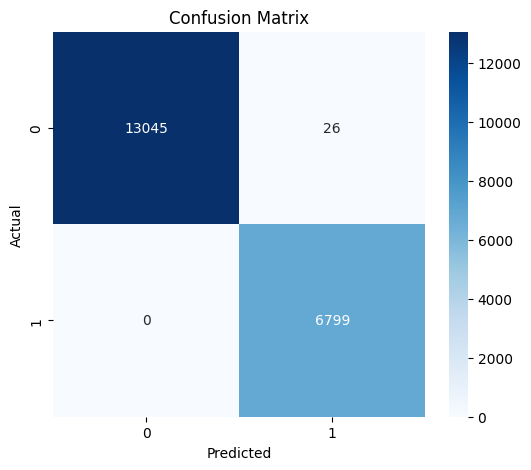

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(y_test_seq, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Accuracy & Loss Curve During Training

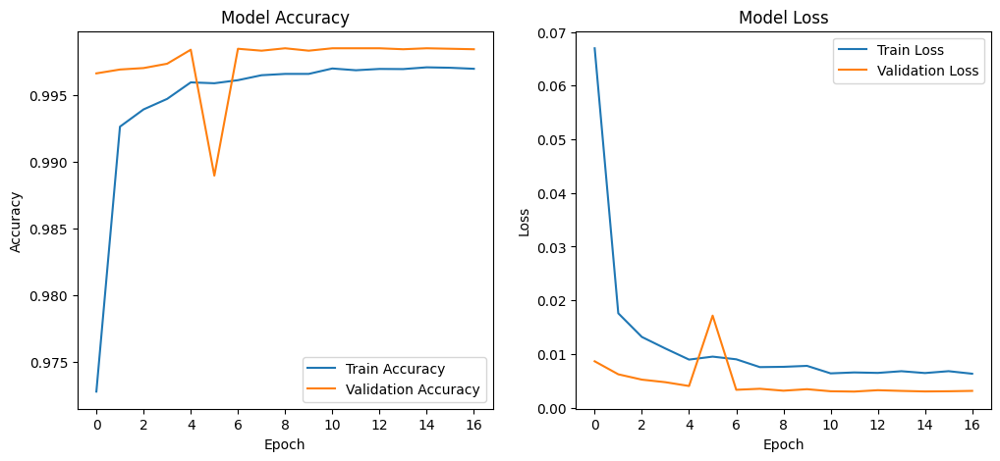

In [ ]:
plt.figure(figsize=(12,5))

# Accuracy plot
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

# Loss plot
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.show()


Classification Report Table

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd

# Get report as dictionary
report = classification_report(y_test_seq, y_pred, output_dict=True)
report_df = pd.DataFrame(report).transpose()

print(report_df)


              precision    recall  f1-score       support
0.0            1.000000  0.998011  0.999004  13071.000000
1.0            0.996190  1.000000  0.998092   6799.000000
accuracy       0.998691  0.998691  0.998691      0.998691
macro avg      0.998095  0.999005  0.998548  19870.000000
weighted avg   0.998696  0.998691  0.998692  19870.000000
